# Atividade 8 - Classificador Redes Neurais

# PCA

# Algoritmo Redes Neurais

SVM:

● Realizar validação cruzada k=10 para testar Redes Neurais utilizando:
    - todas a características
    - apenas com os componentes principais
    - apenas com as características selecionadas pelo selecionador 1
    - apenas com as características selecionadas pelo selecionador 2 (opcional)

Em cada um, calibrar os parâmetros (kernel, parâmetros do kernel e C) e reportar os valores médios de precisão, revocação e acurácia para o que apresentou melhor acurácia (com os respectivos intervalos de confiança)

## Dataset Completo

In [1]:
# imports

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from pandas import read_csv
from sklearn.model_selection import StratifiedKFold
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html

#normalizacao
from sklearn import preprocessing

# PCA
from sklearn.decomposition import PCA

# Modelagem
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# Classificador

from sklearn.neural_network import MLPClassifier


# Balanceamento das classes
from imblearn.combine import SMOTETomek

# Validação
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from scipy import stats as st

# pipeline
from sklearn.pipeline import Pipeline

import warnings

warnings.filterwarnings("ignore")

random_state=5007

%matplotlib inline

In [2]:
# importa dataset

df = read_csv('../../data/kag_risk_factors_cervical_cancer.csv')

print(df.shape)

#df.head()

(858, 36)


## Pré-Processamento

In [3]:
# substituindo ? por NAN
df.replace('?', np.NAN,inplace=True)

In [4]:
# Transforma as feature em numericas
df_processed = df.apply(pd.to_numeric, errors="ignore")

# Resultado final com as devidas alteracoes
#df_processed.info() 

## Eliminação (ou não) de instâncias com missing values

Para features continuas --> preenche com a mediana (para nao ter muito impacto com outliers)

Hipotese:
 - Para features categoricas --> preenche com o valor mais frequente
 
No decorrer dos experimentos validar se a hipotese é aceita ou não.

(Uma alternativa seria imputar os valores pelo moda (valor mais frequente), que provavelmente é uma solução ruim, pois a resposta verdadeira pode estar correlacionada com a probabilidade de um valor estar ausente. Pois isso teremos um bias, pois esses valores são privados e a pessoa pode escolher não divulga-los)

In [5]:
continuous_feat = ['Age',
                   'Number of sexual partners',
                   'First sexual intercourse',
                   'Num of pregnancies', 
                   'Smokes (years)',
                   'Smokes (packs/year)',
                   'Hormonal Contraceptives (years)',
                   'IUD (years)',
                   'STDs (number)',
                   'STDs: Number of diagnosis',
                   'STDs: Time since first diagnosis',
                   'STDs: Time since last diagnosis'] 

binary_feat = [  'Smokes',
                 'Hormonal Contraceptives',
                 'IUD',
                 'STDs',
                 'STDs:condylomatosis',
                 'STDs:cervical condylomatosis',
                 'STDs:vaginal condylomatosis',
                 'STDs:vulvo-perineal condylomatosis',
                 'STDs:syphilis',
                 'STDs:pelvic inflammatory disease',
                 'STDs:genital herpes',
                 'STDs:molluscum contagiosum',
                 'STDs:AIDS',
                 'STDs:HIV',
                 'STDs:Hepatitis B',
                 'STDs:HPV',
                 'Dx:Cancer',
                 'Dx:CIN',
                 'Dx:HPV',
                 'Dx',
                 'Hinselmann',
                 'Schiller',
                 'Citology']                               


In [6]:
df_imp = df_processed.copy()

In [7]:
# preenche com a mediana
imp_median = SimpleImputer(missing_values = np.nan, strategy = 'median')
df_imp[continuous_feat] = imp_median.fit_transform(df_processed[continuous_feat])

# preenche com o valor mais frequente
imp_most_freq = SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')
df_imp[binary_feat] = imp_most_freq.fit_transform(df_processed[binary_feat])

#df_imp.isnull().sum()


In [8]:
# Funcao de Plot dos dados

def plot_data(x, y, xlabel, ylabel, pos_label, neg_label, features, axes=None):
    plt.rcParams['figure.figsize'] = (10., 7.)
    
    pos = y[y==1].index
    neg = y[y==0].index
    
    if axes == None:
        axes = plt.gca()
    
    axes.scatter(X.iloc[pos][features[0]], X.iloc[pos][features[1]], marker='o', c='#003f5c', s=50, linewidth=2, label=pos_label)
    axes.scatter(X.iloc[neg][features[0]], X.iloc[neg][features[1]], marker='o', c='#ffa600', s=50, linewidth=2, label=neg_label)
    
#     axes.set_xlim([xmin, xmax])
#     axes.set_ylim([ymin, ymax])
    
    axes.set_xlabel(xlabel, fontsize=12)
    axes.set_ylabel(ylabel, fontsize=12)
    
    axes.legend(bbox_to_anchor=(1,1), fancybox=True)
    

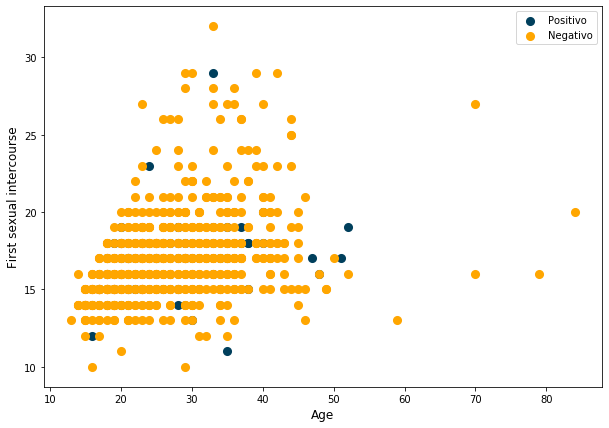

In [9]:
X = df_imp.drop('Biopsy', axis=1)
y = df_imp['Biopsy']

# Exmplo
features = ['Age', 'First sexual intercourse']

plot_data(X, y, features[0], features[1], 'Positivo', 'Negativo', features)

## PCA (matriz de correlação)

In [10]:
scaler = preprocessing.StandardScaler()
X_imp = df_imp.drop('Biopsy', axis=1)

X_std = pd.DataFrame(scaler.fit_transform(X_imp) , columns = X_imp.columns.tolist())

#X_std.describe()

In [11]:
pca_corr = PCA()
pca_corr.fit(X_std)

#pd.DataFrame(pca_corr.get_covariance(), columns = df_imp.columns.tolist()).head()

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [12]:
autovalores_corr = pca_corr.explained_variance_.tolist()
variancia_corr = pca_corr.explained_variance_ratio_
variancia_acumulada_corr = np.cumsum(variancia_corr.tolist())

print('\tAuto-valores\tVariância explicada\tVariância acumulada')
print()

for (num,item) in enumerate(variancia_acumulada_corr):
    print(num+1,'\t' + '%0.3f' % autovalores_corr[num] + '\t\t' +'%0.3f' %variancia_corr[num],'\t\t\t'+ '%0.2f' %item)

	Auto-valores	Variância explicada	Variância acumulada

1 	5.116		0.155 			0.15
2 	3.028		0.092 			0.25
3 	2.473		0.075 			0.32
4 	2.078		0.063 			0.38
5 	2.017		0.061 			0.45
6 	1.716		0.052 			0.50
7 	1.546		0.047 			0.54
8 	1.361		0.041 			0.59
9 	1.278		0.039 			0.62
10 	1.235		0.037 			0.66
11 	1.064		0.032 			0.69
12 	1.029		0.031 			0.72
13 	1.008		0.031 			0.76
14 	0.935		0.028 			0.78
15 	0.857		0.026 			0.81
16 	0.843		0.026 			0.83
17 	0.811		0.025 			0.86
18 	0.795		0.024 			0.88
19 	0.745		0.023 			0.91
20 	0.654		0.020 			0.93
21 	0.572		0.017 			0.94
22 	0.478		0.014 			0.96
23 	0.320		0.010 			0.97
24 	0.276		0.008 			0.98
25 	0.234		0.007 			0.98
26 	0.175		0.005 			0.99
27 	0.125		0.004 			0.99
28 	0.092		0.003 			0.99
29 	0.076		0.002 			1.00
30 	0.066		0.002 			1.00
31 	0.030		0.001 			1.00
32 	0.008		0.000 			1.00
33 	0.000		0.000 			1.00
34 	0.000		0.000 			1.00
35 	0.000		0.000 			1.00


In [13]:
max_var = []
for num in range(0, len(variancia_corr)):
    if variancia_corr[num] > 0.02: # threshold - queremos variancia mais que 0.02
        max_var.append(num)

best_var = max(max_var)
# +1 porque a tabela acima começa com 1 e nao com 0 
print('{} - {:.3f}'.format(best_var+1,variancia_corr[best_var]))

19 - 0.023


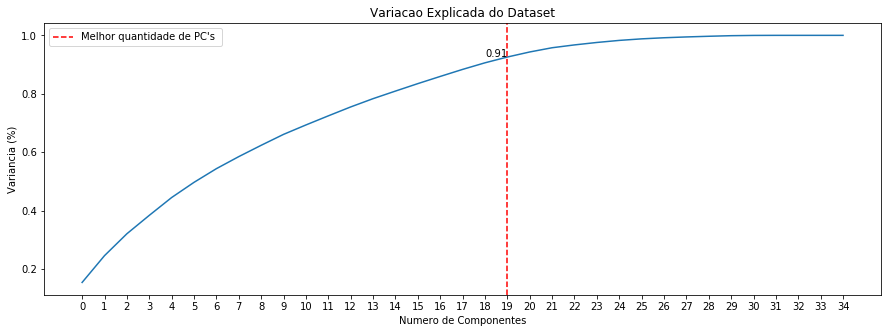

In [14]:
# Plotando o somatório cumulativo da variação explicada
PCA_MinMax = plt.figure(figsize=(15,5))
plt.plot(np.cumsum(variancia_corr))
plt.xlabel('Numero de Componentes')
plt.ylabel('Variancia (%)') #for each component
plt.xticks(range(0,35))
plt.axvline(best_var+1, 0, 1, label='Melhor quantidade de PC\'s ',  color='r', linestyle='--')
plt.legend()
plt.title('Variacao Explicada do Dataset')
plt.annotate('{:.2f}'.format(variancia_acumulada_corr[best_var]),
            xy=(best_var, variancia_acumulada_corr[best_var]+0.02), )
plt.show()

PCA_MinMax.savefig("PCA_MinMax.png", bbox_inches='tight', dpi=600)

In [15]:
numero_pcs = 12

pca_corr = PCA(n_components=numero_pcs)
df_pca = pd.DataFrame(pca_corr.fit_transform(X_std))
df_pca = df_pca.join(df_imp['Biopsy'])

df_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,Biopsy
0,-0.812797,-1.027703,-0.345670,0.404814,1.065855,-0.095015,-1.244151,-0.121488,-0.511773,-0.162232,-0.641065,-0.023496,0
1,-0.899585,-1.273109,-0.714807,0.461598,1.137518,0.103472,-1.278426,0.103233,-0.571305,-0.076910,0.093728,-0.310829,0
2,-0.815901,-0.655018,-0.485750,0.345716,0.145192,-0.172968,-0.648987,0.855171,0.217526,0.977642,-0.268782,-0.110602,0
3,1.486627,11.659296,10.983371,-3.329797,6.830953,-4.234741,0.053750,2.354115,-0.522076,0.692535,1.142823,0.755566,0
4,-0.630976,0.984724,0.638739,-0.135553,-2.382128,-0.246892,3.193193,0.173138,1.119888,0.319573,-0.081575,-0.037645,0


## Stratified Cross- Validation

### Dataset Desbalanceado

In [16]:
# Cross Validation com dataset DESBALANCEADO

def stratified_k_fold(df, k, algoritmo, random_state, grid_params, shuffle=False, shrinking=True):
    print('------')
    print('Algorimto Utilizado: {}'.format(algoritmo))
    print('------')

    # Utilizando todas as features como preditoras
    X = df.drop('Biopsy', axis=1)
    y = df['Biopsy']
    
    # quantidade original de classes
    count_classes = y.value_counts()
    
    # Stratified K Fold
    skf = StratifiedKFold(n_splits=k, shuffle=shuffle, random_state=random_state)
    skf.get_n_splits(X, y)
    print('k = {}, Dataset {} positivas e {} negativas ({:.2f}% x {:.2f}%)'.format(k, count_classes[1], 
                                                                                 count_classes[0], 
                                                                                 ((count_classes[1]/len(y))*100), 
                                                                                 ((count_classes[0]/len(y))*100)))

    
    # Scores (das futuras metricas)
    scores = []
    
    # coleta os parametros que serao testados
    hidden_layers = grid_params.get('hidden_layer_sizes')
    alpha_step = grid_params.get('alpha_step')
    activation = grid_params.get('activation')
    
    
    # Testa varios KERNELS
    for act in activation:
        print("-> Teste Funcao de Ativacao da camada oculta {}".format(act))
        
        for hidden in hidden_layers:
            print("-> Quantidade de neuronios {}".format(hidden))
 
            alphaX = 0.01
            while alphaX <= 0.1:
                print("-> Valor alpha{}".format(alphaX))
                
                print('-> Criando modelo com params hidden={}, act={}, alpha={}'.format(hidden, act, alphaX))
                clf = algoritmo(hidden_layer_sizes=(hidden, ), activation=act, verbose = 1, solver='adam', alpha=alphaX)
                clf.out_activation_ = 'softmax'
                # Folds
                for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
                    fold_number = fold
                    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
                    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

                    # quantidade de classes dentro da fold
                    count_classes_fold = y.iloc[test_index].value_counts()
                    # proporções
                    prop_pos = ((count_classes_fold[1]/count_classes_fold.sum())*100)
                    prop_neg = ((count_classes_fold[0]/count_classes_fold.sum())*100)
                    print('Fold {}: Pos: {}, Neg: {}, Total: {}, Proporção: {:.2f}% x {:.2f}%'.format(fold_number, 
                                                                                            count_classes_fold[1],
                                                                                            count_classes_fold[0], 
                                                                                            count_classes_fold.sum(),
                                                                                            prop_pos, prop_neg))  
                    
                    # aplica o classificador
                    clf = clf.fit(X_train, y_train)
                    #display(clf)
                    # predict no dataset de treino 
                    y_train_preds = clf.predict(X_train)
                    # predict no dataset de teste
                    y_pred = clf.predict(X_test)

                    print("\tNumero de instancias classificadas erradas do total de %d instancias : %d"
                            % (y_test.shape[0], (y_test != y_pred).sum()))
                    # print("Number of points predicted as Pos: %d"
                    #  % ((y_pred == 1).sum()))

                    # Scores do model (utilizados dados nao-balanceados) - dados de teste
                    recall = recall_score(y_test, y_pred)
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    scores.append([act, hidden, alphaX, fold_number, precision, recall, accuracy])
                        
                alphaX = alphaX + 0.01
                
        
    return np.array(scores)

### Dataset Balanceado

In [17]:
# Cross Validation com dataset DESBALANCEADO

def stratified_k_fold_SMOTE(df, k, algoritmo, random_state, grid_params, shuffle=False, shrinking=True):
    print('------')
    print('Algorimto Utilizado: {}'.format(algoritmo))
    print('------')

    # Utilizando todas as features como preditoras
    X = df.drop('Biopsy', axis=1)
    y = df['Biopsy']
    
    # quantidade original de classes
    count_classes = y.value_counts()
    
    # Stratified K Fold
    skf = StratifiedKFold(n_splits=k, shuffle=shuffle, random_state=random_state)
    skf.get_n_splits(X, y)
    print('k = {}, Dataset {} positivas e {} negativas ({:.2f}% x {:.2f}%)'.format(k, count_classes[1], 
                                                                                 count_classes[0], 
                                                                                 ((count_classes[1]/len(y))*100), 
                                                                                 ((count_classes[0]/len(y))*100)))

        # Normalização MinMax
    minmax_scale = preprocessing.MinMaxScaler(feature_range=(0, 1))
    
    # SMOTETomek
    cc = SMOTETomek(random_state=random_state)
    
    # Scores (das futuras metricas)
    scores = []
    
    # coleta os parametros que serao testados
    hidden_layers = grid_params.get('hidden_layer_sizes')
    alpha_step = grid_params.get('alpha_step')
    activation = grid_params.get('activation')
    
    
    # Testa varios KERNELS
    for act in activation:
        print("-> Teste Funcao de Ativacao da camada oculta: {}".format(act))
        
        for hidden in hidden_layers:
            print("-> Quantidade de neuronios: {}".format(hidden))
 
            alphaX = 0.01
            while alphaX <= 0.1:
                print("-> Valor alpha: {}".format(alphaX))
                
                print('-> Criando modelo com params hidden={}, act={}, alpha={}'.format(hidden, act, alphaX))
                clf = algoritmo(hidden_layer_sizes=(hidden, ), activation=act, verbose = 1, solver='adam', alpha=alphaX)
                clf.out_activation_ = 'softmax'
                # Folds
                for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
                    fold_number = fold
                    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
                    X_test, y_test = X.iloc[test_index], y.iloc[test_index]

                    # quantidade de classes dentro da fold
                    count_classes_fold = y.iloc[test_index].value_counts()
                    # proporções
                    prop_pos = ((count_classes_fold[1]/count_classes_fold.sum())*100)
                    prop_neg = ((count_classes_fold[0]/count_classes_fold.sum())*100)
                    print('Fold {}: Pos: {}, Neg: {}, Total: {}, Proporção: {:.2f}% x {:.2f}%'.format(fold_number, 
                                                                                            count_classes_fold[1],
                                                                                            count_classes_fold[0], 
                                                                                            count_classes_fold.sum(),
                                                                                            prop_pos, prop_neg))  
                    
                    # aplica o classificador
                    clf = clf.fit(X_train, y_train)
                    #display(clf)
                    # predict no dataset de treino 
                    y_train_preds = clf.predict(X_train)
                    # predict no dataset de teste
                    y_pred = clf.predict(X_test)

                    print("\tNumero de instancias classificadas erradas do total de %d instancias : %d"
                            % (y_test.shape[0], (y_test != y_pred).sum()))
                    # print("Number of points predicted as Pos: %d"
                    #  % ((y_pred == 1).sum()))

                    # Scores do model (utilizados dados nao-balanceados) - dados de teste
                    recall = recall_score(y_test, y_pred)
                    print('Recall')
                    print(recall)
                    accuracy = accuracy_score(y_test, y_pred)
                    precision = precision_score(y_test, y_pred)
                    scores.append([act, hidden, alphaX, fold_number, precision, recall, accuracy])
                        
                alphaX = alphaX + 0.01
                
        
    return np.array(scores)

## Grid de Parametros para teste

In [18]:
grid_params_all = {'hidden_layer_sizes': [10, 7, 70],
                   'alpha_step': 0.01,
                   'activation': ['tanh', 'relu']
                  }

#grid_params_semi = {'gamma_range': [1e-4, 10e-1],
#               'gamma_step': 0.01,
#               'kernels': ['linear', 'rbf', 'sigmoid'],#, 'precomputed'],
#               'C_range': [1, 10, 100, 1000]
#              }

grid_params_semi = {'hidden_layer_sizes': [10, 7, 70],
                    'alpha_step': 0.01,
                    'activation': ['tanh', 'relu']
                   }

#grid_params_linear = {'kernels': ['linear'],
#                      'C_range': [1, 10, 100, 1000]
#                     }


grid_params_tanh = {'hidden_layer_sizes': [10, 7, 70],
                       'alpha_step': 0.001,
                       'activation': ['tanh'],
                       'solver': ['lbfgs', 'sgd', 'adam']
                      }


grid_params_relu= {'hidden_layer_sizes': [10, 7, 70],
                   'alpha_step': 0.001,
                   'activation': ['relu'],
                   'solver': ['lbfgs', 'sgd', 'adam']
                  }

## Calculando Precisão, Revocação e Acurácia

### Algortimo-> Redes Neurais

### Dataset Desbalanceado

In [19]:
k = 10
print('K-Fold com K = {}'.format(k))
scores_unbalanced = pd.DataFrame(stratified_k_fold(df_pca, k, MLPClassifier, random_state, grid_params_all, shuffle=False))

#scores.append([act, hidden, alpha, fold_number, precision, recall, accuracy])
scores_unbalanced = scores_unbalanced.rename(columns = {0: 'FUNATIVACAO', 1: 'QTDCAMADA', 2: 'Alpha', 3:'Fold', 
                                                        4: 'Precision', 5: 'Recall', 6: 'Accuracy'}) 
scores_unbalanced['Algorimto'] = 'MLPClassifier'
float_cols = ['Alpha', 'Fold', 'Precision', 'Recall', 'Accuracy']# 'Gamma'
scores_unbalanced[float_cols] = scores_unbalanced[float_cols].apply(pd.to_numeric, errors='coerce')
print('----'*20)

K-Fold com K = 10
------
Algorimto Utilizado: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
------
k = 10, Dataset 55 positivas e 803 negativas (6.41% x 93.59%)
-> Teste Funcao de Ativacao da camada oculta tanh
-> Quantidade de neuronios 10
-> Valor alpha0.01
-> Criando modelo com params hidden=10, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.18416164
Iteration 2, loss = 1.15178777
Iteration 3, loss = 1.12073196
Iteration 4, loss = 1.09006493
Iteration 5, loss = 1.05940109
Iteration 6, loss = 1.03100266
Iteration 7, loss = 1.00216742
Iteration 8, loss = 0.97417025
Iteration 9, loss = 0.94848104
Iteration 10, loss = 0.92186562
Iteration 11, loss = 0.89715982
Iteration 12, loss = 0.87270756
Iteration 13, loss = 0.84967000
Iteration 14, loss = 0.82697884
Iteration 15, loss = 0.80568050
Iteration 16, loss = 0.78479903
Iteration 17, loss = 0.76543680
Iteration 18, loss = 0.74648131
Iteration 19, loss = 0.727

Iteration 38, loss = 0.29878775
Iteration 39, loss = 0.29492666
Iteration 40, loss = 0.29098514
Iteration 41, loss = 0.28723909
Iteration 42, loss = 0.28361488
Iteration 43, loss = 0.28002996
Iteration 44, loss = 0.27655852
Iteration 45, loss = 0.27316005
Iteration 46, loss = 0.26984158
Iteration 47, loss = 0.26663832
Iteration 48, loss = 0.26346807
Iteration 49, loss = 0.26033508
Iteration 50, loss = 0.25723664
Iteration 51, loss = 0.25425311
Iteration 52, loss = 0.25131295
Iteration 53, loss = 0.24844307
Iteration 54, loss = 0.24558441
Iteration 55, loss = 0.24280994
Iteration 56, loss = 0.23999082
Iteration 57, loss = 0.23722611
Iteration 58, loss = 0.23444815
Iteration 59, loss = 0.23182133
Iteration 60, loss = 0.22918263
Iteration 61, loss = 0.22657842
Iteration 62, loss = 0.22394393
Iteration 63, loss = 0.22128675
Iteration 64, loss = 0.21877239
Iteration 65, loss = 0.21636449
Iteration 66, loss = 0.21387927
Iteration 67, loss = 0.21137862
Iteration 68, loss = 0.20909641
Iteratio

Iteration 105, loss = 0.19387090
Iteration 106, loss = 0.19191378
Iteration 107, loss = 0.19004481
Iteration 108, loss = 0.18824382
Iteration 109, loss = 0.18652028
Iteration 110, loss = 0.18468332
Iteration 111, loss = 0.18308411
Iteration 112, loss = 0.18135834
Iteration 113, loss = 0.17972139
Iteration 114, loss = 0.17810253
Iteration 115, loss = 0.17652366
Iteration 116, loss = 0.17500414
Iteration 117, loss = 0.17339193
Iteration 118, loss = 0.17184209
Iteration 119, loss = 0.17042586
Iteration 120, loss = 0.16892553
Iteration 121, loss = 0.16747034
Iteration 122, loss = 0.16601807
Iteration 123, loss = 0.16468137
Iteration 124, loss = 0.16332209
Iteration 125, loss = 0.16189183
Iteration 126, loss = 0.16052123
Iteration 127, loss = 0.15926814
Iteration 128, loss = 0.15791975
Iteration 129, loss = 0.15667141
Iteration 130, loss = 0.15538097
Iteration 131, loss = 0.15415049
Iteration 132, loss = 0.15295224
Iteration 133, loss = 0.15180319
Iteration 134, loss = 0.15054133
Iteration 

Iteration 171, loss = 0.13078675
Iteration 172, loss = 0.13030787
Iteration 173, loss = 0.12979914
Iteration 174, loss = 0.12930808
Iteration 175, loss = 0.12882360
Iteration 176, loss = 0.12834497
Iteration 177, loss = 0.12786343
Iteration 178, loss = 0.12739859
Iteration 179, loss = 0.12694599
Iteration 180, loss = 0.12646209
Iteration 181, loss = 0.12601132
Iteration 182, loss = 0.12556644
Iteration 183, loss = 0.12511095
Iteration 184, loss = 0.12467865
Iteration 185, loss = 0.12422606
Iteration 186, loss = 0.12382126
Iteration 187, loss = 0.12338160
Iteration 188, loss = 0.12298385
Iteration 189, loss = 0.12254173
Iteration 190, loss = 0.12214617
Iteration 191, loss = 0.12176214
Iteration 192, loss = 0.12136160
Iteration 193, loss = 0.12099302
Iteration 194, loss = 0.12054211
Iteration 195, loss = 0.12019834
Iteration 196, loss = 0.11979189
Iteration 197, loss = 0.11940578
Iteration 198, loss = 0.11908256
Iteration 199, loss = 0.11867812
Iteration 200, loss = 0.11833188
	Numero de

Iteration 26, loss = 0.33832830
Iteration 27, loss = 0.33180266
Iteration 28, loss = 0.32539927
Iteration 29, loss = 0.31925702
Iteration 30, loss = 0.31318942
Iteration 31, loss = 0.30743748
Iteration 32, loss = 0.30178046
Iteration 33, loss = 0.29641236
Iteration 34, loss = 0.29100337
Iteration 35, loss = 0.28596640
Iteration 36, loss = 0.28091369
Iteration 37, loss = 0.27613557
Iteration 38, loss = 0.27145289
Iteration 39, loss = 0.26688233
Iteration 40, loss = 0.26245372
Iteration 41, loss = 0.25807783
Iteration 42, loss = 0.25388132
Iteration 43, loss = 0.24984910
Iteration 44, loss = 0.24591190
Iteration 45, loss = 0.24198842
Iteration 46, loss = 0.23830847
Iteration 47, loss = 0.23464959
Iteration 48, loss = 0.23112573
Iteration 49, loss = 0.22772883
Iteration 50, loss = 0.22435847
Iteration 51, loss = 0.22113508
Iteration 52, loss = 0.21796292
Iteration 53, loss = 0.21491315
Iteration 54, loss = 0.21191509
Iteration 55, loss = 0.20904532
Iteration 56, loss = 0.20618166
Iteratio

Iteration 86, loss = 0.25368375
Iteration 87, loss = 0.25096226
Iteration 88, loss = 0.24840693
Iteration 89, loss = 0.24573115
Iteration 90, loss = 0.24324898
Iteration 91, loss = 0.24075441
Iteration 92, loss = 0.23848213
Iteration 93, loss = 0.23602415
Iteration 94, loss = 0.23373366
Iteration 95, loss = 0.23150180
Iteration 96, loss = 0.22934326
Iteration 97, loss = 0.22715677
Iteration 98, loss = 0.22509940
Iteration 99, loss = 0.22305325
Iteration 100, loss = 0.22103167
Iteration 101, loss = 0.21910970
Iteration 102, loss = 0.21719514
Iteration 103, loss = 0.21531735
Iteration 104, loss = 0.21349488
Iteration 105, loss = 0.21180568
Iteration 106, loss = 0.21005361
Iteration 107, loss = 0.20832782
Iteration 108, loss = 0.20666063
Iteration 109, loss = 0.20505086
Iteration 110, loss = 0.20348931
Iteration 111, loss = 0.20192065
Iteration 112, loss = 0.20036993
Iteration 113, loss = 0.19892024
Iteration 114, loss = 0.19749014
Iteration 115, loss = 0.19603178
Iteration 116, loss = 0.

Iteration 148, loss = 0.13653740
Iteration 149, loss = 0.13575503
Iteration 150, loss = 0.13498922
Iteration 151, loss = 0.13421452
Iteration 152, loss = 0.13350693
Iteration 153, loss = 0.13271323
Iteration 154, loss = 0.13199714
Iteration 155, loss = 0.13128413
Iteration 156, loss = 0.13054096
Iteration 157, loss = 0.12983269
Iteration 158, loss = 0.12913923
Iteration 159, loss = 0.12846555
Iteration 160, loss = 0.12779213
Iteration 161, loss = 0.12714038
Iteration 162, loss = 0.12647988
Iteration 163, loss = 0.12585749
Iteration 164, loss = 0.12523784
Iteration 165, loss = 0.12462555
Iteration 166, loss = 0.12401698
Iteration 167, loss = 0.12342079
Iteration 168, loss = 0.12283817
Iteration 169, loss = 0.12226562
Iteration 170, loss = 0.12170104
Iteration 171, loss = 0.12113842
Iteration 172, loss = 0.12059077
Iteration 173, loss = 0.12005402
Iteration 174, loss = 0.11951292
Iteration 175, loss = 0.11898172
Iteration 176, loss = 0.11847413
Iteration 177, loss = 0.11796270
Iteration 

Iteration 12, loss = 0.39409123
Iteration 13, loss = 0.38420187
Iteration 14, loss = 0.37466715
Iteration 15, loss = 0.36545508
Iteration 16, loss = 0.35661370
Iteration 17, loss = 0.34828744
Iteration 18, loss = 0.33993626
Iteration 19, loss = 0.33220127
Iteration 20, loss = 0.32464430
Iteration 21, loss = 0.31731379
Iteration 22, loss = 0.31031732
Iteration 23, loss = 0.30355218
Iteration 24, loss = 0.29699526
Iteration 25, loss = 0.29053072
Iteration 26, loss = 0.28452613
Iteration 27, loss = 0.27848839
Iteration 28, loss = 0.27268887
Iteration 29, loss = 0.26709297
Iteration 30, loss = 0.26183974
Iteration 31, loss = 0.25665703
Iteration 32, loss = 0.25159271
Iteration 33, loss = 0.24680935
Iteration 34, loss = 0.24199892
Iteration 35, loss = 0.23772307
Iteration 36, loss = 0.23343952
Iteration 37, loss = 0.22937009
Iteration 38, loss = 0.22552582
Iteration 39, loss = 0.22187628
Iteration 40, loss = 0.21828413
Iteration 41, loss = 0.21487399
Iteration 42, loss = 0.21175982
Iteratio

Iteration 67, loss = 0.43306610
Iteration 68, loss = 0.42624739
Iteration 69, loss = 0.41951467
Iteration 70, loss = 0.41299425
Iteration 71, loss = 0.40655959
Iteration 72, loss = 0.40031797
Iteration 73, loss = 0.39426923
Iteration 74, loss = 0.38826724
Iteration 75, loss = 0.38256044
Iteration 76, loss = 0.37675174
Iteration 77, loss = 0.37121709
Iteration 78, loss = 0.36590524
Iteration 79, loss = 0.36050685
Iteration 80, loss = 0.35522408
Iteration 81, loss = 0.35025520
Iteration 82, loss = 0.34525136
Iteration 83, loss = 0.34043899
Iteration 84, loss = 0.33566267
Iteration 85, loss = 0.33105442
Iteration 86, loss = 0.32664608
Iteration 87, loss = 0.32213349
Iteration 88, loss = 0.31784435
Iteration 89, loss = 0.31368266
Iteration 90, loss = 0.30947683
Iteration 91, loss = 0.30551226
Iteration 92, loss = 0.30156161
Iteration 93, loss = 0.29773218
Iteration 94, loss = 0.29399519
Iteration 95, loss = 0.29027344
Iteration 96, loss = 0.28671564
Iteration 97, loss = 0.28315273
Iteratio

Iteration 131, loss = 0.11396987
Iteration 132, loss = 0.11362111
Iteration 133, loss = 0.11324275
Iteration 134, loss = 0.11283152
Iteration 135, loss = 0.11245093
Iteration 136, loss = 0.11212614
Iteration 137, loss = 0.11178302
Iteration 138, loss = 0.11139860
Iteration 139, loss = 0.11107699
Iteration 140, loss = 0.11076826
Iteration 141, loss = 0.11045136
Iteration 142, loss = 0.11014915
Iteration 143, loss = 0.10979107
Iteration 144, loss = 0.10951212
Iteration 145, loss = 0.10919070
Iteration 146, loss = 0.10890896
Iteration 147, loss = 0.10858124
Iteration 148, loss = 0.10834583
Iteration 149, loss = 0.10804477
Iteration 150, loss = 0.10774472
Iteration 151, loss = 0.10747920
Iteration 152, loss = 0.10722523
Iteration 153, loss = 0.10693082
Iteration 154, loss = 0.10667478
Iteration 155, loss = 0.10643213
Iteration 156, loss = 0.10618614
Iteration 157, loss = 0.10595887
Iteration 158, loss = 0.10574616
Iteration 159, loss = 0.10545711
Iteration 160, loss = 0.10521017
Iteration 

Iteration 1, loss = 1.17131454
Iteration 2, loss = 1.14428005
Iteration 3, loss = 1.11752256
Iteration 4, loss = 1.09208807
Iteration 5, loss = 1.06631534
Iteration 6, loss = 1.04197111
Iteration 7, loss = 1.01841440
Iteration 8, loss = 0.99451788
Iteration 9, loss = 0.97145685
Iteration 10, loss = 0.94960135
Iteration 11, loss = 0.92811831
Iteration 12, loss = 0.90714559
Iteration 13, loss = 0.88684153
Iteration 14, loss = 0.86671443
Iteration 15, loss = 0.84777964
Iteration 16, loss = 0.82950364
Iteration 17, loss = 0.81126123
Iteration 18, loss = 0.79387355
Iteration 19, loss = 0.77669432
Iteration 20, loss = 0.76011893
Iteration 21, loss = 0.74417539
Iteration 22, loss = 0.72850678
Iteration 23, loss = 0.71348833
Iteration 24, loss = 0.69856594
Iteration 25, loss = 0.68452739
Iteration 26, loss = 0.67061581
Iteration 27, loss = 0.65743493
Iteration 28, loss = 0.64426960
Iteration 29, loss = 0.63155221
Iteration 30, loss = 0.61934968
Iteration 31, loss = 0.60746945
Iteration 32, los

Iteration 79, loss = 0.21864090
Iteration 80, loss = 0.21590499
Iteration 81, loss = 0.21321613
Iteration 82, loss = 0.21050111
Iteration 83, loss = 0.20791501
Iteration 84, loss = 0.20542094
Iteration 85, loss = 0.20287569
Iteration 86, loss = 0.20046226
Iteration 87, loss = 0.19803644
Iteration 88, loss = 0.19566219
Iteration 89, loss = 0.19340606
Iteration 90, loss = 0.19112561
Iteration 91, loss = 0.18894920
Iteration 92, loss = 0.18678948
Iteration 93, loss = 0.18472621
Iteration 94, loss = 0.18271530
Iteration 95, loss = 0.18070002
Iteration 96, loss = 0.17876898
Iteration 97, loss = 0.17697152
Iteration 98, loss = 0.17512383
Iteration 99, loss = 0.17334719
Iteration 100, loss = 0.17158737
Iteration 101, loss = 0.16987859
Iteration 102, loss = 0.16825868
Iteration 103, loss = 0.16665086
Iteration 104, loss = 0.16504861
Iteration 105, loss = 0.16354035
Iteration 106, loss = 0.16206041
Iteration 107, loss = 0.16056949
Iteration 108, loss = 0.15914833
Iteration 109, loss = 0.1577457

Iteration 137, loss = 0.10928762
Iteration 138, loss = 0.10885590
Iteration 139, loss = 0.10846704
Iteration 140, loss = 0.10809596
Iteration 141, loss = 0.10769770
Iteration 142, loss = 0.10734144
Iteration 143, loss = 0.10702124
Iteration 144, loss = 0.10665679
Iteration 145, loss = 0.10631018
Iteration 146, loss = 0.10597453
Iteration 147, loss = 0.10565045
Iteration 148, loss = 0.10532215
Iteration 149, loss = 0.10501152
Iteration 150, loss = 0.10473434
Iteration 151, loss = 0.10441235
Iteration 152, loss = 0.10409151
Iteration 153, loss = 0.10380192
Iteration 154, loss = 0.10351560
Iteration 155, loss = 0.10323873
Iteration 156, loss = 0.10295549
Iteration 157, loss = 0.10269873
Iteration 158, loss = 0.10238481
Iteration 159, loss = 0.10212177
Iteration 160, loss = 0.10184574
Iteration 161, loss = 0.10158398
Iteration 162, loss = 0.10134256
Iteration 163, loss = 0.10107454
Iteration 164, loss = 0.10081351
Iteration 165, loss = 0.10055976
Iteration 166, loss = 0.10032263
Iteration 

Iteration 195, loss = 0.09160966
Iteration 196, loss = 0.09144645
Iteration 197, loss = 0.09131197
Iteration 198, loss = 0.09116774
Iteration 199, loss = 0.09105076
Iteration 200, loss = 0.09088004
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.09060749
Iteration 2, loss = 1.06474874
Iteration 3, loss = 1.03943773
Iteration 4, loss = 1.01500218
Iteration 5, loss = 0.99114579
Iteration 6, loss = 0.96768208
Iteration 7, loss = 0.94533281
Iteration 8, loss = 0.92381771
Iteration 9, loss = 0.90260000
Iteration 10, loss = 0.88249685
Iteration 11, loss = 0.86253911
Iteration 12, loss = 0.84359734
Iteration 13, loss = 0.82515074
Iteration 14, loss = 0.80756063
Iteration 15, loss = 0.79028355
Iteration 16, loss = 0.77369268
Iteration 17, loss = 0.75752285
Iteration 18, loss = 0.74207527
Iteration 19, loss = 0.72708560
Iteration 20, loss = 0.71228703
Iteration 21, loss = 0.69826608
Ite

Iteration 42, loss = 0.31696366
Iteration 43, loss = 0.31061755
Iteration 44, loss = 0.30475141
Iteration 45, loss = 0.29879290
Iteration 46, loss = 0.29309568
Iteration 47, loss = 0.28774274
Iteration 48, loss = 0.28256386
Iteration 49, loss = 0.27749897
Iteration 50, loss = 0.27271779
Iteration 51, loss = 0.26801490
Iteration 52, loss = 0.26345332
Iteration 53, loss = 0.25926306
Iteration 54, loss = 0.25494312
Iteration 55, loss = 0.25095015
Iteration 56, loss = 0.24709170
Iteration 57, loss = 0.24328884
Iteration 58, loss = 0.23968889
Iteration 59, loss = 0.23614691
Iteration 60, loss = 0.23273298
Iteration 61, loss = 0.22938851
Iteration 62, loss = 0.22616920
Iteration 63, loss = 0.22307436
Iteration 64, loss = 0.22012982
Iteration 65, loss = 0.21724943
Iteration 66, loss = 0.21444526
Iteration 67, loss = 0.21184112
Iteration 68, loss = 0.20920031
Iteration 69, loss = 0.20670916
Iteration 70, loss = 0.20429109
Iteration 71, loss = 0.20196627
Iteration 72, loss = 0.19960808
Iteratio

Iteration 97, loss = 0.16642357
Iteration 98, loss = 0.16498246
Iteration 99, loss = 0.16361875
Iteration 100, loss = 0.16218702
Iteration 101, loss = 0.16084863
Iteration 102, loss = 0.15956415
Iteration 103, loss = 0.15828455
Iteration 104, loss = 0.15697107
Iteration 105, loss = 0.15573495
Iteration 106, loss = 0.15450782
Iteration 107, loss = 0.15333550
Iteration 108, loss = 0.15215646
Iteration 109, loss = 0.15098368
Iteration 110, loss = 0.14987930
Iteration 111, loss = 0.14873385
Iteration 112, loss = 0.14764885
Iteration 113, loss = 0.14661470
Iteration 114, loss = 0.14554378
Iteration 115, loss = 0.14454215
Iteration 116, loss = 0.14352678
Iteration 117, loss = 0.14254043
Iteration 118, loss = 0.14154540
Iteration 119, loss = 0.14060273
Iteration 120, loss = 0.13963799
Iteration 121, loss = 0.13877157
Iteration 122, loss = 0.13780866
Iteration 123, loss = 0.13697602
Iteration 124, loss = 0.13610795
Iteration 125, loss = 0.13520330
Iteration 126, loss = 0.13440527
Iteration 127

Iteration 162, loss = 0.10745368
Iteration 163, loss = 0.10715232
Iteration 164, loss = 0.10688940
Iteration 165, loss = 0.10658194
Iteration 166, loss = 0.10630200
Iteration 167, loss = 0.10600860
Iteration 168, loss = 0.10573956
Iteration 169, loss = 0.10545279
Iteration 170, loss = 0.10519793
Iteration 171, loss = 0.10494179
Iteration 172, loss = 0.10467225
Iteration 173, loss = 0.10438321
Iteration 174, loss = 0.10412531
Iteration 175, loss = 0.10386998
Iteration 176, loss = 0.10365572
Iteration 177, loss = 0.10335322
Iteration 178, loss = 0.10310606
Iteration 179, loss = 0.10287584
Iteration 180, loss = 0.10263731
Iteration 181, loss = 0.10243229
Iteration 182, loss = 0.10216203
Iteration 183, loss = 0.10191766
Iteration 184, loss = 0.10167710
Iteration 185, loss = 0.10144196
Iteration 186, loss = 0.10121238
Iteration 187, loss = 0.10099949
Iteration 188, loss = 0.10078713
Iteration 189, loss = 0.10054814
Iteration 190, loss = 0.10034049
Iteration 191, loss = 0.10009716
Iteration 

Iteration 30, loss = 0.21947274
Iteration 31, loss = 0.21549078
Iteration 32, loss = 0.21190177
Iteration 33, loss = 0.20812247
Iteration 34, loss = 0.20473490
Iteration 35, loss = 0.20116662
Iteration 36, loss = 0.19787626
Iteration 37, loss = 0.19455683
Iteration 38, loss = 0.19150863
Iteration 39, loss = 0.18835267
Iteration 40, loss = 0.18533616
Iteration 41, loss = 0.18251746
Iteration 42, loss = 0.17964692
Iteration 43, loss = 0.17693372
Iteration 44, loss = 0.17427797
Iteration 45, loss = 0.17178293
Iteration 46, loss = 0.16929152
Iteration 47, loss = 0.16680813
Iteration 48, loss = 0.16454337
Iteration 49, loss = 0.16226580
Iteration 50, loss = 0.16001823
Iteration 51, loss = 0.15797649
Iteration 52, loss = 0.15582262
Iteration 53, loss = 0.15382847
Iteration 54, loss = 0.15193237
Iteration 55, loss = 0.14999886
Iteration 56, loss = 0.14816482
Iteration 57, loss = 0.14634773
Iteration 58, loss = 0.14463019
Iteration 59, loss = 0.14295956
Iteration 60, loss = 0.14125572
Iteratio

Iteration 88, loss = 0.14849836
Iteration 89, loss = 0.14737488
Iteration 90, loss = 0.14632345
Iteration 91, loss = 0.14530072
Iteration 92, loss = 0.14426995
Iteration 93, loss = 0.14333976
Iteration 94, loss = 0.14235643
Iteration 95, loss = 0.14142134
Iteration 96, loss = 0.14049370
Iteration 97, loss = 0.13961935
Iteration 98, loss = 0.13870858
Iteration 99, loss = 0.13790384
Iteration 100, loss = 0.13704756
Iteration 101, loss = 0.13623643
Iteration 102, loss = 0.13544904
Iteration 103, loss = 0.13468431
Iteration 104, loss = 0.13392195
Iteration 105, loss = 0.13317346
Iteration 106, loss = 0.13246747
Iteration 107, loss = 0.13173759
Iteration 108, loss = 0.13109619
Iteration 109, loss = 0.13040216
Iteration 110, loss = 0.12975856
Iteration 111, loss = 0.12909740
Iteration 112, loss = 0.12844451
Iteration 113, loss = 0.12783590
Iteration 114, loss = 0.12722109
Iteration 115, loss = 0.12659197
Iteration 116, loss = 0.12600144
Iteration 117, loss = 0.12540601
Iteration 118, loss = 

Iteration 160, loss = 0.09175196
Iteration 161, loss = 0.09147475
Iteration 162, loss = 0.09117205
Iteration 163, loss = 0.09087161
Iteration 164, loss = 0.09058181
Iteration 165, loss = 0.09031819
Iteration 166, loss = 0.09001400
Iteration 167, loss = 0.08972454
Iteration 168, loss = 0.08946547
Iteration 169, loss = 0.08918484
Iteration 170, loss = 0.08893221
Iteration 171, loss = 0.08864316
Iteration 172, loss = 0.08840214
Iteration 173, loss = 0.08812677
Iteration 174, loss = 0.08785149
Iteration 175, loss = 0.08761506
Iteration 176, loss = 0.08736520
Iteration 177, loss = 0.08710430
Iteration 178, loss = 0.08683817
Iteration 179, loss = 0.08661001
Iteration 180, loss = 0.08634617
Iteration 181, loss = 0.08612496
Iteration 182, loss = 0.08587410
Iteration 183, loss = 0.08565350
Iteration 184, loss = 0.08536514
Iteration 185, loss = 0.08513443
Iteration 186, loss = 0.08489234
Iteration 187, loss = 0.08469058
Iteration 188, loss = 0.08442378
Iteration 189, loss = 0.08419513
Iteration 

Iteration 27, loss = 0.77593421
Iteration 28, loss = 0.76073176
Iteration 29, loss = 0.74519022
Iteration 30, loss = 0.73054461
Iteration 31, loss = 0.71529981
Iteration 32, loss = 0.70054976
Iteration 33, loss = 0.68577438
Iteration 34, loss = 0.67132498
Iteration 35, loss = 0.65678442
Iteration 36, loss = 0.64282491
Iteration 37, loss = 0.62893771
Iteration 38, loss = 0.61506200
Iteration 39, loss = 0.60147044
Iteration 40, loss = 0.58820294
Iteration 41, loss = 0.57553090
Iteration 42, loss = 0.56262270
Iteration 43, loss = 0.55022088
Iteration 44, loss = 0.53834459
Iteration 45, loss = 0.52635602
Iteration 46, loss = 0.51496504
Iteration 47, loss = 0.50382244
Iteration 48, loss = 0.49309921
Iteration 49, loss = 0.48245155
Iteration 50, loss = 0.47241700
Iteration 51, loss = 0.46260581
Iteration 52, loss = 0.45292177
Iteration 53, loss = 0.44363635
Iteration 54, loss = 0.43481641
Iteration 55, loss = 0.42607452
Iteration 56, loss = 0.41776180
Iteration 57, loss = 0.40990899
Iteratio

Iteration 84, loss = 0.20004883
Iteration 85, loss = 0.19798429
Iteration 86, loss = 0.19599434
Iteration 87, loss = 0.19404016
Iteration 88, loss = 0.19216043
Iteration 89, loss = 0.19033299
Iteration 90, loss = 0.18851728
Iteration 91, loss = 0.18678187
Iteration 92, loss = 0.18509336
Iteration 93, loss = 0.18348867
Iteration 94, loss = 0.18182196
Iteration 95, loss = 0.18024191
Iteration 96, loss = 0.17873283
Iteration 97, loss = 0.17724465
Iteration 98, loss = 0.17579036
Iteration 99, loss = 0.17435470
Iteration 100, loss = 0.17295807
Iteration 101, loss = 0.17158429
Iteration 102, loss = 0.17026936
Iteration 103, loss = 0.16895355
Iteration 104, loss = 0.16768538
Iteration 105, loss = 0.16645239
Iteration 106, loss = 0.16522688
Iteration 107, loss = 0.16403558
Iteration 108, loss = 0.16284105
Iteration 109, loss = 0.16168458
Iteration 110, loss = 0.16056589
Iteration 111, loss = 0.15943604
Iteration 112, loss = 0.15838425
Iteration 113, loss = 0.15730442
Iteration 114, loss = 0.15

Iteration 150, loss = 0.10779416
Iteration 151, loss = 0.10747382
Iteration 152, loss = 0.10717982
Iteration 153, loss = 0.10682670
Iteration 154, loss = 0.10651163
Iteration 155, loss = 0.10619212
Iteration 156, loss = 0.10591315
Iteration 157, loss = 0.10556390
Iteration 158, loss = 0.10529284
Iteration 159, loss = 0.10498393
Iteration 160, loss = 0.10468838
Iteration 161, loss = 0.10440948
Iteration 162, loss = 0.10410947
Iteration 163, loss = 0.10382223
Iteration 164, loss = 0.10356312
Iteration 165, loss = 0.10327194
Iteration 166, loss = 0.10299923
Iteration 167, loss = 0.10274844
Iteration 168, loss = 0.10250050
Iteration 169, loss = 0.10222743
Iteration 170, loss = 0.10198092
Iteration 171, loss = 0.10170996
Iteration 172, loss = 0.10148019
Iteration 173, loss = 0.10123792
Iteration 174, loss = 0.10097818
Iteration 175, loss = 0.10078033
Iteration 176, loss = 0.10052054
Iteration 177, loss = 0.10029210
Iteration 178, loss = 0.10007952
Iteration 179, loss = 0.09985868
Iteration 

Iteration 6, loss = 0.71933484
Iteration 7, loss = 0.70623278
Iteration 8, loss = 0.69332017
Iteration 9, loss = 0.68081233
Iteration 10, loss = 0.66860127
Iteration 11, loss = 0.65670107
Iteration 12, loss = 0.64504762
Iteration 13, loss = 0.63348167
Iteration 14, loss = 0.62260109
Iteration 15, loss = 0.61185059
Iteration 16, loss = 0.60131328
Iteration 17, loss = 0.59099243
Iteration 18, loss = 0.58082705
Iteration 19, loss = 0.57079825
Iteration 20, loss = 0.56120589
Iteration 21, loss = 0.55191994
Iteration 22, loss = 0.54251081
Iteration 23, loss = 0.53339370
Iteration 24, loss = 0.52441588
Iteration 25, loss = 0.51573558
Iteration 26, loss = 0.50703880
Iteration 27, loss = 0.49868186
Iteration 28, loss = 0.49057422
Iteration 29, loss = 0.48231621
Iteration 30, loss = 0.47452162
Iteration 31, loss = 0.46671415
Iteration 32, loss = 0.45914719
Iteration 33, loss = 0.45168638
Iteration 34, loss = 0.44441562
Iteration 35, loss = 0.43729675
Iteration 36, loss = 0.43035470
Iteration 37

Iteration 66, loss = 0.31469517
Iteration 67, loss = 0.31043896
Iteration 68, loss = 0.30628744
Iteration 69, loss = 0.30208362
Iteration 70, loss = 0.29799296
Iteration 71, loss = 0.29408349
Iteration 72, loss = 0.29016703
Iteration 73, loss = 0.28631114
Iteration 74, loss = 0.28262175
Iteration 75, loss = 0.27885678
Iteration 76, loss = 0.27512195
Iteration 77, loss = 0.27163170
Iteration 78, loss = 0.26813374
Iteration 79, loss = 0.26457443
Iteration 80, loss = 0.26115621
Iteration 81, loss = 0.25782055
Iteration 82, loss = 0.25456149
Iteration 83, loss = 0.25133954
Iteration 84, loss = 0.24820616
Iteration 85, loss = 0.24499142
Iteration 86, loss = 0.24216925
Iteration 87, loss = 0.23915702
Iteration 88, loss = 0.23635038
Iteration 89, loss = 0.23345250
Iteration 90, loss = 0.23077221
Iteration 91, loss = 0.22812484
Iteration 92, loss = 0.22552334
Iteration 93, loss = 0.22284254
Iteration 94, loss = 0.22040581
Iteration 95, loss = 0.21792536
Iteration 96, loss = 0.21552657
Iteratio

Iteration 129, loss = 0.10582511
Iteration 130, loss = 0.10541006
Iteration 131, loss = 0.10501562
Iteration 132, loss = 0.10463121
Iteration 133, loss = 0.10423119
Iteration 134, loss = 0.10384466
Iteration 135, loss = 0.10352004
Iteration 136, loss = 0.10311071
Iteration 137, loss = 0.10276041
Iteration 138, loss = 0.10239183
Iteration 139, loss = 0.10205705
Iteration 140, loss = 0.10169031
Iteration 141, loss = 0.10135114
Iteration 142, loss = 0.10102270
Iteration 143, loss = 0.10069222
Iteration 144, loss = 0.10033578
Iteration 145, loss = 0.10003952
Iteration 146, loss = 0.09971718
Iteration 147, loss = 0.09938388
Iteration 148, loss = 0.09909079
Iteration 149, loss = 0.09876972
Iteration 150, loss = 0.09845893
Iteration 151, loss = 0.09815298
Iteration 152, loss = 0.09785978
Iteration 153, loss = 0.09758864
Iteration 154, loss = 0.09729113
Iteration 155, loss = 0.09699676
Iteration 156, loss = 0.09672472
Iteration 157, loss = 0.09645500
Iteration 158, loss = 0.09616706
Iteration 

Iteration 185, loss = 0.11046740
Iteration 186, loss = 0.11018724
Iteration 187, loss = 0.10989763
Iteration 188, loss = 0.10960148
Iteration 189, loss = 0.10934410
Iteration 190, loss = 0.10906430
Iteration 191, loss = 0.10883482
Iteration 192, loss = 0.10855991
Iteration 193, loss = 0.10830188
Iteration 194, loss = 0.10804145
Iteration 195, loss = 0.10778257
Iteration 196, loss = 0.10753666
Iteration 197, loss = 0.10729906
Iteration 198, loss = 0.10704270
Iteration 199, loss = 0.10682264
Iteration 200, loss = 0.10658270
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.03613676
Iteration 2, loss = 1.01212920
Iteration 3, loss = 0.98853231
Iteration 4, loss = 0.96620529
Iteration 5, loss = 0.94448194
Iteration 6, loss = 0.92303528
Iteration 7, loss = 0.90266898
Iteration 8, loss = 0.88259512
Iteration 9, loss = 0.86353629
Iteration 10, loss = 0.84534892
Iteration 11, loss = 0.82

Iteration 32, loss = 0.52813500
Iteration 33, loss = 0.51917924
Iteration 34, loss = 0.51044262
Iteration 35, loss = 0.50179853
Iteration 36, loss = 0.49346686
Iteration 37, loss = 0.48544378
Iteration 38, loss = 0.47712059
Iteration 39, loss = 0.46947311
Iteration 40, loss = 0.46176344
Iteration 41, loss = 0.45426909
Iteration 42, loss = 0.44687463
Iteration 43, loss = 0.43985173
Iteration 44, loss = 0.43281914
Iteration 45, loss = 0.42590211
Iteration 46, loss = 0.41926160
Iteration 47, loss = 0.41272709
Iteration 48, loss = 0.40625921
Iteration 49, loss = 0.40024254
Iteration 50, loss = 0.39412183
Iteration 51, loss = 0.38815477
Iteration 52, loss = 0.38230045
Iteration 53, loss = 0.37668968
Iteration 54, loss = 0.37105096
Iteration 55, loss = 0.36564650
Iteration 56, loss = 0.36025278
Iteration 57, loss = 0.35514984
Iteration 58, loss = 0.35001989
Iteration 59, loss = 0.34503182
Iteration 60, loss = 0.34005933
Iteration 61, loss = 0.33537281
Iteration 62, loss = 0.33048701
Iteratio

Iteration 94, loss = 0.16920727
Iteration 95, loss = 0.16758520
Iteration 96, loss = 0.16601668
Iteration 97, loss = 0.16449682
Iteration 98, loss = 0.16291565
Iteration 99, loss = 0.16152020
Iteration 100, loss = 0.15999259
Iteration 101, loss = 0.15860855
Iteration 102, loss = 0.15719862
Iteration 103, loss = 0.15580892
Iteration 104, loss = 0.15445882
Iteration 105, loss = 0.15319573
Iteration 106, loss = 0.15196713
Iteration 107, loss = 0.15065553
Iteration 108, loss = 0.14944433
Iteration 109, loss = 0.14820119
Iteration 110, loss = 0.14706261
Iteration 111, loss = 0.14593023
Iteration 112, loss = 0.14480333
Iteration 113, loss = 0.14370171
Iteration 114, loss = 0.14260065
Iteration 115, loss = 0.14162172
Iteration 116, loss = 0.14054217
Iteration 117, loss = 0.13950130
Iteration 118, loss = 0.13854925
Iteration 119, loss = 0.13760752
Iteration 120, loss = 0.13663342
Iteration 121, loss = 0.13572336
Iteration 122, loss = 0.13477429
Iteration 123, loss = 0.13391441
Iteration 124, l

Iteration 155, loss = 0.12705050
Iteration 156, loss = 0.12656871
Iteration 157, loss = 0.12604540
Iteration 158, loss = 0.12555740
Iteration 159, loss = 0.12508121
Iteration 160, loss = 0.12461632
Iteration 161, loss = 0.12414004
Iteration 162, loss = 0.12368831
Iteration 163, loss = 0.12322649
Iteration 164, loss = 0.12281438
Iteration 165, loss = 0.12236871
Iteration 166, loss = 0.12193108
Iteration 167, loss = 0.12151939
Iteration 168, loss = 0.12109606
Iteration 169, loss = 0.12069111
Iteration 170, loss = 0.12027284
Iteration 171, loss = 0.11989626
Iteration 172, loss = 0.11949700
Iteration 173, loss = 0.11909549
Iteration 174, loss = 0.11871406
Iteration 175, loss = 0.11832088
Iteration 176, loss = 0.11795960
Iteration 177, loss = 0.11758355
Iteration 178, loss = 0.11723357
Iteration 179, loss = 0.11686327
Iteration 180, loss = 0.11652175
Iteration 181, loss = 0.11617365
Iteration 182, loss = 0.11580784
Iteration 183, loss = 0.11546936
Iteration 184, loss = 0.11513435
Iteration 

Iteration 16, loss = 0.38656746
Iteration 17, loss = 0.37708856
Iteration 18, loss = 0.36803056
Iteration 19, loss = 0.35944846
Iteration 20, loss = 0.35107698
Iteration 21, loss = 0.34328022
Iteration 22, loss = 0.33528416
Iteration 23, loss = 0.32815676
Iteration 24, loss = 0.32098437
Iteration 25, loss = 0.31412651
Iteration 26, loss = 0.30773926
Iteration 27, loss = 0.30132341
Iteration 28, loss = 0.29532370
Iteration 29, loss = 0.28951718
Iteration 30, loss = 0.28402928
Iteration 31, loss = 0.27853713
Iteration 32, loss = 0.27340326
Iteration 33, loss = 0.26850326
Iteration 34, loss = 0.26362989
Iteration 35, loss = 0.25906493
Iteration 36, loss = 0.25454361
Iteration 37, loss = 0.25032387
Iteration 38, loss = 0.24608577
Iteration 39, loss = 0.24210663
Iteration 40, loss = 0.23826259
Iteration 41, loss = 0.23448398
Iteration 42, loss = 0.23087886
Iteration 43, loss = 0.22730570
Iteration 44, loss = 0.22399469
Iteration 45, loss = 0.22065958
Iteration 46, loss = 0.21747605
Iteratio

Iteration 94, loss = 0.15459347
Iteration 95, loss = 0.15334967
Iteration 96, loss = 0.15205795
Iteration 97, loss = 0.15084588
Iteration 98, loss = 0.14964972
Iteration 99, loss = 0.14849602
Iteration 100, loss = 0.14734684
Iteration 101, loss = 0.14628767
Iteration 102, loss = 0.14523920
Iteration 103, loss = 0.14421204
Iteration 104, loss = 0.14319908
Iteration 105, loss = 0.14224990
Iteration 106, loss = 0.14127095
Iteration 107, loss = 0.14040574
Iteration 108, loss = 0.13950247
Iteration 109, loss = 0.13862679
Iteration 110, loss = 0.13779246
Iteration 111, loss = 0.13697336
Iteration 112, loss = 0.13619408
Iteration 113, loss = 0.13541422
Iteration 114, loss = 0.13467464
Iteration 115, loss = 0.13391917
Iteration 116, loss = 0.13322087
Iteration 117, loss = 0.13254325
Iteration 118, loss = 0.13181393
Iteration 119, loss = 0.13116646
Iteration 120, loss = 0.13054071
Iteration 121, loss = 0.12991672
Iteration 122, loss = 0.12928132
Iteration 123, loss = 0.12866913
Iteration 124, l

Iteration 152, loss = 0.14111506
Iteration 153, loss = 0.14052633
Iteration 154, loss = 0.13992704
Iteration 155, loss = 0.13933939
Iteration 156, loss = 0.13877141
Iteration 157, loss = 0.13818826
Iteration 158, loss = 0.13761870
Iteration 159, loss = 0.13708912
Iteration 160, loss = 0.13653733
Iteration 161, loss = 0.13599066
Iteration 162, loss = 0.13550041
Iteration 163, loss = 0.13493938
Iteration 164, loss = 0.13442596
Iteration 165, loss = 0.13391708
Iteration 166, loss = 0.13342007
Iteration 167, loss = 0.13293482
Iteration 168, loss = 0.13241497
Iteration 169, loss = 0.13194473
Iteration 170, loss = 0.13146873
Iteration 171, loss = 0.13099744
Iteration 172, loss = 0.13053873
Iteration 173, loss = 0.13004227
Iteration 174, loss = 0.12959919
Iteration 175, loss = 0.12912340
Iteration 176, loss = 0.12868473
Iteration 177, loss = 0.12823449
Iteration 178, loss = 0.12780557
Iteration 179, loss = 0.12734827
Iteration 180, loss = 0.12693008
Iteration 181, loss = 0.12648722
Iteration 

Iteration 1, loss = 0.72980681
Iteration 2, loss = 0.71785915
Iteration 3, loss = 0.70635861
Iteration 4, loss = 0.69544959
Iteration 5, loss = 0.68472481
Iteration 6, loss = 0.67431770
Iteration 7, loss = 0.66412051
Iteration 8, loss = 0.65442185
Iteration 9, loss = 0.64481588
Iteration 10, loss = 0.63548973
Iteration 11, loss = 0.62633408
Iteration 12, loss = 0.61769692
Iteration 13, loss = 0.60931163
Iteration 14, loss = 0.60099929
Iteration 15, loss = 0.59277928
Iteration 16, loss = 0.58497108
Iteration 17, loss = 0.57705275
Iteration 18, loss = 0.56965936
Iteration 19, loss = 0.56216151
Iteration 20, loss = 0.55467499
Iteration 21, loss = 0.54757698
Iteration 22, loss = 0.54056461
Iteration 23, loss = 0.53365272
Iteration 24, loss = 0.52676590
Iteration 25, loss = 0.51995176
Iteration 26, loss = 0.51325995
Iteration 27, loss = 0.50656526
Iteration 28, loss = 0.49998371
Iteration 29, loss = 0.49342469
Iteration 30, loss = 0.48702782
Iteration 31, loss = 0.48049843
Iteration 32, los

Iteration 56, loss = 0.38534399
Iteration 57, loss = 0.37940565
Iteration 58, loss = 0.37378347
Iteration 59, loss = 0.36809073
Iteration 60, loss = 0.36260216
Iteration 61, loss = 0.35717920
Iteration 62, loss = 0.35194833
Iteration 63, loss = 0.34687397
Iteration 64, loss = 0.34181489
Iteration 65, loss = 0.33689411
Iteration 66, loss = 0.33208835
Iteration 67, loss = 0.32741928
Iteration 68, loss = 0.32277602
Iteration 69, loss = 0.31831944
Iteration 70, loss = 0.31392076
Iteration 71, loss = 0.30961064
Iteration 72, loss = 0.30538602
Iteration 73, loss = 0.30121788
Iteration 74, loss = 0.29718650
Iteration 75, loss = 0.29327005
Iteration 76, loss = 0.28929411
Iteration 77, loss = 0.28546074
Iteration 78, loss = 0.28182419
Iteration 79, loss = 0.27818535
Iteration 80, loss = 0.27458537
Iteration 81, loss = 0.27117965
Iteration 82, loss = 0.26783329
Iteration 83, loss = 0.26446097
Iteration 84, loss = 0.26123461
Iteration 85, loss = 0.25807762
Iteration 86, loss = 0.25497897
Iteratio

Iteration 111, loss = 0.17055417
Iteration 112, loss = 0.16924526
Iteration 113, loss = 0.16795134
Iteration 114, loss = 0.16662298
Iteration 115, loss = 0.16539086
Iteration 116, loss = 0.16411392
Iteration 117, loss = 0.16284392
Iteration 118, loss = 0.16164119
Iteration 119, loss = 0.16045379
Iteration 120, loss = 0.15922057
Iteration 121, loss = 0.15810822
Iteration 122, loss = 0.15696398
Iteration 123, loss = 0.15582711
Iteration 124, loss = 0.15470425
Iteration 125, loss = 0.15358692
Iteration 126, loss = 0.15254863
Iteration 127, loss = 0.15147943
Iteration 128, loss = 0.15045612
Iteration 129, loss = 0.14936149
Iteration 130, loss = 0.14835220
Iteration 131, loss = 0.14734439
Iteration 132, loss = 0.14642270
Iteration 133, loss = 0.14541862
Iteration 134, loss = 0.14441700
Iteration 135, loss = 0.14347557
Iteration 136, loss = 0.14253128
Iteration 137, loss = 0.14171108
Iteration 138, loss = 0.14070446
Iteration 139, loss = 0.13983614
Iteration 140, loss = 0.13893163
Iteration 

Iteration 180, loss = 0.11467572
Iteration 181, loss = 0.11442578
Iteration 182, loss = 0.11416862
Iteration 183, loss = 0.11390387
Iteration 184, loss = 0.11363715
Iteration 185, loss = 0.11340591
Iteration 186, loss = 0.11317067
Iteration 187, loss = 0.11291589
Iteration 188, loss = 0.11269145
Iteration 189, loss = 0.11243314
Iteration 190, loss = 0.11219012
Iteration 191, loss = 0.11198413
Iteration 192, loss = 0.11173038
Iteration 193, loss = 0.11150025
Iteration 194, loss = 0.11129070
Iteration 195, loss = 0.11106758
Iteration 196, loss = 0.11082795
Iteration 197, loss = 0.11062158
Iteration 198, loss = 0.11038020
Iteration 199, loss = 0.11016539
Iteration 200, loss = 0.10994547
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.79180791
Iteration 2, loss = 0.77642874
Iteration 3, loss = 0.76168895
Iteration 4, loss = 0.74672904
Iteration 5, loss = 0.73244850
Iteration 6, los

Iteration 32, loss = 0.62250337
Iteration 33, loss = 0.61084050
Iteration 34, loss = 0.59952420
Iteration 35, loss = 0.58874110
Iteration 36, loss = 0.57809007
Iteration 37, loss = 0.56776379
Iteration 38, loss = 0.55775928
Iteration 39, loss = 0.54795232
Iteration 40, loss = 0.53844907
Iteration 41, loss = 0.52934893
Iteration 42, loss = 0.52026018
Iteration 43, loss = 0.51158152
Iteration 44, loss = 0.50317182
Iteration 45, loss = 0.49484139
Iteration 46, loss = 0.48675386
Iteration 47, loss = 0.47886082
Iteration 48, loss = 0.47121122
Iteration 49, loss = 0.46371192
Iteration 50, loss = 0.45642588
Iteration 51, loss = 0.44932163
Iteration 52, loss = 0.44237465
Iteration 53, loss = 0.43554433
Iteration 54, loss = 0.42887455
Iteration 55, loss = 0.42241922
Iteration 56, loss = 0.41618592
Iteration 57, loss = 0.40979381
Iteration 58, loss = 0.40375690
Iteration 59, loss = 0.39789735
Iteration 60, loss = 0.39209959
Iteration 61, loss = 0.38662758
Iteration 62, loss = 0.38102121
Iteratio

Iteration 95, loss = 0.11219685
Iteration 96, loss = 0.11167535
Iteration 97, loss = 0.11116960
Iteration 98, loss = 0.11068591
Iteration 99, loss = 0.11022590
Iteration 100, loss = 0.10975486
Iteration 101, loss = 0.10930792
Iteration 102, loss = 0.10887653
Iteration 103, loss = 0.10843374
Iteration 104, loss = 0.10804213
Iteration 105, loss = 0.10757202
Iteration 106, loss = 0.10717231
Iteration 107, loss = 0.10679083
Iteration 108, loss = 0.10637792
Iteration 109, loss = 0.10600854
Iteration 110, loss = 0.10559584
Iteration 111, loss = 0.10522232
Iteration 112, loss = 0.10486286
Iteration 113, loss = 0.10451018
Iteration 114, loss = 0.10413821
Iteration 115, loss = 0.10381478
Iteration 116, loss = 0.10348358
Iteration 117, loss = 0.10311267
Iteration 118, loss = 0.10279906
Iteration 119, loss = 0.10244818
Iteration 120, loss = 0.10212140
Iteration 121, loss = 0.10185665
Iteration 122, loss = 0.10153584
Iteration 123, loss = 0.10120847
Iteration 124, loss = 0.10092161
Iteration 125, 

Iteration 171, loss = 0.12362571
Iteration 172, loss = 0.12318685
Iteration 173, loss = 0.12272179
Iteration 174, loss = 0.12228835
Iteration 175, loss = 0.12187356
Iteration 176, loss = 0.12146494
Iteration 177, loss = 0.12107554
Iteration 178, loss = 0.12064027
Iteration 179, loss = 0.12023597
Iteration 180, loss = 0.11984686
Iteration 181, loss = 0.11947672
Iteration 182, loss = 0.11906698
Iteration 183, loss = 0.11870538
Iteration 184, loss = 0.11832943
Iteration 185, loss = 0.11796522
Iteration 186, loss = 0.11760509
Iteration 187, loss = 0.11723126
Iteration 188, loss = 0.11690610
Iteration 189, loss = 0.11653536
Iteration 190, loss = 0.11620083
Iteration 191, loss = 0.11587677
Iteration 192, loss = 0.11553372
Iteration 193, loss = 0.11520084
Iteration 194, loss = 0.11489247
Iteration 195, loss = 0.11454407
Iteration 196, loss = 0.11423149
Iteration 197, loss = 0.11392382
Iteration 198, loss = 0.11362217
Iteration 199, loss = 0.11332539
Iteration 200, loss = 0.11302779
	Numero de

Iteration 28, loss = 0.29159688
Iteration 29, loss = 0.28704009
Iteration 30, loss = 0.28250937
Iteration 31, loss = 0.27816102
Iteration 32, loss = 0.27400554
Iteration 33, loss = 0.26996275
Iteration 34, loss = 0.26597677
Iteration 35, loss = 0.26225053
Iteration 36, loss = 0.25856567
Iteration 37, loss = 0.25502520
Iteration 38, loss = 0.25159981
Iteration 39, loss = 0.24822732
Iteration 40, loss = 0.24501088
Iteration 41, loss = 0.24182849
Iteration 42, loss = 0.23877189
Iteration 43, loss = 0.23577691
Iteration 44, loss = 0.23288162
Iteration 45, loss = 0.23007290
Iteration 46, loss = 0.22728992
Iteration 47, loss = 0.22460142
Iteration 48, loss = 0.22190560
Iteration 49, loss = 0.21940026
Iteration 50, loss = 0.21685474
Iteration 51, loss = 0.21441368
Iteration 52, loss = 0.21200648
Iteration 53, loss = 0.20960507
Iteration 54, loss = 0.20730604
Iteration 55, loss = 0.20500276
Iteration 56, loss = 0.20280107
Iteration 57, loss = 0.20057111
Iteration 58, loss = 0.19839621
Iteratio

Iteration 97, loss = 0.13691755
Iteration 98, loss = 0.13609016
Iteration 99, loss = 0.13521946
Iteration 100, loss = 0.13434475
Iteration 101, loss = 0.13350855
Iteration 102, loss = 0.13270840
Iteration 103, loss = 0.13184323
Iteration 104, loss = 0.13105809
Iteration 105, loss = 0.13023812
Iteration 106, loss = 0.12946901
Iteration 107, loss = 0.12870727
Iteration 108, loss = 0.12796321
Iteration 109, loss = 0.12713023
Iteration 110, loss = 0.12636300
Iteration 111, loss = 0.12562920
Iteration 112, loss = 0.12487244
Iteration 113, loss = 0.12400646
Iteration 114, loss = 0.12322102
Iteration 115, loss = 0.12253328
Iteration 116, loss = 0.12182415
Iteration 117, loss = 0.12121234
Iteration 118, loss = 0.12060681
Iteration 119, loss = 0.12004662
Iteration 120, loss = 0.11952789
Iteration 121, loss = 0.11899367
Iteration 122, loss = 0.11845189
Iteration 123, loss = 0.11792893
Iteration 124, loss = 0.11741803
Iteration 125, loss = 0.11690818
Iteration 126, loss = 0.11641116
Iteration 127

Iteration 164, loss = 0.10267233
Iteration 165, loss = 0.10225783
Iteration 166, loss = 0.10188013
Iteration 167, loss = 0.10146400
Iteration 168, loss = 0.10107617
Iteration 169, loss = 0.10069165
Iteration 170, loss = 0.10032077
Iteration 171, loss = 0.09994528
Iteration 172, loss = 0.09956965
Iteration 173, loss = 0.09923832
Iteration 174, loss = 0.09887050
Iteration 175, loss = 0.09855008
Iteration 176, loss = 0.09821188
Iteration 177, loss = 0.09788607
Iteration 178, loss = 0.09756237
Iteration 179, loss = 0.09724431
Iteration 180, loss = 0.09694020
Iteration 181, loss = 0.09664645
Iteration 182, loss = 0.09634513
Iteration 183, loss = 0.09605709
Iteration 184, loss = 0.09576912
Iteration 185, loss = 0.09547319
Iteration 186, loss = 0.09520388
Iteration 187, loss = 0.09490823
Iteration 188, loss = 0.09462153
Iteration 189, loss = 0.09435413
Iteration 190, loss = 0.09410387
Iteration 191, loss = 0.09384506
Iteration 192, loss = 0.09358502
Iteration 193, loss = 0.09330990
Iteration 

Iteration 44, loss = 0.29464764
Iteration 45, loss = 0.28945312
Iteration 46, loss = 0.28435278
Iteration 47, loss = 0.27950260
Iteration 48, loss = 0.27467396
Iteration 49, loss = 0.27009804
Iteration 50, loss = 0.26560184
Iteration 51, loss = 0.26123507
Iteration 52, loss = 0.25690803
Iteration 53, loss = 0.25296586
Iteration 54, loss = 0.24877232
Iteration 55, loss = 0.24492868
Iteration 56, loss = 0.24109293
Iteration 57, loss = 0.23736468
Iteration 58, loss = 0.23367431
Iteration 59, loss = 0.23022230
Iteration 60, loss = 0.22675796
Iteration 61, loss = 0.22339423
Iteration 62, loss = 0.22013843
Iteration 63, loss = 0.21692202
Iteration 64, loss = 0.21389279
Iteration 65, loss = 0.21088619
Iteration 66, loss = 0.20809887
Iteration 67, loss = 0.20531580
Iteration 68, loss = 0.20253378
Iteration 69, loss = 0.20000085
Iteration 70, loss = 0.19745478
Iteration 71, loss = 0.19503446
Iteration 72, loss = 0.19269914
Iteration 73, loss = 0.19039457
Iteration 74, loss = 0.18816683
Iteratio

Iteration 96, loss = 0.12439458
Iteration 97, loss = 0.12380118
Iteration 98, loss = 0.12318808
Iteration 99, loss = 0.12259256
Iteration 100, loss = 0.12197647
Iteration 101, loss = 0.12143513
Iteration 102, loss = 0.12088242
Iteration 103, loss = 0.12027408
Iteration 104, loss = 0.11977109
Iteration 105, loss = 0.11924603
Iteration 106, loss = 0.11871001
Iteration 107, loss = 0.11820825
Iteration 108, loss = 0.11770946
Iteration 109, loss = 0.11719607
Iteration 110, loss = 0.11671429
Iteration 111, loss = 0.11624587
Iteration 112, loss = 0.11578092
Iteration 113, loss = 0.11530805
Iteration 114, loss = 0.11486511
Iteration 115, loss = 0.11440040
Iteration 116, loss = 0.11397358
Iteration 117, loss = 0.11353295
Iteration 118, loss = 0.11311169
Iteration 119, loss = 0.11270631
Iteration 120, loss = 0.11229249
Iteration 121, loss = 0.11184706
Iteration 122, loss = 0.11146259
Iteration 123, loss = 0.11106152
Iteration 124, loss = 0.11067598
Iteration 125, loss = 0.11026377
Iteration 126,

Iteration 177, loss = 0.10152368
Iteration 178, loss = 0.10127262
Iteration 179, loss = 0.10104041
Iteration 180, loss = 0.10081833
Iteration 181, loss = 0.10054027
Iteration 182, loss = 0.10029363
Iteration 183, loss = 0.10007214
Iteration 184, loss = 0.09982765
Iteration 185, loss = 0.09963239
Iteration 186, loss = 0.09937688
Iteration 187, loss = 0.09920735
Iteration 188, loss = 0.09894687
Iteration 189, loss = 0.09876455
Iteration 190, loss = 0.09853786
Iteration 191, loss = 0.09835044
Iteration 192, loss = 0.09814765
Iteration 193, loss = 0.09793159
Iteration 194, loss = 0.09774080
Iteration 195, loss = 0.09755782
Iteration 196, loss = 0.09735939
Iteration 197, loss = 0.09717730
Iteration 198, loss = 0.09699680
Iteration 199, loss = 0.09683559
Iteration 200, loss = 0.09663180
	Numero de instancias classificadas erradas do total de 85 instancias : 5
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.61112561
Iteration 2, loss = 0.59716944
Iteration

Iteration 34, loss = 0.34286523
Iteration 35, loss = 0.33679762
Iteration 36, loss = 0.33092188
Iteration 37, loss = 0.32519524
Iteration 38, loss = 0.31969857
Iteration 39, loss = 0.31425548
Iteration 40, loss = 0.30898071
Iteration 41, loss = 0.30387469
Iteration 42, loss = 0.29887284
Iteration 43, loss = 0.29406804
Iteration 44, loss = 0.28928090
Iteration 45, loss = 0.28470337
Iteration 46, loss = 0.28020610
Iteration 47, loss = 0.27579861
Iteration 48, loss = 0.27157359
Iteration 49, loss = 0.26743109
Iteration 50, loss = 0.26335579
Iteration 51, loss = 0.25942405
Iteration 52, loss = 0.25552380
Iteration 53, loss = 0.25178618
Iteration 54, loss = 0.24819957
Iteration 55, loss = 0.24464115
Iteration 56, loss = 0.24119605
Iteration 57, loss = 0.23791879
Iteration 58, loss = 0.23462667
Iteration 59, loss = 0.23145135
Iteration 60, loss = 0.22842094
Iteration 61, loss = 0.22546885
Iteration 62, loss = 0.22255833
Iteration 63, loss = 0.21977607
Iteration 64, loss = 0.21701226
Iteratio

Iteration 95, loss = 0.18769305
Iteration 96, loss = 0.18609493
Iteration 97, loss = 0.18456881
Iteration 98, loss = 0.18311894
Iteration 99, loss = 0.18163460
Iteration 100, loss = 0.18017290
Iteration 101, loss = 0.17883198
Iteration 102, loss = 0.17747527
Iteration 103, loss = 0.17614630
Iteration 104, loss = 0.17483238
Iteration 105, loss = 0.17350059
Iteration 106, loss = 0.17230638
Iteration 107, loss = 0.17109903
Iteration 108, loss = 0.16983333
Iteration 109, loss = 0.16864958
Iteration 110, loss = 0.16750745
Iteration 111, loss = 0.16640541
Iteration 112, loss = 0.16527981
Iteration 113, loss = 0.16420334
Iteration 114, loss = 0.16313219
Iteration 115, loss = 0.16209441
Iteration 116, loss = 0.16107223
Iteration 117, loss = 0.16007702
Iteration 118, loss = 0.15908146
Iteration 119, loss = 0.15811340
Iteration 120, loss = 0.15716507
Iteration 121, loss = 0.15629958
Iteration 122, loss = 0.15536593
Iteration 123, loss = 0.15444297
Iteration 124, loss = 0.15359262
Iteration 125, 

Iteration 154, loss = 0.12658070
Iteration 155, loss = 0.12598050
Iteration 156, loss = 0.12538894
Iteration 157, loss = 0.12484926
Iteration 158, loss = 0.12423303
Iteration 159, loss = 0.12369428
Iteration 160, loss = 0.12318172
Iteration 161, loss = 0.12263166
Iteration 162, loss = 0.12211493
Iteration 163, loss = 0.12162155
Iteration 164, loss = 0.12112962
Iteration 165, loss = 0.12063381
Iteration 166, loss = 0.12015310
Iteration 167, loss = 0.11965806
Iteration 168, loss = 0.11919436
Iteration 169, loss = 0.11873910
Iteration 170, loss = 0.11827800
Iteration 171, loss = 0.11779399
Iteration 172, loss = 0.11735419
Iteration 173, loss = 0.11688546
Iteration 174, loss = 0.11644496
Iteration 175, loss = 0.11598026
Iteration 176, loss = 0.11555554
Iteration 177, loss = 0.11508289
Iteration 178, loss = 0.11464242
Iteration 179, loss = 0.11419800
Iteration 180, loss = 0.11373938
Iteration 181, loss = 0.11327877
Iteration 182, loss = 0.11283996
Iteration 183, loss = 0.11239520
Iteration 

Iteration 15, loss = 0.43050518
Iteration 16, loss = 0.41680762
Iteration 17, loss = 0.40359472
Iteration 18, loss = 0.39134705
Iteration 19, loss = 0.37979214
Iteration 20, loss = 0.36860713
Iteration 21, loss = 0.35814389
Iteration 22, loss = 0.34821463
Iteration 23, loss = 0.33876043
Iteration 24, loss = 0.32985314
Iteration 25, loss = 0.32146200
Iteration 26, loss = 0.31326987
Iteration 27, loss = 0.30570277
Iteration 28, loss = 0.29845640
Iteration 29, loss = 0.29167941
Iteration 30, loss = 0.28492244
Iteration 31, loss = 0.27888932
Iteration 32, loss = 0.27274553
Iteration 33, loss = 0.26704764
Iteration 34, loss = 0.26171214
Iteration 35, loss = 0.25658862
Iteration 36, loss = 0.25160239
Iteration 37, loss = 0.24689688
Iteration 38, loss = 0.24230500
Iteration 39, loss = 0.23803170
Iteration 40, loss = 0.23394339
Iteration 41, loss = 0.22994919
Iteration 42, loss = 0.22616596
Iteration 43, loss = 0.22248411
Iteration 44, loss = 0.21897330
Iteration 45, loss = 0.21557028
Iteratio

Iteration 70, loss = 0.21227854
Iteration 71, loss = 0.20999402
Iteration 72, loss = 0.20784428
Iteration 73, loss = 0.20559775
Iteration 74, loss = 0.20348360
Iteration 75, loss = 0.20141107
Iteration 76, loss = 0.19941718
Iteration 77, loss = 0.19741836
Iteration 78, loss = 0.19548410
Iteration 79, loss = 0.19361006
Iteration 80, loss = 0.19177712
Iteration 81, loss = 0.18996723
Iteration 82, loss = 0.18821634
Iteration 83, loss = 0.18650786
Iteration 84, loss = 0.18482453
Iteration 85, loss = 0.18326409
Iteration 86, loss = 0.18161762
Iteration 87, loss = 0.18007464
Iteration 88, loss = 0.17857069
Iteration 89, loss = 0.17708412
Iteration 90, loss = 0.17568265
Iteration 91, loss = 0.17429948
Iteration 92, loss = 0.17292302
Iteration 93, loss = 0.17158420
Iteration 94, loss = 0.17028754
Iteration 95, loss = 0.16904584
Iteration 96, loss = 0.16784788
Iteration 97, loss = 0.16663528
Iteration 98, loss = 0.16544587
Iteration 99, loss = 0.16432745
Iteration 100, loss = 0.16324301
Iterati

Iteration 127, loss = 0.11760960
Iteration 128, loss = 0.11711805
Iteration 129, loss = 0.11664822
Iteration 130, loss = 0.11621183
Iteration 131, loss = 0.11577183
Iteration 132, loss = 0.11536090
Iteration 133, loss = 0.11492919
Iteration 134, loss = 0.11451192
Iteration 135, loss = 0.11410198
Iteration 136, loss = 0.11373269
Iteration 137, loss = 0.11332982
Iteration 138, loss = 0.11294464
Iteration 139, loss = 0.11258439
Iteration 140, loss = 0.11222130
Iteration 141, loss = 0.11185518
Iteration 142, loss = 0.11156339
Iteration 143, loss = 0.11115230
Iteration 144, loss = 0.11082472
Iteration 145, loss = 0.11050328
Iteration 146, loss = 0.11019417
Iteration 147, loss = 0.10988563
Iteration 148, loss = 0.10956671
Iteration 149, loss = 0.10923324
Iteration 150, loss = 0.10894868
Iteration 151, loss = 0.10867191
Iteration 152, loss = 0.10837733
Iteration 153, loss = 0.10808445
Iteration 154, loss = 0.10780262
Iteration 155, loss = 0.10754128
Iteration 156, loss = 0.10727068
Iteration 

Iteration 191, loss = 0.12797885
Iteration 192, loss = 0.12762051
Iteration 193, loss = 0.12727704
Iteration 194, loss = 0.12689501
Iteration 195, loss = 0.12657029
Iteration 196, loss = 0.12622029
Iteration 197, loss = 0.12585700
Iteration 198, loss = 0.12551303
Iteration 199, loss = 0.12517852
Iteration 200, loss = 0.12482815
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.78893105
Iteration 2, loss = 0.76486121
Iteration 3, loss = 0.74132643
Iteration 4, loss = 0.71878619
Iteration 5, loss = 0.69650435
Iteration 6, loss = 0.67557689
Iteration 7, loss = 0.65550978
Iteration 8, loss = 0.63604528
Iteration 9, loss = 0.61720706
Iteration 10, loss = 0.59992250
Iteration 11, loss = 0.58305991
Iteration 12, loss = 0.56723405
Iteration 13, loss = 0.55230939
Iteration 14, loss = 0.53751950
Iteration 15, loss = 0.52396849
Iteration 16, loss = 0.51127974
Iteration 17, loss = 0.49877058

Iteration 57, loss = 0.38730987
Iteration 58, loss = 0.38141302
Iteration 59, loss = 0.37580689
Iteration 60, loss = 0.37010669
Iteration 61, loss = 0.36465741
Iteration 62, loss = 0.35929477
Iteration 63, loss = 0.35403487
Iteration 64, loss = 0.34890694
Iteration 65, loss = 0.34384165
Iteration 66, loss = 0.33891231
Iteration 67, loss = 0.33405152
Iteration 68, loss = 0.32936434
Iteration 69, loss = 0.32463015
Iteration 70, loss = 0.32014363
Iteration 71, loss = 0.31567867
Iteration 72, loss = 0.31124375
Iteration 73, loss = 0.30705208
Iteration 74, loss = 0.30282694
Iteration 75, loss = 0.29865511
Iteration 76, loss = 0.29463428
Iteration 77, loss = 0.29069096
Iteration 78, loss = 0.28682134
Iteration 79, loss = 0.28295135
Iteration 80, loss = 0.27924970
Iteration 81, loss = 0.27564206
Iteration 82, loss = 0.27205289
Iteration 83, loss = 0.26852489
Iteration 84, loss = 0.26510871
Iteration 85, loss = 0.26170273
Iteration 86, loss = 0.25842302
Iteration 87, loss = 0.25520059
Iteratio

Iteration 113, loss = 0.14750412
Iteration 114, loss = 0.14644241
Iteration 115, loss = 0.14538242
Iteration 116, loss = 0.14440952
Iteration 117, loss = 0.14338219
Iteration 118, loss = 0.14239375
Iteration 119, loss = 0.14147377
Iteration 120, loss = 0.14052353
Iteration 121, loss = 0.13964067
Iteration 122, loss = 0.13875557
Iteration 123, loss = 0.13789089
Iteration 124, loss = 0.13706974
Iteration 125, loss = 0.13624310
Iteration 126, loss = 0.13546242
Iteration 127, loss = 0.13463991
Iteration 128, loss = 0.13389071
Iteration 129, loss = 0.13316546
Iteration 130, loss = 0.13240111
Iteration 131, loss = 0.13167839
Iteration 132, loss = 0.13100041
Iteration 133, loss = 0.13032475
Iteration 134, loss = 0.12962730
Iteration 135, loss = 0.12898829
Iteration 136, loss = 0.12833442
Iteration 137, loss = 0.12769151
Iteration 138, loss = 0.12710133
Iteration 139, loss = 0.12650520
Iteration 140, loss = 0.12587440
Iteration 141, loss = 0.12530823
Iteration 142, loss = 0.12472104
Iteration 

Iteration 175, loss = 0.10968005
Iteration 176, loss = 0.10946255
Iteration 177, loss = 0.10922118
Iteration 178, loss = 0.10900583
Iteration 179, loss = 0.10878281
Iteration 180, loss = 0.10855496
Iteration 181, loss = 0.10831797
Iteration 182, loss = 0.10808327
Iteration 183, loss = 0.10786907
Iteration 184, loss = 0.10766023
Iteration 185, loss = 0.10746377
Iteration 186, loss = 0.10725496
Iteration 187, loss = 0.10703905
Iteration 188, loss = 0.10687559
Iteration 189, loss = 0.10666820
Iteration 190, loss = 0.10647759
Iteration 191, loss = 0.10628678
Iteration 192, loss = 0.10610819
Iteration 193, loss = 0.10595258
Iteration 194, loss = 0.10574771
Iteration 195, loss = 0.10556554
Iteration 196, loss = 0.10539405
Iteration 197, loss = 0.10519275
Iteration 198, loss = 0.10501727
Iteration 199, loss = 0.10485958
Iteration 200, loss = 0.10471084
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iterat

Iteration 25, loss = 0.52359696
Iteration 26, loss = 0.51388489
Iteration 27, loss = 0.50460688
Iteration 28, loss = 0.49566691
Iteration 29, loss = 0.48693009
Iteration 30, loss = 0.47830822
Iteration 31, loss = 0.47035966
Iteration 32, loss = 0.46257310
Iteration 33, loss = 0.45494919
Iteration 34, loss = 0.44757905
Iteration 35, loss = 0.44040805
Iteration 36, loss = 0.43364058
Iteration 37, loss = 0.42696920
Iteration 38, loss = 0.42053608
Iteration 39, loss = 0.41434894
Iteration 40, loss = 0.40837707
Iteration 41, loss = 0.40248666
Iteration 42, loss = 0.39686278
Iteration 43, loss = 0.39140978
Iteration 44, loss = 0.38600320
Iteration 45, loss = 0.38093698
Iteration 46, loss = 0.37588861
Iteration 47, loss = 0.37110893
Iteration 48, loss = 0.36637465
Iteration 49, loss = 0.36169610
Iteration 50, loss = 0.35732205
Iteration 51, loss = 0.35291390
Iteration 52, loss = 0.34880849
Iteration 53, loss = 0.34463723
Iteration 54, loss = 0.34062863
Iteration 55, loss = 0.33671529
Iteratio

Iteration 75, loss = 0.18060526
Iteration 76, loss = 0.17889934
Iteration 77, loss = 0.17730975
Iteration 78, loss = 0.17568998
Iteration 79, loss = 0.17412868
Iteration 80, loss = 0.17261427
Iteration 81, loss = 0.17111179
Iteration 82, loss = 0.16967518
Iteration 83, loss = 0.16828851
Iteration 84, loss = 0.16679834
Iteration 85, loss = 0.16544496
Iteration 86, loss = 0.16409995
Iteration 87, loss = 0.16280335
Iteration 88, loss = 0.16145755
Iteration 89, loss = 0.16022186
Iteration 90, loss = 0.15895051
Iteration 91, loss = 0.15776586
Iteration 92, loss = 0.15654583
Iteration 93, loss = 0.15536022
Iteration 94, loss = 0.15415229
Iteration 95, loss = 0.15305861
Iteration 96, loss = 0.15191595
Iteration 97, loss = 0.15081420
Iteration 98, loss = 0.14972098
Iteration 99, loss = 0.14864570
Iteration 100, loss = 0.14762090
Iteration 101, loss = 0.14659440
Iteration 102, loss = 0.14553653
Iteration 103, loss = 0.14452334
Iteration 104, loss = 0.14352207
Iteration 105, loss = 0.14254724
It

Iteration 136, loss = 0.11431547
Iteration 137, loss = 0.11387337
Iteration 138, loss = 0.11349861
Iteration 139, loss = 0.11307263
Iteration 140, loss = 0.11267584
Iteration 141, loss = 0.11229231
Iteration 142, loss = 0.11190152
Iteration 143, loss = 0.11152034
Iteration 144, loss = 0.11112225
Iteration 145, loss = 0.11072596
Iteration 146, loss = 0.11034566
Iteration 147, loss = 0.10997075
Iteration 148, loss = 0.10957064
Iteration 149, loss = 0.10915509
Iteration 150, loss = 0.10879887
Iteration 151, loss = 0.10834904
Iteration 152, loss = 0.10791853
Iteration 153, loss = 0.10753578
Iteration 154, loss = 0.10706514
Iteration 155, loss = 0.10660251
Iteration 156, loss = 0.10622953
Iteration 157, loss = 0.10579369
Iteration 158, loss = 0.10539931
Iteration 159, loss = 0.10501078
Iteration 160, loss = 0.10468199
Iteration 161, loss = 0.10427719
Iteration 162, loss = 0.10397544
Iteration 163, loss = 0.10364501
Iteration 164, loss = 0.10333004
Iteration 165, loss = 0.10303688
Iteration 

Iteration 190, loss = 0.10061141
Iteration 191, loss = 0.10045413
Iteration 192, loss = 0.10029462
Iteration 193, loss = 0.10013461
Iteration 194, loss = 0.09997847
Iteration 195, loss = 0.09982725
Iteration 196, loss = 0.09967304
Iteration 197, loss = 0.09950950
Iteration 198, loss = 0.09936395
Iteration 199, loss = 0.09923334
Iteration 200, loss = 0.09906575
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.47627299
Iteration 2, loss = 0.46206841
Iteration 3, loss = 0.44832591
Iteration 4, loss = 0.43583214
Iteration 5, loss = 0.42343688
Iteration 6, loss = 0.41186953
Iteration 7, loss = 0.40086911
Iteration 8, loss = 0.39023836
Iteration 9, loss = 0.38033177
Iteration 10, loss = 0.37117281
Iteration 11, loss = 0.36208149
Iteration 12, loss = 0.35387536
Iteration 13, loss = 0.34583108
Iteration 14, loss = 0.33814376
Iteration 15, loss = 0.33089233
Iteration 16, loss = 0.3239224

Iteration 50, loss = 0.39123838
Iteration 51, loss = 0.38549886
Iteration 52, loss = 0.37980091
Iteration 53, loss = 0.37424840
Iteration 54, loss = 0.36872992
Iteration 55, loss = 0.36330291
Iteration 56, loss = 0.35790903
Iteration 57, loss = 0.35269944
Iteration 58, loss = 0.34750954
Iteration 59, loss = 0.34268032
Iteration 60, loss = 0.33757029
Iteration 61, loss = 0.33293986
Iteration 62, loss = 0.32822383
Iteration 63, loss = 0.32376290
Iteration 64, loss = 0.31915426
Iteration 65, loss = 0.31479213
Iteration 66, loss = 0.31064990
Iteration 67, loss = 0.30626136
Iteration 68, loss = 0.30223689
Iteration 69, loss = 0.29822745
Iteration 70, loss = 0.29433912
Iteration 71, loss = 0.29038364
Iteration 72, loss = 0.28657725
Iteration 73, loss = 0.28287415
Iteration 74, loss = 0.27936541
Iteration 75, loss = 0.27562328
Iteration 76, loss = 0.27211782
Iteration 77, loss = 0.26867618
Iteration 78, loss = 0.26535913
Iteration 79, loss = 0.26194309
Iteration 80, loss = 0.25858528
Iteratio

Iteration 108, loss = 0.14094318
Iteration 109, loss = 0.13988789
Iteration 110, loss = 0.13894900
Iteration 111, loss = 0.13797981
Iteration 112, loss = 0.13706150
Iteration 113, loss = 0.13614033
Iteration 114, loss = 0.13528419
Iteration 115, loss = 0.13438863
Iteration 116, loss = 0.13352629
Iteration 117, loss = 0.13270946
Iteration 118, loss = 0.13190246
Iteration 119, loss = 0.13109975
Iteration 120, loss = 0.13034386
Iteration 121, loss = 0.12958067
Iteration 122, loss = 0.12882434
Iteration 123, loss = 0.12815147
Iteration 124, loss = 0.12739891
Iteration 125, loss = 0.12669657
Iteration 126, loss = 0.12603428
Iteration 127, loss = 0.12535167
Iteration 128, loss = 0.12469664
Iteration 129, loss = 0.12408892
Iteration 130, loss = 0.12344374
Iteration 131, loss = 0.12283239
Iteration 132, loss = 0.12222246
Iteration 133, loss = 0.12163997
Iteration 134, loss = 0.12102633
Iteration 135, loss = 0.12050663
Iteration 136, loss = 0.11989958
Iteration 137, loss = 0.11936997
Iteration 

Iteration 169, loss = 0.12100968
Iteration 170, loss = 0.12065871
Iteration 171, loss = 0.12033310
Iteration 172, loss = 0.11998916
Iteration 173, loss = 0.11961966
Iteration 174, loss = 0.11928005
Iteration 175, loss = 0.11896020
Iteration 176, loss = 0.11864350
Iteration 177, loss = 0.11832067
Iteration 178, loss = 0.11800988
Iteration 179, loss = 0.11766282
Iteration 180, loss = 0.11736040
Iteration 181, loss = 0.11705953
Iteration 182, loss = 0.11673924
Iteration 183, loss = 0.11644536
Iteration 184, loss = 0.11615073
Iteration 185, loss = 0.11587262
Iteration 186, loss = 0.11557703
Iteration 187, loss = 0.11527447
Iteration 188, loss = 0.11499002
Iteration 189, loss = 0.11471776
Iteration 190, loss = 0.11444706
Iteration 191, loss = 0.11421325
Iteration 192, loss = 0.11395125
Iteration 193, loss = 0.11370956
Iteration 194, loss = 0.11343690
Iteration 195, loss = 0.11319127
Iteration 196, loss = 0.11293927
Iteration 197, loss = 0.11270580
Iteration 198, loss = 0.11243976
Iteration 

Iteration 35, loss = 0.37902451
Iteration 36, loss = 0.37303601
Iteration 37, loss = 0.36721541
Iteration 38, loss = 0.36163302
Iteration 39, loss = 0.35599840
Iteration 40, loss = 0.35066643
Iteration 41, loss = 0.34538756
Iteration 42, loss = 0.34019739
Iteration 43, loss = 0.33522723
Iteration 44, loss = 0.33030271
Iteration 45, loss = 0.32559038
Iteration 46, loss = 0.32086567
Iteration 47, loss = 0.31627771
Iteration 48, loss = 0.31183771
Iteration 49, loss = 0.30738403
Iteration 50, loss = 0.30313369
Iteration 51, loss = 0.29895214
Iteration 52, loss = 0.29474283
Iteration 53, loss = 0.29067107
Iteration 54, loss = 0.28659592
Iteration 55, loss = 0.28276441
Iteration 56, loss = 0.27885871
Iteration 57, loss = 0.27508396
Iteration 58, loss = 0.27138773
Iteration 59, loss = 0.26770138
Iteration 60, loss = 0.26404826
Iteration 61, loss = 0.26048747
Iteration 62, loss = 0.25701158
Iteration 63, loss = 0.25357126
Iteration 64, loss = 0.25010549
Iteration 65, loss = 0.24682176
Iteratio

Iteration 102, loss = 0.15553800
Iteration 103, loss = 0.15447988
Iteration 104, loss = 0.15344648
Iteration 105, loss = 0.15240773
Iteration 106, loss = 0.15140738
Iteration 107, loss = 0.15041869
Iteration 108, loss = 0.14945840
Iteration 109, loss = 0.14853815
Iteration 110, loss = 0.14760766
Iteration 111, loss = 0.14670152
Iteration 112, loss = 0.14578743
Iteration 113, loss = 0.14489281
Iteration 114, loss = 0.14406740
Iteration 115, loss = 0.14321223
Iteration 116, loss = 0.14237775
Iteration 117, loss = 0.14154293
Iteration 118, loss = 0.14075192
Iteration 119, loss = 0.13993519
Iteration 120, loss = 0.13919927
Iteration 121, loss = 0.13841890
Iteration 122, loss = 0.13766113
Iteration 123, loss = 0.13694347
Iteration 124, loss = 0.13621057
Iteration 125, loss = 0.13551071
Iteration 126, loss = 0.13479895
Iteration 127, loss = 0.13412019
Iteration 128, loss = 0.13341844
Iteration 129, loss = 0.13278601
Iteration 130, loss = 0.13211336
Iteration 131, loss = 0.13149513
Iteration 

Iteration 170, loss = 0.08835554
Iteration 171, loss = 0.08816544
Iteration 172, loss = 0.08796277
Iteration 173, loss = 0.08777534
Iteration 174, loss = 0.08757948
Iteration 175, loss = 0.08739369
Iteration 176, loss = 0.08720918
Iteration 177, loss = 0.08703176
Iteration 178, loss = 0.08683178
Iteration 179, loss = 0.08665942
Iteration 180, loss = 0.08648802
Iteration 181, loss = 0.08630338
Iteration 182, loss = 0.08614094
Iteration 183, loss = 0.08597481
Iteration 184, loss = 0.08581160
Iteration 185, loss = 0.08561729
Iteration 186, loss = 0.08544812
Iteration 187, loss = 0.08531789
Iteration 188, loss = 0.08514358
Iteration 189, loss = 0.08497458
Iteration 190, loss = 0.08481907
Iteration 191, loss = 0.08466098
Iteration 192, loss = 0.08450573
Iteration 193, loss = 0.08436371
Iteration 194, loss = 0.08420258
Iteration 195, loss = 0.08406207
Iteration 196, loss = 0.08393035
Iteration 197, loss = 0.08376847
Iteration 198, loss = 0.08362816
Iteration 199, loss = 0.08348109
Iteration 

Iteration 42, loss = 0.23589127
Iteration 43, loss = 0.23289094
Iteration 44, loss = 0.23003461
Iteration 45, loss = 0.22721647
Iteration 46, loss = 0.22445098
Iteration 47, loss = 0.22173473
Iteration 48, loss = 0.21903533
Iteration 49, loss = 0.21650427
Iteration 50, loss = 0.21390573
Iteration 51, loss = 0.21142608
Iteration 52, loss = 0.20894946
Iteration 53, loss = 0.20655334
Iteration 54, loss = 0.20412602
Iteration 55, loss = 0.20187325
Iteration 56, loss = 0.19959454
Iteration 57, loss = 0.19735882
Iteration 58, loss = 0.19507152
Iteration 59, loss = 0.19292464
Iteration 60, loss = 0.19077799
Iteration 61, loss = 0.18866186
Iteration 62, loss = 0.18654986
Iteration 63, loss = 0.18446402
Iteration 64, loss = 0.18247161
Iteration 65, loss = 0.18046651
Iteration 66, loss = 0.17852452
Iteration 67, loss = 0.17662741
Iteration 68, loss = 0.17475436
Iteration 69, loss = 0.17301066
Iteration 70, loss = 0.17126455
Iteration 71, loss = 0.16945732
Iteration 72, loss = 0.16784257
Iteratio

Iteration 97, loss = 0.12462848
Iteration 98, loss = 0.12370925
Iteration 99, loss = 0.12279222
Iteration 100, loss = 0.12188941
Iteration 101, loss = 0.12103182
Iteration 102, loss = 0.12019093
Iteration 103, loss = 0.11935193
Iteration 104, loss = 0.11857235
Iteration 105, loss = 0.11776750
Iteration 106, loss = 0.11698361
Iteration 107, loss = 0.11624988
Iteration 108, loss = 0.11553380
Iteration 109, loss = 0.11482207
Iteration 110, loss = 0.11414583
Iteration 111, loss = 0.11343589
Iteration 112, loss = 0.11278279
Iteration 113, loss = 0.11216595
Iteration 114, loss = 0.11154825
Iteration 115, loss = 0.11091540
Iteration 116, loss = 0.11031586
Iteration 117, loss = 0.10973467
Iteration 118, loss = 0.10917860
Iteration 119, loss = 0.10863530
Iteration 120, loss = 0.10808514
Iteration 121, loss = 0.10757440
Iteration 122, loss = 0.10709239
Iteration 123, loss = 0.10656079
Iteration 124, loss = 0.10609021
Iteration 125, loss = 0.10561210
Iteration 126, loss = 0.10517643
Iteration 127

Iteration 189, loss = 0.12247461
Iteration 190, loss = 0.12205259
Iteration 191, loss = 0.12163045
Iteration 192, loss = 0.12123285
Iteration 193, loss = 0.12083802
Iteration 194, loss = 0.12044377
Iteration 195, loss = 0.12005492
Iteration 196, loss = 0.11967322
Iteration 197, loss = 0.11928801
Iteration 198, loss = 0.11892735
Iteration 199, loss = 0.11855104
Iteration 200, loss = 0.11819589
	Numero de instancias classificadas erradas do total de 85 instancias : 8
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.80700417
Iteration 2, loss = 0.78851361
Iteration 3, loss = 0.77121189
Iteration 4, loss = 0.75413960
Iteration 5, loss = 0.73753836
Iteration 6, loss = 0.72140533
Iteration 7, loss = 0.70577328
Iteration 8, loss = 0.69044141
Iteration 9, loss = 0.67573663
Iteration 10, loss = 0.66130601
Iteration 11, loss = 0.64755773
Iteration 12, loss = 0.63394607
Iteration 13, loss = 0.62088508
Iteration 14, loss = 0.60831502
Iteration 15, loss = 0.59615

Iteration 34, loss = 0.32366177
Iteration 35, loss = 0.31678657
Iteration 36, loss = 0.31022456
Iteration 37, loss = 0.30369964
Iteration 38, loss = 0.29748528
Iteration 39, loss = 0.29154081
Iteration 40, loss = 0.28571281
Iteration 41, loss = 0.27998110
Iteration 42, loss = 0.27467187
Iteration 43, loss = 0.26937989
Iteration 44, loss = 0.26427373
Iteration 45, loss = 0.25931068
Iteration 46, loss = 0.25471735
Iteration 47, loss = 0.25008662
Iteration 48, loss = 0.24564826
Iteration 49, loss = 0.24141641
Iteration 50, loss = 0.23725303
Iteration 51, loss = 0.23326947
Iteration 52, loss = 0.22947722
Iteration 53, loss = 0.22572179
Iteration 54, loss = 0.22211771
Iteration 55, loss = 0.21864823
Iteration 56, loss = 0.21533579
Iteration 57, loss = 0.21211721
Iteration 58, loss = 0.20896741
Iteration 59, loss = 0.20588041
Iteration 60, loss = 0.20305013
Iteration 61, loss = 0.20025419
Iteration 62, loss = 0.19753074
Iteration 63, loss = 0.19473579
Iteration 64, loss = 0.19228208
Iteratio

Iteration 92, loss = 0.16437278
Iteration 93, loss = 0.16311437
Iteration 94, loss = 0.16186163
Iteration 95, loss = 0.16060484
Iteration 96, loss = 0.15948432
Iteration 97, loss = 0.15829102
Iteration 98, loss = 0.15721568
Iteration 99, loss = 0.15602654
Iteration 100, loss = 0.15493663
Iteration 101, loss = 0.15385442
Iteration 102, loss = 0.15285155
Iteration 103, loss = 0.15182338
Iteration 104, loss = 0.15081792
Iteration 105, loss = 0.14986737
Iteration 106, loss = 0.14893615
Iteration 107, loss = 0.14796825
Iteration 108, loss = 0.14709860
Iteration 109, loss = 0.14628844
Iteration 110, loss = 0.14539366
Iteration 111, loss = 0.14458572
Iteration 112, loss = 0.14376155
Iteration 113, loss = 0.14298374
Iteration 114, loss = 0.14217288
Iteration 115, loss = 0.14143394
Iteration 116, loss = 0.14067175
Iteration 117, loss = 0.13993554
Iteration 118, loss = 0.13922744
Iteration 119, loss = 0.13848652
Iteration 120, loss = 0.13775747
Iteration 121, loss = 0.13705600
Iteration 122, los

Iteration 154, loss = 0.13972807
Iteration 155, loss = 0.13881488
Iteration 156, loss = 0.13796115
Iteration 157, loss = 0.13714541
Iteration 158, loss = 0.13625695
Iteration 159, loss = 0.13543135
Iteration 160, loss = 0.13460138
Iteration 161, loss = 0.13386545
Iteration 162, loss = 0.13309661
Iteration 163, loss = 0.13230286
Iteration 164, loss = 0.13156076
Iteration 165, loss = 0.13083250
Iteration 166, loss = 0.13020792
Iteration 167, loss = 0.12946977
Iteration 168, loss = 0.12880243
Iteration 169, loss = 0.12815196
Iteration 170, loss = 0.12752829
Iteration 171, loss = 0.12691230
Iteration 172, loss = 0.12632595
Iteration 173, loss = 0.12569604
Iteration 174, loss = 0.12513862
Iteration 175, loss = 0.12457242
Iteration 176, loss = 0.12400308
Iteration 177, loss = 0.12350926
Iteration 178, loss = 0.12295335
Iteration 179, loss = 0.12243082
Iteration 180, loss = 0.12192304
Iteration 181, loss = 0.12141833
Iteration 182, loss = 0.12093818
Iteration 183, loss = 0.12044032
Iteration 

Iteration 11, loss = 0.98144478
Iteration 12, loss = 0.95984022
Iteration 13, loss = 0.93928058
Iteration 14, loss = 0.91939407
Iteration 15, loss = 0.89984320
Iteration 16, loss = 0.88115533
Iteration 17, loss = 0.86291790
Iteration 18, loss = 0.84511741
Iteration 19, loss = 0.82805311
Iteration 20, loss = 0.81127896
Iteration 21, loss = 0.79538957
Iteration 22, loss = 0.77954428
Iteration 23, loss = 0.76448769
Iteration 24, loss = 0.74982000
Iteration 25, loss = 0.73541323
Iteration 26, loss = 0.72174022
Iteration 27, loss = 0.70816855
Iteration 28, loss = 0.69527578
Iteration 29, loss = 0.68266940
Iteration 30, loss = 0.67004076
Iteration 31, loss = 0.65816528
Iteration 32, loss = 0.64650728
Iteration 33, loss = 0.63538998
Iteration 34, loss = 0.62423574
Iteration 35, loss = 0.61341827
Iteration 36, loss = 0.60298473
Iteration 37, loss = 0.59283504
Iteration 38, loss = 0.58280782
Iteration 39, loss = 0.57302258
Iteration 40, loss = 0.56353627
Iteration 41, loss = 0.55442519
Iteratio

Iteration 77, loss = 0.18740691
Iteration 78, loss = 0.18536698
Iteration 79, loss = 0.18345910
Iteration 80, loss = 0.18156828
Iteration 81, loss = 0.17974726
Iteration 82, loss = 0.17786529
Iteration 83, loss = 0.17605599
Iteration 84, loss = 0.17432256
Iteration 85, loss = 0.17260641
Iteration 86, loss = 0.17091494
Iteration 87, loss = 0.16930458
Iteration 88, loss = 0.16770513
Iteration 89, loss = 0.16613096
Iteration 90, loss = 0.16462327
Iteration 91, loss = 0.16313968
Iteration 92, loss = 0.16170634
Iteration 93, loss = 0.16030425
Iteration 94, loss = 0.15892794
Iteration 95, loss = 0.15763623
Iteration 96, loss = 0.15633422
Iteration 97, loss = 0.15508216
Iteration 98, loss = 0.15385834
Iteration 99, loss = 0.15266353
Iteration 100, loss = 0.15148304
Iteration 101, loss = 0.15031163
Iteration 102, loss = 0.14925222
Iteration 103, loss = 0.14816639
Iteration 104, loss = 0.14705692
Iteration 105, loss = 0.14603578
Iteration 106, loss = 0.14503226
Iteration 107, loss = 0.14402241


Iteration 132, loss = 0.11824435
Iteration 133, loss = 0.11775125
Iteration 134, loss = 0.11726412
Iteration 135, loss = 0.11680216
Iteration 136, loss = 0.11634078
Iteration 137, loss = 0.11587212
Iteration 138, loss = 0.11544925
Iteration 139, loss = 0.11500666
Iteration 140, loss = 0.11461030
Iteration 141, loss = 0.11417085
Iteration 142, loss = 0.11377739
Iteration 143, loss = 0.11339193
Iteration 144, loss = 0.11296014
Iteration 145, loss = 0.11259169
Iteration 146, loss = 0.11220430
Iteration 147, loss = 0.11184033
Iteration 148, loss = 0.11147946
Iteration 149, loss = 0.11112746
Iteration 150, loss = 0.11074383
Iteration 151, loss = 0.11041660
Iteration 152, loss = 0.11010772
Iteration 153, loss = 0.10974236
Iteration 154, loss = 0.10940616
Iteration 155, loss = 0.10908542
Iteration 156, loss = 0.10876299
Iteration 157, loss = 0.10846568
Iteration 158, loss = 0.10817324
Iteration 159, loss = 0.10786000
Iteration 160, loss = 0.10755614
Iteration 161, loss = 0.10727988
Iteration 

Iteration 200, loss = 0.11983001
	Numero de instancias classificadas erradas do total de 86 instancias : 9
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.77324247
Iteration 2, loss = 0.75159096
Iteration 3, loss = 0.73033958
Iteration 4, loss = 0.71021554
Iteration 5, loss = 0.69083259
Iteration 6, loss = 0.67237413
Iteration 7, loss = 0.65487104
Iteration 8, loss = 0.63810251
Iteration 9, loss = 0.62224764
Iteration 10, loss = 0.60692266
Iteration 11, loss = 0.59259214
Iteration 12, loss = 0.57886591
Iteration 13, loss = 0.56610006
Iteration 14, loss = 0.55345433
Iteration 15, loss = 0.54173169
Iteration 16, loss = 0.53038912
Iteration 17, loss = 0.51965330
Iteration 18, loss = 0.50964857
Iteration 19, loss = 0.49957131
Iteration 20, loss = 0.49023267
Iteration 21, loss = 0.48113475
Iteration 22, loss = 0.47256219
Iteration 23, loss = 0.46423306
Iteration 24, loss = 0.45619357
Iteration 25, loss = 0.44837782
Iteration 26, loss = 0.44082663
Iteratio

Iteration 52, loss = 0.26783782
Iteration 53, loss = 0.26378486
Iteration 54, loss = 0.25990554
Iteration 55, loss = 0.25603176
Iteration 56, loss = 0.25232717
Iteration 57, loss = 0.24884132
Iteration 58, loss = 0.24549305
Iteration 59, loss = 0.24217425
Iteration 60, loss = 0.23892823
Iteration 61, loss = 0.23591351
Iteration 62, loss = 0.23288194
Iteration 63, loss = 0.23000791
Iteration 64, loss = 0.22723405
Iteration 65, loss = 0.22449501
Iteration 66, loss = 0.22190543
Iteration 67, loss = 0.21933477
Iteration 68, loss = 0.21681587
Iteration 69, loss = 0.21450958
Iteration 70, loss = 0.21215145
Iteration 71, loss = 0.20985936
Iteration 72, loss = 0.20766831
Iteration 73, loss = 0.20549843
Iteration 74, loss = 0.20342608
Iteration 75, loss = 0.20140621
Iteration 76, loss = 0.19943336
Iteration 77, loss = 0.19750054
Iteration 78, loss = 0.19569777
Iteration 79, loss = 0.19388157
Iteration 80, loss = 0.19210080
Iteration 81, loss = 0.19042459
Iteration 82, loss = 0.18876649
Iteratio

Iteration 116, loss = 0.15003592
Iteration 117, loss = 0.14911207
Iteration 118, loss = 0.14817045
Iteration 119, loss = 0.14723053
Iteration 120, loss = 0.14633480
Iteration 121, loss = 0.14533344
Iteration 122, loss = 0.14445688
Iteration 123, loss = 0.14354435
Iteration 124, loss = 0.14267739
Iteration 125, loss = 0.14174538
Iteration 126, loss = 0.14092590
Iteration 127, loss = 0.13999145
Iteration 128, loss = 0.13916624
Iteration 129, loss = 0.13834875
Iteration 130, loss = 0.13751229
Iteration 131, loss = 0.13670460
Iteration 132, loss = 0.13591107
Iteration 133, loss = 0.13505973
Iteration 134, loss = 0.13428938
Iteration 135, loss = 0.13358239
Iteration 136, loss = 0.13279806
Iteration 137, loss = 0.13205693
Iteration 138, loss = 0.13135508
Iteration 139, loss = 0.13067831
Iteration 140, loss = 0.12996246
Iteration 141, loss = 0.12932334
Iteration 142, loss = 0.12866344
Iteration 143, loss = 0.12807613
Iteration 144, loss = 0.12743453
Iteration 145, loss = 0.12686526
Iteration 

Iteration 195, loss = 0.09968792
Iteration 196, loss = 0.09950948
Iteration 197, loss = 0.09931147
Iteration 198, loss = 0.09909446
Iteration 199, loss = 0.09892566
Iteration 200, loss = 0.09873854
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.13433138
Iteration 2, loss = 1.11556658
Iteration 3, loss = 1.09695888
Iteration 4, loss = 1.07885658
Iteration 5, loss = 1.06112258
Iteration 6, loss = 1.04386090
Iteration 7, loss = 1.02679679
Iteration 8, loss = 1.01033767
Iteration 9, loss = 0.99396504
Iteration 10, loss = 0.97800146
Iteration 11, loss = 0.96273801
Iteration 12, loss = 0.94736016
Iteration 13, loss = 0.93286464
Iteration 14, loss = 0.91877025
Iteration 15, loss = 0.90460128
Iteration 16, loss = 0.89085163
Iteration 17, loss = 0.87775670
Iteration 18, loss = 0.86498481
Iteration 19, loss = 0.85220166
Iteration 20, loss = 0.83990764
Iteration 21, loss = 0.82794042
Ite

Iteration 57, loss = 0.23665686
Iteration 58, loss = 0.23404188
Iteration 59, loss = 0.23150467
Iteration 60, loss = 0.22906346
Iteration 61, loss = 0.22665186
Iteration 62, loss = 0.22431428
Iteration 63, loss = 0.22199666
Iteration 64, loss = 0.21978407
Iteration 65, loss = 0.21757685
Iteration 66, loss = 0.21551610
Iteration 67, loss = 0.21339214
Iteration 68, loss = 0.21138665
Iteration 69, loss = 0.20948181
Iteration 70, loss = 0.20753284
Iteration 71, loss = 0.20571798
Iteration 72, loss = 0.20391063
Iteration 73, loss = 0.20214657
Iteration 74, loss = 0.20047634
Iteration 75, loss = 0.19876630
Iteration 76, loss = 0.19712946
Iteration 77, loss = 0.19556947
Iteration 78, loss = 0.19398445
Iteration 79, loss = 0.19249129
Iteration 80, loss = 0.19101734
Iteration 81, loss = 0.18952235
Iteration 82, loss = 0.18815587
Iteration 83, loss = 0.18667639
Iteration 84, loss = 0.18532862
Iteration 85, loss = 0.18400590
Iteration 86, loss = 0.18266159
Iteration 87, loss = 0.18140704
Iteratio

Iteration 131, loss = 0.20360365
Iteration 132, loss = 0.20213167
Iteration 133, loss = 0.20077164
Iteration 134, loss = 0.19932676
Iteration 135, loss = 0.19800870
Iteration 136, loss = 0.19649201
Iteration 137, loss = 0.19519357
Iteration 138, loss = 0.19389307
Iteration 139, loss = 0.19248720
Iteration 140, loss = 0.19122927
Iteration 141, loss = 0.18984317
Iteration 142, loss = 0.18853570
Iteration 143, loss = 0.18726565
Iteration 144, loss = 0.18597778
Iteration 145, loss = 0.18477278
Iteration 146, loss = 0.18345353
Iteration 147, loss = 0.18220259
Iteration 148, loss = 0.18098420
Iteration 149, loss = 0.17973032
Iteration 150, loss = 0.17861431
Iteration 151, loss = 0.17737864
Iteration 152, loss = 0.17614354
Iteration 153, loss = 0.17501262
Iteration 154, loss = 0.17397929
Iteration 155, loss = 0.17280938
Iteration 156, loss = 0.17178168
Iteration 157, loss = 0.17070584
Iteration 158, loss = 0.16966132
Iteration 159, loss = 0.16862326
Iteration 160, loss = 0.16763375
Iteration 

Iteration 200, loss = 0.12243990
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.74386973
Iteration 2, loss = 0.72711352
Iteration 3, loss = 0.71080225
Iteration 4, loss = 0.69496120
Iteration 5, loss = 0.67963874
Iteration 6, loss = 0.66454234
Iteration 7, loss = 0.65009738
Iteration 8, loss = 0.63555238
Iteration 9, loss = 0.62207822
Iteration 10, loss = 0.60828638
Iteration 11, loss = 0.59514349
Iteration 12, loss = 0.58277032
Iteration 13, loss = 0.57050622
Iteration 14, loss = 0.55870043
Iteration 15, loss = 0.54700246
Iteration 16, loss = 0.53604306
Iteration 17, loss = 0.52532086
Iteration 18, loss = 0.51499137
Iteration 19, loss = 0.50472935
Iteration 20, loss = 0.49509452
Iteration 21, loss = 0.48554364
Iteration 22, loss = 0.47679540
Iteration 23, loss = 0.46787401
Iteration 24, loss = 0.45939584
Iteration 25, loss = 0.45114413
Iteration 26, loss = 0.44325475
Iteratio

Iteration 83, loss = 0.16484576
Iteration 84, loss = 0.16310258
Iteration 85, loss = 0.16140637
Iteration 86, loss = 0.15976691
Iteration 87, loss = 0.15814492
Iteration 88, loss = 0.15657687
Iteration 89, loss = 0.15507319
Iteration 90, loss = 0.15360112
Iteration 91, loss = 0.15220562
Iteration 92, loss = 0.15077746
Iteration 93, loss = 0.14943326
Iteration 94, loss = 0.14810479
Iteration 95, loss = 0.14686501
Iteration 96, loss = 0.14558287
Iteration 97, loss = 0.14437663
Iteration 98, loss = 0.14318039
Iteration 99, loss = 0.14203533
Iteration 100, loss = 0.14090207
Iteration 101, loss = 0.13981510
Iteration 102, loss = 0.13874407
Iteration 103, loss = 0.13771714
Iteration 104, loss = 0.13670681
Iteration 105, loss = 0.13567663
Iteration 106, loss = 0.13473468
Iteration 107, loss = 0.13376139
Iteration 108, loss = 0.13285710
Iteration 109, loss = 0.13194197
Iteration 110, loss = 0.13107358
Iteration 111, loss = 0.13021905
Iteration 112, loss = 0.12932387
Iteration 113, loss = 0.128

Iteration 172, loss = 0.10212834
Iteration 173, loss = 0.10173888
Iteration 174, loss = 0.10137156
Iteration 175, loss = 0.10101489
Iteration 176, loss = 0.10067049
Iteration 177, loss = 0.10032232
Iteration 178, loss = 0.09998163
Iteration 179, loss = 0.09964769
Iteration 180, loss = 0.09932022
Iteration 181, loss = 0.09903230
Iteration 182, loss = 0.09869765
Iteration 183, loss = 0.09839503
Iteration 184, loss = 0.09807594
Iteration 185, loss = 0.09778885
Iteration 186, loss = 0.09750065
Iteration 187, loss = 0.09720654
Iteration 188, loss = 0.09693440
Iteration 189, loss = 0.09664412
Iteration 190, loss = 0.09636203
Iteration 191, loss = 0.09612821
Iteration 192, loss = 0.09585556
Iteration 193, loss = 0.09560820
Iteration 194, loss = 0.09534028
Iteration 195, loss = 0.09510227
Iteration 196, loss = 0.09485551
Iteration 197, loss = 0.09461635
Iteration 198, loss = 0.09439349
Iteration 199, loss = 0.09415486
Iteration 200, loss = 0.09392235
	Numero de instancias classificadas erradas

Iteration 22, loss = 0.45132079
Iteration 23, loss = 0.44334796
Iteration 24, loss = 0.43553006
Iteration 25, loss = 0.42799944
Iteration 26, loss = 0.42070303
Iteration 27, loss = 0.41360409
Iteration 28, loss = 0.40666707
Iteration 29, loss = 0.39998011
Iteration 30, loss = 0.39351106
Iteration 31, loss = 0.38710242
Iteration 32, loss = 0.38107601
Iteration 33, loss = 0.37507588
Iteration 34, loss = 0.36916260
Iteration 35, loss = 0.36363182
Iteration 36, loss = 0.35809028
Iteration 37, loss = 0.35283765
Iteration 38, loss = 0.34770366
Iteration 39, loss = 0.34264916
Iteration 40, loss = 0.33771229
Iteration 41, loss = 0.33301960
Iteration 42, loss = 0.32838933
Iteration 43, loss = 0.32389452
Iteration 44, loss = 0.31954995
Iteration 45, loss = 0.31528875
Iteration 46, loss = 0.31117230
Iteration 47, loss = 0.30721953
Iteration 48, loss = 0.30325805
Iteration 49, loss = 0.29948545
Iteration 50, loss = 0.29580928
Iteration 51, loss = 0.29223074
Iteration 52, loss = 0.28865827
Iteratio

Iteration 99, loss = 0.14932292
Iteration 100, loss = 0.14832683
Iteration 101, loss = 0.14738146
Iteration 102, loss = 0.14643829
Iteration 103, loss = 0.14553964
Iteration 104, loss = 0.14461459
Iteration 105, loss = 0.14369928
Iteration 106, loss = 0.14280999
Iteration 107, loss = 0.14187950
Iteration 108, loss = 0.14101463
Iteration 109, loss = 0.14019739
Iteration 110, loss = 0.13933485
Iteration 111, loss = 0.13849057
Iteration 112, loss = 0.13764200
Iteration 113, loss = 0.13685493
Iteration 114, loss = 0.13604092
Iteration 115, loss = 0.13525226
Iteration 116, loss = 0.13445474
Iteration 117, loss = 0.13372787
Iteration 118, loss = 0.13294991
Iteration 119, loss = 0.13222909
Iteration 120, loss = 0.13147705
Iteration 121, loss = 0.13072931
Iteration 122, loss = 0.13003901
Iteration 123, loss = 0.12929876
Iteration 124, loss = 0.12859548
Iteration 125, loss = 0.12779494
Iteration 126, loss = 0.12703208
Iteration 127, loss = 0.12617775
Iteration 128, loss = 0.12544354
Iteration 1

Iteration 183, loss = 0.15676611
Iteration 184, loss = 0.15615804
Iteration 185, loss = 0.15556919
Iteration 186, loss = 0.15499699
Iteration 187, loss = 0.15438170
Iteration 188, loss = 0.15379753
Iteration 189, loss = 0.15323337
Iteration 190, loss = 0.15266734
Iteration 191, loss = 0.15210948
Iteration 192, loss = 0.15154882
Iteration 193, loss = 0.15100350
Iteration 194, loss = 0.15047398
Iteration 195, loss = 0.14993711
Iteration 196, loss = 0.14945071
Iteration 197, loss = 0.14887546
Iteration 198, loss = 0.14837038
Iteration 199, loss = 0.14786395
Iteration 200, loss = 0.14737197
	Numero de instancias classificadas erradas do total de 86 instancias : 9
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.77128608
Iteration 2, loss = 0.75195030
Iteration 3, loss = 0.73300347
Iteration 4, loss = 0.71495626
Iteration 5, loss = 0.69708137
Iteration 6, loss = 0.67965891
Iteration 7, loss = 0.66244795
Iteration 8, loss = 0.64642412
Iteration 9, loss = 0.

Iteration 75, loss = 0.23907630
Iteration 76, loss = 0.23664960
Iteration 77, loss = 0.23430526
Iteration 78, loss = 0.23201262
Iteration 79, loss = 0.22968992
Iteration 80, loss = 0.22743994
Iteration 81, loss = 0.22523365
Iteration 82, loss = 0.22303700
Iteration 83, loss = 0.22094074
Iteration 84, loss = 0.21887628
Iteration 85, loss = 0.21679605
Iteration 86, loss = 0.21477886
Iteration 87, loss = 0.21277081
Iteration 88, loss = 0.21083150
Iteration 89, loss = 0.20892590
Iteration 90, loss = 0.20704924
Iteration 91, loss = 0.20518611
Iteration 92, loss = 0.20333568
Iteration 93, loss = 0.20158950
Iteration 94, loss = 0.19979504
Iteration 95, loss = 0.19803746
Iteration 96, loss = 0.19634911
Iteration 97, loss = 0.19461767
Iteration 98, loss = 0.19294310
Iteration 99, loss = 0.19130221
Iteration 100, loss = 0.18970838
Iteration 101, loss = 0.18806166
Iteration 102, loss = 0.18650441
Iteration 103, loss = 0.18491708
Iteration 104, loss = 0.18340824
Iteration 105, loss = 0.18191042
It

Iteration 138, loss = 0.18528636
Iteration 139, loss = 0.18426320
Iteration 140, loss = 0.18329327
Iteration 141, loss = 0.18231557
Iteration 142, loss = 0.18131255
Iteration 143, loss = 0.18036524
Iteration 144, loss = 0.17940762
Iteration 145, loss = 0.17853515
Iteration 146, loss = 0.17759814
Iteration 147, loss = 0.17669613
Iteration 148, loss = 0.17580585
Iteration 149, loss = 0.17491548
Iteration 150, loss = 0.17407526
Iteration 151, loss = 0.17322228
Iteration 152, loss = 0.17237033
Iteration 153, loss = 0.17157049
Iteration 154, loss = 0.17074789
Iteration 155, loss = 0.16993340
Iteration 156, loss = 0.16917195
Iteration 157, loss = 0.16842344
Iteration 158, loss = 0.16772399
Iteration 159, loss = 0.16694091
Iteration 160, loss = 0.16620652
Iteration 161, loss = 0.16550779
Iteration 162, loss = 0.16480152
Iteration 163, loss = 0.16412451
Iteration 164, loss = 0.16346779
Iteration 165, loss = 0.16277616
Iteration 166, loss = 0.16213764
Iteration 167, loss = 0.16151352
Iteration 

Iteration 22, loss = 0.34024162
Iteration 23, loss = 0.33464333
Iteration 24, loss = 0.32907200
Iteration 25, loss = 0.32385965
Iteration 26, loss = 0.31869447
Iteration 27, loss = 0.31354541
Iteration 28, loss = 0.30855956
Iteration 29, loss = 0.30369162
Iteration 30, loss = 0.29902052
Iteration 31, loss = 0.29434934
Iteration 32, loss = 0.28982796
Iteration 33, loss = 0.28538153
Iteration 34, loss = 0.28126014
Iteration 35, loss = 0.27699354
Iteration 36, loss = 0.27290484
Iteration 37, loss = 0.26886025
Iteration 38, loss = 0.26494724
Iteration 39, loss = 0.26103805
Iteration 40, loss = 0.25735912
Iteration 41, loss = 0.25370612
Iteration 42, loss = 0.24997127
Iteration 43, loss = 0.24648335
Iteration 44, loss = 0.24306359
Iteration 45, loss = 0.23976212
Iteration 46, loss = 0.23652257
Iteration 47, loss = 0.23321802
Iteration 48, loss = 0.23025400
Iteration 49, loss = 0.22710286
Iteration 50, loss = 0.22420661
Iteration 51, loss = 0.22121837
Iteration 52, loss = 0.21848666
Iteratio

Iteration 95, loss = 0.28692743
Iteration 96, loss = 0.28438339
Iteration 97, loss = 0.28191470
Iteration 98, loss = 0.27955089
Iteration 99, loss = 0.27725557
Iteration 100, loss = 0.27498026
Iteration 101, loss = 0.27273502
Iteration 102, loss = 0.27056055
Iteration 103, loss = 0.26844833
Iteration 104, loss = 0.26636657
Iteration 105, loss = 0.26434875
Iteration 106, loss = 0.26233487
Iteration 107, loss = 0.26041863
Iteration 108, loss = 0.25848640
Iteration 109, loss = 0.25659077
Iteration 110, loss = 0.25476872
Iteration 111, loss = 0.25296392
Iteration 112, loss = 0.25121050
Iteration 113, loss = 0.24948757
Iteration 114, loss = 0.24778708
Iteration 115, loss = 0.24612631
Iteration 116, loss = 0.24445817
Iteration 117, loss = 0.24285636
Iteration 118, loss = 0.24125928
Iteration 119, loss = 0.23970554
Iteration 120, loss = 0.23818387
Iteration 121, loss = 0.23668475
Iteration 122, loss = 0.23521238
Iteration 123, loss = 0.23370876
Iteration 124, loss = 0.23232082
Iteration 125, 

Iteration 170, loss = 0.13794619
Iteration 171, loss = 0.13736693
Iteration 172, loss = 0.13670089
Iteration 173, loss = 0.13611336
Iteration 174, loss = 0.13551031
Iteration 175, loss = 0.13495678
Iteration 176, loss = 0.13435107
Iteration 177, loss = 0.13379629
Iteration 178, loss = 0.13324965
Iteration 179, loss = 0.13267148
Iteration 180, loss = 0.13213043
Iteration 181, loss = 0.13161806
Iteration 182, loss = 0.13109040
Iteration 183, loss = 0.13055443
Iteration 184, loss = 0.13002141
Iteration 185, loss = 0.12954392
Iteration 186, loss = 0.12903158
Iteration 187, loss = 0.12853942
Iteration 188, loss = 0.12805458
Iteration 189, loss = 0.12756718
Iteration 190, loss = 0.12708660
Iteration 191, loss = 0.12661946
Iteration 192, loss = 0.12615768
Iteration 193, loss = 0.12571265
Iteration 194, loss = 0.12525102
Iteration 195, loss = 0.12482520
Iteration 196, loss = 0.12438231
Iteration 197, loss = 0.12395105
Iteration 198, loss = 0.12353212
Iteration 199, loss = 0.12309557
Iteration 

Iteration 45, loss = 0.24921415
Iteration 46, loss = 0.24571253
Iteration 47, loss = 0.24232554
Iteration 48, loss = 0.23899609
Iteration 49, loss = 0.23576219
Iteration 50, loss = 0.23258139
Iteration 51, loss = 0.22961555
Iteration 52, loss = 0.22661025
Iteration 53, loss = 0.22371213
Iteration 54, loss = 0.22086579
Iteration 55, loss = 0.21815121
Iteration 56, loss = 0.21549300
Iteration 57, loss = 0.21295458
Iteration 58, loss = 0.21036904
Iteration 59, loss = 0.20802410
Iteration 60, loss = 0.20564913
Iteration 61, loss = 0.20330605
Iteration 62, loss = 0.20107850
Iteration 63, loss = 0.19886653
Iteration 64, loss = 0.19680816
Iteration 65, loss = 0.19480465
Iteration 66, loss = 0.19279937
Iteration 67, loss = 0.19096283
Iteration 68, loss = 0.18915207
Iteration 69, loss = 0.18743172
Iteration 70, loss = 0.18577220
Iteration 71, loss = 0.18411986
Iteration 72, loss = 0.18256381
Iteration 73, loss = 0.18103412
Iteration 74, loss = 0.17952440
Iteration 75, loss = 0.17805044
Iteratio

Iteration 133, loss = 0.14013583
Iteration 134, loss = 0.13936648
Iteration 135, loss = 0.13860312
Iteration 136, loss = 0.13790716
Iteration 137, loss = 0.13712843
Iteration 138, loss = 0.13645245
Iteration 139, loss = 0.13572561
Iteration 140, loss = 0.13503368
Iteration 141, loss = 0.13436843
Iteration 142, loss = 0.13363848
Iteration 143, loss = 0.13299921
Iteration 144, loss = 0.13235884
Iteration 145, loss = 0.13162559
Iteration 146, loss = 0.13099544
Iteration 147, loss = 0.13034940
Iteration 148, loss = 0.12966194
Iteration 149, loss = 0.12903253
Iteration 150, loss = 0.12838268
Iteration 151, loss = 0.12775093
Iteration 152, loss = 0.12711475
Iteration 153, loss = 0.12650977
Iteration 154, loss = 0.12591866
Iteration 155, loss = 0.12529933
Iteration 156, loss = 0.12467899
Iteration 157, loss = 0.12410113
Iteration 158, loss = 0.12355542
Iteration 159, loss = 0.12299815
Iteration 160, loss = 0.12247051
Iteration 161, loss = 0.12195584
Iteration 162, loss = 0.12144759
Iteration 

Iteration 182, loss = 0.16091853
Iteration 183, loss = 0.16033428
Iteration 184, loss = 0.15975326
Iteration 185, loss = 0.15920026
Iteration 186, loss = 0.15864249
Iteration 187, loss = 0.15808596
Iteration 188, loss = 0.15750764
Iteration 189, loss = 0.15698979
Iteration 190, loss = 0.15643008
Iteration 191, loss = 0.15592557
Iteration 192, loss = 0.15540536
Iteration 193, loss = 0.15484196
Iteration 194, loss = 0.15435079
Iteration 195, loss = 0.15384690
Iteration 196, loss = 0.15336148
Iteration 197, loss = 0.15281691
Iteration 198, loss = 0.15232700
Iteration 199, loss = 0.15184650
Iteration 200, loss = 0.15137741
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.41940717
Iteration 2, loss = 0.41115542
Iteration 3, loss = 0.40309747
Iteration 4, loss = 0.39530106
Iteration 5, loss = 0.38764853
Iteration 6, loss = 0.38032838
Iteration 7, loss = 0.37350969
Iteration 8, loss = 

Iteration 52, loss = 0.29023999
Iteration 53, loss = 0.28667596
Iteration 54, loss = 0.28318844
Iteration 55, loss = 0.27986062
Iteration 56, loss = 0.27657708
Iteration 57, loss = 0.27343701
Iteration 58, loss = 0.27025989
Iteration 59, loss = 0.26728003
Iteration 60, loss = 0.26430963
Iteration 61, loss = 0.26145145
Iteration 62, loss = 0.25868405
Iteration 63, loss = 0.25596537
Iteration 64, loss = 0.25329107
Iteration 65, loss = 0.25069299
Iteration 66, loss = 0.24816972
Iteration 67, loss = 0.24570743
Iteration 68, loss = 0.24319159
Iteration 69, loss = 0.24084525
Iteration 70, loss = 0.23851977
Iteration 71, loss = 0.23623022
Iteration 72, loss = 0.23400708
Iteration 73, loss = 0.23180572
Iteration 74, loss = 0.22961826
Iteration 75, loss = 0.22756339
Iteration 76, loss = 0.22544280
Iteration 77, loss = 0.22346577
Iteration 78, loss = 0.22148239
Iteration 79, loss = 0.21952332
Iteration 80, loss = 0.21763915
Iteration 81, loss = 0.21576222
Iteration 82, loss = 0.21393281
Iteratio

Iteration 126, loss = 0.22975146
Iteration 127, loss = 0.22777234
Iteration 128, loss = 0.22595364
Iteration 129, loss = 0.22415359
Iteration 130, loss = 0.22228767
Iteration 131, loss = 0.22061366
Iteration 132, loss = 0.21894065
Iteration 133, loss = 0.21730358
Iteration 134, loss = 0.21572732
Iteration 135, loss = 0.21418471
Iteration 136, loss = 0.21261333
Iteration 137, loss = 0.21112810
Iteration 138, loss = 0.20966641
Iteration 139, loss = 0.20815852
Iteration 140, loss = 0.20671744
Iteration 141, loss = 0.20528169
Iteration 142, loss = 0.20387422
Iteration 143, loss = 0.20246860
Iteration 144, loss = 0.20109778
Iteration 145, loss = 0.19964981
Iteration 146, loss = 0.19829440
Iteration 147, loss = 0.19700828
Iteration 148, loss = 0.19565116
Iteration 149, loss = 0.19431405
Iteration 150, loss = 0.19297102
Iteration 151, loss = 0.19166242
Iteration 152, loss = 0.19041864
Iteration 153, loss = 0.18921611
Iteration 154, loss = 0.18803606
Iteration 155, loss = 0.18678611
Iteration 

Iteration 190, loss = 0.19027327
Iteration 191, loss = 0.18945051
Iteration 192, loss = 0.18865853
Iteration 193, loss = 0.18788788
Iteration 194, loss = 0.18712347
Iteration 195, loss = 0.18636098
Iteration 196, loss = 0.18558495
Iteration 197, loss = 0.18484059
Iteration 198, loss = 0.18413429
Iteration 199, loss = 0.18339110
Iteration 200, loss = 0.18266930
	Numero de instancias classificadas erradas do total de 86 instancias : 9
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.83030780
Iteration 2, loss = 0.81503236
Iteration 3, loss = 0.80041830
Iteration 4, loss = 0.78598628
Iteration 5, loss = 0.77163815
Iteration 6, loss = 0.75787670
Iteration 7, loss = 0.74432949
Iteration 8, loss = 0.73073941
Iteration 9, loss = 0.71742019
Iteration 10, loss = 0.70437673
Iteration 11, loss = 0.69173669
Iteration 12, loss = 0.67927941
Iteration 13, loss = 0.66733010
Iteration 14, loss = 0.65525690
Iteration 15, loss = 0.64358572
Iteration 16, loss = 0.6321561

Iteration 86, loss = 0.42647998
Iteration 87, loss = 0.42261590
Iteration 88, loss = 0.41907240
Iteration 89, loss = 0.41543779
Iteration 90, loss = 0.41177283
Iteration 91, loss = 0.40819731
Iteration 92, loss = 0.40483587
Iteration 93, loss = 0.40128090
Iteration 94, loss = 0.39796459
Iteration 95, loss = 0.39462131
Iteration 96, loss = 0.39122084
Iteration 97, loss = 0.38795250
Iteration 98, loss = 0.38478164
Iteration 99, loss = 0.38155212
Iteration 100, loss = 0.37859199
Iteration 101, loss = 0.37561773
Iteration 102, loss = 0.37265410
Iteration 103, loss = 0.36983591
Iteration 104, loss = 0.36713548
Iteration 105, loss = 0.36431805
Iteration 106, loss = 0.36164658
Iteration 107, loss = 0.35907183
Iteration 108, loss = 0.35640166
Iteration 109, loss = 0.35405455
Iteration 110, loss = 0.35151509
Iteration 111, loss = 0.34913322
Iteration 112, loss = 0.34674696
Iteration 113, loss = 0.34448462
Iteration 114, loss = 0.34223636
Iteration 115, loss = 0.33994638
Iteration 116, loss = 0.

Iteration 133, loss = 0.17020040
Iteration 134, loss = 0.16894629
Iteration 135, loss = 0.16776437
Iteration 136, loss = 0.16657315
Iteration 137, loss = 0.16538013
Iteration 138, loss = 0.16427584
Iteration 139, loss = 0.16318303
Iteration 140, loss = 0.16207518
Iteration 141, loss = 0.16101637
Iteration 142, loss = 0.15993559
Iteration 143, loss = 0.15888597
Iteration 144, loss = 0.15787775
Iteration 145, loss = 0.15690978
Iteration 146, loss = 0.15590908
Iteration 147, loss = 0.15494153
Iteration 148, loss = 0.15398282
Iteration 149, loss = 0.15303979
Iteration 150, loss = 0.15214644
Iteration 151, loss = 0.15124725
Iteration 152, loss = 0.15035866
Iteration 153, loss = 0.14945674
Iteration 154, loss = 0.14862445
Iteration 155, loss = 0.14779269
Iteration 156, loss = 0.14694756
Iteration 157, loss = 0.14612803
Iteration 158, loss = 0.14535528
Iteration 159, loss = 0.14452873
Iteration 160, loss = 0.14379251
Iteration 161, loss = 0.14301512
Iteration 162, loss = 0.14228894
Iteration 

Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.80439875
Iteration 2, loss = 0.79116741
Iteration 3, loss = 0.77825287
Iteration 4, loss = 0.76557540
Iteration 5, loss = 0.75366961
Iteration 6, loss = 0.74189172
Iteration 7, loss = 0.73062743
Iteration 8, loss = 0.71974467
Iteration 9, loss = 0.70901513
Iteration 10, loss = 0.69870173
Iteration 11, loss = 0.68889714
Iteration 12, loss = 0.67930668
Iteration 13, loss = 0.66985140
Iteration 14, loss = 0.66072709
Iteration 15, loss = 0.65182913
Iteration 16, loss = 0.64329645
Iteration 17, loss = 0.63486059
Iteration 18, loss = 0.62658852
Iteration 19, loss = 0.61858760
Iteration 20, loss = 0.61090438
Iteration 21, loss = 0.60312369
Iteration 22, loss = 0.59563736
Iteration 23, loss = 0.58845129
Iteration 24, loss = 0.58118810
Iteration 25, loss = 0.57428533
Iteration 26, loss = 0.56740559
Iteration 27, loss = 0.56070117
Iteration 28, loss = 0.55409221
Iteration 29, loss = 0.54771744
Iteration 30, loss 

Iteration 77, loss = 0.41345087
Iteration 78, loss = 0.40940501
Iteration 79, loss = 0.40543042
Iteration 80, loss = 0.40154348
Iteration 81, loss = 0.39768833
Iteration 82, loss = 0.39388585
Iteration 83, loss = 0.39010260
Iteration 84, loss = 0.38642897
Iteration 85, loss = 0.38284631
Iteration 86, loss = 0.37922893
Iteration 87, loss = 0.37577730
Iteration 88, loss = 0.37236187
Iteration 89, loss = 0.36897016
Iteration 90, loss = 0.36565612
Iteration 91, loss = 0.36253079
Iteration 92, loss = 0.35924899
Iteration 93, loss = 0.35616127
Iteration 94, loss = 0.35309811
Iteration 95, loss = 0.35006476
Iteration 96, loss = 0.34712906
Iteration 97, loss = 0.34417561
Iteration 98, loss = 0.34133001
Iteration 99, loss = 0.33856665
Iteration 100, loss = 0.33579519
Iteration 101, loss = 0.33301663
Iteration 102, loss = 0.33039801
Iteration 103, loss = 0.32778117
Iteration 104, loss = 0.32513234
Iteration 105, loss = 0.32257673
Iteration 106, loss = 0.32000663
Iteration 107, loss = 0.31759868


Iteration 141, loss = 0.21468892
Iteration 142, loss = 0.21334652
Iteration 143, loss = 0.21201779
Iteration 144, loss = 0.21070540
Iteration 145, loss = 0.20940956
Iteration 146, loss = 0.20805300
Iteration 147, loss = 0.20680350
Iteration 148, loss = 0.20551169
Iteration 149, loss = 0.20427936
Iteration 150, loss = 0.20299652
Iteration 151, loss = 0.20172680
Iteration 152, loss = 0.20050755
Iteration 153, loss = 0.19935799
Iteration 154, loss = 0.19803754
Iteration 155, loss = 0.19685519
Iteration 156, loss = 0.19562862
Iteration 157, loss = 0.19440877
Iteration 158, loss = 0.19322431
Iteration 159, loss = 0.19207409
Iteration 160, loss = 0.19085262
Iteration 161, loss = 0.18967311
Iteration 162, loss = 0.18853070
Iteration 163, loss = 0.18741588
Iteration 164, loss = 0.18618998
Iteration 165, loss = 0.18508166
Iteration 166, loss = 0.18391934
Iteration 167, loss = 0.18279097
Iteration 168, loss = 0.18168503
Iteration 169, loss = 0.18060144
Iteration 170, loss = 0.17945820
Iteration 

Iteration 14, loss = 0.31562665
Iteration 15, loss = 0.31088375
Iteration 16, loss = 0.30636836
Iteration 17, loss = 0.30188167
Iteration 18, loss = 0.29775993
Iteration 19, loss = 0.29352830
Iteration 20, loss = 0.28942762
Iteration 21, loss = 0.28558753
Iteration 22, loss = 0.28189287
Iteration 23, loss = 0.27806012
Iteration 24, loss = 0.27447818
Iteration 25, loss = 0.27099759
Iteration 26, loss = 0.26764077
Iteration 27, loss = 0.26427227
Iteration 28, loss = 0.26107512
Iteration 29, loss = 0.25789391
Iteration 30, loss = 0.25478249
Iteration 31, loss = 0.25181670
Iteration 32, loss = 0.24887409
Iteration 33, loss = 0.24601947
Iteration 34, loss = 0.24315603
Iteration 35, loss = 0.24040089
Iteration 36, loss = 0.23769771
Iteration 37, loss = 0.23510743
Iteration 38, loss = 0.23248839
Iteration 39, loss = 0.22992754
Iteration 40, loss = 0.22740891
Iteration 41, loss = 0.22505873
Iteration 42, loss = 0.22259473
Iteration 43, loss = 0.22032223
Iteration 44, loss = 0.21798769
Iteratio

Iteration 79, loss = 0.17859538
Iteration 80, loss = 0.17684659
Iteration 81, loss = 0.17513607
Iteration 82, loss = 0.17348897
Iteration 83, loss = 0.17191408
Iteration 84, loss = 0.17032818
Iteration 85, loss = 0.16878005
Iteration 86, loss = 0.16732707
Iteration 87, loss = 0.16582391
Iteration 88, loss = 0.16437362
Iteration 89, loss = 0.16294230
Iteration 90, loss = 0.16155091
Iteration 91, loss = 0.16019098
Iteration 92, loss = 0.15887760
Iteration 93, loss = 0.15757976
Iteration 94, loss = 0.15630882
Iteration 95, loss = 0.15505763
Iteration 96, loss = 0.15383677
Iteration 97, loss = 0.15264714
Iteration 98, loss = 0.15151312
Iteration 99, loss = 0.15035802
Iteration 100, loss = 0.14926226
Iteration 101, loss = 0.14818025
Iteration 102, loss = 0.14717211
Iteration 103, loss = 0.14608647
Iteration 104, loss = 0.14510215
Iteration 105, loss = 0.14412276
Iteration 106, loss = 0.14313285
Iteration 107, loss = 0.14220649
Iteration 108, loss = 0.14130600
Iteration 109, loss = 0.1403669

Iteration 150, loss = 0.11283013
Iteration 151, loss = 0.11244127
Iteration 152, loss = 0.11205207
Iteration 153, loss = 0.11168039
Iteration 154, loss = 0.11130849
Iteration 155, loss = 0.11095783
Iteration 156, loss = 0.11058310
Iteration 157, loss = 0.11027239
Iteration 158, loss = 0.10990607
Iteration 159, loss = 0.10960256
Iteration 160, loss = 0.10924005
Iteration 161, loss = 0.10892546
Iteration 162, loss = 0.10859433
Iteration 163, loss = 0.10827319
Iteration 164, loss = 0.10798218
Iteration 165, loss = 0.10766190
Iteration 166, loss = 0.10735777
Iteration 167, loss = 0.10706694
Iteration 168, loss = 0.10677995
Iteration 169, loss = 0.10649096
Iteration 170, loss = 0.10620981
Iteration 171, loss = 0.10590916
Iteration 172, loss = 0.10565584
Iteration 173, loss = 0.10535835
Iteration 174, loss = 0.10509745
Iteration 175, loss = 0.10482717
Iteration 176, loss = 0.10456302
Iteration 177, loss = 0.10430854
Iteration 178, loss = 0.10405342
Iteration 179, loss = 0.10380724
Iteration 

Iteration 18, loss = 0.44452048
Iteration 19, loss = 0.43774878
Iteration 20, loss = 0.43121288
Iteration 21, loss = 0.42485167
Iteration 22, loss = 0.41857229
Iteration 23, loss = 0.41262490
Iteration 24, loss = 0.40674172
Iteration 25, loss = 0.40101952
Iteration 26, loss = 0.39539000
Iteration 27, loss = 0.38979061
Iteration 28, loss = 0.38430767
Iteration 29, loss = 0.37908570
Iteration 30, loss = 0.37398166
Iteration 31, loss = 0.36878720
Iteration 32, loss = 0.36380937
Iteration 33, loss = 0.35883908
Iteration 34, loss = 0.35401839
Iteration 35, loss = 0.34919259
Iteration 36, loss = 0.34450349
Iteration 37, loss = 0.33984473
Iteration 38, loss = 0.33530120
Iteration 39, loss = 0.33081523
Iteration 40, loss = 0.32636903
Iteration 41, loss = 0.32200105
Iteration 42, loss = 0.31776171
Iteration 43, loss = 0.31351856
Iteration 44, loss = 0.30934230
Iteration 45, loss = 0.30535218
Iteration 46, loss = 0.30125671
Iteration 47, loss = 0.29729082
Iteration 48, loss = 0.29330307
Iteratio

Iteration 67, loss = 0.21471235
Iteration 68, loss = 0.21247194
Iteration 69, loss = 0.21011867
Iteration 70, loss = 0.20796018
Iteration 71, loss = 0.20588769
Iteration 72, loss = 0.20386709
Iteration 73, loss = 0.20184589
Iteration 74, loss = 0.20001592
Iteration 75, loss = 0.19808553
Iteration 76, loss = 0.19632148
Iteration 77, loss = 0.19466872
Iteration 78, loss = 0.19305225
Iteration 79, loss = 0.19140234
Iteration 80, loss = 0.18989319
Iteration 81, loss = 0.18839836
Iteration 82, loss = 0.18704305
Iteration 83, loss = 0.18560374
Iteration 84, loss = 0.18431870
Iteration 85, loss = 0.18301827
Iteration 86, loss = 0.18182438
Iteration 87, loss = 0.18056647
Iteration 88, loss = 0.17953274
Iteration 89, loss = 0.17831961
Iteration 90, loss = 0.17729406
Iteration 91, loss = 0.17625130
Iteration 92, loss = 0.17525732
Iteration 93, loss = 0.17426707
Iteration 94, loss = 0.17334451
Iteration 95, loss = 0.17245390
Iteration 96, loss = 0.17158927
Iteration 97, loss = 0.17071887
Iteratio

Iteration 163, loss = 0.12734696
Iteration 164, loss = 0.12666994
Iteration 165, loss = 0.12602636
Iteration 166, loss = 0.12540238
Iteration 167, loss = 0.12473293
Iteration 168, loss = 0.12410987
Iteration 169, loss = 0.12352771
Iteration 170, loss = 0.12292834
Iteration 171, loss = 0.12243226
Iteration 172, loss = 0.12186132
Iteration 173, loss = 0.12135865
Iteration 174, loss = 0.12086048
Iteration 175, loss = 0.12035456
Iteration 176, loss = 0.11986579
Iteration 177, loss = 0.11938143
Iteration 178, loss = 0.11892890
Iteration 179, loss = 0.11845577
Iteration 180, loss = 0.11799896
Iteration 181, loss = 0.11755921
Iteration 182, loss = 0.11710863
Iteration 183, loss = 0.11669569
Iteration 184, loss = 0.11625893
Iteration 185, loss = 0.11583165
Iteration 186, loss = 0.11542299
Iteration 187, loss = 0.11502570
Iteration 188, loss = 0.11463351
Iteration 189, loss = 0.11422309
Iteration 190, loss = 0.11383925
Iteration 191, loss = 0.11346062
Iteration 192, loss = 0.11308266
Iteration 

Iteration 40, loss = 0.76746864
Iteration 41, loss = 0.75749324
Iteration 42, loss = 0.74752463
Iteration 43, loss = 0.73770627
Iteration 44, loss = 0.72795679
Iteration 45, loss = 0.71820236
Iteration 46, loss = 0.70871738
Iteration 47, loss = 0.69909400
Iteration 48, loss = 0.68984791
Iteration 49, loss = 0.68033174
Iteration 50, loss = 0.67115738
Iteration 51, loss = 0.66201137
Iteration 52, loss = 0.65310395
Iteration 53, loss = 0.64427598
Iteration 54, loss = 0.63570287
Iteration 55, loss = 0.62713348
Iteration 56, loss = 0.61861080
Iteration 57, loss = 0.61063099
Iteration 58, loss = 0.60241175
Iteration 59, loss = 0.59453738
Iteration 60, loss = 0.58681709
Iteration 61, loss = 0.57922472
Iteration 62, loss = 0.57187291
Iteration 63, loss = 0.56464444
Iteration 64, loss = 0.55753826
Iteration 65, loss = 0.55062729
Iteration 66, loss = 0.54381973
Iteration 67, loss = 0.53717835
Iteration 68, loss = 0.53072017
Iteration 69, loss = 0.52439430
Iteration 70, loss = 0.51814593
Iteratio

Iteration 121, loss = 0.17522152
Iteration 122, loss = 0.17403103
Iteration 123, loss = 0.17278920
Iteration 124, loss = 0.17165376
Iteration 125, loss = 0.17047183
Iteration 126, loss = 0.16930432
Iteration 127, loss = 0.16816555
Iteration 128, loss = 0.16700943
Iteration 129, loss = 0.16583955
Iteration 130, loss = 0.16474502
Iteration 131, loss = 0.16359111
Iteration 132, loss = 0.16252722
Iteration 133, loss = 0.16152394
Iteration 134, loss = 0.16042690
Iteration 135, loss = 0.15935019
Iteration 136, loss = 0.15841110
Iteration 137, loss = 0.15738972
Iteration 138, loss = 0.15650524
Iteration 139, loss = 0.15555738
Iteration 140, loss = 0.15463861
Iteration 141, loss = 0.15376828
Iteration 142, loss = 0.15295940
Iteration 143, loss = 0.15213402
Iteration 144, loss = 0.15132917
Iteration 145, loss = 0.15052540
Iteration 146, loss = 0.14976807
Iteration 147, loss = 0.14902313
Iteration 148, loss = 0.14831225
Iteration 149, loss = 0.14763328
Iteration 150, loss = 0.14695310
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.96660237
Iteration 2, loss = 0.95020386
Iteration 3, loss = 0.93412602
Iteration 4, loss = 0.91917579
Iteration 5, loss = 0.90384078
Iteration 6, loss = 0.88896515
Iteration 7, loss = 0.87436854
Iteration 8, loss = 0.86038738
Iteration 9, loss = 0.84644706
Iteration 10, loss = 0.83309323
Iteration 11, loss = 0.81984281
Iteration 12, loss = 0.80667500
Iteration 13, loss = 0.79401554
Iteration 14, loss = 0.78160115
Iteration 15, loss = 0.76944635
Iteration 16, loss = 0.75740790
Iteration 17, loss = 0.74567094
Iteration 18, loss = 0.73419162
Iteration 19, loss = 0.72280676
Iteration 20, loss = 0.71173991
Iteration 21, loss = 0.70081396
Iteration 22, loss = 0.68994993
Iteration 23, loss = 0.67938527
Iteration 24, loss = 0.66894021
Iteration 25, loss = 0.65862083
Iteration 26, loss = 0.64850553
Iteration 27, loss = 0.63852798
Iteration

Iteration 71, loss = 0.56087415
Iteration 72, loss = 0.55498826
Iteration 73, loss = 0.54921843
Iteration 74, loss = 0.54356360
Iteration 75, loss = 0.53808560
Iteration 76, loss = 0.53261690
Iteration 77, loss = 0.52723430
Iteration 78, loss = 0.52192952
Iteration 79, loss = 0.51681395
Iteration 80, loss = 0.51162867
Iteration 81, loss = 0.50667972
Iteration 82, loss = 0.50169487
Iteration 83, loss = 0.49697575
Iteration 84, loss = 0.49201982
Iteration 85, loss = 0.48737600
Iteration 86, loss = 0.48268073
Iteration 87, loss = 0.47809612
Iteration 88, loss = 0.47357201
Iteration 89, loss = 0.46905423
Iteration 90, loss = 0.46465846
Iteration 91, loss = 0.46029132
Iteration 92, loss = 0.45588596
Iteration 93, loss = 0.45167872
Iteration 94, loss = 0.44746932
Iteration 95, loss = 0.44334629
Iteration 96, loss = 0.43931679
Iteration 97, loss = 0.43528202
Iteration 98, loss = 0.43137400
Iteration 99, loss = 0.42758046
Iteration 100, loss = 0.42387303
Iteration 101, loss = 0.42023785
Iterat

Iteration 141, loss = 0.14464074
Iteration 142, loss = 0.14366871
Iteration 143, loss = 0.14273146
Iteration 144, loss = 0.14178965
Iteration 145, loss = 0.14089598
Iteration 146, loss = 0.13991640
Iteration 147, loss = 0.13907251
Iteration 148, loss = 0.13813212
Iteration 149, loss = 0.13725256
Iteration 150, loss = 0.13637171
Iteration 151, loss = 0.13552424
Iteration 152, loss = 0.13466648
Iteration 153, loss = 0.13386239
Iteration 154, loss = 0.13303800
Iteration 155, loss = 0.13222915
Iteration 156, loss = 0.13143749
Iteration 157, loss = 0.13067729
Iteration 158, loss = 0.12991086
Iteration 159, loss = 0.12912310
Iteration 160, loss = 0.12838987
Iteration 161, loss = 0.12766194
Iteration 162, loss = 0.12696111
Iteration 163, loss = 0.12629493
Iteration 164, loss = 0.12557991
Iteration 165, loss = 0.12495596
Iteration 166, loss = 0.12424720
Iteration 167, loss = 0.12359137
Iteration 168, loss = 0.12295454
Iteration 169, loss = 0.12236377
Iteration 170, loss = 0.12176316
Iteration 

Iteration 9, loss = 0.64867940
Iteration 10, loss = 0.63620992
Iteration 11, loss = 0.62427812
Iteration 12, loss = 0.61259213
Iteration 13, loss = 0.60118609
Iteration 14, loss = 0.59019742
Iteration 15, loss = 0.57931885
Iteration 16, loss = 0.56897034
Iteration 17, loss = 0.55882946
Iteration 18, loss = 0.54883855
Iteration 19, loss = 0.53927860
Iteration 20, loss = 0.52972872
Iteration 21, loss = 0.52064946
Iteration 22, loss = 0.51175412
Iteration 23, loss = 0.50311367
Iteration 24, loss = 0.49464590
Iteration 25, loss = 0.48642062
Iteration 26, loss = 0.47841277
Iteration 27, loss = 0.47065344
Iteration 28, loss = 0.46302633
Iteration 29, loss = 0.45573977
Iteration 30, loss = 0.44855035
Iteration 31, loss = 0.44150100
Iteration 32, loss = 0.43459832
Iteration 33, loss = 0.42801173
Iteration 34, loss = 0.42146773
Iteration 35, loss = 0.41511881
Iteration 36, loss = 0.40899837
Iteration 37, loss = 0.40301227
Iteration 38, loss = 0.39714831
Iteration 39, loss = 0.39138441
Iteration

Iteration 84, loss = 0.22705503
Iteration 85, loss = 0.22524994
Iteration 86, loss = 0.22339308
Iteration 87, loss = 0.22167938
Iteration 88, loss = 0.21996912
Iteration 89, loss = 0.21832594
Iteration 90, loss = 0.21661607
Iteration 91, loss = 0.21497692
Iteration 92, loss = 0.21344729
Iteration 93, loss = 0.21185091
Iteration 94, loss = 0.21033791
Iteration 95, loss = 0.20887415
Iteration 96, loss = 0.20740793
Iteration 97, loss = 0.20599448
Iteration 98, loss = 0.20456593
Iteration 99, loss = 0.20320069
Iteration 100, loss = 0.20183288
Iteration 101, loss = 0.20052277
Iteration 102, loss = 0.19920174
Iteration 103, loss = 0.19793853
Iteration 104, loss = 0.19666350
Iteration 105, loss = 0.19541642
Iteration 106, loss = 0.19420846
Iteration 107, loss = 0.19303579
Iteration 108, loss = 0.19184743
Iteration 109, loss = 0.19068832
Iteration 110, loss = 0.18960240
Iteration 111, loss = 0.18846922
Iteration 112, loss = 0.18737357
Iteration 113, loss = 0.18630322
Iteration 114, loss = 0.18

Iteration 160, loss = 0.13405073
Iteration 161, loss = 0.13374640
Iteration 162, loss = 0.13346669
Iteration 163, loss = 0.13319868
Iteration 164, loss = 0.13292127
Iteration 165, loss = 0.13263581
Iteration 166, loss = 0.13239612
Iteration 167, loss = 0.13212467
Iteration 168, loss = 0.13185196
Iteration 169, loss = 0.13157556
Iteration 170, loss = 0.13132685
Iteration 171, loss = 0.13109590
Iteration 172, loss = 0.13086368
Iteration 173, loss = 0.13060041
Iteration 174, loss = 0.13034176
Iteration 175, loss = 0.13011902
Iteration 176, loss = 0.12987957
Iteration 177, loss = 0.12965631
Iteration 178, loss = 0.12945546
Iteration 179, loss = 0.12921480
Iteration 180, loss = 0.12896894
Iteration 181, loss = 0.12874430
Iteration 182, loss = 0.12852743
Iteration 183, loss = 0.12832108
Iteration 184, loss = 0.12811547
Iteration 185, loss = 0.12790314
Iteration 186, loss = 0.12769415
Iteration 187, loss = 0.12749208
Iteration 188, loss = 0.12728151
Iteration 189, loss = 0.12708054
Iteration 

Iteration 31, loss = 0.46906843
Iteration 32, loss = 0.46147472
Iteration 33, loss = 0.45402694
Iteration 34, loss = 0.44681638
Iteration 35, loss = 0.43979274
Iteration 36, loss = 0.43288261
Iteration 37, loss = 0.42623727
Iteration 38, loss = 0.41984848
Iteration 39, loss = 0.41328476
Iteration 40, loss = 0.40712284
Iteration 41, loss = 0.40113199
Iteration 42, loss = 0.39519562
Iteration 43, loss = 0.38947232
Iteration 44, loss = 0.38380774
Iteration 45, loss = 0.37843201
Iteration 46, loss = 0.37312334
Iteration 47, loss = 0.36792583
Iteration 48, loss = 0.36278176
Iteration 49, loss = 0.35784269
Iteration 50, loss = 0.35305966
Iteration 51, loss = 0.34836413
Iteration 52, loss = 0.34378188
Iteration 53, loss = 0.33930462
Iteration 54, loss = 0.33492047
Iteration 55, loss = 0.33065129
Iteration 56, loss = 0.32647917
Iteration 57, loss = 0.32235499
Iteration 58, loss = 0.31846704
Iteration 59, loss = 0.31451110
Iteration 60, loss = 0.31069467
Iteration 61, loss = 0.30702853
Iteratio

Iteration 103, loss = 0.39275849
Iteration 104, loss = 0.38980671
Iteration 105, loss = 0.38684275
Iteration 106, loss = 0.38391452
Iteration 107, loss = 0.38110754
Iteration 108, loss = 0.37825322
Iteration 109, loss = 0.37546120
Iteration 110, loss = 0.37279637
Iteration 111, loss = 0.37006073
Iteration 112, loss = 0.36742195
Iteration 113, loss = 0.36473650
Iteration 114, loss = 0.36218062
Iteration 115, loss = 0.35964030
Iteration 116, loss = 0.35711591
Iteration 117, loss = 0.35467109
Iteration 118, loss = 0.35216977
Iteration 119, loss = 0.34977395
Iteration 120, loss = 0.34739197
Iteration 121, loss = 0.34499776
Iteration 122, loss = 0.34260469
Iteration 123, loss = 0.34032220
Iteration 124, loss = 0.33802006
Iteration 125, loss = 0.33573859
Iteration 126, loss = 0.33346140
Iteration 127, loss = 0.33129628
Iteration 128, loss = 0.32902984
Iteration 129, loss = 0.32683588
Iteration 130, loss = 0.32467158
Iteration 131, loss = 0.32245476
Iteration 132, loss = 0.32032346
Iteration 

Iteration 184, loss = 0.12650077
Iteration 185, loss = 0.12609385
Iteration 186, loss = 0.12571208
Iteration 187, loss = 0.12533356
Iteration 188, loss = 0.12495707
Iteration 189, loss = 0.12457080
Iteration 190, loss = 0.12419044
Iteration 191, loss = 0.12383560
Iteration 192, loss = 0.12346059
Iteration 193, loss = 0.12310042
Iteration 194, loss = 0.12274019
Iteration 195, loss = 0.12239325
Iteration 196, loss = 0.12204017
Iteration 197, loss = 0.12168394
Iteration 198, loss = 0.12133609
Iteration 199, loss = 0.12100595
Iteration 200, loss = 0.12067412
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.70045027
Iteration 2, loss = 0.68180007
Iteration 3, loss = 0.66392258
Iteration 4, loss = 0.64660684
Iteration 5, loss = 0.62950199
Iteration 6, loss = 0.61294802
Iteration 7, loss = 0.59715533
Iteration 8, loss = 0.58184950
Iteration 9, loss = 0.56684350
Iteration 10, loss = 0.5

Iteration 62, loss = 0.43995327
Iteration 63, loss = 0.43395357
Iteration 64, loss = 0.42798098
Iteration 65, loss = 0.42197144
Iteration 66, loss = 0.41637972
Iteration 67, loss = 0.41064595
Iteration 68, loss = 0.40471175
Iteration 69, loss = 0.39915815
Iteration 70, loss = 0.39358145
Iteration 71, loss = 0.38804074
Iteration 72, loss = 0.38267415
Iteration 73, loss = 0.37723125
Iteration 74, loss = 0.37184032
Iteration 75, loss = 0.36677334
Iteration 76, loss = 0.36184432
Iteration 77, loss = 0.35695165
Iteration 78, loss = 0.35196829
Iteration 79, loss = 0.34748055
Iteration 80, loss = 0.34302958
Iteration 81, loss = 0.33876100
Iteration 82, loss = 0.33473028
Iteration 83, loss = 0.33080948
Iteration 84, loss = 0.32687551
Iteration 85, loss = 0.32329269
Iteration 86, loss = 0.31948227
Iteration 87, loss = 0.31600262
Iteration 88, loss = 0.31263079
Iteration 89, loss = 0.30929310
Iteration 90, loss = 0.30613725
Iteration 91, loss = 0.30301241
Iteration 92, loss = 0.29994811
Iteratio

Iteration 137, loss = 0.21037500
Iteration 138, loss = 0.20939671
Iteration 139, loss = 0.20842042
Iteration 140, loss = 0.20743485
Iteration 141, loss = 0.20647499
Iteration 142, loss = 0.20555514
Iteration 143, loss = 0.20460423
Iteration 144, loss = 0.20367709
Iteration 145, loss = 0.20276831
Iteration 146, loss = 0.20186476
Iteration 147, loss = 0.20099269
Iteration 148, loss = 0.20009654
Iteration 149, loss = 0.19923723
Iteration 150, loss = 0.19833249
Iteration 151, loss = 0.19746251
Iteration 152, loss = 0.19664714
Iteration 153, loss = 0.19579241
Iteration 154, loss = 0.19494338
Iteration 155, loss = 0.19411196
Iteration 156, loss = 0.19331711
Iteration 157, loss = 0.19250682
Iteration 158, loss = 0.19168837
Iteration 159, loss = 0.19087280
Iteration 160, loss = 0.19009400
Iteration 161, loss = 0.18932270
Iteration 162, loss = 0.18858111
Iteration 163, loss = 0.18780497
Iteration 164, loss = 0.18704566
Iteration 165, loss = 0.18631157
Iteration 166, loss = 0.18561722
Iteration 

Iteration 6, loss = 0.38042562
Iteration 7, loss = 0.37224964
Iteration 8, loss = 0.36476886
Iteration 9, loss = 0.35726243
Iteration 10, loss = 0.35039286
Iteration 11, loss = 0.34339079
Iteration 12, loss = 0.33696375
Iteration 13, loss = 0.33066828
Iteration 14, loss = 0.32466391
Iteration 15, loss = 0.31881131
Iteration 16, loss = 0.31334659
Iteration 17, loss = 0.30797243
Iteration 18, loss = 0.30271021
Iteration 19, loss = 0.29777841
Iteration 20, loss = 0.29300885
Iteration 21, loss = 0.28840820
Iteration 22, loss = 0.28392491
Iteration 23, loss = 0.27962369
Iteration 24, loss = 0.27547021
Iteration 25, loss = 0.27126066
Iteration 26, loss = 0.26744585
Iteration 27, loss = 0.26355197
Iteration 28, loss = 0.25997832
Iteration 29, loss = 0.25634230
Iteration 30, loss = 0.25297174
Iteration 31, loss = 0.24949206
Iteration 32, loss = 0.24625236
Iteration 33, loss = 0.24308116
Iteration 34, loss = 0.24001924
Iteration 35, loss = 0.23698606
Iteration 36, loss = 0.23412227
Iteration 37

Iteration 73, loss = 0.28040357
Iteration 74, loss = 0.27782793
Iteration 75, loss = 0.27533328
Iteration 76, loss = 0.27290558
Iteration 77, loss = 0.27045564
Iteration 78, loss = 0.26821784
Iteration 79, loss = 0.26590994
Iteration 80, loss = 0.26372422
Iteration 81, loss = 0.26157078
Iteration 82, loss = 0.25946002
Iteration 83, loss = 0.25745051
Iteration 84, loss = 0.25539992
Iteration 85, loss = 0.25346261
Iteration 86, loss = 0.25152145
Iteration 87, loss = 0.24966947
Iteration 88, loss = 0.24785575
Iteration 89, loss = 0.24607515
Iteration 90, loss = 0.24429282
Iteration 91, loss = 0.24260895
Iteration 92, loss = 0.24087966
Iteration 93, loss = 0.23927611
Iteration 94, loss = 0.23767532
Iteration 95, loss = 0.23603543
Iteration 96, loss = 0.23454819
Iteration 97, loss = 0.23299424
Iteration 98, loss = 0.23151651
Iteration 99, loss = 0.22997065
Iteration 100, loss = 0.22855251
Iteration 101, loss = 0.22709570
Iteration 102, loss = 0.22569084
Iteration 103, loss = 0.22425637
Iter

Iteration 162, loss = 0.09086793
Iteration 163, loss = 0.09055591
Iteration 164, loss = 0.09027165
Iteration 165, loss = 0.08997315
Iteration 166, loss = 0.08971322
Iteration 167, loss = 0.08940403
Iteration 168, loss = 0.08914977
Iteration 169, loss = 0.08885645
Iteration 170, loss = 0.08858541
Iteration 171, loss = 0.08830004
Iteration 172, loss = 0.08804848
Iteration 173, loss = 0.08782944
Iteration 174, loss = 0.08750829
Iteration 175, loss = 0.08725551
Iteration 176, loss = 0.08700624
Iteration 177, loss = 0.08678138
Iteration 178, loss = 0.08652238
Iteration 179, loss = 0.08628517
Iteration 180, loss = 0.08603934
Iteration 181, loss = 0.08579794
Iteration 182, loss = 0.08557400
Iteration 183, loss = 0.08536813
Iteration 184, loss = 0.08512854
Iteration 185, loss = 0.08490917
Iteration 186, loss = 0.08469099
Iteration 187, loss = 0.08446533
Iteration 188, loss = 0.08425128
Iteration 189, loss = 0.08405443
Iteration 190, loss = 0.08383909
Iteration 191, loss = 0.08365502
Iteration 

Iteration 28, loss = 0.30417246
Iteration 29, loss = 0.29810113
Iteration 30, loss = 0.29242696
Iteration 31, loss = 0.28689404
Iteration 32, loss = 0.28158102
Iteration 33, loss = 0.27646606
Iteration 34, loss = 0.27157606
Iteration 35, loss = 0.26675870
Iteration 36, loss = 0.26207533
Iteration 37, loss = 0.25762607
Iteration 38, loss = 0.25336664
Iteration 39, loss = 0.24923257
Iteration 40, loss = 0.24515308
Iteration 41, loss = 0.24139379
Iteration 42, loss = 0.23778243
Iteration 43, loss = 0.23429299
Iteration 44, loss = 0.23072855
Iteration 45, loss = 0.22747176
Iteration 46, loss = 0.22433907
Iteration 47, loss = 0.22123045
Iteration 48, loss = 0.21836559
Iteration 49, loss = 0.21536955
Iteration 50, loss = 0.21251179
Iteration 51, loss = 0.20992254
Iteration 52, loss = 0.20723732
Iteration 53, loss = 0.20468954
Iteration 54, loss = 0.20223490
Iteration 55, loss = 0.19979552
Iteration 56, loss = 0.19744736
Iteration 57, loss = 0.19525013
Iteration 58, loss = 0.19288045
Iteratio

Iteration 111, loss = 0.21602370
Iteration 112, loss = 0.21451991
Iteration 113, loss = 0.21316935
Iteration 114, loss = 0.21175643
Iteration 115, loss = 0.21043672
Iteration 116, loss = 0.20913608
Iteration 117, loss = 0.20786789
Iteration 118, loss = 0.20656435
Iteration 119, loss = 0.20541209
Iteration 120, loss = 0.20415190
Iteration 121, loss = 0.20302639
Iteration 122, loss = 0.20185911
Iteration 123, loss = 0.20071271
Iteration 124, loss = 0.19961433
Iteration 125, loss = 0.19843997
Iteration 126, loss = 0.19740671
Iteration 127, loss = 0.19628889
Iteration 128, loss = 0.19527435
Iteration 129, loss = 0.19422675
Iteration 130, loss = 0.19319313
Iteration 131, loss = 0.19221735
Iteration 132, loss = 0.19122327
Iteration 133, loss = 0.19025427
Iteration 134, loss = 0.18932152
Iteration 135, loss = 0.18835632
Iteration 136, loss = 0.18740052
Iteration 137, loss = 0.18652494
Iteration 138, loss = 0.18561376
Iteration 139, loss = 0.18473318
Iteration 140, loss = 0.18384826
Iteration 

Iteration 177, loss = 0.11662709
Iteration 178, loss = 0.11629628
Iteration 179, loss = 0.11595946
Iteration 180, loss = 0.11564808
Iteration 181, loss = 0.11533850
Iteration 182, loss = 0.11503153
Iteration 183, loss = 0.11473708
Iteration 184, loss = 0.11443000
Iteration 185, loss = 0.11414184
Iteration 186, loss = 0.11384983
Iteration 187, loss = 0.11357872
Iteration 188, loss = 0.11328795
Iteration 189, loss = 0.11301588
Iteration 190, loss = 0.11273557
Iteration 191, loss = 0.11248786
Iteration 192, loss = 0.11221713
Iteration 193, loss = 0.11194233
Iteration 194, loss = 0.11169120
Iteration 195, loss = 0.11144603
Iteration 196, loss = 0.11120104
Iteration 197, loss = 0.11096801
Iteration 198, loss = 0.11070942
Iteration 199, loss = 0.11045824
Iteration 200, loss = 0.11022932
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.68854636
Iteration 2, loss = 0.67529584
Iteration

Iteration 45, loss = 0.30627782
Iteration 46, loss = 0.30167032
Iteration 47, loss = 0.29728182
Iteration 48, loss = 0.29295293
Iteration 49, loss = 0.28865192
Iteration 50, loss = 0.28441329
Iteration 51, loss = 0.28053582
Iteration 52, loss = 0.27660853
Iteration 53, loss = 0.27282402
Iteration 54, loss = 0.26908331
Iteration 55, loss = 0.26546616
Iteration 56, loss = 0.26186598
Iteration 57, loss = 0.25829053
Iteration 58, loss = 0.25494740
Iteration 59, loss = 0.25165206
Iteration 60, loss = 0.24837092
Iteration 61, loss = 0.24512911
Iteration 62, loss = 0.24207559
Iteration 63, loss = 0.23900596
Iteration 64, loss = 0.23597619
Iteration 65, loss = 0.23299983
Iteration 66, loss = 0.23013557
Iteration 67, loss = 0.22725257
Iteration 68, loss = 0.22446769
Iteration 69, loss = 0.22174124
Iteration 70, loss = 0.21910560
Iteration 71, loss = 0.21639905
Iteration 72, loss = 0.21376395
Iteration 73, loss = 0.21121933
Iteration 74, loss = 0.20875920
Iteration 75, loss = 0.20621949
Iteratio

Iteration 125, loss = 0.16485285
Iteration 126, loss = 0.16390845
Iteration 127, loss = 0.16292478
Iteration 128, loss = 0.16200879
Iteration 129, loss = 0.16111475
Iteration 130, loss = 0.16018609
Iteration 131, loss = 0.15929845
Iteration 132, loss = 0.15844144
Iteration 133, loss = 0.15756531
Iteration 134, loss = 0.15661988
Iteration 135, loss = 0.15577663
Iteration 136, loss = 0.15487795
Iteration 137, loss = 0.15406793
Iteration 138, loss = 0.15312706
Iteration 139, loss = 0.15229789
Iteration 140, loss = 0.15138866
Iteration 141, loss = 0.15054666
Iteration 142, loss = 0.14972581
Iteration 143, loss = 0.14882532
Iteration 144, loss = 0.14799149
Iteration 145, loss = 0.14719322
Iteration 146, loss = 0.14637108
Iteration 147, loss = 0.14557965
Iteration 148, loss = 0.14482856
Iteration 149, loss = 0.14409268
Iteration 150, loss = 0.14334684
Iteration 151, loss = 0.14265221
Iteration 152, loss = 0.14195096
Iteration 153, loss = 0.14130035
Iteration 154, loss = 0.14064057
Iteration 

Iteration 200, loss = 0.10592124
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.57575763
Iteration 2, loss = 0.56137424
Iteration 3, loss = 0.54722734
Iteration 4, loss = 0.53365701
Iteration 5, loss = 0.52029667
Iteration 6, loss = 0.50747797
Iteration 7, loss = 0.49502904
Iteration 8, loss = 0.48302954
Iteration 9, loss = 0.47143053
Iteration 10, loss = 0.46039961
Iteration 11, loss = 0.44965956
Iteration 12, loss = 0.43918769
Iteration 13, loss = 0.42920913
Iteration 14, loss = 0.41962452
Iteration 15, loss = 0.41029425
Iteration 16, loss = 0.40131632
Iteration 17, loss = 0.39275017
Iteration 18, loss = 0.38447994
Iteration 19, loss = 0.37654130
Iteration 20, loss = 0.36900801
Iteration 21, loss = 0.36133300
Iteration 22, loss = 0.35440813
Iteration 23, loss = 0.34736365
Iteration 24, loss = 0.34081967
Iteration 25, loss = 0.33435735
Iteration 26, loss = 0.32826419
Iteratio

Iteration 85, loss = 0.19005105
Iteration 86, loss = 0.18790658
Iteration 87, loss = 0.18596101
Iteration 88, loss = 0.18399477
Iteration 89, loss = 0.18214358
Iteration 90, loss = 0.18031504
Iteration 91, loss = 0.17848303
Iteration 92, loss = 0.17682278
Iteration 93, loss = 0.17509854
Iteration 94, loss = 0.17350378
Iteration 95, loss = 0.17191799
Iteration 96, loss = 0.17037916
Iteration 97, loss = 0.16885958
Iteration 98, loss = 0.16741419
Iteration 99, loss = 0.16599116
Iteration 100, loss = 0.16461290
Iteration 101, loss = 0.16328014
Iteration 102, loss = 0.16193063
Iteration 103, loss = 0.16065705
Iteration 104, loss = 0.15938208
Iteration 105, loss = 0.15818360
Iteration 106, loss = 0.15698380
Iteration 107, loss = 0.15580281
Iteration 108, loss = 0.15461273
Iteration 109, loss = 0.15349547
Iteration 110, loss = 0.15241397
Iteration 111, loss = 0.15131161
Iteration 112, loss = 0.15024131
Iteration 113, loss = 0.14923289
Iteration 114, loss = 0.14820506
Iteration 115, loss = 0.1

Iteration 165, loss = 0.14698181
Iteration 166, loss = 0.14649099
Iteration 167, loss = 0.14597772
Iteration 168, loss = 0.14549088
Iteration 169, loss = 0.14501328
Iteration 170, loss = 0.14452832
Iteration 171, loss = 0.14407748
Iteration 172, loss = 0.14360219
Iteration 173, loss = 0.14315698
Iteration 174, loss = 0.14270758
Iteration 175, loss = 0.14224459
Iteration 176, loss = 0.14182407
Iteration 177, loss = 0.14139344
Iteration 178, loss = 0.14095169
Iteration 179, loss = 0.14054277
Iteration 180, loss = 0.14010499
Iteration 181, loss = 0.13972651
Iteration 182, loss = 0.13931233
Iteration 183, loss = 0.13889825
Iteration 184, loss = 0.13852667
Iteration 185, loss = 0.13812624
Iteration 186, loss = 0.13777241
Iteration 187, loss = 0.13735573
Iteration 188, loss = 0.13699953
Iteration 189, loss = 0.13662001
Iteration 190, loss = 0.13627728
Iteration 191, loss = 0.13590478
Iteration 192, loss = 0.13555603
Iteration 193, loss = 0.13520337
Iteration 194, loss = 0.13484799
Iteration 

Iteration 29, loss = 0.27760881
Iteration 30, loss = 0.27399825
Iteration 31, loss = 0.27056996
Iteration 32, loss = 0.26717080
Iteration 33, loss = 0.26361608
Iteration 34, loss = 0.26045644
Iteration 35, loss = 0.25709666
Iteration 36, loss = 0.25389169
Iteration 37, loss = 0.25073555
Iteration 38, loss = 0.24758506
Iteration 39, loss = 0.24452930
Iteration 40, loss = 0.24153211
Iteration 41, loss = 0.23852412
Iteration 42, loss = 0.23554619
Iteration 43, loss = 0.23249689
Iteration 44, loss = 0.22963340
Iteration 45, loss = 0.22675598
Iteration 46, loss = 0.22388100
Iteration 47, loss = 0.22122804
Iteration 48, loss = 0.21837583
Iteration 49, loss = 0.21592226
Iteration 50, loss = 0.21343135
Iteration 51, loss = 0.21087859
Iteration 52, loss = 0.20838184
Iteration 53, loss = 0.20603551
Iteration 54, loss = 0.20380866
Iteration 55, loss = 0.20147887
Iteration 56, loss = 0.19929607
Iteration 57, loss = 0.19705838
Iteration 58, loss = 0.19501106
Iteration 59, loss = 0.19288817
Iteratio

Iteration 110, loss = 0.16868562
Iteration 111, loss = 0.16718234
Iteration 112, loss = 0.16572326
Iteration 113, loss = 0.16431947
Iteration 114, loss = 0.16292276
Iteration 115, loss = 0.16157949
Iteration 116, loss = 0.16028364
Iteration 117, loss = 0.15897726
Iteration 118, loss = 0.15773880
Iteration 119, loss = 0.15649441
Iteration 120, loss = 0.15524203
Iteration 121, loss = 0.15410711
Iteration 122, loss = 0.15296687
Iteration 123, loss = 0.15177607
Iteration 124, loss = 0.15069640
Iteration 125, loss = 0.14958227
Iteration 126, loss = 0.14851663
Iteration 127, loss = 0.14746971
Iteration 128, loss = 0.14642762
Iteration 129, loss = 0.14540434
Iteration 130, loss = 0.14442844
Iteration 131, loss = 0.14347431
Iteration 132, loss = 0.14247744
Iteration 133, loss = 0.14155871
Iteration 134, loss = 0.14067356
Iteration 135, loss = 0.13975509
Iteration 136, loss = 0.13888327
Iteration 137, loss = 0.13801989
Iteration 138, loss = 0.13720626
Iteration 139, loss = 0.13638356
Iteration 

Iteration 182, loss = 0.14444211
Iteration 183, loss = 0.14372460
Iteration 184, loss = 0.14300099
Iteration 185, loss = 0.14227663
Iteration 186, loss = 0.14157069
Iteration 187, loss = 0.14086158
Iteration 188, loss = 0.14017720
Iteration 189, loss = 0.13945183
Iteration 190, loss = 0.13877799
Iteration 191, loss = 0.13807546
Iteration 192, loss = 0.13741839
Iteration 193, loss = 0.13673181
Iteration 194, loss = 0.13603663
Iteration 195, loss = 0.13533699
Iteration 196, loss = 0.13469496
Iteration 197, loss = 0.13400517
Iteration 198, loss = 0.13337068
Iteration 199, loss = 0.13275429
Iteration 200, loss = 0.13207870
	Numero de instancias classificadas erradas do total de 85 instancias : 3
-> Valor alpha0.09
-> Criando modelo com params hidden=7, act=tanh, alpha=0.09
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.87056391
Iteration 2, loss = 0.85406585
Iteration 3, loss = 0.83794454
Iteration 4, loss = 0.82194491
Iteration 5, loss = 0.80661490
Ite

Iteration 46, loss = 0.36413753
Iteration 47, loss = 0.35841888
Iteration 48, loss = 0.35286856
Iteration 49, loss = 0.34741949
Iteration 50, loss = 0.34211766
Iteration 51, loss = 0.33702083
Iteration 52, loss = 0.33213376
Iteration 53, loss = 0.32716632
Iteration 54, loss = 0.32254522
Iteration 55, loss = 0.31791493
Iteration 56, loss = 0.31352498
Iteration 57, loss = 0.30915792
Iteration 58, loss = 0.30491237
Iteration 59, loss = 0.30091850
Iteration 60, loss = 0.29680401
Iteration 61, loss = 0.29290493
Iteration 62, loss = 0.28912499
Iteration 63, loss = 0.28544249
Iteration 64, loss = 0.28181112
Iteration 65, loss = 0.27829517
Iteration 66, loss = 0.27482183
Iteration 67, loss = 0.27145240
Iteration 68, loss = 0.26817250
Iteration 69, loss = 0.26499530
Iteration 70, loss = 0.26183345
Iteration 71, loss = 0.25880030
Iteration 72, loss = 0.25583962
Iteration 73, loss = 0.25290246
Iteration 74, loss = 0.24998754
Iteration 75, loss = 0.24724380
Iteration 76, loss = 0.24452191
Iteratio

Iteration 115, loss = 0.20999290
Iteration 116, loss = 0.20828986
Iteration 117, loss = 0.20651486
Iteration 118, loss = 0.20487087
Iteration 119, loss = 0.20316871
Iteration 120, loss = 0.20152693
Iteration 121, loss = 0.19988702
Iteration 122, loss = 0.19833213
Iteration 123, loss = 0.19676953
Iteration 124, loss = 0.19516651
Iteration 125, loss = 0.19368557
Iteration 126, loss = 0.19214700
Iteration 127, loss = 0.19074307
Iteration 128, loss = 0.18921058
Iteration 129, loss = 0.18779292
Iteration 130, loss = 0.18638339
Iteration 131, loss = 0.18504613
Iteration 132, loss = 0.18365112
Iteration 133, loss = 0.18228686
Iteration 134, loss = 0.18093009
Iteration 135, loss = 0.17963388
Iteration 136, loss = 0.17831182
Iteration 137, loss = 0.17710062
Iteration 138, loss = 0.17578877
Iteration 139, loss = 0.17455301
Iteration 140, loss = 0.17333673
Iteration 141, loss = 0.17212280
Iteration 142, loss = 0.17097287
Iteration 143, loss = 0.16983826
Iteration 144, loss = 0.16866931
Iteration 

Iteration 189, loss = 0.12893433
Iteration 190, loss = 0.12863644
Iteration 191, loss = 0.12826062
Iteration 192, loss = 0.12794751
Iteration 193, loss = 0.12764421
Iteration 194, loss = 0.12730615
Iteration 195, loss = 0.12701768
Iteration 196, loss = 0.12671048
Iteration 197, loss = 0.12635796
Iteration 198, loss = 0.12607271
Iteration 199, loss = 0.12577083
Iteration 200, loss = 0.12546137
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.60449460
Iteration 2, loss = 0.59346356
Iteration 3, loss = 0.58304026
Iteration 4, loss = 0.57280762
Iteration 5, loss = 0.56306059
Iteration 6, loss = 0.55358029
Iteration 7, loss = 0.54451209
Iteration 8, loss = 0.53577978
Iteration 9, loss = 0.52733534
Iteration 10, loss = 0.51906266
Iteration 11, loss = 0.51133277
Iteration 12, loss = 0.50360294
Iteration 13, loss = 0.49618021
Iteration 14, loss = 0.48904617
Iteration 15, loss = 0.482028

Iteration 92, loss = 0.19779567
Iteration 93, loss = 0.19571709
Iteration 94, loss = 0.19359651
Iteration 95, loss = 0.19163449
Iteration 96, loss = 0.18965677
Iteration 97, loss = 0.18788737
Iteration 98, loss = 0.18597802
Iteration 99, loss = 0.18422075
Iteration 100, loss = 0.18243491
Iteration 101, loss = 0.18081755
Iteration 102, loss = 0.17913414
Iteration 103, loss = 0.17758582
Iteration 104, loss = 0.17608833
Iteration 105, loss = 0.17455405
Iteration 106, loss = 0.17311303
Iteration 107, loss = 0.17166910
Iteration 108, loss = 0.17032202
Iteration 109, loss = 0.16898763
Iteration 110, loss = 0.16762551
Iteration 111, loss = 0.16630615
Iteration 112, loss = 0.16510205
Iteration 113, loss = 0.16381313
Iteration 114, loss = 0.16262368
Iteration 115, loss = 0.16148611
Iteration 116, loss = 0.16033033
Iteration 117, loss = 0.15921782
Iteration 118, loss = 0.15811424
Iteration 119, loss = 0.15704922
Iteration 120, loss = 0.15600042
Iteration 121, loss = 0.15496293
Iteration 122, los

Iteration 154, loss = 0.13315628
Iteration 155, loss = 0.13266300
Iteration 156, loss = 0.13208718
Iteration 157, loss = 0.13155974
Iteration 158, loss = 0.13109358
Iteration 159, loss = 0.13056558
Iteration 160, loss = 0.13007730
Iteration 161, loss = 0.12957303
Iteration 162, loss = 0.12909748
Iteration 163, loss = 0.12865668
Iteration 164, loss = 0.12817708
Iteration 165, loss = 0.12771432
Iteration 166, loss = 0.12730173
Iteration 167, loss = 0.12683845
Iteration 168, loss = 0.12643479
Iteration 169, loss = 0.12598066
Iteration 170, loss = 0.12558568
Iteration 171, loss = 0.12522047
Iteration 172, loss = 0.12476713
Iteration 173, loss = 0.12437170
Iteration 174, loss = 0.12401724
Iteration 175, loss = 0.12359541
Iteration 176, loss = 0.12319560
Iteration 177, loss = 0.12287205
Iteration 178, loss = 0.12245490
Iteration 179, loss = 0.12208916
Iteration 180, loss = 0.12174014
Iteration 181, loss = 0.12136766
Iteration 182, loss = 0.12098999
Iteration 183, loss = 0.12067164
Iteration 

Iteration 21, loss = 0.75961296
Iteration 22, loss = 0.74505548
Iteration 23, loss = 0.73102028
Iteration 24, loss = 0.71742071
Iteration 25, loss = 0.70399742
Iteration 26, loss = 0.69128259
Iteration 27, loss = 0.67903149
Iteration 28, loss = 0.66703117
Iteration 29, loss = 0.65554538
Iteration 30, loss = 0.64444138
Iteration 31, loss = 0.63345204
Iteration 32, loss = 0.62295620
Iteration 33, loss = 0.61297034
Iteration 34, loss = 0.60333522
Iteration 35, loss = 0.59373240
Iteration 36, loss = 0.58460728
Iteration 37, loss = 0.57568146
Iteration 38, loss = 0.56699263
Iteration 39, loss = 0.55882480
Iteration 40, loss = 0.55078950
Iteration 41, loss = 0.54300097
Iteration 42, loss = 0.53544195
Iteration 43, loss = 0.52804695
Iteration 44, loss = 0.52100493
Iteration 45, loss = 0.51405043
Iteration 46, loss = 0.50746041
Iteration 47, loss = 0.50089438
Iteration 48, loss = 0.49460932
Iteration 49, loss = 0.48835222
Iteration 50, loss = 0.48239789
Iteration 51, loss = 0.47655893
Iteratio

Iteration 85, loss = 0.20193614
Iteration 86, loss = 0.19991393
Iteration 87, loss = 0.19783032
Iteration 88, loss = 0.19585980
Iteration 89, loss = 0.19391308
Iteration 90, loss = 0.19204930
Iteration 91, loss = 0.19024260
Iteration 92, loss = 0.18840612
Iteration 93, loss = 0.18666844
Iteration 94, loss = 0.18493407
Iteration 95, loss = 0.18330628
Iteration 96, loss = 0.18168714
Iteration 97, loss = 0.18010295
Iteration 98, loss = 0.17857667
Iteration 99, loss = 0.17703006
Iteration 100, loss = 0.17555315
Iteration 101, loss = 0.17411378
Iteration 102, loss = 0.17270310
Iteration 103, loss = 0.17133551
Iteration 104, loss = 0.17000698
Iteration 105, loss = 0.16866545
Iteration 106, loss = 0.16740856
Iteration 107, loss = 0.16614136
Iteration 108, loss = 0.16488616
Iteration 109, loss = 0.16368379
Iteration 110, loss = 0.16247979
Iteration 111, loss = 0.16136580
Iteration 112, loss = 0.16023685
Iteration 113, loss = 0.15917160
Iteration 114, loss = 0.15805407
Iteration 115, loss = 0.1

Iteration 156, loss = 0.19302217
Iteration 157, loss = 0.19210861
Iteration 158, loss = 0.19119329
Iteration 159, loss = 0.19029257
Iteration 160, loss = 0.18942694
Iteration 161, loss = 0.18857192
Iteration 162, loss = 0.18771881
Iteration 163, loss = 0.18690834
Iteration 164, loss = 0.18604987
Iteration 165, loss = 0.18524684
Iteration 166, loss = 0.18444893
Iteration 167, loss = 0.18365978
Iteration 168, loss = 0.18291846
Iteration 169, loss = 0.18210845
Iteration 170, loss = 0.18136168
Iteration 171, loss = 0.18063063
Iteration 172, loss = 0.17989830
Iteration 173, loss = 0.17915097
Iteration 174, loss = 0.17847041
Iteration 175, loss = 0.17774715
Iteration 176, loss = 0.17707294
Iteration 177, loss = 0.17636034
Iteration 178, loss = 0.17569596
Iteration 179, loss = 0.17502474
Iteration 180, loss = 0.17435286
Iteration 181, loss = 0.17372437
Iteration 182, loss = 0.17308677
Iteration 183, loss = 0.17244001
Iteration 184, loss = 0.17182230
Iteration 185, loss = 0.17121427
Iteration 

Iteration 24, loss = 0.67687294
Iteration 25, loss = 0.66469557
Iteration 26, loss = 0.65267704
Iteration 27, loss = 0.64063329
Iteration 28, loss = 0.62907701
Iteration 29, loss = 0.61771784
Iteration 30, loss = 0.60675492
Iteration 31, loss = 0.59609042
Iteration 32, loss = 0.58518815
Iteration 33, loss = 0.57477198
Iteration 34, loss = 0.56453575
Iteration 35, loss = 0.55456367
Iteration 36, loss = 0.54478641
Iteration 37, loss = 0.53520974
Iteration 38, loss = 0.52581744
Iteration 39, loss = 0.51686803
Iteration 40, loss = 0.50797334
Iteration 41, loss = 0.49920317
Iteration 42, loss = 0.49074700
Iteration 43, loss = 0.48236097
Iteration 44, loss = 0.47451051
Iteration 45, loss = 0.46667008
Iteration 46, loss = 0.45908636
Iteration 47, loss = 0.45157674
Iteration 48, loss = 0.44440855
Iteration 49, loss = 0.43734445
Iteration 50, loss = 0.43048198
Iteration 51, loss = 0.42412334
Iteration 52, loss = 0.41722489
Iteration 53, loss = 0.41116280
Iteration 54, loss = 0.40501468
Iteratio

Iteration 106, loss = 0.14389937
Iteration 107, loss = 0.14317762
Iteration 108, loss = 0.14250161
Iteration 109, loss = 0.14182494
Iteration 110, loss = 0.14118168
Iteration 111, loss = 0.14049528
Iteration 112, loss = 0.13987177
Iteration 113, loss = 0.13927019
Iteration 114, loss = 0.13864908
Iteration 115, loss = 0.13799928
Iteration 116, loss = 0.13737442
Iteration 117, loss = 0.13680161
Iteration 118, loss = 0.13620950
Iteration 119, loss = 0.13564271
Iteration 120, loss = 0.13506318
Iteration 121, loss = 0.13450833
Iteration 122, loss = 0.13397717
Iteration 123, loss = 0.13341930
Iteration 124, loss = 0.13286855
Iteration 125, loss = 0.13236998
Iteration 126, loss = 0.13187664
Iteration 127, loss = 0.13134324
Iteration 128, loss = 0.13083969
Iteration 129, loss = 0.13035820
Iteration 130, loss = 0.12991787
Iteration 131, loss = 0.12941013
Iteration 132, loss = 0.12896886
Iteration 133, loss = 0.12849550
Iteration 134, loss = 0.12807155
Iteration 135, loss = 0.12763920
Iteration 

Iteration 197, loss = 0.09273028
Iteration 198, loss = 0.09248450
Iteration 199, loss = 0.09228077
Iteration 200, loss = 0.09207398
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.99929953
Iteration 2, loss = 0.98133376
Iteration 3, loss = 0.96391872
Iteration 4, loss = 0.94709677
Iteration 5, loss = 0.93035381
Iteration 6, loss = 0.91372903
Iteration 7, loss = 0.89764627
Iteration 8, loss = 0.88203910
Iteration 9, loss = 0.86663887
Iteration 10, loss = 0.85159660
Iteration 11, loss = 0.83676884
Iteration 12, loss = 0.82225479
Iteration 13, loss = 0.80827970
Iteration 14, loss = 0.79399632
Iteration 15, loss = 0.78043690
Iteration 16, loss = 0.76689928
Iteration 17, loss = 0.75370233
Iteration 18, loss = 0.74082805
Iteration 19, loss = 0.72826000
Iteration 20, loss = 0.71572838
Iteration 21, loss = 0.70316744
Iteration 22, loss = 0.69124247
Iteration 23, loss = 0.67956532
Itera

Iteration 55, loss = 0.25615642
Iteration 56, loss = 0.25297273
Iteration 57, loss = 0.25001019
Iteration 58, loss = 0.24698588
Iteration 59, loss = 0.24406777
Iteration 60, loss = 0.24123938
Iteration 61, loss = 0.23850365
Iteration 62, loss = 0.23587172
Iteration 63, loss = 0.23321677
Iteration 64, loss = 0.23062160
Iteration 65, loss = 0.22814127
Iteration 66, loss = 0.22572462
Iteration 67, loss = 0.22339838
Iteration 68, loss = 0.22108362
Iteration 69, loss = 0.21882544
Iteration 70, loss = 0.21659652
Iteration 71, loss = 0.21444101
Iteration 72, loss = 0.21238991
Iteration 73, loss = 0.21032145
Iteration 74, loss = 0.20830983
Iteration 75, loss = 0.20638813
Iteration 76, loss = 0.20444415
Iteration 77, loss = 0.20255858
Iteration 78, loss = 0.20073345
Iteration 79, loss = 0.19900768
Iteration 80, loss = 0.19725092
Iteration 81, loss = 0.19551320
Iteration 82, loss = 0.19387570
Iteration 83, loss = 0.19223456
Iteration 84, loss = 0.19063624
Iteration 85, loss = 0.18911027
Iteratio

Iteration 123, loss = 0.32596031
Iteration 124, loss = 0.32282696
Iteration 125, loss = 0.31960089
Iteration 126, loss = 0.31643981
Iteration 127, loss = 0.31322908
Iteration 128, loss = 0.31011162
Iteration 129, loss = 0.30689024
Iteration 130, loss = 0.30362267
Iteration 131, loss = 0.30042074
Iteration 132, loss = 0.29715151
Iteration 133, loss = 0.29382273
Iteration 134, loss = 0.29077985
Iteration 135, loss = 0.28728987
Iteration 136, loss = 0.28406717
Iteration 137, loss = 0.28070604
Iteration 138, loss = 0.27735695
Iteration 139, loss = 0.27420315
Iteration 140, loss = 0.27071558
Iteration 141, loss = 0.26765276
Iteration 142, loss = 0.26427828
Iteration 143, loss = 0.26122798
Iteration 144, loss = 0.25821982
Iteration 145, loss = 0.25514894
Iteration 146, loss = 0.25212328
Iteration 147, loss = 0.24921405
Iteration 148, loss = 0.24626243
Iteration 149, loss = 0.24341339
Iteration 150, loss = 0.24065604
Iteration 151, loss = 0.23788828
Iteration 152, loss = 0.23523644
Iteration 

Iteration 172, loss = 0.10768697
Iteration 173, loss = 0.10735969
Iteration 174, loss = 0.10708343
Iteration 175, loss = 0.10678697
Iteration 176, loss = 0.10648684
Iteration 177, loss = 0.10617792
Iteration 178, loss = 0.10588446
Iteration 179, loss = 0.10562207
Iteration 180, loss = 0.10531005
Iteration 181, loss = 0.10501512
Iteration 182, loss = 0.10475843
Iteration 183, loss = 0.10445294
Iteration 184, loss = 0.10416878
Iteration 185, loss = 0.10389681
Iteration 186, loss = 0.10359173
Iteration 187, loss = 0.10332304
Iteration 188, loss = 0.10302281
Iteration 189, loss = 0.10276265
Iteration 190, loss = 0.10249678
Iteration 191, loss = 0.10217667
Iteration 192, loss = 0.10187942
Iteration 193, loss = 0.10159158
Iteration 194, loss = 0.10131191
Iteration 195, loss = 0.10096839
Iteration 196, loss = 0.10069656
Iteration 197, loss = 0.10042409
Iteration 198, loss = 0.10009722
Iteration 199, loss = 0.09983799
Iteration 200, loss = 0.09950062
	Numero de instancias classificadas erradas

Iteration 18, loss = 0.22104264
Iteration 19, loss = 0.21171579
Iteration 20, loss = 0.20322052
Iteration 21, loss = 0.19537425
Iteration 22, loss = 0.18806721
Iteration 23, loss = 0.18126717
Iteration 24, loss = 0.17515461
Iteration 25, loss = 0.16927526
Iteration 26, loss = 0.16396547
Iteration 27, loss = 0.15895774
Iteration 28, loss = 0.15426270
Iteration 29, loss = 0.15000038
Iteration 30, loss = 0.14607157
Iteration 31, loss = 0.14240332
Iteration 32, loss = 0.13883265
Iteration 33, loss = 0.13556185
Iteration 34, loss = 0.13255042
Iteration 35, loss = 0.12979342
Iteration 36, loss = 0.12717747
Iteration 37, loss = 0.12481979
Iteration 38, loss = 0.12241862
Iteration 39, loss = 0.12030837
Iteration 40, loss = 0.11830306
Iteration 41, loss = 0.11647454
Iteration 42, loss = 0.11468819
Iteration 43, loss = 0.11302611
Iteration 44, loss = 0.11149578
Iteration 45, loss = 0.10995020
Iteration 46, loss = 0.10861809
Iteration 47, loss = 0.10736372
Iteration 48, loss = 0.10609412
Iteratio

Iteration 84, loss = 0.09292012
Iteration 85, loss = 0.09253148
Iteration 86, loss = 0.09219369
Iteration 87, loss = 0.09189067
Iteration 88, loss = 0.09155047
Iteration 89, loss = 0.09119572
Iteration 90, loss = 0.09091292
Iteration 91, loss = 0.09062530
Iteration 92, loss = 0.09025054
Iteration 93, loss = 0.08996326
Iteration 94, loss = 0.08968874
Iteration 95, loss = 0.08941955
Iteration 96, loss = 0.08913907
Iteration 97, loss = 0.08892024
Iteration 98, loss = 0.08858936
Iteration 99, loss = 0.08842042
Iteration 100, loss = 0.08813771
Iteration 101, loss = 0.08787503
Iteration 102, loss = 0.08765729
Iteration 103, loss = 0.08745023
Iteration 104, loss = 0.08718461
Iteration 105, loss = 0.08693832
Iteration 106, loss = 0.08672924
Iteration 107, loss = 0.08651992
Iteration 108, loss = 0.08635127
Iteration 109, loss = 0.08604077
Iteration 110, loss = 0.08591413
Iteration 111, loss = 0.08568692
Iteration 112, loss = 0.08551146
Iteration 113, loss = 0.08532803
Iteration 114, loss = 0.08

Iteration 147, loss = 0.07225786
Iteration 148, loss = 0.07217892
Iteration 149, loss = 0.07200726
Iteration 150, loss = 0.07188770
Iteration 151, loss = 0.07172290
Iteration 152, loss = 0.07160403
Iteration 153, loss = 0.07152076
Iteration 154, loss = 0.07133833
Iteration 155, loss = 0.07124390
Iteration 156, loss = 0.07109708
Iteration 157, loss = 0.07094698
Iteration 158, loss = 0.07081721
Iteration 159, loss = 0.07076557
Iteration 160, loss = 0.07069171
Iteration 161, loss = 0.07051056
Iteration 162, loss = 0.07040308
Iteration 163, loss = 0.07022446
Iteration 164, loss = 0.07013412
Iteration 165, loss = 0.06999310
Iteration 166, loss = 0.06998847
Iteration 167, loss = 0.06981972
Iteration 168, loss = 0.06963973
Iteration 169, loss = 0.06960879
Iteration 170, loss = 0.06945250
Iteration 171, loss = 0.06936301
Iteration 172, loss = 0.06924100
Iteration 173, loss = 0.06910717
Iteration 174, loss = 0.06908835
Iteration 175, loss = 0.06895879
Iteration 176, loss = 0.06893199
Iteration 

Iteration 195, loss = 0.07247045
Iteration 196, loss = 0.07241959
Iteration 197, loss = 0.07234413
Iteration 198, loss = 0.07215016
Iteration 199, loss = 0.07213293
Iteration 200, loss = 0.07199772
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.72200041
Iteration 2, loss = 0.66912460
Iteration 3, loss = 0.62264513
Iteration 4, loss = 0.58108986
Iteration 5, loss = 0.54275454
Iteration 6, loss = 0.50938369
Iteration 7, loss = 0.47903957
Iteration 8, loss = 0.45147365
Iteration 9, loss = 0.42656228
Iteration 10, loss = 0.40383126
Iteration 11, loss = 0.38287109
Iteration 12, loss = 0.36336175
Iteration 13, loss = 0.34543055
Iteration 14, loss = 0.32861137
Iteration 15, loss = 0.31283410
Iteration 16, loss = 0.29807441
Iteration 17, loss = 0.28451887
Iteration 18, loss = 0.27138980
Iteration 19, loss = 0.25940443
Iteration 20, loss = 0.24825904
Iteration 21, loss = 0.23736038
Ite

Iteration 51, loss = 0.10825689
Iteration 52, loss = 0.10693585
Iteration 53, loss = 0.10574617
Iteration 54, loss = 0.10455405
Iteration 55, loss = 0.10359415
Iteration 56, loss = 0.10248115
Iteration 57, loss = 0.10153938
Iteration 58, loss = 0.10057688
Iteration 59, loss = 0.09968726
Iteration 60, loss = 0.09877797
Iteration 61, loss = 0.09800350
Iteration 62, loss = 0.09722996
Iteration 63, loss = 0.09645335
Iteration 64, loss = 0.09575387
Iteration 65, loss = 0.09511404
Iteration 66, loss = 0.09445382
Iteration 67, loss = 0.09374735
Iteration 68, loss = 0.09318173
Iteration 69, loss = 0.09253488
Iteration 70, loss = 0.09211504
Iteration 71, loss = 0.09142861
Iteration 72, loss = 0.09093402
Iteration 73, loss = 0.09049915
Iteration 74, loss = 0.08993595
Iteration 75, loss = 0.08948148
Iteration 76, loss = 0.08911812
Iteration 77, loss = 0.08875653
Iteration 78, loss = 0.08820519
Iteration 79, loss = 0.08773341
Iteration 80, loss = 0.08735978
Iteration 81, loss = 0.08695046
Iteratio

Iteration 105, loss = 0.08602877
Iteration 106, loss = 0.08573676
Iteration 107, loss = 0.08552560
Iteration 108, loss = 0.08522011
Iteration 109, loss = 0.08500752
Iteration 110, loss = 0.08473557
Iteration 111, loss = 0.08450946
Iteration 112, loss = 0.08423744
Iteration 113, loss = 0.08412289
Iteration 114, loss = 0.08381351
Iteration 115, loss = 0.08350392
Iteration 116, loss = 0.08324915
Iteration 117, loss = 0.08302361
Iteration 118, loss = 0.08285429
Iteration 119, loss = 0.08259709
Iteration 120, loss = 0.08239901
Iteration 121, loss = 0.08217025
Iteration 122, loss = 0.08198292
Iteration 123, loss = 0.08174202
Iteration 124, loss = 0.08156962
Iteration 125, loss = 0.08139828
Iteration 126, loss = 0.08119855
Iteration 127, loss = 0.08101417
Iteration 128, loss = 0.08085785
Iteration 129, loss = 0.08065354
Iteration 130, loss = 0.08044690
Iteration 131, loss = 0.08027324
Iteration 132, loss = 0.08003520
Iteration 133, loss = 0.07987969
Iteration 134, loss = 0.07970481
Iteration 

Iteration 170, loss = 0.07082311
Iteration 171, loss = 0.07074812
Iteration 172, loss = 0.07068621
Iteration 173, loss = 0.07062169
Iteration 174, loss = 0.07052758
Iteration 175, loss = 0.07039376
Iteration 176, loss = 0.07033031
Iteration 177, loss = 0.07038399
Iteration 178, loss = 0.07018005
Iteration 179, loss = 0.07012354
Iteration 180, loss = 0.07007554
Iteration 181, loss = 0.06995937
Iteration 182, loss = 0.06985716
Iteration 183, loss = 0.06981696
Iteration 184, loss = 0.06974103
Iteration 185, loss = 0.06969874
Iteration 186, loss = 0.06960136
Iteration 187, loss = 0.06967403
Iteration 188, loss = 0.06941275
Iteration 189, loss = 0.06937985
Iteration 190, loss = 0.06936388
Iteration 191, loss = 0.06932033
Iteration 192, loss = 0.06918743
Iteration 193, loss = 0.06910997
Iteration 194, loss = 0.06905519
Iteration 195, loss = 0.06901397
Iteration 196, loss = 0.06894101
Iteration 197, loss = 0.06889357
Iteration 198, loss = 0.06883694
Iteration 199, loss = 0.06873203
Iteration 

Iteration 27, loss = 0.15334165
Iteration 28, loss = 0.14938576
Iteration 29, loss = 0.14589755
Iteration 30, loss = 0.14239037
Iteration 31, loss = 0.13932102
Iteration 32, loss = 0.13641331
Iteration 33, loss = 0.13360755
Iteration 34, loss = 0.13105184
Iteration 35, loss = 0.12861035
Iteration 36, loss = 0.12642990
Iteration 37, loss = 0.12426375
Iteration 38, loss = 0.12233050
Iteration 39, loss = 0.12036986
Iteration 40, loss = 0.11871491
Iteration 41, loss = 0.11695235
Iteration 42, loss = 0.11541270
Iteration 43, loss = 0.11391251
Iteration 44, loss = 0.11254618
Iteration 45, loss = 0.11127484
Iteration 46, loss = 0.10993616
Iteration 47, loss = 0.10867492
Iteration 48, loss = 0.10753410
Iteration 49, loss = 0.10641843
Iteration 50, loss = 0.10532384
Iteration 51, loss = 0.10437529
Iteration 52, loss = 0.10345616
Iteration 53, loss = 0.10241240
Iteration 54, loss = 0.10151868
Iteration 55, loss = 0.10066666
Iteration 56, loss = 0.09995045
Iteration 57, loss = 0.09904180
Iteratio

Iteration 80, loss = 0.09135621
Iteration 81, loss = 0.09095448
Iteration 82, loss = 0.09066891
Iteration 83, loss = 0.09023994
Iteration 84, loss = 0.08988894
Iteration 85, loss = 0.08947709
Iteration 86, loss = 0.08916524
Iteration 87, loss = 0.08884577
Iteration 88, loss = 0.08851791
Iteration 89, loss = 0.08817887
Iteration 90, loss = 0.08786771
Iteration 91, loss = 0.08756985
Iteration 92, loss = 0.08726968
Iteration 93, loss = 0.08702274
Iteration 94, loss = 0.08680794
Iteration 95, loss = 0.08643886
Iteration 96, loss = 0.08621363
Iteration 97, loss = 0.08594273
Iteration 98, loss = 0.08563846
Iteration 99, loss = 0.08544619
Iteration 100, loss = 0.08526670
Iteration 101, loss = 0.08491089
Iteration 102, loss = 0.08490410
Iteration 103, loss = 0.08445849
Iteration 104, loss = 0.08421391
Iteration 105, loss = 0.08400895
Iteration 106, loss = 0.08380345
Iteration 107, loss = 0.08357722
Iteration 108, loss = 0.08338468
Iteration 109, loss = 0.08322258
Iteration 110, loss = 0.083063

Iteration 151, loss = 0.07978379
Iteration 152, loss = 0.07968120
Iteration 153, loss = 0.07958676
Iteration 154, loss = 0.07944781
Iteration 155, loss = 0.07935634
Iteration 156, loss = 0.07926210
Iteration 157, loss = 0.07922536
Iteration 158, loss = 0.07913598
Iteration 159, loss = 0.07893684
Iteration 160, loss = 0.07882674
Iteration 161, loss = 0.07870748
Iteration 162, loss = 0.07862101
Iteration 163, loss = 0.07851937
Iteration 164, loss = 0.07844213
Iteration 165, loss = 0.07836031
Iteration 166, loss = 0.07824122
Iteration 167, loss = 0.07809395
Iteration 168, loss = 0.07795950
Iteration 169, loss = 0.07794110
Iteration 170, loss = 0.07780383
Iteration 171, loss = 0.07768243
Iteration 172, loss = 0.07769208
Iteration 173, loss = 0.07748853
Iteration 174, loss = 0.07740477
Iteration 175, loss = 0.07731471
Iteration 176, loss = 0.07721518
Iteration 177, loss = 0.07720131
Iteration 178, loss = 0.07701442
Iteration 179, loss = 0.07688357
Iteration 180, loss = 0.07680881
Iteration 

Iteration 15, loss = 0.30185300
Iteration 16, loss = 0.28886397
Iteration 17, loss = 0.27689108
Iteration 18, loss = 0.26568431
Iteration 19, loss = 0.25524230
Iteration 20, loss = 0.24562561
Iteration 21, loss = 0.23662716
Iteration 22, loss = 0.22801081
Iteration 23, loss = 0.22001540
Iteration 24, loss = 0.21255569
Iteration 25, loss = 0.20556579
Iteration 26, loss = 0.19885018
Iteration 27, loss = 0.19296051
Iteration 28, loss = 0.18705146
Iteration 29, loss = 0.18176774
Iteration 30, loss = 0.17677257
Iteration 31, loss = 0.17189317
Iteration 32, loss = 0.16749983
Iteration 33, loss = 0.16341781
Iteration 34, loss = 0.15955856
Iteration 35, loss = 0.15590574
Iteration 36, loss = 0.15252512
Iteration 37, loss = 0.14920369
Iteration 38, loss = 0.14624882
Iteration 39, loss = 0.14340277
Iteration 40, loss = 0.14070655
Iteration 41, loss = 0.13814027
Iteration 42, loss = 0.13575590
Iteration 43, loss = 0.13360544
Iteration 44, loss = 0.13139600
Iteration 45, loss = 0.12948497
Iteratio

Iteration 65, loss = 0.09435826
Iteration 66, loss = 0.09353842
Iteration 67, loss = 0.09278134
Iteration 68, loss = 0.09191864
Iteration 69, loss = 0.09120289
Iteration 70, loss = 0.09051819
Iteration 71, loss = 0.08972970
Iteration 72, loss = 0.08904113
Iteration 73, loss = 0.08852315
Iteration 74, loss = 0.08779595
Iteration 75, loss = 0.08733554
Iteration 76, loss = 0.08663303
Iteration 77, loss = 0.08613647
Iteration 78, loss = 0.08557626
Iteration 79, loss = 0.08499591
Iteration 80, loss = 0.08448452
Iteration 81, loss = 0.08407753
Iteration 82, loss = 0.08349748
Iteration 83, loss = 0.08299601
Iteration 84, loss = 0.08254719
Iteration 85, loss = 0.08211440
Iteration 86, loss = 0.08172740
Iteration 87, loss = 0.08133822
Iteration 88, loss = 0.08086411
Iteration 89, loss = 0.08047879
Iteration 90, loss = 0.08012285
Iteration 91, loss = 0.07974717
Iteration 92, loss = 0.07933447
Iteration 93, loss = 0.07897429
Iteration 94, loss = 0.07868314
Iteration 95, loss = 0.07831991
Iteratio

Iteration 127, loss = 0.07986323
Iteration 128, loss = 0.07959494
Iteration 129, loss = 0.07939333
Iteration 130, loss = 0.07918614
Iteration 131, loss = 0.07899021
Iteration 132, loss = 0.07886864
Iteration 133, loss = 0.07869827
Iteration 134, loss = 0.07855048
Iteration 135, loss = 0.07832908
Iteration 136, loss = 0.07824144
Iteration 137, loss = 0.07802753
Iteration 138, loss = 0.07782648
Iteration 139, loss = 0.07765948
Iteration 140, loss = 0.07747109
Iteration 141, loss = 0.07735690
Iteration 142, loss = 0.07719823
Iteration 143, loss = 0.07700040
Iteration 144, loss = 0.07688824
Iteration 145, loss = 0.07675278
Iteration 146, loss = 0.07656479
Iteration 147, loss = 0.07642098
Iteration 148, loss = 0.07626173
Iteration 149, loss = 0.07618095
Iteration 150, loss = 0.07596438
Iteration 151, loss = 0.07586153
Iteration 152, loss = 0.07573624
Iteration 153, loss = 0.07564296
Iteration 154, loss = 0.07552716
Iteration 155, loss = 0.07534511
Iteration 156, loss = 0.07516017
Iteration 

Iteration 186, loss = 0.07704566
Iteration 187, loss = 0.07689979
Iteration 188, loss = 0.07680042
Iteration 189, loss = 0.07676702
Iteration 190, loss = 0.07657804
Iteration 191, loss = 0.07650988
Iteration 192, loss = 0.07645217
Iteration 193, loss = 0.07633248
Iteration 194, loss = 0.07621555
Iteration 195, loss = 0.07616743
Iteration 196, loss = 0.07605377
Iteration 197, loss = 0.07595325
Iteration 198, loss = 0.07585106
Iteration 199, loss = 0.07575932
Iteration 200, loss = 0.07568914
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.61865461
Iteration 2, loss = 0.57917028
Iteration 3, loss = 0.54239898
Iteration 4, loss = 0.51003877
Iteration 5, loss = 0.48043488
Iteration 6, loss = 0.45397817
Iteration 7, loss = 0.42942120
Iteration 8, loss = 0.40788357
Iteration 9, loss = 0.38722993
Iteration 10, loss = 0.36892874
Iteration 11, loss = 0.35209551
Iteration 12, loss = 0.336

Iteration 43, loss = 0.11877158
Iteration 44, loss = 0.11711913
Iteration 45, loss = 0.11559259
Iteration 46, loss = 0.11397415
Iteration 47, loss = 0.11245786
Iteration 48, loss = 0.11116966
Iteration 49, loss = 0.10983246
Iteration 50, loss = 0.10852088
Iteration 51, loss = 0.10746952
Iteration 52, loss = 0.10628467
Iteration 53, loss = 0.10526214
Iteration 54, loss = 0.10423762
Iteration 55, loss = 0.10328858
Iteration 56, loss = 0.10238011
Iteration 57, loss = 0.10145796
Iteration 58, loss = 0.10068154
Iteration 59, loss = 0.09978636
Iteration 60, loss = 0.09899002
Iteration 61, loss = 0.09826792
Iteration 62, loss = 0.09752518
Iteration 63, loss = 0.09692097
Iteration 64, loss = 0.09627023
Iteration 65, loss = 0.09557050
Iteration 66, loss = 0.09492814
Iteration 67, loss = 0.09435422
Iteration 68, loss = 0.09375190
Iteration 69, loss = 0.09330096
Iteration 70, loss = 0.09265015
Iteration 71, loss = 0.09225533
Iteration 72, loss = 0.09166781
Iteration 73, loss = 0.09119317
Iteratio

Iteration 94, loss = 0.08190852
Iteration 95, loss = 0.08157514
Iteration 96, loss = 0.08131464
Iteration 97, loss = 0.08103575
Iteration 98, loss = 0.08084581
Iteration 99, loss = 0.08054627
Iteration 100, loss = 0.08038833
Iteration 101, loss = 0.08011407
Iteration 102, loss = 0.07992083
Iteration 103, loss = 0.07962035
Iteration 104, loss = 0.07942375
Iteration 105, loss = 0.07920193
Iteration 106, loss = 0.07899637
Iteration 107, loss = 0.07874740
Iteration 108, loss = 0.07856188
Iteration 109, loss = 0.07839508
Iteration 110, loss = 0.07816653
Iteration 111, loss = 0.07801017
Iteration 112, loss = 0.07779448
Iteration 113, loss = 0.07766226
Iteration 114, loss = 0.07754794
Iteration 115, loss = 0.07730253
Iteration 116, loss = 0.07706873
Iteration 117, loss = 0.07692920
Iteration 118, loss = 0.07674348
Iteration 119, loss = 0.07658282
Iteration 120, loss = 0.07645185
Iteration 121, loss = 0.07624742
Iteration 122, loss = 0.07607953
Iteration 123, loss = 0.07600267
Iteration 124, l

Iteration 150, loss = 0.07897574
Iteration 151, loss = 0.07892636
Iteration 152, loss = 0.07882244
Iteration 153, loss = 0.07869305
Iteration 154, loss = 0.07858118
Iteration 155, loss = 0.07852751
Iteration 156, loss = 0.07834628
Iteration 157, loss = 0.07828712
Iteration 158, loss = 0.07817778
Iteration 159, loss = 0.07806012
Iteration 160, loss = 0.07795260
Iteration 161, loss = 0.07791993
Iteration 162, loss = 0.07775081
Iteration 163, loss = 0.07771167
Iteration 164, loss = 0.07759848
Iteration 165, loss = 0.07758267
Iteration 166, loss = 0.07746565
Iteration 167, loss = 0.07730422
Iteration 168, loss = 0.07720732
Iteration 169, loss = 0.07709444
Iteration 170, loss = 0.07709035
Iteration 171, loss = 0.07699096
Iteration 172, loss = 0.07687110
Iteration 173, loss = 0.07680404
Iteration 174, loss = 0.07673811
Iteration 175, loss = 0.07664009
Iteration 176, loss = 0.07656708
Iteration 177, loss = 0.07647546
Iteration 178, loss = 0.07634028
Iteration 179, loss = 0.07629415
Iteration 

Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.79674831
Iteration 2, loss = 0.73704062
Iteration 3, loss = 0.68356082
Iteration 4, loss = 0.63528731
Iteration 5, loss = 0.59315043
Iteration 6, loss = 0.55553292
Iteration 7, loss = 0.52207127
Iteration 8, loss = 0.49219362
Iteration 9, loss = 0.46450996
Iteration 10, loss = 0.44011824
Iteration 11, loss = 0.41716935
Iteration 12, loss = 0.39600652
Iteration 13, loss = 0.37696009
Iteration 14, loss = 0.35840858
Iteration 15, loss = 0.34141152
Iteration 16, loss = 0.32553813
Iteration 17, loss = 0.31081629
Iteration 18, loss = 0.29705723
Iteration 19, loss = 0.28435851
Iteration 20, loss = 0.27205786
Iteration 21, loss = 0.26110636
Iteration 22, loss = 0.25059296
Iteration 23, loss = 0.24100924
Iteration 24, loss = 0.23206037
Iteration 25, loss = 0.22319516
Iteration 26, loss = 0.21537459
Iteration 27, loss = 0.20797699
Iteration 28, loss = 0.20092393
Iteration 29, loss = 0.19435659
Iteration 30, loss 

Iteration 70, loss = 0.11204585
Iteration 71, loss = 0.11109920
Iteration 72, loss = 0.11018802
Iteration 73, loss = 0.10936696
Iteration 74, loss = 0.10856430
Iteration 75, loss = 0.10768473
Iteration 76, loss = 0.10696495
Iteration 77, loss = 0.10614152
Iteration 78, loss = 0.10549723
Iteration 79, loss = 0.10472872
Iteration 80, loss = 0.10408307
Iteration 81, loss = 0.10347130
Iteration 82, loss = 0.10288115
Iteration 83, loss = 0.10233459
Iteration 84, loss = 0.10172880
Iteration 85, loss = 0.10108613
Iteration 86, loss = 0.10048339
Iteration 87, loss = 0.10004969
Iteration 88, loss = 0.09948269
Iteration 89, loss = 0.09897415
Iteration 90, loss = 0.09855631
Iteration 91, loss = 0.09802486
Iteration 92, loss = 0.09759203
Iteration 93, loss = 0.09718220
Iteration 94, loss = 0.09668863
Iteration 95, loss = 0.09639728
Iteration 96, loss = 0.09594593
Iteration 97, loss = 0.09550476
Iteration 98, loss = 0.09521784
Iteration 99, loss = 0.09477902
Iteration 100, loss = 0.09439231
Iterati

Iteration 138, loss = 0.07283198
Iteration 139, loss = 0.07261569
Iteration 140, loss = 0.07240265
Iteration 141, loss = 0.07226639
Iteration 142, loss = 0.07207618
Iteration 143, loss = 0.07193292
Iteration 144, loss = 0.07174776
Iteration 145, loss = 0.07152993
Iteration 146, loss = 0.07146769
Iteration 147, loss = 0.07126674
Iteration 148, loss = 0.07109613
Iteration 149, loss = 0.07101042
Iteration 150, loss = 0.07077992
Iteration 151, loss = 0.07063836
Iteration 152, loss = 0.07054220
Iteration 153, loss = 0.07037929
Iteration 154, loss = 0.07023502
Iteration 155, loss = 0.07008014
Iteration 156, loss = 0.06993079
Iteration 157, loss = 0.06983707
Iteration 158, loss = 0.06979789
Iteration 159, loss = 0.06961884
Iteration 160, loss = 0.06942528
Iteration 161, loss = 0.06932438
Iteration 162, loss = 0.06917233
Iteration 163, loss = 0.06902521
Iteration 164, loss = 0.06894978
Iteration 165, loss = 0.06880303
Iteration 166, loss = 0.06874905
Iteration 167, loss = 0.06851342
Iteration 

Iteration 188, loss = 0.07280877
Iteration 189, loss = 0.07274827
Iteration 190, loss = 0.07268962
Iteration 191, loss = 0.07259879
Iteration 192, loss = 0.07253719
Iteration 193, loss = 0.07237429
Iteration 194, loss = 0.07241536
Iteration 195, loss = 0.07223667
Iteration 196, loss = 0.07212886
Iteration 197, loss = 0.07200765
Iteration 198, loss = 0.07200213
Iteration 199, loss = 0.07186620
Iteration 200, loss = 0.07177103
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.66687178
Iteration 2, loss = 0.60865828
Iteration 3, loss = 0.55759485
Iteration 4, loss = 0.51329199
Iteration 5, loss = 0.47467589
Iteration 6, loss = 0.43965361
Iteration 7, loss = 0.41027965
Iteration 8, loss = 0.38415777
Iteration 9, loss = 0.36133976
Iteration 10, loss = 0.34128577
Iteration 11, loss = 0.32329046
Iteration 12, loss = 0.30673246
Iteration 13, loss = 0.29200346
Iteration 14, loss = 0.27784

Iteration 41, loss = 0.11665683
Iteration 42, loss = 0.11483170
Iteration 43, loss = 0.11320505
Iteration 44, loss = 0.11155251
Iteration 45, loss = 0.11011489
Iteration 46, loss = 0.10878016
Iteration 47, loss = 0.10739102
Iteration 48, loss = 0.10617414
Iteration 49, loss = 0.10493839
Iteration 50, loss = 0.10383535
Iteration 51, loss = 0.10277741
Iteration 52, loss = 0.10179594
Iteration 53, loss = 0.10086081
Iteration 54, loss = 0.09981171
Iteration 55, loss = 0.09895704
Iteration 56, loss = 0.09821732
Iteration 57, loss = 0.09730613
Iteration 58, loss = 0.09661045
Iteration 59, loss = 0.09583210
Iteration 60, loss = 0.09518696
Iteration 61, loss = 0.09448699
Iteration 62, loss = 0.09384300
Iteration 63, loss = 0.09326880
Iteration 64, loss = 0.09265006
Iteration 65, loss = 0.09215203
Iteration 66, loss = 0.09154589
Iteration 67, loss = 0.09107928
Iteration 68, loss = 0.09062709
Iteration 69, loss = 0.09003390
Iteration 70, loss = 0.08962404
Iteration 71, loss = 0.08915389
Iteratio

Iteration 107, loss = 0.08278277
Iteration 108, loss = 0.08258819
Iteration 109, loss = 0.08231914
Iteration 110, loss = 0.08214325
Iteration 111, loss = 0.08191151
Iteration 112, loss = 0.08170867
Iteration 113, loss = 0.08146388
Iteration 114, loss = 0.08122757
Iteration 115, loss = 0.08101320
Iteration 116, loss = 0.08081750
Iteration 117, loss = 0.08065979
Iteration 118, loss = 0.08047343
Iteration 119, loss = 0.08029461
Iteration 120, loss = 0.08005684
Iteration 121, loss = 0.07994470
Iteration 122, loss = 0.07971541
Iteration 123, loss = 0.07953997
Iteration 124, loss = 0.07938261
Iteration 125, loss = 0.07922725
Iteration 126, loss = 0.07902873
Iteration 127, loss = 0.07889034
Iteration 128, loss = 0.07874013
Iteration 129, loss = 0.07854482
Iteration 130, loss = 0.07839573
Iteration 131, loss = 0.07822383
Iteration 132, loss = 0.07805677
Iteration 133, loss = 0.07793372
Iteration 134, loss = 0.07781449
Iteration 135, loss = 0.07762627
Iteration 136, loss = 0.07750596
Iteration 

Iteration 160, loss = 0.07401307
Iteration 161, loss = 0.07390070
Iteration 162, loss = 0.07382918
Iteration 163, loss = 0.07370325
Iteration 164, loss = 0.07359985
Iteration 165, loss = 0.07355448
Iteration 166, loss = 0.07347018
Iteration 167, loss = 0.07337660
Iteration 168, loss = 0.07333693
Iteration 169, loss = 0.07320427
Iteration 170, loss = 0.07308088
Iteration 171, loss = 0.07301284
Iteration 172, loss = 0.07295588
Iteration 173, loss = 0.07287625
Iteration 174, loss = 0.07276663
Iteration 175, loss = 0.07282218
Iteration 176, loss = 0.07261382
Iteration 177, loss = 0.07256227
Iteration 178, loss = 0.07242715
Iteration 179, loss = 0.07237448
Iteration 180, loss = 0.07235329
Iteration 181, loss = 0.07225726
Iteration 182, loss = 0.07218370
Iteration 183, loss = 0.07209998
Iteration 184, loss = 0.07202423
Iteration 185, loss = 0.07195430
Iteration 186, loss = 0.07190203
Iteration 187, loss = 0.07183668
Iteration 188, loss = 0.07177864
Iteration 189, loss = 0.07167499
Iteration 

Iteration 4, loss = 0.62597402
Iteration 5, loss = 0.58521086
Iteration 6, loss = 0.54893314
Iteration 7, loss = 0.51630865
Iteration 8, loss = 0.48714599
Iteration 9, loss = 0.46029706
Iteration 10, loss = 0.43630436
Iteration 11, loss = 0.41456437
Iteration 12, loss = 0.39468720
Iteration 13, loss = 0.37588800
Iteration 14, loss = 0.35866325
Iteration 15, loss = 0.34275255
Iteration 16, loss = 0.32802492
Iteration 17, loss = 0.31384199
Iteration 18, loss = 0.30065463
Iteration 19, loss = 0.28854534
Iteration 20, loss = 0.27704781
Iteration 21, loss = 0.26618878
Iteration 22, loss = 0.25603467
Iteration 23, loss = 0.24643835
Iteration 24, loss = 0.23744757
Iteration 25, loss = 0.22915499
Iteration 26, loss = 0.22112016
Iteration 27, loss = 0.21380914
Iteration 28, loss = 0.20672205
Iteration 29, loss = 0.20011473
Iteration 30, loss = 0.19395148
Iteration 31, loss = 0.18828189
Iteration 32, loss = 0.18286905
Iteration 33, loss = 0.17767931
Iteration 34, loss = 0.17292547
Iteration 35, 

Iteration 55, loss = 0.10840570
Iteration 56, loss = 0.10731472
Iteration 57, loss = 0.10628977
Iteration 58, loss = 0.10529241
Iteration 59, loss = 0.10430428
Iteration 60, loss = 0.10349251
Iteration 61, loss = 0.10251496
Iteration 62, loss = 0.10171473
Iteration 63, loss = 0.10088755
Iteration 64, loss = 0.10014939
Iteration 65, loss = 0.09934528
Iteration 66, loss = 0.09863126
Iteration 67, loss = 0.09795623
Iteration 68, loss = 0.09729914
Iteration 69, loss = 0.09663897
Iteration 70, loss = 0.09600155
Iteration 71, loss = 0.09541447
Iteration 72, loss = 0.09484413
Iteration 73, loss = 0.09428281
Iteration 74, loss = 0.09368612
Iteration 75, loss = 0.09318196
Iteration 76, loss = 0.09272310
Iteration 77, loss = 0.09223280
Iteration 78, loss = 0.09171431
Iteration 79, loss = 0.09120431
Iteration 80, loss = 0.09075314
Iteration 81, loss = 0.09030920
Iteration 82, loss = 0.08988321
Iteration 83, loss = 0.08945845
Iteration 84, loss = 0.08905126
Iteration 85, loss = 0.08868410
Iteratio

Iteration 104, loss = 0.08739954
Iteration 105, loss = 0.08724063
Iteration 106, loss = 0.08696678
Iteration 107, loss = 0.08686570
Iteration 108, loss = 0.08660366
Iteration 109, loss = 0.08644309
Iteration 110, loss = 0.08627776
Iteration 111, loss = 0.08607500
Iteration 112, loss = 0.08594852
Iteration 113, loss = 0.08574707
Iteration 114, loss = 0.08559748
Iteration 115, loss = 0.08542896
Iteration 116, loss = 0.08522200
Iteration 117, loss = 0.08514853
Iteration 118, loss = 0.08492368
Iteration 119, loss = 0.08478176
Iteration 120, loss = 0.08465283
Iteration 121, loss = 0.08445590
Iteration 122, loss = 0.08431986
Iteration 123, loss = 0.08421502
Iteration 124, loss = 0.08405469
Iteration 125, loss = 0.08386096
Iteration 126, loss = 0.08377288
Iteration 127, loss = 0.08380871
Iteration 128, loss = 0.08359949
Iteration 129, loss = 0.08327672
Iteration 130, loss = 0.08315745
Iteration 131, loss = 0.08308184
Iteration 132, loss = 0.08294648
Iteration 133, loss = 0.08278272
Iteration 

Iteration 155, loss = 0.06894689
Iteration 156, loss = 0.06883399
Iteration 157, loss = 0.06868110
Iteration 158, loss = 0.06851313
Iteration 159, loss = 0.06849709
Iteration 160, loss = 0.06827392
Iteration 161, loss = 0.06820683
Iteration 162, loss = 0.06808447
Iteration 163, loss = 0.06799709
Iteration 164, loss = 0.06788552
Iteration 165, loss = 0.06773031
Iteration 166, loss = 0.06763595
Iteration 167, loss = 0.06749277
Iteration 168, loss = 0.06735742
Iteration 169, loss = 0.06729437
Iteration 170, loss = 0.06723220
Iteration 171, loss = 0.06712029
Iteration 172, loss = 0.06695435
Iteration 173, loss = 0.06687797
Iteration 174, loss = 0.06674173
Iteration 175, loss = 0.06665420
Iteration 176, loss = 0.06657856
Iteration 177, loss = 0.06650369
Iteration 178, loss = 0.06631222
Iteration 179, loss = 0.06632546
Iteration 180, loss = 0.06612927
Iteration 181, loss = 0.06607275
Iteration 182, loss = 0.06598869
Iteration 183, loss = 0.06581764
Iteration 184, loss = 0.06574523
Iteration 

Iteration 8, loss = 0.49770498
Iteration 9, loss = 0.46789215
Iteration 10, loss = 0.44188649
Iteration 11, loss = 0.41828722
Iteration 12, loss = 0.39635654
Iteration 13, loss = 0.37669677
Iteration 14, loss = 0.35856419
Iteration 15, loss = 0.34184646
Iteration 16, loss = 0.32564336
Iteration 17, loss = 0.31075724
Iteration 18, loss = 0.29723333
Iteration 19, loss = 0.28421362
Iteration 20, loss = 0.27201249
Iteration 21, loss = 0.26064432
Iteration 22, loss = 0.25010517
Iteration 23, loss = 0.24015292
Iteration 24, loss = 0.23108010
Iteration 25, loss = 0.22229816
Iteration 26, loss = 0.21435847
Iteration 27, loss = 0.20700545
Iteration 28, loss = 0.19979565
Iteration 29, loss = 0.19335798
Iteration 30, loss = 0.18728088
Iteration 31, loss = 0.18168667
Iteration 32, loss = 0.17648724
Iteration 33, loss = 0.17139333
Iteration 34, loss = 0.16705575
Iteration 35, loss = 0.16270813
Iteration 36, loss = 0.15868287
Iteration 37, loss = 0.15492921
Iteration 38, loss = 0.15153164
Iteration 

Iteration 67, loss = 0.09441161
Iteration 68, loss = 0.09383619
Iteration 69, loss = 0.09327624
Iteration 70, loss = 0.09267024
Iteration 71, loss = 0.09215826
Iteration 72, loss = 0.09161266
Iteration 73, loss = 0.09109594
Iteration 74, loss = 0.09058973
Iteration 75, loss = 0.09017147
Iteration 76, loss = 0.08968446
Iteration 77, loss = 0.08919652
Iteration 78, loss = 0.08882065
Iteration 79, loss = 0.08837414
Iteration 80, loss = 0.08800149
Iteration 81, loss = 0.08764532
Iteration 82, loss = 0.08723472
Iteration 83, loss = 0.08685707
Iteration 84, loss = 0.08653235
Iteration 85, loss = 0.08620633
Iteration 86, loss = 0.08583315
Iteration 87, loss = 0.08552778
Iteration 88, loss = 0.08520634
Iteration 89, loss = 0.08490383
Iteration 90, loss = 0.08470255
Iteration 91, loss = 0.08436079
Iteration 92, loss = 0.08407479
Iteration 93, loss = 0.08381087
Iteration 94, loss = 0.08359861
Iteration 95, loss = 0.08328894
Iteration 96, loss = 0.08308062
Iteration 97, loss = 0.08277805
Iteratio

Iteration 124, loss = 0.07872087
Iteration 125, loss = 0.07857202
Iteration 126, loss = 0.07844898
Iteration 127, loss = 0.07828803
Iteration 128, loss = 0.07819970
Iteration 129, loss = 0.07802431
Iteration 130, loss = 0.07796864
Iteration 131, loss = 0.07783642
Iteration 132, loss = 0.07769629
Iteration 133, loss = 0.07755317
Iteration 134, loss = 0.07743572
Iteration 135, loss = 0.07730307
Iteration 136, loss = 0.07719529
Iteration 137, loss = 0.07700277
Iteration 138, loss = 0.07694311
Iteration 139, loss = 0.07687235
Iteration 140, loss = 0.07668929
Iteration 141, loss = 0.07656864
Iteration 142, loss = 0.07645982
Iteration 143, loss = 0.07631932
Iteration 144, loss = 0.07625335
Iteration 145, loss = 0.07611289
Iteration 146, loss = 0.07599735
Iteration 147, loss = 0.07588939
Iteration 148, loss = 0.07579063
Iteration 149, loss = 0.07563775
Iteration 150, loss = 0.07556582
Iteration 151, loss = 0.07546877
Iteration 152, loss = 0.07537626
Iteration 153, loss = 0.07528977
Iteration 

Iteration 180, loss = 0.07234389
Iteration 181, loss = 0.07231226
Iteration 182, loss = 0.07226393
Iteration 183, loss = 0.07208273
Iteration 184, loss = 0.07201150
Iteration 185, loss = 0.07195101
Iteration 186, loss = 0.07186954
Iteration 187, loss = 0.07185428
Iteration 188, loss = 0.07176705
Iteration 189, loss = 0.07163016
Iteration 190, loss = 0.07158294
Iteration 191, loss = 0.07153620
Iteration 192, loss = 0.07148283
Iteration 193, loss = 0.07136855
Iteration 194, loss = 0.07132872
Iteration 195, loss = 0.07121531
Iteration 196, loss = 0.07111437
Iteration 197, loss = 0.07102504
Iteration 198, loss = 0.07098277
Iteration 199, loss = 0.07089972
Iteration 200, loss = 0.07082914
	Numero de instancias classificadas erradas do total de 85 instancias : 4
-> Valor alpha0.05
-> Criando modelo com params hidden=70, act=tanh, alpha=0.05
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.62567619
Iteration 2, loss = 0.57902487
Iteration 3, loss = 0.5378641

Iteration 39, loss = 0.12288948
Iteration 40, loss = 0.12104680
Iteration 41, loss = 0.11932136
Iteration 42, loss = 0.11775679
Iteration 43, loss = 0.11620883
Iteration 44, loss = 0.11481489
Iteration 45, loss = 0.11347075
Iteration 46, loss = 0.11227707
Iteration 47, loss = 0.11105823
Iteration 48, loss = 0.10987144
Iteration 49, loss = 0.10890423
Iteration 50, loss = 0.10785718
Iteration 51, loss = 0.10685921
Iteration 52, loss = 0.10595191
Iteration 53, loss = 0.10507658
Iteration 54, loss = 0.10427596
Iteration 55, loss = 0.10344963
Iteration 56, loss = 0.10276012
Iteration 57, loss = 0.10205720
Iteration 58, loss = 0.10135435
Iteration 59, loss = 0.10068182
Iteration 60, loss = 0.10004087
Iteration 61, loss = 0.09950156
Iteration 62, loss = 0.09888280
Iteration 63, loss = 0.09832317
Iteration 64, loss = 0.09786715
Iteration 65, loss = 0.09737302
Iteration 66, loss = 0.09685351
Iteration 67, loss = 0.09641908
Iteration 68, loss = 0.09594798
Iteration 69, loss = 0.09548285
Iteratio

Iteration 89, loss = 0.08119180
Iteration 90, loss = 0.08092407
Iteration 91, loss = 0.08066557
Iteration 92, loss = 0.08038243
Iteration 93, loss = 0.08009601
Iteration 94, loss = 0.07999082
Iteration 95, loss = 0.07963472
Iteration 96, loss = 0.07940851
Iteration 97, loss = 0.07913455
Iteration 98, loss = 0.07890756
Iteration 99, loss = 0.07866215
Iteration 100, loss = 0.07845048
Iteration 101, loss = 0.07824002
Iteration 102, loss = 0.07799173
Iteration 103, loss = 0.07783636
Iteration 104, loss = 0.07759664
Iteration 105, loss = 0.07742586
Iteration 106, loss = 0.07719970
Iteration 107, loss = 0.07697146
Iteration 108, loss = 0.07685711
Iteration 109, loss = 0.07664224
Iteration 110, loss = 0.07649365
Iteration 111, loss = 0.07624187
Iteration 112, loss = 0.07608287
Iteration 113, loss = 0.07591508
Iteration 114, loss = 0.07574336
Iteration 115, loss = 0.07551753
Iteration 116, loss = 0.07542882
Iteration 117, loss = 0.07521796
Iteration 118, loss = 0.07504298
Iteration 119, loss =

Iteration 145, loss = 0.08358609
Iteration 146, loss = 0.08350111
Iteration 147, loss = 0.08342583
Iteration 148, loss = 0.08328696
Iteration 149, loss = 0.08322291
Iteration 150, loss = 0.08305489
Iteration 151, loss = 0.08290359
Iteration 152, loss = 0.08286234
Iteration 153, loss = 0.08269947
Iteration 154, loss = 0.08262927
Iteration 155, loss = 0.08247838
Iteration 156, loss = 0.08238587
Iteration 157, loss = 0.08230164
Iteration 158, loss = 0.08220127
Iteration 159, loss = 0.08210636
Iteration 160, loss = 0.08197629
Iteration 161, loss = 0.08188738
Iteration 162, loss = 0.08176777
Iteration 163, loss = 0.08168957
Iteration 164, loss = 0.08161890
Iteration 165, loss = 0.08148226
Iteration 166, loss = 0.08138260
Iteration 167, loss = 0.08130139
Iteration 168, loss = 0.08118117
Iteration 169, loss = 0.08111307
Iteration 170, loss = 0.08099513
Iteration 171, loss = 0.08088041
Iteration 172, loss = 0.08083265
Iteration 173, loss = 0.08080423
Iteration 174, loss = 0.08061593
Iteration 

Iteration 199, loss = 0.06187298
Iteration 200, loss = 0.06171463
	Numero de instancias classificadas erradas do total de 86 instancias : 8
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.78609864
Iteration 2, loss = 0.72697625
Iteration 3, loss = 0.67454317
Iteration 4, loss = 0.62773100
Iteration 5, loss = 0.58544452
Iteration 6, loss = 0.54752387
Iteration 7, loss = 0.51404226
Iteration 8, loss = 0.48383700
Iteration 9, loss = 0.45719948
Iteration 10, loss = 0.43214182
Iteration 11, loss = 0.40925244
Iteration 12, loss = 0.38836475
Iteration 13, loss = 0.36911747
Iteration 14, loss = 0.35145151
Iteration 15, loss = 0.33475663
Iteration 16, loss = 0.31969841
Iteration 17, loss = 0.30528966
Iteration 18, loss = 0.29204068
Iteration 19, loss = 0.27942606
Iteration 20, loss = 0.26781355
Iteration 21, loss = 0.25709089
Iteration 22, loss = 0.24670715
Iteration 23, loss = 0.23734201
Iteration 24, loss = 0.22821222
Iteration 25, loss = 0.22008845
Iterati

Iteration 49, loss = 0.13058196
Iteration 50, loss = 0.12880251
Iteration 51, loss = 0.12687179
Iteration 52, loss = 0.12510287
Iteration 53, loss = 0.12339668
Iteration 54, loss = 0.12191822
Iteration 55, loss = 0.12039401
Iteration 56, loss = 0.11904045
Iteration 57, loss = 0.11761994
Iteration 58, loss = 0.11633775
Iteration 59, loss = 0.11509621
Iteration 60, loss = 0.11394531
Iteration 61, loss = 0.11280603
Iteration 62, loss = 0.11170529
Iteration 63, loss = 0.11079956
Iteration 64, loss = 0.10974796
Iteration 65, loss = 0.10881619
Iteration 66, loss = 0.10793079
Iteration 67, loss = 0.10711864
Iteration 68, loss = 0.10619259
Iteration 69, loss = 0.10552136
Iteration 70, loss = 0.10471597
Iteration 71, loss = 0.10404153
Iteration 72, loss = 0.10334047
Iteration 73, loss = 0.10268576
Iteration 74, loss = 0.10199270
Iteration 75, loss = 0.10137970
Iteration 76, loss = 0.10084147
Iteration 77, loss = 0.10021643
Iteration 78, loss = 0.09961889
Iteration 79, loss = 0.09913458
Iteratio

Iteration 111, loss = 0.08179392
Iteration 112, loss = 0.08149244
Iteration 113, loss = 0.08128269
Iteration 114, loss = 0.08112418
Iteration 115, loss = 0.08094992
Iteration 116, loss = 0.08078073
Iteration 117, loss = 0.08057718
Iteration 118, loss = 0.08041662
Iteration 119, loss = 0.08027591
Iteration 120, loss = 0.08008097
Iteration 121, loss = 0.08000852
Iteration 122, loss = 0.07983326
Iteration 123, loss = 0.07976687
Iteration 124, loss = 0.07948788
Iteration 125, loss = 0.07932563
Iteration 126, loss = 0.07923684
Iteration 127, loss = 0.07908744
Iteration 128, loss = 0.07896211
Iteration 129, loss = 0.07884133
Iteration 130, loss = 0.07870069
Iteration 131, loss = 0.07857340
Iteration 132, loss = 0.07840725
Iteration 133, loss = 0.07839554
Iteration 134, loss = 0.07816665
Iteration 135, loss = 0.07805962
Iteration 136, loss = 0.07790601
Iteration 137, loss = 0.07779419
Iteration 138, loss = 0.07767504
Iteration 139, loss = 0.07762037
Iteration 140, loss = 0.07746475
Iteration 

Iteration 162, loss = 0.07514206
Iteration 163, loss = 0.07503643
Iteration 164, loss = 0.07495317
Iteration 165, loss = 0.07483128
Iteration 166, loss = 0.07477989
Iteration 167, loss = 0.07473622
Iteration 168, loss = 0.07458220
Iteration 169, loss = 0.07464923
Iteration 170, loss = 0.07440537
Iteration 171, loss = 0.07433221
Iteration 172, loss = 0.07425020
Iteration 173, loss = 0.07419510
Iteration 174, loss = 0.07417382
Iteration 175, loss = 0.07399361
Iteration 176, loss = 0.07388777
Iteration 177, loss = 0.07381037
Iteration 178, loss = 0.07383176
Iteration 179, loss = 0.07382297
Iteration 180, loss = 0.07356055
Iteration 181, loss = 0.07352794
Iteration 182, loss = 0.07342215
Iteration 183, loss = 0.07337573
Iteration 184, loss = 0.07336105
Iteration 185, loss = 0.07316233
Iteration 186, loss = 0.07306721
Iteration 187, loss = 0.07298201
Iteration 188, loss = 0.07290983
Iteration 189, loss = 0.07283589
Iteration 190, loss = 0.07278854
Iteration 191, loss = 0.07270983
Iteration 

Iteration 10, loss = 0.36818948
Iteration 11, loss = 0.34857559
Iteration 12, loss = 0.33087114
Iteration 13, loss = 0.31425753
Iteration 14, loss = 0.29926402
Iteration 15, loss = 0.28534804
Iteration 16, loss = 0.27249164
Iteration 17, loss = 0.26057136
Iteration 18, loss = 0.24962584
Iteration 19, loss = 0.23916188
Iteration 20, loss = 0.22989629
Iteration 21, loss = 0.22076846
Iteration 22, loss = 0.21253768
Iteration 23, loss = 0.20499028
Iteration 24, loss = 0.19757895
Iteration 25, loss = 0.19108599
Iteration 26, loss = 0.18478186
Iteration 27, loss = 0.17885629
Iteration 28, loss = 0.17345925
Iteration 29, loss = 0.16833844
Iteration 30, loss = 0.16374629
Iteration 31, loss = 0.15929500
Iteration 32, loss = 0.15515603
Iteration 33, loss = 0.15133094
Iteration 34, loss = 0.14769560
Iteration 35, loss = 0.14431422
Iteration 36, loss = 0.14117611
Iteration 37, loss = 0.13838189
Iteration 38, loss = 0.13551704
Iteration 39, loss = 0.13291933
Iteration 40, loss = 0.13056599
Iteratio

Iteration 62, loss = 0.10214701
Iteration 63, loss = 0.10154858
Iteration 64, loss = 0.10104347
Iteration 65, loss = 0.10056405
Iteration 66, loss = 0.09995155
Iteration 67, loss = 0.09949563
Iteration 68, loss = 0.09898984
Iteration 69, loss = 0.09854048
Iteration 70, loss = 0.09811946
Iteration 71, loss = 0.09766770
Iteration 72, loss = 0.09727814
Iteration 73, loss = 0.09687758
Iteration 74, loss = 0.09664537
Iteration 75, loss = 0.09618777
Iteration 76, loss = 0.09581781
Iteration 77, loss = 0.09545370
Iteration 78, loss = 0.09506010
Iteration 79, loss = 0.09483717
Iteration 80, loss = 0.09440138
Iteration 81, loss = 0.09417615
Iteration 82, loss = 0.09383123
Iteration 83, loss = 0.09346561
Iteration 84, loss = 0.09325242
Iteration 85, loss = 0.09294954
Iteration 86, loss = 0.09263297
Iteration 87, loss = 0.09240941
Iteration 88, loss = 0.09210185
Iteration 89, loss = 0.09187535
Iteration 90, loss = 0.09168515
Iteration 91, loss = 0.09137272
Iteration 92, loss = 0.09114786
Iteratio

Iteration 118, loss = 0.07873816
Iteration 119, loss = 0.07854682
Iteration 120, loss = 0.07833892
Iteration 121, loss = 0.07816114
Iteration 122, loss = 0.07795804
Iteration 123, loss = 0.07779205
Iteration 124, loss = 0.07760358
Iteration 125, loss = 0.07743879
Iteration 126, loss = 0.07723316
Iteration 127, loss = 0.07707466
Iteration 128, loss = 0.07685794
Iteration 129, loss = 0.07675562
Iteration 130, loss = 0.07655261
Iteration 131, loss = 0.07643505
Iteration 132, loss = 0.07619500
Iteration 133, loss = 0.07612408
Iteration 134, loss = 0.07590895
Iteration 135, loss = 0.07583088
Iteration 136, loss = 0.07563907
Iteration 137, loss = 0.07553069
Iteration 138, loss = 0.07535061
Iteration 139, loss = 0.07518339
Iteration 140, loss = 0.07503396
Iteration 141, loss = 0.07496091
Iteration 142, loss = 0.07477013
Iteration 143, loss = 0.07468173
Iteration 144, loss = 0.07456524
Iteration 145, loss = 0.07444354
Iteration 146, loss = 0.07432597
Iteration 147, loss = 0.07415869
Iteration 

Iteration 176, loss = 0.08228839
Iteration 177, loss = 0.08221004
Iteration 178, loss = 0.08213476
Iteration 179, loss = 0.08209740
Iteration 180, loss = 0.08194363
Iteration 181, loss = 0.08186268
Iteration 182, loss = 0.08178146
Iteration 183, loss = 0.08170208
Iteration 184, loss = 0.08150285
Iteration 185, loss = 0.08144984
Iteration 186, loss = 0.08140691
Iteration 187, loss = 0.08128620
Iteration 188, loss = 0.08117053
Iteration 189, loss = 0.08104478
Iteration 190, loss = 0.08110020
Iteration 191, loss = 0.08087670
Iteration 192, loss = 0.08078236
Iteration 193, loss = 0.08071982
Iteration 194, loss = 0.08064182
Iteration 195, loss = 0.08058756
Iteration 196, loss = 0.08043018
Iteration 197, loss = 0.08034932
Iteration 198, loss = 0.08033233
Iteration 199, loss = 0.08018372
Iteration 200, loss = 0.08008501
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.69809509
Iteratio

Iteration 20, loss = 0.22836829
Iteration 21, loss = 0.22015389
Iteration 22, loss = 0.21227614
Iteration 23, loss = 0.20516898
Iteration 24, loss = 0.19838841
Iteration 25, loss = 0.19202446
Iteration 26, loss = 0.18623081
Iteration 27, loss = 0.18058530
Iteration 28, loss = 0.17532288
Iteration 29, loss = 0.17053643
Iteration 30, loss = 0.16596988
Iteration 31, loss = 0.16167863
Iteration 32, loss = 0.15765658
Iteration 33, loss = 0.15391395
Iteration 34, loss = 0.15028697
Iteration 35, loss = 0.14706692
Iteration 36, loss = 0.14394525
Iteration 37, loss = 0.14101595
Iteration 38, loss = 0.13820853
Iteration 39, loss = 0.13567029
Iteration 40, loss = 0.13321691
Iteration 41, loss = 0.13097539
Iteration 42, loss = 0.12875361
Iteration 43, loss = 0.12676746
Iteration 44, loss = 0.12483401
Iteration 45, loss = 0.12298507
Iteration 46, loss = 0.12128762
Iteration 47, loss = 0.11965132
Iteration 48, loss = 0.11810455
Iteration 49, loss = 0.11668437
Iteration 50, loss = 0.11524575
Iteratio

Iteration 86, loss = 0.09142096
Iteration 87, loss = 0.09117276
Iteration 88, loss = 0.09090218
Iteration 89, loss = 0.09061417
Iteration 90, loss = 0.09036226
Iteration 91, loss = 0.09009476
Iteration 92, loss = 0.08988511
Iteration 93, loss = 0.08957831
Iteration 94, loss = 0.08936030
Iteration 95, loss = 0.08917507
Iteration 96, loss = 0.08897029
Iteration 97, loss = 0.08867259
Iteration 98, loss = 0.08844649
Iteration 99, loss = 0.08825695
Iteration 100, loss = 0.08808796
Iteration 101, loss = 0.08789520
Iteration 102, loss = 0.08765897
Iteration 103, loss = 0.08745775
Iteration 104, loss = 0.08730679
Iteration 105, loss = 0.08717929
Iteration 106, loss = 0.08693517
Iteration 107, loss = 0.08673679
Iteration 108, loss = 0.08660195
Iteration 109, loss = 0.08638611
Iteration 110, loss = 0.08624363
Iteration 111, loss = 0.08611460
Iteration 112, loss = 0.08593351
Iteration 113, loss = 0.08579821
Iteration 114, loss = 0.08562925
Iteration 115, loss = 0.08543437
Iteration 116, loss = 0.

Iteration 152, loss = 0.07703900
Iteration 153, loss = 0.07681926
Iteration 154, loss = 0.07675465
Iteration 155, loss = 0.07667856
Iteration 156, loss = 0.07656826
Iteration 157, loss = 0.07653564
Iteration 158, loss = 0.07643147
Iteration 159, loss = 0.07640092
Iteration 160, loss = 0.07634255
Iteration 161, loss = 0.07618459
Iteration 162, loss = 0.07607572
Iteration 163, loss = 0.07601772
Iteration 164, loss = 0.07590683
Iteration 165, loss = 0.07592319
Iteration 166, loss = 0.07576381
Iteration 167, loss = 0.07569535
Iteration 168, loss = 0.07571651
Iteration 169, loss = 0.07557579
Iteration 170, loss = 0.07555776
Iteration 171, loss = 0.07549046
Iteration 172, loss = 0.07532591
Iteration 173, loss = 0.07529552
Iteration 174, loss = 0.07520471
Iteration 175, loss = 0.07525373
Iteration 176, loss = 0.07513282
Iteration 177, loss = 0.07498436
Iteration 178, loss = 0.07492373
Iteration 179, loss = 0.07483286
Iteration 180, loss = 0.07484911
Iteration 181, loss = 0.07475824
Iteration 

Iteration 3, loss = 0.65498075
Iteration 4, loss = 0.60762900
Iteration 5, loss = 0.56532779
Iteration 6, loss = 0.52850733
Iteration 7, loss = 0.49505436
Iteration 8, loss = 0.46488585
Iteration 9, loss = 0.43825043
Iteration 10, loss = 0.41416180
Iteration 11, loss = 0.39186555
Iteration 12, loss = 0.37161979
Iteration 13, loss = 0.35320408
Iteration 14, loss = 0.33580890
Iteration 15, loss = 0.32000105
Iteration 16, loss = 0.30544740
Iteration 17, loss = 0.29194996
Iteration 18, loss = 0.27924013
Iteration 19, loss = 0.26760732
Iteration 20, loss = 0.25701530
Iteration 21, loss = 0.24683335
Iteration 22, loss = 0.23752949
Iteration 23, loss = 0.22872472
Iteration 24, loss = 0.22044456
Iteration 25, loss = 0.21300558
Iteration 26, loss = 0.20587121
Iteration 27, loss = 0.19905106
Iteration 28, loss = 0.19278598
Iteration 29, loss = 0.18709819
Iteration 30, loss = 0.18140839
Iteration 31, loss = 0.17626340
Iteration 32, loss = 0.17158423
Iteration 33, loss = 0.16704836
Iteration 34, l

Iteration 53, loss = 0.11937858
Iteration 54, loss = 0.11793428
Iteration 55, loss = 0.11667456
Iteration 56, loss = 0.11539198
Iteration 57, loss = 0.11413700
Iteration 58, loss = 0.11306981
Iteration 59, loss = 0.11194178
Iteration 60, loss = 0.11085718
Iteration 61, loss = 0.10988361
Iteration 62, loss = 0.10895493
Iteration 63, loss = 0.10805002
Iteration 64, loss = 0.10713206
Iteration 65, loss = 0.10631438
Iteration 66, loss = 0.10548993
Iteration 67, loss = 0.10486105
Iteration 68, loss = 0.10411728
Iteration 69, loss = 0.10334009
Iteration 70, loss = 0.10273165
Iteration 71, loss = 0.10205339
Iteration 72, loss = 0.10140169
Iteration 73, loss = 0.10085173
Iteration 74, loss = 0.10028783
Iteration 75, loss = 0.09969939
Iteration 76, loss = 0.09919228
Iteration 77, loss = 0.09870668
Iteration 78, loss = 0.09816203
Iteration 79, loss = 0.09773438
Iteration 80, loss = 0.09724268
Iteration 81, loss = 0.09681158
Iteration 82, loss = 0.09633221
Iteration 83, loss = 0.09592186
Iteratio

Iteration 105, loss = 0.08999500
Iteration 106, loss = 0.08971381
Iteration 107, loss = 0.08957357
Iteration 108, loss = 0.08937741
Iteration 109, loss = 0.08907648
Iteration 110, loss = 0.08899556
Iteration 111, loss = 0.08871607
Iteration 112, loss = 0.08863041
Iteration 113, loss = 0.08832946
Iteration 114, loss = 0.08813065
Iteration 115, loss = 0.08805191
Iteration 116, loss = 0.08778961
Iteration 117, loss = 0.08764034
Iteration 118, loss = 0.08752261
Iteration 119, loss = 0.08729496
Iteration 120, loss = 0.08713999
Iteration 121, loss = 0.08699500
Iteration 122, loss = 0.08690829
Iteration 123, loss = 0.08666174
Iteration 124, loss = 0.08657816
Iteration 125, loss = 0.08641098
Iteration 126, loss = 0.08633098
Iteration 127, loss = 0.08616025
Iteration 128, loss = 0.08601996
Iteration 129, loss = 0.08584446
Iteration 130, loss = 0.08570300
Iteration 131, loss = 0.08554775
Iteration 132, loss = 0.08545276
Iteration 133, loss = 0.08541474
Iteration 134, loss = 0.08517061
Iteration 

Iteration 171, loss = 0.07331621
Iteration 172, loss = 0.07322370
Iteration 173, loss = 0.07313027
Iteration 174, loss = 0.07306349
Iteration 175, loss = 0.07298590
Iteration 176, loss = 0.07290242
Iteration 177, loss = 0.07281148
Iteration 178, loss = 0.07277345
Iteration 179, loss = 0.07263128
Iteration 180, loss = 0.07253282
Iteration 181, loss = 0.07248863
Iteration 182, loss = 0.07251695
Iteration 183, loss = 0.07231379
Iteration 184, loss = 0.07229593
Iteration 185, loss = 0.07216746
Iteration 186, loss = 0.07213036
Iteration 187, loss = 0.07209901
Iteration 188, loss = 0.07203847
Iteration 189, loss = 0.07196426
Iteration 190, loss = 0.07187212
Iteration 191, loss = 0.07179103
Iteration 192, loss = 0.07169670
Iteration 193, loss = 0.07171919
Iteration 194, loss = 0.07155214
Iteration 195, loss = 0.07150678
Iteration 196, loss = 0.07137226
Iteration 197, loss = 0.07135969
Iteration 198, loss = 0.07128119
Iteration 199, loss = 0.07126752
Iteration 200, loss = 0.07122955
	Numero de

Iteration 20, loss = 0.23614176
Iteration 21, loss = 0.22692486
Iteration 22, loss = 0.21842849
Iteration 23, loss = 0.21043136
Iteration 24, loss = 0.20280975
Iteration 25, loss = 0.19575044
Iteration 26, loss = 0.18934304
Iteration 27, loss = 0.18307382
Iteration 28, loss = 0.17727405
Iteration 29, loss = 0.17184441
Iteration 30, loss = 0.16701618
Iteration 31, loss = 0.16214915
Iteration 32, loss = 0.15765821
Iteration 33, loss = 0.15352827
Iteration 34, loss = 0.14966572
Iteration 35, loss = 0.14604904
Iteration 36, loss = 0.14260451
Iteration 37, loss = 0.13934345
Iteration 38, loss = 0.13631882
Iteration 39, loss = 0.13353645
Iteration 40, loss = 0.13080496
Iteration 41, loss = 0.12829070
Iteration 42, loss = 0.12589675
Iteration 43, loss = 0.12371172
Iteration 44, loss = 0.12152743
Iteration 45, loss = 0.11952635
Iteration 46, loss = 0.11768511
Iteration 47, loss = 0.11586237
Iteration 48, loss = 0.11413658
Iteration 49, loss = 0.11260629
Iteration 50, loss = 0.11113393
Iteratio

Iteration 73, loss = 0.09605819
Iteration 74, loss = 0.09551347
Iteration 75, loss = 0.09501180
Iteration 76, loss = 0.09453087
Iteration 77, loss = 0.09412262
Iteration 78, loss = 0.09367576
Iteration 79, loss = 0.09322033
Iteration 80, loss = 0.09284410
Iteration 81, loss = 0.09264318
Iteration 82, loss = 0.09212562
Iteration 83, loss = 0.09169263
Iteration 84, loss = 0.09127889
Iteration 85, loss = 0.09097020
Iteration 86, loss = 0.09071287
Iteration 87, loss = 0.09034367
Iteration 88, loss = 0.09000636
Iteration 89, loss = 0.08963428
Iteration 90, loss = 0.08941720
Iteration 91, loss = 0.08910377
Iteration 92, loss = 0.08887017
Iteration 93, loss = 0.08850626
Iteration 94, loss = 0.08840697
Iteration 95, loss = 0.08800558
Iteration 96, loss = 0.08780953
Iteration 97, loss = 0.08760819
Iteration 98, loss = 0.08728192
Iteration 99, loss = 0.08702593
Iteration 100, loss = 0.08678485
Iteration 101, loss = 0.08659319
Iteration 102, loss = 0.08641443
Iteration 103, loss = 0.08620889
Iter

Iteration 130, loss = 0.08456406
Iteration 131, loss = 0.08434742
Iteration 132, loss = 0.08421570
Iteration 133, loss = 0.08412506
Iteration 134, loss = 0.08400170
Iteration 135, loss = 0.08391223
Iteration 136, loss = 0.08372825
Iteration 137, loss = 0.08360595
Iteration 138, loss = 0.08347277
Iteration 139, loss = 0.08342134
Iteration 140, loss = 0.08331889
Iteration 141, loss = 0.08315312
Iteration 142, loss = 0.08308831
Iteration 143, loss = 0.08292115
Iteration 144, loss = 0.08282548
Iteration 145, loss = 0.08273646
Iteration 146, loss = 0.08257468
Iteration 147, loss = 0.08251878
Iteration 148, loss = 0.08239222
Iteration 149, loss = 0.08250146
Iteration 150, loss = 0.08222622
Iteration 151, loss = 0.08206669
Iteration 152, loss = 0.08196708
Iteration 153, loss = 0.08187782
Iteration 154, loss = 0.08182289
Iteration 155, loss = 0.08175170
Iteration 156, loss = 0.08158141
Iteration 157, loss = 0.08158170
Iteration 158, loss = 0.08138232
Iteration 159, loss = 0.08132117
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.63702712
Iteration 2, loss = 0.59398892
Iteration 3, loss = 0.55434052
Iteration 4, loss = 0.51919878
Iteration 5, loss = 0.48709470
Iteration 6, loss = 0.45727939
Iteration 7, loss = 0.43160882
Iteration 8, loss = 0.40627252
Iteration 9, loss = 0.38372194
Iteration 10, loss = 0.36372424
Iteration 11, loss = 0.34515841
Iteration 12, loss = 0.32752293
Iteration 13, loss = 0.31182712
Iteration 14, loss = 0.29747218
Iteration 15, loss = 0.28375971
Iteration 16, loss = 0.27101175
Iteration 17, loss = 0.25960989
Iteration 18, loss = 0.24872543
Iteration 19, loss = 0.23870640
Iteration 20, loss = 0.22936408
Iteration 21, loss = 0.22058585
Iteration 22, loss = 0.21224934
Iteration 23, loss = 0.20479941
Iteration 24, loss = 0.19752493
Iteration 25, loss = 0.19090129
Iteration 26, loss = 0.18456149
Iteration 27, loss = 0.17868895
Iteration

Iteration 47, loss = 0.12912252
Iteration 48, loss = 0.12723324
Iteration 49, loss = 0.12553530
Iteration 50, loss = 0.12386642
Iteration 51, loss = 0.12225389
Iteration 52, loss = 0.12067080
Iteration 53, loss = 0.11926911
Iteration 54, loss = 0.11795769
Iteration 55, loss = 0.11660492
Iteration 56, loss = 0.11537908
Iteration 57, loss = 0.11411005
Iteration 58, loss = 0.11301479
Iteration 59, loss = 0.11191304
Iteration 60, loss = 0.11091049
Iteration 61, loss = 0.10993215
Iteration 62, loss = 0.10902892
Iteration 63, loss = 0.10797665
Iteration 64, loss = 0.10712657
Iteration 65, loss = 0.10628262
Iteration 66, loss = 0.10547885
Iteration 67, loss = 0.10472327
Iteration 68, loss = 0.10393078
Iteration 69, loss = 0.10317606
Iteration 70, loss = 0.10255294
Iteration 71, loss = 0.10182953
Iteration 72, loss = 0.10120157
Iteration 73, loss = 0.10059296
Iteration 74, loss = 0.09993810
Iteration 75, loss = 0.09940372
Iteration 76, loss = 0.09880040
Iteration 77, loss = 0.09831219
Iteratio

Iteration 104, loss = 0.08692067
Iteration 105, loss = 0.08671140
Iteration 106, loss = 0.08657922
Iteration 107, loss = 0.08634679
Iteration 108, loss = 0.08611167
Iteration 109, loss = 0.08608750
Iteration 110, loss = 0.08583583
Iteration 111, loss = 0.08569591
Iteration 112, loss = 0.08545146
Iteration 113, loss = 0.08530572
Iteration 114, loss = 0.08515646
Iteration 115, loss = 0.08499040
Iteration 116, loss = 0.08482807
Iteration 117, loss = 0.08468077
Iteration 118, loss = 0.08451808
Iteration 119, loss = 0.08437771
Iteration 120, loss = 0.08449079
Iteration 121, loss = 0.08409435
Iteration 122, loss = 0.08392429
Iteration 123, loss = 0.08384372
Iteration 124, loss = 0.08371955
Iteration 125, loss = 0.08363478
Iteration 126, loss = 0.08345257
Iteration 127, loss = 0.08334333
Iteration 128, loss = 0.08321860
Iteration 129, loss = 0.08311270
Iteration 130, loss = 0.08293658
Iteration 131, loss = 0.08281531
Iteration 132, loss = 0.08274747
Iteration 133, loss = 0.08260540
Iteration 

Iteration 157, loss = 0.08420800
Iteration 158, loss = 0.08411236
Iteration 159, loss = 0.08404340
Iteration 160, loss = 0.08391837
Iteration 161, loss = 0.08387571
Iteration 162, loss = 0.08370279
Iteration 163, loss = 0.08364638
Iteration 164, loss = 0.08354432
Iteration 165, loss = 0.08344973
Iteration 166, loss = 0.08342326
Iteration 167, loss = 0.08324350
Iteration 168, loss = 0.08321471
Iteration 169, loss = 0.08309418
Iteration 170, loss = 0.08315960
Iteration 171, loss = 0.08294233
Iteration 172, loss = 0.08285920
Iteration 173, loss = 0.08277183
Iteration 174, loss = 0.08266479
Iteration 175, loss = 0.08256452
Iteration 176, loss = 0.08249883
Iteration 177, loss = 0.08244114
Iteration 178, loss = 0.08241667
Iteration 179, loss = 0.08226085
Iteration 180, loss = 0.08221758
Iteration 181, loss = 0.08218381
Iteration 182, loss = 0.08210896
Iteration 183, loss = 0.08202767
Iteration 184, loss = 0.08185564
Iteration 185, loss = 0.08178749
Iteration 186, loss = 0.08173192
Iteration 

Iteration 17, loss = 0.22074401
Iteration 18, loss = 0.21251496
Iteration 19, loss = 0.20494023
Iteration 20, loss = 0.19801372
Iteration 21, loss = 0.19141928
Iteration 22, loss = 0.18557761
Iteration 23, loss = 0.18012954
Iteration 24, loss = 0.17487806
Iteration 25, loss = 0.17016233
Iteration 26, loss = 0.16572277
Iteration 27, loss = 0.16161896
Iteration 28, loss = 0.15779538
Iteration 29, loss = 0.15419753
Iteration 30, loss = 0.15080942
Iteration 31, loss = 0.14774173
Iteration 32, loss = 0.14476016
Iteration 33, loss = 0.14195261
Iteration 34, loss = 0.13933219
Iteration 35, loss = 0.13691048
Iteration 36, loss = 0.13469136
Iteration 37, loss = 0.13253730
Iteration 38, loss = 0.13042824
Iteration 39, loss = 0.12850614
Iteration 40, loss = 0.12671962
Iteration 41, loss = 0.12501885
Iteration 42, loss = 0.12332962
Iteration 43, loss = 0.12189712
Iteration 44, loss = 0.12038219
Iteration 45, loss = 0.11902944
Iteration 46, loss = 0.11774616
Iteration 47, loss = 0.11644448
Iteratio

Iteration 80, loss = 0.08269357
Iteration 81, loss = 0.08237333
Iteration 82, loss = 0.08198512
Iteration 83, loss = 0.08165171
Iteration 84, loss = 0.08135730
Iteration 85, loss = 0.08100308
Iteration 86, loss = 0.08066748
Iteration 87, loss = 0.08042224
Iteration 88, loss = 0.08008648
Iteration 89, loss = 0.07986760
Iteration 90, loss = 0.07951165
Iteration 91, loss = 0.07927506
Iteration 92, loss = 0.07896779
Iteration 93, loss = 0.07877772
Iteration 94, loss = 0.07847638
Iteration 95, loss = 0.07830699
Iteration 96, loss = 0.07798044
Iteration 97, loss = 0.07781224
Iteration 98, loss = 0.07754685
Iteration 99, loss = 0.07737549
Iteration 100, loss = 0.07715642
Iteration 101, loss = 0.07706646
Iteration 102, loss = 0.07668150
Iteration 103, loss = 0.07648611
Iteration 104, loss = 0.07638346
Iteration 105, loss = 0.07610715
Iteration 106, loss = 0.07596587
Iteration 107, loss = 0.07575638
Iteration 108, loss = 0.07555280
Iteration 109, loss = 0.07540238
Iteration 110, loss = 0.075201

Iteration 144, loss = 0.08054309
Iteration 145, loss = 0.08043627
Iteration 146, loss = 0.08029818
Iteration 147, loss = 0.08017546
Iteration 148, loss = 0.08013387
Iteration 149, loss = 0.07999927
Iteration 150, loss = 0.07995949
Iteration 151, loss = 0.07983712
Iteration 152, loss = 0.07967741
Iteration 153, loss = 0.07956900
Iteration 154, loss = 0.07954927
Iteration 155, loss = 0.07942528
Iteration 156, loss = 0.07920755
Iteration 157, loss = 0.07925038
Iteration 158, loss = 0.07923374
Iteration 159, loss = 0.07901936
Iteration 160, loss = 0.07887831
Iteration 161, loss = 0.07875602
Iteration 162, loss = 0.07868913
Iteration 163, loss = 0.07865767
Iteration 164, loss = 0.07852521
Iteration 165, loss = 0.07838059
Iteration 166, loss = 0.07834546
Iteration 167, loss = 0.07824930
Iteration 168, loss = 0.07814786
Iteration 169, loss = 0.07798735
Iteration 170, loss = 0.07788785
Iteration 171, loss = 0.07780532
Iteration 172, loss = 0.07776368
Iteration 173, loss = 0.07764404
Iteration 

Iteration 9, loss = 0.33736895
Iteration 10, loss = 0.31803262
Iteration 11, loss = 0.30041766
Iteration 12, loss = 0.28460622
Iteration 13, loss = 0.26932098
Iteration 14, loss = 0.25586115
Iteration 15, loss = 0.24341482
Iteration 16, loss = 0.23219052
Iteration 17, loss = 0.22148208
Iteration 18, loss = 0.21170936
Iteration 19, loss = 0.20305669
Iteration 20, loss = 0.19509823
Iteration 21, loss = 0.18746624
Iteration 22, loss = 0.18060624
Iteration 23, loss = 0.17432974
Iteration 24, loss = 0.16849638
Iteration 25, loss = 0.16326896
Iteration 26, loss = 0.15831423
Iteration 27, loss = 0.15383690
Iteration 28, loss = 0.14958926
Iteration 29, loss = 0.14569300
Iteration 30, loss = 0.14207115
Iteration 31, loss = 0.13872498
Iteration 32, loss = 0.13560372
Iteration 33, loss = 0.13271658
Iteration 34, loss = 0.13009614
Iteration 35, loss = 0.12746498
Iteration 36, loss = 0.12507399
Iteration 37, loss = 0.12292938
Iteration 38, loss = 0.12087351
Iteration 39, loss = 0.11888524
Iteration

Iteration 73, loss = 0.09032603
Iteration 74, loss = 0.08991387
Iteration 75, loss = 0.08961792
Iteration 76, loss = 0.08928526
Iteration 77, loss = 0.08896419
Iteration 78, loss = 0.08862992
Iteration 79, loss = 0.08832877
Iteration 80, loss = 0.08814855
Iteration 81, loss = 0.08780415
Iteration 82, loss = 0.08750971
Iteration 83, loss = 0.08720854
Iteration 84, loss = 0.08692749
Iteration 85, loss = 0.08666433
Iteration 86, loss = 0.08647330
Iteration 87, loss = 0.08618670
Iteration 88, loss = 0.08607280
Iteration 89, loss = 0.08572963
Iteration 90, loss = 0.08551811
Iteration 91, loss = 0.08529081
Iteration 92, loss = 0.08514882
Iteration 93, loss = 0.08486837
Iteration 94, loss = 0.08471753
Iteration 95, loss = 0.08448185
Iteration 96, loss = 0.08421593
Iteration 97, loss = 0.08403941
Iteration 98, loss = 0.08385645
Iteration 99, loss = 0.08368042
Iteration 100, loss = 0.08348067
Iteration 101, loss = 0.08330528
Iteration 102, loss = 0.08318378
Iteration 103, loss = 0.08296961
Iter

Iteration 134, loss = 0.07908861
Iteration 135, loss = 0.07891113
Iteration 136, loss = 0.07879040
Iteration 137, loss = 0.07866678
Iteration 138, loss = 0.07854211
Iteration 139, loss = 0.07841781
Iteration 140, loss = 0.07833393
Iteration 141, loss = 0.07827530
Iteration 142, loss = 0.07812235
Iteration 143, loss = 0.07800660
Iteration 144, loss = 0.07795534
Iteration 145, loss = 0.07792114
Iteration 146, loss = 0.07771293
Iteration 147, loss = 0.07768855
Iteration 148, loss = 0.07752223
Iteration 149, loss = 0.07738061
Iteration 150, loss = 0.07741438
Iteration 151, loss = 0.07724168
Iteration 152, loss = 0.07715451
Iteration 153, loss = 0.07703712
Iteration 154, loss = 0.07692635
Iteration 155, loss = 0.07684885
Iteration 156, loss = 0.07681031
Iteration 157, loss = 0.07666630
Iteration 158, loss = 0.07658034
Iteration 159, loss = 0.07653824
Iteration 160, loss = 0.07648136
Iteration 161, loss = 0.07644813
Iteration 162, loss = 0.07623724
Iteration 163, loss = 0.07624946
Iteration 

Iteration 180, loss = 0.08055980
Iteration 181, loss = 0.08045230
Iteration 182, loss = 0.08036207
Iteration 183, loss = 0.08031788
Iteration 184, loss = 0.08024598
Iteration 185, loss = 0.08030447
Iteration 186, loss = 0.08010627
Iteration 187, loss = 0.08001120
Iteration 188, loss = 0.07994475
Iteration 189, loss = 0.07990400
Iteration 190, loss = 0.07977871
Iteration 191, loss = 0.07970990
Iteration 192, loss = 0.07968719
Iteration 193, loss = 0.07982738
Iteration 194, loss = 0.07953833
Iteration 195, loss = 0.07951271
Iteration 196, loss = 0.07945295
Iteration 197, loss = 0.07931888
Iteration 198, loss = 0.07926746
Iteration 199, loss = 0.07929828
Iteration 200, loss = 0.07916347
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.58994366
Iteration 2, loss = 0.55097237
Iteration 3, loss = 0.51638917
Iteration 4, loss = 0.48484225
Iteration 5, loss = 0.45651826
Iteration 6, los

Iteration 28, loss = 0.17250893
Iteration 29, loss = 0.16737956
Iteration 30, loss = 0.16267929
Iteration 31, loss = 0.15816387
Iteration 32, loss = 0.15407083
Iteration 33, loss = 0.15026312
Iteration 34, loss = 0.14666582
Iteration 35, loss = 0.14319660
Iteration 36, loss = 0.14008562
Iteration 37, loss = 0.13698135
Iteration 38, loss = 0.13426339
Iteration 39, loss = 0.13174761
Iteration 40, loss = 0.12916297
Iteration 41, loss = 0.12683343
Iteration 42, loss = 0.12481576
Iteration 43, loss = 0.12257291
Iteration 44, loss = 0.12062763
Iteration 45, loss = 0.11872068
Iteration 46, loss = 0.11706825
Iteration 47, loss = 0.11536199
Iteration 48, loss = 0.11380407
Iteration 49, loss = 0.11239838
Iteration 50, loss = 0.11086949
Iteration 51, loss = 0.10964210
Iteration 52, loss = 0.10825729
Iteration 53, loss = 0.10704458
Iteration 54, loss = 0.10597280
Iteration 55, loss = 0.10476689
Iteration 56, loss = 0.10378458
Iteration 57, loss = 0.10276822
Iteration 58, loss = 0.10176405
Iteratio

Iteration 83, loss = 0.09811862
Iteration 84, loss = 0.09773104
Iteration 85, loss = 0.09735855
Iteration 86, loss = 0.09702988
Iteration 87, loss = 0.09665473
Iteration 88, loss = 0.09634086
Iteration 89, loss = 0.09614778
Iteration 90, loss = 0.09566457
Iteration 91, loss = 0.09537745
Iteration 92, loss = 0.09512969
Iteration 93, loss = 0.09482667
Iteration 94, loss = 0.09456504
Iteration 95, loss = 0.09432101
Iteration 96, loss = 0.09400621
Iteration 97, loss = 0.09372251
Iteration 98, loss = 0.09351318
Iteration 99, loss = 0.09324116
Iteration 100, loss = 0.09297936
Iteration 101, loss = 0.09276472
Iteration 102, loss = 0.09251440
Iteration 103, loss = 0.09225728
Iteration 104, loss = 0.09207365
Iteration 105, loss = 0.09182940
Iteration 106, loss = 0.09163857
Iteration 107, loss = 0.09139601
Iteration 108, loss = 0.09133866
Iteration 109, loss = 0.09097930
Iteration 110, loss = 0.09095396
Iteration 111, loss = 0.09060084
Iteration 112, loss = 0.09045372
Iteration 113, loss = 0.090

Iteration 137, loss = 0.07518688
Iteration 138, loss = 0.07496124
Iteration 139, loss = 0.07489400
Iteration 140, loss = 0.07477781
Iteration 141, loss = 0.07463533
Iteration 142, loss = 0.07447931
Iteration 143, loss = 0.07434801
Iteration 144, loss = 0.07423618
Iteration 145, loss = 0.07415028
Iteration 146, loss = 0.07405164
Iteration 147, loss = 0.07392800
Iteration 148, loss = 0.07374339
Iteration 149, loss = 0.07366080
Iteration 150, loss = 0.07350693
Iteration 151, loss = 0.07336948
Iteration 152, loss = 0.07332388
Iteration 153, loss = 0.07313544
Iteration 154, loss = 0.07304508
Iteration 155, loss = 0.07296626
Iteration 156, loss = 0.07282002
Iteration 157, loss = 0.07272303
Iteration 158, loss = 0.07271490
Iteration 159, loss = 0.07254700
Iteration 160, loss = 0.07242593
Iteration 161, loss = 0.07235677
Iteration 162, loss = 0.07219320
Iteration 163, loss = 0.07219090
Iteration 164, loss = 0.07201936
Iteration 165, loss = 0.07193443
Iteration 166, loss = 0.07182316
Iteration 

Iteration 195, loss = 0.08022294
Iteration 196, loss = 0.08017582
Iteration 197, loss = 0.08005155
Iteration 198, loss = 0.07997871
Iteration 199, loss = 0.07987637
Iteration 200, loss = 0.07984796
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.77498673
Iteration 2, loss = 0.72411287
Iteration 3, loss = 0.67944297
Iteration 4, loss = 0.63627518
Iteration 5, loss = 0.59824767
Iteration 6, loss = 0.56259799
Iteration 7, loss = 0.52982067
Iteration 8, loss = 0.50006189
Iteration 9, loss = 0.47281089
Iteration 10, loss = 0.44647186
Iteration 11, loss = 0.42312130
Iteration 12, loss = 0.40070058
Iteration 13, loss = 0.38011696
Iteration 14, loss = 0.36109047
Iteration 15, loss = 0.34337659
Iteration 16, loss = 0.32666667
Iteration 17, loss = 0.31086814
Iteration 18, loss = 0.29689651
Iteration 19, loss = 0.28329087
Iteration 20, loss = 0.27082698
Iteration 21, loss = 0.25912530
Ite

Iteration 60, loss = 0.11011625
Iteration 61, loss = 0.10919504
Iteration 62, loss = 0.10829605
Iteration 63, loss = 0.10737812
Iteration 64, loss = 0.10648632
Iteration 65, loss = 0.10566612
Iteration 66, loss = 0.10488169
Iteration 67, loss = 0.10416002
Iteration 68, loss = 0.10341858
Iteration 69, loss = 0.10271981
Iteration 70, loss = 0.10206927
Iteration 71, loss = 0.10145424
Iteration 72, loss = 0.10074445
Iteration 73, loss = 0.10015789
Iteration 74, loss = 0.09961821
Iteration 75, loss = 0.09903140
Iteration 76, loss = 0.09853565
Iteration 77, loss = 0.09803356
Iteration 78, loss = 0.09751399
Iteration 79, loss = 0.09703399
Iteration 80, loss = 0.09651576
Iteration 81, loss = 0.09609332
Iteration 82, loss = 0.09566279
Iteration 83, loss = 0.09513085
Iteration 84, loss = 0.09474772
Iteration 85, loss = 0.09437059
Iteration 86, loss = 0.09393034
Iteration 87, loss = 0.09360362
Iteration 88, loss = 0.09321913
Iteration 89, loss = 0.09283527
Iteration 90, loss = 0.09246166
Iteratio

Iteration 118, loss = 0.08539033
Iteration 119, loss = 0.08521002
Iteration 120, loss = 0.08505422
Iteration 121, loss = 0.08480007
Iteration 122, loss = 0.08470749
Iteration 123, loss = 0.08447455
Iteration 124, loss = 0.08433184
Iteration 125, loss = 0.08420282
Iteration 126, loss = 0.08404753
Iteration 127, loss = 0.08389713
Iteration 128, loss = 0.08369172
Iteration 129, loss = 0.08363260
Iteration 130, loss = 0.08348874
Iteration 131, loss = 0.08329880
Iteration 132, loss = 0.08314994
Iteration 133, loss = 0.08305382
Iteration 134, loss = 0.08289984
Iteration 135, loss = 0.08285781
Iteration 136, loss = 0.08267324
Iteration 137, loss = 0.08254320
Iteration 138, loss = 0.08247071
Iteration 139, loss = 0.08226101
Iteration 140, loss = 0.08215374
Iteration 141, loss = 0.08203284
Iteration 142, loss = 0.08191186
Iteration 143, loss = 0.08183176
Iteration 144, loss = 0.08168260
Iteration 145, loss = 0.08161152
Iteration 146, loss = 0.08152702
Iteration 147, loss = 0.08144116
Iteration 

Iteration 179, loss = 0.07760949
Iteration 180, loss = 0.07754272
Iteration 181, loss = 0.07748954
Iteration 182, loss = 0.07745042
Iteration 183, loss = 0.07733843
Iteration 184, loss = 0.07722178
Iteration 185, loss = 0.07719938
Iteration 186, loss = 0.07710009
Iteration 187, loss = 0.07698149
Iteration 188, loss = 0.07695463
Iteration 189, loss = 0.07687605
Iteration 190, loss = 0.07680765
Iteration 191, loss = 0.07675884
Iteration 192, loss = 0.07665534
Iteration 193, loss = 0.07662206
Iteration 194, loss = 0.07655098
Iteration 195, loss = 0.07642919
Iteration 196, loss = 0.07645713
Iteration 197, loss = 0.07629202
Iteration 198, loss = 0.07622625
Iteration 199, loss = 0.07617825
Iteration 200, loss = 0.07605485
	Numero de instancias classificadas erradas do total de 85 instancias : 3
-> Valor alpha0.09999999999999999
-> Criando modelo com params hidden=70, act=tanh, alpha=0.09999999999999999
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.741379

Iteration 23, loss = 0.17891833
Iteration 24, loss = 0.17372738
Iteration 25, loss = 0.16874878
Iteration 26, loss = 0.16418762
Iteration 27, loss = 0.15994937
Iteration 28, loss = 0.15597806
Iteration 29, loss = 0.15240010
Iteration 30, loss = 0.14900042
Iteration 31, loss = 0.14586477
Iteration 32, loss = 0.14273922
Iteration 33, loss = 0.14002823
Iteration 34, loss = 0.13727036
Iteration 35, loss = 0.13491826
Iteration 36, loss = 0.13269774
Iteration 37, loss = 0.13053052
Iteration 38, loss = 0.12856995
Iteration 39, loss = 0.12667920
Iteration 40, loss = 0.12487055
Iteration 41, loss = 0.12313056
Iteration 42, loss = 0.12161144
Iteration 43, loss = 0.12016592
Iteration 44, loss = 0.11880150
Iteration 45, loss = 0.11748451
Iteration 46, loss = 0.11618398
Iteration 47, loss = 0.11496513
Iteration 48, loss = 0.11388843
Iteration 49, loss = 0.11283827
Iteration 50, loss = 0.11181648
Iteration 51, loss = 0.11087153
Iteration 52, loss = 0.10988992
Iteration 53, loss = 0.10904548
Iteratio

Iteration 79, loss = 0.09568974
Iteration 80, loss = 0.09516919
Iteration 81, loss = 0.09461307
Iteration 82, loss = 0.09409753
Iteration 83, loss = 0.09366361
Iteration 84, loss = 0.09313388
Iteration 85, loss = 0.09261632
Iteration 86, loss = 0.09217451
Iteration 87, loss = 0.09173368
Iteration 88, loss = 0.09127849
Iteration 89, loss = 0.09087765
Iteration 90, loss = 0.09048444
Iteration 91, loss = 0.09008683
Iteration 92, loss = 0.08969380
Iteration 93, loss = 0.08930242
Iteration 94, loss = 0.08895113
Iteration 95, loss = 0.08862230
Iteration 96, loss = 0.08828816
Iteration 97, loss = 0.08791037
Iteration 98, loss = 0.08767911
Iteration 99, loss = 0.08725395
Iteration 100, loss = 0.08695496
Iteration 101, loss = 0.08662970
Iteration 102, loss = 0.08637893
Iteration 103, loss = 0.08609344
Iteration 104, loss = 0.08575047
Iteration 105, loss = 0.08551473
Iteration 106, loss = 0.08521566
Iteration 107, loss = 0.08490540
Iteration 108, loss = 0.08468510
Iteration 109, loss = 0.0844582

Iteration 144, loss = 0.08968259
Iteration 145, loss = 0.08961499
Iteration 146, loss = 0.08953012
Iteration 147, loss = 0.08928762
Iteration 148, loss = 0.08920075
Iteration 149, loss = 0.08906724
Iteration 150, loss = 0.08891216
Iteration 151, loss = 0.08883319
Iteration 152, loss = 0.08872368
Iteration 153, loss = 0.08863650
Iteration 154, loss = 0.08847362
Iteration 155, loss = 0.08835794
Iteration 156, loss = 0.08827206
Iteration 157, loss = 0.08813830
Iteration 158, loss = 0.08809078
Iteration 159, loss = 0.08798916
Iteration 160, loss = 0.08782317
Iteration 161, loss = 0.08774068
Iteration 162, loss = 0.08761371
Iteration 163, loss = 0.08749461
Iteration 164, loss = 0.08741250
Iteration 165, loss = 0.08734382
Iteration 166, loss = 0.08721214
Iteration 167, loss = 0.08710432
Iteration 168, loss = 0.08697761
Iteration 169, loss = 0.08700997
Iteration 170, loss = 0.08682800
Iteration 171, loss = 0.08670891
Iteration 172, loss = 0.08667268
Iteration 173, loss = 0.08649779
Iteration 

Iteration 193, loss = 0.06886046
Iteration 194, loss = 0.06883501
Iteration 195, loss = 0.06873862
Iteration 196, loss = 0.06864225
Iteration 197, loss = 0.06853506
Iteration 198, loss = 0.06846301
Iteration 199, loss = 0.06843618
Iteration 200, loss = 0.06835210
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.60425385
Iteration 2, loss = 0.54971577
Iteration 3, loss = 0.50369797
Iteration 4, loss = 0.46268060
Iteration 5, loss = 0.42704862
Iteration 6, loss = 0.39593161
Iteration 7, loss = 0.36967968
Iteration 8, loss = 0.34655560
Iteration 9, loss = 0.32666184
Iteration 10, loss = 0.30864371
Iteration 11, loss = 0.29313711
Iteration 12, loss = 0.27927538
Iteration 13, loss = 0.26620365
Iteration 14, loss = 0.25461176
Iteration 15, loss = 0.24395965
Iteration 16, loss = 0.23394487
Iteration 17, loss = 0.22488066
Iteration 18, loss = 0.21648985
Iteration 19, loss = 0.20874007
I

Iteration 58, loss = 0.12180130
Iteration 59, loss = 0.12048658
Iteration 60, loss = 0.11931538
Iteration 61, loss = 0.11807085
Iteration 62, loss = 0.11694151
Iteration 63, loss = 0.11592934
Iteration 64, loss = 0.11491688
Iteration 65, loss = 0.11391206
Iteration 66, loss = 0.11304550
Iteration 67, loss = 0.11216049
Iteration 68, loss = 0.11136986
Iteration 69, loss = 0.11044974
Iteration 70, loss = 0.10966062
Iteration 71, loss = 0.10893032
Iteration 72, loss = 0.10815078
Iteration 73, loss = 0.10749682
Iteration 74, loss = 0.10687210
Iteration 75, loss = 0.10617495
Iteration 76, loss = 0.10555540
Iteration 77, loss = 0.10495432
Iteration 78, loss = 0.10440989
Iteration 79, loss = 0.10378490
Iteration 80, loss = 0.10329064
Iteration 81, loss = 0.10273064
Iteration 82, loss = 0.10225965
Iteration 83, loss = 0.10184312
Iteration 84, loss = 0.10135825
Iteration 85, loss = 0.10083200
Iteration 86, loss = 0.10043624
Iteration 87, loss = 0.09999316
Iteration 88, loss = 0.09952458
Iteratio

Iteration 108, loss = 0.08557509
Iteration 109, loss = 0.08542721
Iteration 110, loss = 0.08528951
Iteration 111, loss = 0.08507811
Iteration 112, loss = 0.08492824
Iteration 113, loss = 0.08472928
Iteration 114, loss = 0.08456626
Iteration 115, loss = 0.08447966
Iteration 116, loss = 0.08426361
Iteration 117, loss = 0.08412632
Iteration 118, loss = 0.08401308
Iteration 119, loss = 0.08382231
Iteration 120, loss = 0.08371165
Iteration 121, loss = 0.08354606
Iteration 122, loss = 0.08343795
Iteration 123, loss = 0.08330162
Iteration 124, loss = 0.08314789
Iteration 125, loss = 0.08302503
Iteration 126, loss = 0.08290501
Iteration 127, loss = 0.08277857
Iteration 128, loss = 0.08263356
Iteration 129, loss = 0.08251940
Iteration 130, loss = 0.08242772
Iteration 131, loss = 0.08225307
Iteration 132, loss = 0.08232345
Iteration 133, loss = 0.08205404
Iteration 134, loss = 0.08195644
Iteration 135, loss = 0.08188517
Iteration 136, loss = 0.08191697
Iteration 137, loss = 0.08165861
Iteration 

Iteration 170, loss = 0.08199570
Iteration 171, loss = 0.08195021
Iteration 172, loss = 0.08184982
Iteration 173, loss = 0.08178146
Iteration 174, loss = 0.08172062
Iteration 175, loss = 0.08156066
Iteration 176, loss = 0.08143798
Iteration 177, loss = 0.08136740
Iteration 178, loss = 0.08128280
Iteration 179, loss = 0.08121110
Iteration 180, loss = 0.08109794
Iteration 181, loss = 0.08106013
Iteration 182, loss = 0.08097666
Iteration 183, loss = 0.08088836
Iteration 184, loss = 0.08075812
Iteration 185, loss = 0.08069805
Iteration 186, loss = 0.08059981
Iteration 187, loss = 0.08062112
Iteration 188, loss = 0.08053019
Iteration 189, loss = 0.08036622
Iteration 190, loss = 0.08026942
Iteration 191, loss = 0.08028425
Iteration 192, loss = 0.08015289
Iteration 193, loss = 0.08006065
Iteration 194, loss = 0.08000826
Iteration 195, loss = 0.08004811
Iteration 196, loss = 0.07988208
Iteration 197, loss = 0.07979587
Iteration 198, loss = 0.07976428
Iteration 199, loss = 0.07974358
Iteration 

Iteration 46, loss = 0.23506716
Iteration 47, loss = 0.22952985
Iteration 48, loss = 0.22424002
Iteration 49, loss = 0.21918065
Iteration 50, loss = 0.21437506
Iteration 51, loss = 0.20949462
Iteration 52, loss = 0.20478712
Iteration 53, loss = 0.20084239
Iteration 54, loss = 0.19652193
Iteration 55, loss = 0.19225414
Iteration 56, loss = 0.18852116
Iteration 57, loss = 0.18463939
Iteration 58, loss = 0.18113624
Iteration 59, loss = 0.17761919
Iteration 60, loss = 0.17438901
Iteration 61, loss = 0.17129528
Iteration 62, loss = 0.16810991
Iteration 63, loss = 0.16527930
Iteration 64, loss = 0.16236339
Iteration 65, loss = 0.15966861
Iteration 66, loss = 0.15722054
Iteration 67, loss = 0.15470753
Iteration 68, loss = 0.15237354
Iteration 69, loss = 0.15015511
Iteration 70, loss = 0.14805106
Iteration 71, loss = 0.14593551
Iteration 72, loss = 0.14400683
Iteration 73, loss = 0.14212078
Iteration 74, loss = 0.14030178
Iteration 75, loss = 0.13855451
Iteration 76, loss = 0.13689290
Iteratio

Iteration 124, loss = 0.15241082
Iteration 125, loss = 0.15130047
Iteration 126, loss = 0.15019591
Iteration 127, loss = 0.14914967
Iteration 128, loss = 0.14808261
Iteration 129, loss = 0.14706172
Iteration 130, loss = 0.14607245
Iteration 131, loss = 0.14510352
Iteration 132, loss = 0.14418290
Iteration 133, loss = 0.14322566
Iteration 134, loss = 0.14237180
Iteration 135, loss = 0.14144607
Iteration 136, loss = 0.14057466
Iteration 137, loss = 0.13974409
Iteration 138, loss = 0.13889859
Iteration 139, loss = 0.13810094
Iteration 140, loss = 0.13728413
Iteration 141, loss = 0.13651905
Iteration 142, loss = 0.13569871
Iteration 143, loss = 0.13494461
Iteration 144, loss = 0.13421048
Iteration 145, loss = 0.13345008
Iteration 146, loss = 0.13272323
Iteration 147, loss = 0.13200935
Iteration 148, loss = 0.13135305
Iteration 149, loss = 0.13062126
Iteration 150, loss = 0.12994246
Iteration 151, loss = 0.12929080
Iteration 152, loss = 0.12865623
Iteration 153, loss = 0.12800976
Iteration 

Iteration 176, loss = 0.09211290
Iteration 177, loss = 0.09199551
Iteration 178, loss = 0.09173901
Iteration 179, loss = 0.09150693
Iteration 180, loss = 0.09131186
Iteration 181, loss = 0.09113700
Iteration 182, loss = 0.09092331
Iteration 183, loss = 0.09071898
Iteration 184, loss = 0.09051328
Iteration 185, loss = 0.09029650
Iteration 186, loss = 0.09012979
Iteration 187, loss = 0.08995669
Iteration 188, loss = 0.08973475
Iteration 189, loss = 0.08956147
Iteration 190, loss = 0.08934447
Iteration 191, loss = 0.08923647
Iteration 192, loss = 0.08898871
Iteration 193, loss = 0.08878858
Iteration 194, loss = 0.08859070
Iteration 195, loss = 0.08840769
Iteration 196, loss = 0.08822399
Iteration 197, loss = 0.08806693
Iteration 198, loss = 0.08787949
Iteration 199, loss = 0.08769184
Iteration 200, loss = 0.08755085
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.81327571
Iteratio

Iteration 52, loss = 0.46877290
Iteration 53, loss = 0.45874292
Iteration 54, loss = 0.44886073
Iteration 55, loss = 0.43933840
Iteration 56, loss = 0.43011723
Iteration 57, loss = 0.42140096
Iteration 58, loss = 0.41275145
Iteration 59, loss = 0.40447590
Iteration 60, loss = 0.39646460
Iteration 61, loss = 0.38861888
Iteration 62, loss = 0.38109578
Iteration 63, loss = 0.37377384
Iteration 64, loss = 0.36667862
Iteration 65, loss = 0.35971057
Iteration 66, loss = 0.35309469
Iteration 67, loss = 0.34656753
Iteration 68, loss = 0.34016742
Iteration 69, loss = 0.33418499
Iteration 70, loss = 0.32818002
Iteration 71, loss = 0.32244568
Iteration 72, loss = 0.31686664
Iteration 73, loss = 0.31152210
Iteration 74, loss = 0.30618618
Iteration 75, loss = 0.30120689
Iteration 76, loss = 0.29620357
Iteration 77, loss = 0.29144245
Iteration 78, loss = 0.28670670
Iteration 79, loss = 0.28220198
Iteration 80, loss = 0.27774561
Iteration 81, loss = 0.27343681
Iteration 82, loss = 0.26925259
Iteratio

Iteration 118, loss = 0.10724237
Iteration 119, loss = 0.10661285
Iteration 120, loss = 0.10607555
Iteration 121, loss = 0.10554576
Iteration 122, loss = 0.10503470
Iteration 123, loss = 0.10455279
Iteration 124, loss = 0.10405623
Iteration 125, loss = 0.10357511
Iteration 126, loss = 0.10309014
Iteration 127, loss = 0.10270384
Iteration 128, loss = 0.10224965
Iteration 129, loss = 0.10184390
Iteration 130, loss = 0.10140977
Iteration 131, loss = 0.10101426
Iteration 132, loss = 0.10059681
Iteration 133, loss = 0.10023323
Iteration 134, loss = 0.09987718
Iteration 135, loss = 0.09949472
Iteration 136, loss = 0.09917825
Iteration 137, loss = 0.09880991
Iteration 138, loss = 0.09849412
Iteration 139, loss = 0.09814018
Iteration 140, loss = 0.09782149
Iteration 141, loss = 0.09750109
Iteration 142, loss = 0.09720284
Iteration 143, loss = 0.09691009
Iteration 144, loss = 0.09659352
Iteration 145, loss = 0.09632907
Iteration 146, loss = 0.09600968
Iteration 147, loss = 0.09571945
Iteration 

Iteration 179, loss = 0.08466344
Iteration 180, loss = 0.08456210
Iteration 181, loss = 0.08444023
Iteration 182, loss = 0.08435632
Iteration 183, loss = 0.08423806
Iteration 184, loss = 0.08415891
Iteration 185, loss = 0.08403520
Iteration 186, loss = 0.08395830
Iteration 187, loss = 0.08384593
Iteration 188, loss = 0.08375489
Iteration 189, loss = 0.08365560
Iteration 190, loss = 0.08356884
Iteration 191, loss = 0.08346893
Iteration 192, loss = 0.08337344
Iteration 193, loss = 0.08328031
Iteration 194, loss = 0.08320377
Iteration 195, loss = 0.08308695
Iteration 196, loss = 0.08301971
Iteration 197, loss = 0.08291526
Iteration 198, loss = 0.08280831
Iteration 199, loss = 0.08272501
Iteration 200, loss = 0.08264080
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.31454757
Iteration 2, loss = 1.28438057
Iteration 3, loss = 1.25491843
Iteration 4, loss = 1.22611342
Iteration 5, l

Iteration 63, loss = 0.13469913
Iteration 64, loss = 0.13320457
Iteration 65, loss = 0.13169304
Iteration 66, loss = 0.13033906
Iteration 67, loss = 0.12893435
Iteration 68, loss = 0.12773450
Iteration 69, loss = 0.12649361
Iteration 70, loss = 0.12520227
Iteration 71, loss = 0.12406247
Iteration 72, loss = 0.12299725
Iteration 73, loss = 0.12186275
Iteration 74, loss = 0.12088692
Iteration 75, loss = 0.11987054
Iteration 76, loss = 0.11896345
Iteration 77, loss = 0.11793274
Iteration 78, loss = 0.11708640
Iteration 79, loss = 0.11620322
Iteration 80, loss = 0.11537110
Iteration 81, loss = 0.11454930
Iteration 82, loss = 0.11374941
Iteration 83, loss = 0.11298818
Iteration 84, loss = 0.11224989
Iteration 85, loss = 0.11151509
Iteration 86, loss = 0.11081602
Iteration 87, loss = 0.11011181
Iteration 88, loss = 0.10945697
Iteration 89, loss = 0.10876913
Iteration 90, loss = 0.10818123
Iteration 91, loss = 0.10753007
Iteration 92, loss = 0.10695750
Iteration 93, loss = 0.10632964
Iteratio

Iteration 118, loss = 0.12388597
Iteration 119, loss = 0.12317029
Iteration 120, loss = 0.12250332
Iteration 121, loss = 0.12175679
Iteration 122, loss = 0.12110016
Iteration 123, loss = 0.12045620
Iteration 124, loss = 0.11980238
Iteration 125, loss = 0.11919647
Iteration 126, loss = 0.11858979
Iteration 127, loss = 0.11796412
Iteration 128, loss = 0.11737816
Iteration 129, loss = 0.11681839
Iteration 130, loss = 0.11628132
Iteration 131, loss = 0.11570131
Iteration 132, loss = 0.11516482
Iteration 133, loss = 0.11462002
Iteration 134, loss = 0.11410118
Iteration 135, loss = 0.11355446
Iteration 136, loss = 0.11304763
Iteration 137, loss = 0.11258154
Iteration 138, loss = 0.11208725
Iteration 139, loss = 0.11162404
Iteration 140, loss = 0.11115096
Iteration 141, loss = 0.11068100
Iteration 142, loss = 0.11021909
Iteration 143, loss = 0.10979537
Iteration 144, loss = 0.10935255
Iteration 145, loss = 0.10890431
Iteration 146, loss = 0.10848386
Iteration 147, loss = 0.10805692
Iteration 

Iteration 1, loss = 0.95328831
Iteration 2, loss = 0.92419893
Iteration 3, loss = 0.89637655
Iteration 4, loss = 0.86967273
Iteration 5, loss = 0.84347502
Iteration 6, loss = 0.81775779
Iteration 7, loss = 0.79266938
Iteration 8, loss = 0.76839417
Iteration 9, loss = 0.74410133
Iteration 10, loss = 0.72174832
Iteration 11, loss = 0.69902606
Iteration 12, loss = 0.67816592
Iteration 13, loss = 0.65668654
Iteration 14, loss = 0.63595940
Iteration 15, loss = 0.61589580
Iteration 16, loss = 0.59660435
Iteration 17, loss = 0.57748534
Iteration 18, loss = 0.55901656
Iteration 19, loss = 0.54176585
Iteration 20, loss = 0.52508204
Iteration 21, loss = 0.50820051
Iteration 22, loss = 0.49238545
Iteration 23, loss = 0.47672446
Iteration 24, loss = 0.46209944
Iteration 25, loss = 0.44794727
Iteration 26, loss = 0.43426128
Iteration 27, loss = 0.42105807
Iteration 28, loss = 0.40839508
Iteration 29, loss = 0.39628658
Iteration 30, loss = 0.38511643
Iteration 31, loss = 0.37373235
Iteration 32, los

Iteration 58, loss = 0.19960002
Iteration 59, loss = 0.19659803
Iteration 60, loss = 0.19376395
Iteration 61, loss = 0.19083587
Iteration 62, loss = 0.18809911
Iteration 63, loss = 0.18543869
Iteration 64, loss = 0.18280031
Iteration 65, loss = 0.18023058
Iteration 66, loss = 0.17772054
Iteration 67, loss = 0.17539357
Iteration 68, loss = 0.17299762
Iteration 69, loss = 0.17080612
Iteration 70, loss = 0.16860613
Iteration 71, loss = 0.16648262
Iteration 72, loss = 0.16445252
Iteration 73, loss = 0.16248587
Iteration 74, loss = 0.16061914
Iteration 75, loss = 0.15871646
Iteration 76, loss = 0.15686546
Iteration 77, loss = 0.15512713
Iteration 78, loss = 0.15339605
Iteration 79, loss = 0.15176135
Iteration 80, loss = 0.15014328
Iteration 81, loss = 0.14857554
Iteration 82, loss = 0.14702415
Iteration 83, loss = 0.14552450
Iteration 84, loss = 0.14413207
Iteration 85, loss = 0.14268458
Iteration 86, loss = 0.14131850
Iteration 87, loss = 0.14003919
Iteration 88, loss = 0.13873291
Iteratio

Iteration 111, loss = 0.12677145
Iteration 112, loss = 0.12571497
Iteration 113, loss = 0.12469189
Iteration 114, loss = 0.12369159
Iteration 115, loss = 0.12275781
Iteration 116, loss = 0.12183368
Iteration 117, loss = 0.12097193
Iteration 118, loss = 0.12005259
Iteration 119, loss = 0.11925350
Iteration 120, loss = 0.11843362
Iteration 121, loss = 0.11764567
Iteration 122, loss = 0.11688831
Iteration 123, loss = 0.11613741
Iteration 124, loss = 0.11543316
Iteration 125, loss = 0.11476221
Iteration 126, loss = 0.11405712
Iteration 127, loss = 0.11343286
Iteration 128, loss = 0.11280205
Iteration 129, loss = 0.11219231
Iteration 130, loss = 0.11160300
Iteration 131, loss = 0.11103242
Iteration 132, loss = 0.11047673
Iteration 133, loss = 0.10989281
Iteration 134, loss = 0.10940695
Iteration 135, loss = 0.10884581
Iteration 136, loss = 0.10834014
Iteration 137, loss = 0.10784373
Iteration 138, loss = 0.10735251
Iteration 139, loss = 0.10683235
Iteration 140, loss = 0.10638648
Iteration 

Iteration 167, loss = 0.08180092
Iteration 168, loss = 0.08157712
Iteration 169, loss = 0.08136534
Iteration 170, loss = 0.08117438
Iteration 171, loss = 0.08096352
Iteration 172, loss = 0.08078591
Iteration 173, loss = 0.08056674
Iteration 174, loss = 0.08040768
Iteration 175, loss = 0.08020350
Iteration 176, loss = 0.08001066
Iteration 177, loss = 0.07983767
Iteration 178, loss = 0.07965547
Iteration 179, loss = 0.07946413
Iteration 180, loss = 0.07931017
Iteration 181, loss = 0.07915199
Iteration 182, loss = 0.07894903
Iteration 183, loss = 0.07879151
Iteration 184, loss = 0.07862084
Iteration 185, loss = 0.07844237
Iteration 186, loss = 0.07828407
Iteration 187, loss = 0.07809299
Iteration 188, loss = 0.07793057
Iteration 189, loss = 0.07774801
Iteration 190, loss = 0.07758436
Iteration 191, loss = 0.07741782
Iteration 192, loss = 0.07725406
Iteration 193, loss = 0.07712002
Iteration 194, loss = 0.07696536
Iteration 195, loss = 0.07679829
Iteration 196, loss = 0.07666215
Iteration 

Iteration 15, loss = 0.43048312
Iteration 16, loss = 0.42029692
Iteration 17, loss = 0.41000813
Iteration 18, loss = 0.40004584
Iteration 19, loss = 0.39046580
Iteration 20, loss = 0.38083864
Iteration 21, loss = 0.37157357
Iteration 22, loss = 0.36266179
Iteration 23, loss = 0.35389892
Iteration 24, loss = 0.34522020
Iteration 25, loss = 0.33685790
Iteration 26, loss = 0.32859465
Iteration 27, loss = 0.32063327
Iteration 28, loss = 0.31287883
Iteration 29, loss = 0.30512894
Iteration 30, loss = 0.29781080
Iteration 31, loss = 0.29059650
Iteration 32, loss = 0.28365318
Iteration 33, loss = 0.27683892
Iteration 34, loss = 0.27033380
Iteration 35, loss = 0.26412429
Iteration 36, loss = 0.25793591
Iteration 37, loss = 0.25207573
Iteration 38, loss = 0.24636952
Iteration 39, loss = 0.24084062
Iteration 40, loss = 0.23555781
Iteration 41, loss = 0.23034127
Iteration 42, loss = 0.22551223
Iteration 43, loss = 0.22068034
Iteration 44, loss = 0.21612953
Iteration 45, loss = 0.21177542
Iteratio

Iteration 70, loss = 0.24216178
Iteration 71, loss = 0.23829436
Iteration 72, loss = 0.23467905
Iteration 73, loss = 0.23104697
Iteration 74, loss = 0.22759019
Iteration 75, loss = 0.22435633
Iteration 76, loss = 0.22111326
Iteration 77, loss = 0.21798603
Iteration 78, loss = 0.21494185
Iteration 79, loss = 0.21207502
Iteration 80, loss = 0.20921722
Iteration 81, loss = 0.20648788
Iteration 82, loss = 0.20386726
Iteration 83, loss = 0.20119992
Iteration 84, loss = 0.19873525
Iteration 85, loss = 0.19626699
Iteration 86, loss = 0.19395672
Iteration 87, loss = 0.19168406
Iteration 88, loss = 0.18944690
Iteration 89, loss = 0.18724289
Iteration 90, loss = 0.18513470
Iteration 91, loss = 0.18312988
Iteration 92, loss = 0.18114120
Iteration 93, loss = 0.17920149
Iteration 94, loss = 0.17732132
Iteration 95, loss = 0.17551393
Iteration 96, loss = 0.17370794
Iteration 97, loss = 0.17196128
Iteration 98, loss = 0.17032829
Iteration 99, loss = 0.16863117
Iteration 100, loss = 0.16701531
Iterati

Iteration 159, loss = 0.09495253
Iteration 160, loss = 0.09475286
Iteration 161, loss = 0.09451064
Iteration 162, loss = 0.09430312
Iteration 163, loss = 0.09410094
Iteration 164, loss = 0.09390162
Iteration 165, loss = 0.09368230
Iteration 166, loss = 0.09349917
Iteration 167, loss = 0.09328345
Iteration 168, loss = 0.09310580
Iteration 169, loss = 0.09288780
Iteration 170, loss = 0.09270126
Iteration 171, loss = 0.09253439
Iteration 172, loss = 0.09232841
Iteration 173, loss = 0.09215330
Iteration 174, loss = 0.09196637
Iteration 175, loss = 0.09181020
Iteration 176, loss = 0.09163241
Iteration 177, loss = 0.09151639
Iteration 178, loss = 0.09129428
Iteration 179, loss = 0.09116447
Iteration 180, loss = 0.09096265
Iteration 181, loss = 0.09081638
Iteration 182, loss = 0.09064620
Iteration 183, loss = 0.09049289
Iteration 184, loss = 0.09038029
Iteration 185, loss = 0.09018023
Iteration 186, loss = 0.09003244
Iteration 187, loss = 0.08989864
Iteration 188, loss = 0.08976079
Iteration 

Iteration 42, loss = 0.18697500
Iteration 43, loss = 0.18396783
Iteration 44, loss = 0.18095797
Iteration 45, loss = 0.17803747
Iteration 46, loss = 0.17536083
Iteration 47, loss = 0.17263498
Iteration 48, loss = 0.17016228
Iteration 49, loss = 0.16749000
Iteration 50, loss = 0.16507894
Iteration 51, loss = 0.16270603
Iteration 52, loss = 0.16050151
Iteration 53, loss = 0.15819548
Iteration 54, loss = 0.15614331
Iteration 55, loss = 0.15401765
Iteration 56, loss = 0.15202266
Iteration 57, loss = 0.15026402
Iteration 58, loss = 0.14829048
Iteration 59, loss = 0.14637551
Iteration 60, loss = 0.14470768
Iteration 61, loss = 0.14297712
Iteration 62, loss = 0.14124457
Iteration 63, loss = 0.13960075
Iteration 64, loss = 0.13791146
Iteration 65, loss = 0.13640210
Iteration 66, loss = 0.13495761
Iteration 67, loss = 0.13345383
Iteration 68, loss = 0.13189973
Iteration 69, loss = 0.13051479
Iteration 70, loss = 0.12913827
Iteration 71, loss = 0.12780930
Iteration 72, loss = 0.12651099
Iteratio

Iteration 108, loss = 0.12622651
Iteration 109, loss = 0.12556904
Iteration 110, loss = 0.12483628
Iteration 111, loss = 0.12418089
Iteration 112, loss = 0.12348214
Iteration 113, loss = 0.12279227
Iteration 114, loss = 0.12214409
Iteration 115, loss = 0.12150021
Iteration 116, loss = 0.12087929
Iteration 117, loss = 0.12022605
Iteration 118, loss = 0.11966466
Iteration 119, loss = 0.11909961
Iteration 120, loss = 0.11851547
Iteration 121, loss = 0.11794245
Iteration 122, loss = 0.11738303
Iteration 123, loss = 0.11687197
Iteration 124, loss = 0.11637087
Iteration 125, loss = 0.11583842
Iteration 126, loss = 0.11534014
Iteration 127, loss = 0.11489734
Iteration 128, loss = 0.11439354
Iteration 129, loss = 0.11398429
Iteration 130, loss = 0.11350716
Iteration 131, loss = 0.11305936
Iteration 132, loss = 0.11265696
Iteration 133, loss = 0.11221286
Iteration 134, loss = 0.11182191
Iteration 135, loss = 0.11141648
Iteration 136, loss = 0.11104413
Iteration 137, loss = 0.11063530
Iteration 

Iteration 193, loss = 0.09034749
Iteration 194, loss = 0.09016685
Iteration 195, loss = 0.09002551
Iteration 196, loss = 0.08984835
Iteration 197, loss = 0.08968634
Iteration 198, loss = 0.08952883
Iteration 199, loss = 0.08936808
Iteration 200, loss = 0.08920657
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.87817711
Iteration 2, loss = 0.84879706
Iteration 3, loss = 0.82140490
Iteration 4, loss = 0.79381814
Iteration 5, loss = 0.76806038
Iteration 6, loss = 0.74238584
Iteration 7, loss = 0.71901126
Iteration 8, loss = 0.69542912
Iteration 9, loss = 0.67363240
Iteration 10, loss = 0.65150690
Iteration 11, loss = 0.63137869
Iteration 12, loss = 0.61105817
Iteration 13, loss = 0.59308130
Iteration 14, loss = 0.57506081
Iteration 15, loss = 0.55771333
Iteration 16, loss = 0.54179471
Iteration 17, loss = 0.52662888
Iteration 18, loss = 0.51107242
Iteration 19, loss = 0.49770689
I

Iteration 41, loss = 0.38555975
Iteration 42, loss = 0.37859937
Iteration 43, loss = 0.37179817
Iteration 44, loss = 0.36514861
Iteration 45, loss = 0.35870516
Iteration 46, loss = 0.35235303
Iteration 47, loss = 0.34610096
Iteration 48, loss = 0.34017464
Iteration 49, loss = 0.33443647
Iteration 50, loss = 0.32865539
Iteration 51, loss = 0.32318499
Iteration 52, loss = 0.31779187
Iteration 53, loss = 0.31249070
Iteration 54, loss = 0.30733622
Iteration 55, loss = 0.30235512
Iteration 56, loss = 0.29756119
Iteration 57, loss = 0.29288209
Iteration 58, loss = 0.28818556
Iteration 59, loss = 0.28361032
Iteration 60, loss = 0.27920991
Iteration 61, loss = 0.27485929
Iteration 62, loss = 0.27061158
Iteration 63, loss = 0.26655986
Iteration 64, loss = 0.26263019
Iteration 65, loss = 0.25871290
Iteration 66, loss = 0.25497848
Iteration 67, loss = 0.25136091
Iteration 68, loss = 0.24789955
Iteration 69, loss = 0.24445222
Iteration 70, loss = 0.24104642
Iteration 71, loss = 0.23768305
Iteratio

Iteration 133, loss = 0.13406375
Iteration 134, loss = 0.13339426
Iteration 135, loss = 0.13272905
Iteration 136, loss = 0.13203539
Iteration 137, loss = 0.13136031
Iteration 138, loss = 0.13072117
Iteration 139, loss = 0.13007672
Iteration 140, loss = 0.12944254
Iteration 141, loss = 0.12880229
Iteration 142, loss = 0.12822236
Iteration 143, loss = 0.12756888
Iteration 144, loss = 0.12701002
Iteration 145, loss = 0.12640937
Iteration 146, loss = 0.12587845
Iteration 147, loss = 0.12532371
Iteration 148, loss = 0.12477413
Iteration 149, loss = 0.12425029
Iteration 150, loss = 0.12368037
Iteration 151, loss = 0.12317890
Iteration 152, loss = 0.12267357
Iteration 153, loss = 0.12214609
Iteration 154, loss = 0.12166138
Iteration 155, loss = 0.12118720
Iteration 156, loss = 0.12071004
Iteration 157, loss = 0.12022867
Iteration 158, loss = 0.11981854
Iteration 159, loss = 0.11934097
Iteration 160, loss = 0.11888281
Iteration 161, loss = 0.11844462
Iteration 162, loss = 0.11802170
Iteration 

Iteration 5, loss = 0.48624438
Iteration 6, loss = 0.47656351
Iteration 7, loss = 0.46738983
Iteration 8, loss = 0.45831678
Iteration 9, loss = 0.44939783
Iteration 10, loss = 0.44053664
Iteration 11, loss = 0.43188420
Iteration 12, loss = 0.42340432
Iteration 13, loss = 0.41529680
Iteration 14, loss = 0.40701850
Iteration 15, loss = 0.39891059
Iteration 16, loss = 0.39101358
Iteration 17, loss = 0.38310057
Iteration 18, loss = 0.37535699
Iteration 19, loss = 0.36772004
Iteration 20, loss = 0.36019520
Iteration 21, loss = 0.35290731
Iteration 22, loss = 0.34538507
Iteration 23, loss = 0.33837594
Iteration 24, loss = 0.33122213
Iteration 25, loss = 0.32411625
Iteration 26, loss = 0.31752749
Iteration 27, loss = 0.31087679
Iteration 28, loss = 0.30455412
Iteration 29, loss = 0.29798999
Iteration 30, loss = 0.29180990
Iteration 31, loss = 0.28582177
Iteration 32, loss = 0.27986684
Iteration 33, loss = 0.27399630
Iteration 34, loss = 0.26858327
Iteration 35, loss = 0.26253461
Iteration 36,

Iteration 57, loss = 0.29441362
Iteration 58, loss = 0.28705436
Iteration 59, loss = 0.28008727
Iteration 60, loss = 0.27293781
Iteration 61, loss = 0.26641699
Iteration 62, loss = 0.26021705
Iteration 63, loss = 0.25394937
Iteration 64, loss = 0.24802602
Iteration 65, loss = 0.24239424
Iteration 66, loss = 0.23671434
Iteration 67, loss = 0.23147794
Iteration 68, loss = 0.22632199
Iteration 69, loss = 0.22167961
Iteration 70, loss = 0.21684398
Iteration 71, loss = 0.21238128
Iteration 72, loss = 0.20805313
Iteration 73, loss = 0.20388501
Iteration 74, loss = 0.19993586
Iteration 75, loss = 0.19609414
Iteration 76, loss = 0.19253748
Iteration 77, loss = 0.18891444
Iteration 78, loss = 0.18553919
Iteration 79, loss = 0.18229840
Iteration 80, loss = 0.17923102
Iteration 81, loss = 0.17627048
Iteration 82, loss = 0.17342665
Iteration 83, loss = 0.17073213
Iteration 84, loss = 0.16811164
Iteration 85, loss = 0.16556063
Iteration 86, loss = 0.16325467
Iteration 87, loss = 0.16088272
Iteratio

Iteration 119, loss = 0.10829647
Iteration 120, loss = 0.10782103
Iteration 121, loss = 0.10738331
Iteration 122, loss = 0.10691558
Iteration 123, loss = 0.10647357
Iteration 124, loss = 0.10606383
Iteration 125, loss = 0.10561473
Iteration 126, loss = 0.10521065
Iteration 127, loss = 0.10482278
Iteration 128, loss = 0.10444263
Iteration 129, loss = 0.10403424
Iteration 130, loss = 0.10366371
Iteration 131, loss = 0.10327802
Iteration 132, loss = 0.10290783
Iteration 133, loss = 0.10257176
Iteration 134, loss = 0.10219045
Iteration 135, loss = 0.10185624
Iteration 136, loss = 0.10153502
Iteration 137, loss = 0.10120821
Iteration 138, loss = 0.10087047
Iteration 139, loss = 0.10056290
Iteration 140, loss = 0.10025123
Iteration 141, loss = 0.09995780
Iteration 142, loss = 0.09965235
Iteration 143, loss = 0.09936052
Iteration 144, loss = 0.09905983
Iteration 145, loss = 0.09877384
Iteration 146, loss = 0.09850002
Iteration 147, loss = 0.09821901
Iteration 148, loss = 0.09795252
Iteration 

Iteration 171, loss = 0.10214634
Iteration 172, loss = 0.10184862
Iteration 173, loss = 0.10153054
Iteration 174, loss = 0.10121035
Iteration 175, loss = 0.10091412
Iteration 176, loss = 0.10063088
Iteration 177, loss = 0.10032084
Iteration 178, loss = 0.10002240
Iteration 179, loss = 0.09976616
Iteration 180, loss = 0.09948401
Iteration 181, loss = 0.09921672
Iteration 182, loss = 0.09893349
Iteration 183, loss = 0.09869998
Iteration 184, loss = 0.09842966
Iteration 185, loss = 0.09816957
Iteration 186, loss = 0.09792967
Iteration 187, loss = 0.09767854
Iteration 188, loss = 0.09746194
Iteration 189, loss = 0.09722069
Iteration 190, loss = 0.09699217
Iteration 191, loss = 0.09674602
Iteration 192, loss = 0.09652749
Iteration 193, loss = 0.09633128
Iteration 194, loss = 0.09609995
Iteration 195, loss = 0.09590211
Iteration 196, loss = 0.09567570
Iteration 197, loss = 0.09550275
Iteration 198, loss = 0.09528263
Iteration 199, loss = 0.09511816
Iteration 200, loss = 0.09489740
	Numero de

Iteration 26, loss = 0.35861665
Iteration 27, loss = 0.35043873
Iteration 28, loss = 0.34252125
Iteration 29, loss = 0.33500907
Iteration 30, loss = 0.32778002
Iteration 31, loss = 0.32057653
Iteration 32, loss = 0.31374441
Iteration 33, loss = 0.30701908
Iteration 34, loss = 0.30070356
Iteration 35, loss = 0.29459310
Iteration 36, loss = 0.28848096
Iteration 37, loss = 0.28276021
Iteration 38, loss = 0.27703767
Iteration 39, loss = 0.27160736
Iteration 40, loss = 0.26652968
Iteration 41, loss = 0.26149775
Iteration 42, loss = 0.25669279
Iteration 43, loss = 0.25200318
Iteration 44, loss = 0.24741697
Iteration 45, loss = 0.24316406
Iteration 46, loss = 0.23892680
Iteration 47, loss = 0.23488138
Iteration 48, loss = 0.23100002
Iteration 49, loss = 0.22726129
Iteration 50, loss = 0.22354283
Iteration 51, loss = 0.21996767
Iteration 52, loss = 0.21666166
Iteration 53, loss = 0.21331031
Iteration 54, loss = 0.21014594
Iteration 55, loss = 0.20701123
Iteration 56, loss = 0.20398185
Iteratio

Iteration 96, loss = 0.13830194
Iteration 97, loss = 0.13698618
Iteration 98, loss = 0.13562030
Iteration 99, loss = 0.13440007
Iteration 100, loss = 0.13312231
Iteration 101, loss = 0.13194293
Iteration 102, loss = 0.13081936
Iteration 103, loss = 0.12975157
Iteration 104, loss = 0.12867878
Iteration 105, loss = 0.12761743
Iteration 106, loss = 0.12658826
Iteration 107, loss = 0.12561175
Iteration 108, loss = 0.12465524
Iteration 109, loss = 0.12373345
Iteration 110, loss = 0.12286243
Iteration 111, loss = 0.12196599
Iteration 112, loss = 0.12112445
Iteration 113, loss = 0.12032399
Iteration 114, loss = 0.11953219
Iteration 115, loss = 0.11874952
Iteration 116, loss = 0.11802795
Iteration 117, loss = 0.11728358
Iteration 118, loss = 0.11658346
Iteration 119, loss = 0.11591365
Iteration 120, loss = 0.11522499
Iteration 121, loss = 0.11460468
Iteration 122, loss = 0.11398141
Iteration 123, loss = 0.11333776
Iteration 124, loss = 0.11277354
Iteration 125, loss = 0.11218719
Iteration 126,

Iteration 165, loss = 0.11582904
Iteration 166, loss = 0.11535713
Iteration 167, loss = 0.11489244
Iteration 168, loss = 0.11443889
Iteration 169, loss = 0.11401186
Iteration 170, loss = 0.11353157
Iteration 171, loss = 0.11310970
Iteration 172, loss = 0.11268280
Iteration 173, loss = 0.11226900
Iteration 174, loss = 0.11184751
Iteration 175, loss = 0.11143164
Iteration 176, loss = 0.11104599
Iteration 177, loss = 0.11064931
Iteration 178, loss = 0.11024204
Iteration 179, loss = 0.10986456
Iteration 180, loss = 0.10949373
Iteration 181, loss = 0.10911041
Iteration 182, loss = 0.10874109
Iteration 183, loss = 0.10836428
Iteration 184, loss = 0.10802122
Iteration 185, loss = 0.10764855
Iteration 186, loss = 0.10728660
Iteration 187, loss = 0.10693892
Iteration 188, loss = 0.10658083
Iteration 189, loss = 0.10623346
Iteration 190, loss = 0.10590431
Iteration 191, loss = 0.10555862
Iteration 192, loss = 0.10521739
Iteration 193, loss = 0.10490613
Iteration 194, loss = 0.10458082
Iteration 

Iteration 26, loss = 0.33958180
Iteration 27, loss = 0.33281677
Iteration 28, loss = 0.32599201
Iteration 29, loss = 0.31965058
Iteration 30, loss = 0.31355365
Iteration 31, loss = 0.30774329
Iteration 32, loss = 0.30178823
Iteration 33, loss = 0.29632127
Iteration 34, loss = 0.29084523
Iteration 35, loss = 0.28575641
Iteration 36, loss = 0.28083964
Iteration 37, loss = 0.27600805
Iteration 38, loss = 0.27143188
Iteration 39, loss = 0.26676180
Iteration 40, loss = 0.26241697
Iteration 41, loss = 0.25810321
Iteration 42, loss = 0.25391180
Iteration 43, loss = 0.24988786
Iteration 44, loss = 0.24584583
Iteration 45, loss = 0.24199761
Iteration 46, loss = 0.23819908
Iteration 47, loss = 0.23452815
Iteration 48, loss = 0.23092405
Iteration 49, loss = 0.22743447
Iteration 50, loss = 0.22400385
Iteration 51, loss = 0.22066778
Iteration 52, loss = 0.21742546
Iteration 53, loss = 0.21430122
Iteration 54, loss = 0.21118602
Iteration 55, loss = 0.20821997
Iteration 56, loss = 0.20520889
Iteratio

Iteration 88, loss = 0.24137464
Iteration 89, loss = 0.23842477
Iteration 90, loss = 0.23553405
Iteration 91, loss = 0.23269525
Iteration 92, loss = 0.22992631
Iteration 93, loss = 0.22720654
Iteration 94, loss = 0.22451374
Iteration 95, loss = 0.22195271
Iteration 96, loss = 0.21946143
Iteration 97, loss = 0.21698257
Iteration 98, loss = 0.21451287
Iteration 99, loss = 0.21227578
Iteration 100, loss = 0.20993181
Iteration 101, loss = 0.20771096
Iteration 102, loss = 0.20552027
Iteration 103, loss = 0.20335996
Iteration 104, loss = 0.20127569
Iteration 105, loss = 0.19923316
Iteration 106, loss = 0.19728253
Iteration 107, loss = 0.19533052
Iteration 108, loss = 0.19341479
Iteration 109, loss = 0.19162602
Iteration 110, loss = 0.18977852
Iteration 111, loss = 0.18796044
Iteration 112, loss = 0.18628936
Iteration 113, loss = 0.18457936
Iteration 114, loss = 0.18291245
Iteration 115, loss = 0.18130221
Iteration 116, loss = 0.17968538
Iteration 117, loss = 0.17818377
Iteration 118, loss = 

Iteration 153, loss = 0.10485363
Iteration 154, loss = 0.10451091
Iteration 155, loss = 0.10418310
Iteration 156, loss = 0.10384238
Iteration 157, loss = 0.10354093
Iteration 158, loss = 0.10321045
Iteration 159, loss = 0.10290309
Iteration 160, loss = 0.10266393
Iteration 161, loss = 0.10231403
Iteration 162, loss = 0.10203082
Iteration 163, loss = 0.10175434
Iteration 164, loss = 0.10150751
Iteration 165, loss = 0.10121585
Iteration 166, loss = 0.10096413
Iteration 167, loss = 0.10069767
Iteration 168, loss = 0.10042616
Iteration 169, loss = 0.10018681
Iteration 170, loss = 0.09988537
Iteration 171, loss = 0.09964791
Iteration 172, loss = 0.09937541
Iteration 173, loss = 0.09911457
Iteration 174, loss = 0.09891938
Iteration 175, loss = 0.09860712
Iteration 176, loss = 0.09836446
Iteration 177, loss = 0.09809891
Iteration 178, loss = 0.09787068
Iteration 179, loss = 0.09760571
Iteration 180, loss = 0.09734676
Iteration 181, loss = 0.09709384
Iteration 182, loss = 0.09683040
Iteration 

Iteration 13, loss = 0.70144091
Iteration 14, loss = 0.68243352
Iteration 15, loss = 0.66538067
Iteration 16, loss = 0.64806182
Iteration 17, loss = 0.63168436
Iteration 18, loss = 0.61559348
Iteration 19, loss = 0.60127104
Iteration 20, loss = 0.58639146
Iteration 21, loss = 0.57256322
Iteration 22, loss = 0.55920226
Iteration 23, loss = 0.54650016
Iteration 24, loss = 0.53405600
Iteration 25, loss = 0.52236264
Iteration 26, loss = 0.51083666
Iteration 27, loss = 0.50005287
Iteration 28, loss = 0.48925085
Iteration 29, loss = 0.47898773
Iteration 30, loss = 0.46925265
Iteration 31, loss = 0.45959535
Iteration 32, loss = 0.45025678
Iteration 33, loss = 0.44156899
Iteration 34, loss = 0.43279808
Iteration 35, loss = 0.42436823
Iteration 36, loss = 0.41627545
Iteration 37, loss = 0.40825982
Iteration 38, loss = 0.40044753
Iteration 39, loss = 0.39296351
Iteration 40, loss = 0.38565362
Iteration 41, loss = 0.37855503
Iteration 42, loss = 0.37189127
Iteration 43, loss = 0.36522998
Iteratio

Iteration 84, loss = 0.17790875
Iteration 85, loss = 0.17631112
Iteration 86, loss = 0.17478962
Iteration 87, loss = 0.17324027
Iteration 88, loss = 0.17179650
Iteration 89, loss = 0.17029901
Iteration 90, loss = 0.16895146
Iteration 91, loss = 0.16755033
Iteration 92, loss = 0.16622570
Iteration 93, loss = 0.16488928
Iteration 94, loss = 0.16359684
Iteration 95, loss = 0.16230642
Iteration 96, loss = 0.16101704
Iteration 97, loss = 0.15981568
Iteration 98, loss = 0.15856981
Iteration 99, loss = 0.15740875
Iteration 100, loss = 0.15624992
Iteration 101, loss = 0.15510167
Iteration 102, loss = 0.15404737
Iteration 103, loss = 0.15291730
Iteration 104, loss = 0.15189392
Iteration 105, loss = 0.15083130
Iteration 106, loss = 0.14983467
Iteration 107, loss = 0.14884448
Iteration 108, loss = 0.14775368
Iteration 109, loss = 0.14678693
Iteration 110, loss = 0.14576533
Iteration 111, loss = 0.14479976
Iteration 112, loss = 0.14385699
Iteration 113, loss = 0.14288038
Iteration 114, loss = 0.14

Iteration 134, loss = 0.10420324
Iteration 135, loss = 0.10377843
Iteration 136, loss = 0.10331294
Iteration 137, loss = 0.10288789
Iteration 138, loss = 0.10250837
Iteration 139, loss = 0.10211820
Iteration 140, loss = 0.10170653
Iteration 141, loss = 0.10134735
Iteration 142, loss = 0.10096012
Iteration 143, loss = 0.10059902
Iteration 144, loss = 0.10025381
Iteration 145, loss = 0.09990108
Iteration 146, loss = 0.09955325
Iteration 147, loss = 0.09922615
Iteration 148, loss = 0.09889150
Iteration 149, loss = 0.09857279
Iteration 150, loss = 0.09826303
Iteration 151, loss = 0.09792350
Iteration 152, loss = 0.09761984
Iteration 153, loss = 0.09734993
Iteration 154, loss = 0.09702671
Iteration 155, loss = 0.09674894
Iteration 156, loss = 0.09646972
Iteration 157, loss = 0.09619831
Iteration 158, loss = 0.09590944
Iteration 159, loss = 0.09566594
Iteration 160, loss = 0.09540813
Iteration 161, loss = 0.09515304
Iteration 162, loss = 0.09488777
Iteration 163, loss = 0.09463910
Iteration 

Iteration 192, loss = 0.09316922
Iteration 193, loss = 0.09296314
Iteration 194, loss = 0.09280103
Iteration 195, loss = 0.09262676
Iteration 196, loss = 0.09247982
Iteration 197, loss = 0.09229297
Iteration 198, loss = 0.09211682
Iteration 199, loss = 0.09195817
Iteration 200, loss = 0.09178074
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.59559165
Iteration 2, loss = 1.55997521
Iteration 3, loss = 1.52533858
Iteration 4, loss = 1.49159143
Iteration 5, loss = 1.45880819
Iteration 6, loss = 1.42704887
Iteration 7, loss = 1.39479198
Iteration 8, loss = 1.36463204
Iteration 9, loss = 1.33513013
Iteration 10, loss = 1.30627836
Iteration 11, loss = 1.27771796
Iteration 12, loss = 1.25040464
Iteration 13, loss = 1.22411127
Iteration 14, loss = 1.19766054
Iteration 15, loss = 1.17303208
Iteration 16, loss = 1.14917084
Iteration 17, loss = 1.12482737
Iteration 18, loss = 1.10212692


Iteration 70, loss = 0.21548264
Iteration 71, loss = 0.21164725
Iteration 72, loss = 0.20779557
Iteration 73, loss = 0.20416734
Iteration 74, loss = 0.20056295
Iteration 75, loss = 0.19713427
Iteration 76, loss = 0.19379073
Iteration 77, loss = 0.19066427
Iteration 78, loss = 0.18750861
Iteration 79, loss = 0.18448305
Iteration 80, loss = 0.18153972
Iteration 81, loss = 0.17874938
Iteration 82, loss = 0.17598084
Iteration 83, loss = 0.17334379
Iteration 84, loss = 0.17079183
Iteration 85, loss = 0.16833511
Iteration 86, loss = 0.16592364
Iteration 87, loss = 0.16366337
Iteration 88, loss = 0.16143162
Iteration 89, loss = 0.15927441
Iteration 90, loss = 0.15719170
Iteration 91, loss = 0.15519831
Iteration 92, loss = 0.15328699
Iteration 93, loss = 0.15145983
Iteration 94, loss = 0.14963000
Iteration 95, loss = 0.14787477
Iteration 96, loss = 0.14620338
Iteration 97, loss = 0.14461454
Iteration 98, loss = 0.14307494
Iteration 99, loss = 0.14156347
Iteration 100, loss = 0.14008927
Iterati

Iteration 124, loss = 0.09493099
Iteration 125, loss = 0.09469479
Iteration 126, loss = 0.09449795
Iteration 127, loss = 0.09425662
Iteration 128, loss = 0.09404941
Iteration 129, loss = 0.09384526
Iteration 130, loss = 0.09366725
Iteration 131, loss = 0.09344841
Iteration 132, loss = 0.09327195
Iteration 133, loss = 0.09308426
Iteration 134, loss = 0.09286781
Iteration 135, loss = 0.09270138
Iteration 136, loss = 0.09252073
Iteration 137, loss = 0.09233648
Iteration 138, loss = 0.09215189
Iteration 139, loss = 0.09199901
Iteration 140, loss = 0.09179236
Iteration 141, loss = 0.09163858
Iteration 142, loss = 0.09146356
Iteration 143, loss = 0.09129378
Iteration 144, loss = 0.09114294
Iteration 145, loss = 0.09096572
Iteration 146, loss = 0.09080592
Iteration 147, loss = 0.09062105
Iteration 148, loss = 0.09046804
Iteration 149, loss = 0.09029258
Iteration 150, loss = 0.09015457
Iteration 151, loss = 0.08997832
Iteration 152, loss = 0.08981584
Iteration 153, loss = 0.08964817
Iteration 

Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.38871760
Iteration 2, loss = 0.38126923
Iteration 3, loss = 0.37391319
Iteration 4, loss = 0.36626445
Iteration 5, loss = 0.35909590
Iteration 6, loss = 0.35183105
Iteration 7, loss = 0.34469477
Iteration 8, loss = 0.33756958
Iteration 9, loss = 0.33048519
Iteration 10, loss = 0.32331858
Iteration 11, loss = 0.31685590
Iteration 12, loss = 0.30951835
Iteration 13, loss = 0.30358319
Iteration 14, loss = 0.29662699
Iteration 15, loss = 0.29019022
Iteration 16, loss = 0.28438780
Iteration 17, loss = 0.27827914
Iteration 18, loss = 0.27215638
Iteration 19, loss = 0.26613265
Iteration 20, loss = 0.26032484
Iteration 21, loss = 0.25461619
Iteration 22, loss = 0.24936844
Iteration 23, loss = 0.24369565
Iteration 24, loss = 0.23835345
Iteration 25, loss = 0.23281856
Iteration 26, loss = 0.22794777
Iteration 27, loss = 0.22259468
Iteration 28, loss = 0.21791963
Iteration 29, loss = 0.21309421
Iteration 30, loss 

Iteration 84, loss = 0.11936059
Iteration 85, loss = 0.11823569
Iteration 86, loss = 0.11716042
Iteration 87, loss = 0.11607776
Iteration 88, loss = 0.11507615
Iteration 89, loss = 0.11411818
Iteration 90, loss = 0.11315120
Iteration 91, loss = 0.11223647
Iteration 92, loss = 0.11140863
Iteration 93, loss = 0.11044482
Iteration 94, loss = 0.10967726
Iteration 95, loss = 0.10881349
Iteration 96, loss = 0.10812137
Iteration 97, loss = 0.10732316
Iteration 98, loss = 0.10665659
Iteration 99, loss = 0.10593998
Iteration 100, loss = 0.10526017
Iteration 101, loss = 0.10463030
Iteration 102, loss = 0.10403069
Iteration 103, loss = 0.10345797
Iteration 104, loss = 0.10288378
Iteration 105, loss = 0.10228156
Iteration 106, loss = 0.10172902
Iteration 107, loss = 0.10123657
Iteration 108, loss = 0.10077658
Iteration 109, loss = 0.10023114
Iteration 110, loss = 0.09974118
Iteration 111, loss = 0.09932907
Iteration 112, loss = 0.09883590
Iteration 113, loss = 0.09840919
Iteration 114, loss = 0.09

Iteration 147, loss = 0.10203207
Iteration 148, loss = 0.10176041
Iteration 149, loss = 0.10148262
Iteration 150, loss = 0.10120158
Iteration 151, loss = 0.10094531
Iteration 152, loss = 0.10067378
Iteration 153, loss = 0.10041933
Iteration 154, loss = 0.10017535
Iteration 155, loss = 0.09992260
Iteration 156, loss = 0.09969646
Iteration 157, loss = 0.09945233
Iteration 158, loss = 0.09922944
Iteration 159, loss = 0.09898840
Iteration 160, loss = 0.09878397
Iteration 161, loss = 0.09853859
Iteration 162, loss = 0.09832165
Iteration 163, loss = 0.09811261
Iteration 164, loss = 0.09792106
Iteration 165, loss = 0.09767615
Iteration 166, loss = 0.09751599
Iteration 167, loss = 0.09730110
Iteration 168, loss = 0.09708262
Iteration 169, loss = 0.09689589
Iteration 170, loss = 0.09668636
Iteration 171, loss = 0.09651787
Iteration 172, loss = 0.09632026
Iteration 173, loss = 0.09612483
Iteration 174, loss = 0.09594659
Iteration 175, loss = 0.09577664
Iteration 176, loss = 0.09559839
Iteration 

Iteration 5, loss = 0.55286798
Iteration 6, loss = 0.54131994
Iteration 7, loss = 0.52932025
Iteration 8, loss = 0.51775465
Iteration 9, loss = 0.50686006
Iteration 10, loss = 0.49597482
Iteration 11, loss = 0.48515775
Iteration 12, loss = 0.47516158
Iteration 13, loss = 0.46489423
Iteration 14, loss = 0.45518010
Iteration 15, loss = 0.44551805
Iteration 16, loss = 0.43616819
Iteration 17, loss = 0.42707445
Iteration 18, loss = 0.41810634
Iteration 19, loss = 0.40943790
Iteration 20, loss = 0.40088658
Iteration 21, loss = 0.39267914
Iteration 22, loss = 0.38434880
Iteration 23, loss = 0.37655816
Iteration 24, loss = 0.36881092
Iteration 25, loss = 0.36158820
Iteration 26, loss = 0.35413435
Iteration 27, loss = 0.34700040
Iteration 28, loss = 0.34002946
Iteration 29, loss = 0.33340015
Iteration 30, loss = 0.32668619
Iteration 31, loss = 0.32048774
Iteration 32, loss = 0.31416417
Iteration 33, loss = 0.30807218
Iteration 34, loss = 0.30228104
Iteration 35, loss = 0.29654141
Iteration 36,

Iteration 64, loss = 0.21002000
Iteration 65, loss = 0.20665808
Iteration 66, loss = 0.20340532
Iteration 67, loss = 0.20021160
Iteration 68, loss = 0.19703391
Iteration 69, loss = 0.19399839
Iteration 70, loss = 0.19093634
Iteration 71, loss = 0.18814281
Iteration 72, loss = 0.18525250
Iteration 73, loss = 0.18245984
Iteration 74, loss = 0.17975070
Iteration 75, loss = 0.17714301
Iteration 76, loss = 0.17460313
Iteration 77, loss = 0.17210534
Iteration 78, loss = 0.16965027
Iteration 79, loss = 0.16734723
Iteration 80, loss = 0.16492834
Iteration 81, loss = 0.16277141
Iteration 82, loss = 0.16057712
Iteration 83, loss = 0.15838884
Iteration 84, loss = 0.15633577
Iteration 85, loss = 0.15439652
Iteration 86, loss = 0.15240373
Iteration 87, loss = 0.15052450
Iteration 88, loss = 0.14868386
Iteration 89, loss = 0.14693394
Iteration 90, loss = 0.14517426
Iteration 91, loss = 0.14352581
Iteration 92, loss = 0.14192885
Iteration 93, loss = 0.14038622
Iteration 94, loss = 0.13883619
Iteratio

Iteration 122, loss = 0.09629792
Iteration 123, loss = 0.09590375
Iteration 124, loss = 0.09554093
Iteration 125, loss = 0.09514512
Iteration 126, loss = 0.09481763
Iteration 127, loss = 0.09443447
Iteration 128, loss = 0.09412572
Iteration 129, loss = 0.09374731
Iteration 130, loss = 0.09339986
Iteration 131, loss = 0.09311331
Iteration 132, loss = 0.09276359
Iteration 133, loss = 0.09246098
Iteration 134, loss = 0.09216448
Iteration 135, loss = 0.09182426
Iteration 136, loss = 0.09152909
Iteration 137, loss = 0.09125863
Iteration 138, loss = 0.09096827
Iteration 139, loss = 0.09067616
Iteration 140, loss = 0.09037167
Iteration 141, loss = 0.09011212
Iteration 142, loss = 0.08983772
Iteration 143, loss = 0.08958424
Iteration 144, loss = 0.08929856
Iteration 145, loss = 0.08904768
Iteration 146, loss = 0.08879550
Iteration 147, loss = 0.08855550
Iteration 148, loss = 0.08828383
Iteration 149, loss = 0.08803215
Iteration 150, loss = 0.08782018
Iteration 151, loss = 0.08755011
Iteration 

Iteration 199, loss = 0.08280835
Iteration 200, loss = 0.08268366
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.60643383
Iteration 2, loss = 0.59251039
Iteration 3, loss = 0.57914381
Iteration 4, loss = 0.56608152
Iteration 5, loss = 0.55314734
Iteration 6, loss = 0.54081030
Iteration 7, loss = 0.52864993
Iteration 8, loss = 0.51692137
Iteration 9, loss = 0.50544496
Iteration 10, loss = 0.49408772
Iteration 11, loss = 0.48311137
Iteration 12, loss = 0.47274106
Iteration 13, loss = 0.46215688
Iteration 14, loss = 0.45181582
Iteration 15, loss = 0.44200724
Iteration 16, loss = 0.43224682
Iteration 17, loss = 0.42281487
Iteration 18, loss = 0.41368787
Iteration 19, loss = 0.40463476
Iteration 20, loss = 0.39581433
Iteration 21, loss = 0.38745286
Iteration 22, loss = 0.37906922
Iteration 23, loss = 0.37114776
Iteration 24, loss = 0.36311191
Iteration 25, loss = 0.35551702
Iterati

Iteration 85, loss = 0.13713662
Iteration 86, loss = 0.13581732
Iteration 87, loss = 0.13453715
Iteration 88, loss = 0.13335417
Iteration 89, loss = 0.13217825
Iteration 90, loss = 0.13105965
Iteration 91, loss = 0.12991704
Iteration 92, loss = 0.12888014
Iteration 93, loss = 0.12780144
Iteration 94, loss = 0.12682526
Iteration 95, loss = 0.12579580
Iteration 96, loss = 0.12488337
Iteration 97, loss = 0.12397363
Iteration 98, loss = 0.12302774
Iteration 99, loss = 0.12217888
Iteration 100, loss = 0.12133214
Iteration 101, loss = 0.12052931
Iteration 102, loss = 0.11972978
Iteration 103, loss = 0.11894229
Iteration 104, loss = 0.11818960
Iteration 105, loss = 0.11744349
Iteration 106, loss = 0.11675894
Iteration 107, loss = 0.11608359
Iteration 108, loss = 0.11536297
Iteration 109, loss = 0.11471689
Iteration 110, loss = 0.11409179
Iteration 111, loss = 0.11345525
Iteration 112, loss = 0.11281235
Iteration 113, loss = 0.11223549
Iteration 114, loss = 0.11166057
Iteration 115, loss = 0.1

Iteration 138, loss = 0.13508318
Iteration 139, loss = 0.13438478
Iteration 140, loss = 0.13363925
Iteration 141, loss = 0.13293312
Iteration 142, loss = 0.13221657
Iteration 143, loss = 0.13156473
Iteration 144, loss = 0.13091844
Iteration 145, loss = 0.13026914
Iteration 146, loss = 0.12961643
Iteration 147, loss = 0.12900035
Iteration 148, loss = 0.12839922
Iteration 149, loss = 0.12780853
Iteration 150, loss = 0.12722662
Iteration 151, loss = 0.12664900
Iteration 152, loss = 0.12610324
Iteration 153, loss = 0.12555064
Iteration 154, loss = 0.12502247
Iteration 155, loss = 0.12449704
Iteration 156, loss = 0.12395703
Iteration 157, loss = 0.12344566
Iteration 158, loss = 0.12293239
Iteration 159, loss = 0.12242578
Iteration 160, loss = 0.12195976
Iteration 161, loss = 0.12145835
Iteration 162, loss = 0.12100835
Iteration 163, loss = 0.12052328
Iteration 164, loss = 0.12007682
Iteration 165, loss = 0.11964138
Iteration 166, loss = 0.11919561
Iteration 167, loss = 0.11876575
Iteration 

Iteration 6, loss = 0.68709074
Iteration 7, loss = 0.67161471
Iteration 8, loss = 0.65645779
Iteration 9, loss = 0.64240719
Iteration 10, loss = 0.62835183
Iteration 11, loss = 0.61508488
Iteration 12, loss = 0.60244268
Iteration 13, loss = 0.59002990
Iteration 14, loss = 0.57791325
Iteration 15, loss = 0.56647316
Iteration 16, loss = 0.55533463
Iteration 17, loss = 0.54458947
Iteration 18, loss = 0.53432148
Iteration 19, loss = 0.52431836
Iteration 20, loss = 0.51492891
Iteration 21, loss = 0.50554408
Iteration 22, loss = 0.49648713
Iteration 23, loss = 0.48786820
Iteration 24, loss = 0.47926320
Iteration 25, loss = 0.47116963
Iteration 26, loss = 0.46317454
Iteration 27, loss = 0.45544631
Iteration 28, loss = 0.44795030
Iteration 29, loss = 0.44058821
Iteration 30, loss = 0.43352913
Iteration 31, loss = 0.42649179
Iteration 32, loss = 0.41980938
Iteration 33, loss = 0.41322994
Iteration 34, loss = 0.40695121
Iteration 35, loss = 0.40075103
Iteration 36, loss = 0.39481735
Iteration 37

Iteration 95, loss = 0.17512256
Iteration 96, loss = 0.17323663
Iteration 97, loss = 0.17151593
Iteration 98, loss = 0.16982711
Iteration 99, loss = 0.16815806
Iteration 100, loss = 0.16658986
Iteration 101, loss = 0.16505332
Iteration 102, loss = 0.16356033
Iteration 103, loss = 0.16201754
Iteration 104, loss = 0.16057337
Iteration 105, loss = 0.15921896
Iteration 106, loss = 0.15784976
Iteration 107, loss = 0.15653673
Iteration 108, loss = 0.15521305
Iteration 109, loss = 0.15398873
Iteration 110, loss = 0.15274764
Iteration 111, loss = 0.15155507
Iteration 112, loss = 0.15043722
Iteration 113, loss = 0.14929233
Iteration 114, loss = 0.14820748
Iteration 115, loss = 0.14704805
Iteration 116, loss = 0.14596131
Iteration 117, loss = 0.14483903
Iteration 118, loss = 0.14378147
Iteration 119, loss = 0.14270947
Iteration 120, loss = 0.14173476
Iteration 121, loss = 0.14070257
Iteration 122, loss = 0.13974343
Iteration 123, loss = 0.13881353
Iteration 124, loss = 0.13789755
Iteration 125, 

Iteration 149, loss = 0.12360362
Iteration 150, loss = 0.12290112
Iteration 151, loss = 0.12221660
Iteration 152, loss = 0.12154557
Iteration 153, loss = 0.12088962
Iteration 154, loss = 0.12024712
Iteration 155, loss = 0.11960809
Iteration 156, loss = 0.11899398
Iteration 157, loss = 0.11838937
Iteration 158, loss = 0.11779292
Iteration 159, loss = 0.11716954
Iteration 160, loss = 0.11661701
Iteration 161, loss = 0.11600719
Iteration 162, loss = 0.11545372
Iteration 163, loss = 0.11487847
Iteration 164, loss = 0.11435005
Iteration 165, loss = 0.11380355
Iteration 166, loss = 0.11327420
Iteration 167, loss = 0.11275956
Iteration 168, loss = 0.11225702
Iteration 169, loss = 0.11175547
Iteration 170, loss = 0.11126919
Iteration 171, loss = 0.11079633
Iteration 172, loss = 0.11032017
Iteration 173, loss = 0.10989705
Iteration 174, loss = 0.10944027
Iteration 175, loss = 0.10901710
Iteration 176, loss = 0.10859103
Iteration 177, loss = 0.10815407
Iteration 178, loss = 0.10773940
Iteration 

Iteration 28, loss = 0.44567833
Iteration 29, loss = 0.43602804
Iteration 30, loss = 0.42648669
Iteration 31, loss = 0.41755081
Iteration 32, loss = 0.40892875
Iteration 33, loss = 0.40038914
Iteration 34, loss = 0.39225335
Iteration 35, loss = 0.38432352
Iteration 36, loss = 0.37676624
Iteration 37, loss = 0.36927060
Iteration 38, loss = 0.36192702
Iteration 39, loss = 0.35508531
Iteration 40, loss = 0.34816409
Iteration 41, loss = 0.34153267
Iteration 42, loss = 0.33533922
Iteration 43, loss = 0.32898935
Iteration 44, loss = 0.32286486
Iteration 45, loss = 0.31682671
Iteration 46, loss = 0.31122248
Iteration 47, loss = 0.30573413
Iteration 48, loss = 0.30021674
Iteration 49, loss = 0.29483604
Iteration 50, loss = 0.28961572
Iteration 51, loss = 0.28488897
Iteration 52, loss = 0.27996239
Iteration 53, loss = 0.27552868
Iteration 54, loss = 0.27100451
Iteration 55, loss = 0.26655855
Iteration 56, loss = 0.26218849
Iteration 57, loss = 0.25815984
Iteration 58, loss = 0.25408273
Iteratio

Iteration 115, loss = 0.11131931
Iteration 116, loss = 0.11068515
Iteration 117, loss = 0.11011343
Iteration 118, loss = 0.10951548
Iteration 119, loss = 0.10894772
Iteration 120, loss = 0.10837695
Iteration 121, loss = 0.10786441
Iteration 122, loss = 0.10734184
Iteration 123, loss = 0.10681751
Iteration 124, loss = 0.10630365
Iteration 125, loss = 0.10587773
Iteration 126, loss = 0.10536050
Iteration 127, loss = 0.10494782
Iteration 128, loss = 0.10444303
Iteration 129, loss = 0.10400998
Iteration 130, loss = 0.10357101
Iteration 131, loss = 0.10317117
Iteration 132, loss = 0.10274457
Iteration 133, loss = 0.10234823
Iteration 134, loss = 0.10192538
Iteration 135, loss = 0.10155021
Iteration 136, loss = 0.10117573
Iteration 137, loss = 0.10079402
Iteration 138, loss = 0.10044970
Iteration 139, loss = 0.10008054
Iteration 140, loss = 0.09973343
Iteration 141, loss = 0.09939236
Iteration 142, loss = 0.09906131
Iteration 143, loss = 0.09874663
Iteration 144, loss = 0.09840647
Iteration 

Iteration 176, loss = 0.09108908
Iteration 177, loss = 0.09094170
Iteration 178, loss = 0.09076668
Iteration 179, loss = 0.09060825
Iteration 180, loss = 0.09047794
Iteration 181, loss = 0.09030363
Iteration 182, loss = 0.09011817
Iteration 183, loss = 0.08999731
Iteration 184, loss = 0.08987090
Iteration 185, loss = 0.08968983
Iteration 186, loss = 0.08956023
Iteration 187, loss = 0.08940232
Iteration 188, loss = 0.08926609
Iteration 189, loss = 0.08913512
Iteration 190, loss = 0.08897132
Iteration 191, loss = 0.08882806
Iteration 192, loss = 0.08870576
Iteration 193, loss = 0.08856923
Iteration 194, loss = 0.08843670
Iteration 195, loss = 0.08833305
Iteration 196, loss = 0.08823427
Iteration 197, loss = 0.08810743
Iteration 198, loss = 0.08799624
Iteration 199, loss = 0.08786768
Iteration 200, loss = 0.08778064
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.53158196
Iteratio

Iteration 43, loss = 0.25735450
Iteration 44, loss = 0.25216280
Iteration 45, loss = 0.24728803
Iteration 46, loss = 0.24262730
Iteration 47, loss = 0.23821764
Iteration 48, loss = 0.23384435
Iteration 49, loss = 0.22975700
Iteration 50, loss = 0.22580325
Iteration 51, loss = 0.22197340
Iteration 52, loss = 0.21841004
Iteration 53, loss = 0.21487878
Iteration 54, loss = 0.21150218
Iteration 55, loss = 0.20831267
Iteration 56, loss = 0.20518279
Iteration 57, loss = 0.20219876
Iteration 58, loss = 0.19934069
Iteration 59, loss = 0.19653786
Iteration 60, loss = 0.19387173
Iteration 61, loss = 0.19130284
Iteration 62, loss = 0.18877785
Iteration 63, loss = 0.18637304
Iteration 64, loss = 0.18397615
Iteration 65, loss = 0.18179161
Iteration 66, loss = 0.17962318
Iteration 67, loss = 0.17743234
Iteration 68, loss = 0.17537119
Iteration 69, loss = 0.17339490
Iteration 70, loss = 0.17145037
Iteration 71, loss = 0.16960461
Iteration 72, loss = 0.16770962
Iteration 73, loss = 0.16596995
Iteratio

Iteration 137, loss = 0.11902717
Iteration 138, loss = 0.11854059
Iteration 139, loss = 0.11804899
Iteration 140, loss = 0.11754128
Iteration 141, loss = 0.11707161
Iteration 142, loss = 0.11656060
Iteration 143, loss = 0.11610270
Iteration 144, loss = 0.11564620
Iteration 145, loss = 0.11516881
Iteration 146, loss = 0.11472782
Iteration 147, loss = 0.11426437
Iteration 148, loss = 0.11386430
Iteration 149, loss = 0.11344421
Iteration 150, loss = 0.11302435
Iteration 151, loss = 0.11259662
Iteration 152, loss = 0.11219850
Iteration 153, loss = 0.11179270
Iteration 154, loss = 0.11138092
Iteration 155, loss = 0.11097535
Iteration 156, loss = 0.11059724
Iteration 157, loss = 0.11021296
Iteration 158, loss = 0.10984779
Iteration 159, loss = 0.10947573
Iteration 160, loss = 0.10910207
Iteration 161, loss = 0.10875180
Iteration 162, loss = 0.10839612
Iteration 163, loss = 0.10804653
Iteration 164, loss = 0.10770612
Iteration 165, loss = 0.10737597
Iteration 166, loss = 0.10703398
Iteration 

Iteration 197, loss = 0.09442874
Iteration 198, loss = 0.09431466
Iteration 199, loss = 0.09420591
Iteration 200, loss = 0.09406521
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.43600051
Iteration 2, loss = 1.40747204
Iteration 3, loss = 1.37932865
Iteration 4, loss = 1.35182924
Iteration 5, loss = 1.32451959
Iteration 6, loss = 1.29873956
Iteration 7, loss = 1.27275930
Iteration 8, loss = 1.24715928
Iteration 9, loss = 1.22195836
Iteration 10, loss = 1.19806367
Iteration 11, loss = 1.17449913
Iteration 12, loss = 1.15112891
Iteration 13, loss = 1.12832373
Iteration 14, loss = 1.10593854
Iteration 15, loss = 1.08409375
Iteration 16, loss = 1.06284095
Iteration 17, loss = 1.04157497
Iteration 18, loss = 1.02090383
Iteration 19, loss = 1.00109567
Iteration 20, loss = 0.98105604
Iteration 21, loss = 0.96190935
Iteration 22, loss = 0.94325905
Iteration 23, loss = 0.92486030
Itera

Iteration 44, loss = 0.19123876
Iteration 45, loss = 0.18754940
Iteration 46, loss = 0.18445046
Iteration 47, loss = 0.18096360
Iteration 48, loss = 0.17777370
Iteration 49, loss = 0.17485546
Iteration 50, loss = 0.17188274
Iteration 51, loss = 0.16905222
Iteration 52, loss = 0.16634852
Iteration 53, loss = 0.16370369
Iteration 54, loss = 0.16109913
Iteration 55, loss = 0.15861913
Iteration 56, loss = 0.15632676
Iteration 57, loss = 0.15397233
Iteration 58, loss = 0.15188352
Iteration 59, loss = 0.14970945
Iteration 60, loss = 0.14757563
Iteration 61, loss = 0.14560803
Iteration 62, loss = 0.14373828
Iteration 63, loss = 0.14178187
Iteration 64, loss = 0.14006280
Iteration 65, loss = 0.13834242
Iteration 66, loss = 0.13663920
Iteration 67, loss = 0.13499395
Iteration 68, loss = 0.13340325
Iteration 69, loss = 0.13185765
Iteration 70, loss = 0.13043670
Iteration 71, loss = 0.12896800
Iteration 72, loss = 0.12763206
Iteration 73, loss = 0.12627282
Iteration 74, loss = 0.12505976
Iteratio

Iteration 96, loss = 0.23257799
Iteration 97, loss = 0.22972816
Iteration 98, loss = 0.22705296
Iteration 99, loss = 0.22433801
Iteration 100, loss = 0.22177910
Iteration 101, loss = 0.21924623
Iteration 102, loss = 0.21686538
Iteration 103, loss = 0.21442388
Iteration 104, loss = 0.21209373
Iteration 105, loss = 0.20979892
Iteration 106, loss = 0.20754747
Iteration 107, loss = 0.20535690
Iteration 108, loss = 0.20323442
Iteration 109, loss = 0.20117707
Iteration 110, loss = 0.19915851
Iteration 111, loss = 0.19722196
Iteration 112, loss = 0.19529531
Iteration 113, loss = 0.19341013
Iteration 114, loss = 0.19162656
Iteration 115, loss = 0.18978597
Iteration 116, loss = 0.18803569
Iteration 117, loss = 0.18640539
Iteration 118, loss = 0.18474714
Iteration 119, loss = 0.18315181
Iteration 120, loss = 0.18153324
Iteration 121, loss = 0.18004635
Iteration 122, loss = 0.17851905
Iteration 123, loss = 0.17707625
Iteration 124, loss = 0.17565493
Iteration 125, loss = 0.17426551
Iteration 126,

Iteration 158, loss = 0.10585388
Iteration 159, loss = 0.10558892
Iteration 160, loss = 0.10529640
Iteration 161, loss = 0.10499977
Iteration 162, loss = 0.10474191
Iteration 163, loss = 0.10445483
Iteration 164, loss = 0.10419744
Iteration 165, loss = 0.10392803
Iteration 166, loss = 0.10366776
Iteration 167, loss = 0.10341536
Iteration 168, loss = 0.10316501
Iteration 169, loss = 0.10291295
Iteration 170, loss = 0.10269090
Iteration 171, loss = 0.10243817
Iteration 172, loss = 0.10219809
Iteration 173, loss = 0.10195005
Iteration 174, loss = 0.10172897
Iteration 175, loss = 0.10151738
Iteration 176, loss = 0.10126661
Iteration 177, loss = 0.10104603
Iteration 178, loss = 0.10081802
Iteration 179, loss = 0.10064982
Iteration 180, loss = 0.10041557
Iteration 181, loss = 0.10017453
Iteration 182, loss = 0.09997136
Iteration 183, loss = 0.09978248
Iteration 184, loss = 0.09957759
Iteration 185, loss = 0.09937446
Iteration 186, loss = 0.09918047
Iteration 187, loss = 0.09899929
Iteration 

Iteration 12, loss = 0.45251624
Iteration 13, loss = 0.44125330
Iteration 14, loss = 0.43065951
Iteration 15, loss = 0.42009442
Iteration 16, loss = 0.41032025
Iteration 17, loss = 0.40041233
Iteration 18, loss = 0.39146325
Iteration 19, loss = 0.38240466
Iteration 20, loss = 0.37408587
Iteration 21, loss = 0.36547593
Iteration 22, loss = 0.35785263
Iteration 23, loss = 0.35006499
Iteration 24, loss = 0.34258507
Iteration 25, loss = 0.33528656
Iteration 26, loss = 0.32830131
Iteration 27, loss = 0.32191489
Iteration 28, loss = 0.31529782
Iteration 29, loss = 0.30881851
Iteration 30, loss = 0.30318732
Iteration 31, loss = 0.29694608
Iteration 32, loss = 0.29097287
Iteration 33, loss = 0.28547259
Iteration 34, loss = 0.28053349
Iteration 35, loss = 0.27521868
Iteration 36, loss = 0.26998511
Iteration 37, loss = 0.26530633
Iteration 38, loss = 0.26054490
Iteration 39, loss = 0.25581876
Iteration 40, loss = 0.25162251
Iteration 41, loss = 0.24711807
Iteration 42, loss = 0.24303126
Iteratio

Iteration 63, loss = 0.24974467
Iteration 64, loss = 0.24623734
Iteration 65, loss = 0.24266267
Iteration 66, loss = 0.23940365
Iteration 67, loss = 0.23591902
Iteration 68, loss = 0.23265449
Iteration 69, loss = 0.22949630
Iteration 70, loss = 0.22622371
Iteration 71, loss = 0.22312734
Iteration 72, loss = 0.22010890
Iteration 73, loss = 0.21724342
Iteration 74, loss = 0.21422771
Iteration 75, loss = 0.21145931
Iteration 76, loss = 0.20859018
Iteration 77, loss = 0.20586380
Iteration 78, loss = 0.20327663
Iteration 79, loss = 0.20060682
Iteration 80, loss = 0.19800500
Iteration 81, loss = 0.19556676
Iteration 82, loss = 0.19307959
Iteration 83, loss = 0.19068331
Iteration 84, loss = 0.18828377
Iteration 85, loss = 0.18612899
Iteration 86, loss = 0.18386705
Iteration 87, loss = 0.18162248
Iteration 88, loss = 0.17948899
Iteration 89, loss = 0.17744378
Iteration 90, loss = 0.17537067
Iteration 91, loss = 0.17345932
Iteration 92, loss = 0.17145985
Iteration 93, loss = 0.16955805
Iteratio

Iteration 138, loss = 0.11386834
Iteration 139, loss = 0.11345358
Iteration 140, loss = 0.11304821
Iteration 141, loss = 0.11265081
Iteration 142, loss = 0.11230823
Iteration 143, loss = 0.11194886
Iteration 144, loss = 0.11152647
Iteration 145, loss = 0.11118334
Iteration 146, loss = 0.11080149
Iteration 147, loss = 0.11046241
Iteration 148, loss = 0.11008563
Iteration 149, loss = 0.10975948
Iteration 150, loss = 0.10943011
Iteration 151, loss = 0.10906592
Iteration 152, loss = 0.10876842
Iteration 153, loss = 0.10837468
Iteration 154, loss = 0.10803884
Iteration 155, loss = 0.10771613
Iteration 156, loss = 0.10742669
Iteration 157, loss = 0.10711101
Iteration 158, loss = 0.10677993
Iteration 159, loss = 0.10651355
Iteration 160, loss = 0.10618343
Iteration 161, loss = 0.10588779
Iteration 162, loss = 0.10558184
Iteration 163, loss = 0.10530563
Iteration 164, loss = 0.10503124
Iteration 165, loss = 0.10474349
Iteration 166, loss = 0.10445473
Iteration 167, loss = 0.10416570
Iteration 

Iteration 189, loss = 0.10011232
Iteration 190, loss = 0.09983455
Iteration 191, loss = 0.09961889
Iteration 192, loss = 0.09936643
Iteration 193, loss = 0.09913540
Iteration 194, loss = 0.09889153
Iteration 195, loss = 0.09866220
Iteration 196, loss = 0.09843700
Iteration 197, loss = 0.09822282
Iteration 198, loss = 0.09799621
Iteration 199, loss = 0.09778072
Iteration 200, loss = 0.09755263
	Numero de instancias classificadas erradas do total de 85 instancias : 5
-> Valor alpha0.09
-> Criando modelo com params hidden=10, act=relu, alpha=0.09
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.06139958
Iteration 2, loss = 1.03144035
Iteration 3, loss = 1.00304291
Iteration 4, loss = 0.97442160
Iteration 5, loss = 0.94763818
Iteration 6, loss = 0.92189999
Iteration 7, loss = 0.89591245
Iteration 8, loss = 0.87157353
Iteration 9, loss = 0.84773264
Iteration 10, loss = 0.82543321
Iteration 11, loss = 0.80344266
Iteration 12, loss = 0.78212657
Iteration 13,

Iteration 32, loss = 0.32177097
Iteration 33, loss = 0.31547162
Iteration 34, loss = 0.30900297
Iteration 35, loss = 0.30276295
Iteration 36, loss = 0.29690415
Iteration 37, loss = 0.29090397
Iteration 38, loss = 0.28538730
Iteration 39, loss = 0.27975339
Iteration 40, loss = 0.27436050
Iteration 41, loss = 0.26912576
Iteration 42, loss = 0.26375383
Iteration 43, loss = 0.25898198
Iteration 44, loss = 0.25393768
Iteration 45, loss = 0.24917657
Iteration 46, loss = 0.24457697
Iteration 47, loss = 0.24007956
Iteration 48, loss = 0.23566532
Iteration 49, loss = 0.23140796
Iteration 50, loss = 0.22721601
Iteration 51, loss = 0.22334693
Iteration 52, loss = 0.21957640
Iteration 53, loss = 0.21582966
Iteration 54, loss = 0.21228339
Iteration 55, loss = 0.20874825
Iteration 56, loss = 0.20518430
Iteration 57, loss = 0.20203215
Iteration 58, loss = 0.19883547
Iteration 59, loss = 0.19574442
Iteration 60, loss = 0.19271973
Iteration 61, loss = 0.18990874
Iteration 62, loss = 0.18703566
Iteratio

Iteration 97, loss = 0.10661174
Iteration 98, loss = 0.10601433
Iteration 99, loss = 0.10544449
Iteration 100, loss = 0.10488714
Iteration 101, loss = 0.10437540
Iteration 102, loss = 0.10385077
Iteration 103, loss = 0.10334104
Iteration 104, loss = 0.10283978
Iteration 105, loss = 0.10235462
Iteration 106, loss = 0.10188531
Iteration 107, loss = 0.10139854
Iteration 108, loss = 0.10096943
Iteration 109, loss = 0.10048545
Iteration 110, loss = 0.10004913
Iteration 111, loss = 0.09968321
Iteration 112, loss = 0.09920018
Iteration 113, loss = 0.09878961
Iteration 114, loss = 0.09837729
Iteration 115, loss = 0.09796971
Iteration 116, loss = 0.09760244
Iteration 117, loss = 0.09720178
Iteration 118, loss = 0.09680783
Iteration 119, loss = 0.09647442
Iteration 120, loss = 0.09610237
Iteration 121, loss = 0.09574385
Iteration 122, loss = 0.09537666
Iteration 123, loss = 0.09506346
Iteration 124, loss = 0.09472410
Iteration 125, loss = 0.09439857
Iteration 126, loss = 0.09406431
Iteration 127

Iteration 171, loss = 0.11311506
Iteration 172, loss = 0.11290449
Iteration 173, loss = 0.11268314
Iteration 174, loss = 0.11252009
Iteration 175, loss = 0.11228177
Iteration 176, loss = 0.11209407
Iteration 177, loss = 0.11189492
Iteration 178, loss = 0.11168406
Iteration 179, loss = 0.11148430
Iteration 180, loss = 0.11128421
Iteration 181, loss = 0.11111409
Iteration 182, loss = 0.11094013
Iteration 183, loss = 0.11074504
Iteration 184, loss = 0.11054347
Iteration 185, loss = 0.11036465
Iteration 186, loss = 0.11018571
Iteration 187, loss = 0.10999309
Iteration 188, loss = 0.10982586
Iteration 189, loss = 0.10967451
Iteration 190, loss = 0.10945863
Iteration 191, loss = 0.10930461
Iteration 192, loss = 0.10911737
Iteration 193, loss = 0.10896133
Iteration 194, loss = 0.10876089
Iteration 195, loss = 0.10857221
Iteration 196, loss = 0.10841557
Iteration 197, loss = 0.10823381
Iteration 198, loss = 0.10805929
Iteration 199, loss = 0.10786642
Iteration 200, loss = 0.10772109
	Numero de

Iteration 40, loss = 0.19433435
Iteration 41, loss = 0.19066532
Iteration 42, loss = 0.18684848
Iteration 43, loss = 0.18371012
Iteration 44, loss = 0.18055484
Iteration 45, loss = 0.17728114
Iteration 46, loss = 0.17414309
Iteration 47, loss = 0.17131093
Iteration 48, loss = 0.16854127
Iteration 49, loss = 0.16619798
Iteration 50, loss = 0.16340076
Iteration 51, loss = 0.16097857
Iteration 52, loss = 0.15851290
Iteration 53, loss = 0.15642044
Iteration 54, loss = 0.15409230
Iteration 55, loss = 0.15217718
Iteration 56, loss = 0.15006626
Iteration 57, loss = 0.14812145
Iteration 58, loss = 0.14623370
Iteration 59, loss = 0.14438713
Iteration 60, loss = 0.14276555
Iteration 61, loss = 0.14098841
Iteration 62, loss = 0.13929611
Iteration 63, loss = 0.13778079
Iteration 64, loss = 0.13614585
Iteration 65, loss = 0.13452512
Iteration 66, loss = 0.13319154
Iteration 67, loss = 0.13172115
Iteration 68, loss = 0.13058507
Iteration 69, loss = 0.12903452
Iteration 70, loss = 0.12779553
Iteratio

Iteration 119, loss = 0.11949020
Iteration 120, loss = 0.11870387
Iteration 121, loss = 0.11802048
Iteration 122, loss = 0.11737960
Iteration 123, loss = 0.11671479
Iteration 124, loss = 0.11608526
Iteration 125, loss = 0.11543163
Iteration 126, loss = 0.11487636
Iteration 127, loss = 0.11430168
Iteration 128, loss = 0.11366904
Iteration 129, loss = 0.11315378
Iteration 130, loss = 0.11260907
Iteration 131, loss = 0.11207009
Iteration 132, loss = 0.11157952
Iteration 133, loss = 0.11109382
Iteration 134, loss = 0.11060157
Iteration 135, loss = 0.11014106
Iteration 136, loss = 0.10965272
Iteration 137, loss = 0.10921565
Iteration 138, loss = 0.10880126
Iteration 139, loss = 0.10833883
Iteration 140, loss = 0.10793069
Iteration 141, loss = 0.10751213
Iteration 142, loss = 0.10719037
Iteration 143, loss = 0.10673102
Iteration 144, loss = 0.10634017
Iteration 145, loss = 0.10599562
Iteration 146, loss = 0.10562745
Iteration 147, loss = 0.10528065
Iteration 148, loss = 0.10496220
Iteration 

Iteration 179, loss = 0.09067785
Iteration 180, loss = 0.09045239
Iteration 181, loss = 0.09022689
Iteration 182, loss = 0.09002430
Iteration 183, loss = 0.08981843
Iteration 184, loss = 0.08960686
Iteration 185, loss = 0.08940579
Iteration 186, loss = 0.08919954
Iteration 187, loss = 0.08900223
Iteration 188, loss = 0.08881639
Iteration 189, loss = 0.08862949
Iteration 190, loss = 0.08843675
Iteration 191, loss = 0.08824575
Iteration 192, loss = 0.08808067
Iteration 193, loss = 0.08789137
Iteration 194, loss = 0.08773009
Iteration 195, loss = 0.08755455
Iteration 196, loss = 0.08737586
Iteration 197, loss = 0.08720112
Iteration 198, loss = 0.08703470
Iteration 199, loss = 0.08688008
Iteration 200, loss = 0.08672546
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.10780188
Iteration 2, loss = 1.07550652
Iteration 3, loss = 1.04415018
Iteration 4, loss = 1.01303562
Iteration 5, l

Iteration 27, loss = 0.64127530
Iteration 28, loss = 0.63044491
Iteration 29, loss = 0.62008577
Iteration 30, loss = 0.60944844
Iteration 31, loss = 0.59935173
Iteration 32, loss = 0.58940744
Iteration 33, loss = 0.57953267
Iteration 34, loss = 0.56987009
Iteration 35, loss = 0.56051138
Iteration 36, loss = 0.55117397
Iteration 37, loss = 0.54212908
Iteration 38, loss = 0.53296823
Iteration 39, loss = 0.52425728
Iteration 40, loss = 0.51558337
Iteration 41, loss = 0.50691193
Iteration 42, loss = 0.49851965
Iteration 43, loss = 0.49022098
Iteration 44, loss = 0.48197610
Iteration 45, loss = 0.47397048
Iteration 46, loss = 0.46608473
Iteration 47, loss = 0.45823298
Iteration 48, loss = 0.45044473
Iteration 49, loss = 0.44294523
Iteration 50, loss = 0.43549118
Iteration 51, loss = 0.42787365
Iteration 52, loss = 0.42050174
Iteration 53, loss = 0.41329950
Iteration 54, loss = 0.40596842
Iteration 55, loss = 0.39860574
Iteration 56, loss = 0.39125054
Iteration 57, loss = 0.38388339
Iteratio

Iteration 100, loss = 0.14031228
Iteration 101, loss = 0.13953980
Iteration 102, loss = 0.13868222
Iteration 103, loss = 0.13782057
Iteration 104, loss = 0.13708337
Iteration 105, loss = 0.13632173
Iteration 106, loss = 0.13561102
Iteration 107, loss = 0.13479818
Iteration 108, loss = 0.13415763
Iteration 109, loss = 0.13334380
Iteration 110, loss = 0.13262324
Iteration 111, loss = 0.13194938
Iteration 112, loss = 0.13126846
Iteration 113, loss = 0.13067233
Iteration 114, loss = 0.12999307
Iteration 115, loss = 0.12929700
Iteration 116, loss = 0.12871325
Iteration 117, loss = 0.12811160
Iteration 118, loss = 0.12746556
Iteration 119, loss = 0.12686580
Iteration 120, loss = 0.12628626
Iteration 121, loss = 0.12564385
Iteration 122, loss = 0.12519054
Iteration 123, loss = 0.12455223
Iteration 124, loss = 0.12404738
Iteration 125, loss = 0.12352626
Iteration 126, loss = 0.12303822
Iteration 127, loss = 0.12253635
Iteration 128, loss = 0.12206779
Iteration 129, loss = 0.12154114
Iteration 

Iteration 163, loss = 0.09721283
Iteration 164, loss = 0.09709042
Iteration 165, loss = 0.09694605
Iteration 166, loss = 0.09684789
Iteration 167, loss = 0.09669891
Iteration 168, loss = 0.09657097
Iteration 169, loss = 0.09645570
Iteration 170, loss = 0.09632654
Iteration 171, loss = 0.09621458
Iteration 172, loss = 0.09610291
Iteration 173, loss = 0.09599354
Iteration 174, loss = 0.09587760
Iteration 175, loss = 0.09576896
Iteration 176, loss = 0.09565671
Iteration 177, loss = 0.09555464
Iteration 178, loss = 0.09547344
Iteration 179, loss = 0.09534507
Iteration 180, loss = 0.09524904
Iteration 181, loss = 0.09514882
Iteration 182, loss = 0.09506787
Iteration 183, loss = 0.09495333
Iteration 184, loss = 0.09484962
Iteration 185, loss = 0.09473932
Iteration 186, loss = 0.09467057
Iteration 187, loss = 0.09453250
Iteration 188, loss = 0.09443036
Iteration 189, loss = 0.09433099
Iteration 190, loss = 0.09424291
Iteration 191, loss = 0.09415331
Iteration 192, loss = 0.09406527
Iteration 

Iteration 22, loss = 0.66053238
Iteration 23, loss = 0.64328917
Iteration 24, loss = 0.62671812
Iteration 25, loss = 0.61065213
Iteration 26, loss = 0.59488986
Iteration 27, loss = 0.57990366
Iteration 28, loss = 0.56515848
Iteration 29, loss = 0.55068654
Iteration 30, loss = 0.53709065
Iteration 31, loss = 0.52349601
Iteration 32, loss = 0.51081582
Iteration 33, loss = 0.49828917
Iteration 34, loss = 0.48615680
Iteration 35, loss = 0.47466530
Iteration 36, loss = 0.46324744
Iteration 37, loss = 0.45219092
Iteration 38, loss = 0.44136820
Iteration 39, loss = 0.43130703
Iteration 40, loss = 0.42118841
Iteration 41, loss = 0.41113393
Iteration 42, loss = 0.40186085
Iteration 43, loss = 0.39297670
Iteration 44, loss = 0.38391480
Iteration 45, loss = 0.37522960
Iteration 46, loss = 0.36694425
Iteration 47, loss = 0.35907670
Iteration 48, loss = 0.35108675
Iteration 49, loss = 0.34353869
Iteration 50, loss = 0.33626510
Iteration 51, loss = 0.32910277
Iteration 52, loss = 0.32237393
Iteratio

Iteration 76, loss = 0.11841788
Iteration 77, loss = 0.11742195
Iteration 78, loss = 0.11639012
Iteration 79, loss = 0.11538666
Iteration 80, loss = 0.11451023
Iteration 81, loss = 0.11355827
Iteration 82, loss = 0.11266405
Iteration 83, loss = 0.11180262
Iteration 84, loss = 0.11097339
Iteration 85, loss = 0.11017013
Iteration 86, loss = 0.10937992
Iteration 87, loss = 0.10860238
Iteration 88, loss = 0.10787273
Iteration 89, loss = 0.10712886
Iteration 90, loss = 0.10643244
Iteration 91, loss = 0.10572007
Iteration 92, loss = 0.10509711
Iteration 93, loss = 0.10444589
Iteration 94, loss = 0.10380726
Iteration 95, loss = 0.10323383
Iteration 96, loss = 0.10262788
Iteration 97, loss = 0.10202164
Iteration 98, loss = 0.10142279
Iteration 99, loss = 0.10088625
Iteration 100, loss = 0.10032765
Iteration 101, loss = 0.09980544
Iteration 102, loss = 0.09927341
Iteration 103, loss = 0.09875695
Iteration 104, loss = 0.09827497
Iteration 105, loss = 0.09778926
Iteration 106, loss = 0.09730325
I

Iteration 134, loss = 0.09764880
Iteration 135, loss = 0.09746403
Iteration 136, loss = 0.09717121
Iteration 137, loss = 0.09697097
Iteration 138, loss = 0.09673979
Iteration 139, loss = 0.09652779
Iteration 140, loss = 0.09634416
Iteration 141, loss = 0.09613935
Iteration 142, loss = 0.09591554
Iteration 143, loss = 0.09574412
Iteration 144, loss = 0.09551718
Iteration 145, loss = 0.09534619
Iteration 146, loss = 0.09510233
Iteration 147, loss = 0.09496141
Iteration 148, loss = 0.09472753
Iteration 149, loss = 0.09453829
Iteration 150, loss = 0.09433892
Iteration 151, loss = 0.09414954
Iteration 152, loss = 0.09401520
Iteration 153, loss = 0.09380414
Iteration 154, loss = 0.09363288
Iteration 155, loss = 0.09348155
Iteration 156, loss = 0.09331206
Iteration 157, loss = 0.09310208
Iteration 158, loss = 0.09295822
Iteration 159, loss = 0.09278117
Iteration 160, loss = 0.09258800
Iteration 161, loss = 0.09239719
Iteration 162, loss = 0.09221053
Iteration 163, loss = 0.09206415
Iteration 

Iteration 187, loss = 0.11548519
Iteration 188, loss = 0.11518070
Iteration 189, loss = 0.11486350
Iteration 190, loss = 0.11458225
Iteration 191, loss = 0.11429800
Iteration 192, loss = 0.11402246
Iteration 193, loss = 0.11374017
Iteration 194, loss = 0.11344300
Iteration 195, loss = 0.11316764
Iteration 196, loss = 0.11291350
Iteration 197, loss = 0.11264942
Iteration 198, loss = 0.11239644
Iteration 199, loss = 0.11214110
Iteration 200, loss = 0.11187720
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.90549325
Iteration 2, loss = 1.86724359
Iteration 3, loss = 1.82912329
Iteration 4, loss = 1.79172725
Iteration 5, loss = 1.75573855
Iteration 6, loss = 1.71947296
Iteration 7, loss = 1.68443496
Iteration 8, loss = 1.65060176
Iteration 9, loss = 1.61626818
Iteration 10, loss = 1.58297217
Iteration 11, loss = 1.55096230
Iteration 12, loss = 1.51993985
Iteration 13, loss = 1.4887

Iteration 70, loss = 0.15994698
Iteration 71, loss = 0.15825612
Iteration 72, loss = 0.15664864
Iteration 73, loss = 0.15506806
Iteration 74, loss = 0.15347964
Iteration 75, loss = 0.15201547
Iteration 76, loss = 0.15056554
Iteration 77, loss = 0.14913716
Iteration 78, loss = 0.14774971
Iteration 79, loss = 0.14642925
Iteration 80, loss = 0.14511853
Iteration 81, loss = 0.14381289
Iteration 82, loss = 0.14256860
Iteration 83, loss = 0.14137478
Iteration 84, loss = 0.14017992
Iteration 85, loss = 0.13904700
Iteration 86, loss = 0.13787796
Iteration 87, loss = 0.13679247
Iteration 88, loss = 0.13567495
Iteration 89, loss = 0.13464572
Iteration 90, loss = 0.13363906
Iteration 91, loss = 0.13265750
Iteration 92, loss = 0.13169061
Iteration 93, loss = 0.13070901
Iteration 94, loss = 0.12980790
Iteration 95, loss = 0.12892648
Iteration 96, loss = 0.12804919
Iteration 97, loss = 0.12723279
Iteration 98, loss = 0.12637855
Iteration 99, loss = 0.12557976
Iteration 100, loss = 0.12483524
Iterati

Iteration 152, loss = 0.11542200
Iteration 153, loss = 0.11497516
Iteration 154, loss = 0.11456914
Iteration 155, loss = 0.11418257
Iteration 156, loss = 0.11378878
Iteration 157, loss = 0.11339298
Iteration 158, loss = 0.11301181
Iteration 159, loss = 0.11266080
Iteration 160, loss = 0.11230023
Iteration 161, loss = 0.11194724
Iteration 162, loss = 0.11157968
Iteration 163, loss = 0.11123845
Iteration 164, loss = 0.11090557
Iteration 165, loss = 0.11060064
Iteration 166, loss = 0.11023993
Iteration 167, loss = 0.10993399
Iteration 168, loss = 0.10965035
Iteration 169, loss = 0.10933548
Iteration 170, loss = 0.10904773
Iteration 171, loss = 0.10871382
Iteration 172, loss = 0.10840209
Iteration 173, loss = 0.10812391
Iteration 174, loss = 0.10783148
Iteration 175, loss = 0.10757695
Iteration 176, loss = 0.10725689
Iteration 177, loss = 0.10702534
Iteration 178, loss = 0.10675633
Iteration 179, loss = 0.10649582
Iteration 180, loss = 0.10622383
Iteration 181, loss = 0.10596832
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.40638627
Iteration 2, loss = 0.39670649
Iteration 3, loss = 0.38757108
Iteration 4, loss = 0.37867581
Iteration 5, loss = 0.37010615
Iteration 6, loss = 0.36182487
Iteration 7, loss = 0.35384362
Iteration 8, loss = 0.34615004
Iteration 9, loss = 0.33879141
Iteration 10, loss = 0.33138306
Iteration 11, loss = 0.32433682
Iteration 12, loss = 0.31747632
Iteration 13, loss = 0.31088085
Iteration 14, loss = 0.30445538
Iteration 15, loss = 0.29823295
Iteration 16, loss = 0.29206661
Iteration 17, loss = 0.28622850
Iteration 18, loss = 0.28056586
Iteration 19, loss = 0.27509778
Iteration 20, loss = 0.26976116
Iteration 21, loss = 0.26473674
Iteration 22, loss = 0.25953463
Iteration 23, loss = 0.25467711
Iteration 24, loss = 0.24978154
Iteration 25, loss = 0.24512064
Iteration 26, loss = 0.24060103
Iteration 27, loss = 0.23604100
Iteration

Iteration 79, loss = 0.21522897
Iteration 80, loss = 0.21202316
Iteration 81, loss = 0.20891014
Iteration 82, loss = 0.20584718
Iteration 83, loss = 0.20288864
Iteration 84, loss = 0.20006944
Iteration 85, loss = 0.19728082
Iteration 86, loss = 0.19454239
Iteration 87, loss = 0.19183113
Iteration 88, loss = 0.18925804
Iteration 89, loss = 0.18673234
Iteration 90, loss = 0.18428012
Iteration 91, loss = 0.18182671
Iteration 92, loss = 0.17950458
Iteration 93, loss = 0.17717930
Iteration 94, loss = 0.17494047
Iteration 95, loss = 0.17274852
Iteration 96, loss = 0.17065887
Iteration 97, loss = 0.16860820
Iteration 98, loss = 0.16652195
Iteration 99, loss = 0.16458930
Iteration 100, loss = 0.16267936
Iteration 101, loss = 0.16083709
Iteration 102, loss = 0.15899901
Iteration 103, loss = 0.15724072
Iteration 104, loss = 0.15550990
Iteration 105, loss = 0.15386104
Iteration 106, loss = 0.15222931
Iteration 107, loss = 0.15063523
Iteration 108, loss = 0.14911277
Iteration 109, loss = 0.1476359

Iteration 144, loss = 0.10875141
Iteration 145, loss = 0.10838080
Iteration 146, loss = 0.10798863
Iteration 147, loss = 0.10762100
Iteration 148, loss = 0.10722632
Iteration 149, loss = 0.10690531
Iteration 150, loss = 0.10654620
Iteration 151, loss = 0.10619120
Iteration 152, loss = 0.10585839
Iteration 153, loss = 0.10551224
Iteration 154, loss = 0.10514069
Iteration 155, loss = 0.10480502
Iteration 156, loss = 0.10448189
Iteration 157, loss = 0.10415232
Iteration 158, loss = 0.10382146
Iteration 159, loss = 0.10355182
Iteration 160, loss = 0.10323865
Iteration 161, loss = 0.10295204
Iteration 162, loss = 0.10267606
Iteration 163, loss = 0.10237617
Iteration 164, loss = 0.10209800
Iteration 165, loss = 0.10185109
Iteration 166, loss = 0.10158537
Iteration 167, loss = 0.10131785
Iteration 168, loss = 0.10105823
Iteration 169, loss = 0.10079935
Iteration 170, loss = 0.10056309
Iteration 171, loss = 0.10031606
Iteration 172, loss = 0.10007344
Iteration 173, loss = 0.09984785
Iteration 

Iteration 194, loss = 0.07879689
Iteration 195, loss = 0.07867447
Iteration 196, loss = 0.07849767
Iteration 197, loss = 0.07832539
Iteration 198, loss = 0.07818147
Iteration 199, loss = 0.07803376
Iteration 200, loss = 0.07787602
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.83189182
Iteration 2, loss = 0.81472397
Iteration 3, loss = 0.79801194
Iteration 4, loss = 0.78172725
Iteration 5, loss = 0.76605735
Iteration 6, loss = 0.75030767
Iteration 7, loss = 0.73518799
Iteration 8, loss = 0.72029175
Iteration 9, loss = 0.70603232
Iteration 10, loss = 0.69180251
Iteration 11, loss = 0.67815402
Iteration 12, loss = 0.66504887
Iteration 13, loss = 0.65219685
Iteration 14, loss = 0.63948341
Iteration 15, loss = 0.62728127
Iteration 16, loss = 0.61552628
Iteration 17, loss = 0.60371083
Iteration 18, loss = 0.59250586
Iteration 19, loss = 0.58121408
Iteration 20, loss = 0.57041606
It

Iteration 45, loss = 0.24598884
Iteration 46, loss = 0.24127394
Iteration 47, loss = 0.23664556
Iteration 48, loss = 0.23232052
Iteration 49, loss = 0.22782749
Iteration 50, loss = 0.22363081
Iteration 51, loss = 0.21959309
Iteration 52, loss = 0.21576826
Iteration 53, loss = 0.21197498
Iteration 54, loss = 0.20823412
Iteration 55, loss = 0.20495814
Iteration 56, loss = 0.20151326
Iteration 57, loss = 0.19817396
Iteration 58, loss = 0.19500882
Iteration 59, loss = 0.19204560
Iteration 60, loss = 0.18905788
Iteration 61, loss = 0.18627531
Iteration 62, loss = 0.18343879
Iteration 63, loss = 0.18102794
Iteration 64, loss = 0.17830450
Iteration 65, loss = 0.17569604
Iteration 66, loss = 0.17328507
Iteration 67, loss = 0.17119156
Iteration 68, loss = 0.16864512
Iteration 69, loss = 0.16647729
Iteration 70, loss = 0.16427646
Iteration 71, loss = 0.16219176
Iteration 72, loss = 0.16022509
Iteration 73, loss = 0.15837903
Iteration 74, loss = 0.15642573
Iteration 75, loss = 0.15467899
Iteratio

Iteration 110, loss = 0.11912502
Iteration 111, loss = 0.11834265
Iteration 112, loss = 0.11760590
Iteration 113, loss = 0.11691379
Iteration 114, loss = 0.11620251
Iteration 115, loss = 0.11552923
Iteration 116, loss = 0.11485214
Iteration 117, loss = 0.11418694
Iteration 118, loss = 0.11353369
Iteration 119, loss = 0.11285970
Iteration 120, loss = 0.11227735
Iteration 121, loss = 0.11166613
Iteration 122, loss = 0.11107095
Iteration 123, loss = 0.11049013
Iteration 124, loss = 0.10994581
Iteration 125, loss = 0.10939836
Iteration 126, loss = 0.10885849
Iteration 127, loss = 0.10833481
Iteration 128, loss = 0.10781906
Iteration 129, loss = 0.10730878
Iteration 130, loss = 0.10682566
Iteration 131, loss = 0.10632924
Iteration 132, loss = 0.10588429
Iteration 133, loss = 0.10546737
Iteration 134, loss = 0.10495743
Iteration 135, loss = 0.10453100
Iteration 136, loss = 0.10411084
Iteration 137, loss = 0.10367210
Iteration 138, loss = 0.10326677
Iteration 139, loss = 0.10290123
Iteration 

Iteration 183, loss = 0.10964761
Iteration 184, loss = 0.10920899
Iteration 185, loss = 0.10884910
Iteration 186, loss = 0.10845128
Iteration 187, loss = 0.10809255
Iteration 188, loss = 0.10769383
Iteration 189, loss = 0.10735731
Iteration 190, loss = 0.10698926
Iteration 191, loss = 0.10666907
Iteration 192, loss = 0.10630254
Iteration 193, loss = 0.10600419
Iteration 194, loss = 0.10567409
Iteration 195, loss = 0.10533796
Iteration 196, loss = 0.10501600
Iteration 197, loss = 0.10468486
Iteration 198, loss = 0.10436648
Iteration 199, loss = 0.10403653
Iteration 200, loss = 0.10374190
	Numero de instancias classificadas erradas do total de 85 instancias : 8
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.73556434
Iteration 2, loss = 0.71932148
Iteration 3, loss = 0.70374656
Iteration 4, loss = 0.68834209
Iteration 5, loss = 0.67361294
Iteration 6, loss = 0.65901415
Iteration 7, loss = 0.64528264
Iteration 8, loss = 0.63179379
Iteration 9, loss = 0

Iteration 32, loss = 0.38028143
Iteration 33, loss = 0.37473069
Iteration 34, loss = 0.36918047
Iteration 35, loss = 0.36368901
Iteration 36, loss = 0.35812885
Iteration 37, loss = 0.35269610
Iteration 38, loss = 0.34723957
Iteration 39, loss = 0.34185437
Iteration 40, loss = 0.33660901
Iteration 41, loss = 0.33132497
Iteration 42, loss = 0.32611044
Iteration 43, loss = 0.32086921
Iteration 44, loss = 0.31567430
Iteration 45, loss = 0.31067229
Iteration 46, loss = 0.30553868
Iteration 47, loss = 0.30049612
Iteration 48, loss = 0.29557448
Iteration 49, loss = 0.29066921
Iteration 50, loss = 0.28578991
Iteration 51, loss = 0.28097832
Iteration 52, loss = 0.27628652
Iteration 53, loss = 0.27160612
Iteration 54, loss = 0.26702135
Iteration 55, loss = 0.26253276
Iteration 56, loss = 0.25805885
Iteration 57, loss = 0.25370600
Iteration 58, loss = 0.24948467
Iteration 59, loss = 0.24533728
Iteration 60, loss = 0.24111682
Iteration 61, loss = 0.23714572
Iteration 62, loss = 0.23316135
Iteratio

Iteration 112, loss = 0.27786540
Iteration 113, loss = 0.27504339
Iteration 114, loss = 0.27223789
Iteration 115, loss = 0.26950419
Iteration 116, loss = 0.26684345
Iteration 117, loss = 0.26424879
Iteration 118, loss = 0.26162671
Iteration 119, loss = 0.25911204
Iteration 120, loss = 0.25666232
Iteration 121, loss = 0.25420290
Iteration 122, loss = 0.25182448
Iteration 123, loss = 0.24956535
Iteration 124, loss = 0.24719033
Iteration 125, loss = 0.24496321
Iteration 126, loss = 0.24275939
Iteration 127, loss = 0.24053453
Iteration 128, loss = 0.23836109
Iteration 129, loss = 0.23628941
Iteration 130, loss = 0.23422846
Iteration 131, loss = 0.23225223
Iteration 132, loss = 0.23025818
Iteration 133, loss = 0.22831163
Iteration 134, loss = 0.22645207
Iteration 135, loss = 0.22457237
Iteration 136, loss = 0.22270527
Iteration 137, loss = 0.22094454
Iteration 138, loss = 0.21919943
Iteration 139, loss = 0.21747056
Iteration 140, loss = 0.21576585
Iteration 141, loss = 0.21410622
Iteration 

Iteration 168, loss = 0.08897569
Iteration 169, loss = 0.08878880
Iteration 170, loss = 0.08862951
Iteration 171, loss = 0.08850057
Iteration 172, loss = 0.08833305
Iteration 173, loss = 0.08817922
Iteration 174, loss = 0.08804607
Iteration 175, loss = 0.08793030
Iteration 176, loss = 0.08777646
Iteration 177, loss = 0.08762284
Iteration 178, loss = 0.08752211
Iteration 179, loss = 0.08738011
Iteration 180, loss = 0.08722704
Iteration 181, loss = 0.08713469
Iteration 182, loss = 0.08697007
Iteration 183, loss = 0.08687191
Iteration 184, loss = 0.08672826
Iteration 185, loss = 0.08661858
Iteration 186, loss = 0.08650603
Iteration 187, loss = 0.08635742
Iteration 188, loss = 0.08627062
Iteration 189, loss = 0.08613964
Iteration 190, loss = 0.08603249
Iteration 191, loss = 0.08591403
Iteration 192, loss = 0.08578602
Iteration 193, loss = 0.08567834
Iteration 194, loss = 0.08558952
Iteration 195, loss = 0.08545175
Iteration 196, loss = 0.08534378
Iteration 197, loss = 0.08526096
Iteration 

Iteration 31, loss = 0.67056307
Iteration 32, loss = 0.65748603
Iteration 33, loss = 0.64450620
Iteration 34, loss = 0.63203857
Iteration 35, loss = 0.61939330
Iteration 36, loss = 0.60770229
Iteration 37, loss = 0.59587126
Iteration 38, loss = 0.58437186
Iteration 39, loss = 0.57317953
Iteration 40, loss = 0.56216268
Iteration 41, loss = 0.55156956
Iteration 42, loss = 0.54100914
Iteration 43, loss = 0.53083812
Iteration 44, loss = 0.52060579
Iteration 45, loss = 0.51069155
Iteration 46, loss = 0.50103569
Iteration 47, loss = 0.49156279
Iteration 48, loss = 0.48231287
Iteration 49, loss = 0.47303623
Iteration 50, loss = 0.46395451
Iteration 51, loss = 0.45534936
Iteration 52, loss = 0.44650981
Iteration 53, loss = 0.43827647
Iteration 54, loss = 0.42990305
Iteration 55, loss = 0.42177454
Iteration 56, loss = 0.41397421
Iteration 57, loss = 0.40614098
Iteration 58, loss = 0.39853371
Iteration 59, loss = 0.39095908
Iteration 60, loss = 0.38371245
Iteration 61, loss = 0.37665186
Iteratio

Iteration 97, loss = 0.21290190
Iteration 98, loss = 0.21067040
Iteration 99, loss = 0.20850721
Iteration 100, loss = 0.20638255
Iteration 101, loss = 0.20436082
Iteration 102, loss = 0.20228412
Iteration 103, loss = 0.20029665
Iteration 104, loss = 0.19827119
Iteration 105, loss = 0.19644325
Iteration 106, loss = 0.19452472
Iteration 107, loss = 0.19270024
Iteration 108, loss = 0.19094201
Iteration 109, loss = 0.18919236
Iteration 110, loss = 0.18750891
Iteration 111, loss = 0.18576656
Iteration 112, loss = 0.18417178
Iteration 113, loss = 0.18249912
Iteration 114, loss = 0.18097287
Iteration 115, loss = 0.17939375
Iteration 116, loss = 0.17789891
Iteration 117, loss = 0.17643497
Iteration 118, loss = 0.17498698
Iteration 119, loss = 0.17353364
Iteration 120, loss = 0.17217701
Iteration 121, loss = 0.17074144
Iteration 122, loss = 0.16941711
Iteration 123, loss = 0.16808430
Iteration 124, loss = 0.16678824
Iteration 125, loss = 0.16557132
Iteration 126, loss = 0.16429347
Iteration 127

Iteration 149, loss = 0.10838652
Iteration 150, loss = 0.10803517
Iteration 151, loss = 0.10773232
Iteration 152, loss = 0.10740915
Iteration 153, loss = 0.10709331
Iteration 154, loss = 0.10679931
Iteration 155, loss = 0.10650344
Iteration 156, loss = 0.10621854
Iteration 157, loss = 0.10593774
Iteration 158, loss = 0.10567186
Iteration 159, loss = 0.10537474
Iteration 160, loss = 0.10509738
Iteration 161, loss = 0.10484687
Iteration 162, loss = 0.10457906
Iteration 163, loss = 0.10430941
Iteration 164, loss = 0.10405916
Iteration 165, loss = 0.10380989
Iteration 166, loss = 0.10356074
Iteration 167, loss = 0.10331742
Iteration 168, loss = 0.10309055
Iteration 169, loss = 0.10285633
Iteration 170, loss = 0.10262679
Iteration 171, loss = 0.10237548
Iteration 172, loss = 0.10216831
Iteration 173, loss = 0.10195478
Iteration 174, loss = 0.10172742
Iteration 175, loss = 0.10151480
Iteration 176, loss = 0.10132005
Iteration 177, loss = 0.10110286
Iteration 178, loss = 0.10092097
Iteration 

Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.36324849
Iteration 2, loss = 0.35843046
Iteration 3, loss = 0.35414680
Iteration 4, loss = 0.34977157
Iteration 5, loss = 0.34546970
Iteration 6, loss = 0.34154013
Iteration 7, loss = 0.33731342
Iteration 8, loss = 0.33340047
Iteration 9, loss = 0.32935881
Iteration 10, loss = 0.32538545
Iteration 11, loss = 0.32144359
Iteration 12, loss = 0.31741283
Iteration 13, loss = 0.31353446
Iteration 14, loss = 0.30963373
Iteration 15, loss = 0.30569324
Iteration 16, loss = 0.30194174
Iteration 17, loss = 0.29816492
Iteration 18, loss = 0.29432603
Iteration 19, loss = 0.29056387
Iteration 20, loss = 0.28675241
Iteration 21, loss = 0.28304408
Iteration 22, loss = 0.27942945
Iteration 23, loss = 0.27567714
Iteration 24, loss = 0.27202775
Iteration 25, loss = 0.26845252
Iteration 26, loss = 0.26502792
Iteration 27, loss = 0.26136454
Iteration 28, loss = 0.25783999
Iteration 29, loss = 0.25444548
Iteration 30, loss 

Iteration 58, loss = 0.33166071
Iteration 59, loss = 0.32774753
Iteration 60, loss = 0.32394162
Iteration 61, loss = 0.32022017
Iteration 62, loss = 0.31666267
Iteration 63, loss = 0.31315561
Iteration 64, loss = 0.30969751
Iteration 65, loss = 0.30638797
Iteration 66, loss = 0.30323649
Iteration 67, loss = 0.29999048
Iteration 68, loss = 0.29688628
Iteration 69, loss = 0.29384253
Iteration 70, loss = 0.29085804
Iteration 71, loss = 0.28803204
Iteration 72, loss = 0.28515620
Iteration 73, loss = 0.28237658
Iteration 74, loss = 0.27975625
Iteration 75, loss = 0.27714016
Iteration 76, loss = 0.27453286
Iteration 77, loss = 0.27205003
Iteration 78, loss = 0.26957335
Iteration 79, loss = 0.26718122
Iteration 80, loss = 0.26479948
Iteration 81, loss = 0.26245958
Iteration 82, loss = 0.26021923
Iteration 83, loss = 0.25794848
Iteration 84, loss = 0.25573578
Iteration 85, loss = 0.25356730
Iteration 86, loss = 0.25143428
Iteration 87, loss = 0.24927973
Iteration 88, loss = 0.24723366
Iteratio

Iteration 108, loss = 0.17920561
Iteration 109, loss = 0.17752869
Iteration 110, loss = 0.17590598
Iteration 111, loss = 0.17431230
Iteration 112, loss = 0.17272637
Iteration 113, loss = 0.17117172
Iteration 114, loss = 0.16969050
Iteration 115, loss = 0.16823424
Iteration 116, loss = 0.16680560
Iteration 117, loss = 0.16539165
Iteration 118, loss = 0.16402396
Iteration 119, loss = 0.16269720
Iteration 120, loss = 0.16134076
Iteration 121, loss = 0.16005685
Iteration 122, loss = 0.15880495
Iteration 123, loss = 0.15756775
Iteration 124, loss = 0.15637058
Iteration 125, loss = 0.15515016
Iteration 126, loss = 0.15404585
Iteration 127, loss = 0.15291817
Iteration 128, loss = 0.15176409
Iteration 129, loss = 0.15069347
Iteration 130, loss = 0.14963527
Iteration 131, loss = 0.14858298
Iteration 132, loss = 0.14756410
Iteration 133, loss = 0.14657999
Iteration 134, loss = 0.14561266
Iteration 135, loss = 0.14464192
Iteration 136, loss = 0.14369741
Iteration 137, loss = 0.14277108
Iteration 

Iteration 180, loss = 0.09379320
Iteration 181, loss = 0.09361724
Iteration 182, loss = 0.09342857
Iteration 183, loss = 0.09327266
Iteration 184, loss = 0.09308348
Iteration 185, loss = 0.09293007
Iteration 186, loss = 0.09277100
Iteration 187, loss = 0.09263609
Iteration 188, loss = 0.09246364
Iteration 189, loss = 0.09232292
Iteration 190, loss = 0.09218262
Iteration 191, loss = 0.09203155
Iteration 192, loss = 0.09188717
Iteration 193, loss = 0.09174192
Iteration 194, loss = 0.09159543
Iteration 195, loss = 0.09145021
Iteration 196, loss = 0.09131540
Iteration 197, loss = 0.09118127
Iteration 198, loss = 0.09103993
Iteration 199, loss = 0.09090876
Iteration 200, loss = 0.09079115
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.23954842
Iteration 2, loss = 1.21160007
Iteration 3, loss = 1.18429653
Iteration 4, loss = 1.15736600
Iteration 5, loss = 1.13108667
Iteration 6, los

Iteration 29, loss = 0.37191884
Iteration 30, loss = 0.36501208
Iteration 31, loss = 0.35830922
Iteration 32, loss = 0.35180353
Iteration 33, loss = 0.34524585
Iteration 34, loss = 0.33906363
Iteration 35, loss = 0.33305676
Iteration 36, loss = 0.32707867
Iteration 37, loss = 0.32132338
Iteration 38, loss = 0.31557883
Iteration 39, loss = 0.31002154
Iteration 40, loss = 0.30451384
Iteration 41, loss = 0.29915859
Iteration 42, loss = 0.29404648
Iteration 43, loss = 0.28897818
Iteration 44, loss = 0.28403993
Iteration 45, loss = 0.27916235
Iteration 46, loss = 0.27450982
Iteration 47, loss = 0.26992479
Iteration 48, loss = 0.26548819
Iteration 49, loss = 0.26121069
Iteration 50, loss = 0.25685226
Iteration 51, loss = 0.25277544
Iteration 52, loss = 0.24863613
Iteration 53, loss = 0.24468474
Iteration 54, loss = 0.24076347
Iteration 55, loss = 0.23699935
Iteration 56, loss = 0.23325299
Iteration 57, loss = 0.22964869
Iteration 58, loss = 0.22621700
Iteration 59, loss = 0.22276331
Iteratio

Iteration 91, loss = 0.17667042
Iteration 92, loss = 0.17403514
Iteration 93, loss = 0.17145495
Iteration 94, loss = 0.16895286
Iteration 95, loss = 0.16652167
Iteration 96, loss = 0.16421752
Iteration 97, loss = 0.16193939
Iteration 98, loss = 0.15977138
Iteration 99, loss = 0.15763524
Iteration 100, loss = 0.15564979
Iteration 101, loss = 0.15368912
Iteration 102, loss = 0.15184996
Iteration 103, loss = 0.14998610
Iteration 104, loss = 0.14819951
Iteration 105, loss = 0.14653491
Iteration 106, loss = 0.14493894
Iteration 107, loss = 0.14339086
Iteration 108, loss = 0.14190045
Iteration 109, loss = 0.14046266
Iteration 110, loss = 0.13902516
Iteration 111, loss = 0.13771962
Iteration 112, loss = 0.13638232
Iteration 113, loss = 0.13515157
Iteration 114, loss = 0.13391821
Iteration 115, loss = 0.13276880
Iteration 116, loss = 0.13163144
Iteration 117, loss = 0.13054028
Iteration 118, loss = 0.12944403
Iteration 119, loss = 0.12841892
Iteration 120, loss = 0.12744814
Iteration 121, loss

Iteration 161, loss = 0.12008941
Iteration 162, loss = 0.11952962
Iteration 163, loss = 0.11901630
Iteration 164, loss = 0.11850955
Iteration 165, loss = 0.11801492
Iteration 166, loss = 0.11749332
Iteration 167, loss = 0.11701369
Iteration 168, loss = 0.11652561
Iteration 169, loss = 0.11604929
Iteration 170, loss = 0.11558486
Iteration 171, loss = 0.11514082
Iteration 172, loss = 0.11468379
Iteration 173, loss = 0.11424873
Iteration 174, loss = 0.11381145
Iteration 175, loss = 0.11339100
Iteration 176, loss = 0.11297102
Iteration 177, loss = 0.11254958
Iteration 178, loss = 0.11215090
Iteration 179, loss = 0.11175339
Iteration 180, loss = 0.11136702
Iteration 181, loss = 0.11098137
Iteration 182, loss = 0.11060601
Iteration 183, loss = 0.11022642
Iteration 184, loss = 0.10987030
Iteration 185, loss = 0.10950210
Iteration 186, loss = 0.10916866
Iteration 187, loss = 0.10883136
Iteration 188, loss = 0.10848873
Iteration 189, loss = 0.10814814
Iteration 190, loss = 0.10782159
Iteration 

Iteration 9, loss = 0.48988101
Iteration 10, loss = 0.47796652
Iteration 11, loss = 0.46637454
Iteration 12, loss = 0.45510566
Iteration 13, loss = 0.44455267
Iteration 14, loss = 0.43387250
Iteration 15, loss = 0.42403897
Iteration 16, loss = 0.41377006
Iteration 17, loss = 0.40437918
Iteration 18, loss = 0.39510905
Iteration 19, loss = 0.38607260
Iteration 20, loss = 0.37752297
Iteration 21, loss = 0.36894032
Iteration 22, loss = 0.36091342
Iteration 23, loss = 0.35289198
Iteration 24, loss = 0.34497998
Iteration 25, loss = 0.33771405
Iteration 26, loss = 0.33036277
Iteration 27, loss = 0.32330057
Iteration 28, loss = 0.31670181
Iteration 29, loss = 0.31017991
Iteration 30, loss = 0.30378899
Iteration 31, loss = 0.29781091
Iteration 32, loss = 0.29199268
Iteration 33, loss = 0.28632209
Iteration 34, loss = 0.28093464
Iteration 35, loss = 0.27585743
Iteration 36, loss = 0.27075314
Iteration 37, loss = 0.26597166
Iteration 38, loss = 0.26116079
Iteration 39, loss = 0.25665742
Iteration

Iteration 63, loss = 0.33792477
Iteration 64, loss = 0.33159746
Iteration 65, loss = 0.32538107
Iteration 66, loss = 0.31950333
Iteration 67, loss = 0.31351211
Iteration 68, loss = 0.30782724
Iteration 69, loss = 0.30229048
Iteration 70, loss = 0.29682471
Iteration 71, loss = 0.29146648
Iteration 72, loss = 0.28624171
Iteration 73, loss = 0.28128290
Iteration 74, loss = 0.27622899
Iteration 75, loss = 0.27141590
Iteration 76, loss = 0.26678819
Iteration 77, loss = 0.26227670
Iteration 78, loss = 0.25795123
Iteration 79, loss = 0.25374458
Iteration 80, loss = 0.24966952
Iteration 81, loss = 0.24573081
Iteration 82, loss = 0.24192229
Iteration 83, loss = 0.23808185
Iteration 84, loss = 0.23448726
Iteration 85, loss = 0.23093371
Iteration 86, loss = 0.22739904
Iteration 87, loss = 0.22403274
Iteration 88, loss = 0.22070375
Iteration 89, loss = 0.21759320
Iteration 90, loss = 0.21441748
Iteration 91, loss = 0.21147257
Iteration 92, loss = 0.20861195
Iteration 93, loss = 0.20572766
Iteratio

Iteration 121, loss = 0.11664914
Iteration 122, loss = 0.11567819
Iteration 123, loss = 0.11472726
Iteration 124, loss = 0.11376353
Iteration 125, loss = 0.11281016
Iteration 126, loss = 0.11186890
Iteration 127, loss = 0.11098808
Iteration 128, loss = 0.11008791
Iteration 129, loss = 0.10922330
Iteration 130, loss = 0.10839355
Iteration 131, loss = 0.10755160
Iteration 132, loss = 0.10672236
Iteration 133, loss = 0.10596642
Iteration 134, loss = 0.10517060
Iteration 135, loss = 0.10441011
Iteration 136, loss = 0.10371388
Iteration 137, loss = 0.10297752
Iteration 138, loss = 0.10229291
Iteration 139, loss = 0.10162973
Iteration 140, loss = 0.10099845
Iteration 141, loss = 0.10039023
Iteration 142, loss = 0.09973624
Iteration 143, loss = 0.09917110
Iteration 144, loss = 0.09858102
Iteration 145, loss = 0.09800079
Iteration 146, loss = 0.09744849
Iteration 147, loss = 0.09690137
Iteration 148, loss = 0.09636657
Iteration 149, loss = 0.09587334
Iteration 150, loss = 0.09536415
Iteration 

Iteration 178, loss = 0.09489583
Iteration 179, loss = 0.09473001
Iteration 180, loss = 0.09450334
Iteration 181, loss = 0.09431457
Iteration 182, loss = 0.09413297
Iteration 183, loss = 0.09395406
Iteration 184, loss = 0.09380490
Iteration 185, loss = 0.09361879
Iteration 186, loss = 0.09348451
Iteration 187, loss = 0.09330973
Iteration 188, loss = 0.09314584
Iteration 189, loss = 0.09296769
Iteration 190, loss = 0.09279659
Iteration 191, loss = 0.09262938
Iteration 192, loss = 0.09247269
Iteration 193, loss = 0.09234106
Iteration 194, loss = 0.09218076
Iteration 195, loss = 0.09200700
Iteration 196, loss = 0.09187177
Iteration 197, loss = 0.09171075
Iteration 198, loss = 0.09155479
Iteration 199, loss = 0.09140568
Iteration 200, loss = 0.09127747
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.80822239
Iteration 2, loss = 0.78890365
Iteration 3, loss = 0.77057995
Iteration 4,

Iteration 30, loss = 0.70659079
Iteration 31, loss = 0.68924174
Iteration 32, loss = 0.67265263
Iteration 33, loss = 0.65617434
Iteration 34, loss = 0.64066096
Iteration 35, loss = 0.62515375
Iteration 36, loss = 0.61041466
Iteration 37, loss = 0.59581784
Iteration 38, loss = 0.58181491
Iteration 39, loss = 0.56831440
Iteration 40, loss = 0.55507106
Iteration 41, loss = 0.54224193
Iteration 42, loss = 0.52983649
Iteration 43, loss = 0.51759688
Iteration 44, loss = 0.50601311
Iteration 45, loss = 0.49493276
Iteration 46, loss = 0.48387650
Iteration 47, loss = 0.47321080
Iteration 48, loss = 0.46314069
Iteration 49, loss = 0.45312136
Iteration 50, loss = 0.44359493
Iteration 51, loss = 0.43427692
Iteration 52, loss = 0.42542804
Iteration 53, loss = 0.41674122
Iteration 54, loss = 0.40850213
Iteration 55, loss = 0.40030900
Iteration 56, loss = 0.39235506
Iteration 57, loss = 0.38458567
Iteration 58, loss = 0.37735485
Iteration 59, loss = 0.37020895
Iteration 60, loss = 0.36324422
Iteratio

Iteration 89, loss = 0.23921357
Iteration 90, loss = 0.23620096
Iteration 91, loss = 0.23333867
Iteration 92, loss = 0.23050846
Iteration 93, loss = 0.22776543
Iteration 94, loss = 0.22505009
Iteration 95, loss = 0.22236955
Iteration 96, loss = 0.21986623
Iteration 97, loss = 0.21726432
Iteration 98, loss = 0.21482309
Iteration 99, loss = 0.21240418
Iteration 100, loss = 0.21002690
Iteration 101, loss = 0.20769498
Iteration 102, loss = 0.20538365
Iteration 103, loss = 0.20323843
Iteration 104, loss = 0.20104012
Iteration 105, loss = 0.19895008
Iteration 106, loss = 0.19687299
Iteration 107, loss = 0.19481841
Iteration 108, loss = 0.19286199
Iteration 109, loss = 0.19089082
Iteration 110, loss = 0.18898922
Iteration 111, loss = 0.18713661
Iteration 112, loss = 0.18543484
Iteration 113, loss = 0.18360905
Iteration 114, loss = 0.18184568
Iteration 115, loss = 0.18017403
Iteration 116, loss = 0.17862437
Iteration 117, loss = 0.17695786
Iteration 118, loss = 0.17534812
Iteration 119, loss =

Iteration 147, loss = 0.15979791
Iteration 148, loss = 0.15855150
Iteration 149, loss = 0.15735042
Iteration 150, loss = 0.15614765
Iteration 151, loss = 0.15495848
Iteration 152, loss = 0.15386530
Iteration 153, loss = 0.15274905
Iteration 154, loss = 0.15165563
Iteration 155, loss = 0.15058744
Iteration 156, loss = 0.14955945
Iteration 157, loss = 0.14854117
Iteration 158, loss = 0.14755628
Iteration 159, loss = 0.14656591
Iteration 160, loss = 0.14562577
Iteration 161, loss = 0.14470231
Iteration 162, loss = 0.14381123
Iteration 163, loss = 0.14288967
Iteration 164, loss = 0.14198003
Iteration 165, loss = 0.14113050
Iteration 166, loss = 0.14028475
Iteration 167, loss = 0.13948577
Iteration 168, loss = 0.13860759
Iteration 169, loss = 0.13785702
Iteration 170, loss = 0.13702909
Iteration 171, loss = 0.13625342
Iteration 172, loss = 0.13549974
Iteration 173, loss = 0.13477029
Iteration 174, loss = 0.13403706
Iteration 175, loss = 0.13331664
Iteration 176, loss = 0.13258959
Iteration 

Iteration 3, loss = 1.03008550
Iteration 4, loss = 1.01322612
Iteration 5, loss = 0.99613853
Iteration 6, loss = 0.97987886
Iteration 7, loss = 0.96428344
Iteration 8, loss = 0.94800528
Iteration 9, loss = 0.93284161
Iteration 10, loss = 0.91740929
Iteration 11, loss = 0.90278847
Iteration 12, loss = 0.88820215
Iteration 13, loss = 0.87353747
Iteration 14, loss = 0.85917873
Iteration 15, loss = 0.84529521
Iteration 16, loss = 0.83144544
Iteration 17, loss = 0.81747631
Iteration 18, loss = 0.80418137
Iteration 19, loss = 0.79088431
Iteration 20, loss = 0.77759527
Iteration 21, loss = 0.76451457
Iteration 22, loss = 0.75205186
Iteration 23, loss = 0.73944463
Iteration 24, loss = 0.72711984
Iteration 25, loss = 0.71467671
Iteration 26, loss = 0.70249727
Iteration 27, loss = 0.69065582
Iteration 28, loss = 0.67912552
Iteration 29, loss = 0.66749052
Iteration 30, loss = 0.65606639
Iteration 31, loss = 0.64461106
Iteration 32, loss = 0.63364932
Iteration 33, loss = 0.62271446
Iteration 34, l

Iteration 88, loss = 0.26894154
Iteration 89, loss = 0.26611838
Iteration 90, loss = 0.26344336
Iteration 91, loss = 0.26079132
Iteration 92, loss = 0.25818097
Iteration 93, loss = 0.25568690
Iteration 94, loss = 0.25320852
Iteration 95, loss = 0.25083480
Iteration 96, loss = 0.24853003
Iteration 97, loss = 0.24622932
Iteration 98, loss = 0.24405412
Iteration 99, loss = 0.24189479
Iteration 100, loss = 0.23982726
Iteration 101, loss = 0.23771483
Iteration 102, loss = 0.23574668
Iteration 103, loss = 0.23374947
Iteration 104, loss = 0.23183169
Iteration 105, loss = 0.23000386
Iteration 106, loss = 0.22816921
Iteration 107, loss = 0.22635334
Iteration 108, loss = 0.22463305
Iteration 109, loss = 0.22288695
Iteration 110, loss = 0.22122551
Iteration 111, loss = 0.21960263
Iteration 112, loss = 0.21805587
Iteration 113, loss = 0.21647656
Iteration 114, loss = 0.21504279
Iteration 115, loss = 0.21349048
Iteration 116, loss = 0.21210377
Iteration 117, loss = 0.21068869
Iteration 118, loss = 

Iteration 156, loss = 0.12764220
Iteration 157, loss = 0.12703817
Iteration 158, loss = 0.12642863
Iteration 159, loss = 0.12584408
Iteration 160, loss = 0.12526037
Iteration 161, loss = 0.12471316
Iteration 162, loss = 0.12413573
Iteration 163, loss = 0.12358447
Iteration 164, loss = 0.12306228
Iteration 165, loss = 0.12252582
Iteration 166, loss = 0.12200573
Iteration 167, loss = 0.12148295
Iteration 168, loss = 0.12099956
Iteration 169, loss = 0.12049077
Iteration 170, loss = 0.11999969
Iteration 171, loss = 0.11952379
Iteration 172, loss = 0.11906601
Iteration 173, loss = 0.11860191
Iteration 174, loss = 0.11814161
Iteration 175, loss = 0.11770156
Iteration 176, loss = 0.11726664
Iteration 177, loss = 0.11684075
Iteration 178, loss = 0.11642103
Iteration 179, loss = 0.11598448
Iteration 180, loss = 0.11558142
Iteration 181, loss = 0.11516435
Iteration 182, loss = 0.11477315
Iteration 183, loss = 0.11437723
Iteration 184, loss = 0.11403263
Iteration 185, loss = 0.11365748
Iteration 

Iteration 22, loss = 0.67136783
Iteration 23, loss = 0.66031460
Iteration 24, loss = 0.64958145
Iteration 25, loss = 0.63880701
Iteration 26, loss = 0.62790571
Iteration 27, loss = 0.61767695
Iteration 28, loss = 0.60752925
Iteration 29, loss = 0.59724575
Iteration 30, loss = 0.58722562
Iteration 31, loss = 0.57728962
Iteration 32, loss = 0.56734911
Iteration 33, loss = 0.55780182
Iteration 34, loss = 0.54819975
Iteration 35, loss = 0.53878226
Iteration 36, loss = 0.52932409
Iteration 37, loss = 0.52002858
Iteration 38, loss = 0.51099311
Iteration 39, loss = 0.50184774
Iteration 40, loss = 0.49313335
Iteration 41, loss = 0.48438934
Iteration 42, loss = 0.47604441
Iteration 43, loss = 0.46783836
Iteration 44, loss = 0.45968116
Iteration 45, loss = 0.45176270
Iteration 46, loss = 0.44403430
Iteration 47, loss = 0.43635960
Iteration 48, loss = 0.42899009
Iteration 49, loss = 0.42164766
Iteration 50, loss = 0.41445208
Iteration 51, loss = 0.40746836
Iteration 52, loss = 0.40060918
Iteratio

Iteration 106, loss = 0.12599542
Iteration 107, loss = 0.12505463
Iteration 108, loss = 0.12416636
Iteration 109, loss = 0.12332515
Iteration 110, loss = 0.12244493
Iteration 111, loss = 0.12162709
Iteration 112, loss = 0.12079332
Iteration 113, loss = 0.12001764
Iteration 114, loss = 0.11927201
Iteration 115, loss = 0.11852013
Iteration 116, loss = 0.11780355
Iteration 117, loss = 0.11709510
Iteration 118, loss = 0.11640665
Iteration 119, loss = 0.11574460
Iteration 120, loss = 0.11505216
Iteration 121, loss = 0.11443141
Iteration 122, loss = 0.11379147
Iteration 123, loss = 0.11317843
Iteration 124, loss = 0.11255283
Iteration 125, loss = 0.11202479
Iteration 126, loss = 0.11137007
Iteration 127, loss = 0.11085141
Iteration 128, loss = 0.11026596
Iteration 129, loss = 0.10971555
Iteration 130, loss = 0.10921017
Iteration 131, loss = 0.10867242
Iteration 132, loss = 0.10814895
Iteration 133, loss = 0.10770922
Iteration 134, loss = 0.10715503
Iteration 135, loss = 0.10670246
Iteration 

Iteration 161, loss = 0.13430689
Iteration 162, loss = 0.13366616
Iteration 163, loss = 0.13301131
Iteration 164, loss = 0.13237974
Iteration 165, loss = 0.13175907
Iteration 166, loss = 0.13114774
Iteration 167, loss = 0.13052639
Iteration 168, loss = 0.12994854
Iteration 169, loss = 0.12938391
Iteration 170, loss = 0.12878962
Iteration 171, loss = 0.12822296
Iteration 172, loss = 0.12765398
Iteration 173, loss = 0.12711455
Iteration 174, loss = 0.12659858
Iteration 175, loss = 0.12604820
Iteration 176, loss = 0.12557198
Iteration 177, loss = 0.12501678
Iteration 178, loss = 0.12447645
Iteration 179, loss = 0.12400426
Iteration 180, loss = 0.12352515
Iteration 181, loss = 0.12303502
Iteration 182, loss = 0.12252245
Iteration 183, loss = 0.12208209
Iteration 184, loss = 0.12159510
Iteration 185, loss = 0.12116160
Iteration 186, loss = 0.12071686
Iteration 187, loss = 0.12026442
Iteration 188, loss = 0.11984906
Iteration 189, loss = 0.11939196
Iteration 190, loss = 0.11897903
Iteration 

Iteration 6, loss = 0.53955764
Iteration 7, loss = 0.52812248
Iteration 8, loss = 0.51772628
Iteration 9, loss = 0.50727012
Iteration 10, loss = 0.49706949
Iteration 11, loss = 0.48697010
Iteration 12, loss = 0.47700503
Iteration 13, loss = 0.46768540
Iteration 14, loss = 0.45808149
Iteration 15, loss = 0.44891199
Iteration 16, loss = 0.43998082
Iteration 17, loss = 0.43111582
Iteration 18, loss = 0.42258367
Iteration 19, loss = 0.41416993
Iteration 20, loss = 0.40581624
Iteration 21, loss = 0.39793245
Iteration 22, loss = 0.38988555
Iteration 23, loss = 0.38229100
Iteration 24, loss = 0.37468953
Iteration 25, loss = 0.36732092
Iteration 26, loss = 0.36026299
Iteration 27, loss = 0.35327906
Iteration 28, loss = 0.34637974
Iteration 29, loss = 0.33986035
Iteration 30, loss = 0.33330251
Iteration 31, loss = 0.32716173
Iteration 32, loss = 0.32097488
Iteration 33, loss = 0.31490331
Iteration 34, loss = 0.30915041
Iteration 35, loss = 0.30341910
Iteration 36, loss = 0.29780999
Iteration 37

Iteration 74, loss = 0.18203073
Iteration 75, loss = 0.17988638
Iteration 76, loss = 0.17767299
Iteration 77, loss = 0.17564942
Iteration 78, loss = 0.17360585
Iteration 79, loss = 0.17161402
Iteration 80, loss = 0.16962831
Iteration 81, loss = 0.16776497
Iteration 82, loss = 0.16592306
Iteration 83, loss = 0.16415222
Iteration 84, loss = 0.16242611
Iteration 85, loss = 0.16071948
Iteration 86, loss = 0.15905104
Iteration 87, loss = 0.15752945
Iteration 88, loss = 0.15589817
Iteration 89, loss = 0.15436676
Iteration 90, loss = 0.15298033
Iteration 91, loss = 0.15148248
Iteration 92, loss = 0.15011185
Iteration 93, loss = 0.14876168
Iteration 94, loss = 0.14738478
Iteration 95, loss = 0.14607524
Iteration 96, loss = 0.14483377
Iteration 97, loss = 0.14350400
Iteration 98, loss = 0.14228783
Iteration 99, loss = 0.14113558
Iteration 100, loss = 0.13991225
Iteration 101, loss = 0.13876299
Iteration 102, loss = 0.13766758
Iteration 103, loss = 0.13656507
Iteration 104, loss = 0.13549644
Ite

Iteration 136, loss = 0.16311564
Iteration 137, loss = 0.16189169
Iteration 138, loss = 0.16078278
Iteration 139, loss = 0.15967531
Iteration 140, loss = 0.15857035
Iteration 141, loss = 0.15752753
Iteration 142, loss = 0.15645745
Iteration 143, loss = 0.15543514
Iteration 144, loss = 0.15440039
Iteration 145, loss = 0.15341161
Iteration 146, loss = 0.15243828
Iteration 147, loss = 0.15153629
Iteration 148, loss = 0.15053726
Iteration 149, loss = 0.14967214
Iteration 150, loss = 0.14876368
Iteration 151, loss = 0.14787769
Iteration 152, loss = 0.14700653
Iteration 153, loss = 0.14618913
Iteration 154, loss = 0.14534572
Iteration 155, loss = 0.14452563
Iteration 156, loss = 0.14371782
Iteration 157, loss = 0.14290679
Iteration 158, loss = 0.14215210
Iteration 159, loss = 0.14141028
Iteration 160, loss = 0.14064194
Iteration 161, loss = 0.13995701
Iteration 162, loss = 0.13923329
Iteration 163, loss = 0.13855912
Iteration 164, loss = 0.13790430
Iteration 165, loss = 0.13727920
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 5
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.21390217
Iteration 2, loss = 1.18631820
Iteration 3, loss = 1.15968658
Iteration 4, loss = 1.13379384
Iteration 5, loss = 1.10822210
Iteration 6, loss = 1.08337008
Iteration 7, loss = 1.05950710
Iteration 8, loss = 1.03611467
Iteration 9, loss = 1.01346342
Iteration 10, loss = 0.99123080
Iteration 11, loss = 0.96991216
Iteration 12, loss = 0.94891129
Iteration 13, loss = 0.92919487
Iteration 14, loss = 0.90947460
Iteration 15, loss = 0.89049022
Iteration 16, loss = 0.87218003
Iteration 17, loss = 0.85441206
Iteration 18, loss = 0.83702025
Iteration 19, loss = 0.82027892
Iteration 20, loss = 0.80415168
Iteration 21, loss = 0.78846758
Iteration 22, loss = 0.77319685
Iteration 23, loss = 0.75871618
Iteration 24, loss = 0.74452422
Iteration 25, loss = 0.73062756
Iteration 26, loss = 0.71735617
Iteration 27, loss = 0.70421104
Iteration

Iteration 52, loss = 0.35519966
Iteration 53, loss = 0.35030129
Iteration 54, loss = 0.34549047
Iteration 55, loss = 0.34066870
Iteration 56, loss = 0.33605578
Iteration 57, loss = 0.33159023
Iteration 58, loss = 0.32719590
Iteration 59, loss = 0.32281203
Iteration 60, loss = 0.31860164
Iteration 61, loss = 0.31451063
Iteration 62, loss = 0.31049497
Iteration 63, loss = 0.30665681
Iteration 64, loss = 0.30287257
Iteration 65, loss = 0.29919761
Iteration 66, loss = 0.29559918
Iteration 67, loss = 0.29210133
Iteration 68, loss = 0.28867925
Iteration 69, loss = 0.28533402
Iteration 70, loss = 0.28197601
Iteration 71, loss = 0.27879497
Iteration 72, loss = 0.27565364
Iteration 73, loss = 0.27261143
Iteration 74, loss = 0.26957571
Iteration 75, loss = 0.26664801
Iteration 76, loss = 0.26374712
Iteration 77, loss = 0.26086259
Iteration 78, loss = 0.25812522
Iteration 79, loss = 0.25539969
Iteration 80, loss = 0.25263975
Iteration 81, loss = 0.25001201
Iteration 82, loss = 0.24748111
Iteratio

Iteration 111, loss = 0.12562030
Iteration 112, loss = 0.12471047
Iteration 113, loss = 0.12380524
Iteration 114, loss = 0.12300954
Iteration 115, loss = 0.12215695
Iteration 116, loss = 0.12134016
Iteration 117, loss = 0.12053534
Iteration 118, loss = 0.11977284
Iteration 119, loss = 0.11905125
Iteration 120, loss = 0.11833347
Iteration 121, loss = 0.11751154
Iteration 122, loss = 0.11679390
Iteration 123, loss = 0.11610357
Iteration 124, loss = 0.11546205
Iteration 125, loss = 0.11474859
Iteration 126, loss = 0.11409482
Iteration 127, loss = 0.11340477
Iteration 128, loss = 0.11282594
Iteration 129, loss = 0.11215352
Iteration 130, loss = 0.11158842
Iteration 131, loss = 0.11094523
Iteration 132, loss = 0.11035938
Iteration 133, loss = 0.10981527
Iteration 134, loss = 0.10922117
Iteration 135, loss = 0.10867869
Iteration 136, loss = 0.10819000
Iteration 137, loss = 0.10764476
Iteration 138, loss = 0.10710125
Iteration 139, loss = 0.10666846
Iteration 140, loss = 0.10615011
Iteration 

Iteration 166, loss = 0.11912743
Iteration 167, loss = 0.11875282
Iteration 168, loss = 0.11842147
Iteration 169, loss = 0.11808981
Iteration 170, loss = 0.11775880
Iteration 171, loss = 0.11746661
Iteration 172, loss = 0.11715291
Iteration 173, loss = 0.11682449
Iteration 174, loss = 0.11652333
Iteration 175, loss = 0.11623119
Iteration 176, loss = 0.11593272
Iteration 177, loss = 0.11567156
Iteration 178, loss = 0.11541340
Iteration 179, loss = 0.11515040
Iteration 180, loss = 0.11488324
Iteration 181, loss = 0.11460517
Iteration 182, loss = 0.11440377
Iteration 183, loss = 0.11411531
Iteration 184, loss = 0.11389897
Iteration 185, loss = 0.11363708
Iteration 186, loss = 0.11339176
Iteration 187, loss = 0.11317744
Iteration 188, loss = 0.11296837
Iteration 189, loss = 0.11271811
Iteration 190, loss = 0.11252653
Iteration 191, loss = 0.11228435
Iteration 192, loss = 0.11209545
Iteration 193, loss = 0.11188384
Iteration 194, loss = 0.11169055
Iteration 195, loss = 0.11147685
Iteration 

Iteration 52, loss = 0.63607505
Iteration 53, loss = 0.62411805
Iteration 54, loss = 0.61254108
Iteration 55, loss = 0.60113919
Iteration 56, loss = 0.59002078
Iteration 57, loss = 0.57925209
Iteration 58, loss = 0.56852536
Iteration 59, loss = 0.55822711
Iteration 60, loss = 0.54832102
Iteration 61, loss = 0.53845472
Iteration 62, loss = 0.52895705
Iteration 63, loss = 0.51969277
Iteration 64, loss = 0.51081190
Iteration 65, loss = 0.50211079
Iteration 66, loss = 0.49327858
Iteration 67, loss = 0.48503669
Iteration 68, loss = 0.47698460
Iteration 69, loss = 0.46905777
Iteration 70, loss = 0.46132866
Iteration 71, loss = 0.45387054
Iteration 72, loss = 0.44665788
Iteration 73, loss = 0.43948750
Iteration 74, loss = 0.43233049
Iteration 75, loss = 0.42569088
Iteration 76, loss = 0.41893336
Iteration 77, loss = 0.41251141
Iteration 78, loss = 0.40604100
Iteration 79, loss = 0.39982455
Iteration 80, loss = 0.39386255
Iteration 81, loss = 0.38777676
Iteration 82, loss = 0.38193017
Iteratio

Iteration 132, loss = 0.11482700
Iteration 133, loss = 0.11421366
Iteration 134, loss = 0.11359397
Iteration 135, loss = 0.11304035
Iteration 136, loss = 0.11244868
Iteration 137, loss = 0.11189389
Iteration 138, loss = 0.11135812
Iteration 139, loss = 0.11081462
Iteration 140, loss = 0.11033149
Iteration 141, loss = 0.10981720
Iteration 142, loss = 0.10933716
Iteration 143, loss = 0.10881846
Iteration 144, loss = 0.10837855
Iteration 145, loss = 0.10787679
Iteration 146, loss = 0.10747498
Iteration 147, loss = 0.10703142
Iteration 148, loss = 0.10659894
Iteration 149, loss = 0.10615564
Iteration 150, loss = 0.10576648
Iteration 151, loss = 0.10537673
Iteration 152, loss = 0.10497847
Iteration 153, loss = 0.10457718
Iteration 154, loss = 0.10422820
Iteration 155, loss = 0.10385773
Iteration 156, loss = 0.10353049
Iteration 157, loss = 0.10315755
Iteration 158, loss = 0.10279445
Iteration 159, loss = 0.10246702
Iteration 160, loss = 0.10214277
Iteration 161, loss = 0.10177916
Iteration 

Iteration 188, loss = 0.09197108
Iteration 189, loss = 0.09187586
Iteration 190, loss = 0.09171313
Iteration 191, loss = 0.09164285
Iteration 192, loss = 0.09148235
Iteration 193, loss = 0.09135948
Iteration 194, loss = 0.09123241
Iteration 195, loss = 0.09111670
Iteration 196, loss = 0.09098954
Iteration 197, loss = 0.09088788
Iteration 198, loss = 0.09078472
Iteration 199, loss = 0.09065120
Iteration 200, loss = 0.09057692
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.24182266
Iteration 2, loss = 1.21871960
Iteration 3, loss = 1.19701505
Iteration 4, loss = 1.17583422
Iteration 5, loss = 1.15412739
Iteration 6, loss = 1.13438334
Iteration 7, loss = 1.11424903
Iteration 8, loss = 1.09420975
Iteration 9, loss = 1.07502948
Iteration 10, loss = 1.05657980
Iteration 11, loss = 1.03877067
Iteration 12, loss = 1.02076096
Iteration 13, loss = 1.00387695
Iteration 14, loss = 0.98693

Iteration 44, loss = 1.16622166
Iteration 45, loss = 1.14957359
Iteration 46, loss = 1.13350919
Iteration 47, loss = 1.11784744
Iteration 48, loss = 1.10200453
Iteration 49, loss = 1.08664121
Iteration 50, loss = 1.07178653
Iteration 51, loss = 1.05727416
Iteration 52, loss = 1.04281446
Iteration 53, loss = 1.02848068
Iteration 54, loss = 1.01474315
Iteration 55, loss = 1.00083293
Iteration 56, loss = 0.98776456
Iteration 57, loss = 0.97429364
Iteration 58, loss = 0.96139617
Iteration 59, loss = 0.94890908
Iteration 60, loss = 0.93616687
Iteration 61, loss = 0.92384065
Iteration 62, loss = 0.91223168
Iteration 63, loss = 0.90015290
Iteration 64, loss = 0.88852206
Iteration 65, loss = 0.87708135
Iteration 66, loss = 0.86588456
Iteration 67, loss = 0.85487185
Iteration 68, loss = 0.84396503
Iteration 69, loss = 0.83364452
Iteration 70, loss = 0.82310987
Iteration 71, loss = 0.81275247
Iteration 72, loss = 0.80285275
Iteration 73, loss = 0.79301509
Iteration 74, loss = 0.78325829
Iteratio

Iteration 101, loss = 0.16156863
Iteration 102, loss = 0.15993084
Iteration 103, loss = 0.15830879
Iteration 104, loss = 0.15671308
Iteration 105, loss = 0.15526300
Iteration 106, loss = 0.15374052
Iteration 107, loss = 0.15235465
Iteration 108, loss = 0.15090507
Iteration 109, loss = 0.14950328
Iteration 110, loss = 0.14805802
Iteration 111, loss = 0.14674224
Iteration 112, loss = 0.14545313
Iteration 113, loss = 0.14413712
Iteration 114, loss = 0.14289424
Iteration 115, loss = 0.14171139
Iteration 116, loss = 0.14046877
Iteration 117, loss = 0.13931696
Iteration 118, loss = 0.13816258
Iteration 119, loss = 0.13705626
Iteration 120, loss = 0.13599207
Iteration 121, loss = 0.13484320
Iteration 122, loss = 0.13389868
Iteration 123, loss = 0.13284233
Iteration 124, loss = 0.13187727
Iteration 125, loss = 0.13091074
Iteration 126, loss = 0.12996404
Iteration 127, loss = 0.12899387
Iteration 128, loss = 0.12812422
Iteration 129, loss = 0.12722925
Iteration 130, loss = 0.12639879
Iteration 

Iteration 161, loss = 0.10546026
Iteration 162, loss = 0.10514104
Iteration 163, loss = 0.10489730
Iteration 164, loss = 0.10461601
Iteration 165, loss = 0.10434077
Iteration 166, loss = 0.10404813
Iteration 167, loss = 0.10380495
Iteration 168, loss = 0.10352607
Iteration 169, loss = 0.10328424
Iteration 170, loss = 0.10305419
Iteration 171, loss = 0.10278530
Iteration 172, loss = 0.10258303
Iteration 173, loss = 0.10233601
Iteration 174, loss = 0.10211005
Iteration 175, loss = 0.10188065
Iteration 176, loss = 0.10167247
Iteration 177, loss = 0.10144774
Iteration 178, loss = 0.10123604
Iteration 179, loss = 0.10102865
Iteration 180, loss = 0.10082512
Iteration 181, loss = 0.10062574
Iteration 182, loss = 0.10041823
Iteration 183, loss = 0.10024174
Iteration 184, loss = 0.10002298
Iteration 185, loss = 0.09982053
Iteration 186, loss = 0.09963168
Iteration 187, loss = 0.09946423
Iteration 188, loss = 0.09927839
Iteration 189, loss = 0.09908845
Iteration 190, loss = 0.09890984
Iteration 

Iteration 17, loss = 0.43843250
Iteration 18, loss = 0.43191910
Iteration 19, loss = 0.42493257
Iteration 20, loss = 0.41818009
Iteration 21, loss = 0.41162775
Iteration 22, loss = 0.40510310
Iteration 23, loss = 0.39879637
Iteration 24, loss = 0.39213548
Iteration 25, loss = 0.38594397
Iteration 26, loss = 0.37934760
Iteration 27, loss = 0.37281645
Iteration 28, loss = 0.36629866
Iteration 29, loss = 0.35988892
Iteration 30, loss = 0.35321707
Iteration 31, loss = 0.34710871
Iteration 32, loss = 0.34030718
Iteration 33, loss = 0.33385864
Iteration 34, loss = 0.32770251
Iteration 35, loss = 0.32128737
Iteration 36, loss = 0.31502408
Iteration 37, loss = 0.30891396
Iteration 38, loss = 0.30294549
Iteration 39, loss = 0.29680665
Iteration 40, loss = 0.29117771
Iteration 41, loss = 0.28501630
Iteration 42, loss = 0.27933632
Iteration 43, loss = 0.27389154
Iteration 44, loss = 0.26831039
Iteration 45, loss = 0.26278689
Iteration 46, loss = 0.25760028
Iteration 47, loss = 0.25247569
Iteratio

Iteration 109, loss = 0.18371096
Iteration 110, loss = 0.18169430
Iteration 111, loss = 0.17984900
Iteration 112, loss = 0.17799618
Iteration 113, loss = 0.17612616
Iteration 114, loss = 0.17434699
Iteration 115, loss = 0.17272122
Iteration 116, loss = 0.17089590
Iteration 117, loss = 0.16923792
Iteration 118, loss = 0.16762018
Iteration 119, loss = 0.16603381
Iteration 120, loss = 0.16448961
Iteration 121, loss = 0.16296829
Iteration 122, loss = 0.16148852
Iteration 123, loss = 0.16005449
Iteration 124, loss = 0.15859313
Iteration 125, loss = 0.15718996
Iteration 126, loss = 0.15584007
Iteration 127, loss = 0.15438698
Iteration 128, loss = 0.15305057
Iteration 129, loss = 0.15178186
Iteration 130, loss = 0.15044119
Iteration 131, loss = 0.14919606
Iteration 132, loss = 0.14790439
Iteration 133, loss = 0.14665461
Iteration 134, loss = 0.14543814
Iteration 135, loss = 0.14426819
Iteration 136, loss = 0.14316107
Iteration 137, loss = 0.14195980
Iteration 138, loss = 0.14089783
Iteration 

Iteration 164, loss = 0.09885817
Iteration 165, loss = 0.09866832
Iteration 166, loss = 0.09848764
Iteration 167, loss = 0.09832586
Iteration 168, loss = 0.09814359
Iteration 169, loss = 0.09798460
Iteration 170, loss = 0.09783020
Iteration 171, loss = 0.09764012
Iteration 172, loss = 0.09750039
Iteration 173, loss = 0.09733934
Iteration 174, loss = 0.09718986
Iteration 175, loss = 0.09702799
Iteration 176, loss = 0.09687090
Iteration 177, loss = 0.09671174
Iteration 178, loss = 0.09658921
Iteration 179, loss = 0.09643706
Iteration 180, loss = 0.09628688
Iteration 181, loss = 0.09613869
Iteration 182, loss = 0.09599031
Iteration 183, loss = 0.09584141
Iteration 184, loss = 0.09573479
Iteration 185, loss = 0.09556853
Iteration 186, loss = 0.09544320
Iteration 187, loss = 0.09530446
Iteration 188, loss = 0.09516314
Iteration 189, loss = 0.09504025
Iteration 190, loss = 0.09490692
Iteration 191, loss = 0.09479983
Iteration 192, loss = 0.09464158
Iteration 193, loss = 0.09451885
Iteration 

Iteration 14, loss = 0.44177587
Iteration 15, loss = 0.43479820
Iteration 16, loss = 0.42784051
Iteration 17, loss = 0.42148167
Iteration 18, loss = 0.41526161
Iteration 19, loss = 0.40906799
Iteration 20, loss = 0.40322976
Iteration 21, loss = 0.39749641
Iteration 22, loss = 0.39179509
Iteration 23, loss = 0.38621407
Iteration 24, loss = 0.38086031
Iteration 25, loss = 0.37548292
Iteration 26, loss = 0.37034212
Iteration 27, loss = 0.36510656
Iteration 28, loss = 0.36028494
Iteration 29, loss = 0.35536148
Iteration 30, loss = 0.35065335
Iteration 31, loss = 0.34590939
Iteration 32, loss = 0.34145723
Iteration 33, loss = 0.33698450
Iteration 34, loss = 0.33260614
Iteration 35, loss = 0.32843297
Iteration 36, loss = 0.32413610
Iteration 37, loss = 0.32006939
Iteration 38, loss = 0.31596176
Iteration 39, loss = 0.31200072
Iteration 40, loss = 0.30792274
Iteration 41, loss = 0.30409261
Iteration 42, loss = 0.30020133
Iteration 43, loss = 0.29628935
Iteration 44, loss = 0.29252642
Iteratio

Iteration 70, loss = 0.30681868
Iteration 71, loss = 0.30331724
Iteration 72, loss = 0.29992551
Iteration 73, loss = 0.29672554
Iteration 74, loss = 0.29338629
Iteration 75, loss = 0.29026803
Iteration 76, loss = 0.28716827
Iteration 77, loss = 0.28407782
Iteration 78, loss = 0.28111445
Iteration 79, loss = 0.27803517
Iteration 80, loss = 0.27511591
Iteration 81, loss = 0.27222580
Iteration 82, loss = 0.26942461
Iteration 83, loss = 0.26662945
Iteration 84, loss = 0.26387594
Iteration 85, loss = 0.26119410
Iteration 86, loss = 0.25855872
Iteration 87, loss = 0.25603186
Iteration 88, loss = 0.25337305
Iteration 89, loss = 0.25089770
Iteration 90, loss = 0.24850700
Iteration 91, loss = 0.24599569
Iteration 92, loss = 0.24370068
Iteration 93, loss = 0.24133430
Iteration 94, loss = 0.23899360
Iteration 95, loss = 0.23677022
Iteration 96, loss = 0.23452271
Iteration 97, loss = 0.23238070
Iteration 98, loss = 0.23023983
Iteration 99, loss = 0.22814872
Iteration 100, loss = 0.22607048
Iterati

Iteration 146, loss = 0.09922550
Iteration 147, loss = 0.09883877
Iteration 148, loss = 0.09844327
Iteration 149, loss = 0.09802914
Iteration 150, loss = 0.09769107
Iteration 151, loss = 0.09729926
Iteration 152, loss = 0.09692577
Iteration 153, loss = 0.09652796
Iteration 154, loss = 0.09618945
Iteration 155, loss = 0.09585033
Iteration 156, loss = 0.09547302
Iteration 157, loss = 0.09515152
Iteration 158, loss = 0.09485140
Iteration 159, loss = 0.09449809
Iteration 160, loss = 0.09418507
Iteration 161, loss = 0.09387645
Iteration 162, loss = 0.09357844
Iteration 163, loss = 0.09329408
Iteration 164, loss = 0.09299833
Iteration 165, loss = 0.09269378
Iteration 166, loss = 0.09243676
Iteration 167, loss = 0.09213417
Iteration 168, loss = 0.09187501
Iteration 169, loss = 0.09160278
Iteration 170, loss = 0.09135410
Iteration 171, loss = 0.09112111
Iteration 172, loss = 0.09090072
Iteration 173, loss = 0.09064002
Iteration 174, loss = 0.09038345
Iteration 175, loss = 0.09018769
Iteration 

Iteration 5, loss = 0.99409916
Iteration 6, loss = 0.98108814
Iteration 7, loss = 0.96882917
Iteration 8, loss = 0.95629123
Iteration 9, loss = 0.94415013
Iteration 10, loss = 0.93227649
Iteration 11, loss = 0.92033449
Iteration 12, loss = 0.90891044
Iteration 13, loss = 0.89738685
Iteration 14, loss = 0.88625368
Iteration 15, loss = 0.87510454
Iteration 16, loss = 0.86423648
Iteration 17, loss = 0.85345565
Iteration 18, loss = 0.84273021
Iteration 19, loss = 0.83210919
Iteration 20, loss = 0.82148022
Iteration 21, loss = 0.81112409
Iteration 22, loss = 0.80067400
Iteration 23, loss = 0.79056180
Iteration 24, loss = 0.78017226
Iteration 25, loss = 0.77010086
Iteration 26, loss = 0.76007008
Iteration 27, loss = 0.75000400
Iteration 28, loss = 0.74003399
Iteration 29, loss = 0.73018076
Iteration 30, loss = 0.72038286
Iteration 31, loss = 0.71052173
Iteration 32, loss = 0.70078834
Iteration 33, loss = 0.69112550
Iteration 34, loss = 0.68147029
Iteration 35, loss = 0.67192299
Iteration 36,

Iteration 60, loss = 0.36283674
Iteration 61, loss = 0.35794177
Iteration 62, loss = 0.35372069
Iteration 63, loss = 0.34934661
Iteration 64, loss = 0.34501469
Iteration 65, loss = 0.34100313
Iteration 66, loss = 0.33697095
Iteration 67, loss = 0.33298086
Iteration 68, loss = 0.32941013
Iteration 69, loss = 0.32568393
Iteration 70, loss = 0.32202678
Iteration 71, loss = 0.31848565
Iteration 72, loss = 0.31502845
Iteration 73, loss = 0.31185491
Iteration 74, loss = 0.30857009
Iteration 75, loss = 0.30539588
Iteration 76, loss = 0.30221442
Iteration 77, loss = 0.29925856
Iteration 78, loss = 0.29630592
Iteration 79, loss = 0.29347357
Iteration 80, loss = 0.29076407
Iteration 81, loss = 0.28803101
Iteration 82, loss = 0.28542500
Iteration 83, loss = 0.28278491
Iteration 84, loss = 0.28028266
Iteration 85, loss = 0.27780583
Iteration 86, loss = 0.27538724
Iteration 87, loss = 0.27304885
Iteration 88, loss = 0.27070859
Iteration 89, loss = 0.26840553
Iteration 90, loss = 0.26621594
Iteratio

Iteration 123, loss = 0.33273758
Iteration 124, loss = 0.32949219
Iteration 125, loss = 0.32629499
Iteration 126, loss = 0.32313774
Iteration 127, loss = 0.31998564
Iteration 128, loss = 0.31690809
Iteration 129, loss = 0.31388490
Iteration 130, loss = 0.31088424
Iteration 131, loss = 0.30794088
Iteration 132, loss = 0.30503652
Iteration 133, loss = 0.30217924
Iteration 134, loss = 0.29930382
Iteration 135, loss = 0.29653047
Iteration 136, loss = 0.29376034
Iteration 137, loss = 0.29106167
Iteration 138, loss = 0.28836302
Iteration 139, loss = 0.28571632
Iteration 140, loss = 0.28312448
Iteration 141, loss = 0.28057439
Iteration 142, loss = 0.27806654
Iteration 143, loss = 0.27557038
Iteration 144, loss = 0.27310693
Iteration 145, loss = 0.27070197
Iteration 146, loss = 0.26829953
Iteration 147, loss = 0.26596738
Iteration 148, loss = 0.26363050
Iteration 149, loss = 0.26138498
Iteration 150, loss = 0.25912453
Iteration 151, loss = 0.25693545
Iteration 152, loss = 0.25473731
Iteration 

Iteration 180, loss = 0.09231730
Iteration 181, loss = 0.09209731
Iteration 182, loss = 0.09187147
Iteration 183, loss = 0.09167050
Iteration 184, loss = 0.09143419
Iteration 185, loss = 0.09122976
Iteration 186, loss = 0.09101900
Iteration 187, loss = 0.09081136
Iteration 188, loss = 0.09063192
Iteration 189, loss = 0.09041884
Iteration 190, loss = 0.09019817
Iteration 191, loss = 0.09003264
Iteration 192, loss = 0.08979810
Iteration 193, loss = 0.08961682
Iteration 194, loss = 0.08941321
Iteration 195, loss = 0.08921496
Iteration 196, loss = 0.08903299
Iteration 197, loss = 0.08885823
Iteration 198, loss = 0.08864622
Iteration 199, loss = 0.08847605
Iteration 200, loss = 0.08828907
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.46857635
Iteration 2, loss = 1.44408679
Iteration 3, loss = 1.41988441
Iteration 4, loss = 1.39664188
Iteration 5, loss = 1.37340729
Iteration 6, los

Iteration 43, loss = 0.35153313
Iteration 44, loss = 0.34508658
Iteration 45, loss = 0.33892374
Iteration 46, loss = 0.33292375
Iteration 47, loss = 0.32708724
Iteration 48, loss = 0.32142971
Iteration 49, loss = 0.31592020
Iteration 50, loss = 0.31067866
Iteration 51, loss = 0.30546812
Iteration 52, loss = 0.30049849
Iteration 53, loss = 0.29570232
Iteration 54, loss = 0.29102103
Iteration 55, loss = 0.28639858
Iteration 56, loss = 0.28215266
Iteration 57, loss = 0.27772231
Iteration 58, loss = 0.27359727
Iteration 59, loss = 0.26958303
Iteration 60, loss = 0.26561875
Iteration 61, loss = 0.26189355
Iteration 62, loss = 0.25810576
Iteration 63, loss = 0.25444399
Iteration 64, loss = 0.25091285
Iteration 65, loss = 0.24756035
Iteration 66, loss = 0.24426824
Iteration 67, loss = 0.24104141
Iteration 68, loss = 0.23790827
Iteration 69, loss = 0.23494056
Iteration 70, loss = 0.23195104
Iteration 71, loss = 0.22905533
Iteration 72, loss = 0.22620584
Iteration 73, loss = 0.22343785
Iteratio

Iteration 106, loss = 0.15519568
Iteration 107, loss = 0.15395130
Iteration 108, loss = 0.15258844
Iteration 109, loss = 0.15137665
Iteration 110, loss = 0.15014254
Iteration 111, loss = 0.14893504
Iteration 112, loss = 0.14784294
Iteration 113, loss = 0.14666343
Iteration 114, loss = 0.14556813
Iteration 115, loss = 0.14451963
Iteration 116, loss = 0.14346667
Iteration 117, loss = 0.14251597
Iteration 118, loss = 0.14146143
Iteration 119, loss = 0.14048705
Iteration 120, loss = 0.13956000
Iteration 121, loss = 0.13863580
Iteration 122, loss = 0.13773210
Iteration 123, loss = 0.13688220
Iteration 124, loss = 0.13598854
Iteration 125, loss = 0.13512881
Iteration 126, loss = 0.13427174
Iteration 127, loss = 0.13347452
Iteration 128, loss = 0.13263311
Iteration 129, loss = 0.13183811
Iteration 130, loss = 0.13103770
Iteration 131, loss = 0.13026384
Iteration 132, loss = 0.12950376
Iteration 133, loss = 0.12868228
Iteration 134, loss = 0.12792429
Iteration 135, loss = 0.12720250
Iteration 

Iteration 168, loss = 0.12047711
Iteration 169, loss = 0.12003341
Iteration 170, loss = 0.11960246
Iteration 171, loss = 0.11918608
Iteration 172, loss = 0.11876784
Iteration 173, loss = 0.11832474
Iteration 174, loss = 0.11794921
Iteration 175, loss = 0.11752737
Iteration 176, loss = 0.11715774
Iteration 177, loss = 0.11673492
Iteration 178, loss = 0.11634433
Iteration 179, loss = 0.11597458
Iteration 180, loss = 0.11562951
Iteration 181, loss = 0.11522709
Iteration 182, loss = 0.11488563
Iteration 183, loss = 0.11452247
Iteration 184, loss = 0.11415283
Iteration 185, loss = 0.11380215
Iteration 186, loss = 0.11347035
Iteration 187, loss = 0.11316171
Iteration 188, loss = 0.11278902
Iteration 189, loss = 0.11249217
Iteration 190, loss = 0.11215182
Iteration 191, loss = 0.11181787
Iteration 192, loss = 0.11151134
Iteration 193, loss = 0.11121353
Iteration 194, loss = 0.11090871
Iteration 195, loss = 0.11060808
Iteration 196, loss = 0.11031227
Iteration 197, loss = 0.11002297
Iteration 

Iteration 24, loss = 0.44143296
Iteration 25, loss = 0.43413513
Iteration 26, loss = 0.42739858
Iteration 27, loss = 0.42101656
Iteration 28, loss = 0.41413505
Iteration 29, loss = 0.40811024
Iteration 30, loss = 0.40160808
Iteration 31, loss = 0.39536761
Iteration 32, loss = 0.38982899
Iteration 33, loss = 0.38353614
Iteration 34, loss = 0.37781015
Iteration 35, loss = 0.37195147
Iteration 36, loss = 0.36652274
Iteration 37, loss = 0.36058579
Iteration 38, loss = 0.35529695
Iteration 39, loss = 0.34995492
Iteration 40, loss = 0.34463512
Iteration 41, loss = 0.33938809
Iteration 42, loss = 0.33403315
Iteration 43, loss = 0.32898264
Iteration 44, loss = 0.32398116
Iteration 45, loss = 0.31904649
Iteration 46, loss = 0.31404085
Iteration 47, loss = 0.30944416
Iteration 48, loss = 0.30466017
Iteration 49, loss = 0.29986482
Iteration 50, loss = 0.29552673
Iteration 51, loss = 0.29079135
Iteration 52, loss = 0.28644154
Iteration 53, loss = 0.28220839
Iteration 54, loss = 0.27766915
Iteratio

Iteration 91, loss = 0.30990490
Iteration 92, loss = 0.30624888
Iteration 93, loss = 0.30263624
Iteration 94, loss = 0.29909642
Iteration 95, loss = 0.29567400
Iteration 96, loss = 0.29224566
Iteration 97, loss = 0.28886804
Iteration 98, loss = 0.28559558
Iteration 99, loss = 0.28241830
Iteration 100, loss = 0.27919555
Iteration 101, loss = 0.27611246
Iteration 102, loss = 0.27301408
Iteration 103, loss = 0.27004221
Iteration 104, loss = 0.26711864
Iteration 105, loss = 0.26418858
Iteration 106, loss = 0.26134446
Iteration 107, loss = 0.25860853
Iteration 108, loss = 0.25582311
Iteration 109, loss = 0.25314180
Iteration 110, loss = 0.25050183
Iteration 111, loss = 0.24791837
Iteration 112, loss = 0.24536304
Iteration 113, loss = 0.24284377
Iteration 114, loss = 0.24034102
Iteration 115, loss = 0.23788726
Iteration 116, loss = 0.23547153
Iteration 117, loss = 0.23311435
Iteration 118, loss = 0.23074720
Iteration 119, loss = 0.22846097
Iteration 120, loss = 0.22612649
Iteration 121, loss

Iteration 149, loss = 0.11359030
Iteration 150, loss = 0.11322100
Iteration 151, loss = 0.11287113
Iteration 152, loss = 0.11252320
Iteration 153, loss = 0.11219532
Iteration 154, loss = 0.11187384
Iteration 155, loss = 0.11153867
Iteration 156, loss = 0.11119958
Iteration 157, loss = 0.11085090
Iteration 158, loss = 0.11055554
Iteration 159, loss = 0.11025026
Iteration 160, loss = 0.10992130
Iteration 161, loss = 0.10961985
Iteration 162, loss = 0.10932860
Iteration 163, loss = 0.10901513
Iteration 164, loss = 0.10870705
Iteration 165, loss = 0.10836936
Iteration 166, loss = 0.10806487
Iteration 167, loss = 0.10776342
Iteration 168, loss = 0.10747259
Iteration 169, loss = 0.10718749
Iteration 170, loss = 0.10688535
Iteration 171, loss = 0.10660657
Iteration 172, loss = 0.10635558
Iteration 173, loss = 0.10606017
Iteration 174, loss = 0.10582815
Iteration 175, loss = 0.10556086
Iteration 176, loss = 0.10532720
Iteration 177, loss = 0.10509090
Iteration 178, loss = 0.10483330
Iteration 

Iteration 5, loss = 1.41899846
Iteration 6, loss = 1.39002817
Iteration 7, loss = 1.36201860
Iteration 8, loss = 1.33464893
Iteration 9, loss = 1.30779205
Iteration 10, loss = 1.28178268
Iteration 11, loss = 1.25696178
Iteration 12, loss = 1.23317260
Iteration 13, loss = 1.20896051
Iteration 14, loss = 1.18642299
Iteration 15, loss = 1.16487442
Iteration 16, loss = 1.14324151
Iteration 17, loss = 1.12259436
Iteration 18, loss = 1.10298981
Iteration 19, loss = 1.08318485
Iteration 20, loss = 1.06481028
Iteration 21, loss = 1.04701846
Iteration 22, loss = 1.02930125
Iteration 23, loss = 1.01272528
Iteration 24, loss = 0.99682576
Iteration 25, loss = 0.98125998
Iteration 26, loss = 0.96640891
Iteration 27, loss = 0.95262272
Iteration 28, loss = 0.93893235
Iteration 29, loss = 0.92577813
Iteration 30, loss = 0.91328284
Iteration 31, loss = 0.90101446
Iteration 32, loss = 0.88947546
Iteration 33, loss = 0.87819337
Iteration 34, loss = 0.86782159
Iteration 35, loss = 0.85761681
Iteration 36,

Iteration 66, loss = 0.18229471
Iteration 67, loss = 0.18062989
Iteration 68, loss = 0.17887582
Iteration 69, loss = 0.17720402
Iteration 70, loss = 0.17556934
Iteration 71, loss = 0.17386269
Iteration 72, loss = 0.17215025
Iteration 73, loss = 0.17069722
Iteration 74, loss = 0.16907567
Iteration 75, loss = 0.16747103
Iteration 76, loss = 0.16592226
Iteration 77, loss = 0.16445305
Iteration 78, loss = 0.16300550
Iteration 79, loss = 0.16152533
Iteration 80, loss = 0.16009096
Iteration 81, loss = 0.15867429
Iteration 82, loss = 0.15734559
Iteration 83, loss = 0.15598895
Iteration 84, loss = 0.15460566
Iteration 85, loss = 0.15332567
Iteration 86, loss = 0.15206043
Iteration 87, loss = 0.15071818
Iteration 88, loss = 0.14950364
Iteration 89, loss = 0.14834239
Iteration 90, loss = 0.14714618
Iteration 91, loss = 0.14599679
Iteration 92, loss = 0.14482372
Iteration 93, loss = 0.14375849
Iteration 94, loss = 0.14266359
Iteration 95, loss = 0.14166424
Iteration 96, loss = 0.14057444
Iteratio

Iteration 120, loss = 0.13968515
Iteration 121, loss = 0.13858882
Iteration 122, loss = 0.13753792
Iteration 123, loss = 0.13652610
Iteration 124, loss = 0.13551127
Iteration 125, loss = 0.13455057
Iteration 126, loss = 0.13356545
Iteration 127, loss = 0.13265022
Iteration 128, loss = 0.13175091
Iteration 129, loss = 0.13083936
Iteration 130, loss = 0.12995649
Iteration 131, loss = 0.12905683
Iteration 132, loss = 0.12822047
Iteration 133, loss = 0.12733269
Iteration 134, loss = 0.12649742
Iteration 135, loss = 0.12564743
Iteration 136, loss = 0.12486587
Iteration 137, loss = 0.12410107
Iteration 138, loss = 0.12328763
Iteration 139, loss = 0.12255978
Iteration 140, loss = 0.12174368
Iteration 141, loss = 0.12106370
Iteration 142, loss = 0.12036519
Iteration 143, loss = 0.11965357
Iteration 144, loss = 0.11897230
Iteration 145, loss = 0.11831170
Iteration 146, loss = 0.11768185
Iteration 147, loss = 0.11702652
Iteration 148, loss = 0.11638968
Iteration 149, loss = 0.11580092
Iteration 

Iteration 180, loss = 0.14408611
Iteration 181, loss = 0.14321614
Iteration 182, loss = 0.14241086
Iteration 183, loss = 0.14160458
Iteration 184, loss = 0.14075976
Iteration 185, loss = 0.13996672
Iteration 186, loss = 0.13920353
Iteration 187, loss = 0.13841774
Iteration 188, loss = 0.13766001
Iteration 189, loss = 0.13692630
Iteration 190, loss = 0.13618328
Iteration 191, loss = 0.13547724
Iteration 192, loss = 0.13477406
Iteration 193, loss = 0.13411198
Iteration 194, loss = 0.13343848
Iteration 195, loss = 0.13279977
Iteration 196, loss = 0.13217968
Iteration 197, loss = 0.13157871
Iteration 198, loss = 0.13096146
Iteration 199, loss = 0.13039611
Iteration 200, loss = 0.12979302
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.87733223
Iteration 2, loss = 0.85356117
Iteration 3, loss = 0.83078928
Iteration 4, loss = 0.80886747
Iteration 5, loss = 0.78635613
Iteration 6, los

Iteration 25, loss = 0.42917597
Iteration 26, loss = 0.42176549
Iteration 27, loss = 0.41434057
Iteration 28, loss = 0.40743947
Iteration 29, loss = 0.40049944
Iteration 30, loss = 0.39364575
Iteration 31, loss = 0.38700755
Iteration 32, loss = 0.38072531
Iteration 33, loss = 0.37446216
Iteration 34, loss = 0.36839218
Iteration 35, loss = 0.36226628
Iteration 36, loss = 0.35663568
Iteration 37, loss = 0.35112802
Iteration 38, loss = 0.34541491
Iteration 39, loss = 0.34019644
Iteration 40, loss = 0.33493159
Iteration 41, loss = 0.32961179
Iteration 42, loss = 0.32464946
Iteration 43, loss = 0.31978514
Iteration 44, loss = 0.31456077
Iteration 45, loss = 0.30981601
Iteration 46, loss = 0.30496295
Iteration 47, loss = 0.30030859
Iteration 48, loss = 0.29545794
Iteration 49, loss = 0.29114361
Iteration 50, loss = 0.28645536
Iteration 51, loss = 0.28221587
Iteration 52, loss = 0.27801739
Iteration 53, loss = 0.27371251
Iteration 54, loss = 0.26942538
Iteration 55, loss = 0.26521313
Iteratio

Iteration 116, loss = 0.10450675
Iteration 117, loss = 0.10409141
Iteration 118, loss = 0.10374078
Iteration 119, loss = 0.10337387
Iteration 120, loss = 0.10305005
Iteration 121, loss = 0.10271306
Iteration 122, loss = 0.10234737
Iteration 123, loss = 0.10204182
Iteration 124, loss = 0.10171282
Iteration 125, loss = 0.10138974
Iteration 126, loss = 0.10106897
Iteration 127, loss = 0.10076485
Iteration 128, loss = 0.10045022
Iteration 129, loss = 0.10014710
Iteration 130, loss = 0.09987836
Iteration 131, loss = 0.09957520
Iteration 132, loss = 0.09929033
Iteration 133, loss = 0.09901234
Iteration 134, loss = 0.09876915
Iteration 135, loss = 0.09847689
Iteration 136, loss = 0.09820357
Iteration 137, loss = 0.09794484
Iteration 138, loss = 0.09768004
Iteration 139, loss = 0.09744295
Iteration 140, loss = 0.09719325
Iteration 141, loss = 0.09696767
Iteration 142, loss = 0.09672979
Iteration 143, loss = 0.09649757
Iteration 144, loss = 0.09629477
Iteration 145, loss = 0.09607297
Iteration 

Iteration 187, loss = 0.10096348
Iteration 188, loss = 0.10078924
Iteration 189, loss = 0.10061839
Iteration 190, loss = 0.10045474
Iteration 191, loss = 0.10028449
Iteration 192, loss = 0.10010676
Iteration 193, loss = 0.09994658
Iteration 194, loss = 0.09978110
Iteration 195, loss = 0.09961956
Iteration 196, loss = 0.09944307
Iteration 197, loss = 0.09927092
Iteration 198, loss = 0.09910576
Iteration 199, loss = 0.09892298
Iteration 200, loss = 0.09873882
	Numero de instancias classificadas erradas do total de 85 instancias : 1
-> Valor alpha0.09999999999999999
-> Criando modelo com params hidden=7, act=relu, alpha=0.09999999999999999
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.97947429
Iteration 2, loss = 0.96212169
Iteration 3, loss = 0.94505358
Iteration 4, loss = 0.92839874
Iteration 5, loss = 0.91188413
Iteration 6, loss = 0.89572157
Iteration 7, loss = 0.87986188
Iteration 8, loss = 0.86401163
Iteration 9, loss = 0.84864429
Iteration 10, 

Iteration 54, loss = 0.51265697
Iteration 55, loss = 0.50209311
Iteration 56, loss = 0.49149433
Iteration 57, loss = 0.48135745
Iteration 58, loss = 0.47129250
Iteration 59, loss = 0.46157493
Iteration 60, loss = 0.45204407
Iteration 61, loss = 0.44282747
Iteration 62, loss = 0.43382345
Iteration 63, loss = 0.42493411
Iteration 64, loss = 0.41630135
Iteration 65, loss = 0.40802213
Iteration 66, loss = 0.39979369
Iteration 67, loss = 0.39188695
Iteration 68, loss = 0.38411346
Iteration 69, loss = 0.37665420
Iteration 70, loss = 0.36925690
Iteration 71, loss = 0.36213377
Iteration 72, loss = 0.35512896
Iteration 73, loss = 0.34850590
Iteration 74, loss = 0.34194866
Iteration 75, loss = 0.33562499
Iteration 76, loss = 0.32940739
Iteration 77, loss = 0.32355216
Iteration 78, loss = 0.31770518
Iteration 79, loss = 0.31213925
Iteration 80, loss = 0.30674505
Iteration 81, loss = 0.30137470
Iteration 82, loss = 0.29629063
Iteration 83, loss = 0.29128942
Iteration 84, loss = 0.28634311
Iteratio

Iteration 126, loss = 0.13869294
Iteration 127, loss = 0.13777500
Iteration 128, loss = 0.13682359
Iteration 129, loss = 0.13593108
Iteration 130, loss = 0.13504488
Iteration 131, loss = 0.13409325
Iteration 132, loss = 0.13323633
Iteration 133, loss = 0.13236586
Iteration 134, loss = 0.13150438
Iteration 135, loss = 0.13068381
Iteration 136, loss = 0.12987305
Iteration 137, loss = 0.12908228
Iteration 138, loss = 0.12827249
Iteration 139, loss = 0.12753698
Iteration 140, loss = 0.12679569
Iteration 141, loss = 0.12603099
Iteration 142, loss = 0.12532878
Iteration 143, loss = 0.12467037
Iteration 144, loss = 0.12394784
Iteration 145, loss = 0.12325978
Iteration 146, loss = 0.12256087
Iteration 147, loss = 0.12184652
Iteration 148, loss = 0.12120662
Iteration 149, loss = 0.12053503
Iteration 150, loss = 0.11992475
Iteration 151, loss = 0.11931473
Iteration 152, loss = 0.11865378
Iteration 153, loss = 0.11803644
Iteration 154, loss = 0.11743287
Iteration 155, loss = 0.11687689
Iteration 

Iteration 193, loss = 0.11677051
Iteration 194, loss = 0.11651817
Iteration 195, loss = 0.11629443
Iteration 196, loss = 0.11607060
Iteration 197, loss = 0.11583957
Iteration 198, loss = 0.11558078
Iteration 199, loss = 0.11537176
Iteration 200, loss = 0.11513877
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.14522183
Iteration 2, loss = 1.12248335
Iteration 3, loss = 1.10011464
Iteration 4, loss = 1.07900450
Iteration 5, loss = 1.05830113
Iteration 6, loss = 1.03726989
Iteration 7, loss = 1.01710254
Iteration 8, loss = 0.99688651
Iteration 9, loss = 0.97840692
Iteration 10, loss = 0.95928862
Iteration 11, loss = 0.94072752
Iteration 12, loss = 0.92212981
Iteration 13, loss = 0.90464035
Iteration 14, loss = 0.88710277
Iteration 15, loss = 0.86955473
Iteration 16, loss = 0.85320728
Iteration 17, loss = 0.83695614
Iteration 18, loss = 0.82062342
Iteration 19, loss = 0.80563048
I

Iteration 57, loss = 0.34431514
Iteration 58, loss = 0.33870732
Iteration 59, loss = 0.33322091
Iteration 60, loss = 0.32781257
Iteration 61, loss = 0.32270176
Iteration 62, loss = 0.31765637
Iteration 63, loss = 0.31269195
Iteration 64, loss = 0.30785033
Iteration 65, loss = 0.30316331
Iteration 66, loss = 0.29855931
Iteration 67, loss = 0.29405451
Iteration 68, loss = 0.28963743
Iteration 69, loss = 0.28532304
Iteration 70, loss = 0.28107746
Iteration 71, loss = 0.27704509
Iteration 72, loss = 0.27295290
Iteration 73, loss = 0.26917547
Iteration 74, loss = 0.26523863
Iteration 75, loss = 0.26147016
Iteration 76, loss = 0.25779918
Iteration 77, loss = 0.25430140
Iteration 78, loss = 0.25082060
Iteration 79, loss = 0.24738890
Iteration 80, loss = 0.24405020
Iteration 81, loss = 0.24078433
Iteration 82, loss = 0.23758218
Iteration 83, loss = 0.23446381
Iteration 84, loss = 0.23150107
Iteration 85, loss = 0.22850428
Iteration 86, loss = 0.22560009
Iteration 87, loss = 0.22287715
Iteratio

Iteration 110, loss = 0.19659903
Iteration 111, loss = 0.19513820
Iteration 112, loss = 0.19373088
Iteration 113, loss = 0.19229459
Iteration 114, loss = 0.19089224
Iteration 115, loss = 0.18951812
Iteration 116, loss = 0.18817422
Iteration 117, loss = 0.18685197
Iteration 118, loss = 0.18562217
Iteration 119, loss = 0.18429456
Iteration 120, loss = 0.18306375
Iteration 121, loss = 0.18187465
Iteration 122, loss = 0.18067099
Iteration 123, loss = 0.17947495
Iteration 124, loss = 0.17838582
Iteration 125, loss = 0.17725390
Iteration 126, loss = 0.17615743
Iteration 127, loss = 0.17511540
Iteration 128, loss = 0.17404099
Iteration 129, loss = 0.17299548
Iteration 130, loss = 0.17199986
Iteration 131, loss = 0.17092296
Iteration 132, loss = 0.16992917
Iteration 133, loss = 0.16899664
Iteration 134, loss = 0.16796222
Iteration 135, loss = 0.16704153
Iteration 136, loss = 0.16607163
Iteration 137, loss = 0.16513953
Iteration 138, loss = 0.16412460
Iteration 139, loss = 0.16321391
Iteration 

Iteration 171, loss = 0.16519482
Iteration 172, loss = 0.16402316
Iteration 173, loss = 0.16284895
Iteration 174, loss = 0.16175945
Iteration 175, loss = 0.16062901
Iteration 176, loss = 0.15953902
Iteration 177, loss = 0.15846820
Iteration 178, loss = 0.15742602
Iteration 179, loss = 0.15636546
Iteration 180, loss = 0.15535349
Iteration 181, loss = 0.15436386
Iteration 182, loss = 0.15337314
Iteration 183, loss = 0.15239075
Iteration 184, loss = 0.15142563
Iteration 185, loss = 0.15050989
Iteration 186, loss = 0.14959778
Iteration 187, loss = 0.14873055
Iteration 188, loss = 0.14781393
Iteration 189, loss = 0.14693596
Iteration 190, loss = 0.14611162
Iteration 191, loss = 0.14526750
Iteration 192, loss = 0.14444982
Iteration 193, loss = 0.14363879
Iteration 194, loss = 0.14282109
Iteration 195, loss = 0.14205522
Iteration 196, loss = 0.14125206
Iteration 197, loss = 0.14052752
Iteration 198, loss = 0.13976904
Iteration 199, loss = 0.13902973
Iteration 200, loss = 0.13828943
	Numero de

Iteration 19, loss = 0.94589507
Iteration 20, loss = 0.92518200
Iteration 21, loss = 0.90488501
Iteration 22, loss = 0.88448460
Iteration 23, loss = 0.86516610
Iteration 24, loss = 0.84585245
Iteration 25, loss = 0.82702345
Iteration 26, loss = 0.80842189
Iteration 27, loss = 0.79023530
Iteration 28, loss = 0.77282998
Iteration 29, loss = 0.75514974
Iteration 30, loss = 0.73825344
Iteration 31, loss = 0.72177395
Iteration 32, loss = 0.70568927
Iteration 33, loss = 0.69020242
Iteration 34, loss = 0.67447683
Iteration 35, loss = 0.65984035
Iteration 36, loss = 0.64537387
Iteration 37, loss = 0.63136954
Iteration 38, loss = 0.61755959
Iteration 39, loss = 0.60417896
Iteration 40, loss = 0.59144300
Iteration 41, loss = 0.57882351
Iteration 42, loss = 0.56634725
Iteration 43, loss = 0.55430821
Iteration 44, loss = 0.54272328
Iteration 45, loss = 0.53143913
Iteration 46, loss = 0.52042780
Iteration 47, loss = 0.50948351
Iteration 48, loss = 0.49911094
Iteration 49, loss = 0.48901755
Iteratio

Iteration 79, loss = 0.08463638
Iteration 80, loss = 0.08431980
Iteration 81, loss = 0.08390597
Iteration 82, loss = 0.08354021
Iteration 83, loss = 0.08324404
Iteration 84, loss = 0.08288961
Iteration 85, loss = 0.08259436
Iteration 86, loss = 0.08229975
Iteration 87, loss = 0.08200658
Iteration 88, loss = 0.08166971
Iteration 89, loss = 0.08138469
Iteration 90, loss = 0.08108185
Iteration 91, loss = 0.08081058
Iteration 92, loss = 0.08061864
Iteration 93, loss = 0.08040779
Iteration 94, loss = 0.08004280
Iteration 95, loss = 0.07986178
Iteration 96, loss = 0.07954581
Iteration 97, loss = 0.07928994
Iteration 98, loss = 0.07911264
Iteration 99, loss = 0.07882965
Iteration 100, loss = 0.07861699
Iteration 101, loss = 0.07848524
Iteration 102, loss = 0.07815340
Iteration 103, loss = 0.07791902
Iteration 104, loss = 0.07776106
Iteration 105, loss = 0.07752431
Iteration 106, loss = 0.07733109
Iteration 107, loss = 0.07718099
Iteration 108, loss = 0.07690068
Iteration 109, loss = 0.0767411

Iteration 138, loss = 0.07254222
Iteration 139, loss = 0.07247554
Iteration 140, loss = 0.07230015
Iteration 141, loss = 0.07220888
Iteration 142, loss = 0.07201920
Iteration 143, loss = 0.07193739
Iteration 144, loss = 0.07179261
Iteration 145, loss = 0.07162897
Iteration 146, loss = 0.07151490
Iteration 147, loss = 0.07142635
Iteration 148, loss = 0.07130630
Iteration 149, loss = 0.07117375
Iteration 150, loss = 0.07103379
Iteration 151, loss = 0.07096730
Iteration 152, loss = 0.07083091
Iteration 153, loss = 0.07073917
Iteration 154, loss = 0.07049496
Iteration 155, loss = 0.07041060
Iteration 156, loss = 0.07026398
Iteration 157, loss = 0.07018447
Iteration 158, loss = 0.07008293
Iteration 159, loss = 0.06994626
Iteration 160, loss = 0.06990097
Iteration 161, loss = 0.06968181
Iteration 162, loss = 0.06961591
Iteration 163, loss = 0.06946543
Iteration 164, loss = 0.06943684
Iteration 165, loss = 0.06927883
Iteration 166, loss = 0.06918972
Iteration 167, loss = 0.06904980
Iteration 

Iteration 199, loss = 0.05893894
Iteration 200, loss = 0.05890992
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.71124330
Iteration 2, loss = 0.66372383
Iteration 3, loss = 0.62063109
Iteration 4, loss = 0.58099600
Iteration 5, loss = 0.54528551
Iteration 6, loss = 0.51266197
Iteration 7, loss = 0.48277779
Iteration 8, loss = 0.45480921
Iteration 9, loss = 0.42916597
Iteration 10, loss = 0.40531601
Iteration 11, loss = 0.38314164
Iteration 12, loss = 0.36261367
Iteration 13, loss = 0.34378919
Iteration 14, loss = 0.32551886
Iteration 15, loss = 0.30883450
Iteration 16, loss = 0.29335841
Iteration 17, loss = 0.27889318
Iteration 18, loss = 0.26542105
Iteration 19, loss = 0.25292790
Iteration 20, loss = 0.24108907
Iteration 21, loss = 0.23019709
Iteration 22, loss = 0.22029853
Iteration 23, loss = 0.21067273
Iteration 24, loss = 0.20204778
Iteration 25, loss = 0.19408057
Iterati

Iteration 62, loss = 0.09175477
Iteration 63, loss = 0.09095267
Iteration 64, loss = 0.09016076
Iteration 65, loss = 0.08941487
Iteration 66, loss = 0.08872040
Iteration 67, loss = 0.08799967
Iteration 68, loss = 0.08728112
Iteration 69, loss = 0.08662974
Iteration 70, loss = 0.08599706
Iteration 71, loss = 0.08542858
Iteration 72, loss = 0.08484521
Iteration 73, loss = 0.08433388
Iteration 74, loss = 0.08375682
Iteration 75, loss = 0.08324490
Iteration 76, loss = 0.08271013
Iteration 77, loss = 0.08226891
Iteration 78, loss = 0.08181033
Iteration 79, loss = 0.08140737
Iteration 80, loss = 0.08090072
Iteration 81, loss = 0.08046935
Iteration 82, loss = 0.08005333
Iteration 83, loss = 0.07972254
Iteration 84, loss = 0.07927780
Iteration 85, loss = 0.07888199
Iteration 86, loss = 0.07850008
Iteration 87, loss = 0.07813878
Iteration 88, loss = 0.07780991
Iteration 89, loss = 0.07747349
Iteration 90, loss = 0.07712511
Iteration 91, loss = 0.07677511
Iteration 92, loss = 0.07647803
Iteratio

Iteration 112, loss = 0.07771397
Iteration 113, loss = 0.07748457
Iteration 114, loss = 0.07729770
Iteration 115, loss = 0.07713091
Iteration 116, loss = 0.07691996
Iteration 117, loss = 0.07675674
Iteration 118, loss = 0.07660380
Iteration 119, loss = 0.07638502
Iteration 120, loss = 0.07621151
Iteration 121, loss = 0.07605665
Iteration 122, loss = 0.07592585
Iteration 123, loss = 0.07576150
Iteration 124, loss = 0.07555489
Iteration 125, loss = 0.07547956
Iteration 126, loss = 0.07530031
Iteration 127, loss = 0.07507963
Iteration 128, loss = 0.07498009
Iteration 129, loss = 0.07484718
Iteration 130, loss = 0.07465015
Iteration 131, loss = 0.07452063
Iteration 132, loss = 0.07444777
Iteration 133, loss = 0.07425096
Iteration 134, loss = 0.07413600
Iteration 135, loss = 0.07400785
Iteration 136, loss = 0.07383400
Iteration 137, loss = 0.07370775
Iteration 138, loss = 0.07357927
Iteration 139, loss = 0.07342854
Iteration 140, loss = 0.07329755
Iteration 141, loss = 0.07318843
Iteration 

Iteration 164, loss = 0.06926740
Iteration 165, loss = 0.06919293
Iteration 166, loss = 0.06906388
Iteration 167, loss = 0.06895112
Iteration 168, loss = 0.06882471
Iteration 169, loss = 0.06870744
Iteration 170, loss = 0.06860759
Iteration 171, loss = 0.06851151
Iteration 172, loss = 0.06840028
Iteration 173, loss = 0.06833329
Iteration 174, loss = 0.06820072
Iteration 175, loss = 0.06809567
Iteration 176, loss = 0.06801361
Iteration 177, loss = 0.06794745
Iteration 178, loss = 0.06791843
Iteration 179, loss = 0.06773203
Iteration 180, loss = 0.06762446
Iteration 181, loss = 0.06755158
Iteration 182, loss = 0.06745366
Iteration 183, loss = 0.06740409
Iteration 184, loss = 0.06729930
Iteration 185, loss = 0.06713335
Iteration 186, loss = 0.06706462
Iteration 187, loss = 0.06695431
Iteration 188, loss = 0.06685057
Iteration 189, loss = 0.06678825
Iteration 190, loss = 0.06667042
Iteration 191, loss = 0.06660229
Iteration 192, loss = 0.06652888
Iteration 193, loss = 0.06639402
Iteration 

Iteration 10, loss = 0.30749521
Iteration 11, loss = 0.28861845
Iteration 12, loss = 0.27183847
Iteration 13, loss = 0.25679140
Iteration 14, loss = 0.24297601
Iteration 15, loss = 0.23089475
Iteration 16, loss = 0.21981908
Iteration 17, loss = 0.20952821
Iteration 18, loss = 0.20020284
Iteration 19, loss = 0.19178878
Iteration 20, loss = 0.18396677
Iteration 21, loss = 0.17668665
Iteration 22, loss = 0.17014248
Iteration 23, loss = 0.16416242
Iteration 24, loss = 0.15849137
Iteration 25, loss = 0.15325497
Iteration 26, loss = 0.14860947
Iteration 27, loss = 0.14399198
Iteration 28, loss = 0.13990241
Iteration 29, loss = 0.13619786
Iteration 30, loss = 0.13258748
Iteration 31, loss = 0.12948022
Iteration 32, loss = 0.12640407
Iteration 33, loss = 0.12354376
Iteration 34, loss = 0.12102190
Iteration 35, loss = 0.11859439
Iteration 36, loss = 0.11630204
Iteration 37, loss = 0.11411541
Iteration 38, loss = 0.11222908
Iteration 39, loss = 0.11029028
Iteration 40, loss = 0.10859019
Iteratio

Iteration 60, loss = 0.09272038
Iteration 61, loss = 0.09202759
Iteration 62, loss = 0.09136059
Iteration 63, loss = 0.09064293
Iteration 64, loss = 0.09002700
Iteration 65, loss = 0.08945422
Iteration 66, loss = 0.08879756
Iteration 67, loss = 0.08824682
Iteration 68, loss = 0.08766899
Iteration 69, loss = 0.08722743
Iteration 70, loss = 0.08667065
Iteration 71, loss = 0.08615087
Iteration 72, loss = 0.08564748
Iteration 73, loss = 0.08518878
Iteration 74, loss = 0.08474848
Iteration 75, loss = 0.08431781
Iteration 76, loss = 0.08388826
Iteration 77, loss = 0.08349441
Iteration 78, loss = 0.08307806
Iteration 79, loss = 0.08268286
Iteration 80, loss = 0.08230449
Iteration 81, loss = 0.08196122
Iteration 82, loss = 0.08162811
Iteration 83, loss = 0.08131879
Iteration 84, loss = 0.08093343
Iteration 85, loss = 0.08060896
Iteration 86, loss = 0.08025382
Iteration 87, loss = 0.07995585
Iteration 88, loss = 0.07964050
Iteration 89, loss = 0.07933112
Iteration 90, loss = 0.07905041
Iteratio

Iteration 127, loss = 0.07249679
Iteration 128, loss = 0.07234580
Iteration 129, loss = 0.07227310
Iteration 130, loss = 0.07206263
Iteration 131, loss = 0.07194463
Iteration 132, loss = 0.07182323
Iteration 133, loss = 0.07166814
Iteration 134, loss = 0.07158900
Iteration 135, loss = 0.07137909
Iteration 136, loss = 0.07128959
Iteration 137, loss = 0.07113577
Iteration 138, loss = 0.07108341
Iteration 139, loss = 0.07088711
Iteration 140, loss = 0.07072910
Iteration 141, loss = 0.07063378
Iteration 142, loss = 0.07052032
Iteration 143, loss = 0.07038147
Iteration 144, loss = 0.07025479
Iteration 145, loss = 0.07016098
Iteration 146, loss = 0.07005180
Iteration 147, loss = 0.06999136
Iteration 148, loss = 0.06984565
Iteration 149, loss = 0.06968823
Iteration 150, loss = 0.06966067
Iteration 151, loss = 0.06946286
Iteration 152, loss = 0.06938256
Iteration 153, loss = 0.06925757
Iteration 154, loss = 0.06914460
Iteration 155, loss = 0.06899037
Iteration 156, loss = 0.06892740
Iteration 

Iteration 192, loss = 0.06770120
Iteration 193, loss = 0.06767402
Iteration 194, loss = 0.06753636
Iteration 195, loss = 0.06744907
Iteration 196, loss = 0.06736947
Iteration 197, loss = 0.06738840
Iteration 198, loss = 0.06723130
Iteration 199, loss = 0.06714977
Iteration 200, loss = 0.06706350
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.79716522
Iteration 2, loss = 0.73056925
Iteration 3, loss = 0.67078964
Iteration 4, loss = 0.61637892
Iteration 5, loss = 0.56801479
Iteration 6, loss = 0.52454500
Iteration 7, loss = 0.48500110
Iteration 8, loss = 0.45006660
Iteration 9, loss = 0.41882324
Iteration 10, loss = 0.39021718
Iteration 11, loss = 0.36461896
Iteration 12, loss = 0.34133941
Iteration 13, loss = 0.32033436
Iteration 14, loss = 0.30122788
Iteration 15, loss = 0.28401158
Iteration 16, loss = 0.26814179
Iteration 17, loss = 0.25379612
Iteration 18, loss = 0.24085371


Iteration 50, loss = 0.11758900
Iteration 51, loss = 0.11613545
Iteration 52, loss = 0.11467652
Iteration 53, loss = 0.11333974
Iteration 54, loss = 0.11204163
Iteration 55, loss = 0.11083130
Iteration 56, loss = 0.10966338
Iteration 57, loss = 0.10867918
Iteration 58, loss = 0.10745144
Iteration 59, loss = 0.10646946
Iteration 60, loss = 0.10546806
Iteration 61, loss = 0.10452818
Iteration 62, loss = 0.10366116
Iteration 63, loss = 0.10282862
Iteration 64, loss = 0.10197896
Iteration 65, loss = 0.10111014
Iteration 66, loss = 0.10037625
Iteration 67, loss = 0.09965539
Iteration 68, loss = 0.09896028
Iteration 69, loss = 0.09824296
Iteration 70, loss = 0.09760058
Iteration 71, loss = 0.09704180
Iteration 72, loss = 0.09637764
Iteration 73, loss = 0.09581484
Iteration 74, loss = 0.09530755
Iteration 75, loss = 0.09473922
Iteration 76, loss = 0.09418902
Iteration 77, loss = 0.09370830
Iteration 78, loss = 0.09322119
Iteration 79, loss = 0.09273054
Iteration 80, loss = 0.09228818
Iteratio

Iteration 123, loss = 0.06865644
Iteration 124, loss = 0.06852747
Iteration 125, loss = 0.06828933
Iteration 126, loss = 0.06810842
Iteration 127, loss = 0.06788703
Iteration 128, loss = 0.06782300
Iteration 129, loss = 0.06758649
Iteration 130, loss = 0.06740524
Iteration 131, loss = 0.06732573
Iteration 132, loss = 0.06710530
Iteration 133, loss = 0.06693242
Iteration 134, loss = 0.06678336
Iteration 135, loss = 0.06667335
Iteration 136, loss = 0.06651327
Iteration 137, loss = 0.06633281
Iteration 138, loss = 0.06621269
Iteration 139, loss = 0.06609667
Iteration 140, loss = 0.06593999
Iteration 141, loss = 0.06582017
Iteration 142, loss = 0.06569406
Iteration 143, loss = 0.06553073
Iteration 144, loss = 0.06543699
Iteration 145, loss = 0.06528241
Iteration 146, loss = 0.06527416
Iteration 147, loss = 0.06509988
Iteration 148, loss = 0.06488185
Iteration 149, loss = 0.06476150
Iteration 150, loss = 0.06465310
Iteration 151, loss = 0.06451881
Iteration 152, loss = 0.06444682
Iteration 

Iteration 189, loss = 0.06854469
Iteration 190, loss = 0.06841504
Iteration 191, loss = 0.06829926
Iteration 192, loss = 0.06818481
Iteration 193, loss = 0.06807838
Iteration 194, loss = 0.06798642
Iteration 195, loss = 0.06794467
Iteration 196, loss = 0.06777878
Iteration 197, loss = 0.06763748
Iteration 198, loss = 0.06753777
Iteration 199, loss = 0.06742443
Iteration 200, loss = 0.06730183
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.53574371
Iteration 2, loss = 0.48008187
Iteration 3, loss = 0.43154872
Iteration 4, loss = 0.38980315
Iteration 5, loss = 0.35407641
Iteration 6, loss = 0.32287353
Iteration 7, loss = 0.29683630
Iteration 8, loss = 0.27462631
Iteration 9, loss = 0.25549953
Iteration 10, loss = 0.23856147
Iteration 11, loss = 0.22402668
Iteration 12, loss = 0.21175311
Iteration 13, loss = 0.20066421
Iteration 14, loss = 0.19065491
Iteration 15, loss = 0.182259

Iteration 48, loss = 0.10142670
Iteration 49, loss = 0.10029924
Iteration 50, loss = 0.09934695
Iteration 51, loss = 0.09825078
Iteration 52, loss = 0.09733220
Iteration 53, loss = 0.09646592
Iteration 54, loss = 0.09556895
Iteration 55, loss = 0.09478725
Iteration 56, loss = 0.09406916
Iteration 57, loss = 0.09329267
Iteration 58, loss = 0.09266589
Iteration 59, loss = 0.09193299
Iteration 60, loss = 0.09129002
Iteration 61, loss = 0.09070468
Iteration 62, loss = 0.09011616
Iteration 63, loss = 0.08954424
Iteration 64, loss = 0.08898089
Iteration 65, loss = 0.08843418
Iteration 66, loss = 0.08792567
Iteration 67, loss = 0.08742970
Iteration 68, loss = 0.08701403
Iteration 69, loss = 0.08655492
Iteration 70, loss = 0.08606259
Iteration 71, loss = 0.08566158
Iteration 72, loss = 0.08524060
Iteration 73, loss = 0.08484281
Iteration 74, loss = 0.08442307
Iteration 75, loss = 0.08404473
Iteration 76, loss = 0.08367119
Iteration 77, loss = 0.08335773
Iteration 78, loss = 0.08299190
Iteratio

Iteration 104, loss = 0.08039392
Iteration 105, loss = 0.08012747
Iteration 106, loss = 0.07992072
Iteration 107, loss = 0.07974093
Iteration 108, loss = 0.07949595
Iteration 109, loss = 0.07935677
Iteration 110, loss = 0.07918282
Iteration 111, loss = 0.07894409
Iteration 112, loss = 0.07869184
Iteration 113, loss = 0.07857767
Iteration 114, loss = 0.07835391
Iteration 115, loss = 0.07813955
Iteration 116, loss = 0.07794898
Iteration 117, loss = 0.07780349
Iteration 118, loss = 0.07760667
Iteration 119, loss = 0.07744191
Iteration 120, loss = 0.07728647
Iteration 121, loss = 0.07710070
Iteration 122, loss = 0.07692252
Iteration 123, loss = 0.07674682
Iteration 124, loss = 0.07663030
Iteration 125, loss = 0.07646769
Iteration 126, loss = 0.07626630
Iteration 127, loss = 0.07610929
Iteration 128, loss = 0.07593165
Iteration 129, loss = 0.07578290
Iteration 130, loss = 0.07568980
Iteration 131, loss = 0.07552553
Iteration 132, loss = 0.07532637
Iteration 133, loss = 0.07521864
Iteration 

Iteration 172, loss = 0.06503518
Iteration 173, loss = 0.06494643
Iteration 174, loss = 0.06481587
Iteration 175, loss = 0.06464686
Iteration 176, loss = 0.06455524
Iteration 177, loss = 0.06455597
Iteration 178, loss = 0.06438777
Iteration 179, loss = 0.06437190
Iteration 180, loss = 0.06427803
Iteration 181, loss = 0.06418326
Iteration 182, loss = 0.06404516
Iteration 183, loss = 0.06398804
Iteration 184, loss = 0.06388355
Iteration 185, loss = 0.06380292
Iteration 186, loss = 0.06367679
Iteration 187, loss = 0.06361535
Iteration 188, loss = 0.06356487
Iteration 189, loss = 0.06352599
Iteration 190, loss = 0.06338970
Iteration 191, loss = 0.06327591
Iteration 192, loss = 0.06322232
Iteration 193, loss = 0.06313482
Iteration 194, loss = 0.06301474
Iteration 195, loss = 0.06291656
Iteration 196, loss = 0.06288117
Iteration 197, loss = 0.06282011
Iteration 198, loss = 0.06270447
Iteration 199, loss = 0.06261642
Iteration 200, loss = 0.06257748
	Numero de instancias classificadas erradas

Iteration 21, loss = 0.23349054
Iteration 22, loss = 0.22343609
Iteration 23, loss = 0.21389537
Iteration 24, loss = 0.20542678
Iteration 25, loss = 0.19753815
Iteration 26, loss = 0.19000775
Iteration 27, loss = 0.18334447
Iteration 28, loss = 0.17692582
Iteration 29, loss = 0.17110689
Iteration 30, loss = 0.16579441
Iteration 31, loss = 0.16078637
Iteration 32, loss = 0.15609044
Iteration 33, loss = 0.15180726
Iteration 34, loss = 0.14784588
Iteration 35, loss = 0.14408773
Iteration 36, loss = 0.14073510
Iteration 37, loss = 0.13757476
Iteration 38, loss = 0.13468395
Iteration 39, loss = 0.13183162
Iteration 40, loss = 0.12932772
Iteration 41, loss = 0.12678981
Iteration 42, loss = 0.12465928
Iteration 43, loss = 0.12256260
Iteration 44, loss = 0.12063253
Iteration 45, loss = 0.11869400
Iteration 46, loss = 0.11693987
Iteration 47, loss = 0.11530431
Iteration 48, loss = 0.11371120
Iteration 49, loss = 0.11232040
Iteration 50, loss = 0.11085504
Iteration 51, loss = 0.10959345
Iteratio

Iteration 87, loss = 0.08014709
Iteration 88, loss = 0.07984643
Iteration 89, loss = 0.07949048
Iteration 90, loss = 0.07922811
Iteration 91, loss = 0.07892519
Iteration 92, loss = 0.07862121
Iteration 93, loss = 0.07838519
Iteration 94, loss = 0.07813438
Iteration 95, loss = 0.07782745
Iteration 96, loss = 0.07756742
Iteration 97, loss = 0.07744612
Iteration 98, loss = 0.07709445
Iteration 99, loss = 0.07686649
Iteration 100, loss = 0.07671548
Iteration 101, loss = 0.07642990
Iteration 102, loss = 0.07620233
Iteration 103, loss = 0.07596570
Iteration 104, loss = 0.07575459
Iteration 105, loss = 0.07550863
Iteration 106, loss = 0.07529493
Iteration 107, loss = 0.07510518
Iteration 108, loss = 0.07489930
Iteration 109, loss = 0.07474227
Iteration 110, loss = 0.07454722
Iteration 111, loss = 0.07434584
Iteration 112, loss = 0.07412293
Iteration 113, loss = 0.07393595
Iteration 114, loss = 0.07376019
Iteration 115, loss = 0.07356696
Iteration 116, loss = 0.07337234
Iteration 117, loss = 0

Iteration 155, loss = 0.08012746
Iteration 156, loss = 0.08009946
Iteration 157, loss = 0.07987816
Iteration 158, loss = 0.07975609
Iteration 159, loss = 0.07967726
Iteration 160, loss = 0.07948911
Iteration 161, loss = 0.07938222
Iteration 162, loss = 0.07923023
Iteration 163, loss = 0.07917391
Iteration 164, loss = 0.07903925
Iteration 165, loss = 0.07892943
Iteration 166, loss = 0.07887251
Iteration 167, loss = 0.07865752
Iteration 168, loss = 0.07861432
Iteration 169, loss = 0.07848461
Iteration 170, loss = 0.07830440
Iteration 171, loss = 0.07823276
Iteration 172, loss = 0.07808763
Iteration 173, loss = 0.07804880
Iteration 174, loss = 0.07789631
Iteration 175, loss = 0.07775612
Iteration 176, loss = 0.07763733
Iteration 177, loss = 0.07756966
Iteration 178, loss = 0.07742951
Iteration 179, loss = 0.07732600
Iteration 180, loss = 0.07718375
Iteration 181, loss = 0.07707985
Iteration 182, loss = 0.07697839
Iteration 183, loss = 0.07692817
Iteration 184, loss = 0.07685386
Iteration 

Iteration 14, loss = 0.29200175
Iteration 15, loss = 0.27540742
Iteration 16, loss = 0.26038578
Iteration 17, loss = 0.24683025
Iteration 18, loss = 0.23430395
Iteration 19, loss = 0.22320628
Iteration 20, loss = 0.21286593
Iteration 21, loss = 0.20338396
Iteration 22, loss = 0.19524218
Iteration 23, loss = 0.18731885
Iteration 24, loss = 0.18016914
Iteration 25, loss = 0.17382638
Iteration 26, loss = 0.16781172
Iteration 27, loss = 0.16254000
Iteration 28, loss = 0.15762078
Iteration 29, loss = 0.15311243
Iteration 30, loss = 0.14884336
Iteration 31, loss = 0.14512861
Iteration 32, loss = 0.14152555
Iteration 33, loss = 0.13827329
Iteration 34, loss = 0.13535739
Iteration 35, loss = 0.13249970
Iteration 36, loss = 0.12997537
Iteration 37, loss = 0.12748652
Iteration 38, loss = 0.12529914
Iteration 39, loss = 0.12326045
Iteration 40, loss = 0.12124849
Iteration 41, loss = 0.11938562
Iteration 42, loss = 0.11766060
Iteration 43, loss = 0.11598822
Iteration 44, loss = 0.11444860
Iteratio

Iteration 78, loss = 0.08704068
Iteration 79, loss = 0.08670995
Iteration 80, loss = 0.08635238
Iteration 81, loss = 0.08599192
Iteration 82, loss = 0.08568729
Iteration 83, loss = 0.08535123
Iteration 84, loss = 0.08510389
Iteration 85, loss = 0.08477078
Iteration 86, loss = 0.08448543
Iteration 87, loss = 0.08422570
Iteration 88, loss = 0.08393812
Iteration 89, loss = 0.08366290
Iteration 90, loss = 0.08340584
Iteration 91, loss = 0.08313146
Iteration 92, loss = 0.08288548
Iteration 93, loss = 0.08270403
Iteration 94, loss = 0.08241323
Iteration 95, loss = 0.08220508
Iteration 96, loss = 0.08194687
Iteration 97, loss = 0.08170482
Iteration 98, loss = 0.08148578
Iteration 99, loss = 0.08128217
Iteration 100, loss = 0.08104783
Iteration 101, loss = 0.08083902
Iteration 102, loss = 0.08060736
Iteration 103, loss = 0.08044572
Iteration 104, loss = 0.08023203
Iteration 105, loss = 0.08002835
Iteration 106, loss = 0.07989318
Iteration 107, loss = 0.07968003
Iteration 108, loss = 0.07961025

Iteration 143, loss = 0.07345415
Iteration 144, loss = 0.07331978
Iteration 145, loss = 0.07320683
Iteration 146, loss = 0.07309036
Iteration 147, loss = 0.07299329
Iteration 148, loss = 0.07285436
Iteration 149, loss = 0.07271092
Iteration 150, loss = 0.07264580
Iteration 151, loss = 0.07253608
Iteration 152, loss = 0.07237821
Iteration 153, loss = 0.07229118
Iteration 154, loss = 0.07222074
Iteration 155, loss = 0.07208922
Iteration 156, loss = 0.07196188
Iteration 157, loss = 0.07184246
Iteration 158, loss = 0.07175549
Iteration 159, loss = 0.07165288
Iteration 160, loss = 0.07158656
Iteration 161, loss = 0.07144573
Iteration 162, loss = 0.07140414
Iteration 163, loss = 0.07125931
Iteration 164, loss = 0.07113312
Iteration 165, loss = 0.07105239
Iteration 166, loss = 0.07099298
Iteration 167, loss = 0.07085667
Iteration 168, loss = 0.07078673
Iteration 169, loss = 0.07069915
Iteration 170, loss = 0.07057762
Iteration 171, loss = 0.07044670
Iteration 172, loss = 0.07044044
Iteration 

Iteration 5, loss = 0.50135635
Iteration 6, loss = 0.46611940
Iteration 7, loss = 0.43254274
Iteration 8, loss = 0.40234109
Iteration 9, loss = 0.37413452
Iteration 10, loss = 0.34807211
Iteration 11, loss = 0.32480044
Iteration 12, loss = 0.30261627
Iteration 13, loss = 0.28260591
Iteration 14, loss = 0.26495222
Iteration 15, loss = 0.24826403
Iteration 16, loss = 0.23335048
Iteration 17, loss = 0.22002983
Iteration 18, loss = 0.20797299
Iteration 19, loss = 0.19692088
Iteration 20, loss = 0.18760303
Iteration 21, loss = 0.17886711
Iteration 22, loss = 0.17055713
Iteration 23, loss = 0.16357470
Iteration 24, loss = 0.15721907
Iteration 25, loss = 0.15137975
Iteration 26, loss = 0.14628701
Iteration 27, loss = 0.14168537
Iteration 28, loss = 0.13732478
Iteration 29, loss = 0.13346088
Iteration 30, loss = 0.13012075
Iteration 31, loss = 0.12697597
Iteration 32, loss = 0.12415347
Iteration 33, loss = 0.12140854
Iteration 34, loss = 0.11904524
Iteration 35, loss = 0.11684159
Iteration 36,

Iteration 52, loss = 0.10270593
Iteration 53, loss = 0.10165804
Iteration 54, loss = 0.10078067
Iteration 55, loss = 0.09990758
Iteration 56, loss = 0.09903086
Iteration 57, loss = 0.09839254
Iteration 58, loss = 0.09753709
Iteration 59, loss = 0.09678516
Iteration 60, loss = 0.09605021
Iteration 61, loss = 0.09539421
Iteration 62, loss = 0.09470125
Iteration 63, loss = 0.09413466
Iteration 64, loss = 0.09354418
Iteration 65, loss = 0.09296651
Iteration 66, loss = 0.09243221
Iteration 67, loss = 0.09185432
Iteration 68, loss = 0.09136972
Iteration 69, loss = 0.09091461
Iteration 70, loss = 0.09049334
Iteration 71, loss = 0.09001037
Iteration 72, loss = 0.08947775
Iteration 73, loss = 0.08905115
Iteration 74, loss = 0.08858498
Iteration 75, loss = 0.08816317
Iteration 76, loss = 0.08779279
Iteration 77, loss = 0.08739371
Iteration 78, loss = 0.08698343
Iteration 79, loss = 0.08665214
Iteration 80, loss = 0.08628760
Iteration 81, loss = 0.08593058
Iteration 82, loss = 0.08562478
Iteratio

Iteration 123, loss = 0.08732351
Iteration 124, loss = 0.08706924
Iteration 125, loss = 0.08686055
Iteration 126, loss = 0.08663929
Iteration 127, loss = 0.08640214
Iteration 128, loss = 0.08621248
Iteration 129, loss = 0.08601190
Iteration 130, loss = 0.08580054
Iteration 131, loss = 0.08564339
Iteration 132, loss = 0.08540126
Iteration 133, loss = 0.08523064
Iteration 134, loss = 0.08506488
Iteration 135, loss = 0.08483849
Iteration 136, loss = 0.08465296
Iteration 137, loss = 0.08448777
Iteration 138, loss = 0.08429504
Iteration 139, loss = 0.08409542
Iteration 140, loss = 0.08394138
Iteration 141, loss = 0.08375749
Iteration 142, loss = 0.08366945
Iteration 143, loss = 0.08341398
Iteration 144, loss = 0.08325952
Iteration 145, loss = 0.08308376
Iteration 146, loss = 0.08298051
Iteration 147, loss = 0.08276280
Iteration 148, loss = 0.08262378
Iteration 149, loss = 0.08246986
Iteration 150, loss = 0.08235069
Iteration 151, loss = 0.08222262
Iteration 152, loss = 0.08206989
Iteration 

Iteration 174, loss = 0.06582534
Iteration 175, loss = 0.06571607
Iteration 176, loss = 0.06570821
Iteration 177, loss = 0.06545744
Iteration 178, loss = 0.06534080
Iteration 179, loss = 0.06527262
Iteration 180, loss = 0.06518186
Iteration 181, loss = 0.06510689
Iteration 182, loss = 0.06502076
Iteration 183, loss = 0.06497095
Iteration 184, loss = 0.06485244
Iteration 185, loss = 0.06480453
Iteration 186, loss = 0.06466754
Iteration 187, loss = 0.06461692
Iteration 188, loss = 0.06452277
Iteration 189, loss = 0.06444457
Iteration 190, loss = 0.06434691
Iteration 191, loss = 0.06424216
Iteration 192, loss = 0.06421857
Iteration 193, loss = 0.06417889
Iteration 194, loss = 0.06400701
Iteration 195, loss = 0.06400397
Iteration 196, loss = 0.06395926
Iteration 197, loss = 0.06382910
Iteration 198, loss = 0.06372281
Iteration 199, loss = 0.06365359
Iteration 200, loss = 0.06358612
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 4: Pos: 6, Neg: 80, Total: 86,

Iteration 41, loss = 0.09508245
Iteration 42, loss = 0.09420850
Iteration 43, loss = 0.09327088
Iteration 44, loss = 0.09231181
Iteration 45, loss = 0.09153978
Iteration 46, loss = 0.09073048
Iteration 47, loss = 0.08998541
Iteration 48, loss = 0.08930541
Iteration 49, loss = 0.08860407
Iteration 50, loss = 0.08788144
Iteration 51, loss = 0.08732251
Iteration 52, loss = 0.08670423
Iteration 53, loss = 0.08608842
Iteration 54, loss = 0.08554688
Iteration 55, loss = 0.08498619
Iteration 56, loss = 0.08442347
Iteration 57, loss = 0.08395837
Iteration 58, loss = 0.08341430
Iteration 59, loss = 0.08301212
Iteration 60, loss = 0.08251253
Iteration 61, loss = 0.08207782
Iteration 62, loss = 0.08163477
Iteration 63, loss = 0.08119605
Iteration 64, loss = 0.08082291
Iteration 65, loss = 0.08042646
Iteration 66, loss = 0.08001995
Iteration 67, loss = 0.07964683
Iteration 68, loss = 0.07927075
Iteration 69, loss = 0.07894285
Iteration 70, loss = 0.07854270
Iteration 71, loss = 0.07838450
Iteratio

Iteration 112, loss = 0.07708207
Iteration 113, loss = 0.07686994
Iteration 114, loss = 0.07668811
Iteration 115, loss = 0.07646669
Iteration 116, loss = 0.07628274
Iteration 117, loss = 0.07609121
Iteration 118, loss = 0.07594024
Iteration 119, loss = 0.07572300
Iteration 120, loss = 0.07559726
Iteration 121, loss = 0.07537544
Iteration 122, loss = 0.07526689
Iteration 123, loss = 0.07502469
Iteration 124, loss = 0.07487958
Iteration 125, loss = 0.07468129
Iteration 126, loss = 0.07449686
Iteration 127, loss = 0.07432414
Iteration 128, loss = 0.07421777
Iteration 129, loss = 0.07400482
Iteration 130, loss = 0.07393047
Iteration 131, loss = 0.07373693
Iteration 132, loss = 0.07366960
Iteration 133, loss = 0.07342435
Iteration 134, loss = 0.07329658
Iteration 135, loss = 0.07313799
Iteration 136, loss = 0.07299972
Iteration 137, loss = 0.07286888
Iteration 138, loss = 0.07267492
Iteration 139, loss = 0.07257991
Iteration 140, loss = 0.07241697
Iteration 141, loss = 0.07238720
Iteration 

Iteration 167, loss = 0.07357204
Iteration 168, loss = 0.07348994
Iteration 169, loss = 0.07336477
Iteration 170, loss = 0.07323401
Iteration 171, loss = 0.07309783
Iteration 172, loss = 0.07301559
Iteration 173, loss = 0.07288465
Iteration 174, loss = 0.07276638
Iteration 175, loss = 0.07263074
Iteration 176, loss = 0.07254721
Iteration 177, loss = 0.07240428
Iteration 178, loss = 0.07228230
Iteration 179, loss = 0.07221415
Iteration 180, loss = 0.07206002
Iteration 181, loss = 0.07196472
Iteration 182, loss = 0.07188717
Iteration 183, loss = 0.07178626
Iteration 184, loss = 0.07168836
Iteration 185, loss = 0.07150647
Iteration 186, loss = 0.07144350
Iteration 187, loss = 0.07130051
Iteration 188, loss = 0.07124121
Iteration 189, loss = 0.07115033
Iteration 190, loss = 0.07099374
Iteration 191, loss = 0.07088166
Iteration 192, loss = 0.07083151
Iteration 193, loss = 0.07068376
Iteration 194, loss = 0.07059353
Iteration 195, loss = 0.07052733
Iteration 196, loss = 0.07038776
Iteration 

Iteration 15, loss = 0.28382935
Iteration 16, loss = 0.26718827
Iteration 17, loss = 0.25219470
Iteration 18, loss = 0.23883121
Iteration 19, loss = 0.22541404
Iteration 20, loss = 0.21443239
Iteration 21, loss = 0.20418235
Iteration 22, loss = 0.19439382
Iteration 23, loss = 0.18591723
Iteration 24, loss = 0.17807949
Iteration 25, loss = 0.17110917
Iteration 26, loss = 0.16470319
Iteration 27, loss = 0.15884029
Iteration 28, loss = 0.15348702
Iteration 29, loss = 0.14874145
Iteration 30, loss = 0.14438580
Iteration 31, loss = 0.14030259
Iteration 32, loss = 0.13660023
Iteration 33, loss = 0.13325180
Iteration 34, loss = 0.13013129
Iteration 35, loss = 0.12726088
Iteration 36, loss = 0.12470534
Iteration 37, loss = 0.12213871
Iteration 38, loss = 0.11996583
Iteration 39, loss = 0.11794254
Iteration 40, loss = 0.11594720
Iteration 41, loss = 0.11410497
Iteration 42, loss = 0.11243256
Iteration 43, loss = 0.11086424
Iteration 44, loss = 0.10939418
Iteration 45, loss = 0.10802973
Iteratio

Iteration 81, loss = 0.08883517
Iteration 82, loss = 0.08849733
Iteration 83, loss = 0.08809560
Iteration 84, loss = 0.08774200
Iteration 85, loss = 0.08746491
Iteration 86, loss = 0.08706165
Iteration 87, loss = 0.08670877
Iteration 88, loss = 0.08642052
Iteration 89, loss = 0.08616250
Iteration 90, loss = 0.08582698
Iteration 91, loss = 0.08563564
Iteration 92, loss = 0.08519199
Iteration 93, loss = 0.08495626
Iteration 94, loss = 0.08470641
Iteration 95, loss = 0.08443331
Iteration 96, loss = 0.08420537
Iteration 97, loss = 0.08392188
Iteration 98, loss = 0.08364449
Iteration 99, loss = 0.08343156
Iteration 100, loss = 0.08316708
Iteration 101, loss = 0.08298419
Iteration 102, loss = 0.08268062
Iteration 103, loss = 0.08248571
Iteration 104, loss = 0.08245013
Iteration 105, loss = 0.08195302
Iteration 106, loss = 0.08179454
Iteration 107, loss = 0.08170543
Iteration 108, loss = 0.08136968
Iteration 109, loss = 0.08116613
Iteration 110, loss = 0.08097881
Iteration 111, loss = 0.08074

Iteration 137, loss = 0.07481260
Iteration 138, loss = 0.07471727
Iteration 139, loss = 0.07457165
Iteration 140, loss = 0.07443563
Iteration 141, loss = 0.07434810
Iteration 142, loss = 0.07420516
Iteration 143, loss = 0.07408633
Iteration 144, loss = 0.07407941
Iteration 145, loss = 0.07380344
Iteration 146, loss = 0.07367462
Iteration 147, loss = 0.07359209
Iteration 148, loss = 0.07350234
Iteration 149, loss = 0.07335753
Iteration 150, loss = 0.07326690
Iteration 151, loss = 0.07310359
Iteration 152, loss = 0.07306269
Iteration 153, loss = 0.07298472
Iteration 154, loss = 0.07280838
Iteration 155, loss = 0.07282843
Iteration 156, loss = 0.07258472
Iteration 157, loss = 0.07254112
Iteration 158, loss = 0.07243085
Iteration 159, loss = 0.07229017
Iteration 160, loss = 0.07219054
Iteration 161, loss = 0.07207117
Iteration 162, loss = 0.07194780
Iteration 163, loss = 0.07193517
Iteration 164, loss = 0.07178623
Iteration 165, loss = 0.07168278
Iteration 166, loss = 0.07158117
Iteration 

Iteration 193, loss = 0.07467995
Iteration 194, loss = 0.07457100
Iteration 195, loss = 0.07453025
Iteration 196, loss = 0.07438128
Iteration 197, loss = 0.07433124
Iteration 198, loss = 0.07429857
Iteration 199, loss = 0.07424612
Iteration 200, loss = 0.07410947
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.81173590
Iteration 2, loss = 0.74723867
Iteration 3, loss = 0.68929124
Iteration 4, loss = 0.63672202
Iteration 5, loss = 0.58989214
Iteration 6, loss = 0.54792882
Iteration 7, loss = 0.51039225
Iteration 8, loss = 0.47670411
Iteration 9, loss = 0.44628958
Iteration 10, loss = 0.41887385
Iteration 11, loss = 0.39393866
Iteration 12, loss = 0.37089389
Iteration 13, loss = 0.35019462
Iteration 14, loss = 0.33086022
Iteration 15, loss = 0.31315166
Iteration 16, loss = 0.29701915
Iteration 17, loss = 0.28236809
Iteration 18, loss = 0.26851299
Iteration 19, loss = 0.25576140
I

Iteration 38, loss = 0.12777450
Iteration 39, loss = 0.12582592
Iteration 40, loss = 0.12398318
Iteration 41, loss = 0.12226697
Iteration 42, loss = 0.12070440
Iteration 43, loss = 0.11917817
Iteration 44, loss = 0.11781353
Iteration 45, loss = 0.11649629
Iteration 46, loss = 0.11520959
Iteration 47, loss = 0.11399287
Iteration 48, loss = 0.11289436
Iteration 49, loss = 0.11181098
Iteration 50, loss = 0.11076367
Iteration 51, loss = 0.10980905
Iteration 52, loss = 0.10891642
Iteration 53, loss = 0.10804410
Iteration 54, loss = 0.10722374
Iteration 55, loss = 0.10642612
Iteration 56, loss = 0.10563551
Iteration 57, loss = 0.10490740
Iteration 58, loss = 0.10424403
Iteration 59, loss = 0.10358991
Iteration 60, loss = 0.10289872
Iteration 61, loss = 0.10237479
Iteration 62, loss = 0.10178653
Iteration 63, loss = 0.10113390
Iteration 64, loss = 0.10070312
Iteration 65, loss = 0.10008194
Iteration 66, loss = 0.09966783
Iteration 67, loss = 0.09907020
Iteration 68, loss = 0.09855594
Iteratio

Iteration 90, loss = 0.08454720
Iteration 91, loss = 0.08409234
Iteration 92, loss = 0.08370858
Iteration 93, loss = 0.08330859
Iteration 94, loss = 0.08295049
Iteration 95, loss = 0.08255501
Iteration 96, loss = 0.08222003
Iteration 97, loss = 0.08192289
Iteration 98, loss = 0.08155519
Iteration 99, loss = 0.08122213
Iteration 100, loss = 0.08086695
Iteration 101, loss = 0.08061103
Iteration 102, loss = 0.08024041
Iteration 103, loss = 0.07995683
Iteration 104, loss = 0.07966023
Iteration 105, loss = 0.07936436
Iteration 106, loss = 0.07905073
Iteration 107, loss = 0.07885065
Iteration 108, loss = 0.07849982
Iteration 109, loss = 0.07824902
Iteration 110, loss = 0.07799460
Iteration 111, loss = 0.07770136
Iteration 112, loss = 0.07744107
Iteration 113, loss = 0.07717987
Iteration 114, loss = 0.07693282
Iteration 115, loss = 0.07667921
Iteration 116, loss = 0.07646688
Iteration 117, loss = 0.07621846
Iteration 118, loss = 0.07601857
Iteration 119, loss = 0.07581130
Iteration 120, loss 

Iteration 142, loss = 0.07814788
Iteration 143, loss = 0.07804733
Iteration 144, loss = 0.07790934
Iteration 145, loss = 0.07772680
Iteration 146, loss = 0.07762993
Iteration 147, loss = 0.07747141
Iteration 148, loss = 0.07732033
Iteration 149, loss = 0.07717432
Iteration 150, loss = 0.07705839
Iteration 151, loss = 0.07698033
Iteration 152, loss = 0.07680993
Iteration 153, loss = 0.07666714
Iteration 154, loss = 0.07652639
Iteration 155, loss = 0.07641648
Iteration 156, loss = 0.07625385
Iteration 157, loss = 0.07614888
Iteration 158, loss = 0.07599912
Iteration 159, loss = 0.07589197
Iteration 160, loss = 0.07577696
Iteration 161, loss = 0.07566722
Iteration 162, loss = 0.07548073
Iteration 163, loss = 0.07534914
Iteration 164, loss = 0.07526243
Iteration 165, loss = 0.07507451
Iteration 166, loss = 0.07491307
Iteration 167, loss = 0.07478753
Iteration 168, loss = 0.07476443
Iteration 169, loss = 0.07457013
Iteration 170, loss = 0.07446293
Iteration 171, loss = 0.07437782
Iteration 

Iteration 190, loss = 0.07070832
Iteration 191, loss = 0.07064188
Iteration 192, loss = 0.07054224
Iteration 193, loss = 0.07041426
Iteration 194, loss = 0.07034330
Iteration 195, loss = 0.07023822
Iteration 196, loss = 0.07013137
Iteration 197, loss = 0.07003666
Iteration 198, loss = 0.06997445
Iteration 199, loss = 0.06985522
Iteration 200, loss = 0.06975407
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.70728571
Iteration 2, loss = 0.65236115
Iteration 3, loss = 0.60250055
Iteration 4, loss = 0.55907160
Iteration 5, loss = 0.52063789
Iteration 6, loss = 0.48528303
Iteration 7, loss = 0.45391819
Iteration 8, loss = 0.42494714
Iteration 9, loss = 0.39902814
Iteration 10, loss = 0.37507808
Iteration 11, loss = 0.35333003
Iteration 12, loss = 0.33314967
Iteration 13, loss = 0.31445698
Iteration 14, loss = 0.29750474
Iteration 15, loss = 0.28189687
Iteration 16, loss = 0.2672848

Iteration 44, loss = 0.11421541
Iteration 45, loss = 0.11277152
Iteration 46, loss = 0.11124118
Iteration 47, loss = 0.10983518
Iteration 48, loss = 0.10860585
Iteration 49, loss = 0.10727165
Iteration 50, loss = 0.10617546
Iteration 51, loss = 0.10512604
Iteration 52, loss = 0.10399040
Iteration 53, loss = 0.10300992
Iteration 54, loss = 0.10204339
Iteration 55, loss = 0.10119887
Iteration 56, loss = 0.10029390
Iteration 57, loss = 0.09944248
Iteration 58, loss = 0.09872923
Iteration 59, loss = 0.09791775
Iteration 60, loss = 0.09719821
Iteration 61, loss = 0.09651496
Iteration 62, loss = 0.09582204
Iteration 63, loss = 0.09515526
Iteration 64, loss = 0.09460602
Iteration 65, loss = 0.09389451
Iteration 66, loss = 0.09336395
Iteration 67, loss = 0.09280452
Iteration 68, loss = 0.09225203
Iteration 69, loss = 0.09171098
Iteration 70, loss = 0.09120939
Iteration 71, loss = 0.09068587
Iteration 72, loss = 0.09027273
Iteration 73, loss = 0.08976238
Iteration 74, loss = 0.08926661
Iteratio

Iteration 110, loss = 0.08259047
Iteration 111, loss = 0.08239249
Iteration 112, loss = 0.08216794
Iteration 113, loss = 0.08199018
Iteration 114, loss = 0.08175912
Iteration 115, loss = 0.08155631
Iteration 116, loss = 0.08135772
Iteration 117, loss = 0.08116794
Iteration 118, loss = 0.08095810
Iteration 119, loss = 0.08075341
Iteration 120, loss = 0.08058650
Iteration 121, loss = 0.08037982
Iteration 122, loss = 0.08018722
Iteration 123, loss = 0.08004186
Iteration 124, loss = 0.07990378
Iteration 125, loss = 0.07970693
Iteration 126, loss = 0.07948346
Iteration 127, loss = 0.07936626
Iteration 128, loss = 0.07919679
Iteration 129, loss = 0.07910499
Iteration 130, loss = 0.07887213
Iteration 131, loss = 0.07869144
Iteration 132, loss = 0.07854012
Iteration 133, loss = 0.07837920
Iteration 134, loss = 0.07827463
Iteration 135, loss = 0.07806800
Iteration 136, loss = 0.07802429
Iteration 137, loss = 0.07775165
Iteration 138, loss = 0.07757292
Iteration 139, loss = 0.07741264
Iteration 

Iteration 162, loss = 0.07163058
Iteration 163, loss = 0.07151285
Iteration 164, loss = 0.07148771
Iteration 165, loss = 0.07133421
Iteration 166, loss = 0.07133252
Iteration 167, loss = 0.07119722
Iteration 168, loss = 0.07108921
Iteration 169, loss = 0.07104889
Iteration 170, loss = 0.07092032
Iteration 171, loss = 0.07084584
Iteration 172, loss = 0.07074801
Iteration 173, loss = 0.07067923
Iteration 174, loss = 0.07071842
Iteration 175, loss = 0.07056126
Iteration 176, loss = 0.07044955
Iteration 177, loss = 0.07037461
Iteration 178, loss = 0.07033589
Iteration 179, loss = 0.07024187
Iteration 180, loss = 0.07020917
Iteration 181, loss = 0.07012682
Iteration 182, loss = 0.07011858
Iteration 183, loss = 0.06999874
Iteration 184, loss = 0.06987089
Iteration 185, loss = 0.06979354
Iteration 186, loss = 0.06974075
Iteration 187, loss = 0.06963578
Iteration 188, loss = 0.06956870
Iteration 189, loss = 0.06948833
Iteration 190, loss = 0.06949764
Iteration 191, loss = 0.06936963
Iteration 

Iteration 27, loss = 0.14504845
Iteration 28, loss = 0.14109757
Iteration 29, loss = 0.13749786
Iteration 30, loss = 0.13424030
Iteration 31, loss = 0.13110711
Iteration 32, loss = 0.12817246
Iteration 33, loss = 0.12550792
Iteration 34, loss = 0.12308443
Iteration 35, loss = 0.12082789
Iteration 36, loss = 0.11857936
Iteration 37, loss = 0.11648254
Iteration 38, loss = 0.11464618
Iteration 39, loss = 0.11287600
Iteration 40, loss = 0.11113494
Iteration 41, loss = 0.10960002
Iteration 42, loss = 0.10805486
Iteration 43, loss = 0.10666028
Iteration 44, loss = 0.10526864
Iteration 45, loss = 0.10407676
Iteration 46, loss = 0.10283034
Iteration 47, loss = 0.10165881
Iteration 48, loss = 0.10059707
Iteration 49, loss = 0.09956599
Iteration 50, loss = 0.09855858
Iteration 51, loss = 0.09759747
Iteration 52, loss = 0.09671854
Iteration 53, loss = 0.09581221
Iteration 54, loss = 0.09497476
Iteration 55, loss = 0.09417102
Iteration 56, loss = 0.09344766
Iteration 57, loss = 0.09271788
Iteratio

Iteration 114, loss = 0.08040566
Iteration 115, loss = 0.08028370
Iteration 116, loss = 0.08006851
Iteration 117, loss = 0.07987695
Iteration 118, loss = 0.07972880
Iteration 119, loss = 0.07962611
Iteration 120, loss = 0.07940125
Iteration 121, loss = 0.07926038
Iteration 122, loss = 0.07911500
Iteration 123, loss = 0.07899171
Iteration 124, loss = 0.07892794
Iteration 125, loss = 0.07866101
Iteration 126, loss = 0.07856591
Iteration 127, loss = 0.07837354
Iteration 128, loss = 0.07824536
Iteration 129, loss = 0.07812251
Iteration 130, loss = 0.07801512
Iteration 131, loss = 0.07783028
Iteration 132, loss = 0.07771159
Iteration 133, loss = 0.07759709
Iteration 134, loss = 0.07743393
Iteration 135, loss = 0.07736144
Iteration 136, loss = 0.07724177
Iteration 137, loss = 0.07706865
Iteration 138, loss = 0.07699994
Iteration 139, loss = 0.07685460
Iteration 140, loss = 0.07670537
Iteration 141, loss = 0.07657540
Iteration 142, loss = 0.07646247
Iteration 143, loss = 0.07634343
Iteration 

Iteration 176, loss = 0.06247546
Iteration 177, loss = 0.06235589
Iteration 178, loss = 0.06230161
Iteration 179, loss = 0.06222749
Iteration 180, loss = 0.06214910
Iteration 181, loss = 0.06206574
Iteration 182, loss = 0.06203045
Iteration 183, loss = 0.06190870
Iteration 184, loss = 0.06181597
Iteration 185, loss = 0.06173214
Iteration 186, loss = 0.06167106
Iteration 187, loss = 0.06156589
Iteration 188, loss = 0.06148625
Iteration 189, loss = 0.06144299
Iteration 190, loss = 0.06137546
Iteration 191, loss = 0.06133629
Iteration 192, loss = 0.06121582
Iteration 193, loss = 0.06117989
Iteration 194, loss = 0.06103697
Iteration 195, loss = 0.06093009
Iteration 196, loss = 0.06086024
Iteration 197, loss = 0.06080342
Iteration 198, loss = 0.06070487
Iteration 199, loss = 0.06065447
Iteration 200, loss = 0.06064378
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.65291326
Iteratio

Iteration 23, loss = 0.15313823
Iteration 24, loss = 0.14808886
Iteration 25, loss = 0.14332961
Iteration 26, loss = 0.13882589
Iteration 27, loss = 0.13497360
Iteration 28, loss = 0.13133403
Iteration 29, loss = 0.12799274
Iteration 30, loss = 0.12523294
Iteration 31, loss = 0.12230737
Iteration 32, loss = 0.11983999
Iteration 33, loss = 0.11761912
Iteration 34, loss = 0.11547232
Iteration 35, loss = 0.11362742
Iteration 36, loss = 0.11181491
Iteration 37, loss = 0.11017540
Iteration 38, loss = 0.10875412
Iteration 39, loss = 0.10724406
Iteration 40, loss = 0.10605983
Iteration 41, loss = 0.10485484
Iteration 42, loss = 0.10372624
Iteration 43, loss = 0.10268354
Iteration 44, loss = 0.10171158
Iteration 45, loss = 0.10073530
Iteration 46, loss = 0.09987639
Iteration 47, loss = 0.09905152
Iteration 48, loss = 0.09838299
Iteration 49, loss = 0.09756172
Iteration 50, loss = 0.09688497
Iteration 51, loss = 0.09620394
Iteration 52, loss = 0.09560760
Iteration 53, loss = 0.09499845
Iteratio

Iteration 75, loss = 0.08626521
Iteration 76, loss = 0.08600878
Iteration 77, loss = 0.08560181
Iteration 78, loss = 0.08535807
Iteration 79, loss = 0.08498252
Iteration 80, loss = 0.08470197
Iteration 81, loss = 0.08443972
Iteration 82, loss = 0.08419925
Iteration 83, loss = 0.08387210
Iteration 84, loss = 0.08364895
Iteration 85, loss = 0.08337340
Iteration 86, loss = 0.08310861
Iteration 87, loss = 0.08289549
Iteration 88, loss = 0.08270348
Iteration 89, loss = 0.08239178
Iteration 90, loss = 0.08215402
Iteration 91, loss = 0.08200999
Iteration 92, loss = 0.08171399
Iteration 93, loss = 0.08151299
Iteration 94, loss = 0.08132103
Iteration 95, loss = 0.08108360
Iteration 96, loss = 0.08092603
Iteration 97, loss = 0.08071862
Iteration 98, loss = 0.08049481
Iteration 99, loss = 0.08030556
Iteration 100, loss = 0.08009534
Iteration 101, loss = 0.07991556
Iteration 102, loss = 0.07979835
Iteration 103, loss = 0.07958346
Iteration 104, loss = 0.07937952
Iteration 105, loss = 0.07920040
It

Iteration 139, loss = 0.08170536
Iteration 140, loss = 0.08154437
Iteration 141, loss = 0.08141562
Iteration 142, loss = 0.08121878
Iteration 143, loss = 0.08107062
Iteration 144, loss = 0.08089559
Iteration 145, loss = 0.08075574
Iteration 146, loss = 0.08060327
Iteration 147, loss = 0.08044028
Iteration 148, loss = 0.08029738
Iteration 149, loss = 0.08014590
Iteration 150, loss = 0.08001151
Iteration 151, loss = 0.07982121
Iteration 152, loss = 0.07974809
Iteration 153, loss = 0.07956491
Iteration 154, loss = 0.07939971
Iteration 155, loss = 0.07931608
Iteration 156, loss = 0.07911093
Iteration 157, loss = 0.07900778
Iteration 158, loss = 0.07883634
Iteration 159, loss = 0.07866669
Iteration 160, loss = 0.07855185
Iteration 161, loss = 0.07842386
Iteration 162, loss = 0.07826833
Iteration 163, loss = 0.07814923
Iteration 164, loss = 0.07800584
Iteration 165, loss = 0.07794293
Iteration 166, loss = 0.07786942
Iteration 167, loss = 0.07765987
Iteration 168, loss = 0.07761135
Iteration 

Iteration 189, loss = 0.07449391
Iteration 190, loss = 0.07438846
Iteration 191, loss = 0.07429647
Iteration 192, loss = 0.07421104
Iteration 193, loss = 0.07406430
Iteration 194, loss = 0.07399603
Iteration 195, loss = 0.07387227
Iteration 196, loss = 0.07381749
Iteration 197, loss = 0.07376351
Iteration 198, loss = 0.07356517
Iteration 199, loss = 0.07346972
Iteration 200, loss = 0.07335681
	Numero de instancias classificadas erradas do total de 85 instancias : 3
-> Valor alpha0.07
-> Criando modelo com params hidden=70, act=relu, alpha=0.07
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.48039961
Iteration 2, loss = 0.44424952
Iteration 3, loss = 0.41078744
Iteration 4, loss = 0.38031032
Iteration 5, loss = 0.35224918
Iteration 6, loss = 0.32739684
Iteration 7, loss = 0.30413381
Iteration 8, loss = 0.28360391
Iteration 9, loss = 0.26531541
Iteration 10, loss = 0.24873449
Iteration 11, loss = 0.23361932
Iteration 12, loss = 0.22044849
Iteration 13,

Iteration 39, loss = 0.15088815
Iteration 40, loss = 0.14794777
Iteration 41, loss = 0.14504496
Iteration 42, loss = 0.14242712
Iteration 43, loss = 0.13984211
Iteration 44, loss = 0.13759344
Iteration 45, loss = 0.13543602
Iteration 46, loss = 0.13326944
Iteration 47, loss = 0.13128713
Iteration 48, loss = 0.12941440
Iteration 49, loss = 0.12765072
Iteration 50, loss = 0.12592971
Iteration 51, loss = 0.12428091
Iteration 52, loss = 0.12279363
Iteration 53, loss = 0.12133609
Iteration 54, loss = 0.11986780
Iteration 55, loss = 0.11852826
Iteration 56, loss = 0.11728092
Iteration 57, loss = 0.11608927
Iteration 58, loss = 0.11490584
Iteration 59, loss = 0.11384345
Iteration 60, loss = 0.11275040
Iteration 61, loss = 0.11174379
Iteration 62, loss = 0.11064834
Iteration 63, loss = 0.10979367
Iteration 64, loss = 0.10886257
Iteration 65, loss = 0.10796817
Iteration 66, loss = 0.10714375
Iteration 67, loss = 0.10638766
Iteration 68, loss = 0.10556336
Iteration 69, loss = 0.10481057
Iteratio

Iteration 104, loss = 0.07625505
Iteration 105, loss = 0.07606060
Iteration 106, loss = 0.07598753
Iteration 107, loss = 0.07570507
Iteration 108, loss = 0.07554466
Iteration 109, loss = 0.07536644
Iteration 110, loss = 0.07533579
Iteration 111, loss = 0.07504118
Iteration 112, loss = 0.07495095
Iteration 113, loss = 0.07471564
Iteration 114, loss = 0.07455291
Iteration 115, loss = 0.07443504
Iteration 116, loss = 0.07425599
Iteration 117, loss = 0.07416849
Iteration 118, loss = 0.07401262
Iteration 119, loss = 0.07390480
Iteration 120, loss = 0.07369420
Iteration 121, loss = 0.07357233
Iteration 122, loss = 0.07338158
Iteration 123, loss = 0.07333808
Iteration 124, loss = 0.07309072
Iteration 125, loss = 0.07299324
Iteration 126, loss = 0.07281804
Iteration 127, loss = 0.07265592
Iteration 128, loss = 0.07254073
Iteration 129, loss = 0.07246692
Iteration 130, loss = 0.07228262
Iteration 131, loss = 0.07216829
Iteration 132, loss = 0.07203851
Iteration 133, loss = 0.07183985
Iteration 

Iteration 172, loss = 0.07756059
Iteration 173, loss = 0.07742602
Iteration 174, loss = 0.07738646
Iteration 175, loss = 0.07725045
Iteration 176, loss = 0.07711598
Iteration 177, loss = 0.07698821
Iteration 178, loss = 0.07688713
Iteration 179, loss = 0.07679125
Iteration 180, loss = 0.07668215
Iteration 181, loss = 0.07659454
Iteration 182, loss = 0.07647864
Iteration 183, loss = 0.07633912
Iteration 184, loss = 0.07625742
Iteration 185, loss = 0.07615254
Iteration 186, loss = 0.07609334
Iteration 187, loss = 0.07598290
Iteration 188, loss = 0.07583441
Iteration 189, loss = 0.07581803
Iteration 190, loss = 0.07566959
Iteration 191, loss = 0.07560913
Iteration 192, loss = 0.07553990
Iteration 193, loss = 0.07537854
Iteration 194, loss = 0.07536212
Iteration 195, loss = 0.07523930
Iteration 196, loss = 0.07510245
Iteration 197, loss = 0.07505248
Iteration 198, loss = 0.07490106
Iteration 199, loss = 0.07496248
Iteration 200, loss = 0.07473440
	Numero de instancias classificadas erradas

Iteration 25, loss = 0.15192113
Iteration 26, loss = 0.14755555
Iteration 27, loss = 0.14368707
Iteration 28, loss = 0.14011562
Iteration 29, loss = 0.13675950
Iteration 30, loss = 0.13386135
Iteration 31, loss = 0.13102746
Iteration 32, loss = 0.12841668
Iteration 33, loss = 0.12595568
Iteration 34, loss = 0.12377403
Iteration 35, loss = 0.12177550
Iteration 36, loss = 0.11983185
Iteration 37, loss = 0.11806419
Iteration 38, loss = 0.11638349
Iteration 39, loss = 0.11485147
Iteration 40, loss = 0.11339877
Iteration 41, loss = 0.11205596
Iteration 42, loss = 0.11065975
Iteration 43, loss = 0.10954568
Iteration 44, loss = 0.10837537
Iteration 45, loss = 0.10725275
Iteration 46, loss = 0.10620546
Iteration 47, loss = 0.10525197
Iteration 48, loss = 0.10434479
Iteration 49, loss = 0.10345806
Iteration 50, loss = 0.10266765
Iteration 51, loss = 0.10181901
Iteration 52, loss = 0.10106236
Iteration 53, loss = 0.10032580
Iteration 54, loss = 0.09961880
Iteration 55, loss = 0.09897691
Iteratio

Iteration 97, loss = 0.09106527
Iteration 98, loss = 0.09079491
Iteration 99, loss = 0.09059038
Iteration 100, loss = 0.09029938
Iteration 101, loss = 0.09003048
Iteration 102, loss = 0.08977766
Iteration 103, loss = 0.08956202
Iteration 104, loss = 0.08931257
Iteration 105, loss = 0.08910657
Iteration 106, loss = 0.08887013
Iteration 107, loss = 0.08860163
Iteration 108, loss = 0.08836968
Iteration 109, loss = 0.08814443
Iteration 110, loss = 0.08792366
Iteration 111, loss = 0.08769819
Iteration 112, loss = 0.08748939
Iteration 113, loss = 0.08727776
Iteration 114, loss = 0.08704784
Iteration 115, loss = 0.08686614
Iteration 116, loss = 0.08664588
Iteration 117, loss = 0.08644715
Iteration 118, loss = 0.08624847
Iteration 119, loss = 0.08605011
Iteration 120, loss = 0.08582654
Iteration 121, loss = 0.08565767
Iteration 122, loss = 0.08546909
Iteration 123, loss = 0.08528827
Iteration 124, loss = 0.08521116
Iteration 125, loss = 0.08496320
Iteration 126, loss = 0.08480238
Iteration 127

Iteration 154, loss = 0.07801844
Iteration 155, loss = 0.07783095
Iteration 156, loss = 0.07777208
Iteration 157, loss = 0.07758580
Iteration 158, loss = 0.07753398
Iteration 159, loss = 0.07736697
Iteration 160, loss = 0.07722302
Iteration 161, loss = 0.07709155
Iteration 162, loss = 0.07698989
Iteration 163, loss = 0.07701492
Iteration 164, loss = 0.07675016
Iteration 165, loss = 0.07667431
Iteration 166, loss = 0.07655004
Iteration 167, loss = 0.07637662
Iteration 168, loss = 0.07624886
Iteration 169, loss = 0.07614408
Iteration 170, loss = 0.07618863
Iteration 171, loss = 0.07591444
Iteration 172, loss = 0.07580405
Iteration 173, loss = 0.07567466
Iteration 174, loss = 0.07556805
Iteration 175, loss = 0.07544315
Iteration 176, loss = 0.07534796
Iteration 177, loss = 0.07526617
Iteration 178, loss = 0.07515820
Iteration 179, loss = 0.07509433
Iteration 180, loss = 0.07497843
Iteration 181, loss = 0.07484076
Iteration 182, loss = 0.07478537
Iteration 183, loss = 0.07472627
Iteration 

Iteration 8, loss = 0.35362903
Iteration 9, loss = 0.33092170
Iteration 10, loss = 0.30987583
Iteration 11, loss = 0.29107084
Iteration 12, loss = 0.27360710
Iteration 13, loss = 0.25801097
Iteration 14, loss = 0.24354344
Iteration 15, loss = 0.23040757
Iteration 16, loss = 0.21840474
Iteration 17, loss = 0.20770061
Iteration 18, loss = 0.19799521
Iteration 19, loss = 0.18887666
Iteration 20, loss = 0.18077807
Iteration 21, loss = 0.17348402
Iteration 22, loss = 0.16682556
Iteration 23, loss = 0.16058269
Iteration 24, loss = 0.15517311
Iteration 25, loss = 0.15005177
Iteration 26, loss = 0.14556556
Iteration 27, loss = 0.14140785
Iteration 28, loss = 0.13758426
Iteration 29, loss = 0.13410396
Iteration 30, loss = 0.13081265
Iteration 31, loss = 0.12795798
Iteration 32, loss = 0.12517176
Iteration 33, loss = 0.12262842
Iteration 34, loss = 0.12031579
Iteration 35, loss = 0.11811362
Iteration 36, loss = 0.11622432
Iteration 37, loss = 0.11440368
Iteration 38, loss = 0.11257175
Iteration 

Iteration 65, loss = 0.09656624
Iteration 66, loss = 0.09591215
Iteration 67, loss = 0.09537434
Iteration 68, loss = 0.09482995
Iteration 69, loss = 0.09429987
Iteration 70, loss = 0.09378155
Iteration 71, loss = 0.09327252
Iteration 72, loss = 0.09274669
Iteration 73, loss = 0.09230023
Iteration 74, loss = 0.09182020
Iteration 75, loss = 0.09149649
Iteration 76, loss = 0.09101472
Iteration 77, loss = 0.09053627
Iteration 78, loss = 0.09020903
Iteration 79, loss = 0.08978733
Iteration 80, loss = 0.08939286
Iteration 81, loss = 0.08908695
Iteration 82, loss = 0.08873685
Iteration 83, loss = 0.08836937
Iteration 84, loss = 0.08801059
Iteration 85, loss = 0.08769675
Iteration 86, loss = 0.08740599
Iteration 87, loss = 0.08711123
Iteration 88, loss = 0.08687158
Iteration 89, loss = 0.08658962
Iteration 90, loss = 0.08631884
Iteration 91, loss = 0.08601180
Iteration 92, loss = 0.08576399
Iteration 93, loss = 0.08560875
Iteration 94, loss = 0.08530974
Iteration 95, loss = 0.08509544
Iteratio

Iteration 125, loss = 0.07782703
Iteration 126, loss = 0.07768386
Iteration 127, loss = 0.07754609
Iteration 128, loss = 0.07739502
Iteration 129, loss = 0.07734448
Iteration 130, loss = 0.07719944
Iteration 131, loss = 0.07704213
Iteration 132, loss = 0.07689111
Iteration 133, loss = 0.07683667
Iteration 134, loss = 0.07671929
Iteration 135, loss = 0.07647863
Iteration 136, loss = 0.07635222
Iteration 137, loss = 0.07624559
Iteration 138, loss = 0.07616023
Iteration 139, loss = 0.07607714
Iteration 140, loss = 0.07594473
Iteration 141, loss = 0.07578659
Iteration 142, loss = 0.07574175
Iteration 143, loss = 0.07555333
Iteration 144, loss = 0.07550955
Iteration 145, loss = 0.07536891
Iteration 146, loss = 0.07524701
Iteration 147, loss = 0.07514389
Iteration 148, loss = 0.07502504
Iteration 149, loss = 0.07494273
Iteration 150, loss = 0.07480905
Iteration 151, loss = 0.07474693
Iteration 152, loss = 0.07469561
Iteration 153, loss = 0.07453689
Iteration 154, loss = 0.07441443
Iteration 

Iteration 181, loss = 0.06982867
Iteration 182, loss = 0.06969349
Iteration 183, loss = 0.06959974
Iteration 184, loss = 0.06951623
Iteration 185, loss = 0.06939788
Iteration 186, loss = 0.06933383
Iteration 187, loss = 0.06925183
Iteration 188, loss = 0.06918816
Iteration 189, loss = 0.06910325
Iteration 190, loss = 0.06900545
Iteration 191, loss = 0.06891260
Iteration 192, loss = 0.06886320
Iteration 193, loss = 0.06875310
Iteration 194, loss = 0.06869106
Iteration 195, loss = 0.06857812
Iteration 196, loss = 0.06850546
Iteration 197, loss = 0.06843539
Iteration 198, loss = 0.06836341
Iteration 199, loss = 0.06831146
Iteration 200, loss = 0.06819209
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.53989813
Iteration 2, loss = 0.49852199
Iteration 3, loss = 0.46137210
Iteration 4, loss = 0.42808777
Iteration 5, loss = 0.39784226
Iteration 6, loss = 0.37082353
Iteration 7, loss 

Iteration 39, loss = 0.11885050
Iteration 40, loss = 0.11692660
Iteration 41, loss = 0.11495832
Iteration 42, loss = 0.11301846
Iteration 43, loss = 0.11138102
Iteration 44, loss = 0.10979878
Iteration 45, loss = 0.10824542
Iteration 46, loss = 0.10684415
Iteration 47, loss = 0.10554651
Iteration 48, loss = 0.10426991
Iteration 49, loss = 0.10300828
Iteration 50, loss = 0.10190037
Iteration 51, loss = 0.10076890
Iteration 52, loss = 0.09974561
Iteration 53, loss = 0.09878056
Iteration 54, loss = 0.09781959
Iteration 55, loss = 0.09696849
Iteration 56, loss = 0.09610617
Iteration 57, loss = 0.09532062
Iteration 58, loss = 0.09448207
Iteration 59, loss = 0.09380392
Iteration 60, loss = 0.09309444
Iteration 61, loss = 0.09231617
Iteration 62, loss = 0.09166786
Iteration 63, loss = 0.09106495
Iteration 64, loss = 0.09036730
Iteration 65, loss = 0.08983073
Iteration 66, loss = 0.08921012
Iteration 67, loss = 0.08869456
Iteration 68, loss = 0.08809037
Iteration 69, loss = 0.08764107
Iteratio

Iteration 90, loss = 0.08587905
Iteration 91, loss = 0.08559222
Iteration 92, loss = 0.08526886
Iteration 93, loss = 0.08500950
Iteration 94, loss = 0.08474089
Iteration 95, loss = 0.08444113
Iteration 96, loss = 0.08416915
Iteration 97, loss = 0.08399345
Iteration 98, loss = 0.08374965
Iteration 99, loss = 0.08349547
Iteration 100, loss = 0.08324542
Iteration 101, loss = 0.08302500
Iteration 102, loss = 0.08279995
Iteration 103, loss = 0.08266677
Iteration 104, loss = 0.08242122
Iteration 105, loss = 0.08223244
Iteration 106, loss = 0.08200376
Iteration 107, loss = 0.08182083
Iteration 108, loss = 0.08165079
Iteration 109, loss = 0.08144704
Iteration 110, loss = 0.08125918
Iteration 111, loss = 0.08106072
Iteration 112, loss = 0.08094774
Iteration 113, loss = 0.08072828
Iteration 114, loss = 0.08060366
Iteration 115, loss = 0.08031187
Iteration 116, loss = 0.08012479
Iteration 117, loss = 0.07998036
Iteration 118, loss = 0.07979927
Iteration 119, loss = 0.07962988
Iteration 120, loss 

Iteration 140, loss = 0.08233995
Iteration 141, loss = 0.08222662
Iteration 142, loss = 0.08206195
Iteration 143, loss = 0.08190627
Iteration 144, loss = 0.08180404
Iteration 145, loss = 0.08169452
Iteration 146, loss = 0.08154608
Iteration 147, loss = 0.08140432
Iteration 148, loss = 0.08125798
Iteration 149, loss = 0.08116722
Iteration 150, loss = 0.08100493
Iteration 151, loss = 0.08089064
Iteration 152, loss = 0.08078310
Iteration 153, loss = 0.08068991
Iteration 154, loss = 0.08054854
Iteration 155, loss = 0.08046976
Iteration 156, loss = 0.08032498
Iteration 157, loss = 0.08021156
Iteration 158, loss = 0.08011872
Iteration 159, loss = 0.08000458
Iteration 160, loss = 0.07996688
Iteration 161, loss = 0.07976280
Iteration 162, loss = 0.07968262
Iteration 163, loss = 0.07954712
Iteration 164, loss = 0.07950857
Iteration 165, loss = 0.07936335
Iteration 166, loss = 0.07923287
Iteration 167, loss = 0.07914657
Iteration 168, loss = 0.07902170
Iteration 169, loss = 0.07895232
Iteration 

Iteration 2, loss = 0.54779426
Iteration 3, loss = 0.50598921
Iteration 4, loss = 0.46744670
Iteration 5, loss = 0.43186257
Iteration 6, loss = 0.39950150
Iteration 7, loss = 0.37029888
Iteration 8, loss = 0.34374567
Iteration 9, loss = 0.31947319
Iteration 10, loss = 0.29805995
Iteration 11, loss = 0.27894532
Iteration 12, loss = 0.26105660
Iteration 13, loss = 0.24588955
Iteration 14, loss = 0.23182430
Iteration 15, loss = 0.21953024
Iteration 16, loss = 0.20804849
Iteration 17, loss = 0.19803215
Iteration 18, loss = 0.18894357
Iteration 19, loss = 0.18090370
Iteration 20, loss = 0.17354721
Iteration 21, loss = 0.16693578
Iteration 22, loss = 0.16086370
Iteration 23, loss = 0.15557681
Iteration 24, loss = 0.15065380
Iteration 25, loss = 0.14616452
Iteration 26, loss = 0.14213678
Iteration 27, loss = 0.13857272
Iteration 28, loss = 0.13502837
Iteration 29, loss = 0.13205321
Iteration 30, loss = 0.12912282
Iteration 31, loss = 0.12646997
Iteration 32, loss = 0.12420644
Iteration 33, lo

Iteration 54, loss = 0.09215726
Iteration 55, loss = 0.09161298
Iteration 56, loss = 0.09113106
Iteration 57, loss = 0.09064269
Iteration 58, loss = 0.09010469
Iteration 59, loss = 0.08966511
Iteration 60, loss = 0.08917364
Iteration 61, loss = 0.08868890
Iteration 62, loss = 0.08829249
Iteration 63, loss = 0.08786876
Iteration 64, loss = 0.08752529
Iteration 65, loss = 0.08706349
Iteration 66, loss = 0.08681433
Iteration 67, loss = 0.08638114
Iteration 68, loss = 0.08601641
Iteration 69, loss = 0.08570633
Iteration 70, loss = 0.08538846
Iteration 71, loss = 0.08501896
Iteration 72, loss = 0.08477251
Iteration 73, loss = 0.08442515
Iteration 74, loss = 0.08410918
Iteration 75, loss = 0.08393107
Iteration 76, loss = 0.08359934
Iteration 77, loss = 0.08326864
Iteration 78, loss = 0.08303192
Iteration 79, loss = 0.08275119
Iteration 80, loss = 0.08249683
Iteration 81, loss = 0.08224493
Iteration 82, loss = 0.08195378
Iteration 83, loss = 0.08179879
Iteration 84, loss = 0.08149421
Iteratio

Iteration 122, loss = 0.07873377
Iteration 123, loss = 0.07861557
Iteration 124, loss = 0.07846924
Iteration 125, loss = 0.07840545
Iteration 126, loss = 0.07821666
Iteration 127, loss = 0.07811587
Iteration 128, loss = 0.07799551
Iteration 129, loss = 0.07789614
Iteration 130, loss = 0.07778850
Iteration 131, loss = 0.07764161
Iteration 132, loss = 0.07757075
Iteration 133, loss = 0.07745218
Iteration 134, loss = 0.07736452
Iteration 135, loss = 0.07730780
Iteration 136, loss = 0.07712341
Iteration 137, loss = 0.07701414
Iteration 138, loss = 0.07691675
Iteration 139, loss = 0.07684176
Iteration 140, loss = 0.07669012
Iteration 141, loss = 0.07661045
Iteration 142, loss = 0.07650053
Iteration 143, loss = 0.07641670
Iteration 144, loss = 0.07630705
Iteration 145, loss = 0.07619919
Iteration 146, loss = 0.07612273
Iteration 147, loss = 0.07604228
Iteration 148, loss = 0.07597175
Iteration 149, loss = 0.07585237
Iteration 150, loss = 0.07575687
Iteration 151, loss = 0.07569346
Iteration 

Iteration 170, loss = 0.07475274
Iteration 171, loss = 0.07469873
Iteration 172, loss = 0.07460129
Iteration 173, loss = 0.07460220
Iteration 174, loss = 0.07443476
Iteration 175, loss = 0.07435359
Iteration 176, loss = 0.07429603
Iteration 177, loss = 0.07414463
Iteration 178, loss = 0.07411702
Iteration 179, loss = 0.07408602
Iteration 180, loss = 0.07393760
Iteration 181, loss = 0.07388175
Iteration 182, loss = 0.07370498
Iteration 183, loss = 0.07361053
Iteration 184, loss = 0.07354493
Iteration 185, loss = 0.07346221
Iteration 186, loss = 0.07336739
Iteration 187, loss = 0.07325051
Iteration 188, loss = 0.07323971
Iteration 189, loss = 0.07318583
Iteration 190, loss = 0.07299871
Iteration 191, loss = 0.07288898
Iteration 192, loss = 0.07281009
Iteration 193, loss = 0.07275470
Iteration 194, loss = 0.07270229
Iteration 195, loss = 0.07268116
Iteration 196, loss = 0.07246415
Iteration 197, loss = 0.07237148
Iteration 198, loss = 0.07231007
Iteration 199, loss = 0.07222768
Iteration 

Iteration 24, loss = 0.18271703
Iteration 25, loss = 0.17681260
Iteration 26, loss = 0.17139367
Iteration 27, loss = 0.16662651
Iteration 28, loss = 0.16194077
Iteration 29, loss = 0.15762331
Iteration 30, loss = 0.15375860
Iteration 31, loss = 0.15011855
Iteration 32, loss = 0.14677001
Iteration 33, loss = 0.14362630
Iteration 34, loss = 0.14080179
Iteration 35, loss = 0.13812459
Iteration 36, loss = 0.13559388
Iteration 37, loss = 0.13326474
Iteration 38, loss = 0.13115810
Iteration 39, loss = 0.12911702
Iteration 40, loss = 0.12723781
Iteration 41, loss = 0.12535087
Iteration 42, loss = 0.12371676
Iteration 43, loss = 0.12212480
Iteration 44, loss = 0.12073766
Iteration 45, loss = 0.11928817
Iteration 46, loss = 0.11798708
Iteration 47, loss = 0.11678208
Iteration 48, loss = 0.11561479
Iteration 49, loss = 0.11447741
Iteration 50, loss = 0.11338269
Iteration 51, loss = 0.11242624
Iteration 52, loss = 0.11150425
Iteration 53, loss = 0.11061903
Iteration 54, loss = 0.10969314
Iteratio

Iteration 84, loss = 0.08713157
Iteration 85, loss = 0.08671753
Iteration 86, loss = 0.08634907
Iteration 87, loss = 0.08599039
Iteration 88, loss = 0.08560523
Iteration 89, loss = 0.08528973
Iteration 90, loss = 0.08492071
Iteration 91, loss = 0.08467807
Iteration 92, loss = 0.08433132
Iteration 93, loss = 0.08398180
Iteration 94, loss = 0.08368481
Iteration 95, loss = 0.08334595
Iteration 96, loss = 0.08307061
Iteration 97, loss = 0.08277509
Iteration 98, loss = 0.08250495
Iteration 99, loss = 0.08214292
Iteration 100, loss = 0.08187056
Iteration 101, loss = 0.08161753
Iteration 102, loss = 0.08140271
Iteration 103, loss = 0.08114786
Iteration 104, loss = 0.08088251
Iteration 105, loss = 0.08068070
Iteration 106, loss = 0.08050603
Iteration 107, loss = 0.08028236
Iteration 108, loss = 0.07997428
Iteration 109, loss = 0.07977055
Iteration 110, loss = 0.07953869
Iteration 111, loss = 0.07934013
Iteration 112, loss = 0.07909313
Iteration 113, loss = 0.07890237
Iteration 114, loss = 0.07

Iteration 148, loss = 0.07965555
Iteration 149, loss = 0.07949885
Iteration 150, loss = 0.07941138
Iteration 151, loss = 0.07925705
Iteration 152, loss = 0.07910270
Iteration 153, loss = 0.07897729
Iteration 154, loss = 0.07887164
Iteration 155, loss = 0.07872872
Iteration 156, loss = 0.07856021
Iteration 157, loss = 0.07845128
Iteration 158, loss = 0.07833486
Iteration 159, loss = 0.07824750
Iteration 160, loss = 0.07809316
Iteration 161, loss = 0.07792127
Iteration 162, loss = 0.07780724
Iteration 163, loss = 0.07766577
Iteration 164, loss = 0.07756696
Iteration 165, loss = 0.07749401
Iteration 166, loss = 0.07736366
Iteration 167, loss = 0.07723659
Iteration 168, loss = 0.07712582
Iteration 169, loss = 0.07693439
Iteration 170, loss = 0.07689385
Iteration 171, loss = 0.07675094
Iteration 172, loss = 0.07661068
Iteration 173, loss = 0.07645757
Iteration 174, loss = 0.07639423
Iteration 175, loss = 0.07635698
Iteration 176, loss = 0.07618202
Iteration 177, loss = 0.07601828
Iteration 

Iteration 198, loss = 0.07281231
Iteration 199, loss = 0.07278538
Iteration 200, loss = 0.07260544
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.55786843
Iteration 2, loss = 0.51645477
Iteration 3, loss = 0.47880686
Iteration 4, loss = 0.44370059
Iteration 5, loss = 0.41258057
Iteration 6, loss = 0.38361433
Iteration 7, loss = 0.35745336
Iteration 8, loss = 0.33448569
Iteration 9, loss = 0.31235227
Iteration 10, loss = 0.29305311
Iteration 11, loss = 0.27539132
Iteration 12, loss = 0.25947720
Iteration 13, loss = 0.24496481
Iteration 14, loss = 0.23193443
Iteration 15, loss = 0.21999634
Iteration 16, loss = 0.20921327
Iteration 17, loss = 0.19946973
Iteration 18, loss = 0.19058189
Iteration 19, loss = 0.18231116
Iteration 20, loss = 0.17497567
Iteration 21, loss = 0.16825675
Iteration 22, loss = 0.16228930
Iteration 23, loss = 0.15627295
Iteration 24, loss = 0.15100827
Iterat

Iteration 52, loss = 0.10835590
Iteration 53, loss = 0.10734305
Iteration 54, loss = 0.10650304
Iteration 55, loss = 0.10559287
Iteration 56, loss = 0.10484311
Iteration 57, loss = 0.10401709
Iteration 58, loss = 0.10318943
Iteration 59, loss = 0.10247325
Iteration 60, loss = 0.10182572
Iteration 61, loss = 0.10108343
Iteration 62, loss = 0.10043125
Iteration 63, loss = 0.09983936
Iteration 64, loss = 0.09924520
Iteration 65, loss = 0.09859572
Iteration 66, loss = 0.09804459
Iteration 67, loss = 0.09749710
Iteration 68, loss = 0.09700277
Iteration 69, loss = 0.09646250
Iteration 70, loss = 0.09601479
Iteration 71, loss = 0.09550551
Iteration 72, loss = 0.09504030
Iteration 73, loss = 0.09460024
Iteration 74, loss = 0.09417403
Iteration 75, loss = 0.09374659
Iteration 76, loss = 0.09337241
Iteration 77, loss = 0.09293371
Iteration 78, loss = 0.09255890
Iteration 79, loss = 0.09221032
Iteration 80, loss = 0.09184296
Iteration 81, loss = 0.09154803
Iteration 82, loss = 0.09116716
Iteratio

Iteration 102, loss = 0.08968678
Iteration 103, loss = 0.08943068
Iteration 104, loss = 0.08922476
Iteration 105, loss = 0.08898276
Iteration 106, loss = 0.08871963
Iteration 107, loss = 0.08845690
Iteration 108, loss = 0.08827430
Iteration 109, loss = 0.08796920
Iteration 110, loss = 0.08774317
Iteration 111, loss = 0.08749853
Iteration 112, loss = 0.08730328
Iteration 113, loss = 0.08706554
Iteration 114, loss = 0.08687396
Iteration 115, loss = 0.08670350
Iteration 116, loss = 0.08647874
Iteration 117, loss = 0.08628418
Iteration 118, loss = 0.08612718
Iteration 119, loss = 0.08590555
Iteration 120, loss = 0.08569757
Iteration 121, loss = 0.08555523
Iteration 122, loss = 0.08532857
Iteration 123, loss = 0.08514253
Iteration 124, loss = 0.08508782
Iteration 125, loss = 0.08481827
Iteration 126, loss = 0.08465752
Iteration 127, loss = 0.08449969
Iteration 128, loss = 0.08430450
Iteration 129, loss = 0.08422403
Iteration 130, loss = 0.08398577
Iteration 131, loss = 0.08385864
Iteration 

Iteration 153, loss = 0.08009171
Iteration 154, loss = 0.07999358
Iteration 155, loss = 0.07996096
Iteration 156, loss = 0.07979830
Iteration 157, loss = 0.07971874
Iteration 158, loss = 0.07957190
Iteration 159, loss = 0.07948475
Iteration 160, loss = 0.07937831
Iteration 161, loss = 0.07928479
Iteration 162, loss = 0.07917305
Iteration 163, loss = 0.07911216
Iteration 164, loss = 0.07898110
Iteration 165, loss = 0.07888908
Iteration 166, loss = 0.07885379
Iteration 167, loss = 0.07868993
Iteration 168, loss = 0.07862486
Iteration 169, loss = 0.07851706
Iteration 170, loss = 0.07848614
Iteration 171, loss = 0.07834639
Iteration 172, loss = 0.07826201
Iteration 173, loss = 0.07822219
Iteration 174, loss = 0.07808497
Iteration 175, loss = 0.07798482
Iteration 176, loss = 0.07798508
Iteration 177, loss = 0.07779011
Iteration 178, loss = 0.07785996
Iteration 179, loss = 0.07765828
Iteration 180, loss = 0.07767340
Iteration 181, loss = 0.07750075
Iteration 182, loss = 0.07748160
Iteration 

Iteration 13, loss = 0.32048349
Iteration 14, loss = 0.30192265
Iteration 15, loss = 0.28480697
Iteration 16, loss = 0.26935504
Iteration 17, loss = 0.25525419
Iteration 18, loss = 0.24243704
Iteration 19, loss = 0.23062592
Iteration 20, loss = 0.21964600
Iteration 21, loss = 0.20973236
Iteration 22, loss = 0.20074099
Iteration 23, loss = 0.19233055
Iteration 24, loss = 0.18500879
Iteration 25, loss = 0.17786739
Iteration 26, loss = 0.17158919
Iteration 27, loss = 0.16564222
Iteration 28, loss = 0.16013615
Iteration 29, loss = 0.15527437
Iteration 30, loss = 0.15069831
Iteration 31, loss = 0.14648823
Iteration 32, loss = 0.14278736
Iteration 33, loss = 0.13922698
Iteration 34, loss = 0.13597953
Iteration 35, loss = 0.13286077
Iteration 36, loss = 0.13014572
Iteration 37, loss = 0.12747740
Iteration 38, loss = 0.12508774
Iteration 39, loss = 0.12287857
Iteration 40, loss = 0.12081579
Iteration 41, loss = 0.11891616
Iteration 42, loss = 0.11716619
Iteration 43, loss = 0.11544240
Iteratio

Iteration 72, loss = 0.10531476
Iteration 73, loss = 0.10473272
Iteration 74, loss = 0.10419679
Iteration 75, loss = 0.10375269
Iteration 76, loss = 0.10313707
Iteration 77, loss = 0.10267975
Iteration 78, loss = 0.10220125
Iteration 79, loss = 0.10177751
Iteration 80, loss = 0.10129736
Iteration 81, loss = 0.10085892
Iteration 82, loss = 0.10043980
Iteration 83, loss = 0.10007605
Iteration 84, loss = 0.09964466
Iteration 85, loss = 0.09918048
Iteration 86, loss = 0.09882311
Iteration 87, loss = 0.09844311
Iteration 88, loss = 0.09812627
Iteration 89, loss = 0.09774805
Iteration 90, loss = 0.09738249
Iteration 91, loss = 0.09704034
Iteration 92, loss = 0.09670243
Iteration 93, loss = 0.09636558
Iteration 94, loss = 0.09607915
Iteration 95, loss = 0.09578385
Iteration 96, loss = 0.09548860
Iteration 97, loss = 0.09509021
Iteration 98, loss = 0.09484882
Iteration 99, loss = 0.09458894
Iteration 100, loss = 0.09423621
Iteration 101, loss = 0.09403470
Iteration 102, loss = 0.09376699
Itera

Iteration 128, loss = 0.07074662
Iteration 129, loss = 0.07061382
Iteration 130, loss = 0.07053870
Iteration 131, loss = 0.07032113
Iteration 132, loss = 0.07025131
Iteration 133, loss = 0.07004871
Iteration 134, loss = 0.06990647
Iteration 135, loss = 0.06978843
Iteration 136, loss = 0.06979559
Iteration 137, loss = 0.06961962
Iteration 138, loss = 0.06941562
Iteration 139, loss = 0.06928120
Iteration 140, loss = 0.06914111
Iteration 141, loss = 0.06901861
Iteration 142, loss = 0.06891210
Iteration 143, loss = 0.06883963
Iteration 144, loss = 0.06865812
Iteration 145, loss = 0.06856662
Iteration 146, loss = 0.06844430
Iteration 147, loss = 0.06832713
Iteration 148, loss = 0.06815869
Iteration 149, loss = 0.06807928
Iteration 150, loss = 0.06795619
Iteration 151, loss = 0.06789581
Iteration 152, loss = 0.06773684
Iteration 153, loss = 0.06759616
Iteration 154, loss = 0.06748466
Iteration 155, loss = 0.06741073
Iteration 156, loss = 0.06726531
Iteration 157, loss = 0.06717897
Iteration 

Iteration 179, loss = 0.07620845
Iteration 180, loss = 0.07615029
Iteration 181, loss = 0.07605756
Iteration 182, loss = 0.07593451
Iteration 183, loss = 0.07582566
Iteration 184, loss = 0.07573464
Iteration 185, loss = 0.07561391
Iteration 186, loss = 0.07555479
Iteration 187, loss = 0.07544186
Iteration 188, loss = 0.07535040
Iteration 189, loss = 0.07523516
Iteration 190, loss = 0.07511502
Iteration 191, loss = 0.07502852
Iteration 192, loss = 0.07495472
Iteration 193, loss = 0.07493738
Iteration 194, loss = 0.07477155
Iteration 195, loss = 0.07470914
Iteration 196, loss = 0.07465138
Iteration 197, loss = 0.07452434
Iteration 198, loss = 0.07442866
Iteration 199, loss = 0.07428435
Iteration 200, loss = 0.07423726
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.63656960
Iteration 2, loss = 0.58770197
Iteration 3, loss = 0.54273981
Iteration 4, loss = 0.50273324
Iteration 5, l

Iteration 49, loss = 0.10158837
Iteration 50, loss = 0.10069478
Iteration 51, loss = 0.09991324
Iteration 52, loss = 0.09918293
Iteration 53, loss = 0.09840830
Iteration 54, loss = 0.09773248
Iteration 55, loss = 0.09706443
Iteration 56, loss = 0.09647880
Iteration 57, loss = 0.09578520
Iteration 58, loss = 0.09518272
Iteration 59, loss = 0.09463896
Iteration 60, loss = 0.09409435
Iteration 61, loss = 0.09355589
Iteration 62, loss = 0.09307560
Iteration 63, loss = 0.09256434
Iteration 64, loss = 0.09211374
Iteration 65, loss = 0.09163454
Iteration 66, loss = 0.09118856
Iteration 67, loss = 0.09079049
Iteration 68, loss = 0.09041713
Iteration 69, loss = 0.08995773
Iteration 70, loss = 0.08956673
Iteration 71, loss = 0.08928382
Iteration 72, loss = 0.08885076
Iteration 73, loss = 0.08855846
Iteration 74, loss = 0.08822888
Iteration 75, loss = 0.08787195
Iteration 76, loss = 0.08755246
Iteration 77, loss = 0.08726438
Iteration 78, loss = 0.08695727
Iteration 79, loss = 0.08666806
Iteratio

Iteration 109, loss = 0.08279498
Iteration 110, loss = 0.08260598
Iteration 111, loss = 0.08241330
Iteration 112, loss = 0.08225572
Iteration 113, loss = 0.08208407
Iteration 114, loss = 0.08190534
Iteration 115, loss = 0.08175584
Iteration 116, loss = 0.08152614
Iteration 117, loss = 0.08142189
Iteration 118, loss = 0.08121080
Iteration 119, loss = 0.08107591
Iteration 120, loss = 0.08091265
Iteration 121, loss = 0.08071298
Iteration 122, loss = 0.08057025
Iteration 123, loss = 0.08046646
Iteration 124, loss = 0.08028962
Iteration 125, loss = 0.08010909
Iteration 126, loss = 0.07996592
Iteration 127, loss = 0.07985539
Iteration 128, loss = 0.07976123
Iteration 129, loss = 0.07956921
Iteration 130, loss = 0.07938600
Iteration 131, loss = 0.07923506
Iteration 132, loss = 0.07912564
Iteration 133, loss = 0.07897511
Iteration 134, loss = 0.07882176
Iteration 135, loss = 0.07872708
Iteration 136, loss = 0.07855405
Iteration 137, loss = 0.07840061
Iteration 138, loss = 0.07826226
Iteration 

Iteration 178, loss = 0.07138756
Iteration 179, loss = 0.07129435
Iteration 180, loss = 0.07124873
Iteration 181, loss = 0.07111544
Iteration 182, loss = 0.07105191
Iteration 183, loss = 0.07090360
Iteration 184, loss = 0.07092033
Iteration 185, loss = 0.07080240
Iteration 186, loss = 0.07076262
Iteration 187, loss = 0.07058859
Iteration 188, loss = 0.07050676
Iteration 189, loss = 0.07041837
Iteration 190, loss = 0.07033921
Iteration 191, loss = 0.07028258
Iteration 192, loss = 0.07019563
Iteration 193, loss = 0.07009402
Iteration 194, loss = 0.07001187
Iteration 195, loss = 0.06991996
Iteration 196, loss = 0.06984949
Iteration 197, loss = 0.06984242
Iteration 198, loss = 0.06974507
Iteration 199, loss = 0.06967723
Iteration 200, loss = 0.06953060
	Numero de instancias classificadas erradas do total de 85 instancias : 2
--------------------------------------------------------------------------------


In [20]:
display(scores_unbalanced.head())

#Salva os Scores
scores_unbalanced.to_excel('scores_unbalanced-PCA_MLPClassifier.xlsx', 
                           encoding='utf-8-sig')

,FUNATIVACAO,QTDCAMADA,Alpha,Fold,Precision,Recall,Accuracy,Algorimto
0,tanh,10,0.01,1,0.428571,0.600000,0.930233,MLPClassifier
1,tanh,10,0.01,2,0.666667,0.800000,0.965116,MLPClassifier
2,tanh,10,0.01,3,0.444444,0.800000,0.930233,MLPClassifier
3,tanh,10,0.01,4,1.000000,0.833333,0.988372,MLPClassifier
4,tanh,10,0.01,5,0.500000,0.666667,0.930233,MLPClassifier


### Dataset Balanceado

In [21]:
k = 10
print('K-Fold com K = {}'.format(k))
scores_balanced = pd.DataFrame(stratified_k_fold_SMOTE(df_pca, k, MLPClassifier, random_state, grid_params_semi,shuffle=False))

#scores.append([act, hidden, alpha, fold_number, precision, recall, accuracy])
scores_balanced = scores_balanced.rename(columns = {0: 'FUNATIVACAO', 1: 'QTDCAMADA', 2: 'Alpha', 3:'Fold', 
                                                        4: 'Precision', 5: 'Recall', 6: 'Accuracy'}) 
scores_balanced['Algorimto'] = 'MLPClassifier'
float_cols = ['Alpha', 'Fold', 'Precision', 'Recall', 'Accuracy']# 'Gamma'
scores_balanced[float_cols] = scores_balanced[float_cols].apply(pd.to_numeric, errors='coerce')
print('----'*20)

K-Fold com K = 10
------
Algorimto Utilizado: <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
------
k = 10, Dataset 55 positivas e 803 negativas (6.41% x 93.59%)
-> Teste Funcao de Ativacao da camada oculta: tanh
-> Quantidade de neuronios: 10
-> Valor alpha: 0.01
-> Criando modelo com params hidden=10, act=tanh, alpha=0.01
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.47448706
Iteration 2, loss = 0.46458380
Iteration 3, loss = 0.45491709
Iteration 4, loss = 0.44557671
Iteration 5, loss = 0.43626931
Iteration 6, loss = 0.42745654
Iteration 7, loss = 0.41851147
Iteration 8, loss = 0.40994434
Iteration 9, loss = 0.40162655
Iteration 10, loss = 0.39347250
Iteration 11, loss = 0.38524238
Iteration 12, loss = 0.37745623
Iteration 13, loss = 0.36968571
Iteration 14, loss = 0.36239474
Iteration 15, loss = 0.35518359
Iteration 16, loss = 0.34795807
Iteration 17, loss = 0.34104074
Iteration 18, loss = 0.33431776
Iteration 19, loss = 0

Iteration 69, loss = 0.17131692
Iteration 70, loss = 0.16971346
Iteration 71, loss = 0.16813975
Iteration 72, loss = 0.16663841
Iteration 73, loss = 0.16513819
Iteration 74, loss = 0.16374130
Iteration 75, loss = 0.16229782
Iteration 76, loss = 0.16093098
Iteration 77, loss = 0.15961429
Iteration 78, loss = 0.15823310
Iteration 79, loss = 0.15697582
Iteration 80, loss = 0.15574871
Iteration 81, loss = 0.15452133
Iteration 82, loss = 0.15327964
Iteration 83, loss = 0.15213285
Iteration 84, loss = 0.15098379
Iteration 85, loss = 0.14980240
Iteration 86, loss = 0.14874549
Iteration 87, loss = 0.14763341
Iteration 88, loss = 0.14659054
Iteration 89, loss = 0.14549930
Iteration 90, loss = 0.14451937
Iteration 91, loss = 0.14348916
Iteration 92, loss = 0.14248940
Iteration 93, loss = 0.14152344
Iteration 94, loss = 0.14059894
Iteration 95, loss = 0.13967966
Iteration 96, loss = 0.13877355
Iteration 97, loss = 0.13787049
Iteration 98, loss = 0.13701587
Iteration 99, loss = 0.13616549
Iteratio

Iteration 153, loss = 0.12017927
Iteration 154, loss = 0.11975643
Iteration 155, loss = 0.11927620
Iteration 156, loss = 0.11884620
Iteration 157, loss = 0.11842535
Iteration 158, loss = 0.11798838
Iteration 159, loss = 0.11756156
Iteration 160, loss = 0.11714905
Iteration 161, loss = 0.11673397
Iteration 162, loss = 0.11632513
Iteration 163, loss = 0.11590619
Iteration 164, loss = 0.11555260
Iteration 165, loss = 0.11514316
Iteration 166, loss = 0.11475149
Iteration 167, loss = 0.11437112
Iteration 168, loss = 0.11401112
Iteration 169, loss = 0.11363670
Iteration 170, loss = 0.11326190
Iteration 171, loss = 0.11292914
Iteration 172, loss = 0.11256206
Iteration 173, loss = 0.11220112
Iteration 174, loss = 0.11185451
Iteration 175, loss = 0.11151256
Iteration 176, loss = 0.11117998
Iteration 177, loss = 0.11086024
Iteration 178, loss = 0.11050379
Iteration 179, loss = 0.11020273
Iteration 180, loss = 0.10986109
Iteration 181, loss = 0.10955299
Iteration 182, loss = 0.10924464
Iteration 

Iteration 12, loss = 0.67582959
Iteration 13, loss = 0.66446653
Iteration 14, loss = 0.65346334
Iteration 15, loss = 0.64290943
Iteration 16, loss = 0.63260704
Iteration 17, loss = 0.62242352
Iteration 18, loss = 0.61266387
Iteration 19, loss = 0.60298599
Iteration 20, loss = 0.59352284
Iteration 21, loss = 0.58444927
Iteration 22, loss = 0.57552996
Iteration 23, loss = 0.56656671
Iteration 24, loss = 0.55811082
Iteration 25, loss = 0.54950140
Iteration 26, loss = 0.54129919
Iteration 27, loss = 0.53316260
Iteration 28, loss = 0.52508444
Iteration 29, loss = 0.51726114
Iteration 30, loss = 0.50955614
Iteration 31, loss = 0.50189187
Iteration 32, loss = 0.49444294
Iteration 33, loss = 0.48700850
Iteration 34, loss = 0.47981476
Iteration 35, loss = 0.47258586
Iteration 36, loss = 0.46554340
Iteration 37, loss = 0.45854515
Iteration 38, loss = 0.45172538
Iteration 39, loss = 0.44491838
Iteration 40, loss = 0.43819566
Iteration 41, loss = 0.43160928
Iteration 42, loss = 0.42507307
Iteratio

Iteration 97, loss = 0.17308363
Iteration 98, loss = 0.17142678
Iteration 99, loss = 0.16983826
Iteration 100, loss = 0.16826387
Iteration 101, loss = 0.16675524
Iteration 102, loss = 0.16524235
Iteration 103, loss = 0.16376301
Iteration 104, loss = 0.16230019
Iteration 105, loss = 0.16083712
Iteration 106, loss = 0.15949611
Iteration 107, loss = 0.15812352
Iteration 108, loss = 0.15678356
Iteration 109, loss = 0.15543439
Iteration 110, loss = 0.15417294
Iteration 111, loss = 0.15291709
Iteration 112, loss = 0.15171246
Iteration 113, loss = 0.15045971
Iteration 114, loss = 0.14933578
Iteration 115, loss = 0.14816120
Iteration 116, loss = 0.14701360
Iteration 117, loss = 0.14593617
Iteration 118, loss = 0.14487712
Iteration 119, loss = 0.14380412
Iteration 120, loss = 0.14275942
Iteration 121, loss = 0.14175813
Iteration 122, loss = 0.14078553
Iteration 123, loss = 0.13983279
Iteration 124, loss = 0.13888106
Iteration 125, loss = 0.13798282
Iteration 126, loss = 0.13702734
Iteration 127

Iteration 174, loss = 0.09990625
Iteration 175, loss = 0.09975194
Iteration 176, loss = 0.09957914
Iteration 177, loss = 0.09943518
Iteration 178, loss = 0.09923955
Iteration 179, loss = 0.09908401
Iteration 180, loss = 0.09893666
Iteration 181, loss = 0.09879173
Iteration 182, loss = 0.09861078
Iteration 183, loss = 0.09847402
Iteration 184, loss = 0.09831064
Iteration 185, loss = 0.09814716
Iteration 186, loss = 0.09799724
Iteration 187, loss = 0.09785826
Iteration 188, loss = 0.09771082
Iteration 189, loss = 0.09754252
Iteration 190, loss = 0.09741411
Iteration 191, loss = 0.09726515
Iteration 192, loss = 0.09712452
Iteration 193, loss = 0.09697466
Iteration 194, loss = 0.09684182
Iteration 195, loss = 0.09667862
Iteration 196, loss = 0.09655725
Iteration 197, loss = 0.09641746
Iteration 198, loss = 0.09627568
Iteration 199, loss = 0.09614233
Iteration 200, loss = 0.09599793
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.6666666666666666
Fold 8: P

Iteration 46, loss = 0.26869711
Iteration 47, loss = 0.26507963
Iteration 48, loss = 0.26140573
Iteration 49, loss = 0.25792662
Iteration 50, loss = 0.25441584
Iteration 51, loss = 0.25101087
Iteration 52, loss = 0.24777510
Iteration 53, loss = 0.24444706
Iteration 54, loss = 0.24134406
Iteration 55, loss = 0.23818457
Iteration 56, loss = 0.23515856
Iteration 57, loss = 0.23221315
Iteration 58, loss = 0.22933472
Iteration 59, loss = 0.22648048
Iteration 60, loss = 0.22367733
Iteration 61, loss = 0.22102723
Iteration 62, loss = 0.21834961
Iteration 63, loss = 0.21578895
Iteration 64, loss = 0.21322782
Iteration 65, loss = 0.21070065
Iteration 66, loss = 0.20827508
Iteration 67, loss = 0.20596627
Iteration 68, loss = 0.20362518
Iteration 69, loss = 0.20141368
Iteration 70, loss = 0.19913299
Iteration 71, loss = 0.19696421
Iteration 72, loss = 0.19485706
Iteration 73, loss = 0.19282360
Iteration 74, loss = 0.19080270
Iteration 75, loss = 0.18881466
Iteration 76, loss = 0.18692778
Iteratio

Iteration 102, loss = 0.12819131
Iteration 103, loss = 0.12728208
Iteration 104, loss = 0.12640221
Iteration 105, loss = 0.12556909
Iteration 106, loss = 0.12474027
Iteration 107, loss = 0.12392591
Iteration 108, loss = 0.12313753
Iteration 109, loss = 0.12238148
Iteration 110, loss = 0.12163633
Iteration 111, loss = 0.12091350
Iteration 112, loss = 0.12020805
Iteration 113, loss = 0.11951467
Iteration 114, loss = 0.11880441
Iteration 115, loss = 0.11815482
Iteration 116, loss = 0.11752515
Iteration 117, loss = 0.11689693
Iteration 118, loss = 0.11632240
Iteration 119, loss = 0.11571375
Iteration 120, loss = 0.11510833
Iteration 121, loss = 0.11454121
Iteration 122, loss = 0.11399289
Iteration 123, loss = 0.11347577
Iteration 124, loss = 0.11295196
Iteration 125, loss = 0.11244554
Iteration 126, loss = 0.11196578
Iteration 127, loss = 0.11143484
Iteration 128, loss = 0.11097248
Iteration 129, loss = 0.11051734
Iteration 130, loss = 0.11007916
Iteration 131, loss = 0.10962207
Iteration 

Iteration 164, loss = 0.12369020
Iteration 165, loss = 0.12302951
Iteration 166, loss = 0.12235321
Iteration 167, loss = 0.12178295
Iteration 168, loss = 0.12114929
Iteration 169, loss = 0.12053669
Iteration 170, loss = 0.11995364
Iteration 171, loss = 0.11936492
Iteration 172, loss = 0.11881129
Iteration 173, loss = 0.11825268
Iteration 174, loss = 0.11770012
Iteration 175, loss = 0.11714522
Iteration 176, loss = 0.11662415
Iteration 177, loss = 0.11606525
Iteration 178, loss = 0.11555422
Iteration 179, loss = 0.11500663
Iteration 180, loss = 0.11447812
Iteration 181, loss = 0.11386615
Iteration 182, loss = 0.11332153
Iteration 183, loss = 0.11275323
Iteration 184, loss = 0.11217814
Iteration 185, loss = 0.11173389
Iteration 186, loss = 0.11126940
Iteration 187, loss = 0.11083991
Iteration 188, loss = 0.11043336
Iteration 189, loss = 0.10998215
Iteration 190, loss = 0.10957836
Iteration 191, loss = 0.10919709
Iteration 192, loss = 0.10881152
Iteration 193, loss = 0.10842505
Iteration 

Iteration 20, loss = 0.92278105
Iteration 21, loss = 0.90623035
Iteration 22, loss = 0.89004627
Iteration 23, loss = 0.87365075
Iteration 24, loss = 0.85786606
Iteration 25, loss = 0.84225633
Iteration 26, loss = 0.82679102
Iteration 27, loss = 0.81154813
Iteration 28, loss = 0.79664329
Iteration 29, loss = 0.78169244
Iteration 30, loss = 0.76704674
Iteration 31, loss = 0.75268986
Iteration 32, loss = 0.73831586
Iteration 33, loss = 0.72430373
Iteration 34, loss = 0.71077065
Iteration 35, loss = 0.69697389
Iteration 36, loss = 0.68355896
Iteration 37, loss = 0.67025609
Iteration 38, loss = 0.65714997
Iteration 39, loss = 0.64439343
Iteration 40, loss = 0.63191586
Iteration 41, loss = 0.61952338
Iteration 42, loss = 0.60764830
Iteration 43, loss = 0.59550136
Iteration 44, loss = 0.58395416
Iteration 45, loss = 0.57267199
Iteration 46, loss = 0.56129977
Iteration 47, loss = 0.55032023
Iteration 48, loss = 0.53971072
Iteration 49, loss = 0.52925014
Iteration 50, loss = 0.51917594
Iteratio

Iteration 74, loss = 0.37380250
Iteration 75, loss = 0.36854327
Iteration 76, loss = 0.36338613
Iteration 77, loss = 0.35842601
Iteration 78, loss = 0.35364048
Iteration 79, loss = 0.34881049
Iteration 80, loss = 0.34420183
Iteration 81, loss = 0.33962362
Iteration 82, loss = 0.33516754
Iteration 83, loss = 0.33087956
Iteration 84, loss = 0.32671403
Iteration 85, loss = 0.32256470
Iteration 86, loss = 0.31856161
Iteration 87, loss = 0.31471747
Iteration 88, loss = 0.31084660
Iteration 89, loss = 0.30714450
Iteration 90, loss = 0.30358890
Iteration 91, loss = 0.30007212
Iteration 92, loss = 0.29656625
Iteration 93, loss = 0.29323295
Iteration 94, loss = 0.28992755
Iteration 95, loss = 0.28676737
Iteration 96, loss = 0.28369487
Iteration 97, loss = 0.28051561
Iteration 98, loss = 0.27754212
Iteration 99, loss = 0.27460566
Iteration 100, loss = 0.27176559
Iteration 101, loss = 0.26895132
Iteration 102, loss = 0.26621006
Iteration 103, loss = 0.26349147
Iteration 104, loss = 0.26082332
Ite

Iteration 138, loss = 0.09122725
Iteration 139, loss = 0.09092930
Iteration 140, loss = 0.09063346
Iteration 141, loss = 0.09032698
Iteration 142, loss = 0.09001580
Iteration 143, loss = 0.08973232
Iteration 144, loss = 0.08943365
Iteration 145, loss = 0.08914965
Iteration 146, loss = 0.08886488
Iteration 147, loss = 0.08858225
Iteration 148, loss = 0.08831013
Iteration 149, loss = 0.08808326
Iteration 150, loss = 0.08778444
Iteration 151, loss = 0.08751053
Iteration 152, loss = 0.08729197
Iteration 153, loss = 0.08700761
Iteration 154, loss = 0.08676453
Iteration 155, loss = 0.08651879
Iteration 156, loss = 0.08627304
Iteration 157, loss = 0.08600685
Iteration 158, loss = 0.08578516
Iteration 159, loss = 0.08554789
Iteration 160, loss = 0.08532027
Iteration 161, loss = 0.08509532
Iteration 162, loss = 0.08487635
Iteration 163, loss = 0.08464751
Iteration 164, loss = 0.08441325
Iteration 165, loss = 0.08420462
Iteration 166, loss = 0.08399757
Iteration 167, loss = 0.08376217
Iteration 

Iteration 200, loss = 0.11191755
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.48772197
Iteration 2, loss = 0.47601769
Iteration 3, loss = 0.46495072
Iteration 4, loss = 0.45409946
Iteration 5, loss = 0.44370180
Iteration 6, loss = 0.43330215
Iteration 7, loss = 0.42334572
Iteration 8, loss = 0.41377938
Iteration 9, loss = 0.40417376
Iteration 10, loss = 0.39504240
Iteration 11, loss = 0.38629309
Iteration 12, loss = 0.37789497
Iteration 13, loss = 0.36928889
Iteration 14, loss = 0.36130238
Iteration 15, loss = 0.35343049
Iteration 16, loss = 0.34587107
Iteration 17, loss = 0.33846454
Iteration 18, loss = 0.33135406
Iteration 19, loss = 0.32440522
Iteration 20, loss = 0.31776888
Iteration 21, loss = 0.31119988
Iteration 22, loss = 0.30479326
Iteration 23, loss = 0.29867955
Iteration 24, loss = 0.29280361
Iteration 25, loss = 0.28696855
Iteration 26, 

Iteration 44, loss = 0.46943905
Iteration 45, loss = 0.46150151
Iteration 46, loss = 0.45365009
Iteration 47, loss = 0.44584086
Iteration 48, loss = 0.43841532
Iteration 49, loss = 0.43115909
Iteration 50, loss = 0.42395872
Iteration 51, loss = 0.41699188
Iteration 52, loss = 0.41004727
Iteration 53, loss = 0.40343476
Iteration 54, loss = 0.39700340
Iteration 55, loss = 0.39065781
Iteration 56, loss = 0.38460351
Iteration 57, loss = 0.37842482
Iteration 58, loss = 0.37263324
Iteration 59, loss = 0.36689740
Iteration 60, loss = 0.36138640
Iteration 61, loss = 0.35585237
Iteration 62, loss = 0.35052923
Iteration 63, loss = 0.34533594
Iteration 64, loss = 0.34034352
Iteration 65, loss = 0.33532483
Iteration 66, loss = 0.33042587
Iteration 67, loss = 0.32578705
Iteration 68, loss = 0.32113095
Iteration 69, loss = 0.31663888
Iteration 70, loss = 0.31225187
Iteration 71, loss = 0.30799294
Iteration 72, loss = 0.30384268
Iteration 73, loss = 0.29964362
Iteration 74, loss = 0.29571719
Iteratio

Iteration 108, loss = 0.23432820
Iteration 109, loss = 0.23184627
Iteration 110, loss = 0.22934823
Iteration 111, loss = 0.22693821
Iteration 112, loss = 0.22451029
Iteration 113, loss = 0.22212701
Iteration 114, loss = 0.21974921
Iteration 115, loss = 0.21738590
Iteration 116, loss = 0.21515505
Iteration 117, loss = 0.21285247
Iteration 118, loss = 0.21060819
Iteration 119, loss = 0.20840705
Iteration 120, loss = 0.20629151
Iteration 121, loss = 0.20415909
Iteration 122, loss = 0.20214265
Iteration 123, loss = 0.20002465
Iteration 124, loss = 0.19802311
Iteration 125, loss = 0.19618273
Iteration 126, loss = 0.19416242
Iteration 127, loss = 0.19234047
Iteration 128, loss = 0.19047664
Iteration 129, loss = 0.18868551
Iteration 130, loss = 0.18686224
Iteration 131, loss = 0.18520969
Iteration 132, loss = 0.18356242
Iteration 133, loss = 0.18185934
Iteration 134, loss = 0.18025671
Iteration 135, loss = 0.17868098
Iteration 136, loss = 0.17706993
Iteration 137, loss = 0.17554054
Iteration 

Iteration 177, loss = 0.08918875
Iteration 178, loss = 0.08901444
Iteration 179, loss = 0.08882605
Iteration 180, loss = 0.08863284
Iteration 181, loss = 0.08848993
Iteration 182, loss = 0.08829052
Iteration 183, loss = 0.08809788
Iteration 184, loss = 0.08793221
Iteration 185, loss = 0.08777293
Iteration 186, loss = 0.08756427
Iteration 187, loss = 0.08742766
Iteration 188, loss = 0.08723692
Iteration 189, loss = 0.08707910
Iteration 190, loss = 0.08691502
Iteration 191, loss = 0.08677233
Iteration 192, loss = 0.08658612
Iteration 193, loss = 0.08645081
Iteration 194, loss = 0.08626486
Iteration 195, loss = 0.08613506
Iteration 196, loss = 0.08597756
Iteration 197, loss = 0.08584376
Iteration 198, loss = 0.08567457
Iteration 199, loss = 0.08550893
Iteration 200, loss = 0.08534594
	Numero de instancias classificadas erradas do total de 85 instancias : 2
Recall
0.6
-> Valor alpha: 0.03
-> Criando modelo com params hidden=10, act=tanh, alpha=0.03
Fold 1: Pos: 5, Neg: 81, Total: 86, Propo

Iteration 21, loss = 0.51928373
Iteration 22, loss = 0.50542671
Iteration 23, loss = 0.49233158
Iteration 24, loss = 0.47953623
Iteration 25, loss = 0.46738087
Iteration 26, loss = 0.45548840
Iteration 27, loss = 0.44423637
Iteration 28, loss = 0.43342842
Iteration 29, loss = 0.42308951
Iteration 30, loss = 0.41314245
Iteration 31, loss = 0.40355524
Iteration 32, loss = 0.39441255
Iteration 33, loss = 0.38553144
Iteration 34, loss = 0.37716729
Iteration 35, loss = 0.36905014
Iteration 36, loss = 0.36118367
Iteration 37, loss = 0.35364373
Iteration 38, loss = 0.34633077
Iteration 39, loss = 0.33943161
Iteration 40, loss = 0.33272317
Iteration 41, loss = 0.32625395
Iteration 42, loss = 0.32001213
Iteration 43, loss = 0.31402259
Iteration 44, loss = 0.30810585
Iteration 45, loss = 0.30258046
Iteration 46, loss = 0.29711720
Iteration 47, loss = 0.29193782
Iteration 48, loss = 0.28676189
Iteration 49, loss = 0.28200260
Iteration 50, loss = 0.27719748
Iteration 51, loss = 0.27251963
Iteratio

Iteration 75, loss = 0.18707626
Iteration 76, loss = 0.18513977
Iteration 77, loss = 0.18329904
Iteration 78, loss = 0.18144778
Iteration 79, loss = 0.17966589
Iteration 80, loss = 0.17793760
Iteration 81, loss = 0.17627145
Iteration 82, loss = 0.17460337
Iteration 83, loss = 0.17292029
Iteration 84, loss = 0.17133126
Iteration 85, loss = 0.16975765
Iteration 86, loss = 0.16821437
Iteration 87, loss = 0.16666473
Iteration 88, loss = 0.16506203
Iteration 89, loss = 0.16357003
Iteration 90, loss = 0.16207859
Iteration 91, loss = 0.16070586
Iteration 92, loss = 0.15933514
Iteration 93, loss = 0.15795456
Iteration 94, loss = 0.15668238
Iteration 95, loss = 0.15548031
Iteration 96, loss = 0.15425711
Iteration 97, loss = 0.15301242
Iteration 98, loss = 0.15183224
Iteration 99, loss = 0.15070934
Iteration 100, loss = 0.14959125
Iteration 101, loss = 0.14848954
Iteration 102, loss = 0.14737906
Iteration 103, loss = 0.14632672
Iteration 104, loss = 0.14528786
Iteration 105, loss = 0.14431676
It

Iteration 136, loss = 0.13657968
Iteration 137, loss = 0.13598945
Iteration 138, loss = 0.13533894
Iteration 139, loss = 0.13475447
Iteration 140, loss = 0.13411909
Iteration 141, loss = 0.13352652
Iteration 142, loss = 0.13293195
Iteration 143, loss = 0.13236173
Iteration 144, loss = 0.13177170
Iteration 145, loss = 0.13120828
Iteration 146, loss = 0.13061905
Iteration 147, loss = 0.13006347
Iteration 148, loss = 0.12949650
Iteration 149, loss = 0.12896633
Iteration 150, loss = 0.12842415
Iteration 151, loss = 0.12789402
Iteration 152, loss = 0.12736131
Iteration 153, loss = 0.12682564
Iteration 154, loss = 0.12632598
Iteration 155, loss = 0.12580077
Iteration 156, loss = 0.12528157
Iteration 157, loss = 0.12481211
Iteration 158, loss = 0.12429139
Iteration 159, loss = 0.12382300
Iteration 160, loss = 0.12327852
Iteration 161, loss = 0.12282573
Iteration 162, loss = 0.12238356
Iteration 163, loss = 0.12186173
Iteration 164, loss = 0.12140275
Iteration 165, loss = 0.12092043
Iteration 

Iteration 1, loss = 0.54199951
Iteration 2, loss = 0.52493614
Iteration 3, loss = 0.50833515
Iteration 4, loss = 0.49296314
Iteration 5, loss = 0.47821496
Iteration 6, loss = 0.46399391
Iteration 7, loss = 0.45101486
Iteration 8, loss = 0.43847509
Iteration 9, loss = 0.42665273
Iteration 10, loss = 0.41562277
Iteration 11, loss = 0.40523574
Iteration 12, loss = 0.39526649
Iteration 13, loss = 0.38590017
Iteration 14, loss = 0.37687268
Iteration 15, loss = 0.36845052
Iteration 16, loss = 0.36033705
Iteration 17, loss = 0.35255366
Iteration 18, loss = 0.34526672
Iteration 19, loss = 0.33834096
Iteration 20, loss = 0.33159952
Iteration 21, loss = 0.32518156
Iteration 22, loss = 0.31907645
Iteration 23, loss = 0.31310609
Iteration 24, loss = 0.30734436
Iteration 25, loss = 0.30191036
Iteration 26, loss = 0.29662338
Iteration 27, loss = 0.29153573
Iteration 28, loss = 0.28652558
Iteration 29, loss = 0.28185790
Iteration 30, loss = 0.27721744
Iteration 31, loss = 0.27265402
Iteration 32, los

Iteration 91, loss = 0.34617129
Iteration 92, loss = 0.34370507
Iteration 93, loss = 0.34124949
Iteration 94, loss = 0.33879795
Iteration 95, loss = 0.33638856
Iteration 96, loss = 0.33404756
Iteration 97, loss = 0.33165797
Iteration 98, loss = 0.32934268
Iteration 99, loss = 0.32708134
Iteration 100, loss = 0.32478096
Iteration 101, loss = 0.32248143
Iteration 102, loss = 0.32027195
Iteration 103, loss = 0.31804648
Iteration 104, loss = 0.31577857
Iteration 105, loss = 0.31364273
Iteration 106, loss = 0.31148186
Iteration 107, loss = 0.30935344
Iteration 108, loss = 0.30717500
Iteration 109, loss = 0.30508723
Iteration 110, loss = 0.30295786
Iteration 111, loss = 0.30096028
Iteration 112, loss = 0.29886386
Iteration 113, loss = 0.29684032
Iteration 114, loss = 0.29479302
Iteration 115, loss = 0.29282613
Iteration 116, loss = 0.29081337
Iteration 117, loss = 0.28887390
Iteration 118, loss = 0.28693965
Iteration 119, loss = 0.28492373
Iteration 120, loss = 0.28303227
Iteration 121, loss

Iteration 181, loss = 0.11598662
Iteration 182, loss = 0.11549170
Iteration 183, loss = 0.11501778
Iteration 184, loss = 0.11457128
Iteration 185, loss = 0.11412204
Iteration 186, loss = 0.11368110
Iteration 187, loss = 0.11322664
Iteration 188, loss = 0.11282729
Iteration 189, loss = 0.11236552
Iteration 190, loss = 0.11196991
Iteration 191, loss = 0.11154733
Iteration 192, loss = 0.11112317
Iteration 193, loss = 0.11072601
Iteration 194, loss = 0.11028799
Iteration 195, loss = 0.10992343
Iteration 196, loss = 0.10952420
Iteration 197, loss = 0.10913465
Iteration 198, loss = 0.10877456
Iteration 199, loss = 0.10838436
Iteration 200, loss = 0.10801672
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.84288837
Iteration 2, loss = 0.82565631
Iteration 3, loss = 0.80870034
Iteration 4, loss = 0.79235722
Iteration 5, loss = 0.77639315
Iteration 6, loss = 0.7

Iteration 47, loss = 0.45949002
Iteration 48, loss = 0.45268887
Iteration 49, loss = 0.44603333
Iteration 50, loss = 0.43944966
Iteration 51, loss = 0.43301461
Iteration 52, loss = 0.42664367
Iteration 53, loss = 0.42045853
Iteration 54, loss = 0.41438673
Iteration 55, loss = 0.40839742
Iteration 56, loss = 0.40256137
Iteration 57, loss = 0.39682582
Iteration 58, loss = 0.39126501
Iteration 59, loss = 0.38582772
Iteration 60, loss = 0.38042057
Iteration 61, loss = 0.37526305
Iteration 62, loss = 0.37021533
Iteration 63, loss = 0.36522965
Iteration 64, loss = 0.36041739
Iteration 65, loss = 0.35572273
Iteration 66, loss = 0.35117603
Iteration 67, loss = 0.34667803
Iteration 68, loss = 0.34233358
Iteration 69, loss = 0.33811333
Iteration 70, loss = 0.33400227
Iteration 71, loss = 0.33001308
Iteration 72, loss = 0.32613171
Iteration 73, loss = 0.32231689
Iteration 74, loss = 0.31872711
Iteration 75, loss = 0.31511093
Iteration 76, loss = 0.31161682
Iteration 77, loss = 0.30826587
Iteratio

Iteration 111, loss = 0.17459452
Iteration 112, loss = 0.17338096
Iteration 113, loss = 0.17218546
Iteration 114, loss = 0.17101679
Iteration 115, loss = 0.16989274
Iteration 116, loss = 0.16875471
Iteration 117, loss = 0.16766171
Iteration 118, loss = 0.16658236
Iteration 119, loss = 0.16550387
Iteration 120, loss = 0.16446353
Iteration 121, loss = 0.16343537
Iteration 122, loss = 0.16246172
Iteration 123, loss = 0.16142551
Iteration 124, loss = 0.16050858
Iteration 125, loss = 0.15950815
Iteration 126, loss = 0.15859930
Iteration 127, loss = 0.15765978
Iteration 128, loss = 0.15672395
Iteration 129, loss = 0.15585846
Iteration 130, loss = 0.15498667
Iteration 131, loss = 0.15409937
Iteration 132, loss = 0.15327336
Iteration 133, loss = 0.15243351
Iteration 134, loss = 0.15162243
Iteration 135, loss = 0.15076179
Iteration 136, loss = 0.15000305
Iteration 137, loss = 0.14920258
Iteration 138, loss = 0.14842687
Iteration 139, loss = 0.14764324
Iteration 140, loss = 0.14690501
Iteration 

Iteration 179, loss = 0.12104122
Iteration 180, loss = 0.12047451
Iteration 181, loss = 0.11998020
Iteration 182, loss = 0.11948336
Iteration 183, loss = 0.11899306
Iteration 184, loss = 0.11852062
Iteration 185, loss = 0.11804992
Iteration 186, loss = 0.11758748
Iteration 187, loss = 0.11714550
Iteration 188, loss = 0.11669940
Iteration 189, loss = 0.11627096
Iteration 190, loss = 0.11585885
Iteration 191, loss = 0.11541880
Iteration 192, loss = 0.11502668
Iteration 193, loss = 0.11461284
Iteration 194, loss = 0.11423802
Iteration 195, loss = 0.11383022
Iteration 196, loss = 0.11345985
Iteration 197, loss = 0.11311235
Iteration 198, loss = 0.11272508
Iteration 199, loss = 0.11237929
Iteration 200, loss = 0.11202905
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
1.0
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.83991696
Iteration 2, loss = 0.81941922
Iteration 3, loss = 0.79959454
Iteration 4, loss = 0.78074853
Ite

Iteration 62, loss = 0.18914314
Iteration 63, loss = 0.18684737
Iteration 64, loss = 0.18473029
Iteration 65, loss = 0.18262457
Iteration 66, loss = 0.18053319
Iteration 67, loss = 0.17860224
Iteration 68, loss = 0.17666038
Iteration 69, loss = 0.17478062
Iteration 70, loss = 0.17295452
Iteration 71, loss = 0.17116810
Iteration 72, loss = 0.16949896
Iteration 73, loss = 0.16776142
Iteration 74, loss = 0.16610760
Iteration 75, loss = 0.16452810
Iteration 76, loss = 0.16293316
Iteration 77, loss = 0.16140019
Iteration 78, loss = 0.15993893
Iteration 79, loss = 0.15851364
Iteration 80, loss = 0.15699203
Iteration 81, loss = 0.15559416
Iteration 82, loss = 0.15421898
Iteration 83, loss = 0.15290359
Iteration 84, loss = 0.15155177
Iteration 85, loss = 0.15031268
Iteration 86, loss = 0.14902098
Iteration 87, loss = 0.14776454
Iteration 88, loss = 0.14655154
Iteration 89, loss = 0.14531413
Iteration 90, loss = 0.14418886
Iteration 91, loss = 0.14302052
Iteration 92, loss = 0.14184404
Iteratio

Iteration 129, loss = 0.15767291
Iteration 130, loss = 0.15650787
Iteration 131, loss = 0.15533818
Iteration 132, loss = 0.15416575
Iteration 133, loss = 0.15304543
Iteration 134, loss = 0.15196245
Iteration 135, loss = 0.15085178
Iteration 136, loss = 0.14977309
Iteration 137, loss = 0.14873638
Iteration 138, loss = 0.14770333
Iteration 139, loss = 0.14671090
Iteration 140, loss = 0.14568406
Iteration 141, loss = 0.14474487
Iteration 142, loss = 0.14374764
Iteration 143, loss = 0.14282216
Iteration 144, loss = 0.14188029
Iteration 145, loss = 0.14098926
Iteration 146, loss = 0.14009006
Iteration 147, loss = 0.13919658
Iteration 148, loss = 0.13835903
Iteration 149, loss = 0.13747478
Iteration 150, loss = 0.13667247
Iteration 151, loss = 0.13585251
Iteration 152, loss = 0.13504080
Iteration 153, loss = 0.13424962
Iteration 154, loss = 0.13349292
Iteration 155, loss = 0.13270695
Iteration 156, loss = 0.13195026
Iteration 157, loss = 0.13120432
Iteration 158, loss = 0.13048464
Iteration 

Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.59912936
Iteration 2, loss = 0.58730669
Iteration 3, loss = 0.57615170
Iteration 4, loss = 0.56504219
Iteration 5, loss = 0.55446897
Iteration 6, loss = 0.54387426
Iteration 7, loss = 0.53410810
Iteration 8, loss = 0.52427181
Iteration 9, loss = 0.51478632
Iteration 10, loss = 0.50547488
Iteration 11, loss = 0.49646185
Iteration 12, loss = 0.48775896
Iteration 13, loss = 0.47918624
Iteration 14, loss = 0.47073447
Iteration 15, loss = 0.46254825
Iteration 16, loss = 0.45440585
Iteration 17, loss = 0.44664410
Iteration 18, loss = 0.43885901
Iteration 19, loss = 0.43117465
Iteration 20, loss = 0.42370090
Iteration 21, loss = 0.41633988
Iteration 22, loss = 0.40929242
Iteration 23, loss = 0.40226385
Iteration 24, loss = 0.39545970
Iteration 25, loss = 0.38884744
Iteration 26, loss = 0.38211581
Iteration 27, loss = 0.37577025
Iteration 28, loss = 0.36957867
Iteration 29, loss = 0.36321289
Iteration 30, loss 

Iteration 71, loss = 0.18653206
Iteration 72, loss = 0.18429439
Iteration 73, loss = 0.18204478
Iteration 74, loss = 0.17994530
Iteration 75, loss = 0.17787785
Iteration 76, loss = 0.17587870
Iteration 77, loss = 0.17389924
Iteration 78, loss = 0.17198407
Iteration 79, loss = 0.17014090
Iteration 80, loss = 0.16827795
Iteration 81, loss = 0.16651654
Iteration 82, loss = 0.16475958
Iteration 83, loss = 0.16311089
Iteration 84, loss = 0.16145285
Iteration 85, loss = 0.15982791
Iteration 86, loss = 0.15828395
Iteration 87, loss = 0.15677270
Iteration 88, loss = 0.15522235
Iteration 89, loss = 0.15378241
Iteration 90, loss = 0.15235335
Iteration 91, loss = 0.15093597
Iteration 92, loss = 0.14956382
Iteration 93, loss = 0.14821086
Iteration 94, loss = 0.14689043
Iteration 95, loss = 0.14560525
Iteration 96, loss = 0.14431340
Iteration 97, loss = 0.14307334
Iteration 98, loss = 0.14179081
Iteration 99, loss = 0.14055064
Iteration 100, loss = 0.13931940
Iteration 101, loss = 0.13807337
Iterat

Iteration 124, loss = 0.14937782
Iteration 125, loss = 0.14838407
Iteration 126, loss = 0.14743443
Iteration 127, loss = 0.14650296
Iteration 128, loss = 0.14565599
Iteration 129, loss = 0.14473480
Iteration 130, loss = 0.14383638
Iteration 131, loss = 0.14300493
Iteration 132, loss = 0.14218417
Iteration 133, loss = 0.14135288
Iteration 134, loss = 0.14054829
Iteration 135, loss = 0.13973658
Iteration 136, loss = 0.13894214
Iteration 137, loss = 0.13818634
Iteration 138, loss = 0.13748570
Iteration 139, loss = 0.13670260
Iteration 140, loss = 0.13596615
Iteration 141, loss = 0.13526743
Iteration 142, loss = 0.13456630
Iteration 143, loss = 0.13387515
Iteration 144, loss = 0.13316456
Iteration 145, loss = 0.13251477
Iteration 146, loss = 0.13185789
Iteration 147, loss = 0.13119775
Iteration 148, loss = 0.13057006
Iteration 149, loss = 0.12994114
Iteration 150, loss = 0.12931861
Iteration 151, loss = 0.12866068
Iteration 152, loss = 0.12808369
Iteration 153, loss = 0.12748988
Iteration 

Iteration 186, loss = 0.09884608
Iteration 187, loss = 0.09857192
Iteration 188, loss = 0.09829601
Iteration 189, loss = 0.09807248
Iteration 190, loss = 0.09778341
Iteration 191, loss = 0.09752760
Iteration 192, loss = 0.09725736
Iteration 193, loss = 0.09702330
Iteration 194, loss = 0.09678457
Iteration 195, loss = 0.09654910
Iteration 196, loss = 0.09628722
Iteration 197, loss = 0.09604275
Iteration 198, loss = 0.09575883
Iteration 199, loss = 0.09553733
Iteration 200, loss = 0.09524675
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.6
-> Valor alpha: 0.05
-> Criando modelo com params hidden=10, act=tanh, alpha=0.05
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.22386326
Iteration 2, loss = 1.19812080
Iteration 3, loss = 1.17369819
Iteration 4, loss = 1.14919302
Iteration 5, loss = 1.12524941
Iteration 6, loss = 1.10213271
Iteration 7, loss = 1.07912573
Iteration 8, loss = 1.05665576
Iteration 9, loss = 1.034766

Iteration 30, loss = 0.30152343
Iteration 31, loss = 0.29625214
Iteration 32, loss = 0.29138090
Iteration 33, loss = 0.28650289
Iteration 34, loss = 0.28149465
Iteration 35, loss = 0.27716636
Iteration 36, loss = 0.27258441
Iteration 37, loss = 0.26811255
Iteration 38, loss = 0.26383352
Iteration 39, loss = 0.25958988
Iteration 40, loss = 0.25554236
Iteration 41, loss = 0.25170880
Iteration 42, loss = 0.24776399
Iteration 43, loss = 0.24408995
Iteration 44, loss = 0.24044202
Iteration 45, loss = 0.23675854
Iteration 46, loss = 0.23339703
Iteration 47, loss = 0.22994544
Iteration 48, loss = 0.22667097
Iteration 49, loss = 0.22346454
Iteration 50, loss = 0.22025558
Iteration 51, loss = 0.21737579
Iteration 52, loss = 0.21421016
Iteration 53, loss = 0.21145020
Iteration 54, loss = 0.20850185
Iteration 55, loss = 0.20574474
Iteration 56, loss = 0.20300764
Iteration 57, loss = 0.20043830
Iteration 58, loss = 0.19772706
Iteration 59, loss = 0.19524056
Iteration 60, loss = 0.19280167
Iteratio

Iteration 96, loss = 0.18421133
Iteration 97, loss = 0.18259927
Iteration 98, loss = 0.18091234
Iteration 99, loss = 0.17933436
Iteration 100, loss = 0.17773607
Iteration 101, loss = 0.17622263
Iteration 102, loss = 0.17474966
Iteration 103, loss = 0.17331130
Iteration 104, loss = 0.17189307
Iteration 105, loss = 0.17043236
Iteration 106, loss = 0.16911541
Iteration 107, loss = 0.16783630
Iteration 108, loss = 0.16655210
Iteration 109, loss = 0.16529105
Iteration 110, loss = 0.16407496
Iteration 111, loss = 0.16284041
Iteration 112, loss = 0.16165807
Iteration 113, loss = 0.16054525
Iteration 114, loss = 0.15944028
Iteration 115, loss = 0.15832179
Iteration 116, loss = 0.15727939
Iteration 117, loss = 0.15624164
Iteration 118, loss = 0.15518836
Iteration 119, loss = 0.15422768
Iteration 120, loss = 0.15322671
Iteration 121, loss = 0.15229250
Iteration 122, loss = 0.15137224
Iteration 123, loss = 0.15042927
Iteration 124, loss = 0.14957030
Iteration 125, loss = 0.14866448
Iteration 126,

Iteration 158, loss = 0.12181301
Iteration 159, loss = 0.12131962
Iteration 160, loss = 0.12079422
Iteration 161, loss = 0.12028106
Iteration 162, loss = 0.11982884
Iteration 163, loss = 0.11932787
Iteration 164, loss = 0.11888073
Iteration 165, loss = 0.11842000
Iteration 166, loss = 0.11795131
Iteration 167, loss = 0.11752675
Iteration 168, loss = 0.11709842
Iteration 169, loss = 0.11666380
Iteration 170, loss = 0.11626715
Iteration 171, loss = 0.11586790
Iteration 172, loss = 0.11547560
Iteration 173, loss = 0.11507829
Iteration 174, loss = 0.11471466
Iteration 175, loss = 0.11432241
Iteration 176, loss = 0.11398973
Iteration 177, loss = 0.11361758
Iteration 178, loss = 0.11325785
Iteration 179, loss = 0.11291308
Iteration 180, loss = 0.11258484
Iteration 181, loss = 0.11225483
Iteration 182, loss = 0.11193450
Iteration 183, loss = 0.11160625
Iteration 184, loss = 0.11129246
Iteration 185, loss = 0.11098255
Iteration 186, loss = 0.11068739
Iteration 187, loss = 0.11039282
Iteration 

Iteration 9, loss = 0.44636080
Iteration 10, loss = 0.43683772
Iteration 11, loss = 0.42768624
Iteration 12, loss = 0.41895414
Iteration 13, loss = 0.41088294
Iteration 14, loss = 0.40267155
Iteration 15, loss = 0.39522601
Iteration 16, loss = 0.38782627
Iteration 17, loss = 0.38083348
Iteration 18, loss = 0.37425031
Iteration 19, loss = 0.36764205
Iteration 20, loss = 0.36129902
Iteration 21, loss = 0.35537387
Iteration 22, loss = 0.34954276
Iteration 23, loss = 0.34382293
Iteration 24, loss = 0.33836198
Iteration 25, loss = 0.33309584
Iteration 26, loss = 0.32788586
Iteration 27, loss = 0.32286856
Iteration 28, loss = 0.31818780
Iteration 29, loss = 0.31337982
Iteration 30, loss = 0.30878075
Iteration 31, loss = 0.30431148
Iteration 32, loss = 0.29997824
Iteration 33, loss = 0.29572442
Iteration 34, loss = 0.29166901
Iteration 35, loss = 0.28767716
Iteration 36, loss = 0.28375068
Iteration 37, loss = 0.27996961
Iteration 38, loss = 0.27623926
Iteration 39, loss = 0.27268377
Iteration

Iteration 84, loss = 0.25244510
Iteration 85, loss = 0.24934611
Iteration 86, loss = 0.24628438
Iteration 87, loss = 0.24323394
Iteration 88, loss = 0.24030734
Iteration 89, loss = 0.23738226
Iteration 90, loss = 0.23460917
Iteration 91, loss = 0.23189033
Iteration 92, loss = 0.22909415
Iteration 93, loss = 0.22649978
Iteration 94, loss = 0.22398308
Iteration 95, loss = 0.22139545
Iteration 96, loss = 0.21897641
Iteration 97, loss = 0.21656293
Iteration 98, loss = 0.21424305
Iteration 99, loss = 0.21192511
Iteration 100, loss = 0.20969114
Iteration 101, loss = 0.20748267
Iteration 102, loss = 0.20539038
Iteration 103, loss = 0.20329419
Iteration 104, loss = 0.20123067
Iteration 105, loss = 0.19926076
Iteration 106, loss = 0.19733723
Iteration 107, loss = 0.19539064
Iteration 108, loss = 0.19351207
Iteration 109, loss = 0.19172058
Iteration 110, loss = 0.18997437
Iteration 111, loss = 0.18819994
Iteration 112, loss = 0.18648516
Iteration 113, loss = 0.18485081
Iteration 114, loss = 0.18

Iteration 147, loss = 0.09941112
Iteration 148, loss = 0.09914808
Iteration 149, loss = 0.09886337
Iteration 150, loss = 0.09859894
Iteration 151, loss = 0.09832385
Iteration 152, loss = 0.09808340
Iteration 153, loss = 0.09780173
Iteration 154, loss = 0.09755668
Iteration 155, loss = 0.09732320
Iteration 156, loss = 0.09708091
Iteration 157, loss = 0.09682775
Iteration 158, loss = 0.09660393
Iteration 159, loss = 0.09637089
Iteration 160, loss = 0.09612770
Iteration 161, loss = 0.09592202
Iteration 162, loss = 0.09569494
Iteration 163, loss = 0.09549280
Iteration 164, loss = 0.09528008
Iteration 165, loss = 0.09506507
Iteration 166, loss = 0.09486383
Iteration 167, loss = 0.09466919
Iteration 168, loss = 0.09446678
Iteration 169, loss = 0.09426649
Iteration 170, loss = 0.09407195
Iteration 171, loss = 0.09389231
Iteration 172, loss = 0.09369688
Iteration 173, loss = 0.09351101
Iteration 174, loss = 0.09333523
Iteration 175, loss = 0.09316218
Iteration 176, loss = 0.09296622
Iteration 

Iteration 10, loss = 0.45175587
Iteration 11, loss = 0.44041857
Iteration 12, loss = 0.42950224
Iteration 13, loss = 0.41910665
Iteration 14, loss = 0.40926298
Iteration 15, loss = 0.39993238
Iteration 16, loss = 0.39065924
Iteration 17, loss = 0.38211937
Iteration 18, loss = 0.37380528
Iteration 19, loss = 0.36572800
Iteration 20, loss = 0.35809703
Iteration 21, loss = 0.35085640
Iteration 22, loss = 0.34361759
Iteration 23, loss = 0.33692515
Iteration 24, loss = 0.33041350
Iteration 25, loss = 0.32419946
Iteration 26, loss = 0.31806306
Iteration 27, loss = 0.31226016
Iteration 28, loss = 0.30672552
Iteration 29, loss = 0.30127612
Iteration 30, loss = 0.29613151
Iteration 31, loss = 0.29102706
Iteration 32, loss = 0.28614784
Iteration 33, loss = 0.28161061
Iteration 34, loss = 0.27703367
Iteration 35, loss = 0.27268148
Iteration 36, loss = 0.26848607
Iteration 37, loss = 0.26443829
Iteration 38, loss = 0.26054829
Iteration 39, loss = 0.25675339
Iteration 40, loss = 0.25307045
Iteratio

Iteration 69, loss = 0.21529043
Iteration 70, loss = 0.21287045
Iteration 71, loss = 0.21044293
Iteration 72, loss = 0.20800528
Iteration 73, loss = 0.20583433
Iteration 74, loss = 0.20348479
Iteration 75, loss = 0.20130055
Iteration 76, loss = 0.19911082
Iteration 77, loss = 0.19701668
Iteration 78, loss = 0.19493501
Iteration 79, loss = 0.19295441
Iteration 80, loss = 0.19103996
Iteration 81, loss = 0.18909319
Iteration 82, loss = 0.18715218
Iteration 83, loss = 0.18536308
Iteration 84, loss = 0.18358104
Iteration 85, loss = 0.18182167
Iteration 86, loss = 0.18007915
Iteration 87, loss = 0.17841473
Iteration 88, loss = 0.17670235
Iteration 89, loss = 0.17504825
Iteration 90, loss = 0.17348094
Iteration 91, loss = 0.17189111
Iteration 92, loss = 0.17037756
Iteration 93, loss = 0.16883766
Iteration 94, loss = 0.16730870
Iteration 95, loss = 0.16582063
Iteration 96, loss = 0.16431763
Iteration 97, loss = 0.16293665
Iteration 98, loss = 0.16147002
Iteration 99, loss = 0.16010292
Iteratio

Iteration 132, loss = 0.12728178
Iteration 133, loss = 0.12670983
Iteration 134, loss = 0.12612247
Iteration 135, loss = 0.12560638
Iteration 136, loss = 0.12504797
Iteration 137, loss = 0.12449026
Iteration 138, loss = 0.12396271
Iteration 139, loss = 0.12343262
Iteration 140, loss = 0.12293964
Iteration 141, loss = 0.12238882
Iteration 142, loss = 0.12189759
Iteration 143, loss = 0.12140255
Iteration 144, loss = 0.12085563
Iteration 145, loss = 0.12038883
Iteration 146, loss = 0.11986913
Iteration 147, loss = 0.11938917
Iteration 148, loss = 0.11892624
Iteration 149, loss = 0.11839735
Iteration 150, loss = 0.11796576
Iteration 151, loss = 0.11744824
Iteration 152, loss = 0.11696997
Iteration 153, loss = 0.11647922
Iteration 154, loss = 0.11607540
Iteration 155, loss = 0.11561359
Iteration 156, loss = 0.11514656
Iteration 157, loss = 0.11468238
Iteration 158, loss = 0.11424019
Iteration 159, loss = 0.11381407
Iteration 160, loss = 0.11343168
Iteration 161, loss = 0.11300268
Iteration 

Iteration 191, loss = 0.11749996
Iteration 192, loss = 0.11709983
Iteration 193, loss = 0.11668918
Iteration 194, loss = 0.11630551
Iteration 195, loss = 0.11587490
Iteration 196, loss = 0.11551981
Iteration 197, loss = 0.11509536
Iteration 198, loss = 0.11470743
Iteration 199, loss = 0.11434759
Iteration 200, loss = 0.11392893
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.04676386
Iteration 2, loss = 1.02315705
Iteration 3, loss = 0.99983581
Iteration 4, loss = 0.97787909
Iteration 5, loss = 0.95579432
Iteration 6, loss = 0.93501526
Iteration 7, loss = 0.91474183
Iteration 8, loss = 0.89569528
Iteration 9, loss = 0.87645376
Iteration 10, loss = 0.85865874
Iteration 11, loss = 0.84128626
Iteration 12, loss = 0.82450985
Iteration 13, loss = 0.80872733
Iteration 14, loss = 0.79320913
Iteration 15, loss = 0.77801803
Iteration 16, loss = 0.76359552
Iteration 17, loss =

Iteration 46, loss = 0.19245074
Iteration 47, loss = 0.18960195
Iteration 48, loss = 0.18679488
Iteration 49, loss = 0.18412965
Iteration 50, loss = 0.18153092
Iteration 51, loss = 0.17894466
Iteration 52, loss = 0.17654917
Iteration 53, loss = 0.17414786
Iteration 54, loss = 0.17173820
Iteration 55, loss = 0.16949905
Iteration 56, loss = 0.16722815
Iteration 57, loss = 0.16511291
Iteration 58, loss = 0.16299009
Iteration 59, loss = 0.16102951
Iteration 60, loss = 0.15899637
Iteration 61, loss = 0.15710021
Iteration 62, loss = 0.15518026
Iteration 63, loss = 0.15341657
Iteration 64, loss = 0.15164142
Iteration 65, loss = 0.14990272
Iteration 66, loss = 0.14820639
Iteration 67, loss = 0.14665777
Iteration 68, loss = 0.14502999
Iteration 69, loss = 0.14348695
Iteration 70, loss = 0.14201653
Iteration 71, loss = 0.14058120
Iteration 72, loss = 0.13911320
Iteration 73, loss = 0.13775361
Iteration 74, loss = 0.13632618
Iteration 75, loss = 0.13508572
Iteration 76, loss = 0.13374779
Iteratio

Iteration 105, loss = 0.18708854
Iteration 106, loss = 0.18524372
Iteration 107, loss = 0.18336714
Iteration 108, loss = 0.18156477
Iteration 109, loss = 0.17971317
Iteration 110, loss = 0.17797171
Iteration 111, loss = 0.17620133
Iteration 112, loss = 0.17444532
Iteration 113, loss = 0.17273136
Iteration 114, loss = 0.17110108
Iteration 115, loss = 0.16951659
Iteration 116, loss = 0.16792520
Iteration 117, loss = 0.16646741
Iteration 118, loss = 0.16499581
Iteration 119, loss = 0.16356430
Iteration 120, loss = 0.16220066
Iteration 121, loss = 0.16089131
Iteration 122, loss = 0.15966659
Iteration 123, loss = 0.15839066
Iteration 124, loss = 0.15719019
Iteration 125, loss = 0.15606924
Iteration 126, loss = 0.15494873
Iteration 127, loss = 0.15378432
Iteration 128, loss = 0.15278387
Iteration 129, loss = 0.15170253
Iteration 130, loss = 0.15067176
Iteration 131, loss = 0.14969360
Iteration 132, loss = 0.14877445
Iteration 133, loss = 0.14782666
Iteration 134, loss = 0.14692220
Iteration 

Iteration 166, loss = 0.10607265
Iteration 167, loss = 0.10583780
Iteration 168, loss = 0.10558777
Iteration 169, loss = 0.10534688
Iteration 170, loss = 0.10507281
Iteration 171, loss = 0.10485781
Iteration 172, loss = 0.10461264
Iteration 173, loss = 0.10438708
Iteration 174, loss = 0.10415235
Iteration 175, loss = 0.10392824
Iteration 176, loss = 0.10368759
Iteration 177, loss = 0.10347364
Iteration 178, loss = 0.10326414
Iteration 179, loss = 0.10304838
Iteration 180, loss = 0.10283959
Iteration 181, loss = 0.10263416
Iteration 182, loss = 0.10244485
Iteration 183, loss = 0.10220075
Iteration 184, loss = 0.10203863
Iteration 185, loss = 0.10183524
Iteration 186, loss = 0.10164031
Iteration 187, loss = 0.10144204
Iteration 188, loss = 0.10125313
Iteration 189, loss = 0.10109667
Iteration 190, loss = 0.10089465
Iteration 191, loss = 0.10071247
Iteration 192, loss = 0.10053478
Iteration 193, loss = 0.10034431
Iteration 194, loss = 0.10018134
Iteration 195, loss = 0.10000644
Iteration 

Iteration 31, loss = 0.28958424
Iteration 32, loss = 0.28486444
Iteration 33, loss = 0.28026705
Iteration 34, loss = 0.27589923
Iteration 35, loss = 0.27176082
Iteration 36, loss = 0.26776699
Iteration 37, loss = 0.26387852
Iteration 38, loss = 0.26035132
Iteration 39, loss = 0.25681935
Iteration 40, loss = 0.25345717
Iteration 41, loss = 0.25019872
Iteration 42, loss = 0.24701784
Iteration 43, loss = 0.24402166
Iteration 44, loss = 0.24108403
Iteration 45, loss = 0.23816958
Iteration 46, loss = 0.23546611
Iteration 47, loss = 0.23287862
Iteration 48, loss = 0.23022700
Iteration 49, loss = 0.22780814
Iteration 50, loss = 0.22539171
Iteration 51, loss = 0.22295718
Iteration 52, loss = 0.22069962
Iteration 53, loss = 0.21841877
Iteration 54, loss = 0.21631249
Iteration 55, loss = 0.21419860
Iteration 56, loss = 0.21212083
Iteration 57, loss = 0.21010139
Iteration 58, loss = 0.20814225
Iteration 59, loss = 0.20625498
Iteration 60, loss = 0.20432236
Iteration 61, loss = 0.20248419
Iteratio

Iteration 94, loss = 0.31913678
Iteration 95, loss = 0.31548542
Iteration 96, loss = 0.31187406
Iteration 97, loss = 0.30837116
Iteration 98, loss = 0.30491581
Iteration 99, loss = 0.30152551
Iteration 100, loss = 0.29808997
Iteration 101, loss = 0.29480509
Iteration 102, loss = 0.29157879
Iteration 103, loss = 0.28827828
Iteration 104, loss = 0.28518455
Iteration 105, loss = 0.28202340
Iteration 106, loss = 0.27889088
Iteration 107, loss = 0.27572082
Iteration 108, loss = 0.27288462
Iteration 109, loss = 0.26979185
Iteration 110, loss = 0.26689993
Iteration 111, loss = 0.26395504
Iteration 112, loss = 0.26106575
Iteration 113, loss = 0.25817638
Iteration 114, loss = 0.25548703
Iteration 115, loss = 0.25266576
Iteration 116, loss = 0.24997497
Iteration 117, loss = 0.24716092
Iteration 118, loss = 0.24466631
Iteration 119, loss = 0.24194601
Iteration 120, loss = 0.23939962
Iteration 121, loss = 0.23681482
Iteration 122, loss = 0.23430986
Iteration 123, loss = 0.23181557
Iteration 124, l

Iteration 157, loss = 0.11408589
Iteration 158, loss = 0.11380159
Iteration 159, loss = 0.11351537
Iteration 160, loss = 0.11319243
Iteration 161, loss = 0.11293257
Iteration 162, loss = 0.11268617
Iteration 163, loss = 0.11237386
Iteration 164, loss = 0.11211193
Iteration 165, loss = 0.11183967
Iteration 166, loss = 0.11159234
Iteration 167, loss = 0.11133577
Iteration 168, loss = 0.11105962
Iteration 169, loss = 0.11083913
Iteration 170, loss = 0.11059705
Iteration 171, loss = 0.11034566
Iteration 172, loss = 0.11013952
Iteration 173, loss = 0.10988244
Iteration 174, loss = 0.10963001
Iteration 175, loss = 0.10942328
Iteration 176, loss = 0.10917858
Iteration 177, loss = 0.10897797
Iteration 178, loss = 0.10877068
Iteration 179, loss = 0.10854740
Iteration 180, loss = 0.10833277
Iteration 181, loss = 0.10813244
Iteration 182, loss = 0.10791235
Iteration 183, loss = 0.10773914
Iteration 184, loss = 0.10753200
Iteration 185, loss = 0.10733369
Iteration 186, loss = 0.10712116
Iteration 

Iteration 5, loss = 0.77654917
Iteration 6, loss = 0.75840315
Iteration 7, loss = 0.74093328
Iteration 8, loss = 0.72418218
Iteration 9, loss = 0.70766528
Iteration 10, loss = 0.69191603
Iteration 11, loss = 0.67653911
Iteration 12, loss = 0.66162933
Iteration 13, loss = 0.64706940
Iteration 14, loss = 0.63322384
Iteration 15, loss = 0.61935656
Iteration 16, loss = 0.60636685
Iteration 17, loss = 0.59340386
Iteration 18, loss = 0.58082560
Iteration 19, loss = 0.56866295
Iteration 20, loss = 0.55686972
Iteration 21, loss = 0.54503299
Iteration 22, loss = 0.53415619
Iteration 23, loss = 0.52313919
Iteration 24, loss = 0.51228522
Iteration 25, loss = 0.50192299
Iteration 26, loss = 0.49174526
Iteration 27, loss = 0.48185675
Iteration 28, loss = 0.47214772
Iteration 29, loss = 0.46281464
Iteration 30, loss = 0.45353228
Iteration 31, loss = 0.44454827
Iteration 32, loss = 0.43582501
Iteration 33, loss = 0.42730795
Iteration 34, loss = 0.41907179
Iteration 35, loss = 0.41115535
Iteration 36,

Iteration 81, loss = 0.14356880
Iteration 82, loss = 0.14246874
Iteration 83, loss = 0.14135631
Iteration 84, loss = 0.14031561
Iteration 85, loss = 0.13922122
Iteration 86, loss = 0.13819994
Iteration 87, loss = 0.13715934
Iteration 88, loss = 0.13616761
Iteration 89, loss = 0.13525614
Iteration 90, loss = 0.13435148
Iteration 91, loss = 0.13337529
Iteration 92, loss = 0.13248022
Iteration 93, loss = 0.13155461
Iteration 94, loss = 0.13073522
Iteration 95, loss = 0.12990935
Iteration 96, loss = 0.12912350
Iteration 97, loss = 0.12826468
Iteration 98, loss = 0.12750613
Iteration 99, loss = 0.12675925
Iteration 100, loss = 0.12596206
Iteration 101, loss = 0.12524104
Iteration 102, loss = 0.12452017
Iteration 103, loss = 0.12386713
Iteration 104, loss = 0.12309589
Iteration 105, loss = 0.12247329
Iteration 106, loss = 0.12181481
Iteration 107, loss = 0.12117395
Iteration 108, loss = 0.12052742
Iteration 109, loss = 0.11992793
Iteration 110, loss = 0.11935233
Iteration 111, loss = 0.11880

Iteration 133, loss = 0.10517903
Iteration 134, loss = 0.10473390
Iteration 135, loss = 0.10430550
Iteration 136, loss = 0.10388085
Iteration 137, loss = 0.10342652
Iteration 138, loss = 0.10299640
Iteration 139, loss = 0.10251350
Iteration 140, loss = 0.10204124
Iteration 141, loss = 0.10159083
Iteration 142, loss = 0.10110189
Iteration 143, loss = 0.10056965
Iteration 144, loss = 0.10003169
Iteration 145, loss = 0.09950131
Iteration 146, loss = 0.09897461
Iteration 147, loss = 0.09845664
Iteration 148, loss = 0.09807386
Iteration 149, loss = 0.09756939
Iteration 150, loss = 0.09716629
Iteration 151, loss = 0.09674489
Iteration 152, loss = 0.09639454
Iteration 153, loss = 0.09601640
Iteration 154, loss = 0.09568867
Iteration 155, loss = 0.09534551
Iteration 156, loss = 0.09502131
Iteration 157, loss = 0.09469576
Iteration 158, loss = 0.09439576
Iteration 159, loss = 0.09408965
Iteration 160, loss = 0.09379779
Iteration 161, loss = 0.09349109
Iteration 162, loss = 0.09323091
Iteration 

Iteration 10, loss = 0.42060304
Iteration 11, loss = 0.41113979
Iteration 12, loss = 0.40228748
Iteration 13, loss = 0.39380228
Iteration 14, loss = 0.38557075
Iteration 15, loss = 0.37773804
Iteration 16, loss = 0.37024126
Iteration 17, loss = 0.36290977
Iteration 18, loss = 0.35611433
Iteration 19, loss = 0.34930469
Iteration 20, loss = 0.34297256
Iteration 21, loss = 0.33671203
Iteration 22, loss = 0.33071716
Iteration 23, loss = 0.32503371
Iteration 24, loss = 0.31919006
Iteration 25, loss = 0.31387464
Iteration 26, loss = 0.30864299
Iteration 27, loss = 0.30353219
Iteration 28, loss = 0.29877381
Iteration 29, loss = 0.29381890
Iteration 30, loss = 0.28926644
Iteration 31, loss = 0.28470772
Iteration 32, loss = 0.28034291
Iteration 33, loss = 0.27598629
Iteration 34, loss = 0.27192577
Iteration 35, loss = 0.26788846
Iteration 36, loss = 0.26391186
Iteration 37, loss = 0.26010258
Iteration 38, loss = 0.25636087
Iteration 39, loss = 0.25258018
Iteration 40, loss = 0.24914987
Iteratio

Iteration 74, loss = 0.14242771
Iteration 75, loss = 0.14118319
Iteration 76, loss = 0.13997058
Iteration 77, loss = 0.13877289
Iteration 78, loss = 0.13759933
Iteration 79, loss = 0.13647434
Iteration 80, loss = 0.13538417
Iteration 81, loss = 0.13424050
Iteration 82, loss = 0.13319941
Iteration 83, loss = 0.13213376
Iteration 84, loss = 0.13108774
Iteration 85, loss = 0.13005333
Iteration 86, loss = 0.12901769
Iteration 87, loss = 0.12801314
Iteration 88, loss = 0.12705993
Iteration 89, loss = 0.12613358
Iteration 90, loss = 0.12522933
Iteration 91, loss = 0.12433204
Iteration 92, loss = 0.12343559
Iteration 93, loss = 0.12259045
Iteration 94, loss = 0.12180228
Iteration 95, loss = 0.12097127
Iteration 96, loss = 0.12017842
Iteration 97, loss = 0.11938952
Iteration 98, loss = 0.11864762
Iteration 99, loss = 0.11788650
Iteration 100, loss = 0.11716332
Iteration 101, loss = 0.11646384
Iteration 102, loss = 0.11577093
Iteration 103, loss = 0.11506661
Iteration 104, loss = 0.11437117
Ite

Iteration 161, loss = 0.10234094
Iteration 162, loss = 0.10203191
Iteration 163, loss = 0.10168706
Iteration 164, loss = 0.10138934
Iteration 165, loss = 0.10114369
Iteration 166, loss = 0.10083604
Iteration 167, loss = 0.10055222
Iteration 168, loss = 0.10027863
Iteration 169, loss = 0.09998850
Iteration 170, loss = 0.09972457
Iteration 171, loss = 0.09944359
Iteration 172, loss = 0.09927944
Iteration 173, loss = 0.09896079
Iteration 174, loss = 0.09866609
Iteration 175, loss = 0.09841666
Iteration 176, loss = 0.09817087
Iteration 177, loss = 0.09794758
Iteration 178, loss = 0.09768407
Iteration 179, loss = 0.09746002
Iteration 180, loss = 0.09721934
Iteration 181, loss = 0.09703179
Iteration 182, loss = 0.09676338
Iteration 183, loss = 0.09652164
Iteration 184, loss = 0.09631897
Iteration 185, loss = 0.09610331
Iteration 186, loss = 0.09587040
Iteration 187, loss = 0.09566228
Iteration 188, loss = 0.09546244
Iteration 189, loss = 0.09528347
Iteration 190, loss = 0.09505890
Iteration 

Iteration 16, loss = 0.92046302
Iteration 17, loss = 0.90027031
Iteration 18, loss = 0.88069400
Iteration 19, loss = 0.86165459
Iteration 20, loss = 0.84290555
Iteration 21, loss = 0.82480407
Iteration 22, loss = 0.80716875
Iteration 23, loss = 0.79026890
Iteration 24, loss = 0.77348137
Iteration 25, loss = 0.75734069
Iteration 26, loss = 0.74182794
Iteration 27, loss = 0.72673626
Iteration 28, loss = 0.71203711
Iteration 29, loss = 0.69761983
Iteration 30, loss = 0.68376056
Iteration 31, loss = 0.67014407
Iteration 32, loss = 0.65698169
Iteration 33, loss = 0.64444107
Iteration 34, loss = 0.63204888
Iteration 35, loss = 0.62009906
Iteration 36, loss = 0.60834202
Iteration 37, loss = 0.59699602
Iteration 38, loss = 0.58612678
Iteration 39, loss = 0.57537914
Iteration 40, loss = 0.56502663
Iteration 41, loss = 0.55498527
Iteration 42, loss = 0.54521134
Iteration 43, loss = 0.53566364
Iteration 44, loss = 0.52636868
Iteration 45, loss = 0.51743202
Iteration 46, loss = 0.50865738
Iteratio

Iteration 98, loss = 0.22786464
Iteration 99, loss = 0.22574767
Iteration 100, loss = 0.22371862
Iteration 101, loss = 0.22163990
Iteration 102, loss = 0.21959152
Iteration 103, loss = 0.21770124
Iteration 104, loss = 0.21574665
Iteration 105, loss = 0.21376290
Iteration 106, loss = 0.21192891
Iteration 107, loss = 0.21001193
Iteration 108, loss = 0.20805056
Iteration 109, loss = 0.20631365
Iteration 110, loss = 0.20439981
Iteration 111, loss = 0.20253755
Iteration 112, loss = 0.20071904
Iteration 113, loss = 0.19898431
Iteration 114, loss = 0.19728697
Iteration 115, loss = 0.19556981
Iteration 116, loss = 0.19383907
Iteration 117, loss = 0.19223413
Iteration 118, loss = 0.19064459
Iteration 119, loss = 0.18900669
Iteration 120, loss = 0.18746464
Iteration 121, loss = 0.18582332
Iteration 122, loss = 0.18431047
Iteration 123, loss = 0.18279794
Iteration 124, loss = 0.18123740
Iteration 125, loss = 0.17975707
Iteration 126, loss = 0.17825713
Iteration 127, loss = 0.17681737
Iteration 12

Iteration 161, loss = 0.11445105
Iteration 162, loss = 0.11398458
Iteration 163, loss = 0.11348676
Iteration 164, loss = 0.11304925
Iteration 165, loss = 0.11257875
Iteration 166, loss = 0.11214141
Iteration 167, loss = 0.11174223
Iteration 168, loss = 0.11134261
Iteration 169, loss = 0.11088733
Iteration 170, loss = 0.11048681
Iteration 171, loss = 0.11007217
Iteration 172, loss = 0.10969644
Iteration 173, loss = 0.10930272
Iteration 174, loss = 0.10892199
Iteration 175, loss = 0.10852427
Iteration 176, loss = 0.10818422
Iteration 177, loss = 0.10783477
Iteration 178, loss = 0.10747344
Iteration 179, loss = 0.10712289
Iteration 180, loss = 0.10675987
Iteration 181, loss = 0.10643408
Iteration 182, loss = 0.10613239
Iteration 183, loss = 0.10578510
Iteration 184, loss = 0.10547421
Iteration 185, loss = 0.10517487
Iteration 186, loss = 0.10483922
Iteration 187, loss = 0.10453815
Iteration 188, loss = 0.10422150
Iteration 189, loss = 0.10393028
Iteration 190, loss = 0.10362441
Iteration 

Iteration 18, loss = 0.54238383
Iteration 19, loss = 0.53091963
Iteration 20, loss = 0.51942754
Iteration 21, loss = 0.50859905
Iteration 22, loss = 0.49770038
Iteration 23, loss = 0.48720609
Iteration 24, loss = 0.47692298
Iteration 25, loss = 0.46693544
Iteration 26, loss = 0.45719897
Iteration 27, loss = 0.44757794
Iteration 28, loss = 0.43833304
Iteration 29, loss = 0.42928940
Iteration 30, loss = 0.42060032
Iteration 31, loss = 0.41185073
Iteration 32, loss = 0.40355529
Iteration 33, loss = 0.39548470
Iteration 34, loss = 0.38765851
Iteration 35, loss = 0.37997491
Iteration 36, loss = 0.37259573
Iteration 37, loss = 0.36535441
Iteration 38, loss = 0.35831473
Iteration 39, loss = 0.35154206
Iteration 40, loss = 0.34483195
Iteration 41, loss = 0.33838532
Iteration 42, loss = 0.33218334
Iteration 43, loss = 0.32600691
Iteration 44, loss = 0.32012078
Iteration 45, loss = 0.31432595
Iteration 46, loss = 0.30876508
Iteration 47, loss = 0.30321515
Iteration 48, loss = 0.29789345
Iteratio

Iteration 71, loss = 0.26507680
Iteration 72, loss = 0.26166500
Iteration 73, loss = 0.25840893
Iteration 74, loss = 0.25505595
Iteration 75, loss = 0.25199046
Iteration 76, loss = 0.24873482
Iteration 77, loss = 0.24575897
Iteration 78, loss = 0.24275570
Iteration 79, loss = 0.23998430
Iteration 80, loss = 0.23708847
Iteration 81, loss = 0.23429431
Iteration 82, loss = 0.23163271
Iteration 83, loss = 0.22893884
Iteration 84, loss = 0.22634521
Iteration 85, loss = 0.22396201
Iteration 86, loss = 0.22142553
Iteration 87, loss = 0.21908474
Iteration 88, loss = 0.21668397
Iteration 89, loss = 0.21439979
Iteration 90, loss = 0.21221217
Iteration 91, loss = 0.21004340
Iteration 92, loss = 0.20784949
Iteration 93, loss = 0.20577758
Iteration 94, loss = 0.20369254
Iteration 95, loss = 0.20161777
Iteration 96, loss = 0.19971254
Iteration 97, loss = 0.19773892
Iteration 98, loss = 0.19584631
Iteration 99, loss = 0.19397058
Iteration 100, loss = 0.19212918
Iteration 101, loss = 0.19033815
Iterat

Iteration 138, loss = 0.20072019
Iteration 139, loss = 0.19905670
Iteration 140, loss = 0.19746676
Iteration 141, loss = 0.19588838
Iteration 142, loss = 0.19441249
Iteration 143, loss = 0.19294838
Iteration 144, loss = 0.19152323
Iteration 145, loss = 0.19018892
Iteration 146, loss = 0.18879377
Iteration 147, loss = 0.18750701
Iteration 148, loss = 0.18621395
Iteration 149, loss = 0.18495435
Iteration 150, loss = 0.18375138
Iteration 151, loss = 0.18256192
Iteration 152, loss = 0.18135863
Iteration 153, loss = 0.18023822
Iteration 154, loss = 0.17910755
Iteration 155, loss = 0.17800916
Iteration 156, loss = 0.17694213
Iteration 157, loss = 0.17584592
Iteration 158, loss = 0.17479938
Iteration 159, loss = 0.17378557
Iteration 160, loss = 0.17277664
Iteration 161, loss = 0.17179266
Iteration 162, loss = 0.17080571
Iteration 163, loss = 0.16986510
Iteration 164, loss = 0.16887969
Iteration 165, loss = 0.16792945
Iteration 166, loss = 0.16703691
Iteration 167, loss = 0.16610257
Iteration 

Iteration 194, loss = 0.11082852
Iteration 195, loss = 0.11050548
Iteration 196, loss = 0.11018701
Iteration 197, loss = 0.10985563
Iteration 198, loss = 0.10954792
Iteration 199, loss = 0.10923735
Iteration 200, loss = 0.10895419
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.5
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.44375231
Iteration 2, loss = 0.43332863
Iteration 3, loss = 0.42328906
Iteration 4, loss = 0.41355185
Iteration 5, loss = 0.40403082
Iteration 6, loss = 0.39514567
Iteration 7, loss = 0.38612593
Iteration 8, loss = 0.37783067
Iteration 9, loss = 0.36942232
Iteration 10, loss = 0.36127269
Iteration 11, loss = 0.35364490
Iteration 12, loss = 0.34594480
Iteration 13, loss = 0.33869525
Iteration 14, loss = 0.33156927
Iteration 15, loss = 0.32473152
Iteration 16, loss = 0.31804230
Iteration 17, loss = 0.31147286
Iteration 18, loss = 0.30522149
Iteration 19, loss = 0.29909229
Iteration 20, loss = 0.

Iteration 50, loss = 0.24421414
Iteration 51, loss = 0.24118568
Iteration 52, loss = 0.23812177
Iteration 53, loss = 0.23509109
Iteration 54, loss = 0.23219646
Iteration 55, loss = 0.22930992
Iteration 56, loss = 0.22643475
Iteration 57, loss = 0.22370806
Iteration 58, loss = 0.22101927
Iteration 59, loss = 0.21830850
Iteration 60, loss = 0.21569943
Iteration 61, loss = 0.21316624
Iteration 62, loss = 0.21066163
Iteration 63, loss = 0.20821985
Iteration 64, loss = 0.20576615
Iteration 65, loss = 0.20344532
Iteration 66, loss = 0.20108207
Iteration 67, loss = 0.19880261
Iteration 68, loss = 0.19663382
Iteration 69, loss = 0.19441644
Iteration 70, loss = 0.19219898
Iteration 71, loss = 0.19015267
Iteration 72, loss = 0.18802741
Iteration 73, loss = 0.18597922
Iteration 74, loss = 0.18396906
Iteration 75, loss = 0.18191535
Iteration 76, loss = 0.18003706
Iteration 77, loss = 0.17820178
Iteration 78, loss = 0.17629013
Iteration 79, loss = 0.17450997
Iteration 80, loss = 0.17273977
Iteratio

Iteration 130, loss = 0.12786628
Iteration 131, loss = 0.12725173
Iteration 132, loss = 0.12668753
Iteration 133, loss = 0.12607235
Iteration 134, loss = 0.12545289
Iteration 135, loss = 0.12490675
Iteration 136, loss = 0.12434537
Iteration 137, loss = 0.12377564
Iteration 138, loss = 0.12321965
Iteration 139, loss = 0.12271939
Iteration 140, loss = 0.12218435
Iteration 141, loss = 0.12166997
Iteration 142, loss = 0.12119003
Iteration 143, loss = 0.12065208
Iteration 144, loss = 0.12019271
Iteration 145, loss = 0.11972524
Iteration 146, loss = 0.11925996
Iteration 147, loss = 0.11876824
Iteration 148, loss = 0.11832787
Iteration 149, loss = 0.11790068
Iteration 150, loss = 0.11746479
Iteration 151, loss = 0.11705625
Iteration 152, loss = 0.11663765
Iteration 153, loss = 0.11622173
Iteration 154, loss = 0.11584431
Iteration 155, loss = 0.11544234
Iteration 156, loss = 0.11506706
Iteration 157, loss = 0.11470856
Iteration 158, loss = 0.11432637
Iteration 159, loss = 0.11396932
Iteration 

Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.53716077
Iteration 2, loss = 0.52219227
Iteration 3, loss = 0.50746308
Iteration 4, loss = 0.49357271
Iteration 5, loss = 0.48010607
Iteration 6, loss = 0.46701597
Iteration 7, loss = 0.45480361
Iteration 8, loss = 0.44292227
Iteration 9, loss = 0.43139703
Iteration 10, loss = 0.42057045
Iteration 11, loss = 0.41045720
Iteration 12, loss = 0.40055670
Iteration 13, loss = 0.39082869
Iteration 14, loss = 0.38180401
Iteration 15, loss = 0.37301827
Iteration 16, loss = 0.36483512
Iteration 17, loss = 0.35668406
Iteration 18, loss = 0.34900794
Iteration 19, loss = 0.34150243
Iteration 20, loss = 0.33431112
Iteration 21, loss = 0.32754683
Iteration 22, loss = 0.32085782
Iteration 23, loss = 0.31436922
Iteration 24, loss = 0.30832760
Iteration 25, loss = 0.30228665
Iteration 26, loss = 0.29647201
Iteration 27, loss = 0.29095288
Iteration 28, loss = 0.28562237
Iteration 29, loss = 0.28042019
Iteration 30, loss 

Iteration 73, loss = 0.24049572
Iteration 74, loss = 0.23806923
Iteration 75, loss = 0.23562576
Iteration 76, loss = 0.23331858
Iteration 77, loss = 0.23108736
Iteration 78, loss = 0.22879573
Iteration 79, loss = 0.22657949
Iteration 80, loss = 0.22435495
Iteration 81, loss = 0.22224506
Iteration 82, loss = 0.22014123
Iteration 83, loss = 0.21814572
Iteration 84, loss = 0.21608877
Iteration 85, loss = 0.21411703
Iteration 86, loss = 0.21211794
Iteration 87, loss = 0.21024413
Iteration 88, loss = 0.20834832
Iteration 89, loss = 0.20661541
Iteration 90, loss = 0.20474267
Iteration 91, loss = 0.20296228
Iteration 92, loss = 0.20127526
Iteration 93, loss = 0.19959657
Iteration 94, loss = 0.19796548
Iteration 95, loss = 0.19629450
Iteration 96, loss = 0.19470421
Iteration 97, loss = 0.19314415
Iteration 98, loss = 0.19164647
Iteration 99, loss = 0.19016692
Iteration 100, loss = 0.18867101
Iteration 101, loss = 0.18726479
Iteration 102, loss = 0.18581846
Iteration 103, loss = 0.18445710
Iter

Iteration 130, loss = 0.16025517
Iteration 131, loss = 0.15890586
Iteration 132, loss = 0.15743938
Iteration 133, loss = 0.15602398
Iteration 134, loss = 0.15462113
Iteration 135, loss = 0.15331949
Iteration 136, loss = 0.15190172
Iteration 137, loss = 0.15060897
Iteration 138, loss = 0.14936906
Iteration 139, loss = 0.14821474
Iteration 140, loss = 0.14708518
Iteration 141, loss = 0.14602226
Iteration 142, loss = 0.14491242
Iteration 143, loss = 0.14389974
Iteration 144, loss = 0.14291105
Iteration 145, loss = 0.14193461
Iteration 146, loss = 0.14095723
Iteration 147, loss = 0.14003859
Iteration 148, loss = 0.13910077
Iteration 149, loss = 0.13822336
Iteration 150, loss = 0.13732124
Iteration 151, loss = 0.13646130
Iteration 152, loss = 0.13565241
Iteration 153, loss = 0.13483904
Iteration 154, loss = 0.13401896
Iteration 155, loss = 0.13321479
Iteration 156, loss = 0.13246596
Iteration 157, loss = 0.13171186
Iteration 158, loss = 0.13097231
Iteration 159, loss = 0.13029653
Iteration 

Iteration 192, loss = 0.11524660
Iteration 193, loss = 0.11478890
Iteration 194, loss = 0.11436882
Iteration 195, loss = 0.11387230
Iteration 196, loss = 0.11345498
Iteration 197, loss = 0.11301861
Iteration 198, loss = 0.11262612
Iteration 199, loss = 0.11216747
Iteration 200, loss = 0.11174842
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.58253453
Iteration 2, loss = 0.56382130
Iteration 3, loss = 0.54582141
Iteration 4, loss = 0.52864737
Iteration 5, loss = 0.51224151
Iteration 6, loss = 0.49645810
Iteration 7, loss = 0.48165515
Iteration 8, loss = 0.46740001
Iteration 9, loss = 0.45403034
Iteration 10, loss = 0.44117182
Iteration 11, loss = 0.42852799
Iteration 12, loss = 0.41731852
Iteration 13, loss = 0.40614277
Iteration 14, loss = 0.39542602
Iteration 15, loss = 0.38547708
Iteration 16, loss = 0.37590434
Iteration 17, loss = 0.36632564
Iterat

Iteration 57, loss = 0.33585889
Iteration 58, loss = 0.33016247
Iteration 59, loss = 0.32470876
Iteration 60, loss = 0.31936859
Iteration 61, loss = 0.31421302
Iteration 62, loss = 0.30922736
Iteration 63, loss = 0.30440265
Iteration 64, loss = 0.29962259
Iteration 65, loss = 0.29504108
Iteration 66, loss = 0.29064743
Iteration 67, loss = 0.28630865
Iteration 68, loss = 0.28210427
Iteration 69, loss = 0.27802778
Iteration 70, loss = 0.27410268
Iteration 71, loss = 0.27019178
Iteration 72, loss = 0.26650001
Iteration 73, loss = 0.26286064
Iteration 74, loss = 0.25932355
Iteration 75, loss = 0.25591549
Iteration 76, loss = 0.25258313
Iteration 77, loss = 0.24929981
Iteration 78, loss = 0.24616154
Iteration 79, loss = 0.24309350
Iteration 80, loss = 0.24009076
Iteration 81, loss = 0.23720819
Iteration 82, loss = 0.23442703
Iteration 83, loss = 0.23161386
Iteration 84, loss = 0.22896981
Iteration 85, loss = 0.22633192
Iteration 86, loss = 0.22383763
Iteration 87, loss = 0.22127869
Iteratio

Iteration 127, loss = 0.21153258
Iteration 128, loss = 0.21005736
Iteration 129, loss = 0.20854991
Iteration 130, loss = 0.20699322
Iteration 131, loss = 0.20553519
Iteration 132, loss = 0.20404631
Iteration 133, loss = 0.20264593
Iteration 134, loss = 0.20124839
Iteration 135, loss = 0.19979818
Iteration 136, loss = 0.19840856
Iteration 137, loss = 0.19705983
Iteration 138, loss = 0.19577361
Iteration 139, loss = 0.19438503
Iteration 140, loss = 0.19302815
Iteration 141, loss = 0.19178664
Iteration 142, loss = 0.19038629
Iteration 143, loss = 0.18915083
Iteration 144, loss = 0.18788082
Iteration 145, loss = 0.18658200
Iteration 146, loss = 0.18535768
Iteration 147, loss = 0.18407594
Iteration 148, loss = 0.18287971
Iteration 149, loss = 0.18165562
Iteration 150, loss = 0.18050848
Iteration 151, loss = 0.17926388
Iteration 152, loss = 0.17807431
Iteration 153, loss = 0.17693066
Iteration 154, loss = 0.17573387
Iteration 155, loss = 0.17459228
Iteration 156, loss = 0.17342887
Iteration 

Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.41432928
Iteration 2, loss = 0.40201187
Iteration 3, loss = 0.39055912
Iteration 4, loss = 0.37948490
Iteration 5, loss = 0.36930385
Iteration 6, loss = 0.35926061
Iteration 7, loss = 0.35003194
Iteration 8, loss = 0.34101865
Iteration 9, loss = 0.33275769
Iteration 10, loss = 0.32484921
Iteration 11, loss = 0.31721946
Iteration 12, loss = 0.31009948
Iteration 13, loss = 0.30324802
Iteration 14, loss = 0.29677106
Iteration 15, loss = 0.29042197
Iteration 16, loss = 0.28447649
Iteration 17, loss = 0.27875781
Iteration 18, loss = 0.27314948
Iteration 19, loss = 0.26798322
Iteration 20, loss = 0.26272832
Iteration 21, loss = 0.25784068
Iteration 22, loss = 0.25314219
Iteration 23, loss = 0.24857574
Iteration 24, loss = 0.24403755
Iteration 25, loss = 0.23972442
Iteration 26, loss = 0.23570636
Iteration 27, loss = 0.23158043
Iteration 28, loss = 0.22767932
Iteration 29, loss = 0.22395242
Iteration 30, loss 

Iteration 59, loss = 0.18098010
Iteration 60, loss = 0.17905765
Iteration 61, loss = 0.17708510
Iteration 62, loss = 0.17524823
Iteration 63, loss = 0.17339999
Iteration 64, loss = 0.17160520
Iteration 65, loss = 0.16996397
Iteration 66, loss = 0.16828878
Iteration 67, loss = 0.16672122
Iteration 68, loss = 0.16511228
Iteration 69, loss = 0.16359672
Iteration 70, loss = 0.16210013
Iteration 71, loss = 0.16068119
Iteration 72, loss = 0.15929474
Iteration 73, loss = 0.15790215
Iteration 74, loss = 0.15657595
Iteration 75, loss = 0.15528974
Iteration 76, loss = 0.15400405
Iteration 77, loss = 0.15280512
Iteration 78, loss = 0.15164674
Iteration 79, loss = 0.15047096
Iteration 80, loss = 0.14932324
Iteration 81, loss = 0.14825326
Iteration 82, loss = 0.14713597
Iteration 83, loss = 0.14613810
Iteration 84, loss = 0.14509334
Iteration 85, loss = 0.14413719
Iteration 86, loss = 0.14315148
Iteration 87, loss = 0.14221210
Iteration 88, loss = 0.14126925
Iteration 89, loss = 0.14038331
Iteratio

Iteration 125, loss = 0.18112703
Iteration 126, loss = 0.17986705
Iteration 127, loss = 0.17870141
Iteration 128, loss = 0.17747256
Iteration 129, loss = 0.17632167
Iteration 130, loss = 0.17514162
Iteration 131, loss = 0.17403480
Iteration 132, loss = 0.17288857
Iteration 133, loss = 0.17183379
Iteration 134, loss = 0.17073030
Iteration 135, loss = 0.16967954
Iteration 136, loss = 0.16864075
Iteration 137, loss = 0.16761450
Iteration 138, loss = 0.16660765
Iteration 139, loss = 0.16561345
Iteration 140, loss = 0.16461806
Iteration 141, loss = 0.16364965
Iteration 142, loss = 0.16269882
Iteration 143, loss = 0.16178944
Iteration 144, loss = 0.16084311
Iteration 145, loss = 0.15999683
Iteration 146, loss = 0.15904635
Iteration 147, loss = 0.15818166
Iteration 148, loss = 0.15730832
Iteration 149, loss = 0.15646135
Iteration 150, loss = 0.15561218
Iteration 151, loss = 0.15478119
Iteration 152, loss = 0.15395296
Iteration 153, loss = 0.15316086
Iteration 154, loss = 0.15235635
Iteration 

Iteration 192, loss = 0.10056972
Iteration 193, loss = 0.10039082
Iteration 194, loss = 0.10022586
Iteration 195, loss = 0.10005453
Iteration 196, loss = 0.09987661
Iteration 197, loss = 0.09973331
Iteration 198, loss = 0.09956239
Iteration 199, loss = 0.09939564
Iteration 200, loss = 0.09927614
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.10240726
Iteration 2, loss = 1.07619479
Iteration 3, loss = 1.05091808
Iteration 4, loss = 1.02649271
Iteration 5, loss = 1.00169227
Iteration 6, loss = 0.97764229
Iteration 7, loss = 0.95389866
Iteration 8, loss = 0.93067829
Iteration 9, loss = 0.90730946
Iteration 10, loss = 0.88429775
Iteration 11, loss = 0.86291917
Iteration 12, loss = 0.84109685
Iteration 13, loss = 0.81983824
Iteration 14, loss = 0.79886452
Iteration 15, loss = 0.77848380
Iteration 16, loss = 0.75867548
Iteration 17, loss = 0.73887274
Iterat

Iteration 45, loss = 0.20199979
Iteration 46, loss = 0.19970411
Iteration 47, loss = 0.19740336
Iteration 48, loss = 0.19523823
Iteration 49, loss = 0.19308579
Iteration 50, loss = 0.19103714
Iteration 51, loss = 0.18904613
Iteration 52, loss = 0.18705801
Iteration 53, loss = 0.18511639
Iteration 54, loss = 0.18321952
Iteration 55, loss = 0.18146535
Iteration 56, loss = 0.17963863
Iteration 57, loss = 0.17790668
Iteration 58, loss = 0.17619826
Iteration 59, loss = 0.17455179
Iteration 60, loss = 0.17288513
Iteration 61, loss = 0.17132523
Iteration 62, loss = 0.16977366
Iteration 63, loss = 0.16821265
Iteration 64, loss = 0.16674197
Iteration 65, loss = 0.16534394
Iteration 66, loss = 0.16384421
Iteration 67, loss = 0.16250562
Iteration 68, loss = 0.16108594
Iteration 69, loss = 0.15975047
Iteration 70, loss = 0.15843037
Iteration 71, loss = 0.15713274
Iteration 72, loss = 0.15582917
Iteration 73, loss = 0.15463851
Iteration 74, loss = 0.15341811
Iteration 75, loss = 0.15211711
Iteratio

Iteration 99, loss = 0.21220440
Iteration 100, loss = 0.21030564
Iteration 101, loss = 0.20838761
Iteration 102, loss = 0.20647303
Iteration 103, loss = 0.20458528
Iteration 104, loss = 0.20272639
Iteration 105, loss = 0.20101964
Iteration 106, loss = 0.19914114
Iteration 107, loss = 0.19747799
Iteration 108, loss = 0.19576627
Iteration 109, loss = 0.19412116
Iteration 110, loss = 0.19251312
Iteration 111, loss = 0.19098711
Iteration 112, loss = 0.18949587
Iteration 113, loss = 0.18804428
Iteration 114, loss = 0.18653905
Iteration 115, loss = 0.18511571
Iteration 116, loss = 0.18376298
Iteration 117, loss = 0.18244490
Iteration 118, loss = 0.18108506
Iteration 119, loss = 0.17979928
Iteration 120, loss = 0.17854669
Iteration 121, loss = 0.17729217
Iteration 122, loss = 0.17609192
Iteration 123, loss = 0.17491061
Iteration 124, loss = 0.17371438
Iteration 125, loss = 0.17255231
Iteration 126, loss = 0.17145877
Iteration 127, loss = 0.17036949
Iteration 128, loss = 0.16923693
Iteration 1

Iteration 166, loss = 0.11571238
Iteration 167, loss = 0.11533663
Iteration 168, loss = 0.11492485
Iteration 169, loss = 0.11453381
Iteration 170, loss = 0.11416788
Iteration 171, loss = 0.11376167
Iteration 172, loss = 0.11340462
Iteration 173, loss = 0.11305449
Iteration 174, loss = 0.11268507
Iteration 175, loss = 0.11230644
Iteration 176, loss = 0.11196168
Iteration 177, loss = 0.11160540
Iteration 178, loss = 0.11125659
Iteration 179, loss = 0.11093392
Iteration 180, loss = 0.11058085
Iteration 181, loss = 0.11025708
Iteration 182, loss = 0.10992197
Iteration 183, loss = 0.10961803
Iteration 184, loss = 0.10930156
Iteration 185, loss = 0.10896734
Iteration 186, loss = 0.10865412
Iteration 187, loss = 0.10837915
Iteration 188, loss = 0.10805306
Iteration 189, loss = 0.10775168
Iteration 190, loss = 0.10744676
Iteration 191, loss = 0.10715298
Iteration 192, loss = 0.10686091
Iteration 193, loss = 0.10658887
Iteration 194, loss = 0.10628808
Iteration 195, loss = 0.10600319
Iteration 

Iteration 19, loss = 0.48316796
Iteration 20, loss = 0.47237538
Iteration 21, loss = 0.46158159
Iteration 22, loss = 0.45127503
Iteration 23, loss = 0.44120417
Iteration 24, loss = 0.43148478
Iteration 25, loss = 0.42214579
Iteration 26, loss = 0.41281661
Iteration 27, loss = 0.40388651
Iteration 28, loss = 0.39521555
Iteration 29, loss = 0.38675255
Iteration 30, loss = 0.37864270
Iteration 31, loss = 0.37087680
Iteration 32, loss = 0.36321743
Iteration 33, loss = 0.35582277
Iteration 34, loss = 0.34852387
Iteration 35, loss = 0.34172097
Iteration 36, loss = 0.33498854
Iteration 37, loss = 0.32860404
Iteration 38, loss = 0.32232345
Iteration 39, loss = 0.31628672
Iteration 40, loss = 0.31051099
Iteration 41, loss = 0.30500472
Iteration 42, loss = 0.29954921
Iteration 43, loss = 0.29431312
Iteration 44, loss = 0.28935344
Iteration 45, loss = 0.28449662
Iteration 46, loss = 0.27986102
Iteration 47, loss = 0.27522799
Iteration 48, loss = 0.27090120
Iteration 49, loss = 0.26681151
Iteratio

Iteration 77, loss = 0.25470480
Iteration 78, loss = 0.25190826
Iteration 79, loss = 0.24921522
Iteration 80, loss = 0.24656299
Iteration 81, loss = 0.24409250
Iteration 82, loss = 0.24158595
Iteration 83, loss = 0.23920117
Iteration 84, loss = 0.23682576
Iteration 85, loss = 0.23454553
Iteration 86, loss = 0.23229059
Iteration 87, loss = 0.23010335
Iteration 88, loss = 0.22803379
Iteration 89, loss = 0.22588922
Iteration 90, loss = 0.22387458
Iteration 91, loss = 0.22187039
Iteration 92, loss = 0.21991304
Iteration 93, loss = 0.21807166
Iteration 94, loss = 0.21618726
Iteration 95, loss = 0.21435510
Iteration 96, loss = 0.21259687
Iteration 97, loss = 0.21081422
Iteration 98, loss = 0.20913445
Iteration 99, loss = 0.20743995
Iteration 100, loss = 0.20581305
Iteration 101, loss = 0.20421389
Iteration 102, loss = 0.20264552
Iteration 103, loss = 0.20112680
Iteration 104, loss = 0.19954388
Iteration 105, loss = 0.19807833
Iteration 106, loss = 0.19660351
Iteration 107, loss = 0.19518698


Iteration 151, loss = 0.15404437
Iteration 152, loss = 0.15318527
Iteration 153, loss = 0.15227707
Iteration 154, loss = 0.15147831
Iteration 155, loss = 0.15061980
Iteration 156, loss = 0.14980766
Iteration 157, loss = 0.14901622
Iteration 158, loss = 0.14818789
Iteration 159, loss = 0.14737645
Iteration 160, loss = 0.14662956
Iteration 161, loss = 0.14581245
Iteration 162, loss = 0.14504078
Iteration 163, loss = 0.14429776
Iteration 164, loss = 0.14355116
Iteration 165, loss = 0.14279969
Iteration 166, loss = 0.14206755
Iteration 167, loss = 0.14131657
Iteration 168, loss = 0.14066741
Iteration 169, loss = 0.13991631
Iteration 170, loss = 0.13919928
Iteration 171, loss = 0.13850135
Iteration 172, loss = 0.13783622
Iteration 173, loss = 0.13715093
Iteration 174, loss = 0.13647501
Iteration 175, loss = 0.13584462
Iteration 176, loss = 0.13516915
Iteration 177, loss = 0.13449942
Iteration 178, loss = 0.13389626
Iteration 179, loss = 0.13327563
Iteration 180, loss = 0.13259588
Iteration 

Iteration 18, loss = 0.41592458
Iteration 19, loss = 0.41015514
Iteration 20, loss = 0.40445438
Iteration 21, loss = 0.39895556
Iteration 22, loss = 0.39340031
Iteration 23, loss = 0.38797772
Iteration 24, loss = 0.38272136
Iteration 25, loss = 0.37731076
Iteration 26, loss = 0.37211278
Iteration 27, loss = 0.36696511
Iteration 28, loss = 0.36177100
Iteration 29, loss = 0.35676118
Iteration 30, loss = 0.35177535
Iteration 31, loss = 0.34673822
Iteration 32, loss = 0.34194890
Iteration 33, loss = 0.33701801
Iteration 34, loss = 0.33219553
Iteration 35, loss = 0.32746522
Iteration 36, loss = 0.32268453
Iteration 37, loss = 0.31792874
Iteration 38, loss = 0.31327545
Iteration 39, loss = 0.30853843
Iteration 40, loss = 0.30397198
Iteration 41, loss = 0.29933146
Iteration 42, loss = 0.29472403
Iteration 43, loss = 0.29010108
Iteration 44, loss = 0.28553674
Iteration 45, loss = 0.28115834
Iteration 46, loss = 0.27662876
Iteration 47, loss = 0.27209081
Iteration 48, loss = 0.26790069
Iteratio

Iteration 93, loss = 0.13556740
Iteration 94, loss = 0.13454709
Iteration 95, loss = 0.13361715
Iteration 96, loss = 0.13262900
Iteration 97, loss = 0.13166583
Iteration 98, loss = 0.13076770
Iteration 99, loss = 0.12988001
Iteration 100, loss = 0.12901207
Iteration 101, loss = 0.12813334
Iteration 102, loss = 0.12732575
Iteration 103, loss = 0.12648620
Iteration 104, loss = 0.12568879
Iteration 105, loss = 0.12492865
Iteration 106, loss = 0.12413854
Iteration 107, loss = 0.12342885
Iteration 108, loss = 0.12268522
Iteration 109, loss = 0.12199223
Iteration 110, loss = 0.12127475
Iteration 111, loss = 0.12061113
Iteration 112, loss = 0.11994404
Iteration 113, loss = 0.11925554
Iteration 114, loss = 0.11864729
Iteration 115, loss = 0.11798907
Iteration 116, loss = 0.11738129
Iteration 117, loss = 0.11675667
Iteration 118, loss = 0.11616481
Iteration 119, loss = 0.11555010
Iteration 120, loss = 0.11499571
Iteration 121, loss = 0.11446753
Iteration 122, loss = 0.11386108
Iteration 123, lo

Iteration 179, loss = 0.12054295
Iteration 180, loss = 0.12011144
Iteration 181, loss = 0.11966236
Iteration 182, loss = 0.11926855
Iteration 183, loss = 0.11888137
Iteration 184, loss = 0.11849582
Iteration 185, loss = 0.11813406
Iteration 186, loss = 0.11775986
Iteration 187, loss = 0.11735910
Iteration 188, loss = 0.11701980
Iteration 189, loss = 0.11665492
Iteration 190, loss = 0.11631931
Iteration 191, loss = 0.11599036
Iteration 192, loss = 0.11563453
Iteration 193, loss = 0.11531810
Iteration 194, loss = 0.11498139
Iteration 195, loss = 0.11467223
Iteration 196, loss = 0.11434883
Iteration 197, loss = 0.11405353
Iteration 198, loss = 0.11375423
Iteration 199, loss = 0.11344746
Iteration 200, loss = 0.11316923
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.97118032
Iteration 2, loss = 0.95565940
Iteration 3, loss = 0.94044799
Iteration 4, loss =

Iteration 39, loss = 0.23431909
Iteration 40, loss = 0.23134423
Iteration 41, loss = 0.22822669
Iteration 42, loss = 0.22520665
Iteration 43, loss = 0.22236610
Iteration 44, loss = 0.21965287
Iteration 45, loss = 0.21685739
Iteration 46, loss = 0.21421092
Iteration 47, loss = 0.21159313
Iteration 48, loss = 0.20907110
Iteration 49, loss = 0.20647463
Iteration 50, loss = 0.20403756
Iteration 51, loss = 0.20158035
Iteration 52, loss = 0.19934394
Iteration 53, loss = 0.19695108
Iteration 54, loss = 0.19464139
Iteration 55, loss = 0.19245338
Iteration 56, loss = 0.19020687
Iteration 57, loss = 0.18802161
Iteration 58, loss = 0.18584901
Iteration 59, loss = 0.18366071
Iteration 60, loss = 0.18155052
Iteration 61, loss = 0.17942166
Iteration 62, loss = 0.17737362
Iteration 63, loss = 0.17544229
Iteration 64, loss = 0.17346934
Iteration 65, loss = 0.17153178
Iteration 66, loss = 0.16957306
Iteration 67, loss = 0.16781510
Iteration 68, loss = 0.16605465
Iteration 69, loss = 0.16434552
Iteratio

Iteration 115, loss = 0.32738408
Iteration 116, loss = 0.32467085
Iteration 117, loss = 0.32201459
Iteration 118, loss = 0.31932452
Iteration 119, loss = 0.31669417
Iteration 120, loss = 0.31409567
Iteration 121, loss = 0.31149798
Iteration 122, loss = 0.30898794
Iteration 123, loss = 0.30643606
Iteration 124, loss = 0.30393503
Iteration 125, loss = 0.30145466
Iteration 126, loss = 0.29895642
Iteration 127, loss = 0.29652379
Iteration 128, loss = 0.29407836
Iteration 129, loss = 0.29163705
Iteration 130, loss = 0.28925040
Iteration 131, loss = 0.28682498
Iteration 132, loss = 0.28444060
Iteration 133, loss = 0.28209453
Iteration 134, loss = 0.27965945
Iteration 135, loss = 0.27731766
Iteration 136, loss = 0.27493538
Iteration 137, loss = 0.27265572
Iteration 138, loss = 0.27033244
Iteration 139, loss = 0.26793741
Iteration 140, loss = 0.26561721
Iteration 141, loss = 0.26328739
Iteration 142, loss = 0.26102476
Iteration 143, loss = 0.25860670
Iteration 144, loss = 0.25632577
Iteration 

Iteration 188, loss = 0.10669572
Iteration 189, loss = 0.10637721
Iteration 190, loss = 0.10605760
Iteration 191, loss = 0.10576379
Iteration 192, loss = 0.10546078
Iteration 193, loss = 0.10519506
Iteration 194, loss = 0.10488305
Iteration 195, loss = 0.10460710
Iteration 196, loss = 0.10433536
Iteration 197, loss = 0.10405612
Iteration 198, loss = 0.10381471
Iteration 199, loss = 0.10352670
Iteration 200, loss = 0.10327187
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.4
-> Valor alpha: 0.02
-> Criando modelo com params hidden=7, act=tanh, alpha=0.02
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.38642293
Iteration 2, loss = 1.36261294
Iteration 3, loss = 1.33934024
Iteration 4, loss = 1.31675509
Iteration 5, loss = 1.29418685
Iteration 6, loss = 1.27214524
Iteration 7, loss = 1.24994709
Iteration 8, loss = 1.22836338
Iteration 9, loss = 1.20736252
Iteration 10, loss = 1.18662892
Iteration 11, loss = 1.16603817


Iteration 55, loss = 0.25086111
Iteration 56, loss = 0.24787993
Iteration 57, loss = 0.24499682
Iteration 58, loss = 0.24213927
Iteration 59, loss = 0.23933715
Iteration 60, loss = 0.23657761
Iteration 61, loss = 0.23393783
Iteration 62, loss = 0.23133577
Iteration 63, loss = 0.22876801
Iteration 64, loss = 0.22625639
Iteration 65, loss = 0.22381010
Iteration 66, loss = 0.22141585
Iteration 67, loss = 0.21915154
Iteration 68, loss = 0.21679209
Iteration 69, loss = 0.21462319
Iteration 70, loss = 0.21241018
Iteration 71, loss = 0.21033738
Iteration 72, loss = 0.20831671
Iteration 73, loss = 0.20630381
Iteration 74, loss = 0.20431707
Iteration 75, loss = 0.20250717
Iteration 76, loss = 0.20061486
Iteration 77, loss = 0.19885522
Iteration 78, loss = 0.19710061
Iteration 79, loss = 0.19538917
Iteration 80, loss = 0.19371382
Iteration 81, loss = 0.19207591
Iteration 82, loss = 0.19052244
Iteration 83, loss = 0.18896614
Iteration 84, loss = 0.18744956
Iteration 85, loss = 0.18598703
Iteratio

Iteration 138, loss = 0.14839010
Iteration 139, loss = 0.14783188
Iteration 140, loss = 0.14725348
Iteration 141, loss = 0.14670507
Iteration 142, loss = 0.14615466
Iteration 143, loss = 0.14563470
Iteration 144, loss = 0.14507365
Iteration 145, loss = 0.14454891
Iteration 146, loss = 0.14401752
Iteration 147, loss = 0.14352702
Iteration 148, loss = 0.14299524
Iteration 149, loss = 0.14252022
Iteration 150, loss = 0.14198789
Iteration 151, loss = 0.14150654
Iteration 152, loss = 0.14102221
Iteration 153, loss = 0.14055118
Iteration 154, loss = 0.14008645
Iteration 155, loss = 0.13959203
Iteration 156, loss = 0.13912487
Iteration 157, loss = 0.13866085
Iteration 158, loss = 0.13822880
Iteration 159, loss = 0.13775126
Iteration 160, loss = 0.13730901
Iteration 161, loss = 0.13685810
Iteration 162, loss = 0.13642805
Iteration 163, loss = 0.13598368
Iteration 164, loss = 0.13556683
Iteration 165, loss = 0.13512113
Iteration 166, loss = 0.13470961
Iteration 167, loss = 0.13430265
Iteration 

Iteration 6, loss = 0.51654436
Iteration 7, loss = 0.50448158
Iteration 8, loss = 0.49256199
Iteration 9, loss = 0.48119040
Iteration 10, loss = 0.47017659
Iteration 11, loss = 0.45962088
Iteration 12, loss = 0.44925906
Iteration 13, loss = 0.43916636
Iteration 14, loss = 0.42966390
Iteration 15, loss = 0.42018171
Iteration 16, loss = 0.41108908
Iteration 17, loss = 0.40247695
Iteration 18, loss = 0.39394168
Iteration 19, loss = 0.38568821
Iteration 20, loss = 0.37774940
Iteration 21, loss = 0.36991488
Iteration 22, loss = 0.36240949
Iteration 23, loss = 0.35531665
Iteration 24, loss = 0.34828311
Iteration 25, loss = 0.34147354
Iteration 26, loss = 0.33488768
Iteration 27, loss = 0.32862269
Iteration 28, loss = 0.32252912
Iteration 29, loss = 0.31648824
Iteration 30, loss = 0.31071549
Iteration 31, loss = 0.30521641
Iteration 32, loss = 0.29977622
Iteration 33, loss = 0.29464505
Iteration 34, loss = 0.28953397
Iteration 35, loss = 0.28472422
Iteration 36, loss = 0.27998148
Iteration 37

Iteration 80, loss = 0.25886891
Iteration 81, loss = 0.25610716
Iteration 82, loss = 0.25339233
Iteration 83, loss = 0.25080121
Iteration 84, loss = 0.24834900
Iteration 85, loss = 0.24583181
Iteration 86, loss = 0.24344443
Iteration 87, loss = 0.24113595
Iteration 88, loss = 0.23889443
Iteration 89, loss = 0.23669054
Iteration 90, loss = 0.23452371
Iteration 91, loss = 0.23242530
Iteration 92, loss = 0.23040356
Iteration 93, loss = 0.22843262
Iteration 94, loss = 0.22646413
Iteration 95, loss = 0.22461900
Iteration 96, loss = 0.22274660
Iteration 97, loss = 0.22089538
Iteration 98, loss = 0.21910180
Iteration 99, loss = 0.21727752
Iteration 100, loss = 0.21551499
Iteration 101, loss = 0.21386306
Iteration 102, loss = 0.21208415
Iteration 103, loss = 0.21049222
Iteration 104, loss = 0.20892593
Iteration 105, loss = 0.20737050
Iteration 106, loss = 0.20590221
Iteration 107, loss = 0.20445142
Iteration 108, loss = 0.20308994
Iteration 109, loss = 0.20168020
Iteration 110, loss = 0.200308

Iteration 160, loss = 0.11099762
Iteration 161, loss = 0.11063588
Iteration 162, loss = 0.11029725
Iteration 163, loss = 0.10996071
Iteration 164, loss = 0.10959791
Iteration 165, loss = 0.10926045
Iteration 166, loss = 0.10895895
Iteration 167, loss = 0.10860126
Iteration 168, loss = 0.10828732
Iteration 169, loss = 0.10796850
Iteration 170, loss = 0.10767013
Iteration 171, loss = 0.10735225
Iteration 172, loss = 0.10704506
Iteration 173, loss = 0.10675862
Iteration 174, loss = 0.10647225
Iteration 175, loss = 0.10617284
Iteration 176, loss = 0.10589987
Iteration 177, loss = 0.10558725
Iteration 178, loss = 0.10532716
Iteration 179, loss = 0.10504792
Iteration 180, loss = 0.10479923
Iteration 181, loss = 0.10453379
Iteration 182, loss = 0.10426451
Iteration 183, loss = 0.10401415
Iteration 184, loss = 0.10375382
Iteration 185, loss = 0.10351271
Iteration 186, loss = 0.10326677
Iteration 187, loss = 0.10302832
Iteration 188, loss = 0.10280182
Iteration 189, loss = 0.10254524
Iteration 

Iteration 39, loss = 0.27509709
Iteration 40, loss = 0.27101634
Iteration 41, loss = 0.26722819
Iteration 42, loss = 0.26354164
Iteration 43, loss = 0.25979205
Iteration 44, loss = 0.25623360
Iteration 45, loss = 0.25273647
Iteration 46, loss = 0.24932071
Iteration 47, loss = 0.24590968
Iteration 48, loss = 0.24263410
Iteration 49, loss = 0.23946892
Iteration 50, loss = 0.23631805
Iteration 51, loss = 0.23327634
Iteration 52, loss = 0.23038976
Iteration 53, loss = 0.22743173
Iteration 54, loss = 0.22465354
Iteration 55, loss = 0.22185449
Iteration 56, loss = 0.21916611
Iteration 57, loss = 0.21652034
Iteration 58, loss = 0.21402334
Iteration 59, loss = 0.21152701
Iteration 60, loss = 0.20910304
Iteration 61, loss = 0.20673646
Iteration 62, loss = 0.20445177
Iteration 63, loss = 0.20216801
Iteration 64, loss = 0.20001286
Iteration 65, loss = 0.19786952
Iteration 66, loss = 0.19577499
Iteration 67, loss = 0.19376025
Iteration 68, loss = 0.19177149
Iteration 69, loss = 0.18981980
Iteratio

Iteration 130, loss = 0.25014006
Iteration 131, loss = 0.24835568
Iteration 132, loss = 0.24656656
Iteration 133, loss = 0.24486345
Iteration 134, loss = 0.24311740
Iteration 135, loss = 0.24148013
Iteration 136, loss = 0.23974601
Iteration 137, loss = 0.23811744
Iteration 138, loss = 0.23648743
Iteration 139, loss = 0.23486286
Iteration 140, loss = 0.23327820
Iteration 141, loss = 0.23168944
Iteration 142, loss = 0.23015343
Iteration 143, loss = 0.22860413
Iteration 144, loss = 0.22712654
Iteration 145, loss = 0.22567869
Iteration 146, loss = 0.22412419
Iteration 147, loss = 0.22272447
Iteration 148, loss = 0.22130736
Iteration 149, loss = 0.21988229
Iteration 150, loss = 0.21852852
Iteration 151, loss = 0.21711509
Iteration 152, loss = 0.21575597
Iteration 153, loss = 0.21442740
Iteration 154, loss = 0.21310729
Iteration 155, loss = 0.21178049
Iteration 156, loss = 0.21051037
Iteration 157, loss = 0.20926448
Iteration 158, loss = 0.20804031
Iteration 159, loss = 0.20674809
Iteration 

Iteration 11, loss = 1.30970734
Iteration 12, loss = 1.29304751
Iteration 13, loss = 1.27609740
Iteration 14, loss = 1.25926191
Iteration 15, loss = 1.24261211
Iteration 16, loss = 1.22599433
Iteration 17, loss = 1.20953270
Iteration 18, loss = 1.19310193
Iteration 19, loss = 1.17695601
Iteration 20, loss = 1.16004870
Iteration 21, loss = 1.14387589
Iteration 22, loss = 1.12790363
Iteration 23, loss = 1.11149750
Iteration 24, loss = 1.09539176
Iteration 25, loss = 1.07938524
Iteration 26, loss = 1.06351256
Iteration 27, loss = 1.04772819
Iteration 28, loss = 1.03211665
Iteration 29, loss = 1.01654039
Iteration 30, loss = 1.00123087
Iteration 31, loss = 0.98573948
Iteration 32, loss = 0.97076549
Iteration 33, loss = 0.95588824
Iteration 34, loss = 0.94104360
Iteration 35, loss = 0.92663850
Iteration 36, loss = 0.91209611
Iteration 37, loss = 0.89783940
Iteration 38, loss = 0.88388815
Iteration 39, loss = 0.86989658
Iteration 40, loss = 0.85629538
Iteration 41, loss = 0.84283687
Iteratio

Iteration 63, loss = 0.37315522
Iteration 64, loss = 0.36775947
Iteration 65, loss = 0.36250438
Iteration 66, loss = 0.35735992
Iteration 67, loss = 0.35238035
Iteration 68, loss = 0.34746120
Iteration 69, loss = 0.34256086
Iteration 70, loss = 0.33789840
Iteration 71, loss = 0.33328482
Iteration 72, loss = 0.32871261
Iteration 73, loss = 0.32443597
Iteration 74, loss = 0.32009463
Iteration 75, loss = 0.31585029
Iteration 76, loss = 0.31173312
Iteration 77, loss = 0.30776009
Iteration 78, loss = 0.30376408
Iteration 79, loss = 0.29991819
Iteration 80, loss = 0.29609362
Iteration 81, loss = 0.29248473
Iteration 82, loss = 0.28889208
Iteration 83, loss = 0.28538516
Iteration 84, loss = 0.28191819
Iteration 85, loss = 0.27857092
Iteration 86, loss = 0.27527450
Iteration 87, loss = 0.27204228
Iteration 88, loss = 0.26893860
Iteration 89, loss = 0.26583229
Iteration 90, loss = 0.26282816
Iteration 91, loss = 0.25989045
Iteration 92, loss = 0.25707594
Iteration 93, loss = 0.25421345
Iteratio

Iteration 132, loss = 0.20504538
Iteration 133, loss = 0.20369865
Iteration 134, loss = 0.20237692
Iteration 135, loss = 0.20112309
Iteration 136, loss = 0.19978956
Iteration 137, loss = 0.19854848
Iteration 138, loss = 0.19727090
Iteration 139, loss = 0.19602328
Iteration 140, loss = 0.19485344
Iteration 141, loss = 0.19356093
Iteration 142, loss = 0.19239886
Iteration 143, loss = 0.19117772
Iteration 144, loss = 0.19000231
Iteration 145, loss = 0.18884852
Iteration 146, loss = 0.18771185
Iteration 147, loss = 0.18655561
Iteration 148, loss = 0.18540974
Iteration 149, loss = 0.18427581
Iteration 150, loss = 0.18316122
Iteration 151, loss = 0.18208597
Iteration 152, loss = 0.18103891
Iteration 153, loss = 0.17993419
Iteration 154, loss = 0.17885288
Iteration 155, loss = 0.17781964
Iteration 156, loss = 0.17678595
Iteration 157, loss = 0.17570981
Iteration 158, loss = 0.17473523
Iteration 159, loss = 0.17370537
Iteration 160, loss = 0.17269250
Iteration 161, loss = 0.17171107
Iteration 

Iteration 1, loss = 0.73674563
Iteration 2, loss = 0.72295565
Iteration 3, loss = 0.70956477
Iteration 4, loss = 0.69648134
Iteration 5, loss = 0.68388457
Iteration 6, loss = 0.67148521
Iteration 7, loss = 0.65948739
Iteration 8, loss = 0.64769844
Iteration 9, loss = 0.63631043
Iteration 10, loss = 0.62495037
Iteration 11, loss = 0.61431965
Iteration 12, loss = 0.60366474
Iteration 13, loss = 0.59340379
Iteration 14, loss = 0.58329427
Iteration 15, loss = 0.57329099
Iteration 16, loss = 0.56385251
Iteration 17, loss = 0.55427424
Iteration 18, loss = 0.54517489
Iteration 19, loss = 0.53607197
Iteration 20, loss = 0.52735928
Iteration 21, loss = 0.51869427
Iteration 22, loss = 0.51017023
Iteration 23, loss = 0.50188265
Iteration 24, loss = 0.49370926
Iteration 25, loss = 0.48556971
Iteration 26, loss = 0.47770628
Iteration 27, loss = 0.46992402
Iteration 28, loss = 0.46240229
Iteration 29, loss = 0.45494898
Iteration 30, loss = 0.44744772
Iteration 31, loss = 0.44018854
Iteration 32, los

Iteration 70, loss = 0.19102826
Iteration 71, loss = 0.18924889
Iteration 72, loss = 0.18753933
Iteration 73, loss = 0.18580477
Iteration 74, loss = 0.18415285
Iteration 75, loss = 0.18244218
Iteration 76, loss = 0.18089063
Iteration 77, loss = 0.17924745
Iteration 78, loss = 0.17765196
Iteration 79, loss = 0.17612290
Iteration 80, loss = 0.17455301
Iteration 81, loss = 0.17306998
Iteration 82, loss = 0.17150211
Iteration 83, loss = 0.17001433
Iteration 84, loss = 0.16860867
Iteration 85, loss = 0.16715396
Iteration 86, loss = 0.16574516
Iteration 87, loss = 0.16433700
Iteration 88, loss = 0.16292775
Iteration 89, loss = 0.16158454
Iteration 90, loss = 0.16031884
Iteration 91, loss = 0.15899371
Iteration 92, loss = 0.15776025
Iteration 93, loss = 0.15652072
Iteration 94, loss = 0.15526842
Iteration 95, loss = 0.15415626
Iteration 96, loss = 0.15297300
Iteration 97, loss = 0.15188265
Iteration 98, loss = 0.15082796
Iteration 99, loss = 0.14978741
Iteration 100, loss = 0.14875081
Iterati

Iteration 148, loss = 0.10973660
Iteration 149, loss = 0.10931077
Iteration 150, loss = 0.10891762
Iteration 151, loss = 0.10853541
Iteration 152, loss = 0.10814252
Iteration 153, loss = 0.10775691
Iteration 154, loss = 0.10738955
Iteration 155, loss = 0.10701987
Iteration 156, loss = 0.10665763
Iteration 157, loss = 0.10628885
Iteration 158, loss = 0.10592485
Iteration 159, loss = 0.10556507
Iteration 160, loss = 0.10522059
Iteration 161, loss = 0.10490032
Iteration 162, loss = 0.10455729
Iteration 163, loss = 0.10424776
Iteration 164, loss = 0.10390274
Iteration 165, loss = 0.10356010
Iteration 166, loss = 0.10322792
Iteration 167, loss = 0.10288926
Iteration 168, loss = 0.10256997
Iteration 169, loss = 0.10224921
Iteration 170, loss = 0.10191435
Iteration 171, loss = 0.10157325
Iteration 172, loss = 0.10119552
Iteration 173, loss = 0.10084848
Iteration 174, loss = 0.10053709
Iteration 175, loss = 0.10019612
Iteration 176, loss = 0.09989544
Iteration 177, loss = 0.09958527
Iteration 

Iteration 12, loss = 0.49129453
Iteration 13, loss = 0.48177830
Iteration 14, loss = 0.47320495
Iteration 15, loss = 0.46436807
Iteration 16, loss = 0.45609697
Iteration 17, loss = 0.44826202
Iteration 18, loss = 0.44064394
Iteration 19, loss = 0.43299487
Iteration 20, loss = 0.42592519
Iteration 21, loss = 0.41890277
Iteration 22, loss = 0.41188587
Iteration 23, loss = 0.40543793
Iteration 24, loss = 0.39917672
Iteration 25, loss = 0.39312474
Iteration 26, loss = 0.38697998
Iteration 27, loss = 0.38131014
Iteration 28, loss = 0.37559342
Iteration 29, loss = 0.37014408
Iteration 30, loss = 0.36492980
Iteration 31, loss = 0.35984551
Iteration 32, loss = 0.35493040
Iteration 33, loss = 0.34997483
Iteration 34, loss = 0.34540695
Iteration 35, loss = 0.34084323
Iteration 36, loss = 0.33645775
Iteration 37, loss = 0.33222555
Iteration 38, loss = 0.32814691
Iteration 39, loss = 0.32409192
Iteration 40, loss = 0.32032210
Iteration 41, loss = 0.31657081
Iteration 42, loss = 0.31288934
Iteratio

Iteration 71, loss = 0.20144055
Iteration 72, loss = 0.19946845
Iteration 73, loss = 0.19752022
Iteration 74, loss = 0.19563797
Iteration 75, loss = 0.19378480
Iteration 76, loss = 0.19205074
Iteration 77, loss = 0.19034077
Iteration 78, loss = 0.18864477
Iteration 79, loss = 0.18701130
Iteration 80, loss = 0.18541890
Iteration 81, loss = 0.18389356
Iteration 82, loss = 0.18238448
Iteration 83, loss = 0.18089233
Iteration 84, loss = 0.17949542
Iteration 85, loss = 0.17808941
Iteration 86, loss = 0.17674435
Iteration 87, loss = 0.17544562
Iteration 88, loss = 0.17413262
Iteration 89, loss = 0.17286168
Iteration 90, loss = 0.17163694
Iteration 91, loss = 0.17047548
Iteration 92, loss = 0.16925035
Iteration 93, loss = 0.16810932
Iteration 94, loss = 0.16699433
Iteration 95, loss = 0.16592582
Iteration 96, loss = 0.16482314
Iteration 97, loss = 0.16377766
Iteration 98, loss = 0.16273624
Iteration 99, loss = 0.16175487
Iteration 100, loss = 0.16074649
Iteration 101, loss = 0.15978536
Iterat

Iteration 142, loss = 0.13414245
Iteration 143, loss = 0.13355113
Iteration 144, loss = 0.13296358
Iteration 145, loss = 0.13239797
Iteration 146, loss = 0.13183826
Iteration 147, loss = 0.13126786
Iteration 148, loss = 0.13072942
Iteration 149, loss = 0.13018338
Iteration 150, loss = 0.12966856
Iteration 151, loss = 0.12916303
Iteration 152, loss = 0.12861147
Iteration 153, loss = 0.12804076
Iteration 154, loss = 0.12755147
Iteration 155, loss = 0.12702881
Iteration 156, loss = 0.12656334
Iteration 157, loss = 0.12604390
Iteration 158, loss = 0.12551078
Iteration 159, loss = 0.12498598
Iteration 160, loss = 0.12450114
Iteration 161, loss = 0.12405413
Iteration 162, loss = 0.12355905
Iteration 163, loss = 0.12310025
Iteration 164, loss = 0.12256417
Iteration 165, loss = 0.12211766
Iteration 166, loss = 0.12162734
Iteration 167, loss = 0.12119602
Iteration 168, loss = 0.12075880
Iteration 169, loss = 0.12030108
Iteration 170, loss = 0.11987115
Iteration 171, loss = 0.11946059
Iteration 

Iteration 195, loss = 0.11692756
Iteration 196, loss = 0.11650393
Iteration 197, loss = 0.11609094
Iteration 198, loss = 0.11569122
Iteration 199, loss = 0.11530727
Iteration 200, loss = 0.11490665
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.26534582
Iteration 2, loss = 1.24686769
Iteration 3, loss = 1.22856522
Iteration 4, loss = 1.21017323
Iteration 5, loss = 1.19206547
Iteration 6, loss = 1.17455885
Iteration 7, loss = 1.15629271
Iteration 8, loss = 1.13909301
Iteration 9, loss = 1.12133956
Iteration 10, loss = 1.10385740
Iteration 11, loss = 1.08690293
Iteration 12, loss = 1.06973785
Iteration 13, loss = 1.05267149
Iteration 14, loss = 1.03613409
Iteration 15, loss = 1.01913708
Iteration 16, loss = 1.00257932
Iteration 17, loss = 0.98630049
Iteration 18, loss = 0.97042040
Iteration 19, loss = 0.95426339
Iteration 20, loss = 0.93880763
Iteration 21, loss = 0.9

Iteration 59, loss = 0.37709389
Iteration 60, loss = 0.37315260
Iteration 61, loss = 0.36918282
Iteration 62, loss = 0.36536011
Iteration 63, loss = 0.36169385
Iteration 64, loss = 0.35804632
Iteration 65, loss = 0.35451155
Iteration 66, loss = 0.35109942
Iteration 67, loss = 0.34765934
Iteration 68, loss = 0.34428996
Iteration 69, loss = 0.34116219
Iteration 70, loss = 0.33794107
Iteration 71, loss = 0.33488647
Iteration 72, loss = 0.33187636
Iteration 73, loss = 0.32893075
Iteration 74, loss = 0.32596082
Iteration 75, loss = 0.32308321
Iteration 76, loss = 0.32029759
Iteration 77, loss = 0.31754455
Iteration 78, loss = 0.31481228
Iteration 79, loss = 0.31225907
Iteration 80, loss = 0.30956465
Iteration 81, loss = 0.30702653
Iteration 82, loss = 0.30447593
Iteration 83, loss = 0.30197890
Iteration 84, loss = 0.29952973
Iteration 85, loss = 0.29711943
Iteration 86, loss = 0.29467516
Iteration 87, loss = 0.29232685
Iteration 88, loss = 0.29004929
Iteration 89, loss = 0.28764695
Iteratio

Iteration 133, loss = 0.11822750
Iteration 134, loss = 0.11777749
Iteration 135, loss = 0.11735671
Iteration 136, loss = 0.11691453
Iteration 137, loss = 0.11648087
Iteration 138, loss = 0.11607516
Iteration 139, loss = 0.11569106
Iteration 140, loss = 0.11526484
Iteration 141, loss = 0.11488202
Iteration 142, loss = 0.11447824
Iteration 143, loss = 0.11411500
Iteration 144, loss = 0.11377736
Iteration 145, loss = 0.11336612
Iteration 146, loss = 0.11302391
Iteration 147, loss = 0.11268350
Iteration 148, loss = 0.11231752
Iteration 149, loss = 0.11197933
Iteration 150, loss = 0.11165070
Iteration 151, loss = 0.11130878
Iteration 152, loss = 0.11098680
Iteration 153, loss = 0.11066671
Iteration 154, loss = 0.11036462
Iteration 155, loss = 0.11005676
Iteration 156, loss = 0.10973532
Iteration 157, loss = 0.10944313
Iteration 158, loss = 0.10913795
Iteration 159, loss = 0.10884716
Iteration 160, loss = 0.10855064
Iteration 161, loss = 0.10827797
Iteration 162, loss = 0.10798189
Iteration 

Iteration 15, loss = 0.39167125
Iteration 16, loss = 0.38500048
Iteration 17, loss = 0.37863820
Iteration 18, loss = 0.37225150
Iteration 19, loss = 0.36598900
Iteration 20, loss = 0.35996654
Iteration 21, loss = 0.35398755
Iteration 22, loss = 0.34827362
Iteration 23, loss = 0.34259200
Iteration 24, loss = 0.33705166
Iteration 25, loss = 0.33167441
Iteration 26, loss = 0.32638834
Iteration 27, loss = 0.32130157
Iteration 28, loss = 0.31622076
Iteration 29, loss = 0.31135117
Iteration 30, loss = 0.30653423
Iteration 31, loss = 0.30191703
Iteration 32, loss = 0.29735027
Iteration 33, loss = 0.29291643
Iteration 34, loss = 0.28847219
Iteration 35, loss = 0.28435293
Iteration 36, loss = 0.28015709
Iteration 37, loss = 0.27610345
Iteration 38, loss = 0.27218498
Iteration 39, loss = 0.26830590
Iteration 40, loss = 0.26460676
Iteration 41, loss = 0.26094168
Iteration 42, loss = 0.25733914
Iteration 43, loss = 0.25389417
Iteration 44, loss = 0.25042254
Iteration 45, loss = 0.24716319
Iteratio

Iteration 88, loss = 0.25656367
Iteration 89, loss = 0.25410626
Iteration 90, loss = 0.25174651
Iteration 91, loss = 0.24948186
Iteration 92, loss = 0.24712894
Iteration 93, loss = 0.24483543
Iteration 94, loss = 0.24260746
Iteration 95, loss = 0.24040594
Iteration 96, loss = 0.23828320
Iteration 97, loss = 0.23620815
Iteration 98, loss = 0.23413897
Iteration 99, loss = 0.23209065
Iteration 100, loss = 0.23008450
Iteration 101, loss = 0.22810652
Iteration 102, loss = 0.22618196
Iteration 103, loss = 0.22425135
Iteration 104, loss = 0.22240753
Iteration 105, loss = 0.22054317
Iteration 106, loss = 0.21869175
Iteration 107, loss = 0.21685532
Iteration 108, loss = 0.21513402
Iteration 109, loss = 0.21329025
Iteration 110, loss = 0.21155640
Iteration 111, loss = 0.20984892
Iteration 112, loss = 0.20809781
Iteration 113, loss = 0.20640975
Iteration 114, loss = 0.20474376
Iteration 115, loss = 0.20308705
Iteration 116, loss = 0.20147815
Iteration 117, loss = 0.19983926
Iteration 118, loss = 

Iteration 160, loss = 0.12002233
Iteration 161, loss = 0.11948454
Iteration 162, loss = 0.11886557
Iteration 163, loss = 0.11833224
Iteration 164, loss = 0.11772082
Iteration 165, loss = 0.11715330
Iteration 166, loss = 0.11661904
Iteration 167, loss = 0.11615398
Iteration 168, loss = 0.11567138
Iteration 169, loss = 0.11523997
Iteration 170, loss = 0.11478151
Iteration 171, loss = 0.11435521
Iteration 172, loss = 0.11395757
Iteration 173, loss = 0.11356922
Iteration 174, loss = 0.11313965
Iteration 175, loss = 0.11275033
Iteration 176, loss = 0.11234956
Iteration 177, loss = 0.11193894
Iteration 178, loss = 0.11154751
Iteration 179, loss = 0.11116254
Iteration 180, loss = 0.11077994
Iteration 181, loss = 0.11038571
Iteration 182, loss = 0.10997087
Iteration 183, loss = 0.10960251
Iteration 184, loss = 0.10923940
Iteration 185, loss = 0.10887707
Iteration 186, loss = 0.10851258
Iteration 187, loss = 0.10815597
Iteration 188, loss = 0.10783608
Iteration 189, loss = 0.10748711
Iteration 

Iteration 2, loss = 0.87355971
Iteration 3, loss = 0.86083403
Iteration 4, loss = 0.84839873
Iteration 5, loss = 0.83608833
Iteration 6, loss = 0.82403514
Iteration 7, loss = 0.81199546
Iteration 8, loss = 0.80010697
Iteration 9, loss = 0.78847631
Iteration 10, loss = 0.77655525
Iteration 11, loss = 0.76539599
Iteration 12, loss = 0.75377431
Iteration 13, loss = 0.74258501
Iteration 14, loss = 0.73149461
Iteration 15, loss = 0.72055154
Iteration 16, loss = 0.70946851
Iteration 17, loss = 0.69865553
Iteration 18, loss = 0.68805191
Iteration 19, loss = 0.67761683
Iteration 20, loss = 0.66691285
Iteration 21, loss = 0.65669540
Iteration 22, loss = 0.64660996
Iteration 23, loss = 0.63636419
Iteration 24, loss = 0.62653560
Iteration 25, loss = 0.61667416
Iteration 26, loss = 0.60705038
Iteration 27, loss = 0.59764477
Iteration 28, loss = 0.58821366
Iteration 29, loss = 0.57893108
Iteration 30, loss = 0.57000015
Iteration 31, loss = 0.56091980
Iteration 32, loss = 0.55221409
Iteration 33, lo

Iteration 74, loss = 0.39983356
Iteration 75, loss = 0.39488361
Iteration 76, loss = 0.39004912
Iteration 77, loss = 0.38538395
Iteration 78, loss = 0.38080832
Iteration 79, loss = 0.37621307
Iteration 80, loss = 0.37180709
Iteration 81, loss = 0.36739207
Iteration 82, loss = 0.36312437
Iteration 83, loss = 0.35897600
Iteration 84, loss = 0.35487364
Iteration 85, loss = 0.35077114
Iteration 86, loss = 0.34683501
Iteration 87, loss = 0.34285886
Iteration 88, loss = 0.33912168
Iteration 89, loss = 0.33533709
Iteration 90, loss = 0.33163337
Iteration 91, loss = 0.32795254
Iteration 92, loss = 0.32437260
Iteration 93, loss = 0.32086379
Iteration 94, loss = 0.31741251
Iteration 95, loss = 0.31399847
Iteration 96, loss = 0.31057677
Iteration 97, loss = 0.30724334
Iteration 98, loss = 0.30394015
Iteration 99, loss = 0.30073256
Iteration 100, loss = 0.29750096
Iteration 101, loss = 0.29433389
Iteration 102, loss = 0.29122347
Iteration 103, loss = 0.28804009
Iteration 104, loss = 0.28501017
Ite

Iteration 132, loss = 0.12836583
Iteration 133, loss = 0.12780283
Iteration 134, loss = 0.12723836
Iteration 135, loss = 0.12667999
Iteration 136, loss = 0.12612432
Iteration 137, loss = 0.12558855
Iteration 138, loss = 0.12507683
Iteration 139, loss = 0.12454826
Iteration 140, loss = 0.12405647
Iteration 141, loss = 0.12357250
Iteration 142, loss = 0.12309486
Iteration 143, loss = 0.12258993
Iteration 144, loss = 0.12211970
Iteration 145, loss = 0.12167242
Iteration 146, loss = 0.12122785
Iteration 147, loss = 0.12078022
Iteration 148, loss = 0.12035864
Iteration 149, loss = 0.11993914
Iteration 150, loss = 0.11949825
Iteration 151, loss = 0.11909730
Iteration 152, loss = 0.11869936
Iteration 153, loss = 0.11830162
Iteration 154, loss = 0.11790983
Iteration 155, loss = 0.11753875
Iteration 156, loss = 0.11715669
Iteration 157, loss = 0.11679297
Iteration 158, loss = 0.11642874
Iteration 159, loss = 0.11608921
Iteration 160, loss = 0.11572799
Iteration 161, loss = 0.11537848
Iteration 

Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.51959799
Iteration 2, loss = 0.50998404
Iteration 3, loss = 0.50073156
Iteration 4, loss = 0.49167989
Iteration 5, loss = 0.48281273
Iteration 6, loss = 0.47416270
Iteration 7, loss = 0.46573134
Iteration 8, loss = 0.45755956
Iteration 9, loss = 0.44984147
Iteration 10, loss = 0.44220387
Iteration 11, loss = 0.43461774
Iteration 12, loss = 0.42731625
Iteration 13, loss = 0.42043037
Iteration 14, loss = 0.41350596
Iteration 15, loss = 0.40680807
Iteration 16, loss = 0.40027333
Iteration 17, loss = 0.39399057
Iteration 18, loss = 0.38786616
Iteration 19, loss = 0.38181992
Iteration 20, loss = 0.37599621
Iteration 21, loss = 0.37023621
Iteration 22, loss = 0.36483370
Iteration 23, loss = 0.35955149
Iteration 24, loss = 0.35421873
Iteration 25, loss = 0.34910949
Iteration 26, loss = 0.34424966
Iteration 27, loss = 0.33941905
Iteration 28, loss = 0.33486641
Iteration 29, loss = 0.33033943
Iteration 30, loss 

Iteration 79, loss = 0.17596199
Iteration 80, loss = 0.17458402
Iteration 81, loss = 0.17317485
Iteration 82, loss = 0.17180841
Iteration 83, loss = 0.17053433
Iteration 84, loss = 0.16926931
Iteration 85, loss = 0.16799325
Iteration 86, loss = 0.16679921
Iteration 87, loss = 0.16559260
Iteration 88, loss = 0.16446785
Iteration 89, loss = 0.16332693
Iteration 90, loss = 0.16216770
Iteration 91, loss = 0.16110885
Iteration 92, loss = 0.16009834
Iteration 93, loss = 0.15898852
Iteration 94, loss = 0.15798509
Iteration 95, loss = 0.15701551
Iteration 96, loss = 0.15602206
Iteration 97, loss = 0.15505628
Iteration 98, loss = 0.15411187
Iteration 99, loss = 0.15319887
Iteration 100, loss = 0.15228529
Iteration 101, loss = 0.15139957
Iteration 102, loss = 0.15056001
Iteration 103, loss = 0.14971157
Iteration 104, loss = 0.14884856
Iteration 105, loss = 0.14803655
Iteration 106, loss = 0.14719397
Iteration 107, loss = 0.14642176
Iteration 108, loss = 0.14564386
Iteration 109, loss = 0.1448795

Iteration 151, loss = 0.12002298
Iteration 152, loss = 0.11959997
Iteration 153, loss = 0.11918459
Iteration 154, loss = 0.11881706
Iteration 155, loss = 0.11842605
Iteration 156, loss = 0.11805666
Iteration 157, loss = 0.11765352
Iteration 158, loss = 0.11727111
Iteration 159, loss = 0.11690836
Iteration 160, loss = 0.11658434
Iteration 161, loss = 0.11617405
Iteration 162, loss = 0.11582214
Iteration 163, loss = 0.11549169
Iteration 164, loss = 0.11516793
Iteration 165, loss = 0.11480158
Iteration 166, loss = 0.11446780
Iteration 167, loss = 0.11412629
Iteration 168, loss = 0.11380426
Iteration 169, loss = 0.11348517
Iteration 170, loss = 0.11318758
Iteration 171, loss = 0.11287447
Iteration 172, loss = 0.11254389
Iteration 173, loss = 0.11222212
Iteration 174, loss = 0.11191969
Iteration 175, loss = 0.11161029
Iteration 176, loss = 0.11133285
Iteration 177, loss = 0.11101644
Iteration 178, loss = 0.11073517
Iteration 179, loss = 0.11042577
Iteration 180, loss = 0.11015694
Iteration 

Iteration 200, loss = 0.14911307
	Numero de instancias classificadas erradas do total de 85 instancias : 7
Recall
0.8
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.45376322
Iteration 2, loss = 0.44128059
Iteration 3, loss = 0.42932395
Iteration 4, loss = 0.41802010
Iteration 5, loss = 0.40673090
Iteration 6, loss = 0.39619098
Iteration 7, loss = 0.38611579
Iteration 8, loss = 0.37665111
Iteration 9, loss = 0.36743866
Iteration 10, loss = 0.35887162
Iteration 11, loss = 0.35067895
Iteration 12, loss = 0.34284200
Iteration 13, loss = 0.33557811
Iteration 14, loss = 0.32871344
Iteration 15, loss = 0.32198511
Iteration 16, loss = 0.31580038
Iteration 17, loss = 0.30981575
Iteration 18, loss = 0.30420832
Iteration 19, loss = 0.29881000
Iteration 20, loss = 0.29371898
Iteration 21, loss = 0.28885374
Iteration 22, loss = 0.28431219
Iteration 23, loss = 0.27978997
Iteration 24, loss = 0.27554286
Iteration 25, loss = 0.27159152
Iteration 26, loss = 0.26775

Iteration 87, loss = 0.18665069
Iteration 88, loss = 0.18515792
Iteration 89, loss = 0.18362417
Iteration 90, loss = 0.18216951
Iteration 91, loss = 0.18071777
Iteration 92, loss = 0.17927951
Iteration 93, loss = 0.17790477
Iteration 94, loss = 0.17650576
Iteration 95, loss = 0.17513524
Iteration 96, loss = 0.17384596
Iteration 97, loss = 0.17252374
Iteration 98, loss = 0.17124528
Iteration 99, loss = 0.17000280
Iteration 100, loss = 0.16878739
Iteration 101, loss = 0.16757448
Iteration 102, loss = 0.16642449
Iteration 103, loss = 0.16529751
Iteration 104, loss = 0.16411838
Iteration 105, loss = 0.16306450
Iteration 106, loss = 0.16194225
Iteration 107, loss = 0.16084671
Iteration 108, loss = 0.15982722
Iteration 109, loss = 0.15878979
Iteration 110, loss = 0.15780104
Iteration 111, loss = 0.15678616
Iteration 112, loss = 0.15582278
Iteration 113, loss = 0.15487983
Iteration 114, loss = 0.15393571
Iteration 115, loss = 0.15303253
Iteration 116, loss = 0.15212476
Iteration 117, loss = 0

Iteration 163, loss = 0.15201418
Iteration 164, loss = 0.15126018
Iteration 165, loss = 0.15062373
Iteration 166, loss = 0.14994186
Iteration 167, loss = 0.14929342
Iteration 168, loss = 0.14861662
Iteration 169, loss = 0.14797618
Iteration 170, loss = 0.14732676
Iteration 171, loss = 0.14661201
Iteration 172, loss = 0.14586926
Iteration 173, loss = 0.14514884
Iteration 174, loss = 0.14432117
Iteration 175, loss = 0.14367496
Iteration 176, loss = 0.14303145
Iteration 177, loss = 0.14237216
Iteration 178, loss = 0.14177333
Iteration 179, loss = 0.14119148
Iteration 180, loss = 0.14060446
Iteration 181, loss = 0.14004670
Iteration 182, loss = 0.13945734
Iteration 183, loss = 0.13890886
Iteration 184, loss = 0.13831018
Iteration 185, loss = 0.13778216
Iteration 186, loss = 0.13722819
Iteration 187, loss = 0.13668362
Iteration 188, loss = 0.13617633
Iteration 189, loss = 0.13560563
Iteration 190, loss = 0.13508053
Iteration 191, loss = 0.13453865
Iteration 192, loss = 0.13400011
Iteration 

Iteration 23, loss = 0.54089007
Iteration 24, loss = 0.53041539
Iteration 25, loss = 0.51953377
Iteration 26, loss = 0.50960989
Iteration 27, loss = 0.49957435
Iteration 28, loss = 0.48988215
Iteration 29, loss = 0.48050300
Iteration 30, loss = 0.47141818
Iteration 31, loss = 0.46246500
Iteration 32, loss = 0.45357938
Iteration 33, loss = 0.44509047
Iteration 34, loss = 0.43684912
Iteration 35, loss = 0.42880818
Iteration 36, loss = 0.42098416
Iteration 37, loss = 0.41318396
Iteration 38, loss = 0.40576486
Iteration 39, loss = 0.39873590
Iteration 40, loss = 0.39157327
Iteration 41, loss = 0.38480173
Iteration 42, loss = 0.37807469
Iteration 43, loss = 0.37172314
Iteration 44, loss = 0.36546878
Iteration 45, loss = 0.35935195
Iteration 46, loss = 0.35343075
Iteration 47, loss = 0.34769683
Iteration 48, loss = 0.34210184
Iteration 49, loss = 0.33664537
Iteration 50, loss = 0.33154687
Iteration 51, loss = 0.32634442
Iteration 52, loss = 0.32148263
Iteration 53, loss = 0.31645807
Iteratio

Iteration 98, loss = 0.16377981
Iteration 99, loss = 0.16228676
Iteration 100, loss = 0.16087333
Iteration 101, loss = 0.15938531
Iteration 102, loss = 0.15794554
Iteration 103, loss = 0.15660047
Iteration 104, loss = 0.15514987
Iteration 105, loss = 0.15377069
Iteration 106, loss = 0.15239768
Iteration 107, loss = 0.15106524
Iteration 108, loss = 0.14971057
Iteration 109, loss = 0.14839957
Iteration 110, loss = 0.14710666
Iteration 111, loss = 0.14588695
Iteration 112, loss = 0.14460665
Iteration 113, loss = 0.14336097
Iteration 114, loss = 0.14214279
Iteration 115, loss = 0.14099505
Iteration 116, loss = 0.13984688
Iteration 117, loss = 0.13869586
Iteration 118, loss = 0.13762754
Iteration 119, loss = 0.13652517
Iteration 120, loss = 0.13549403
Iteration 121, loss = 0.13451204
Iteration 122, loss = 0.13355546
Iteration 123, loss = 0.13260821
Iteration 124, loss = 0.13168510
Iteration 125, loss = 0.13079620
Iteration 126, loss = 0.12991118
Iteration 127, loss = 0.12913529
Iteration 12

Iteration 182, loss = 0.14697011
Iteration 183, loss = 0.14626256
Iteration 184, loss = 0.14558476
Iteration 185, loss = 0.14490103
Iteration 186, loss = 0.14423868
Iteration 187, loss = 0.14358553
Iteration 188, loss = 0.14294614
Iteration 189, loss = 0.14230088
Iteration 190, loss = 0.14169091
Iteration 191, loss = 0.14106908
Iteration 192, loss = 0.14044656
Iteration 193, loss = 0.13984224
Iteration 194, loss = 0.13925589
Iteration 195, loss = 0.13865926
Iteration 196, loss = 0.13808113
Iteration 197, loss = 0.13751558
Iteration 198, loss = 0.13695935
Iteration 199, loss = 0.13638819
Iteration 200, loss = 0.13581844
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.71554942
Iteration 2, loss = 0.70514440
Iteration 3, loss = 0.69488060
Iteration 4, loss = 0.68481025
Iteration 5, loss = 0.67503285
Iteration 6, loss = 0.66526448
Iteration 7, loss = 0.655

Iteration 27, loss = 0.31335928
Iteration 28, loss = 0.30962030
Iteration 29, loss = 0.30590671
Iteration 30, loss = 0.30225101
Iteration 31, loss = 0.29861172
Iteration 32, loss = 0.29508941
Iteration 33, loss = 0.29167746
Iteration 34, loss = 0.28808689
Iteration 35, loss = 0.28480615
Iteration 36, loss = 0.28160415
Iteration 37, loss = 0.27841000
Iteration 38, loss = 0.27535979
Iteration 39, loss = 0.27247067
Iteration 40, loss = 0.26952410
Iteration 41, loss = 0.26668482
Iteration 42, loss = 0.26400751
Iteration 43, loss = 0.26126453
Iteration 44, loss = 0.25866607
Iteration 45, loss = 0.25607886
Iteration 46, loss = 0.25350598
Iteration 47, loss = 0.25105643
Iteration 48, loss = 0.24865699
Iteration 49, loss = 0.24624482
Iteration 50, loss = 0.24388471
Iteration 51, loss = 0.24156018
Iteration 52, loss = 0.23923648
Iteration 53, loss = 0.23701943
Iteration 54, loss = 0.23480794
Iteration 55, loss = 0.23261635
Iteration 56, loss = 0.23044654
Iteration 57, loss = 0.22834637
Iteratio

Iteration 99, loss = 0.31698930
Iteration 100, loss = 0.31388100
Iteration 101, loss = 0.31084718
Iteration 102, loss = 0.30788377
Iteration 103, loss = 0.30491648
Iteration 104, loss = 0.30205316
Iteration 105, loss = 0.29923007
Iteration 106, loss = 0.29645450
Iteration 107, loss = 0.29370932
Iteration 108, loss = 0.29101178
Iteration 109, loss = 0.28839164
Iteration 110, loss = 0.28580505
Iteration 111, loss = 0.28321063
Iteration 112, loss = 0.28070082
Iteration 113, loss = 0.27819736
Iteration 114, loss = 0.27577396
Iteration 115, loss = 0.27333562
Iteration 116, loss = 0.27090576
Iteration 117, loss = 0.26858406
Iteration 118, loss = 0.26625784
Iteration 119, loss = 0.26395738
Iteration 120, loss = 0.26172341
Iteration 121, loss = 0.25944301
Iteration 122, loss = 0.25722859
Iteration 123, loss = 0.25503726
Iteration 124, loss = 0.25293463
Iteration 125, loss = 0.25077937
Iteration 126, loss = 0.24869312
Iteration 127, loss = 0.24662367
Iteration 128, loss = 0.24459065
Iteration 1

Iteration 152, loss = 0.11864039
Iteration 153, loss = 0.11832929
Iteration 154, loss = 0.11802619
Iteration 155, loss = 0.11771555
Iteration 156, loss = 0.11735766
Iteration 157, loss = 0.11700930
Iteration 158, loss = 0.11669074
Iteration 159, loss = 0.11640767
Iteration 160, loss = 0.11605531
Iteration 161, loss = 0.11578533
Iteration 162, loss = 0.11552215
Iteration 163, loss = 0.11525401
Iteration 164, loss = 0.11498548
Iteration 165, loss = 0.11476506
Iteration 166, loss = 0.11449334
Iteration 167, loss = 0.11428057
Iteration 168, loss = 0.11404710
Iteration 169, loss = 0.11380118
Iteration 170, loss = 0.11356316
Iteration 171, loss = 0.11334171
Iteration 172, loss = 0.11311065
Iteration 173, loss = 0.11290327
Iteration 174, loss = 0.11267436
Iteration 175, loss = 0.11246330
Iteration 176, loss = 0.11224277
Iteration 177, loss = 0.11202222
Iteration 178, loss = 0.11181219
Iteration 179, loss = 0.11159726
Iteration 180, loss = 0.11139416
Iteration 181, loss = 0.11118611
Iteration 

Iteration 16, loss = 0.61057576
Iteration 17, loss = 0.59694237
Iteration 18, loss = 0.58453684
Iteration 19, loss = 0.57207088
Iteration 20, loss = 0.56017632
Iteration 21, loss = 0.54919745
Iteration 22, loss = 0.53812700
Iteration 23, loss = 0.52782263
Iteration 24, loss = 0.51790508
Iteration 25, loss = 0.50846998
Iteration 26, loss = 0.49903807
Iteration 27, loss = 0.49020264
Iteration 28, loss = 0.48179277
Iteration 29, loss = 0.47354257
Iteration 30, loss = 0.46551984
Iteration 31, loss = 0.45787649
Iteration 32, loss = 0.45048867
Iteration 33, loss = 0.44317216
Iteration 34, loss = 0.43624963
Iteration 35, loss = 0.42949324
Iteration 36, loss = 0.42296694
Iteration 37, loss = 0.41658399
Iteration 38, loss = 0.41052108
Iteration 39, loss = 0.40453749
Iteration 40, loss = 0.39871200
Iteration 41, loss = 0.39309055
Iteration 42, loss = 0.38759389
Iteration 43, loss = 0.38232667
Iteration 44, loss = 0.37706600
Iteration 45, loss = 0.37200745
Iteration 46, loss = 0.36711571
Iteratio

Iteration 78, loss = 0.32774054
Iteration 79, loss = 0.32402836
Iteration 80, loss = 0.32048535
Iteration 81, loss = 0.31707797
Iteration 82, loss = 0.31366905
Iteration 83, loss = 0.31037612
Iteration 84, loss = 0.30718624
Iteration 85, loss = 0.30405368
Iteration 86, loss = 0.30103583
Iteration 87, loss = 0.29803488
Iteration 88, loss = 0.29510183
Iteration 89, loss = 0.29229410
Iteration 90, loss = 0.28955586
Iteration 91, loss = 0.28684642
Iteration 92, loss = 0.28410818
Iteration 93, loss = 0.28161599
Iteration 94, loss = 0.27904925
Iteration 95, loss = 0.27657061
Iteration 96, loss = 0.27413342
Iteration 97, loss = 0.27175175
Iteration 98, loss = 0.26949003
Iteration 99, loss = 0.26715681
Iteration 100, loss = 0.26493711
Iteration 101, loss = 0.26276057
Iteration 102, loss = 0.26060053
Iteration 103, loss = 0.25848783
Iteration 104, loss = 0.25641908
Iteration 105, loss = 0.25437616
Iteration 106, loss = 0.25241440
Iteration 107, loss = 0.25043122
Iteration 108, loss = 0.24852078

Iteration 155, loss = 0.17700150
Iteration 156, loss = 0.17592709
Iteration 157, loss = 0.17485475
Iteration 158, loss = 0.17386316
Iteration 159, loss = 0.17273768
Iteration 160, loss = 0.17170622
Iteration 161, loss = 0.17066156
Iteration 162, loss = 0.16965418
Iteration 163, loss = 0.16863930
Iteration 164, loss = 0.16772215
Iteration 165, loss = 0.16671637
Iteration 166, loss = 0.16574746
Iteration 167, loss = 0.16479811
Iteration 168, loss = 0.16387019
Iteration 169, loss = 0.16295079
Iteration 170, loss = 0.16207702
Iteration 171, loss = 0.16122079
Iteration 172, loss = 0.16032677
Iteration 173, loss = 0.15943255
Iteration 174, loss = 0.15861994
Iteration 175, loss = 0.15778109
Iteration 176, loss = 0.15698475
Iteration 177, loss = 0.15617469
Iteration 178, loss = 0.15537904
Iteration 179, loss = 0.15462053
Iteration 180, loss = 0.15383180
Iteration 181, loss = 0.15313363
Iteration 182, loss = 0.15237634
Iteration 183, loss = 0.15164777
Iteration 184, loss = 0.15095393
Iteration 

Iteration 36, loss = 0.60155537
Iteration 37, loss = 0.59284033
Iteration 38, loss = 0.58439869
Iteration 39, loss = 0.57590181
Iteration 40, loss = 0.56758456
Iteration 41, loss = 0.55943705
Iteration 42, loss = 0.55157173
Iteration 43, loss = 0.54369101
Iteration 44, loss = 0.53608817
Iteration 45, loss = 0.52851262
Iteration 46, loss = 0.52120793
Iteration 47, loss = 0.51402117
Iteration 48, loss = 0.50694614
Iteration 49, loss = 0.50003008
Iteration 50, loss = 0.49340821
Iteration 51, loss = 0.48671990
Iteration 52, loss = 0.48028243
Iteration 53, loss = 0.47391683
Iteration 54, loss = 0.46778386
Iteration 55, loss = 0.46164504
Iteration 56, loss = 0.45588245
Iteration 57, loss = 0.45007630
Iteration 58, loss = 0.44436200
Iteration 59, loss = 0.43884861
Iteration 60, loss = 0.43348577
Iteration 61, loss = 0.42814589
Iteration 62, loss = 0.42296134
Iteration 63, loss = 0.41792897
Iteration 64, loss = 0.41297816
Iteration 65, loss = 0.40814829
Iteration 66, loss = 0.40335995
Iteratio

Iteration 114, loss = 0.22056112
Iteration 115, loss = 0.21882089
Iteration 116, loss = 0.21705366
Iteration 117, loss = 0.21541262
Iteration 118, loss = 0.21368434
Iteration 119, loss = 0.21203990
Iteration 120, loss = 0.21042245
Iteration 121, loss = 0.20879731
Iteration 122, loss = 0.20726788
Iteration 123, loss = 0.20573120
Iteration 124, loss = 0.20417241
Iteration 125, loss = 0.20269214
Iteration 126, loss = 0.20123934
Iteration 127, loss = 0.19982943
Iteration 128, loss = 0.19838975
Iteration 129, loss = 0.19702278
Iteration 130, loss = 0.19566713
Iteration 131, loss = 0.19429744
Iteration 132, loss = 0.19298552
Iteration 133, loss = 0.19169715
Iteration 134, loss = 0.19041968
Iteration 135, loss = 0.18918075
Iteration 136, loss = 0.18793896
Iteration 137, loss = 0.18675647
Iteration 138, loss = 0.18556962
Iteration 139, loss = 0.18440443
Iteration 140, loss = 0.18322226
Iteration 141, loss = 0.18209010
Iteration 142, loss = 0.18098316
Iteration 143, loss = 0.17990125
Iteration 

Iteration 185, loss = 0.12178852
Iteration 186, loss = 0.12114796
Iteration 187, loss = 0.12049821
Iteration 188, loss = 0.11991901
Iteration 189, loss = 0.11931417
Iteration 190, loss = 0.11871285
Iteration 191, loss = 0.11812650
Iteration 192, loss = 0.11750576
Iteration 193, loss = 0.11695268
Iteration 194, loss = 0.11638594
Iteration 195, loss = 0.11580099
Iteration 196, loss = 0.11518276
Iteration 197, loss = 0.11469512
Iteration 198, loss = 0.11412277
Iteration 199, loss = 0.11355640
Iteration 200, loss = 0.11300127
	Numero de instancias classificadas erradas do total de 86 instancias : 8
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.94197073
Iteration 2, loss = 0.92563489
Iteration 3, loss = 0.90935444
Iteration 4, loss = 0.89354052
Iteration 5, loss = 0.87857228
Iteration 6, loss = 0.86346247
Iteration 7, loss = 0.84884851
Iteration 8, loss = 0.83460335
Iteration 9, loss = 0.82085259
Iteration 10, loss = 0.80726207

Iteration 48, loss = 0.40747281
Iteration 49, loss = 0.40062412
Iteration 50, loss = 0.39407404
Iteration 51, loss = 0.38759727
Iteration 52, loss = 0.38137915
Iteration 53, loss = 0.37537642
Iteration 54, loss = 0.36936801
Iteration 55, loss = 0.36354741
Iteration 56, loss = 0.35797253
Iteration 57, loss = 0.35249933
Iteration 58, loss = 0.34718304
Iteration 59, loss = 0.34195802
Iteration 60, loss = 0.33694271
Iteration 61, loss = 0.33202182
Iteration 62, loss = 0.32730616
Iteration 63, loss = 0.32259929
Iteration 64, loss = 0.31803531
Iteration 65, loss = 0.31359842
Iteration 66, loss = 0.30940476
Iteration 67, loss = 0.30515705
Iteration 68, loss = 0.30108934
Iteration 69, loss = 0.29712547
Iteration 70, loss = 0.29325250
Iteration 71, loss = 0.28954104
Iteration 72, loss = 0.28581539
Iteration 73, loss = 0.28226783
Iteration 74, loss = 0.27879862
Iteration 75, loss = 0.27544108
Iteration 76, loss = 0.27210389
Iteration 77, loss = 0.26892679
Iteration 78, loss = 0.26578401
Iteratio

Iteration 121, loss = 0.15797043
Iteration 122, loss = 0.15705556
Iteration 123, loss = 0.15614709
Iteration 124, loss = 0.15522758
Iteration 125, loss = 0.15438789
Iteration 126, loss = 0.15350076
Iteration 127, loss = 0.15262171
Iteration 128, loss = 0.15180253
Iteration 129, loss = 0.15096969
Iteration 130, loss = 0.15012348
Iteration 131, loss = 0.14930671
Iteration 132, loss = 0.14848559
Iteration 133, loss = 0.14770239
Iteration 134, loss = 0.14692186
Iteration 135, loss = 0.14615677
Iteration 136, loss = 0.14539208
Iteration 137, loss = 0.14458291
Iteration 138, loss = 0.14383116
Iteration 139, loss = 0.14308393
Iteration 140, loss = 0.14231211
Iteration 141, loss = 0.14157997
Iteration 142, loss = 0.14085977
Iteration 143, loss = 0.14011551
Iteration 144, loss = 0.13937344
Iteration 145, loss = 0.13869857
Iteration 146, loss = 0.13794475
Iteration 147, loss = 0.13723639
Iteration 148, loss = 0.13658081
Iteration 149, loss = 0.13586847
Iteration 150, loss = 0.13523048
Iteration 

Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.79701183
Iteration 2, loss = 0.77959880
Iteration 3, loss = 0.76209906
Iteration 4, loss = 0.74540628
Iteration 5, loss = 0.72870818
Iteration 6, loss = 0.71308743
Iteration 7, loss = 0.69796420
Iteration 8, loss = 0.68285972
Iteration 9, loss = 0.66858709
Iteration 10, loss = 0.65477053
Iteration 11, loss = 0.64157771
Iteration 12, loss = 0.62858132
Iteration 13, loss = 0.61629842
Iteration 14, loss = 0.60449280
Iteration 15, loss = 0.59284694
Iteration 16, loss = 0.58160525
Iteration 17, loss = 0.57134597
Iteration 18, loss = 0.56101974
Iteration 19, loss = 0.55112466
Iteration 20, loss = 0.54146560
Iteration 21, loss = 0.53243554
Iteration 22, loss = 0.52345547
Iteration 23, loss = 0.51475645
Iteration 24, loss = 0.50644950
Iteration 25, loss = 0.49855060
Iteration 26, loss = 0.49072383
Iteration 27, loss = 0.48325313
Iteration 28, loss = 0.47605210
Iteration 29, loss = 0.46869650
Iteration 30, loss 

Iteration 82, loss = 0.21092606
Iteration 83, loss = 0.20885131
Iteration 84, loss = 0.20689552
Iteration 85, loss = 0.20487772
Iteration 86, loss = 0.20288209
Iteration 87, loss = 0.20104739
Iteration 88, loss = 0.19909614
Iteration 89, loss = 0.19724895
Iteration 90, loss = 0.19539106
Iteration 91, loss = 0.19370608
Iteration 92, loss = 0.19188837
Iteration 93, loss = 0.19007598
Iteration 94, loss = 0.18839831
Iteration 95, loss = 0.18677800
Iteration 96, loss = 0.18516528
Iteration 97, loss = 0.18356741
Iteration 98, loss = 0.18195270
Iteration 99, loss = 0.18042871
Iteration 100, loss = 0.17889526
Iteration 101, loss = 0.17739659
Iteration 102, loss = 0.17599911
Iteration 103, loss = 0.17457187
Iteration 104, loss = 0.17314435
Iteration 105, loss = 0.17177899
Iteration 106, loss = 0.17047095
Iteration 107, loss = 0.16918851
Iteration 108, loss = 0.16790067
Iteration 109, loss = 0.16661370
Iteration 110, loss = 0.16539386
Iteration 111, loss = 0.16420762
Iteration 112, loss = 0.1629

Iteration 161, loss = 0.16071028
Iteration 162, loss = 0.15992871
Iteration 163, loss = 0.15909768
Iteration 164, loss = 0.15828426
Iteration 165, loss = 0.15750334
Iteration 166, loss = 0.15669563
Iteration 167, loss = 0.15591254
Iteration 168, loss = 0.15516660
Iteration 169, loss = 0.15437701
Iteration 170, loss = 0.15363472
Iteration 171, loss = 0.15292625
Iteration 172, loss = 0.15215985
Iteration 173, loss = 0.15142687
Iteration 174, loss = 0.15073314
Iteration 175, loss = 0.14998116
Iteration 176, loss = 0.14929998
Iteration 177, loss = 0.14857990
Iteration 178, loss = 0.14792244
Iteration 179, loss = 0.14719001
Iteration 180, loss = 0.14656231
Iteration 181, loss = 0.14585200
Iteration 182, loss = 0.14520747
Iteration 183, loss = 0.14453506
Iteration 184, loss = 0.14388470
Iteration 185, loss = 0.14322783
Iteration 186, loss = 0.14261842
Iteration 187, loss = 0.14194719
Iteration 188, loss = 0.14130953
Iteration 189, loss = 0.14071173
Iteration 190, loss = 0.14007034
Iteration 

Iteration 48, loss = 0.34818963
Iteration 49, loss = 0.34289427
Iteration 50, loss = 0.33756377
Iteration 51, loss = 0.33256818
Iteration 52, loss = 0.32753901
Iteration 53, loss = 0.32267769
Iteration 54, loss = 0.31809928
Iteration 55, loss = 0.31340316
Iteration 56, loss = 0.30906541
Iteration 57, loss = 0.30480459
Iteration 58, loss = 0.30054812
Iteration 59, loss = 0.29646624
Iteration 60, loss = 0.29259401
Iteration 61, loss = 0.28865114
Iteration 62, loss = 0.28485953
Iteration 63, loss = 0.28122730
Iteration 64, loss = 0.27765935
Iteration 65, loss = 0.27413946
Iteration 66, loss = 0.27076543
Iteration 67, loss = 0.26742468
Iteration 68, loss = 0.26413786
Iteration 69, loss = 0.26093096
Iteration 70, loss = 0.25783918
Iteration 71, loss = 0.25479756
Iteration 72, loss = 0.25177109
Iteration 73, loss = 0.24889239
Iteration 74, loss = 0.24608083
Iteration 75, loss = 0.24327774
Iteration 76, loss = 0.24053783
Iteration 77, loss = 0.23788463
Iteration 78, loss = 0.23523728
Iteratio

Iteration 144, loss = 0.13506814
Iteration 145, loss = 0.13442300
Iteration 146, loss = 0.13382028
Iteration 147, loss = 0.13320848
Iteration 148, loss = 0.13261167
Iteration 149, loss = 0.13202900
Iteration 150, loss = 0.13142025
Iteration 151, loss = 0.13085482
Iteration 152, loss = 0.13028815
Iteration 153, loss = 0.12972937
Iteration 154, loss = 0.12918116
Iteration 155, loss = 0.12863905
Iteration 156, loss = 0.12810930
Iteration 157, loss = 0.12759770
Iteration 158, loss = 0.12706950
Iteration 159, loss = 0.12659921
Iteration 160, loss = 0.12606327
Iteration 161, loss = 0.12561019
Iteration 162, loss = 0.12510692
Iteration 163, loss = 0.12464465
Iteration 164, loss = 0.12420945
Iteration 165, loss = 0.12373744
Iteration 166, loss = 0.12329072
Iteration 167, loss = 0.12286651
Iteration 168, loss = 0.12245322
Iteration 169, loss = 0.12201996
Iteration 170, loss = 0.12161813
Iteration 171, loss = 0.12117247
Iteration 172, loss = 0.12081438
Iteration 173, loss = 0.12039237
Iteration 

Iteration 195, loss = 0.11378734
Iteration 196, loss = 0.11351753
Iteration 197, loss = 0.11323962
Iteration 198, loss = 0.11297212
Iteration 199, loss = 0.11271413
Iteration 200, loss = 0.11246179
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Recall
0.6
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.71392600
Iteration 2, loss = 0.69879244
Iteration 3, loss = 0.68448396
Iteration 4, loss = 0.67082848
Iteration 5, loss = 0.65700277
Iteration 6, loss = 0.64425185
Iteration 7, loss = 0.63153548
Iteration 8, loss = 0.61930097
Iteration 9, loss = 0.60791743
Iteration 10, loss = 0.59653321
Iteration 11, loss = 0.58599237
Iteration 12, loss = 0.57537208
Iteration 13, loss = 0.56559518
Iteration 14, loss = 0.55609331
Iteration 15, loss = 0.54661045
Iteration 16, loss = 0.53765342
Iteration 17, loss = 0.52910080
Iteration 18, loss = 0.52076354
Iteration 19, loss = 0.51261838
Iteration 20, loss = 0.50469725
Iteration 21, loss = 0.

Iteration 64, loss = 0.29445703
Iteration 65, loss = 0.29093677
Iteration 66, loss = 0.28718286
Iteration 67, loss = 0.28372952
Iteration 68, loss = 0.28030705
Iteration 69, loss = 0.27685447
Iteration 70, loss = 0.27360943
Iteration 71, loss = 0.27043039
Iteration 72, loss = 0.26726183
Iteration 73, loss = 0.26426011
Iteration 74, loss = 0.26133866
Iteration 75, loss = 0.25849163
Iteration 76, loss = 0.25556936
Iteration 77, loss = 0.25278999
Iteration 78, loss = 0.25011891
Iteration 79, loss = 0.24760271
Iteration 80, loss = 0.24501336
Iteration 81, loss = 0.24249136
Iteration 82, loss = 0.24010687
Iteration 83, loss = 0.23772427
Iteration 84, loss = 0.23540059
Iteration 85, loss = 0.23318293
Iteration 86, loss = 0.23087887
Iteration 87, loss = 0.22875909
Iteration 88, loss = 0.22667649
Iteration 89, loss = 0.22453091
Iteration 90, loss = 0.22251418
Iteration 91, loss = 0.22060857
Iteration 92, loss = 0.21865559
Iteration 93, loss = 0.21678072
Iteration 94, loss = 0.21486601
Iteratio

Iteration 143, loss = 0.12615717
Iteration 144, loss = 0.12562404
Iteration 145, loss = 0.12512973
Iteration 146, loss = 0.12463266
Iteration 147, loss = 0.12416212
Iteration 148, loss = 0.12366532
Iteration 149, loss = 0.12319495
Iteration 150, loss = 0.12277649
Iteration 151, loss = 0.12231334
Iteration 152, loss = 0.12187836
Iteration 153, loss = 0.12143728
Iteration 154, loss = 0.12102016
Iteration 155, loss = 0.12060030
Iteration 156, loss = 0.12018216
Iteration 157, loss = 0.11978369
Iteration 158, loss = 0.11939798
Iteration 159, loss = 0.11900597
Iteration 160, loss = 0.11862911
Iteration 161, loss = 0.11826320
Iteration 162, loss = 0.11788944
Iteration 163, loss = 0.11752978
Iteration 164, loss = 0.11717502
Iteration 165, loss = 0.11681898
Iteration 166, loss = 0.11645457
Iteration 167, loss = 0.11615671
Iteration 168, loss = 0.11580282
Iteration 169, loss = 0.11546305
Iteration 170, loss = 0.11515336
Iteration 171, loss = 0.11482109
Iteration 172, loss = 0.11450332
Iteration 

Iteration 20, loss = 0.68525906
Iteration 21, loss = 0.67592783
Iteration 22, loss = 0.66690419
Iteration 23, loss = 0.65810004
Iteration 24, loss = 0.64955922
Iteration 25, loss = 0.64096536
Iteration 26, loss = 0.63255177
Iteration 27, loss = 0.62444434
Iteration 28, loss = 0.61651906
Iteration 29, loss = 0.60862029
Iteration 30, loss = 0.60093103
Iteration 31, loss = 0.59348348
Iteration 32, loss = 0.58598304
Iteration 33, loss = 0.57844043
Iteration 34, loss = 0.57128706
Iteration 35, loss = 0.56431000
Iteration 36, loss = 0.55727892
Iteration 37, loss = 0.55049496
Iteration 38, loss = 0.54376038
Iteration 39, loss = 0.53702785
Iteration 40, loss = 0.53039753
Iteration 41, loss = 0.52401471
Iteration 42, loss = 0.51765821
Iteration 43, loss = 0.51148856
Iteration 44, loss = 0.50532480
Iteration 45, loss = 0.49923739
Iteration 46, loss = 0.49337989
Iteration 47, loss = 0.48745919
Iteration 48, loss = 0.48187420
Iteration 49, loss = 0.47609191
Iteration 50, loss = 0.47069280
Iteratio

Iteration 83, loss = 0.22674908
Iteration 84, loss = 0.22406444
Iteration 85, loss = 0.22138094
Iteration 86, loss = 0.21877957
Iteration 87, loss = 0.21624775
Iteration 88, loss = 0.21376303
Iteration 89, loss = 0.21143634
Iteration 90, loss = 0.20912327
Iteration 91, loss = 0.20690956
Iteration 92, loss = 0.20474680
Iteration 93, loss = 0.20259479
Iteration 94, loss = 0.20062113
Iteration 95, loss = 0.19862319
Iteration 96, loss = 0.19667323
Iteration 97, loss = 0.19485789
Iteration 98, loss = 0.19306332
Iteration 99, loss = 0.19125706
Iteration 100, loss = 0.18958233
Iteration 101, loss = 0.18787159
Iteration 102, loss = 0.18627004
Iteration 103, loss = 0.18468225
Iteration 104, loss = 0.18313911
Iteration 105, loss = 0.18164273
Iteration 106, loss = 0.18019900
Iteration 107, loss = 0.17877324
Iteration 108, loss = 0.17739132
Iteration 109, loss = 0.17599453
Iteration 110, loss = 0.17467514
Iteration 111, loss = 0.17337227
Iteration 112, loss = 0.17212216
Iteration 113, loss = 0.170

Iteration 171, loss = 0.10955686
Iteration 172, loss = 0.10927347
Iteration 173, loss = 0.10899156
Iteration 174, loss = 0.10865285
Iteration 175, loss = 0.10835620
Iteration 176, loss = 0.10810413
Iteration 177, loss = 0.10779224
Iteration 178, loss = 0.10750432
Iteration 179, loss = 0.10724664
Iteration 180, loss = 0.10699413
Iteration 181, loss = 0.10671429
Iteration 182, loss = 0.10643157
Iteration 183, loss = 0.10619381
Iteration 184, loss = 0.10593910
Iteration 185, loss = 0.10567670
Iteration 186, loss = 0.10542307
Iteration 187, loss = 0.10520244
Iteration 188, loss = 0.10494763
Iteration 189, loss = 0.10468393
Iteration 190, loss = 0.10445260
Iteration 191, loss = 0.10425248
Iteration 192, loss = 0.10401359
Iteration 193, loss = 0.10377585
Iteration 194, loss = 0.10355906
Iteration 195, loss = 0.10332665
Iteration 196, loss = 0.10313455
Iteration 197, loss = 0.10292337
Iteration 198, loss = 0.10270827
Iteration 199, loss = 0.10252407
Iteration 200, loss = 0.10232935
	Numero de

Iteration 27, loss = 0.20649400
Iteration 28, loss = 0.20325767
Iteration 29, loss = 0.20018698
Iteration 30, loss = 0.19722171
Iteration 31, loss = 0.19428838
Iteration 32, loss = 0.19149254
Iteration 33, loss = 0.18875914
Iteration 34, loss = 0.18602310
Iteration 35, loss = 0.18341102
Iteration 36, loss = 0.18087704
Iteration 37, loss = 0.17843813
Iteration 38, loss = 0.17607395
Iteration 39, loss = 0.17374980
Iteration 40, loss = 0.17148200
Iteration 41, loss = 0.16918499
Iteration 42, loss = 0.16705378
Iteration 43, loss = 0.16497609
Iteration 44, loss = 0.16294977
Iteration 45, loss = 0.16089736
Iteration 46, loss = 0.15901582
Iteration 47, loss = 0.15712057
Iteration 48, loss = 0.15534701
Iteration 49, loss = 0.15357447
Iteration 50, loss = 0.15174437
Iteration 51, loss = 0.15005229
Iteration 52, loss = 0.14844484
Iteration 53, loss = 0.14687657
Iteration 54, loss = 0.14520159
Iteration 55, loss = 0.14355929
Iteration 56, loss = 0.14201074
Iteration 57, loss = 0.14045511
Iteratio

Iteration 98, loss = 0.17181629
Iteration 99, loss = 0.17083320
Iteration 100, loss = 0.16986287
Iteration 101, loss = 0.16887675
Iteration 102, loss = 0.16798309
Iteration 103, loss = 0.16701447
Iteration 104, loss = 0.16613764
Iteration 105, loss = 0.16525040
Iteration 106, loss = 0.16437905
Iteration 107, loss = 0.16353317
Iteration 108, loss = 0.16267884
Iteration 109, loss = 0.16187124
Iteration 110, loss = 0.16105875
Iteration 111, loss = 0.16027817
Iteration 112, loss = 0.15953102
Iteration 113, loss = 0.15873899
Iteration 114, loss = 0.15798861
Iteration 115, loss = 0.15726726
Iteration 116, loss = 0.15651779
Iteration 117, loss = 0.15582164
Iteration 118, loss = 0.15511121
Iteration 119, loss = 0.15443487
Iteration 120, loss = 0.15374775
Iteration 121, loss = 0.15307715
Iteration 122, loss = 0.15242436
Iteration 123, loss = 0.15176623
Iteration 124, loss = 0.15114444
Iteration 125, loss = 0.15049134
Iteration 126, loss = 0.14988705
Iteration 127, loss = 0.14927203
Iteration 12

Iteration 175, loss = 0.17392233
Iteration 176, loss = 0.17286875
Iteration 177, loss = 0.17174362
Iteration 178, loss = 0.17060723
Iteration 179, loss = 0.16953007
Iteration 180, loss = 0.16845771
Iteration 181, loss = 0.16743660
Iteration 182, loss = 0.16643481
Iteration 183, loss = 0.16546289
Iteration 184, loss = 0.16444065
Iteration 185, loss = 0.16347992
Iteration 186, loss = 0.16251909
Iteration 187, loss = 0.16164406
Iteration 188, loss = 0.16070549
Iteration 189, loss = 0.15980577
Iteration 190, loss = 0.15895651
Iteration 191, loss = 0.15809373
Iteration 192, loss = 0.15725481
Iteration 193, loss = 0.15644206
Iteration 194, loss = 0.15561609
Iteration 195, loss = 0.15483005
Iteration 196, loss = 0.15402118
Iteration 197, loss = 0.15324643
Iteration 198, loss = 0.15251935
Iteration 199, loss = 0.15174058
Iteration 200, loss = 0.15100258
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Recall
0.4
-> Valor alpha: 0.09999999999999999
-> Criando modelo com

Iteration 51, loss = 0.49914223
Iteration 52, loss = 0.49291032
Iteration 53, loss = 0.48664390
Iteration 54, loss = 0.48055153
Iteration 55, loss = 0.47458931
Iteration 56, loss = 0.46870139
Iteration 57, loss = 0.46297055
Iteration 58, loss = 0.45710155
Iteration 59, loss = 0.45157148
Iteration 60, loss = 0.44602703
Iteration 61, loss = 0.44051805
Iteration 62, loss = 0.43521626
Iteration 63, loss = 0.43004756
Iteration 64, loss = 0.42485515
Iteration 65, loss = 0.41980376
Iteration 66, loss = 0.41477913
Iteration 67, loss = 0.40999680
Iteration 68, loss = 0.40522591
Iteration 69, loss = 0.40051206
Iteration 70, loss = 0.39588195
Iteration 71, loss = 0.39129271
Iteration 72, loss = 0.38693439
Iteration 73, loss = 0.38257957
Iteration 74, loss = 0.37822710
Iteration 75, loss = 0.37410494
Iteration 76, loss = 0.36991513
Iteration 77, loss = 0.36580722
Iteration 78, loss = 0.36189744
Iteration 79, loss = 0.35795388
Iteration 80, loss = 0.35410559
Iteration 81, loss = 0.35041034
Iteratio

Iteration 139, loss = 0.10441513
Iteration 140, loss = 0.10408988
Iteration 141, loss = 0.10381374
Iteration 142, loss = 0.10353037
Iteration 143, loss = 0.10326390
Iteration 144, loss = 0.10298297
Iteration 145, loss = 0.10272641
Iteration 146, loss = 0.10242170
Iteration 147, loss = 0.10214369
Iteration 148, loss = 0.10187532
Iteration 149, loss = 0.10159385
Iteration 150, loss = 0.10132645
Iteration 151, loss = 0.10106045
Iteration 152, loss = 0.10080387
Iteration 153, loss = 0.10050757
Iteration 154, loss = 0.10027585
Iteration 155, loss = 0.09997051
Iteration 156, loss = 0.09971948
Iteration 157, loss = 0.09941402
Iteration 158, loss = 0.09916465
Iteration 159, loss = 0.09890195
Iteration 160, loss = 0.09863727
Iteration 161, loss = 0.09838306
Iteration 162, loss = 0.09814455
Iteration 163, loss = 0.09791958
Iteration 164, loss = 0.09766284
Iteration 165, loss = 0.09745779
Iteration 166, loss = 0.09722228
Iteration 167, loss = 0.09702839
Iteration 168, loss = 0.09682118
Iteration 

Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.16369117
Iteration 2, loss = 1.14454687
Iteration 3, loss = 1.12574081
Iteration 4, loss = 1.10731911
Iteration 5, loss = 1.08976350
Iteration 6, loss = 1.07160267
Iteration 7, loss = 1.05420109
Iteration 8, loss = 1.03701493
Iteration 9, loss = 1.01999301
Iteration 10, loss = 1.00344426
Iteration 11, loss = 0.98700541
Iteration 12, loss = 0.97092775
Iteration 13, loss = 0.95494862
Iteration 14, loss = 0.93908120
Iteration 15, loss = 0.92351441
Iteration 16, loss = 0.90852481
Iteration 17, loss = 0.89361412
Iteration 18, loss = 0.87886323
Iteration 19, loss = 0.86427294
Iteration 20, loss = 0.84987385
Iteration 21, loss = 0.83552960
Iteration 22, loss = 0.82169735
Iteration 23, loss = 0.80810103
Iteration 24, loss = 0.79476039
Iteration 25, loss = 0.78144719
Iteration 26, loss = 0.76816182
Iteration 27, loss = 0.75568272
Iteration 28, loss = 0.74295858
Iteration 29, loss = 0.73

Iteration 64, loss = 0.19189470
Iteration 65, loss = 0.18973780
Iteration 66, loss = 0.18760504
Iteration 67, loss = 0.18553931
Iteration 68, loss = 0.18352025
Iteration 69, loss = 0.18165657
Iteration 70, loss = 0.17977609
Iteration 71, loss = 0.17794605
Iteration 72, loss = 0.17619019
Iteration 73, loss = 0.17450921
Iteration 74, loss = 0.17287062
Iteration 75, loss = 0.17128075
Iteration 76, loss = 0.16975174
Iteration 77, loss = 0.16827657
Iteration 78, loss = 0.16680904
Iteration 79, loss = 0.16540893
Iteration 80, loss = 0.16400254
Iteration 81, loss = 0.16264866
Iteration 82, loss = 0.16137885
Iteration 83, loss = 0.16012681
Iteration 84, loss = 0.15885811
Iteration 85, loss = 0.15767770
Iteration 86, loss = 0.15648949
Iteration 87, loss = 0.15539268
Iteration 88, loss = 0.15422971
Iteration 89, loss = 0.15314940
Iteration 90, loss = 0.15211118
Iteration 91, loss = 0.15104449
Iteration 92, loss = 0.15003755
Iteration 93, loss = 0.14905421
Iteration 94, loss = 0.14806387
Iteratio

Iteration 130, loss = 0.13302558
Iteration 131, loss = 0.13238506
Iteration 132, loss = 0.13176369
Iteration 133, loss = 0.13115675
Iteration 134, loss = 0.13053427
Iteration 135, loss = 0.12995517
Iteration 136, loss = 0.12935487
Iteration 137, loss = 0.12875983
Iteration 138, loss = 0.12820043
Iteration 139, loss = 0.12764014
Iteration 140, loss = 0.12708775
Iteration 141, loss = 0.12654496
Iteration 142, loss = 0.12598488
Iteration 143, loss = 0.12544560
Iteration 144, loss = 0.12493446
Iteration 145, loss = 0.12443153
Iteration 146, loss = 0.12392534
Iteration 147, loss = 0.12342235
Iteration 148, loss = 0.12288547
Iteration 149, loss = 0.12242498
Iteration 150, loss = 0.12192559
Iteration 151, loss = 0.12146359
Iteration 152, loss = 0.12095792
Iteration 153, loss = 0.12048037
Iteration 154, loss = 0.12004612
Iteration 155, loss = 0.11957181
Iteration 156, loss = 0.11911672
Iteration 157, loss = 0.11868750
Iteration 158, loss = 0.11825254
Iteration 159, loss = 0.11780602
Iteration 

Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.74483593
Iteration 2, loss = 0.73306458
Iteration 3, loss = 0.72127786
Iteration 4, loss = 0.71004525
Iteration 5, loss = 0.69880206
Iteration 6, loss = 0.68723092
Iteration 7, loss = 0.67608887
Iteration 8, loss = 0.66495147
Iteration 9, loss = 0.65387920
Iteration 10, loss = 0.64300169
Iteration 11, loss = 0.63206865
Iteration 12, loss = 0.62107483
Iteration 13, loss = 0.61052450
Iteration 14, loss = 0.59979253
Iteration 15, loss = 0.58944773
Iteration 16, loss = 0.57896040
Iteration 17, loss = 0.56853385
Iteration 18, loss = 0.55833833
Iteration 19, loss = 0.54814381
Iteration 20, loss = 0.53842094
Iteration 21, loss = 0.52834450
Iteration 22, loss = 0.51862620
Iteration 23, loss = 0.50911740
Iteration 24, loss = 0.49958613
Iteration 25, loss = 0.49051140
Iteration 26, loss = 0.48115664
Iteration 27, loss = 0.47234909
Iteration 28, loss = 0.46354174
Iteration 29, loss = 0.45502021
Iteration 30, loss 

Iteration 66, loss = 0.42705629
Iteration 67, loss = 0.42100370
Iteration 68, loss = 0.41498839
Iteration 69, loss = 0.40917043
Iteration 70, loss = 0.40353021
Iteration 71, loss = 0.39799329
Iteration 72, loss = 0.39257541
Iteration 73, loss = 0.38723008
Iteration 74, loss = 0.38214829
Iteration 75, loss = 0.37706049
Iteration 76, loss = 0.37205245
Iteration 77, loss = 0.36721033
Iteration 78, loss = 0.36248410
Iteration 79, loss = 0.35784406
Iteration 80, loss = 0.35328548
Iteration 81, loss = 0.34884267
Iteration 82, loss = 0.34440866
Iteration 83, loss = 0.34018420
Iteration 84, loss = 0.33593912
Iteration 85, loss = 0.33173103
Iteration 86, loss = 0.32771619
Iteration 87, loss = 0.32370483
Iteration 88, loss = 0.31982535
Iteration 89, loss = 0.31596393
Iteration 90, loss = 0.31213829
Iteration 91, loss = 0.30851221
Iteration 92, loss = 0.30491594
Iteration 93, loss = 0.30128250
Iteration 94, loss = 0.29781012
Iteration 95, loss = 0.29428533
Iteration 96, loss = 0.29093797
Iteratio

Iteration 120, loss = 0.07774361
Iteration 121, loss = 0.07768660
Iteration 122, loss = 0.07740664
Iteration 123, loss = 0.07739969
Iteration 124, loss = 0.07712176
Iteration 125, loss = 0.07703273
Iteration 126, loss = 0.07695244
Iteration 127, loss = 0.07685691
Iteration 128, loss = 0.07663157
Iteration 129, loss = 0.07662769
Iteration 130, loss = 0.07639613
Iteration 131, loss = 0.07623310
Iteration 132, loss = 0.07617340
Iteration 133, loss = 0.07605012
Iteration 134, loss = 0.07599926
Iteration 135, loss = 0.07581316
Iteration 136, loss = 0.07567861
Iteration 137, loss = 0.07556457
Iteration 138, loss = 0.07546458
Iteration 139, loss = 0.07551000
Iteration 140, loss = 0.07535553
Iteration 141, loss = 0.07512235
Iteration 142, loss = 0.07507653
Iteration 143, loss = 0.07496485
Iteration 144, loss = 0.07481328
Iteration 145, loss = 0.07470507
Iteration 146, loss = 0.07466094
Iteration 147, loss = 0.07452493
Iteration 148, loss = 0.07441494
Iteration 149, loss = 0.07432346
Iteration 

Iteration 172, loss = 0.07518755
Iteration 173, loss = 0.07507541
Iteration 174, loss = 0.07499399
Iteration 175, loss = 0.07487972
Iteration 176, loss = 0.07488898
Iteration 177, loss = 0.07474333
Iteration 178, loss = 0.07460674
Iteration 179, loss = 0.07453827
Iteration 180, loss = 0.07452203
Iteration 181, loss = 0.07452637
Iteration 182, loss = 0.07426509
Iteration 183, loss = 0.07424405
Iteration 184, loss = 0.07413297
Iteration 185, loss = 0.07401453
Iteration 186, loss = 0.07388940
Iteration 187, loss = 0.07379163
Iteration 188, loss = 0.07369768
Iteration 189, loss = 0.07369712
Iteration 190, loss = 0.07353566
Iteration 191, loss = 0.07356833
Iteration 192, loss = 0.07338204
Iteration 193, loss = 0.07331505
Iteration 194, loss = 0.07321705
Iteration 195, loss = 0.07315035
Iteration 196, loss = 0.07305643
Iteration 197, loss = 0.07291307
Iteration 198, loss = 0.07285420
Iteration 199, loss = 0.07281132
Iteration 200, loss = 0.07274261
	Numero de instancias classificadas erradas

Iteration 21, loss = 0.22711063
Iteration 22, loss = 0.21828549
Iteration 23, loss = 0.21000353
Iteration 24, loss = 0.20261728
Iteration 25, loss = 0.19559877
Iteration 26, loss = 0.18923937
Iteration 27, loss = 0.18323550
Iteration 28, loss = 0.17771992
Iteration 29, loss = 0.17243375
Iteration 30, loss = 0.16776828
Iteration 31, loss = 0.16322248
Iteration 32, loss = 0.15914260
Iteration 33, loss = 0.15527584
Iteration 34, loss = 0.15165032
Iteration 35, loss = 0.14823985
Iteration 36, loss = 0.14514191
Iteration 37, loss = 0.14209826
Iteration 38, loss = 0.13933953
Iteration 39, loss = 0.13680472
Iteration 40, loss = 0.13437292
Iteration 41, loss = 0.13207391
Iteration 42, loss = 0.12979194
Iteration 43, loss = 0.12784904
Iteration 44, loss = 0.12586366
Iteration 45, loss = 0.12415266
Iteration 46, loss = 0.12241856
Iteration 47, loss = 0.12074620
Iteration 48, loss = 0.11923244
Iteration 49, loss = 0.11773373
Iteration 50, loss = 0.11639541
Iteration 51, loss = 0.11503664
Iteratio

Iteration 86, loss = 0.07972081
Iteration 87, loss = 0.07936814
Iteration 88, loss = 0.07896226
Iteration 89, loss = 0.07861672
Iteration 90, loss = 0.07821932
Iteration 91, loss = 0.07791434
Iteration 92, loss = 0.07757043
Iteration 93, loss = 0.07719015
Iteration 94, loss = 0.07694328
Iteration 95, loss = 0.07657081
Iteration 96, loss = 0.07628568
Iteration 97, loss = 0.07597859
Iteration 98, loss = 0.07570375
Iteration 99, loss = 0.07536935
Iteration 100, loss = 0.07508303
Iteration 101, loss = 0.07483306
Iteration 102, loss = 0.07453528
Iteration 103, loss = 0.07429629
Iteration 104, loss = 0.07403743
Iteration 105, loss = 0.07376907
Iteration 106, loss = 0.07370454
Iteration 107, loss = 0.07322840
Iteration 108, loss = 0.07306569
Iteration 109, loss = 0.07288408
Iteration 110, loss = 0.07258219
Iteration 111, loss = 0.07240081
Iteration 112, loss = 0.07210715
Iteration 113, loss = 0.07188036
Iteration 114, loss = 0.07169921
Iteration 115, loss = 0.07147908
Iteration 116, loss = 0.

Iteration 151, loss = 0.07497243
Iteration 152, loss = 0.07482564
Iteration 153, loss = 0.07468812
Iteration 154, loss = 0.07461116
Iteration 155, loss = 0.07443273
Iteration 156, loss = 0.07435014
Iteration 157, loss = 0.07426700
Iteration 158, loss = 0.07418129
Iteration 159, loss = 0.07393481
Iteration 160, loss = 0.07381312
Iteration 161, loss = 0.07373383
Iteration 162, loss = 0.07359618
Iteration 163, loss = 0.07346997
Iteration 164, loss = 0.07349380
Iteration 165, loss = 0.07322306
Iteration 166, loss = 0.07312242
Iteration 167, loss = 0.07301577
Iteration 168, loss = 0.07283720
Iteration 169, loss = 0.07275637
Iteration 170, loss = 0.07264023
Iteration 171, loss = 0.07256254
Iteration 172, loss = 0.07243565
Iteration 173, loss = 0.07228140
Iteration 174, loss = 0.07221585
Iteration 175, loss = 0.07210933
Iteration 176, loss = 0.07201491
Iteration 177, loss = 0.07186504
Iteration 178, loss = 0.07175665
Iteration 179, loss = 0.07167882
Iteration 180, loss = 0.07162500
Iteration 

Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.69185043
Iteration 2, loss = 0.63951062
Iteration 3, loss = 0.59211342
Iteration 4, loss = 0.54884309
Iteration 5, loss = 0.51139534
Iteration 6, loss = 0.47636278
Iteration 7, loss = 0.44569410
Iteration 8, loss = 0.41805754
Iteration 9, loss = 0.39275460
Iteration 10, loss = 0.37059306
Iteration 11, loss = 0.34956363
Iteration 12, loss = 0.33107399
Iteration 13, loss = 0.31341233
Iteration 14, loss = 0.29710706
Iteration 15, loss = 0.28273783
Iteration 16, loss = 0.26873456
Iteration 17, loss = 0.25656564
Iteration 18, loss = 0.24473531
Iteration 19, loss = 0.23407412
Iteration 20, loss = 0.22380353
Iteration 21, loss = 0.21478147
Iteration 22, loss = 0.20617128
Iteration 23, loss = 0.19848013
Iteration 24, loss = 0.19094326
Iteration 25, loss = 0.18422595
Iteration 26, loss = 0.17784869
Iteration 27, loss = 0.17218973
Iteration 28, loss = 0.16668707
Iteration 29, loss = 0.16140328
Iteration 30, loss 

Iteration 72, loss = 0.09273998
Iteration 73, loss = 0.09211828
Iteration 74, loss = 0.09162059
Iteration 75, loss = 0.09107775
Iteration 76, loss = 0.09052605
Iteration 77, loss = 0.09005455
Iteration 78, loss = 0.08957722
Iteration 79, loss = 0.08906489
Iteration 80, loss = 0.08869397
Iteration 81, loss = 0.08826782
Iteration 82, loss = 0.08781958
Iteration 83, loss = 0.08739292
Iteration 84, loss = 0.08696244
Iteration 85, loss = 0.08661289
Iteration 86, loss = 0.08618525
Iteration 87, loss = 0.08590586
Iteration 88, loss = 0.08545950
Iteration 89, loss = 0.08510327
Iteration 90, loss = 0.08477681
Iteration 91, loss = 0.08448228
Iteration 92, loss = 0.08415554
Iteration 93, loss = 0.08385886
Iteration 94, loss = 0.08350368
Iteration 95, loss = 0.08322091
Iteration 96, loss = 0.08299647
Iteration 97, loss = 0.08267141
Iteration 98, loss = 0.08239350
Iteration 99, loss = 0.08219622
Iteration 100, loss = 0.08190186
Iteration 101, loss = 0.08171260
Iteration 102, loss = 0.08135898
Itera

Iteration 132, loss = 0.07725847
Iteration 133, loss = 0.07713800
Iteration 134, loss = 0.07695115
Iteration 135, loss = 0.07682272
Iteration 136, loss = 0.07663909
Iteration 137, loss = 0.07644677
Iteration 138, loss = 0.07636942
Iteration 139, loss = 0.07614117
Iteration 140, loss = 0.07600561
Iteration 141, loss = 0.07583573
Iteration 142, loss = 0.07586462
Iteration 143, loss = 0.07557100
Iteration 144, loss = 0.07544157
Iteration 145, loss = 0.07526626
Iteration 146, loss = 0.07515932
Iteration 147, loss = 0.07502513
Iteration 148, loss = 0.07488537
Iteration 149, loss = 0.07478779
Iteration 150, loss = 0.07462692
Iteration 151, loss = 0.07457645
Iteration 152, loss = 0.07435013
Iteration 153, loss = 0.07430594
Iteration 154, loss = 0.07413274
Iteration 155, loss = 0.07405059
Iteration 156, loss = 0.07392992
Iteration 157, loss = 0.07380739
Iteration 158, loss = 0.07370299
Iteration 159, loss = 0.07354367
Iteration 160, loss = 0.07341584
Iteration 161, loss = 0.07334147
Iteration 

Iteration 178, loss = 0.07552995
Iteration 179, loss = 0.07538307
Iteration 180, loss = 0.07528472
Iteration 181, loss = 0.07524769
Iteration 182, loss = 0.07515014
Iteration 183, loss = 0.07508651
Iteration 184, loss = 0.07495514
Iteration 185, loss = 0.07489917
Iteration 186, loss = 0.07478766
Iteration 187, loss = 0.07488369
Iteration 188, loss = 0.07466834
Iteration 189, loss = 0.07460766
Iteration 190, loss = 0.07450941
Iteration 191, loss = 0.07444179
Iteration 192, loss = 0.07436032
Iteration 193, loss = 0.07430098
Iteration 194, loss = 0.07417642
Iteration 195, loss = 0.07409883
Iteration 196, loss = 0.07405728
Iteration 197, loss = 0.07399600
Iteration 198, loss = 0.07393794
Iteration 199, loss = 0.07383676
Iteration 200, loss = 0.07377994
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.71316965
Iteration 2, loss = 0.66090147
Iteration 3, loss = 0.61525500
I

Iteration 30, loss = 0.18369438
Iteration 31, loss = 0.17765077
Iteration 32, loss = 0.17222458
Iteration 33, loss = 0.16699664
Iteration 34, loss = 0.16210043
Iteration 35, loss = 0.15756129
Iteration 36, loss = 0.15331914
Iteration 37, loss = 0.14947417
Iteration 38, loss = 0.14564377
Iteration 39, loss = 0.14216048
Iteration 40, loss = 0.13879395
Iteration 41, loss = 0.13579220
Iteration 42, loss = 0.13292073
Iteration 43, loss = 0.13014493
Iteration 44, loss = 0.12781111
Iteration 45, loss = 0.12523473
Iteration 46, loss = 0.12299776
Iteration 47, loss = 0.12088759
Iteration 48, loss = 0.11896984
Iteration 49, loss = 0.11699720
Iteration 50, loss = 0.11522307
Iteration 51, loss = 0.11353776
Iteration 52, loss = 0.11200631
Iteration 53, loss = 0.11049064
Iteration 54, loss = 0.10896333
Iteration 55, loss = 0.10760445
Iteration 56, loss = 0.10635762
Iteration 57, loss = 0.10512947
Iteration 58, loss = 0.10388959
Iteration 59, loss = 0.10274088
Iteration 60, loss = 0.10174304
Iteratio

Iteration 88, loss = 0.09250935
Iteration 89, loss = 0.09218917
Iteration 90, loss = 0.09180244
Iteration 91, loss = 0.09155683
Iteration 92, loss = 0.09122644
Iteration 93, loss = 0.09092585
Iteration 94, loss = 0.09057706
Iteration 95, loss = 0.09029516
Iteration 96, loss = 0.09002591
Iteration 97, loss = 0.08969531
Iteration 98, loss = 0.08947883
Iteration 99, loss = 0.08916449
Iteration 100, loss = 0.08891004
Iteration 101, loss = 0.08865480
Iteration 102, loss = 0.08851654
Iteration 103, loss = 0.08822640
Iteration 104, loss = 0.08791593
Iteration 105, loss = 0.08766318
Iteration 106, loss = 0.08750038
Iteration 107, loss = 0.08716653
Iteration 108, loss = 0.08697179
Iteration 109, loss = 0.08678658
Iteration 110, loss = 0.08651753
Iteration 111, loss = 0.08636181
Iteration 112, loss = 0.08616722
Iteration 113, loss = 0.08590435
Iteration 114, loss = 0.08573987
Iteration 115, loss = 0.08558735
Iteration 116, loss = 0.08535649
Iteration 117, loss = 0.08514954
Iteration 118, loss = 

Iteration 141, loss = 0.06566864
Iteration 142, loss = 0.06560407
Iteration 143, loss = 0.06543763
Iteration 144, loss = 0.06527748
Iteration 145, loss = 0.06513128
Iteration 146, loss = 0.06503328
Iteration 147, loss = 0.06503683
Iteration 148, loss = 0.06481585
Iteration 149, loss = 0.06471501
Iteration 150, loss = 0.06453960
Iteration 151, loss = 0.06447472
Iteration 152, loss = 0.06438215
Iteration 153, loss = 0.06424168
Iteration 154, loss = 0.06411968
Iteration 155, loss = 0.06397613
Iteration 156, loss = 0.06397047
Iteration 157, loss = 0.06388242
Iteration 158, loss = 0.06369682
Iteration 159, loss = 0.06359979
Iteration 160, loss = 0.06348122
Iteration 161, loss = 0.06340986
Iteration 162, loss = 0.06325311
Iteration 163, loss = 0.06313435
Iteration 164, loss = 0.06302861
Iteration 165, loss = 0.06304044
Iteration 166, loss = 0.06289882
Iteration 167, loss = 0.06274115
Iteration 168, loss = 0.06263856
Iteration 169, loss = 0.06250228
Iteration 170, loss = 0.06246612
Iteration 

Iteration 190, loss = 0.06844897
Iteration 191, loss = 0.06834521
Iteration 192, loss = 0.06823959
Iteration 193, loss = 0.06811503
Iteration 194, loss = 0.06808071
Iteration 195, loss = 0.06792161
Iteration 196, loss = 0.06777758
Iteration 197, loss = 0.06772343
Iteration 198, loss = 0.06758137
Iteration 199, loss = 0.06744874
Iteration 200, loss = 0.06735185
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.52893521
Iteration 2, loss = 0.48632395
Iteration 3, loss = 0.44787964
Iteration 4, loss = 0.41393189
Iteration 5, loss = 0.38393634
Iteration 6, loss = 0.35719249
Iteration 7, loss = 0.33431986
Iteration 8, loss = 0.31318469
Iteration 9, loss = 0.29584015
Iteration 10, loss = 0.27996097
Iteration 11, loss = 0.26589810
Iteration 12, loss = 0.25359973
Iteration 13, loss = 0.24202877
Iteration 14, loss = 0.23169481
Iteration 15, loss = 0.22199635
Iter

Iteration 53, loss = 0.10070375
Iteration 54, loss = 0.09979679
Iteration 55, loss = 0.09893441
Iteration 56, loss = 0.09800466
Iteration 57, loss = 0.09709635
Iteration 58, loss = 0.09631125
Iteration 59, loss = 0.09567904
Iteration 60, loss = 0.09490392
Iteration 61, loss = 0.09409586
Iteration 62, loss = 0.09344560
Iteration 63, loss = 0.09282319
Iteration 64, loss = 0.09219942
Iteration 65, loss = 0.09163356
Iteration 66, loss = 0.09106159
Iteration 67, loss = 0.09052899
Iteration 68, loss = 0.08996659
Iteration 69, loss = 0.08944825
Iteration 70, loss = 0.08900450
Iteration 71, loss = 0.08851307
Iteration 72, loss = 0.08805429
Iteration 73, loss = 0.08762067
Iteration 74, loss = 0.08721711
Iteration 75, loss = 0.08682303
Iteration 76, loss = 0.08637673
Iteration 77, loss = 0.08604218
Iteration 78, loss = 0.08561967
Iteration 79, loss = 0.08525154
Iteration 80, loss = 0.08494164
Iteration 81, loss = 0.08463982
Iteration 82, loss = 0.08427319
Iteration 83, loss = 0.08394859
Iteratio

Iteration 112, loss = 0.08489106
Iteration 113, loss = 0.08445266
Iteration 114, loss = 0.08423946
Iteration 115, loss = 0.08397370
Iteration 116, loss = 0.08371577
Iteration 117, loss = 0.08352069
Iteration 118, loss = 0.08335014
Iteration 119, loss = 0.08301005
Iteration 120, loss = 0.08279198
Iteration 121, loss = 0.08262279
Iteration 122, loss = 0.08240721
Iteration 123, loss = 0.08214886
Iteration 124, loss = 0.08192629
Iteration 125, loss = 0.08180382
Iteration 126, loss = 0.08158432
Iteration 127, loss = 0.08133063
Iteration 128, loss = 0.08124297
Iteration 129, loss = 0.08103851
Iteration 130, loss = 0.08079327
Iteration 131, loss = 0.08064798
Iteration 132, loss = 0.08046179
Iteration 133, loss = 0.08027199
Iteration 134, loss = 0.08008444
Iteration 135, loss = 0.07989017
Iteration 136, loss = 0.07974637
Iteration 137, loss = 0.07960579
Iteration 138, loss = 0.07941183
Iteration 139, loss = 0.07927383
Iteration 140, loss = 0.07914116
Iteration 141, loss = 0.07900926
Iteration 

Iteration 167, loss = 0.07068308
Iteration 168, loss = 0.07055682
Iteration 169, loss = 0.07053318
Iteration 170, loss = 0.07044614
Iteration 171, loss = 0.07028982
Iteration 172, loss = 0.07019991
Iteration 173, loss = 0.07015597
Iteration 174, loss = 0.07007773
Iteration 175, loss = 0.07004996
Iteration 176, loss = 0.06992010
Iteration 177, loss = 0.06990946
Iteration 178, loss = 0.06979630
Iteration 179, loss = 0.06966791
Iteration 180, loss = 0.06958679
Iteration 181, loss = 0.06959280
Iteration 182, loss = 0.06945636
Iteration 183, loss = 0.06946971
Iteration 184, loss = 0.06936271
Iteration 185, loss = 0.06922234
Iteration 186, loss = 0.06921410
Iteration 187, loss = 0.06912658
Iteration 188, loss = 0.06902491
Iteration 189, loss = 0.06896481
Iteration 190, loss = 0.06888271
Iteration 191, loss = 0.06887229
Iteration 192, loss = 0.06875810
Iteration 193, loss = 0.06873003
Iteration 194, loss = 0.06870464
Iteration 195, loss = 0.06858220
Iteration 196, loss = 0.06848125
Iteration 

Iteration 18, loss = 0.35079150
Iteration 19, loss = 0.33531800
Iteration 20, loss = 0.32067907
Iteration 21, loss = 0.30678647
Iteration 22, loss = 0.29401595
Iteration 23, loss = 0.28180604
Iteration 24, loss = 0.27048739
Iteration 25, loss = 0.25944605
Iteration 26, loss = 0.24962929
Iteration 27, loss = 0.24001342
Iteration 28, loss = 0.23142815
Iteration 29, loss = 0.22296146
Iteration 30, loss = 0.21536655
Iteration 31, loss = 0.20816757
Iteration 32, loss = 0.20150850
Iteration 33, loss = 0.19524897
Iteration 34, loss = 0.18925061
Iteration 35, loss = 0.18365586
Iteration 36, loss = 0.17851079
Iteration 37, loss = 0.17365860
Iteration 38, loss = 0.16916135
Iteration 39, loss = 0.16500737
Iteration 40, loss = 0.16104833
Iteration 41, loss = 0.15738602
Iteration 42, loss = 0.15382332
Iteration 43, loss = 0.15057681
Iteration 44, loss = 0.14737826
Iteration 45, loss = 0.14454305
Iteration 46, loss = 0.14183973
Iteration 47, loss = 0.13928637
Iteration 48, loss = 0.13686146
Iteratio

Iteration 69, loss = 0.09328708
Iteration 70, loss = 0.09249000
Iteration 71, loss = 0.09184316
Iteration 72, loss = 0.09109678
Iteration 73, loss = 0.09048513
Iteration 74, loss = 0.08987145
Iteration 75, loss = 0.08923929
Iteration 76, loss = 0.08860756
Iteration 77, loss = 0.08803347
Iteration 78, loss = 0.08743671
Iteration 79, loss = 0.08692180
Iteration 80, loss = 0.08650369
Iteration 81, loss = 0.08593949
Iteration 82, loss = 0.08544244
Iteration 83, loss = 0.08501879
Iteration 84, loss = 0.08458564
Iteration 85, loss = 0.08418979
Iteration 86, loss = 0.08372644
Iteration 87, loss = 0.08334331
Iteration 88, loss = 0.08293737
Iteration 89, loss = 0.08255539
Iteration 90, loss = 0.08212221
Iteration 91, loss = 0.08185933
Iteration 92, loss = 0.08147609
Iteration 93, loss = 0.08113419
Iteration 94, loss = 0.08084004
Iteration 95, loss = 0.08051741
Iteration 96, loss = 0.08017953
Iteration 97, loss = 0.07986215
Iteration 98, loss = 0.07955312
Iteration 99, loss = 0.07936698
Iteratio

Iteration 126, loss = 0.08247740
Iteration 127, loss = 0.08230441
Iteration 128, loss = 0.08217063
Iteration 129, loss = 0.08199303
Iteration 130, loss = 0.08187420
Iteration 131, loss = 0.08180615
Iteration 132, loss = 0.08167933
Iteration 133, loss = 0.08155602
Iteration 134, loss = 0.08129748
Iteration 135, loss = 0.08121386
Iteration 136, loss = 0.08106681
Iteration 137, loss = 0.08091705
Iteration 138, loss = 0.08085534
Iteration 139, loss = 0.08068375
Iteration 140, loss = 0.08053710
Iteration 141, loss = 0.08043431
Iteration 142, loss = 0.08031881
Iteration 143, loss = 0.08021193
Iteration 144, loss = 0.08013604
Iteration 145, loss = 0.07998937
Iteration 146, loss = 0.07992205
Iteration 147, loss = 0.07971913
Iteration 148, loss = 0.07960312
Iteration 149, loss = 0.07955710
Iteration 150, loss = 0.07943442
Iteration 151, loss = 0.07932694
Iteration 152, loss = 0.07916060
Iteration 153, loss = 0.07910576
Iteration 154, loss = 0.07893361
Iteration 155, loss = 0.07882080
Iteration 

Iteration 184, loss = 0.06777659
Iteration 185, loss = 0.06765788
Iteration 186, loss = 0.06758091
Iteration 187, loss = 0.06749380
Iteration 188, loss = 0.06740697
Iteration 189, loss = 0.06731696
Iteration 190, loss = 0.06718438
Iteration 191, loss = 0.06713310
Iteration 192, loss = 0.06709919
Iteration 193, loss = 0.06695830
Iteration 194, loss = 0.06685878
Iteration 195, loss = 0.06672752
Iteration 196, loss = 0.06665587
Iteration 197, loss = 0.06661641
Iteration 198, loss = 0.06652127
Iteration 199, loss = 0.06642173
Iteration 200, loss = 0.06646627
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.5
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.80684724
Iteration 2, loss = 0.74703492
Iteration 3, loss = 0.69253386
Iteration 4, loss = 0.64154350
Iteration 5, loss = 0.59761255
Iteration 6, loss = 0.55612104
Iteration 7, loss = 0.52023355
Iteration 8, loss = 0.48708423
Iteration 9, loss = 0.45706527
Iteration 10,

Iteration 34, loss = 0.15227439
Iteration 35, loss = 0.14896871
Iteration 36, loss = 0.14572640
Iteration 37, loss = 0.14273270
Iteration 38, loss = 0.13996536
Iteration 39, loss = 0.13732950
Iteration 40, loss = 0.13490822
Iteration 41, loss = 0.13257192
Iteration 42, loss = 0.13031230
Iteration 43, loss = 0.12826603
Iteration 44, loss = 0.12633754
Iteration 45, loss = 0.12452919
Iteration 46, loss = 0.12278588
Iteration 47, loss = 0.12108350
Iteration 48, loss = 0.11952618
Iteration 49, loss = 0.11808934
Iteration 50, loss = 0.11667632
Iteration 51, loss = 0.11524290
Iteration 52, loss = 0.11392903
Iteration 53, loss = 0.11264570
Iteration 54, loss = 0.11149760
Iteration 55, loss = 0.11043453
Iteration 56, loss = 0.10925757
Iteration 57, loss = 0.10837702
Iteration 58, loss = 0.10726333
Iteration 59, loss = 0.10649950
Iteration 60, loss = 0.10544133
Iteration 61, loss = 0.10465421
Iteration 62, loss = 0.10378435
Iteration 63, loss = 0.10307314
Iteration 64, loss = 0.10229995
Iteratio

Iteration 101, loss = 0.08090337
Iteration 102, loss = 0.08069264
Iteration 103, loss = 0.08051911
Iteration 104, loss = 0.08033858
Iteration 105, loss = 0.08012978
Iteration 106, loss = 0.07993127
Iteration 107, loss = 0.07979049
Iteration 108, loss = 0.07964006
Iteration 109, loss = 0.07945141
Iteration 110, loss = 0.07928761
Iteration 111, loss = 0.07919507
Iteration 112, loss = 0.07897271
Iteration 113, loss = 0.07878328
Iteration 114, loss = 0.07865908
Iteration 115, loss = 0.07851383
Iteration 116, loss = 0.07842041
Iteration 117, loss = 0.07831048
Iteration 118, loss = 0.07811602
Iteration 119, loss = 0.07795899
Iteration 120, loss = 0.07787652
Iteration 121, loss = 0.07765413
Iteration 122, loss = 0.07762525
Iteration 123, loss = 0.07740690
Iteration 124, loss = 0.07744984
Iteration 125, loss = 0.07719326
Iteration 126, loss = 0.07706242
Iteration 127, loss = 0.07691266
Iteration 128, loss = 0.07683060
Iteration 129, loss = 0.07672937
Iteration 130, loss = 0.07662561
Iteration 

Iteration 149, loss = 0.07400840
Iteration 150, loss = 0.07389891
Iteration 151, loss = 0.07381354
Iteration 152, loss = 0.07366740
Iteration 153, loss = 0.07354177
Iteration 154, loss = 0.07360745
Iteration 155, loss = 0.07335964
Iteration 156, loss = 0.07323334
Iteration 157, loss = 0.07313902
Iteration 158, loss = 0.07303471
Iteration 159, loss = 0.07295452
Iteration 160, loss = 0.07291314
Iteration 161, loss = 0.07274701
Iteration 162, loss = 0.07269443
Iteration 163, loss = 0.07261093
Iteration 164, loss = 0.07252071
Iteration 165, loss = 0.07243854
Iteration 166, loss = 0.07236032
Iteration 167, loss = 0.07226116
Iteration 168, loss = 0.07212278
Iteration 169, loss = 0.07203124
Iteration 170, loss = 0.07192195
Iteration 171, loss = 0.07184869
Iteration 172, loss = 0.07178423
Iteration 173, loss = 0.07169549
Iteration 174, loss = 0.07158995
Iteration 175, loss = 0.07150025
Iteration 176, loss = 0.07162663
Iteration 177, loss = 0.07144348
Iteration 178, loss = 0.07123632
Iteration 

Iteration 197, loss = 0.06998659
Iteration 198, loss = 0.07002528
Iteration 199, loss = 0.06984327
Iteration 200, loss = 0.06978529
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.6
-> Valor alpha: 0.04
-> Criando modelo com params hidden=70, act=tanh, alpha=0.04
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.64276886
Iteration 2, loss = 0.59555753
Iteration 3, loss = 0.55324652
Iteration 4, loss = 0.51501327
Iteration 5, loss = 0.48156083
Iteration 6, loss = 0.45139170
Iteration 7, loss = 0.42437645
Iteration 8, loss = 0.39938086
Iteration 9, loss = 0.37685481
Iteration 10, loss = 0.35632840
Iteration 11, loss = 0.33702200
Iteration 12, loss = 0.31937455
Iteration 13, loss = 0.30292863
Iteration 14, loss = 0.28778367
Iteration 15, loss = 0.27408100
Iteration 16, loss = 0.26117470
Iteration 17, loss = 0.24887916
Iteration 18, loss = 0.23799257
Iteration 19, loss = 0.22754470
Iteration 20, loss = 0.21845430
Iteratio

Iteration 49, loss = 0.11743723
Iteration 50, loss = 0.11626413
Iteration 51, loss = 0.11499499
Iteration 52, loss = 0.11392714
Iteration 53, loss = 0.11283262
Iteration 54, loss = 0.11184493
Iteration 55, loss = 0.11073936
Iteration 56, loss = 0.10982285
Iteration 57, loss = 0.10892428
Iteration 58, loss = 0.10805445
Iteration 59, loss = 0.10727816
Iteration 60, loss = 0.10642314
Iteration 61, loss = 0.10564042
Iteration 62, loss = 0.10496706
Iteration 63, loss = 0.10427208
Iteration 64, loss = 0.10354065
Iteration 65, loss = 0.10285001
Iteration 66, loss = 0.10226864
Iteration 67, loss = 0.10161752
Iteration 68, loss = 0.10105075
Iteration 69, loss = 0.10049477
Iteration 70, loss = 0.09995939
Iteration 71, loss = 0.09937982
Iteration 72, loss = 0.09883595
Iteration 73, loss = 0.09835096
Iteration 74, loss = 0.09796414
Iteration 75, loss = 0.09749417
Iteration 76, loss = 0.09699916
Iteration 77, loss = 0.09660932
Iteration 78, loss = 0.09609737
Iteration 79, loss = 0.09573210
Iteratio

Iteration 117, loss = 0.07696731
Iteration 118, loss = 0.07673251
Iteration 119, loss = 0.07659918
Iteration 120, loss = 0.07635283
Iteration 121, loss = 0.07615820
Iteration 122, loss = 0.07602916
Iteration 123, loss = 0.07586484
Iteration 124, loss = 0.07575361
Iteration 125, loss = 0.07557994
Iteration 126, loss = 0.07537743
Iteration 127, loss = 0.07513677
Iteration 128, loss = 0.07497961
Iteration 129, loss = 0.07483255
Iteration 130, loss = 0.07468474
Iteration 131, loss = 0.07453386
Iteration 132, loss = 0.07438274
Iteration 133, loss = 0.07427176
Iteration 134, loss = 0.07414948
Iteration 135, loss = 0.07397404
Iteration 136, loss = 0.07383150
Iteration 137, loss = 0.07368288
Iteration 138, loss = 0.07349470
Iteration 139, loss = 0.07336876
Iteration 140, loss = 0.07324194
Iteration 141, loss = 0.07310718
Iteration 142, loss = 0.07304273
Iteration 143, loss = 0.07283550
Iteration 144, loss = 0.07278640
Iteration 145, loss = 0.07257577
Iteration 146, loss = 0.07258575
Iteration 

Iteration 170, loss = 0.07748321
Iteration 171, loss = 0.07738575
Iteration 172, loss = 0.07726721
Iteration 173, loss = 0.07718392
Iteration 174, loss = 0.07711234
Iteration 175, loss = 0.07701039
Iteration 176, loss = 0.07695574
Iteration 177, loss = 0.07685443
Iteration 178, loss = 0.07672952
Iteration 179, loss = 0.07664046
Iteration 180, loss = 0.07665871
Iteration 181, loss = 0.07647141
Iteration 182, loss = 0.07639199
Iteration 183, loss = 0.07626612
Iteration 184, loss = 0.07623140
Iteration 185, loss = 0.07608813
Iteration 186, loss = 0.07606420
Iteration 187, loss = 0.07593013
Iteration 188, loss = 0.07585680
Iteration 189, loss = 0.07571538
Iteration 190, loss = 0.07566812
Iteration 191, loss = 0.07554745
Iteration 192, loss = 0.07544348
Iteration 193, loss = 0.07535938
Iteration 194, loss = 0.07526902
Iteration 195, loss = 0.07519420
Iteration 196, loss = 0.07512430
Iteration 197, loss = 0.07500674
Iteration 198, loss = 0.07492735
Iteration 199, loss = 0.07484751
Iteration 

Iteration 14, loss = 0.29197235
Iteration 15, loss = 0.28017171
Iteration 16, loss = 0.26900061
Iteration 17, loss = 0.25876171
Iteration 18, loss = 0.24915203
Iteration 19, loss = 0.24021792
Iteration 20, loss = 0.23153661
Iteration 21, loss = 0.22356032
Iteration 22, loss = 0.21622480
Iteration 23, loss = 0.20902127
Iteration 24, loss = 0.20245925
Iteration 25, loss = 0.19609326
Iteration 26, loss = 0.19028660
Iteration 27, loss = 0.18470304
Iteration 28, loss = 0.17933244
Iteration 29, loss = 0.17429676
Iteration 30, loss = 0.16968591
Iteration 31, loss = 0.16510669
Iteration 32, loss = 0.16107004
Iteration 33, loss = 0.15710800
Iteration 34, loss = 0.15337053
Iteration 35, loss = 0.14980118
Iteration 36, loss = 0.14656722
Iteration 37, loss = 0.14342468
Iteration 38, loss = 0.14051408
Iteration 39, loss = 0.13768454
Iteration 40, loss = 0.13508805
Iteration 41, loss = 0.13263254
Iteration 42, loss = 0.13031017
Iteration 43, loss = 0.12807319
Iteration 44, loss = 0.12598974
Iteratio

Iteration 78, loss = 0.09372031
Iteration 79, loss = 0.09331975
Iteration 80, loss = 0.09296422
Iteration 81, loss = 0.09250976
Iteration 82, loss = 0.09215331
Iteration 83, loss = 0.09176316
Iteration 84, loss = 0.09138014
Iteration 85, loss = 0.09105025
Iteration 86, loss = 0.09076873
Iteration 87, loss = 0.09043956
Iteration 88, loss = 0.09013270
Iteration 89, loss = 0.08977361
Iteration 90, loss = 0.08949512
Iteration 91, loss = 0.08917812
Iteration 92, loss = 0.08907233
Iteration 93, loss = 0.08863469
Iteration 94, loss = 0.08840762
Iteration 95, loss = 0.08815027
Iteration 96, loss = 0.08786687
Iteration 97, loss = 0.08760404
Iteration 98, loss = 0.08734961
Iteration 99, loss = 0.08711594
Iteration 100, loss = 0.08696460
Iteration 101, loss = 0.08670894
Iteration 102, loss = 0.08646331
Iteration 103, loss = 0.08624573
Iteration 104, loss = 0.08607081
Iteration 105, loss = 0.08586071
Iteration 106, loss = 0.08562415
Iteration 107, loss = 0.08543919
Iteration 108, loss = 0.08525930

Iteration 129, loss = 0.07701730
Iteration 130, loss = 0.07686782
Iteration 131, loss = 0.07676091
Iteration 132, loss = 0.07663331
Iteration 133, loss = 0.07646846
Iteration 134, loss = 0.07640854
Iteration 135, loss = 0.07631685
Iteration 136, loss = 0.07617583
Iteration 137, loss = 0.07603795
Iteration 138, loss = 0.07598450
Iteration 139, loss = 0.07583507
Iteration 140, loss = 0.07576585
Iteration 141, loss = 0.07574955
Iteration 142, loss = 0.07553515
Iteration 143, loss = 0.07550867
Iteration 144, loss = 0.07534551
Iteration 145, loss = 0.07537282
Iteration 146, loss = 0.07515253
Iteration 147, loss = 0.07506535
Iteration 148, loss = 0.07502161
Iteration 149, loss = 0.07485296
Iteration 150, loss = 0.07472815
Iteration 151, loss = 0.07463601
Iteration 152, loss = 0.07467195
Iteration 153, loss = 0.07445950
Iteration 154, loss = 0.07437273
Iteration 155, loss = 0.07427518
Iteration 156, loss = 0.07423221
Iteration 157, loss = 0.07411343
Iteration 158, loss = 0.07413647
Iteration 

Iteration 195, loss = 0.07093877
Iteration 196, loss = 0.07087559
Iteration 197, loss = 0.07084727
Iteration 198, loss = 0.07085614
Iteration 199, loss = 0.07070868
Iteration 200, loss = 0.07065311
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Recall
0.4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.50022590
Iteration 2, loss = 0.45402348
Iteration 3, loss = 0.41432428
Iteration 4, loss = 0.38036201
Iteration 5, loss = 0.35251710
Iteration 6, loss = 0.32889278
Iteration 7, loss = 0.30834906
Iteration 8, loss = 0.29110928
Iteration 9, loss = 0.27519233
Iteration 10, loss = 0.26169229
Iteration 11, loss = 0.24866750
Iteration 12, loss = 0.23717074
Iteration 13, loss = 0.22668229
Iteration 14, loss = 0.21729752
Iteration 15, loss = 0.20867606
Iteration 16, loss = 0.20067696
Iteration 17, loss = 0.19321757
Iteration 18, loss = 0.18652177
Iteration 19, loss = 0.18020084
Iteration 20, loss = 0.17439895
Iteration 21, loss = 0.

Iteration 48, loss = 0.12284179
Iteration 49, loss = 0.12126902
Iteration 50, loss = 0.11987937
Iteration 51, loss = 0.11854061
Iteration 52, loss = 0.11726355
Iteration 53, loss = 0.11603314
Iteration 54, loss = 0.11483957
Iteration 55, loss = 0.11375141
Iteration 56, loss = 0.11263567
Iteration 57, loss = 0.11158820
Iteration 58, loss = 0.11065906
Iteration 59, loss = 0.10980389
Iteration 60, loss = 0.10879784
Iteration 61, loss = 0.10797054
Iteration 62, loss = 0.10713505
Iteration 63, loss = 0.10639433
Iteration 64, loss = 0.10564316
Iteration 65, loss = 0.10489176
Iteration 66, loss = 0.10418039
Iteration 67, loss = 0.10356346
Iteration 68, loss = 0.10287482
Iteration 69, loss = 0.10230752
Iteration 70, loss = 0.10172584
Iteration 71, loss = 0.10109870
Iteration 72, loss = 0.10053791
Iteration 73, loss = 0.10001695
Iteration 74, loss = 0.09956246
Iteration 75, loss = 0.09899994
Iteration 76, loss = 0.09852569
Iteration 77, loss = 0.09803860
Iteration 78, loss = 0.09765480
Iteratio

Iteration 102, loss = 0.09122503
Iteration 103, loss = 0.09094716
Iteration 104, loss = 0.09072108
Iteration 105, loss = 0.09050729
Iteration 106, loss = 0.09031999
Iteration 107, loss = 0.09011963
Iteration 108, loss = 0.08983375
Iteration 109, loss = 0.08966182
Iteration 110, loss = 0.08937219
Iteration 111, loss = 0.08920721
Iteration 112, loss = 0.08898111
Iteration 113, loss = 0.08881513
Iteration 114, loss = 0.08873321
Iteration 115, loss = 0.08847610
Iteration 116, loss = 0.08824233
Iteration 117, loss = 0.08802645
Iteration 118, loss = 0.08789817
Iteration 119, loss = 0.08769377
Iteration 120, loss = 0.08758114
Iteration 121, loss = 0.08733702
Iteration 122, loss = 0.08717633
Iteration 123, loss = 0.08702906
Iteration 124, loss = 0.08690940
Iteration 125, loss = 0.08670111
Iteration 126, loss = 0.08662643
Iteration 127, loss = 0.08647835
Iteration 128, loss = 0.08626635
Iteration 129, loss = 0.08611114
Iteration 130, loss = 0.08591368
Iteration 131, loss = 0.08583070
Iteration 

Iteration 166, loss = 0.07068683
Iteration 167, loss = 0.07063465
Iteration 168, loss = 0.07056597
Iteration 169, loss = 0.07051324
Iteration 170, loss = 0.07045003
Iteration 171, loss = 0.07029284
Iteration 172, loss = 0.07018269
Iteration 173, loss = 0.07012355
Iteration 174, loss = 0.07013444
Iteration 175, loss = 0.06995257
Iteration 176, loss = 0.06991535
Iteration 177, loss = 0.06974356
Iteration 178, loss = 0.06967891
Iteration 179, loss = 0.06956407
Iteration 180, loss = 0.06953664
Iteration 181, loss = 0.06945334
Iteration 182, loss = 0.06937569
Iteration 183, loss = 0.06930481
Iteration 184, loss = 0.06921293
Iteration 185, loss = 0.06913196
Iteration 186, loss = 0.06903130
Iteration 187, loss = 0.06905960
Iteration 188, loss = 0.06891003
Iteration 189, loss = 0.06883351
Iteration 190, loss = 0.06871329
Iteration 191, loss = 0.06869516
Iteration 192, loss = 0.06861304
Iteration 193, loss = 0.06860654
Iteration 194, loss = 0.06844894
Iteration 195, loss = 0.06842331
Iteration 

Iteration 16, loss = 0.26318814
Iteration 17, loss = 0.25169371
Iteration 18, loss = 0.24112300
Iteration 19, loss = 0.23122259
Iteration 20, loss = 0.22182616
Iteration 21, loss = 0.21309332
Iteration 22, loss = 0.20503646
Iteration 23, loss = 0.19770941
Iteration 24, loss = 0.19054484
Iteration 25, loss = 0.18412111
Iteration 26, loss = 0.17824970
Iteration 27, loss = 0.17246678
Iteration 28, loss = 0.16740417
Iteration 29, loss = 0.16243792
Iteration 30, loss = 0.15804558
Iteration 31, loss = 0.15368587
Iteration 32, loss = 0.14976324
Iteration 33, loss = 0.14627370
Iteration 34, loss = 0.14267422
Iteration 35, loss = 0.13953871
Iteration 36, loss = 0.13651383
Iteration 37, loss = 0.13367635
Iteration 38, loss = 0.13107938
Iteration 39, loss = 0.12857143
Iteration 40, loss = 0.12625400
Iteration 41, loss = 0.12401070
Iteration 42, loss = 0.12191554
Iteration 43, loss = 0.11997035
Iteration 44, loss = 0.11809738
Iteration 45, loss = 0.11634426
Iteration 46, loss = 0.11463165
Iteratio

Iteration 68, loss = 0.10174075
Iteration 69, loss = 0.10103855
Iteration 70, loss = 0.10029265
Iteration 71, loss = 0.09961811
Iteration 72, loss = 0.09899249
Iteration 73, loss = 0.09832113
Iteration 74, loss = 0.09771026
Iteration 75, loss = 0.09715393
Iteration 76, loss = 0.09658021
Iteration 77, loss = 0.09604511
Iteration 78, loss = 0.09559621
Iteration 79, loss = 0.09503970
Iteration 80, loss = 0.09453570
Iteration 81, loss = 0.09404611
Iteration 82, loss = 0.09359446
Iteration 83, loss = 0.09321737
Iteration 84, loss = 0.09279693
Iteration 85, loss = 0.09230597
Iteration 86, loss = 0.09195066
Iteration 87, loss = 0.09155321
Iteration 88, loss = 0.09118472
Iteration 89, loss = 0.09095286
Iteration 90, loss = 0.09058225
Iteration 91, loss = 0.09010788
Iteration 92, loss = 0.08987511
Iteration 93, loss = 0.08944169
Iteration 94, loss = 0.08925349
Iteration 95, loss = 0.08893472
Iteration 96, loss = 0.08859221
Iteration 97, loss = 0.08829194
Iteration 98, loss = 0.08801069
Iteratio

Iteration 118, loss = 0.08627192
Iteration 119, loss = 0.08612219
Iteration 120, loss = 0.08588758
Iteration 121, loss = 0.08576140
Iteration 122, loss = 0.08550538
Iteration 123, loss = 0.08534919
Iteration 124, loss = 0.08514575
Iteration 125, loss = 0.08510556
Iteration 126, loss = 0.08481475
Iteration 127, loss = 0.08461403
Iteration 128, loss = 0.08448208
Iteration 129, loss = 0.08426995
Iteration 130, loss = 0.08409059
Iteration 131, loss = 0.08388067
Iteration 132, loss = 0.08380742
Iteration 133, loss = 0.08356816
Iteration 134, loss = 0.08349034
Iteration 135, loss = 0.08330386
Iteration 136, loss = 0.08317464
Iteration 137, loss = 0.08298962
Iteration 138, loss = 0.08279701
Iteration 139, loss = 0.08266334
Iteration 140, loss = 0.08256655
Iteration 141, loss = 0.08234819
Iteration 142, loss = 0.08225584
Iteration 143, loss = 0.08210119
Iteration 144, loss = 0.08196348
Iteration 145, loss = 0.08185962
Iteration 146, loss = 0.08172824
Iteration 147, loss = 0.08154645
Iteration 

Iteration 168, loss = 0.07454944
Iteration 169, loss = 0.07449454
Iteration 170, loss = 0.07439830
Iteration 171, loss = 0.07430748
Iteration 172, loss = 0.07422664
Iteration 173, loss = 0.07429398
Iteration 174, loss = 0.07409062
Iteration 175, loss = 0.07404498
Iteration 176, loss = 0.07401827
Iteration 177, loss = 0.07389464
Iteration 178, loss = 0.07377434
Iteration 179, loss = 0.07374133
Iteration 180, loss = 0.07367251
Iteration 181, loss = 0.07360863
Iteration 182, loss = 0.07352356
Iteration 183, loss = 0.07344873
Iteration 184, loss = 0.07339424
Iteration 185, loss = 0.07325780
Iteration 186, loss = 0.07320846
Iteration 187, loss = 0.07321690
Iteration 188, loss = 0.07309234
Iteration 189, loss = 0.07302824
Iteration 190, loss = 0.07298793
Iteration 191, loss = 0.07291062
Iteration 192, loss = 0.07278890
Iteration 193, loss = 0.07271207
Iteration 194, loss = 0.07264697
Iteration 195, loss = 0.07261117
Iteration 196, loss = 0.07261133
Iteration 197, loss = 0.07256355
Iteration 

Iteration 18, loss = 0.30829479
Iteration 19, loss = 0.29476910
Iteration 20, loss = 0.28199971
Iteration 21, loss = 0.27008513
Iteration 22, loss = 0.25900533
Iteration 23, loss = 0.24831574
Iteration 24, loss = 0.23857839
Iteration 25, loss = 0.22916687
Iteration 26, loss = 0.22011082
Iteration 27, loss = 0.21197853
Iteration 28, loss = 0.20414265
Iteration 29, loss = 0.19693661
Iteration 30, loss = 0.19016368
Iteration 31, loss = 0.18381909
Iteration 32, loss = 0.17793843
Iteration 33, loss = 0.17237413
Iteration 34, loss = 0.16697818
Iteration 35, loss = 0.16226134
Iteration 36, loss = 0.15773131
Iteration 37, loss = 0.15359559
Iteration 38, loss = 0.14961983
Iteration 39, loss = 0.14597192
Iteration 40, loss = 0.14256398
Iteration 41, loss = 0.13922081
Iteration 42, loss = 0.13632101
Iteration 43, loss = 0.13351061
Iteration 44, loss = 0.13079816
Iteration 45, loss = 0.12831818
Iteration 46, loss = 0.12605378
Iteration 47, loss = 0.12377140
Iteration 48, loss = 0.12183872
Iteratio

Iteration 78, loss = 0.09978629
Iteration 79, loss = 0.09927288
Iteration 80, loss = 0.09885560
Iteration 81, loss = 0.09833140
Iteration 82, loss = 0.09795145
Iteration 83, loss = 0.09747511
Iteration 84, loss = 0.09707887
Iteration 85, loss = 0.09666516
Iteration 86, loss = 0.09622454
Iteration 87, loss = 0.09588846
Iteration 88, loss = 0.09549689
Iteration 89, loss = 0.09515834
Iteration 90, loss = 0.09477329
Iteration 91, loss = 0.09444469
Iteration 92, loss = 0.09409825
Iteration 93, loss = 0.09377420
Iteration 94, loss = 0.09359054
Iteration 95, loss = 0.09312780
Iteration 96, loss = 0.09282263
Iteration 97, loss = 0.09254753
Iteration 98, loss = 0.09226620
Iteration 99, loss = 0.09203930
Iteration 100, loss = 0.09170725
Iteration 101, loss = 0.09137852
Iteration 102, loss = 0.09118151
Iteration 103, loss = 0.09096690
Iteration 104, loss = 0.09062036
Iteration 105, loss = 0.09039796
Iteration 106, loss = 0.09012312
Iteration 107, loss = 0.08988918
Iteration 108, loss = 0.08966878

Iteration 131, loss = 0.08765326
Iteration 132, loss = 0.08776643
Iteration 133, loss = 0.08734144
Iteration 134, loss = 0.08716050
Iteration 135, loss = 0.08697646
Iteration 136, loss = 0.08686067
Iteration 137, loss = 0.08673087
Iteration 138, loss = 0.08664174
Iteration 139, loss = 0.08650844
Iteration 140, loss = 0.08621745
Iteration 141, loss = 0.08613710
Iteration 142, loss = 0.08597007
Iteration 143, loss = 0.08600356
Iteration 144, loss = 0.08578507
Iteration 145, loss = 0.08563409
Iteration 146, loss = 0.08541758
Iteration 147, loss = 0.08531572
Iteration 148, loss = 0.08518887
Iteration 149, loss = 0.08513908
Iteration 150, loss = 0.08494586
Iteration 151, loss = 0.08486989
Iteration 152, loss = 0.08475814
Iteration 153, loss = 0.08463728
Iteration 154, loss = 0.08447374
Iteration 155, loss = 0.08434102
Iteration 156, loss = 0.08424984
Iteration 157, loss = 0.08414189
Iteration 158, loss = 0.08405932
Iteration 159, loss = 0.08392586
Iteration 160, loss = 0.08390605
Iteration 

Iteration 195, loss = 0.06912042
Iteration 196, loss = 0.06906668
Iteration 197, loss = 0.06902399
Iteration 198, loss = 0.06890310
Iteration 199, loss = 0.06889325
Iteration 200, loss = 0.06872557
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.58228291
Iteration 2, loss = 0.54176267
Iteration 3, loss = 0.50487118
Iteration 4, loss = 0.47201351
Iteration 5, loss = 0.44260997
Iteration 6, loss = 0.41654779
Iteration 7, loss = 0.39231701
Iteration 8, loss = 0.37122218
Iteration 9, loss = 0.35090398
Iteration 10, loss = 0.33291749
Iteration 11, loss = 0.31635157
Iteration 12, loss = 0.30130905
Iteration 13, loss = 0.28719153
Iteration 14, loss = 0.27471994
Iteration 15, loss = 0.26288462
Iteration 16, loss = 0.25178491
Iteration 17, loss = 0.24179921
Iteration 18, loss = 0.23234797
Iteration 19, loss = 0.22384918
Iteration 20, loss = 0.21573162
Iteration 21, loss = 0.2

Iteration 64, loss = 0.09484163
Iteration 65, loss = 0.09399793
Iteration 66, loss = 0.09333072
Iteration 67, loss = 0.09265736
Iteration 68, loss = 0.09187016
Iteration 69, loss = 0.09117864
Iteration 70, loss = 0.09053268
Iteration 71, loss = 0.09000940
Iteration 72, loss = 0.08936358
Iteration 73, loss = 0.08879767
Iteration 74, loss = 0.08825353
Iteration 75, loss = 0.08767798
Iteration 76, loss = 0.08719370
Iteration 77, loss = 0.08669991
Iteration 78, loss = 0.08615795
Iteration 79, loss = 0.08570578
Iteration 80, loss = 0.08529366
Iteration 81, loss = 0.08480918
Iteration 82, loss = 0.08445538
Iteration 83, loss = 0.08398049
Iteration 84, loss = 0.08360478
Iteration 85, loss = 0.08318322
Iteration 86, loss = 0.08297920
Iteration 87, loss = 0.08244352
Iteration 88, loss = 0.08204465
Iteration 89, loss = 0.08176912
Iteration 90, loss = 0.08132459
Iteration 91, loss = 0.08100295
Iteration 92, loss = 0.08066089
Iteration 93, loss = 0.08037462
Iteration 94, loss = 0.08005468
Iteratio

Iteration 120, loss = 0.08308944
Iteration 121, loss = 0.08295228
Iteration 122, loss = 0.08272335
Iteration 123, loss = 0.08255154
Iteration 124, loss = 0.08237353
Iteration 125, loss = 0.08223589
Iteration 126, loss = 0.08210441
Iteration 127, loss = 0.08195965
Iteration 128, loss = 0.08179918
Iteration 129, loss = 0.08167333
Iteration 130, loss = 0.08145662
Iteration 131, loss = 0.08131259
Iteration 132, loss = 0.08118931
Iteration 133, loss = 0.08102466
Iteration 134, loss = 0.08091889
Iteration 135, loss = 0.08079913
Iteration 136, loss = 0.08067996
Iteration 137, loss = 0.08048843
Iteration 138, loss = 0.08031918
Iteration 139, loss = 0.08017576
Iteration 140, loss = 0.08010128
Iteration 141, loss = 0.07994190
Iteration 142, loss = 0.07978967
Iteration 143, loss = 0.07967647
Iteration 144, loss = 0.07957063
Iteration 145, loss = 0.07947829
Iteration 146, loss = 0.07931257
Iteration 147, loss = 0.07921411
Iteration 148, loss = 0.07905121
Iteration 149, loss = 0.07894351
Iteration 

Iteration 188, loss = 0.07808701
Iteration 189, loss = 0.07806693
Iteration 190, loss = 0.07781073
Iteration 191, loss = 0.07780919
Iteration 192, loss = 0.07767514
Iteration 193, loss = 0.07760558
Iteration 194, loss = 0.07757250
Iteration 195, loss = 0.07741331
Iteration 196, loss = 0.07729593
Iteration 197, loss = 0.07725250
Iteration 198, loss = 0.07718036
Iteration 199, loss = 0.07718229
Iteration 200, loss = 0.07705180
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.6666666666666666
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.78706708
Iteration 2, loss = 0.71529128
Iteration 3, loss = 0.65294661
Iteration 4, loss = 0.59654169
Iteration 5, loss = 0.54621682
Iteration 6, loss = 0.50236908
Iteration 7, loss = 0.46380797
Iteration 8, loss = 0.43054347
Iteration 9, loss = 0.40190348
Iteration 10, loss = 0.37620819
Iteration 11, loss = 0.35400737
Iteration 12, loss = 0.33448673
Iteration 13, loss = 0.31709384
It

Iteration 51, loss = 0.10412616
Iteration 52, loss = 0.10312553
Iteration 53, loss = 0.10214073
Iteration 54, loss = 0.10127091
Iteration 55, loss = 0.10035122
Iteration 56, loss = 0.09954223
Iteration 57, loss = 0.09873691
Iteration 58, loss = 0.09794986
Iteration 59, loss = 0.09720451
Iteration 60, loss = 0.09655120
Iteration 61, loss = 0.09590798
Iteration 62, loss = 0.09522073
Iteration 63, loss = 0.09461831
Iteration 64, loss = 0.09402617
Iteration 65, loss = 0.09348025
Iteration 66, loss = 0.09298078
Iteration 67, loss = 0.09244064
Iteration 68, loss = 0.09193773
Iteration 69, loss = 0.09142178
Iteration 70, loss = 0.09097849
Iteration 71, loss = 0.09052302
Iteration 72, loss = 0.09008867
Iteration 73, loss = 0.08967871
Iteration 74, loss = 0.08930810
Iteration 75, loss = 0.08887119
Iteration 76, loss = 0.08853613
Iteration 77, loss = 0.08812114
Iteration 78, loss = 0.08787071
Iteration 79, loss = 0.08746807
Iteration 80, loss = 0.08711182
Iteration 81, loss = 0.08696712
Iteratio

Iteration 112, loss = 0.08245792
Iteration 113, loss = 0.08218938
Iteration 114, loss = 0.08201976
Iteration 115, loss = 0.08180450
Iteration 116, loss = 0.08160442
Iteration 117, loss = 0.08138995
Iteration 118, loss = 0.08120724
Iteration 119, loss = 0.08118023
Iteration 120, loss = 0.08090741
Iteration 121, loss = 0.08072503
Iteration 122, loss = 0.08054456
Iteration 123, loss = 0.08037270
Iteration 124, loss = 0.08017110
Iteration 125, loss = 0.08009763
Iteration 126, loss = 0.07989496
Iteration 127, loss = 0.07975384
Iteration 128, loss = 0.07952866
Iteration 129, loss = 0.07938656
Iteration 130, loss = 0.07927663
Iteration 131, loss = 0.07910797
Iteration 132, loss = 0.07901000
Iteration 133, loss = 0.07881750
Iteration 134, loss = 0.07868154
Iteration 135, loss = 0.07854328
Iteration 136, loss = 0.07853178
Iteration 137, loss = 0.07824464
Iteration 138, loss = 0.07810168
Iteration 139, loss = 0.07800192
Iteration 140, loss = 0.07790995
Iteration 141, loss = 0.07774924
Iteration 

Iteration 165, loss = 0.08438419
Iteration 166, loss = 0.08421573
Iteration 167, loss = 0.08405101
Iteration 168, loss = 0.08390772
Iteration 169, loss = 0.08392346
Iteration 170, loss = 0.08372857
Iteration 171, loss = 0.08360879
Iteration 172, loss = 0.08348563
Iteration 173, loss = 0.08340859
Iteration 174, loss = 0.08324825
Iteration 175, loss = 0.08316958
Iteration 176, loss = 0.08312466
Iteration 177, loss = 0.08304000
Iteration 178, loss = 0.08294518
Iteration 179, loss = 0.08290090
Iteration 180, loss = 0.08272895
Iteration 181, loss = 0.08259542
Iteration 182, loss = 0.08248082
Iteration 183, loss = 0.08238120
Iteration 184, loss = 0.08231795
Iteration 185, loss = 0.08217364
Iteration 186, loss = 0.08205030
Iteration 187, loss = 0.08202872
Iteration 188, loss = 0.08191397
Iteration 189, loss = 0.08181176
Iteration 190, loss = 0.08180327
Iteration 191, loss = 0.08165142
Iteration 192, loss = 0.08169438
Iteration 193, loss = 0.08144283
Iteration 194, loss = 0.08136220
Iteration 

Iteration 12, loss = 0.36647187
Iteration 13, loss = 0.34841859
Iteration 14, loss = 0.33239305
Iteration 15, loss = 0.31754939
Iteration 16, loss = 0.30396574
Iteration 17, loss = 0.29166324
Iteration 18, loss = 0.28015609
Iteration 19, loss = 0.26951399
Iteration 20, loss = 0.25974705
Iteration 21, loss = 0.25022584
Iteration 22, loss = 0.24146679
Iteration 23, loss = 0.23311901
Iteration 24, loss = 0.22538214
Iteration 25, loss = 0.21804098
Iteration 26, loss = 0.21098679
Iteration 27, loss = 0.20439192
Iteration 28, loss = 0.19824614
Iteration 29, loss = 0.19230511
Iteration 30, loss = 0.18669398
Iteration 31, loss = 0.18144798
Iteration 32, loss = 0.17641384
Iteration 33, loss = 0.17170884
Iteration 34, loss = 0.16736155
Iteration 35, loss = 0.16295148
Iteration 36, loss = 0.15910103
Iteration 37, loss = 0.15523658
Iteration 38, loss = 0.15174231
Iteration 39, loss = 0.14818015
Iteration 40, loss = 0.14510409
Iteration 41, loss = 0.14207189
Iteration 42, loss = 0.13933890
Iteratio

Iteration 65, loss = 0.11686543
Iteration 66, loss = 0.11594092
Iteration 67, loss = 0.11498191
Iteration 68, loss = 0.11413273
Iteration 69, loss = 0.11319910
Iteration 70, loss = 0.11238215
Iteration 71, loss = 0.11152913
Iteration 72, loss = 0.11088749
Iteration 73, loss = 0.11002866
Iteration 74, loss = 0.10938366
Iteration 75, loss = 0.10859377
Iteration 76, loss = 0.10790589
Iteration 77, loss = 0.10727938
Iteration 78, loss = 0.10656712
Iteration 79, loss = 0.10595139
Iteration 80, loss = 0.10534196
Iteration 81, loss = 0.10478765
Iteration 82, loss = 0.10419443
Iteration 83, loss = 0.10362150
Iteration 84, loss = 0.10313520
Iteration 85, loss = 0.10258723
Iteration 86, loss = 0.10218788
Iteration 87, loss = 0.10162749
Iteration 88, loss = 0.10118017
Iteration 89, loss = 0.10064860
Iteration 90, loss = 0.10021775
Iteration 91, loss = 0.09974452
Iteration 92, loss = 0.09933914
Iteration 93, loss = 0.09893362
Iteration 94, loss = 0.09853135
Iteration 95, loss = 0.09809075
Iteratio

Iteration 124, loss = 0.07310680
Iteration 125, loss = 0.07303373
Iteration 126, loss = 0.07283616
Iteration 127, loss = 0.07262661
Iteration 128, loss = 0.07250763
Iteration 129, loss = 0.07234035
Iteration 130, loss = 0.07220601
Iteration 131, loss = 0.07207808
Iteration 132, loss = 0.07190343
Iteration 133, loss = 0.07175374
Iteration 134, loss = 0.07174493
Iteration 135, loss = 0.07166915
Iteration 136, loss = 0.07142550
Iteration 137, loss = 0.07117581
Iteration 138, loss = 0.07111406
Iteration 139, loss = 0.07092287
Iteration 140, loss = 0.07086643
Iteration 141, loss = 0.07071551
Iteration 142, loss = 0.07060463
Iteration 143, loss = 0.07042874
Iteration 144, loss = 0.07027135
Iteration 145, loss = 0.07021415
Iteration 146, loss = 0.07006133
Iteration 147, loss = 0.06992952
Iteration 148, loss = 0.06983509
Iteration 149, loss = 0.06970545
Iteration 150, loss = 0.06964102
Iteration 151, loss = 0.06946327
Iteration 152, loss = 0.06931794
Iteration 153, loss = 0.06922439
Iteration 

Iteration 186, loss = 0.07778582
Iteration 187, loss = 0.07767184
Iteration 188, loss = 0.07760737
Iteration 189, loss = 0.07756736
Iteration 190, loss = 0.07746089
Iteration 191, loss = 0.07740456
Iteration 192, loss = 0.07734561
Iteration 193, loss = 0.07729113
Iteration 194, loss = 0.07715808
Iteration 195, loss = 0.07707602
Iteration 196, loss = 0.07700062
Iteration 197, loss = 0.07685827
Iteration 198, loss = 0.07682465
Iteration 199, loss = 0.07681888
Iteration 200, loss = 0.07666853
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.73167092
Iteration 2, loss = 0.68363158
Iteration 3, loss = 0.64120613
Iteration 4, loss = 0.60274320
Iteration 5, loss = 0.56791293
Iteration 6, loss = 0.53688293
Iteration 7, loss = 0.50875714
Iteration 8, loss = 0.48266346
Iteration 9, loss = 0.45882774
Iteration 10, loss = 0.43606163
Iteration 11, loss = 0.41571103


Iteration 34, loss = 0.14205627
Iteration 35, loss = 0.13896273
Iteration 36, loss = 0.13622320
Iteration 37, loss = 0.13356342
Iteration 38, loss = 0.13115400
Iteration 39, loss = 0.12887205
Iteration 40, loss = 0.12677458
Iteration 41, loss = 0.12465039
Iteration 42, loss = 0.12268251
Iteration 43, loss = 0.12094353
Iteration 44, loss = 0.11919604
Iteration 45, loss = 0.11769805
Iteration 46, loss = 0.11616784
Iteration 47, loss = 0.11470087
Iteration 48, loss = 0.11329143
Iteration 49, loss = 0.11208848
Iteration 50, loss = 0.11068926
Iteration 51, loss = 0.10965548
Iteration 52, loss = 0.10854937
Iteration 53, loss = 0.10742452
Iteration 54, loss = 0.10640821
Iteration 55, loss = 0.10550905
Iteration 56, loss = 0.10454961
Iteration 57, loss = 0.10368638
Iteration 58, loss = 0.10282358
Iteration 59, loss = 0.10200684
Iteration 60, loss = 0.10121683
Iteration 61, loss = 0.10045859
Iteration 62, loss = 0.09972869
Iteration 63, loss = 0.09906054
Iteration 64, loss = 0.09845008
Iteratio

Iteration 92, loss = 0.08690294
Iteration 93, loss = 0.08655338
Iteration 94, loss = 0.08641344
Iteration 95, loss = 0.08606595
Iteration 96, loss = 0.08581697
Iteration 97, loss = 0.08554412
Iteration 98, loss = 0.08532724
Iteration 99, loss = 0.08504726
Iteration 100, loss = 0.08478171
Iteration 101, loss = 0.08459450
Iteration 102, loss = 0.08437991
Iteration 103, loss = 0.08418403
Iteration 104, loss = 0.08395959
Iteration 105, loss = 0.08377638
Iteration 106, loss = 0.08352629
Iteration 107, loss = 0.08338607
Iteration 108, loss = 0.08320835
Iteration 109, loss = 0.08295771
Iteration 110, loss = 0.08274355
Iteration 111, loss = 0.08259159
Iteration 112, loss = 0.08243506
Iteration 113, loss = 0.08225116
Iteration 114, loss = 0.08207030
Iteration 115, loss = 0.08187432
Iteration 116, loss = 0.08174251
Iteration 117, loss = 0.08169440
Iteration 118, loss = 0.08141689
Iteration 119, loss = 0.08129886
Iteration 120, loss = 0.08115668
Iteration 121, loss = 0.08097185
Iteration 122, los

Iteration 152, loss = 0.07720482
Iteration 153, loss = 0.07706663
Iteration 154, loss = 0.07695152
Iteration 155, loss = 0.07682646
Iteration 156, loss = 0.07668849
Iteration 157, loss = 0.07661472
Iteration 158, loss = 0.07655564
Iteration 159, loss = 0.07636376
Iteration 160, loss = 0.07625876
Iteration 161, loss = 0.07625907
Iteration 162, loss = 0.07612004
Iteration 163, loss = 0.07598734
Iteration 164, loss = 0.07590425
Iteration 165, loss = 0.07587224
Iteration 166, loss = 0.07566144
Iteration 167, loss = 0.07555635
Iteration 168, loss = 0.07545782
Iteration 169, loss = 0.07549213
Iteration 170, loss = 0.07535075
Iteration 171, loss = 0.07538236
Iteration 172, loss = 0.07515178
Iteration 173, loss = 0.07512662
Iteration 174, loss = 0.07502058
Iteration 175, loss = 0.07496565
Iteration 176, loss = 0.07481354
Iteration 177, loss = 0.07475446
Iteration 178, loss = 0.07462942
Iteration 179, loss = 0.07452402
Iteration 180, loss = 0.07447240
Iteration 181, loss = 0.07439244
Iteration 

Iteration 198, loss = 0.07756826
Iteration 199, loss = 0.07771459
Iteration 200, loss = 0.07743152
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.74164252
Iteration 2, loss = 0.68571597
Iteration 3, loss = 0.63633241
Iteration 4, loss = 0.59341345
Iteration 5, loss = 0.55385065
Iteration 6, loss = 0.51929055
Iteration 7, loss = 0.48873219
Iteration 8, loss = 0.46030977
Iteration 9, loss = 0.43547386
Iteration 10, loss = 0.41192299
Iteration 11, loss = 0.39054729
Iteration 12, loss = 0.37092283
Iteration 13, loss = 0.35307513
Iteration 14, loss = 0.33644310
Iteration 15, loss = 0.32142526
Iteration 16, loss = 0.30702879
Iteration 17, loss = 0.29405494
Iteration 18, loss = 0.28191774
Iteration 19, loss = 0.27049301
Iteration 20, loss = 0.26023068
Iteration 21, loss = 0.25003526
Iteration 22, loss = 0.24103907
Iteration 23, loss = 0.23226037
Iteration 24, loss = 0.2241

Iteration 46, loss = 0.11488039
Iteration 47, loss = 0.11349042
Iteration 48, loss = 0.11212649
Iteration 49, loss = 0.11088855
Iteration 50, loss = 0.10972390
Iteration 51, loss = 0.10850638
Iteration 52, loss = 0.10748198
Iteration 53, loss = 0.10647465
Iteration 54, loss = 0.10544669
Iteration 55, loss = 0.10455843
Iteration 56, loss = 0.10359052
Iteration 57, loss = 0.10274805
Iteration 58, loss = 0.10194144
Iteration 59, loss = 0.10120195
Iteration 60, loss = 0.10045426
Iteration 61, loss = 0.09977865
Iteration 62, loss = 0.09907890
Iteration 63, loss = 0.09836302
Iteration 64, loss = 0.09780767
Iteration 65, loss = 0.09720552
Iteration 66, loss = 0.09656913
Iteration 67, loss = 0.09603332
Iteration 68, loss = 0.09550978
Iteration 69, loss = 0.09497963
Iteration 70, loss = 0.09439608
Iteration 71, loss = 0.09393939
Iteration 72, loss = 0.09354588
Iteration 73, loss = 0.09299731
Iteration 74, loss = 0.09255585
Iteration 75, loss = 0.09239757
Iteration 76, loss = 0.09171061
Iteratio

Iteration 107, loss = 0.08863407
Iteration 108, loss = 0.08843483
Iteration 109, loss = 0.08833316
Iteration 110, loss = 0.08819260
Iteration 111, loss = 0.08795568
Iteration 112, loss = 0.08778130
Iteration 113, loss = 0.08767894
Iteration 114, loss = 0.08758172
Iteration 115, loss = 0.08747412
Iteration 116, loss = 0.08723577
Iteration 117, loss = 0.08712451
Iteration 118, loss = 0.08697690
Iteration 119, loss = 0.08684059
Iteration 120, loss = 0.08667617
Iteration 121, loss = 0.08653438
Iteration 122, loss = 0.08648371
Iteration 123, loss = 0.08627569
Iteration 124, loss = 0.08612426
Iteration 125, loss = 0.08603861
Iteration 126, loss = 0.08601130
Iteration 127, loss = 0.08578774
Iteration 128, loss = 0.08565933
Iteration 129, loss = 0.08552979
Iteration 130, loss = 0.08542711
Iteration 131, loss = 0.08529879
Iteration 132, loss = 0.08518532
Iteration 133, loss = 0.08509726
Iteration 134, loss = 0.08498198
Iteration 135, loss = 0.08491475
Iteration 136, loss = 0.08473687
Iteration 

Iteration 157, loss = 0.07064616
Iteration 158, loss = 0.07068767
Iteration 159, loss = 0.07053761
Iteration 160, loss = 0.07040689
Iteration 161, loss = 0.07031419
Iteration 162, loss = 0.07024243
Iteration 163, loss = 0.07011759
Iteration 164, loss = 0.06998624
Iteration 165, loss = 0.06999631
Iteration 166, loss = 0.06986893
Iteration 167, loss = 0.06979571
Iteration 168, loss = 0.06968345
Iteration 169, loss = 0.06957317
Iteration 170, loss = 0.06953601
Iteration 171, loss = 0.06946577
Iteration 172, loss = 0.06936461
Iteration 173, loss = 0.06926175
Iteration 174, loss = 0.06916282
Iteration 175, loss = 0.06911505
Iteration 176, loss = 0.06898661
Iteration 177, loss = 0.06889569
Iteration 178, loss = 0.06883014
Iteration 179, loss = 0.06877032
Iteration 180, loss = 0.06872350
Iteration 181, loss = 0.06864395
Iteration 182, loss = 0.06850850
Iteration 183, loss = 0.06844121
Iteration 184, loss = 0.06838770
Iteration 185, loss = 0.06831518
Iteration 186, loss = 0.06818766
Iteration 

Iteration 13, loss = 0.37940697
Iteration 14, loss = 0.36155769
Iteration 15, loss = 0.34483621
Iteration 16, loss = 0.32896961
Iteration 17, loss = 0.31435409
Iteration 18, loss = 0.30051133
Iteration 19, loss = 0.28776731
Iteration 20, loss = 0.27590368
Iteration 21, loss = 0.26453120
Iteration 22, loss = 0.25383657
Iteration 23, loss = 0.24377050
Iteration 24, loss = 0.23455845
Iteration 25, loss = 0.22572271
Iteration 26, loss = 0.21761989
Iteration 27, loss = 0.21003491
Iteration 28, loss = 0.20287225
Iteration 29, loss = 0.19629298
Iteration 30, loss = 0.19007291
Iteration 31, loss = 0.18422721
Iteration 32, loss = 0.17894648
Iteration 33, loss = 0.17391570
Iteration 34, loss = 0.16915741
Iteration 35, loss = 0.16496442
Iteration 36, loss = 0.16076194
Iteration 37, loss = 0.15690084
Iteration 38, loss = 0.15349176
Iteration 39, loss = 0.15008847
Iteration 40, loss = 0.14706111
Iteration 41, loss = 0.14410244
Iteration 42, loss = 0.14137276
Iteration 43, loss = 0.13890788
Iteratio

Iteration 66, loss = 0.10505608
Iteration 67, loss = 0.10416678
Iteration 68, loss = 0.10339278
Iteration 69, loss = 0.10257218
Iteration 70, loss = 0.10183536
Iteration 71, loss = 0.10107003
Iteration 72, loss = 0.10038025
Iteration 73, loss = 0.09975661
Iteration 74, loss = 0.09901080
Iteration 75, loss = 0.09844337
Iteration 76, loss = 0.09787058
Iteration 77, loss = 0.09727018
Iteration 78, loss = 0.09676299
Iteration 79, loss = 0.09619382
Iteration 80, loss = 0.09571477
Iteration 81, loss = 0.09521925
Iteration 82, loss = 0.09471651
Iteration 83, loss = 0.09425781
Iteration 84, loss = 0.09381537
Iteration 85, loss = 0.09338933
Iteration 86, loss = 0.09300684
Iteration 87, loss = 0.09260104
Iteration 88, loss = 0.09218933
Iteration 89, loss = 0.09179456
Iteration 90, loss = 0.09153693
Iteration 91, loss = 0.09108614
Iteration 92, loss = 0.09079380
Iteration 93, loss = 0.09036777
Iteration 94, loss = 0.09013185
Iteration 95, loss = 0.08980598
Iteration 96, loss = 0.08942529
Iteratio

Iteration 134, loss = 0.07909983
Iteration 135, loss = 0.07900214
Iteration 136, loss = 0.07889624
Iteration 137, loss = 0.07887725
Iteration 138, loss = 0.07873107
Iteration 139, loss = 0.07871746
Iteration 140, loss = 0.07845492
Iteration 141, loss = 0.07851884
Iteration 142, loss = 0.07831536
Iteration 143, loss = 0.07826982
Iteration 144, loss = 0.07811951
Iteration 145, loss = 0.07802204
Iteration 146, loss = 0.07796521
Iteration 147, loss = 0.07782295
Iteration 148, loss = 0.07778258
Iteration 149, loss = 0.07765473
Iteration 150, loss = 0.07758846
Iteration 151, loss = 0.07747100
Iteration 152, loss = 0.07738946
Iteration 153, loss = 0.07732337
Iteration 154, loss = 0.07721531
Iteration 155, loss = 0.07716793
Iteration 156, loss = 0.07712227
Iteration 157, loss = 0.07698142
Iteration 158, loss = 0.07699184
Iteration 159, loss = 0.07687506
Iteration 160, loss = 0.07681975
Iteration 161, loss = 0.07666378
Iteration 162, loss = 0.07658721
Iteration 163, loss = 0.07650547
Iteration 

Iteration 195, loss = 0.07471416
Iteration 196, loss = 0.07463294
Iteration 197, loss = 0.07465495
Iteration 198, loss = 0.07453172
Iteration 199, loss = 0.07448403
Iteration 200, loss = 0.07443382
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.6
-> Valor alpha: 0.09
-> Criando modelo com params hidden=70, act=tanh, alpha=0.09
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.64018830
Iteration 2, loss = 0.59307157
Iteration 3, loss = 0.55234573
Iteration 4, loss = 0.51487205
Iteration 5, loss = 0.48181098
Iteration 6, loss = 0.45218312
Iteration 7, loss = 0.42562353
Iteration 8, loss = 0.40160796
Iteration 9, loss = 0.37991294
Iteration 10, loss = 0.36048747
Iteration 11, loss = 0.34211706
Iteration 12, loss = 0.32552227
Iteration 13, loss = 0.30980183
Iteration 14, loss = 0.29523471
Iteration 15, loss = 0.28219585
Iteration 16, loss = 0.26932093
Iteration 17, loss = 0.25805530
Iteration 18, loss = 0.24694327
Iterat

Iteration 41, loss = 0.12640507
Iteration 42, loss = 0.12462113
Iteration 43, loss = 0.12283987
Iteration 44, loss = 0.12129079
Iteration 45, loss = 0.11982687
Iteration 46, loss = 0.11833147
Iteration 47, loss = 0.11705165
Iteration 48, loss = 0.11568778
Iteration 49, loss = 0.11453895
Iteration 50, loss = 0.11339901
Iteration 51, loss = 0.11230354
Iteration 52, loss = 0.11123924
Iteration 53, loss = 0.11033968
Iteration 54, loss = 0.10931526
Iteration 55, loss = 0.10850785
Iteration 56, loss = 0.10760064
Iteration 57, loss = 0.10678748
Iteration 58, loss = 0.10608487
Iteration 59, loss = 0.10536502
Iteration 60, loss = 0.10462954
Iteration 61, loss = 0.10391889
Iteration 62, loss = 0.10331629
Iteration 63, loss = 0.10269035
Iteration 64, loss = 0.10208289
Iteration 65, loss = 0.10152852
Iteration 66, loss = 0.10105195
Iteration 67, loss = 0.10052665
Iteration 68, loss = 0.09997835
Iteration 69, loss = 0.09952682
Iteration 70, loss = 0.09901294
Iteration 71, loss = 0.09861412
Iteratio

Iteration 92, loss = 0.08540365
Iteration 93, loss = 0.08511661
Iteration 94, loss = 0.08480334
Iteration 95, loss = 0.08460219
Iteration 96, loss = 0.08439262
Iteration 97, loss = 0.08411938
Iteration 98, loss = 0.08387569
Iteration 99, loss = 0.08371816
Iteration 100, loss = 0.08337441
Iteration 101, loss = 0.08323872
Iteration 102, loss = 0.08303539
Iteration 103, loss = 0.08271653
Iteration 104, loss = 0.08255052
Iteration 105, loss = 0.08240079
Iteration 106, loss = 0.08213766
Iteration 107, loss = 0.08193714
Iteration 108, loss = 0.08177480
Iteration 109, loss = 0.08161142
Iteration 110, loss = 0.08134258
Iteration 111, loss = 0.08127552
Iteration 112, loss = 0.08111321
Iteration 113, loss = 0.08088659
Iteration 114, loss = 0.08069334
Iteration 115, loss = 0.08053582
Iteration 116, loss = 0.08038642
Iteration 117, loss = 0.08015745
Iteration 118, loss = 0.08002369
Iteration 119, loss = 0.07987840
Iteration 120, loss = 0.07970724
Iteration 121, loss = 0.07962260
Iteration 122, los

Iteration 149, loss = 0.08432731
Iteration 150, loss = 0.08419118
Iteration 151, loss = 0.08408552
Iteration 152, loss = 0.08401479
Iteration 153, loss = 0.08392378
Iteration 154, loss = 0.08380545
Iteration 155, loss = 0.08382448
Iteration 156, loss = 0.08364013
Iteration 157, loss = 0.08353778
Iteration 158, loss = 0.08346106
Iteration 159, loss = 0.08337694
Iteration 160, loss = 0.08326608
Iteration 161, loss = 0.08316666
Iteration 162, loss = 0.08304465
Iteration 163, loss = 0.08304074
Iteration 164, loss = 0.08294787
Iteration 165, loss = 0.08290076
Iteration 166, loss = 0.08276088
Iteration 167, loss = 0.08270270
Iteration 168, loss = 0.08258082
Iteration 169, loss = 0.08248642
Iteration 170, loss = 0.08238194
Iteration 171, loss = 0.08235916
Iteration 172, loss = 0.08232935
Iteration 173, loss = 0.08215771
Iteration 174, loss = 0.08211629
Iteration 175, loss = 0.08200439
Iteration 176, loss = 0.08187772
Iteration 177, loss = 0.08189916
Iteration 178, loss = 0.08187545
Iteration 

Recall
0.5
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.45777676
Iteration 2, loss = 0.42241440
Iteration 3, loss = 0.39104972
Iteration 4, loss = 0.36332302
Iteration 5, loss = 0.33827596
Iteration 6, loss = 0.31641187
Iteration 7, loss = 0.29686681
Iteration 8, loss = 0.27977959
Iteration 9, loss = 0.26489529
Iteration 10, loss = 0.25062319
Iteration 11, loss = 0.23888245
Iteration 12, loss = 0.22774812
Iteration 13, loss = 0.21776273
Iteration 14, loss = 0.20871914
Iteration 15, loss = 0.20052069
Iteration 16, loss = 0.19314306
Iteration 17, loss = 0.18625925
Iteration 18, loss = 0.18001103
Iteration 19, loss = 0.17426107
Iteration 20, loss = 0.16906001
Iteration 21, loss = 0.16420529
Iteration 22, loss = 0.15972242
Iteration 23, loss = 0.15568687
Iteration 24, loss = 0.15185045
Iteration 25, loss = 0.14821921
Iteration 26, loss = 0.14505333
Iteration 27, loss = 0.14203509
Iteration 28, loss = 0.13920635
Iteration 29, loss = 0.13644834
Iteratio

Iteration 55, loss = 0.12132035
Iteration 56, loss = 0.11988912
Iteration 57, loss = 0.11868019
Iteration 58, loss = 0.11752899
Iteration 59, loss = 0.11642651
Iteration 60, loss = 0.11538690
Iteration 61, loss = 0.11430172
Iteration 62, loss = 0.11336388
Iteration 63, loss = 0.11235304
Iteration 64, loss = 0.11149737
Iteration 65, loss = 0.11070860
Iteration 66, loss = 0.10991547
Iteration 67, loss = 0.10913455
Iteration 68, loss = 0.10827873
Iteration 69, loss = 0.10762135
Iteration 70, loss = 0.10682638
Iteration 71, loss = 0.10624853
Iteration 72, loss = 0.10556969
Iteration 73, loss = 0.10495737
Iteration 74, loss = 0.10430426
Iteration 75, loss = 0.10375901
Iteration 76, loss = 0.10319675
Iteration 77, loss = 0.10271386
Iteration 78, loss = 0.10214409
Iteration 79, loss = 0.10164967
Iteration 80, loss = 0.10118367
Iteration 81, loss = 0.10063926
Iteration 82, loss = 0.10023155
Iteration 83, loss = 0.09979384
Iteration 84, loss = 0.09934737
Iteration 85, loss = 0.09895551
Iteratio

Iteration 118, loss = 0.08221516
Iteration 119, loss = 0.08203833
Iteration 120, loss = 0.08190513
Iteration 121, loss = 0.08176205
Iteration 122, loss = 0.08167299
Iteration 123, loss = 0.08156469
Iteration 124, loss = 0.08140927
Iteration 125, loss = 0.08127986
Iteration 126, loss = 0.08120527
Iteration 127, loss = 0.08116369
Iteration 128, loss = 0.08092455
Iteration 129, loss = 0.08087862
Iteration 130, loss = 0.08078959
Iteration 131, loss = 0.08063188
Iteration 132, loss = 0.08056776
Iteration 133, loss = 0.08046960
Iteration 134, loss = 0.08033364
Iteration 135, loss = 0.08024442
Iteration 136, loss = 0.08008522
Iteration 137, loss = 0.08001674
Iteration 138, loss = 0.07999529
Iteration 139, loss = 0.07982966
Iteration 140, loss = 0.07977832
Iteration 141, loss = 0.07968097
Iteration 142, loss = 0.07963004
Iteration 143, loss = 0.07946036
Iteration 144, loss = 0.07949951
Iteration 145, loss = 0.07935316
Iteration 146, loss = 0.07920780
Iteration 147, loss = 0.07914665
Iteration 

Iteration 5, loss = 0.60360463
Iteration 6, loss = 0.56186959
Iteration 7, loss = 0.52386034
Iteration 8, loss = 0.49105810
Iteration 9, loss = 0.46196267
Iteration 10, loss = 0.43515307
Iteration 11, loss = 0.41114731
Iteration 12, loss = 0.38961035
Iteration 13, loss = 0.36965785
Iteration 14, loss = 0.35157313
Iteration 15, loss = 0.33461510
Iteration 16, loss = 0.31938244
Iteration 17, loss = 0.30514369
Iteration 18, loss = 0.29202210
Iteration 19, loss = 0.27949582
Iteration 20, loss = 0.26809785
Iteration 21, loss = 0.25745511
Iteration 22, loss = 0.24775791
Iteration 23, loss = 0.23851491
Iteration 24, loss = 0.23001627
Iteration 25, loss = 0.22201396
Iteration 26, loss = 0.21460549
Iteration 27, loss = 0.20757677
Iteration 28, loss = 0.20102598
Iteration 29, loss = 0.19509839
Iteration 30, loss = 0.18934972
Iteration 31, loss = 0.18396991
Iteration 32, loss = 0.17902672
Iteration 33, loss = 0.17437188
Iteration 34, loss = 0.16984112
Iteration 35, loss = 0.16584279
Iteration 36,

Iteration 56, loss = 0.11594781
Iteration 57, loss = 0.11476283
Iteration 58, loss = 0.11381570
Iteration 59, loss = 0.11278497
Iteration 60, loss = 0.11162492
Iteration 61, loss = 0.11073957
Iteration 62, loss = 0.10988379
Iteration 63, loss = 0.10905008
Iteration 64, loss = 0.10823600
Iteration 65, loss = 0.10751168
Iteration 66, loss = 0.10665372
Iteration 67, loss = 0.10593491
Iteration 68, loss = 0.10521888
Iteration 69, loss = 0.10455996
Iteration 70, loss = 0.10401700
Iteration 71, loss = 0.10333046
Iteration 72, loss = 0.10283752
Iteration 73, loss = 0.10216582
Iteration 74, loss = 0.10156977
Iteration 75, loss = 0.10110927
Iteration 76, loss = 0.10056555
Iteration 77, loss = 0.10012843
Iteration 78, loss = 0.09956636
Iteration 79, loss = 0.09917823
Iteration 80, loss = 0.09869833
Iteration 81, loss = 0.09823568
Iteration 82, loss = 0.09789190
Iteration 83, loss = 0.09739608
Iteration 84, loss = 0.09700838
Iteration 85, loss = 0.09665274
Iteration 86, loss = 0.09626609
Iteratio

Iteration 108, loss = 0.09440530
Iteration 109, loss = 0.09414788
Iteration 110, loss = 0.09400511
Iteration 111, loss = 0.09381395
Iteration 112, loss = 0.09358335
Iteration 113, loss = 0.09340782
Iteration 114, loss = 0.09322891
Iteration 115, loss = 0.09303230
Iteration 116, loss = 0.09282385
Iteration 117, loss = 0.09263338
Iteration 118, loss = 0.09268076
Iteration 119, loss = 0.09233411
Iteration 120, loss = 0.09218281
Iteration 121, loss = 0.09202514
Iteration 122, loss = 0.09180791
Iteration 123, loss = 0.09163943
Iteration 124, loss = 0.09151116
Iteration 125, loss = 0.09139613
Iteration 126, loss = 0.09117657
Iteration 127, loss = 0.09109438
Iteration 128, loss = 0.09108378
Iteration 129, loss = 0.09080526
Iteration 130, loss = 0.09058737
Iteration 131, loss = 0.09049055
Iteration 132, loss = 0.09035574
Iteration 133, loss = 0.09022330
Iteration 134, loss = 0.09011889
Iteration 135, loss = 0.08996958
Iteration 136, loss = 0.08980501
Iteration 137, loss = 0.08972264
Iteration 

Iteration 156, loss = 0.07623780
Iteration 157, loss = 0.07615473
Iteration 158, loss = 0.07608016
Iteration 159, loss = 0.07596852
Iteration 160, loss = 0.07584640
Iteration 161, loss = 0.07575449
Iteration 162, loss = 0.07567477
Iteration 163, loss = 0.07561749
Iteration 164, loss = 0.07547807
Iteration 165, loss = 0.07541016
Iteration 166, loss = 0.07536426
Iteration 167, loss = 0.07531165
Iteration 168, loss = 0.07517013
Iteration 169, loss = 0.07511751
Iteration 170, loss = 0.07510002
Iteration 171, loss = 0.07496224
Iteration 172, loss = 0.07482277
Iteration 173, loss = 0.07480141
Iteration 174, loss = 0.07481590
Iteration 175, loss = 0.07460863
Iteration 176, loss = 0.07455959
Iteration 177, loss = 0.07452166
Iteration 178, loss = 0.07442266
Iteration 179, loss = 0.07431314
Iteration 180, loss = 0.07425827
Iteration 181, loss = 0.07414197
Iteration 182, loss = 0.07411331
Iteration 183, loss = 0.07407610
Iteration 184, loss = 0.07397754
Iteration 185, loss = 0.07393828
Iteration 

Iteration 8, loss = 0.40807209
Iteration 9, loss = 0.38622973
Iteration 10, loss = 0.36667986
Iteration 11, loss = 0.34845817
Iteration 12, loss = 0.33143543
Iteration 13, loss = 0.31606325
Iteration 14, loss = 0.30168763
Iteration 15, loss = 0.28808968
Iteration 16, loss = 0.27584680
Iteration 17, loss = 0.26356850
Iteration 18, loss = 0.25258943
Iteration 19, loss = 0.24214605
Iteration 20, loss = 0.23223799
Iteration 21, loss = 0.22303862
Iteration 22, loss = 0.21432332
Iteration 23, loss = 0.20629637
Iteration 24, loss = 0.19863253
Iteration 25, loss = 0.19143127
Iteration 26, loss = 0.18460108
Iteration 27, loss = 0.17833979
Iteration 28, loss = 0.17247902
Iteration 29, loss = 0.16681518
Iteration 30, loss = 0.16183322
Iteration 31, loss = 0.15693582
Iteration 32, loss = 0.15222251
Iteration 33, loss = 0.14792346
Iteration 34, loss = 0.14401728
Iteration 35, loss = 0.14026031
Iteration 36, loss = 0.13677718
Iteration 37, loss = 0.13347622
Iteration 38, loss = 0.13031745
Iteration 

Iteration 58, loss = 0.11064836
Iteration 59, loss = 0.10975777
Iteration 60, loss = 0.10887579
Iteration 61, loss = 0.10801688
Iteration 62, loss = 0.10714135
Iteration 63, loss = 0.10642258
Iteration 64, loss = 0.10563857
Iteration 65, loss = 0.10485320
Iteration 66, loss = 0.10415523
Iteration 67, loss = 0.10348719
Iteration 68, loss = 0.10293127
Iteration 69, loss = 0.10218646
Iteration 70, loss = 0.10160514
Iteration 71, loss = 0.10099581
Iteration 72, loss = 0.10043954
Iteration 73, loss = 0.09986119
Iteration 74, loss = 0.09936216
Iteration 75, loss = 0.09882083
Iteration 76, loss = 0.09830408
Iteration 77, loss = 0.09782730
Iteration 78, loss = 0.09739840
Iteration 79, loss = 0.09692054
Iteration 80, loss = 0.09647196
Iteration 81, loss = 0.09604291
Iteration 82, loss = 0.09568564
Iteration 83, loss = 0.09525189
Iteration 84, loss = 0.09488542
Iteration 85, loss = 0.09444614
Iteration 86, loss = 0.09415208
Iteration 87, loss = 0.09383942
Iteration 88, loss = 0.09338257
Iteratio

Iteration 115, loss = 0.08736627
Iteration 116, loss = 0.08719736
Iteration 117, loss = 0.08708599
Iteration 118, loss = 0.08692991
Iteration 119, loss = 0.08671798
Iteration 120, loss = 0.08673752
Iteration 121, loss = 0.08645395
Iteration 122, loss = 0.08633364
Iteration 123, loss = 0.08618735
Iteration 124, loss = 0.08605448
Iteration 125, loss = 0.08592710
Iteration 126, loss = 0.08580484
Iteration 127, loss = 0.08576168
Iteration 128, loss = 0.08553476
Iteration 129, loss = 0.08544699
Iteration 130, loss = 0.08534478
Iteration 131, loss = 0.08517118
Iteration 132, loss = 0.08501208
Iteration 133, loss = 0.08489568
Iteration 134, loss = 0.08483223
Iteration 135, loss = 0.08465558
Iteration 136, loss = 0.08458917
Iteration 137, loss = 0.08445622
Iteration 138, loss = 0.08431876
Iteration 139, loss = 0.08424072
Iteration 140, loss = 0.08406393
Iteration 141, loss = 0.08405516
Iteration 142, loss = 0.08384054
Iteration 143, loss = 0.08375557
Iteration 144, loss = 0.08365412
Iteration 

Iteration 166, loss = 0.07872577
Iteration 167, loss = 0.07866168
Iteration 168, loss = 0.07857573
Iteration 169, loss = 0.07852109
Iteration 170, loss = 0.07847706
Iteration 171, loss = 0.07842185
Iteration 172, loss = 0.07830050
Iteration 173, loss = 0.07821257
Iteration 174, loss = 0.07819312
Iteration 175, loss = 0.07808512
Iteration 176, loss = 0.07808617
Iteration 177, loss = 0.07794976
Iteration 178, loss = 0.07794197
Iteration 179, loss = 0.07776346
Iteration 180, loss = 0.07771872
Iteration 181, loss = 0.07767328
Iteration 182, loss = 0.07757959
Iteration 183, loss = 0.07753652
Iteration 184, loss = 0.07741958
Iteration 185, loss = 0.07739790
Iteration 186, loss = 0.07732012
Iteration 187, loss = 0.07725728
Iteration 188, loss = 0.07725109
Iteration 189, loss = 0.07711701
Iteration 190, loss = 0.07707375
Iteration 191, loss = 0.07700461
Iteration 192, loss = 0.07695183
Iteration 193, loss = 0.07688200
Iteration 194, loss = 0.07684628
Iteration 195, loss = 0.07676807
Iteration 

Iteration 14, loss = 0.25466470
Iteration 15, loss = 0.24375970
Iteration 16, loss = 0.23353843
Iteration 17, loss = 0.22423978
Iteration 18, loss = 0.21555477
Iteration 19, loss = 0.20740385
Iteration 20, loss = 0.19992743
Iteration 21, loss = 0.19284615
Iteration 22, loss = 0.18620767
Iteration 23, loss = 0.18008432
Iteration 24, loss = 0.17449240
Iteration 25, loss = 0.16912892
Iteration 26, loss = 0.16415503
Iteration 27, loss = 0.15944705
Iteration 28, loss = 0.15513953
Iteration 29, loss = 0.15120588
Iteration 30, loss = 0.14741516
Iteration 31, loss = 0.14386001
Iteration 32, loss = 0.14071274
Iteration 33, loss = 0.13765983
Iteration 34, loss = 0.13475708
Iteration 35, loss = 0.13206793
Iteration 36, loss = 0.12966513
Iteration 37, loss = 0.12733766
Iteration 38, loss = 0.12506938
Iteration 39, loss = 0.12302652
Iteration 40, loss = 0.12112097
Iteration 41, loss = 0.11940626
Iteration 42, loss = 0.11759449
Iteration 43, loss = 0.11600579
Iteration 44, loss = 0.11450404
Iteratio

Iteration 75, loss = 0.16827486
Iteration 76, loss = 0.16657094
Iteration 77, loss = 0.16470087
Iteration 78, loss = 0.16284471
Iteration 79, loss = 0.16126784
Iteration 80, loss = 0.15956526
Iteration 81, loss = 0.15784785
Iteration 82, loss = 0.15633725
Iteration 83, loss = 0.15478659
Iteration 84, loss = 0.15333968
Iteration 85, loss = 0.15187975
Iteration 86, loss = 0.15043577
Iteration 87, loss = 0.14901941
Iteration 88, loss = 0.14761718
Iteration 89, loss = 0.14638427
Iteration 90, loss = 0.14497569
Iteration 91, loss = 0.14368888
Iteration 92, loss = 0.14251598
Iteration 93, loss = 0.14113585
Iteration 94, loss = 0.14006463
Iteration 95, loss = 0.13884154
Iteration 96, loss = 0.13767992
Iteration 97, loss = 0.13658665
Iteration 98, loss = 0.13557190
Iteration 99, loss = 0.13452682
Iteration 100, loss = 0.13349431
Iteration 101, loss = 0.13256431
Iteration 102, loss = 0.13150049
Iteration 103, loss = 0.13061543
Iteration 104, loss = 0.12962066
Iteration 105, loss = 0.12875110
It

Iteration 148, loss = 0.09335194
Iteration 149, loss = 0.09308768
Iteration 150, loss = 0.09286676
Iteration 151, loss = 0.09264478
Iteration 152, loss = 0.09245828
Iteration 153, loss = 0.09224810
Iteration 154, loss = 0.09204884
Iteration 155, loss = 0.09186702
Iteration 156, loss = 0.09167465
Iteration 157, loss = 0.09148221
Iteration 158, loss = 0.09129945
Iteration 159, loss = 0.09109313
Iteration 160, loss = 0.09093279
Iteration 161, loss = 0.09077032
Iteration 162, loss = 0.09057777
Iteration 163, loss = 0.09041028
Iteration 164, loss = 0.09025431
Iteration 165, loss = 0.09009988
Iteration 166, loss = 0.08997637
Iteration 167, loss = 0.08976904
Iteration 168, loss = 0.08961016
Iteration 169, loss = 0.08947084
Iteration 170, loss = 0.08929696
Iteration 171, loss = 0.08915292
Iteration 172, loss = 0.08903307
Iteration 173, loss = 0.08887778
Iteration 174, loss = 0.08870248
Iteration 175, loss = 0.08858659
Iteration 176, loss = 0.08841578
Iteration 177, loss = 0.08828061
Iteration 

Iteration 5, loss = 0.57187540
Iteration 6, loss = 0.55569447
Iteration 7, loss = 0.53951370
Iteration 8, loss = 0.52460012
Iteration 9, loss = 0.50977734
Iteration 10, loss = 0.49554093
Iteration 11, loss = 0.48213926
Iteration 12, loss = 0.46918792
Iteration 13, loss = 0.45662954
Iteration 14, loss = 0.44463552
Iteration 15, loss = 0.43328316
Iteration 16, loss = 0.42212883
Iteration 17, loss = 0.41140161
Iteration 18, loss = 0.40127953
Iteration 19, loss = 0.39139031
Iteration 20, loss = 0.38200118
Iteration 21, loss = 0.37258141
Iteration 22, loss = 0.36379490
Iteration 23, loss = 0.35526532
Iteration 24, loss = 0.34715733
Iteration 25, loss = 0.33920094
Iteration 26, loss = 0.33152043
Iteration 27, loss = 0.32417057
Iteration 28, loss = 0.31718034
Iteration 29, loss = 0.31033525
Iteration 30, loss = 0.30363646
Iteration 31, loss = 0.29731313
Iteration 32, loss = 0.29103498
Iteration 33, loss = 0.28520804
Iteration 34, loss = 0.27940393
Iteration 35, loss = 0.27380924
Iteration 36,

Iteration 56, loss = 0.17054874
Iteration 57, loss = 0.16794862
Iteration 58, loss = 0.16538980
Iteration 59, loss = 0.16294430
Iteration 60, loss = 0.16040597
Iteration 61, loss = 0.15811436
Iteration 62, loss = 0.15593845
Iteration 63, loss = 0.15367431
Iteration 64, loss = 0.15160927
Iteration 65, loss = 0.14952088
Iteration 66, loss = 0.14758753
Iteration 67, loss = 0.14573464
Iteration 68, loss = 0.14379295
Iteration 69, loss = 0.14195452
Iteration 70, loss = 0.14024911
Iteration 71, loss = 0.13857699
Iteration 72, loss = 0.13690112
Iteration 73, loss = 0.13525200
Iteration 74, loss = 0.13385106
Iteration 75, loss = 0.13223471
Iteration 76, loss = 0.13085647
Iteration 77, loss = 0.12950326
Iteration 78, loss = 0.12817787
Iteration 79, loss = 0.12676087
Iteration 80, loss = 0.12544260
Iteration 81, loss = 0.12428596
Iteration 82, loss = 0.12300786
Iteration 83, loss = 0.12178990
Iteration 84, loss = 0.12070910
Iteration 85, loss = 0.11944701
Iteration 86, loss = 0.11839348
Iteratio

Iteration 140, loss = 0.09524788
Iteration 141, loss = 0.09499138
Iteration 142, loss = 0.09472878
Iteration 143, loss = 0.09449040
Iteration 144, loss = 0.09425930
Iteration 145, loss = 0.09399136
Iteration 146, loss = 0.09377002
Iteration 147, loss = 0.09352969
Iteration 148, loss = 0.09329771
Iteration 149, loss = 0.09306510
Iteration 150, loss = 0.09282855
Iteration 151, loss = 0.09257071
Iteration 152, loss = 0.09233229
Iteration 153, loss = 0.09205499
Iteration 154, loss = 0.09183447
Iteration 155, loss = 0.09161861
Iteration 156, loss = 0.09137384
Iteration 157, loss = 0.09115976
Iteration 158, loss = 0.09090587
Iteration 159, loss = 0.09071227
Iteration 160, loss = 0.09048805
Iteration 161, loss = 0.09023483
Iteration 162, loss = 0.09004991
Iteration 163, loss = 0.08980862
Iteration 164, loss = 0.08956937
Iteration 165, loss = 0.08933218
Iteration 166, loss = 0.08911609
Iteration 167, loss = 0.08889540
Iteration 168, loss = 0.08865908
Iteration 169, loss = 0.08847469
Iteration 

Iteration 8, loss = 0.76695483
Iteration 9, loss = 0.74643554
Iteration 10, loss = 0.72684808
Iteration 11, loss = 0.70785355
Iteration 12, loss = 0.68996155
Iteration 13, loss = 0.67200467
Iteration 14, loss = 0.65519280
Iteration 15, loss = 0.63858690
Iteration 16, loss = 0.62252952
Iteration 17, loss = 0.60729930
Iteration 18, loss = 0.59235482
Iteration 19, loss = 0.57779164
Iteration 20, loss = 0.56382764
Iteration 21, loss = 0.55027509
Iteration 22, loss = 0.53711935
Iteration 23, loss = 0.52397683
Iteration 24, loss = 0.51168137
Iteration 25, loss = 0.49962924
Iteration 26, loss = 0.48794395
Iteration 27, loss = 0.47642668
Iteration 28, loss = 0.46531125
Iteration 29, loss = 0.45440493
Iteration 30, loss = 0.44388104
Iteration 31, loss = 0.43375970
Iteration 32, loss = 0.42405770
Iteration 33, loss = 0.41420675
Iteration 34, loss = 0.40482551
Iteration 35, loss = 0.39602378
Iteration 36, loss = 0.38692597
Iteration 37, loss = 0.37835020
Iteration 38, loss = 0.37012245
Iteration 

Iteration 63, loss = 0.24430797
Iteration 64, loss = 0.24084070
Iteration 65, loss = 0.23736669
Iteration 66, loss = 0.23405327
Iteration 67, loss = 0.23080848
Iteration 68, loss = 0.22778124
Iteration 69, loss = 0.22464010
Iteration 70, loss = 0.22172370
Iteration 71, loss = 0.21885277
Iteration 72, loss = 0.21603987
Iteration 73, loss = 0.21330325
Iteration 74, loss = 0.21058598
Iteration 75, loss = 0.20791641
Iteration 76, loss = 0.20529865
Iteration 77, loss = 0.20271684
Iteration 78, loss = 0.20029036
Iteration 79, loss = 0.19788281
Iteration 80, loss = 0.19540717
Iteration 81, loss = 0.19315239
Iteration 82, loss = 0.19090548
Iteration 83, loss = 0.18872158
Iteration 84, loss = 0.18655242
Iteration 85, loss = 0.18451753
Iteration 86, loss = 0.18246922
Iteration 87, loss = 0.18048792
Iteration 88, loss = 0.17849129
Iteration 89, loss = 0.17660029
Iteration 90, loss = 0.17479000
Iteration 91, loss = 0.17296100
Iteration 92, loss = 0.17121175
Iteration 93, loss = 0.16948281
Iteratio

Iteration 116, loss = 0.09758289
Iteration 117, loss = 0.09720666
Iteration 118, loss = 0.09683792
Iteration 119, loss = 0.09642271
Iteration 120, loss = 0.09605670
Iteration 121, loss = 0.09566424
Iteration 122, loss = 0.09534156
Iteration 123, loss = 0.09497340
Iteration 124, loss = 0.09464914
Iteration 125, loss = 0.09432406
Iteration 126, loss = 0.09397680
Iteration 127, loss = 0.09370352
Iteration 128, loss = 0.09334766
Iteration 129, loss = 0.09303498
Iteration 130, loss = 0.09274692
Iteration 131, loss = 0.09245514
Iteration 132, loss = 0.09218259
Iteration 133, loss = 0.09188506
Iteration 134, loss = 0.09160681
Iteration 135, loss = 0.09133950
Iteration 136, loss = 0.09106715
Iteration 137, loss = 0.09081266
Iteration 138, loss = 0.09054367
Iteration 139, loss = 0.09030900
Iteration 140, loss = 0.09003982
Iteration 141, loss = 0.08979855
Iteration 142, loss = 0.08954646
Iteration 143, loss = 0.08930708
Iteration 144, loss = 0.08910510
Iteration 145, loss = 0.08885293
Iteration 

Iteration 163, loss = 0.10397816
Iteration 164, loss = 0.10361292
Iteration 165, loss = 0.10327973
Iteration 166, loss = 0.10291773
Iteration 167, loss = 0.10257980
Iteration 168, loss = 0.10225414
Iteration 169, loss = 0.10192136
Iteration 170, loss = 0.10159606
Iteration 171, loss = 0.10127521
Iteration 172, loss = 0.10095409
Iteration 173, loss = 0.10063973
Iteration 174, loss = 0.10036058
Iteration 175, loss = 0.10006299
Iteration 176, loss = 0.09975214
Iteration 177, loss = 0.09949269
Iteration 178, loss = 0.09920531
Iteration 179, loss = 0.09893583
Iteration 180, loss = 0.09865668
Iteration 181, loss = 0.09841312
Iteration 182, loss = 0.09814977
Iteration 183, loss = 0.09790347
Iteration 184, loss = 0.09768564
Iteration 185, loss = 0.09741332
Iteration 186, loss = 0.09717060
Iteration 187, loss = 0.09693598
Iteration 188, loss = 0.09670088
Iteration 189, loss = 0.09647115
Iteration 190, loss = 0.09622572
Iteration 191, loss = 0.09601974
Iteration 192, loss = 0.09578348
Iteration 

Iteration 40, loss = 0.28216257
Iteration 41, loss = 0.27631752
Iteration 42, loss = 0.27075312
Iteration 43, loss = 0.26542682
Iteration 44, loss = 0.26038020
Iteration 45, loss = 0.25548344
Iteration 46, loss = 0.25053190
Iteration 47, loss = 0.24588827
Iteration 48, loss = 0.24143254
Iteration 49, loss = 0.23696829
Iteration 50, loss = 0.23276558
Iteration 51, loss = 0.22873929
Iteration 52, loss = 0.22481554
Iteration 53, loss = 0.22107579
Iteration 54, loss = 0.21742404
Iteration 55, loss = 0.21375966
Iteration 56, loss = 0.21031802
Iteration 57, loss = 0.20704950
Iteration 58, loss = 0.20367136
Iteration 59, loss = 0.20067526
Iteration 60, loss = 0.19771690
Iteration 61, loss = 0.19463239
Iteration 62, loss = 0.19188286
Iteration 63, loss = 0.18918816
Iteration 64, loss = 0.18653355
Iteration 65, loss = 0.18396279
Iteration 66, loss = 0.18147728
Iteration 67, loss = 0.17909097
Iteration 68, loss = 0.17663865
Iteration 69, loss = 0.17442233
Iteration 70, loss = 0.17213475
Iteratio

Iteration 90, loss = 0.14744685
Iteration 91, loss = 0.14628777
Iteration 92, loss = 0.14515411
Iteration 93, loss = 0.14406021
Iteration 94, loss = 0.14290626
Iteration 95, loss = 0.14180814
Iteration 96, loss = 0.14079919
Iteration 97, loss = 0.13970461
Iteration 98, loss = 0.13875312
Iteration 99, loss = 0.13774652
Iteration 100, loss = 0.13679394
Iteration 101, loss = 0.13588589
Iteration 102, loss = 0.13496347
Iteration 103, loss = 0.13404266
Iteration 104, loss = 0.13322984
Iteration 105, loss = 0.13234862
Iteration 106, loss = 0.13154102
Iteration 107, loss = 0.13075845
Iteration 108, loss = 0.12994975
Iteration 109, loss = 0.12923206
Iteration 110, loss = 0.12842916
Iteration 111, loss = 0.12769204
Iteration 112, loss = 0.12695211
Iteration 113, loss = 0.12624624
Iteration 114, loss = 0.12560834
Iteration 115, loss = 0.12484688
Iteration 116, loss = 0.12416213
Iteration 117, loss = 0.12355276
Iteration 118, loss = 0.12286484
Iteration 119, loss = 0.12224031
Iteration 120, loss 

Iteration 138, loss = 0.08075478
Iteration 139, loss = 0.08048440
Iteration 140, loss = 0.08020001
Iteration 141, loss = 0.07993680
Iteration 142, loss = 0.07969215
Iteration 143, loss = 0.07943139
Iteration 144, loss = 0.07920298
Iteration 145, loss = 0.07894072
Iteration 146, loss = 0.07871697
Iteration 147, loss = 0.07847521
Iteration 148, loss = 0.07824077
Iteration 149, loss = 0.07803590
Iteration 150, loss = 0.07780658
Iteration 151, loss = 0.07759293
Iteration 152, loss = 0.07739629
Iteration 153, loss = 0.07716915
Iteration 154, loss = 0.07699186
Iteration 155, loss = 0.07676264
Iteration 156, loss = 0.07657205
Iteration 157, loss = 0.07637834
Iteration 158, loss = 0.07620700
Iteration 159, loss = 0.07601165
Iteration 160, loss = 0.07582907
Iteration 161, loss = 0.07563362
Iteration 162, loss = 0.07545432
Iteration 163, loss = 0.07527440
Iteration 164, loss = 0.07508458
Iteration 165, loss = 0.07490878
Iteration 166, loss = 0.07473499
Iteration 167, loss = 0.07456525
Iteration 

Iteration 194, loss = 0.12333317
Iteration 195, loss = 0.12279161
Iteration 196, loss = 0.12226686
Iteration 197, loss = 0.12175280
Iteration 198, loss = 0.12124223
Iteration 199, loss = 0.12072087
Iteration 200, loss = 0.12019951
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.6666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.77352152
Iteration 2, loss = 0.74885651
Iteration 3, loss = 0.72492739
Iteration 4, loss = 0.70174296
Iteration 5, loss = 0.67854434
Iteration 6, loss = 0.65727360
Iteration 7, loss = 0.63599081
Iteration 8, loss = 0.61589391
Iteration 9, loss = 0.59628496
Iteration 10, loss = 0.57707051
Iteration 11, loss = 0.55919407
Iteration 12, loss = 0.54152542
Iteration 13, loss = 0.52494563
Iteration 14, loss = 0.50850357
Iteration 15, loss = 0.49312588
Iteration 16, loss = 0.47817317
Iteration 17, loss = 0.46392431
Iteration 18, loss = 0.44999638
Iteration 19, loss = 0.43683502
Iteratio

Iteration 39, loss = 0.31637574
Iteration 40, loss = 0.31022476
Iteration 41, loss = 0.30441779
Iteration 42, loss = 0.29868624
Iteration 43, loss = 0.29300931
Iteration 44, loss = 0.28771154
Iteration 45, loss = 0.28265955
Iteration 46, loss = 0.27753327
Iteration 47, loss = 0.27272011
Iteration 48, loss = 0.26787204
Iteration 49, loss = 0.26346848
Iteration 50, loss = 0.25903078
Iteration 51, loss = 0.25469402
Iteration 52, loss = 0.25055859
Iteration 53, loss = 0.24650109
Iteration 54, loss = 0.24256424
Iteration 55, loss = 0.23877799
Iteration 56, loss = 0.23512133
Iteration 57, loss = 0.23161829
Iteration 58, loss = 0.22797598
Iteration 59, loss = 0.22467248
Iteration 60, loss = 0.22143599
Iteration 61, loss = 0.21819446
Iteration 62, loss = 0.21510873
Iteration 63, loss = 0.21208720
Iteration 64, loss = 0.20905744
Iteration 65, loss = 0.20621769
Iteration 66, loss = 0.20336730
Iteration 67, loss = 0.20061981
Iteration 68, loss = 0.19788404
Iteration 69, loss = 0.19530702
Iteratio

Iteration 92, loss = 0.13915416
Iteration 93, loss = 0.13821151
Iteration 94, loss = 0.13720558
Iteration 95, loss = 0.13629670
Iteration 96, loss = 0.13542008
Iteration 97, loss = 0.13446614
Iteration 98, loss = 0.13359332
Iteration 99, loss = 0.13276595
Iteration 100, loss = 0.13193724
Iteration 101, loss = 0.13112422
Iteration 102, loss = 0.13034323
Iteration 103, loss = 0.12954442
Iteration 104, loss = 0.12876851
Iteration 105, loss = 0.12802826
Iteration 106, loss = 0.12731524
Iteration 107, loss = 0.12659352
Iteration 108, loss = 0.12590923
Iteration 109, loss = 0.12525683
Iteration 110, loss = 0.12454577
Iteration 111, loss = 0.12386878
Iteration 112, loss = 0.12323285
Iteration 113, loss = 0.12256881
Iteration 114, loss = 0.12195749
Iteration 115, loss = 0.12130682
Iteration 116, loss = 0.12070227
Iteration 117, loss = 0.12011281
Iteration 118, loss = 0.11954506
Iteration 119, loss = 0.11894262
Iteration 120, loss = 0.11838606
Iteration 121, loss = 0.11785018
Iteration 122, los

Iteration 176, loss = 0.08952970
Iteration 177, loss = 0.08934324
Iteration 178, loss = 0.08915792
Iteration 179, loss = 0.08898567
Iteration 180, loss = 0.08880470
Iteration 181, loss = 0.08864198
Iteration 182, loss = 0.08847661
Iteration 183, loss = 0.08831253
Iteration 184, loss = 0.08814532
Iteration 185, loss = 0.08799615
Iteration 186, loss = 0.08782780
Iteration 187, loss = 0.08767536
Iteration 188, loss = 0.08750179
Iteration 189, loss = 0.08736843
Iteration 190, loss = 0.08720764
Iteration 191, loss = 0.08706984
Iteration 192, loss = 0.08691347
Iteration 193, loss = 0.08677284
Iteration 194, loss = 0.08663835
Iteration 195, loss = 0.08648193
Iteration 196, loss = 0.08632767
Iteration 197, loss = 0.08619554
Iteration 198, loss = 0.08603702
Iteration 199, loss = 0.08588592
Iteration 200, loss = 0.08575128
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.6
-> Valor alpha: 0.03
-> Criando modelo com params hidden=10, act=relu, alpha=0.03
Fold 1: 

Iteration 26, loss = 0.41877663
Iteration 27, loss = 0.40828372
Iteration 28, loss = 0.39766504
Iteration 29, loss = 0.38758081
Iteration 30, loss = 0.37803676
Iteration 31, loss = 0.36854368
Iteration 32, loss = 0.35949645
Iteration 33, loss = 0.35077857
Iteration 34, loss = 0.34245123
Iteration 35, loss = 0.33408976
Iteration 36, loss = 0.32640382
Iteration 37, loss = 0.31865451
Iteration 38, loss = 0.31108952
Iteration 39, loss = 0.30405868
Iteration 40, loss = 0.29701023
Iteration 41, loss = 0.29050382
Iteration 42, loss = 0.28399381
Iteration 43, loss = 0.27760400
Iteration 44, loss = 0.27151080
Iteration 45, loss = 0.26587582
Iteration 46, loss = 0.26018833
Iteration 47, loss = 0.25462892
Iteration 48, loss = 0.24932142
Iteration 49, loss = 0.24412676
Iteration 50, loss = 0.23909590
Iteration 51, loss = 0.23438341
Iteration 52, loss = 0.22978593
Iteration 53, loss = 0.22530556
Iteration 54, loss = 0.22090235
Iteration 55, loss = 0.21662327
Iteration 56, loss = 0.21268720
Iteratio

Iteration 79, loss = 0.19896139
Iteration 80, loss = 0.19646935
Iteration 81, loss = 0.19407388
Iteration 82, loss = 0.19178687
Iteration 83, loss = 0.18955475
Iteration 84, loss = 0.18731955
Iteration 85, loss = 0.18521706
Iteration 86, loss = 0.18319778
Iteration 87, loss = 0.18117703
Iteration 88, loss = 0.17929202
Iteration 89, loss = 0.17738727
Iteration 90, loss = 0.17555328
Iteration 91, loss = 0.17379363
Iteration 92, loss = 0.17203746
Iteration 93, loss = 0.17040404
Iteration 94, loss = 0.16872535
Iteration 95, loss = 0.16710073
Iteration 96, loss = 0.16556502
Iteration 97, loss = 0.16401629
Iteration 98, loss = 0.16259220
Iteration 99, loss = 0.16112282
Iteration 100, loss = 0.15972304
Iteration 101, loss = 0.15834891
Iteration 102, loss = 0.15698784
Iteration 103, loss = 0.15569577
Iteration 104, loss = 0.15439495
Iteration 105, loss = 0.15312647
Iteration 106, loss = 0.15190207
Iteration 107, loss = 0.15070268
Iteration 108, loss = 0.14949699
Iteration 109, loss = 0.1483919

Iteration 144, loss = 0.08882794
Iteration 145, loss = 0.08862371
Iteration 146, loss = 0.08841480
Iteration 147, loss = 0.08825437
Iteration 148, loss = 0.08804530
Iteration 149, loss = 0.08784151
Iteration 150, loss = 0.08766627
Iteration 151, loss = 0.08748096
Iteration 152, loss = 0.08730898
Iteration 153, loss = 0.08712811
Iteration 154, loss = 0.08696351
Iteration 155, loss = 0.08679130
Iteration 156, loss = 0.08661664
Iteration 157, loss = 0.08647751
Iteration 158, loss = 0.08630238
Iteration 159, loss = 0.08615256
Iteration 160, loss = 0.08600036
Iteration 161, loss = 0.08583469
Iteration 162, loss = 0.08572805
Iteration 163, loss = 0.08554536
Iteration 164, loss = 0.08541834
Iteration 165, loss = 0.08528341
Iteration 166, loss = 0.08513954
Iteration 167, loss = 0.08499351
Iteration 168, loss = 0.08485752
Iteration 169, loss = 0.08471668
Iteration 170, loss = 0.08458243
Iteration 171, loss = 0.08445939
Iteration 172, loss = 0.08434606
Iteration 173, loss = 0.08421588
Iteration 

Iteration 25, loss = 0.34832131
Iteration 26, loss = 0.34004927
Iteration 27, loss = 0.33218597
Iteration 28, loss = 0.32451399
Iteration 29, loss = 0.31756140
Iteration 30, loss = 0.31043797
Iteration 31, loss = 0.30374487
Iteration 32, loss = 0.29748026
Iteration 33, loss = 0.29123432
Iteration 34, loss = 0.28551240
Iteration 35, loss = 0.27959813
Iteration 36, loss = 0.27415395
Iteration 37, loss = 0.26889310
Iteration 38, loss = 0.26352743
Iteration 39, loss = 0.25868913
Iteration 40, loss = 0.25400313
Iteration 41, loss = 0.24945212
Iteration 42, loss = 0.24527925
Iteration 43, loss = 0.24089264
Iteration 44, loss = 0.23700023
Iteration 45, loss = 0.23299745
Iteration 46, loss = 0.22935427
Iteration 47, loss = 0.22568907
Iteration 48, loss = 0.22223768
Iteration 49, loss = 0.21887552
Iteration 50, loss = 0.21567919
Iteration 51, loss = 0.21256488
Iteration 52, loss = 0.20953118
Iteration 53, loss = 0.20656580
Iteration 54, loss = 0.20377260
Iteration 55, loss = 0.20097514
Iteratio

Iteration 109, loss = 0.22117667
Iteration 110, loss = 0.21904110
Iteration 111, loss = 0.21692216
Iteration 112, loss = 0.21483260
Iteration 113, loss = 0.21276675
Iteration 114, loss = 0.21077583
Iteration 115, loss = 0.20876684
Iteration 116, loss = 0.20685833
Iteration 117, loss = 0.20496523
Iteration 118, loss = 0.20305258
Iteration 119, loss = 0.20124427
Iteration 120, loss = 0.19943873
Iteration 121, loss = 0.19769410
Iteration 122, loss = 0.19593867
Iteration 123, loss = 0.19425978
Iteration 124, loss = 0.19254202
Iteration 125, loss = 0.19097676
Iteration 126, loss = 0.18934164
Iteration 127, loss = 0.18776340
Iteration 128, loss = 0.18624910
Iteration 129, loss = 0.18473734
Iteration 130, loss = 0.18327883
Iteration 131, loss = 0.18182224
Iteration 132, loss = 0.18040490
Iteration 133, loss = 0.17906273
Iteration 134, loss = 0.17767939
Iteration 135, loss = 0.17634107
Iteration 136, loss = 0.17507137
Iteration 137, loss = 0.17378287
Iteration 138, loss = 0.17254878
Iteration 

Iteration 180, loss = 0.09405963
Iteration 181, loss = 0.09386102
Iteration 182, loss = 0.09365555
Iteration 183, loss = 0.09347142
Iteration 184, loss = 0.09327035
Iteration 185, loss = 0.09310874
Iteration 186, loss = 0.09294200
Iteration 187, loss = 0.09274339
Iteration 188, loss = 0.09256862
Iteration 189, loss = 0.09238436
Iteration 190, loss = 0.09222578
Iteration 191, loss = 0.09206999
Iteration 192, loss = 0.09190928
Iteration 193, loss = 0.09175787
Iteration 194, loss = 0.09157307
Iteration 195, loss = 0.09141341
Iteration 196, loss = 0.09124727
Iteration 197, loss = 0.09109916
Iteration 198, loss = 0.09095913
Iteration 199, loss = 0.09079203
Iteration 200, loss = 0.09064972
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.50268055
Iteration 2, loss = 0.48990186
Iteration 3, loss = 0.47726861
Iteration 4, loss = 0.46527533
Iteration 5, loss = 0

Iteration 64, loss = 0.15277109
Iteration 65, loss = 0.15103264
Iteration 66, loss = 0.14937075
Iteration 67, loss = 0.14777621
Iteration 68, loss = 0.14621714
Iteration 69, loss = 0.14464338
Iteration 70, loss = 0.14315478
Iteration 71, loss = 0.14169796
Iteration 72, loss = 0.14033152
Iteration 73, loss = 0.13893980
Iteration 74, loss = 0.13772265
Iteration 75, loss = 0.13635437
Iteration 76, loss = 0.13525879
Iteration 77, loss = 0.13400158
Iteration 78, loss = 0.13288966
Iteration 79, loss = 0.13178336
Iteration 80, loss = 0.13070924
Iteration 81, loss = 0.12970322
Iteration 82, loss = 0.12868882
Iteration 83, loss = 0.12768612
Iteration 84, loss = 0.12676056
Iteration 85, loss = 0.12584698
Iteration 86, loss = 0.12496370
Iteration 87, loss = 0.12409887
Iteration 88, loss = 0.12326314
Iteration 89, loss = 0.12243160
Iteration 90, loss = 0.12165662
Iteration 91, loss = 0.12089287
Iteration 92, loss = 0.12012239
Iteration 93, loss = 0.11938537
Iteration 94, loss = 0.11865000
Iteratio

Iteration 146, loss = 0.10504651
Iteration 147, loss = 0.10470242
Iteration 148, loss = 0.10438497
Iteration 149, loss = 0.10406640
Iteration 150, loss = 0.10372672
Iteration 151, loss = 0.10342597
Iteration 152, loss = 0.10311165
Iteration 153, loss = 0.10282172
Iteration 154, loss = 0.10250091
Iteration 155, loss = 0.10220486
Iteration 156, loss = 0.10190790
Iteration 157, loss = 0.10165413
Iteration 158, loss = 0.10136071
Iteration 159, loss = 0.10106138
Iteration 160, loss = 0.10078848
Iteration 161, loss = 0.10051636
Iteration 162, loss = 0.10022704
Iteration 163, loss = 0.09998601
Iteration 164, loss = 0.09971727
Iteration 165, loss = 0.09950298
Iteration 166, loss = 0.09922922
Iteration 167, loss = 0.09901188
Iteration 168, loss = 0.09873705
Iteration 169, loss = 0.09851770
Iteration 170, loss = 0.09827528
Iteration 171, loss = 0.09805357
Iteration 172, loss = 0.09780644
Iteration 173, loss = 0.09759761
Iteration 174, loss = 0.09738989
Iteration 175, loss = 0.09715789
Iteration 

Iteration 197, loss = 0.09052298
Iteration 198, loss = 0.09039994
Iteration 199, loss = 0.09019744
Iteration 200, loss = 0.09005095
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.28482146
Iteration 2, loss = 1.25367163
Iteration 3, loss = 1.22352873
Iteration 4, loss = 1.19338989
Iteration 5, loss = 1.16413600
Iteration 6, loss = 1.13564333
Iteration 7, loss = 1.10765681
Iteration 8, loss = 1.07998507
Iteration 9, loss = 1.05315963
Iteration 10, loss = 1.02700790
Iteration 11, loss = 1.00159941
Iteration 12, loss = 0.97653596
Iteration 13, loss = 0.95213604
Iteration 14, loss = 0.92862878
Iteration 15, loss = 0.90517853
Iteration 16, loss = 0.88350286
Iteration 17, loss = 0.86149192
Iteration 18, loss = 0.84085450
Iteration 19, loss = 0.82018742
Iteration 20, loss = 0.80012597
Iteration 21, loss = 0.78142879
Iteration 22, loss = 0.76242781
Iteration 23, loss = 0.744

Iteration 55, loss = 0.19372973
Iteration 56, loss = 0.19086272
Iteration 57, loss = 0.18792423
Iteration 58, loss = 0.18533089
Iteration 59, loss = 0.18260608
Iteration 60, loss = 0.18009262
Iteration 61, loss = 0.17752421
Iteration 62, loss = 0.17508579
Iteration 63, loss = 0.17280049
Iteration 64, loss = 0.17048034
Iteration 65, loss = 0.16840293
Iteration 66, loss = 0.16619336
Iteration 67, loss = 0.16417996
Iteration 68, loss = 0.16220364
Iteration 69, loss = 0.16028429
Iteration 70, loss = 0.15848264
Iteration 71, loss = 0.15677525
Iteration 72, loss = 0.15492139
Iteration 73, loss = 0.15315185
Iteration 74, loss = 0.15155260
Iteration 75, loss = 0.15006648
Iteration 76, loss = 0.14845653
Iteration 77, loss = 0.14696431
Iteration 78, loss = 0.14549494
Iteration 79, loss = 0.14405770
Iteration 80, loss = 0.14261547
Iteration 81, loss = 0.14134714
Iteration 82, loss = 0.14000464
Iteration 83, loss = 0.13877191
Iteration 84, loss = 0.13755594
Iteration 85, loss = 0.13636068
Iteratio

Iteration 135, loss = 0.09781887
Iteration 136, loss = 0.09738296
Iteration 137, loss = 0.09696646
Iteration 138, loss = 0.09658661
Iteration 139, loss = 0.09619119
Iteration 140, loss = 0.09582804
Iteration 141, loss = 0.09542754
Iteration 142, loss = 0.09508682
Iteration 143, loss = 0.09471222
Iteration 144, loss = 0.09439078
Iteration 145, loss = 0.09404259
Iteration 146, loss = 0.09371598
Iteration 147, loss = 0.09339669
Iteration 148, loss = 0.09310739
Iteration 149, loss = 0.09281735
Iteration 150, loss = 0.09250085
Iteration 151, loss = 0.09220944
Iteration 152, loss = 0.09192021
Iteration 153, loss = 0.09163042
Iteration 154, loss = 0.09134540
Iteration 155, loss = 0.09106573
Iteration 156, loss = 0.09079556
Iteration 157, loss = 0.09051769
Iteration 158, loss = 0.09026702
Iteration 159, loss = 0.08999648
Iteration 160, loss = 0.08971634
Iteration 161, loss = 0.08944160
Iteration 162, loss = 0.08922096
Iteration 163, loss = 0.08894165
Iteration 164, loss = 0.08868647
Iteration 

Iteration 191, loss = 0.08815128
Iteration 192, loss = 0.08796577
Iteration 193, loss = 0.08778983
Iteration 194, loss = 0.08760713
Iteration 195, loss = 0.08745613
Iteration 196, loss = 0.08727162
Iteration 197, loss = 0.08710332
Iteration 198, loss = 0.08693212
Iteration 199, loss = 0.08676083
Iteration 200, loss = 0.08660161
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.35535667
Iteration 2, loss = 1.33024645
Iteration 3, loss = 1.30545821
Iteration 4, loss = 1.28179055
Iteration 5, loss = 1.25885301
Iteration 6, loss = 1.23629915
Iteration 7, loss = 1.21437188
Iteration 8, loss = 1.19261886
Iteration 9, loss = 1.17171121
Iteration 10, loss = 1.15143130
Iteration 11, loss = 1.13101288
Iteration 12, loss = 1.11173133
Iteration 13, loss = 1.09256632
Iteration 14, loss = 1.07381356
Iteration 15, loss = 1.05560995
Iteration 16, loss = 1.03715427
Itera

Iteration 73, loss = 0.27563690
Iteration 74, loss = 0.27167546
Iteration 75, loss = 0.26784008
Iteration 76, loss = 0.26408618
Iteration 77, loss = 0.26041969
Iteration 78, loss = 0.25697701
Iteration 79, loss = 0.25343010
Iteration 80, loss = 0.25002573
Iteration 81, loss = 0.24676537
Iteration 82, loss = 0.24352583
Iteration 83, loss = 0.24032939
Iteration 84, loss = 0.23721786
Iteration 85, loss = 0.23421211
Iteration 86, loss = 0.23124391
Iteration 87, loss = 0.22831067
Iteration 88, loss = 0.22554737
Iteration 89, loss = 0.22276280
Iteration 90, loss = 0.22009098
Iteration 91, loss = 0.21740018
Iteration 92, loss = 0.21485285
Iteration 93, loss = 0.21233175
Iteration 94, loss = 0.20985422
Iteration 95, loss = 0.20746643
Iteration 96, loss = 0.20510458
Iteration 97, loss = 0.20283345
Iteration 98, loss = 0.20068163
Iteration 99, loss = 0.19848535
Iteration 100, loss = 0.19638165
Iteration 101, loss = 0.19430938
Iteration 102, loss = 0.19224104
Iteration 103, loss = 0.19034238
Iter

Iteration 123, loss = 0.11172818
Iteration 124, loss = 0.11111152
Iteration 125, loss = 0.11058619
Iteration 126, loss = 0.10995444
Iteration 127, loss = 0.10940287
Iteration 128, loss = 0.10882757
Iteration 129, loss = 0.10830446
Iteration 130, loss = 0.10776045
Iteration 131, loss = 0.10727187
Iteration 132, loss = 0.10677347
Iteration 133, loss = 0.10629720
Iteration 134, loss = 0.10580025
Iteration 135, loss = 0.10531595
Iteration 136, loss = 0.10484954
Iteration 137, loss = 0.10440253
Iteration 138, loss = 0.10392810
Iteration 139, loss = 0.10350760
Iteration 140, loss = 0.10306193
Iteration 141, loss = 0.10265431
Iteration 142, loss = 0.10220217
Iteration 143, loss = 0.10182918
Iteration 144, loss = 0.10140852
Iteration 145, loss = 0.10101910
Iteration 146, loss = 0.10063458
Iteration 147, loss = 0.10026980
Iteration 148, loss = 0.09988296
Iteration 149, loss = 0.09954239
Iteration 150, loss = 0.09918404
Iteration 151, loss = 0.09886528
Iteration 152, loss = 0.09848268
Iteration 

Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.43699790
Iteration 2, loss = 0.42501613
Iteration 3, loss = 0.41388085
Iteration 4, loss = 0.40297259
Iteration 5, loss = 0.39247529
Iteration 6, loss = 0.38214368
Iteration 7, loss = 0.37243443
Iteration 8, loss = 0.36292979
Iteration 9, loss = 0.35361617
Iteration 10, loss = 0.34490641
Iteration 11, loss = 0.33625843
Iteration 12, loss = 0.32813767
Iteration 13, loss = 0.32019049
Iteration 14, loss = 0.31231254
Iteration 15, loss = 0.30494101
Iteration 16, loss = 0.29779704
Iteration 17, loss = 0.29097637
Iteration 18, loss = 0.28424562
Iteration 19, loss = 0.27782874
Iteration 20, loss = 0.27158410
Iteration 21, loss = 0.26565379
Iteration 22, loss = 0.25980313
Iteration 23, loss = 0.25409037
Iteration 24, loss = 0.24884552
Iteration 25, loss = 0.24358677
Iteration 26, loss = 0.23857486
Iteration 27, loss = 0.23365018
Iteration 28, loss = 0.22911733
Iteration 29, loss = 0.22451818
Iteration 30, loss 

Iteration 49, loss = 0.13360694
Iteration 50, loss = 0.13226431
Iteration 51, loss = 0.13112439
Iteration 52, loss = 0.12982868
Iteration 53, loss = 0.12872961
Iteration 54, loss = 0.12755729
Iteration 55, loss = 0.12655181
Iteration 56, loss = 0.12551469
Iteration 57, loss = 0.12450396
Iteration 58, loss = 0.12348922
Iteration 59, loss = 0.12260805
Iteration 60, loss = 0.12166611
Iteration 61, loss = 0.12092446
Iteration 62, loss = 0.12004054
Iteration 63, loss = 0.11919848
Iteration 64, loss = 0.11848532
Iteration 65, loss = 0.11768774
Iteration 66, loss = 0.11695775
Iteration 67, loss = 0.11628820
Iteration 68, loss = 0.11556279
Iteration 69, loss = 0.11491764
Iteration 70, loss = 0.11430720
Iteration 71, loss = 0.11360110
Iteration 72, loss = 0.11297576
Iteration 73, loss = 0.11238457
Iteration 74, loss = 0.11176971
Iteration 75, loss = 0.11117461
Iteration 76, loss = 0.11066351
Iteration 77, loss = 0.11006348
Iteration 78, loss = 0.10950823
Iteration 79, loss = 0.10890960
Iteratio

Iteration 101, loss = 0.21935209
Iteration 102, loss = 0.21657803
Iteration 103, loss = 0.21379430
Iteration 104, loss = 0.21117761
Iteration 105, loss = 0.20857775
Iteration 106, loss = 0.20602754
Iteration 107, loss = 0.20359106
Iteration 108, loss = 0.20118604
Iteration 109, loss = 0.19886254
Iteration 110, loss = 0.19656337
Iteration 111, loss = 0.19436196
Iteration 112, loss = 0.19211609
Iteration 113, loss = 0.18999487
Iteration 114, loss = 0.18788607
Iteration 115, loss = 0.18589291
Iteration 116, loss = 0.18389958
Iteration 117, loss = 0.18192488
Iteration 118, loss = 0.18008610
Iteration 119, loss = 0.17821446
Iteration 120, loss = 0.17643238
Iteration 121, loss = 0.17469683
Iteration 122, loss = 0.17299645
Iteration 123, loss = 0.17127350
Iteration 124, loss = 0.16968314
Iteration 125, loss = 0.16811697
Iteration 126, loss = 0.16658403
Iteration 127, loss = 0.16511232
Iteration 128, loss = 0.16360686
Iteration 129, loss = 0.16218779
Iteration 130, loss = 0.16076262
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.17156422
Iteration 2, loss = 1.14759456
Iteration 3, loss = 1.12431801
Iteration 4, loss = 1.10132983
Iteration 5, loss = 1.07876597
Iteration 6, loss = 1.05719947
Iteration 7, loss = 1.03502359
Iteration 8, loss = 1.01444657
Iteration 9, loss = 0.99373857
Iteration 10, loss = 0.97377089
Iteration 11, loss = 0.95433933
Iteration 12, loss = 0.93493398
Iteration 13, loss = 0.91616306
Iteration 14, loss = 0.89793934
Iteration 15, loss = 0.87988691
Iteration 16, loss = 0.86209771
Iteration 17, loss = 0.84506497
Iteration 18, loss = 0.82806856
Iteration 19, loss = 0.81120348
Iteration 20, loss = 0.79521161
Iteration 21, loss = 0.77915678
Iteration 22, loss = 0.76322203
Iteration 23, loss = 0.74817662
Iteration 24, loss = 0.73279700
Iteration 25, loss = 0.71776206
Iteration 26, loss = 0.70326150
Iteration 27, l

Iteration 49, loss = 0.29722339
Iteration 50, loss = 0.29173986
Iteration 51, loss = 0.28642848
Iteration 52, loss = 0.28132695
Iteration 53, loss = 0.27625649
Iteration 54, loss = 0.27142716
Iteration 55, loss = 0.26679065
Iteration 56, loss = 0.26208713
Iteration 57, loss = 0.25758161
Iteration 58, loss = 0.25330210
Iteration 59, loss = 0.24912302
Iteration 60, loss = 0.24495948
Iteration 61, loss = 0.24100160
Iteration 62, loss = 0.23708709
Iteration 63, loss = 0.23338705
Iteration 64, loss = 0.22976700
Iteration 65, loss = 0.22628933
Iteration 66, loss = 0.22291038
Iteration 67, loss = 0.21953040
Iteration 68, loss = 0.21626211
Iteration 69, loss = 0.21317120
Iteration 70, loss = 0.21017535
Iteration 71, loss = 0.20722999
Iteration 72, loss = 0.20440110
Iteration 73, loss = 0.20168795
Iteration 74, loss = 0.19904551
Iteration 75, loss = 0.19646462
Iteration 76, loss = 0.19398859
Iteration 77, loss = 0.19157357
Iteration 78, loss = 0.18921992
Iteration 79, loss = 0.18698143
Iteratio

Iteration 112, loss = 0.11792975
Iteration 113, loss = 0.11725228
Iteration 114, loss = 0.11656618
Iteration 115, loss = 0.11594519
Iteration 116, loss = 0.11530712
Iteration 117, loss = 0.11466704
Iteration 118, loss = 0.11405987
Iteration 119, loss = 0.11346296
Iteration 120, loss = 0.11290691
Iteration 121, loss = 0.11236389
Iteration 122, loss = 0.11183147
Iteration 123, loss = 0.11129843
Iteration 124, loss = 0.11080383
Iteration 125, loss = 0.11031445
Iteration 126, loss = 0.10981637
Iteration 127, loss = 0.10936487
Iteration 128, loss = 0.10891022
Iteration 129, loss = 0.10845018
Iteration 130, loss = 0.10800806
Iteration 131, loss = 0.10756575
Iteration 132, loss = 0.10717138
Iteration 133, loss = 0.10672633
Iteration 134, loss = 0.10631588
Iteration 135, loss = 0.10593371
Iteration 136, loss = 0.10555040
Iteration 137, loss = 0.10518198
Iteration 138, loss = 0.10477759
Iteration 139, loss = 0.10442863
Iteration 140, loss = 0.10408735
Iteration 141, loss = 0.10375135
Iteration 

Iteration 165, loss = 0.10987219
Iteration 166, loss = 0.10947083
Iteration 167, loss = 0.10906273
Iteration 168, loss = 0.10863789
Iteration 169, loss = 0.10825657
Iteration 170, loss = 0.10786868
Iteration 171, loss = 0.10747265
Iteration 172, loss = 0.10711868
Iteration 173, loss = 0.10674893
Iteration 174, loss = 0.10638744
Iteration 175, loss = 0.10602917
Iteration 176, loss = 0.10569153
Iteration 177, loss = 0.10535749
Iteration 178, loss = 0.10501471
Iteration 179, loss = 0.10470105
Iteration 180, loss = 0.10437471
Iteration 181, loss = 0.10405207
Iteration 182, loss = 0.10373977
Iteration 183, loss = 0.10346494
Iteration 184, loss = 0.10315540
Iteration 185, loss = 0.10286957
Iteration 186, loss = 0.10257429
Iteration 187, loss = 0.10229512
Iteration 188, loss = 0.10202054
Iteration 189, loss = 0.10171491
Iteration 190, loss = 0.10144004
Iteration 191, loss = 0.10116819
Iteration 192, loss = 0.10089319
Iteration 193, loss = 0.10061081
Iteration 194, loss = 0.10035537
Iteration 

Iteration 44, loss = 0.64169027
Iteration 45, loss = 0.63003859
Iteration 46, loss = 0.61873299
Iteration 47, loss = 0.60776273
Iteration 48, loss = 0.59673221
Iteration 49, loss = 0.58615270
Iteration 50, loss = 0.57573354
Iteration 51, loss = 0.56562034
Iteration 52, loss = 0.55568197
Iteration 53, loss = 0.54586391
Iteration 54, loss = 0.53637142
Iteration 55, loss = 0.52697201
Iteration 56, loss = 0.51807395
Iteration 57, loss = 0.50900608
Iteration 58, loss = 0.50012236
Iteration 59, loss = 0.49172945
Iteration 60, loss = 0.48311202
Iteration 61, loss = 0.47521184
Iteration 62, loss = 0.46704352
Iteration 63, loss = 0.45923039
Iteration 64, loss = 0.45147148
Iteration 65, loss = 0.44393735
Iteration 66, loss = 0.43672602
Iteration 67, loss = 0.42936733
Iteration 68, loss = 0.42222148
Iteration 69, loss = 0.41533342
Iteration 70, loss = 0.40868916
Iteration 71, loss = 0.40188916
Iteration 72, loss = 0.39539296
Iteration 73, loss = 0.38899142
Iteration 74, loss = 0.38265514
Iteratio

Iteration 99, loss = 0.15711217
Iteration 100, loss = 0.15583442
Iteration 101, loss = 0.15461124
Iteration 102, loss = 0.15343300
Iteration 103, loss = 0.15228001
Iteration 104, loss = 0.15107587
Iteration 105, loss = 0.14998663
Iteration 106, loss = 0.14904933
Iteration 107, loss = 0.14776865
Iteration 108, loss = 0.14683241
Iteration 109, loss = 0.14579904
Iteration 110, loss = 0.14470742
Iteration 111, loss = 0.14381843
Iteration 112, loss = 0.14278221
Iteration 113, loss = 0.14187908
Iteration 114, loss = 0.14081531
Iteration 115, loss = 0.13992037
Iteration 116, loss = 0.13896836
Iteration 117, loss = 0.13814563
Iteration 118, loss = 0.13742197
Iteration 119, loss = 0.13644265
Iteration 120, loss = 0.13557208
Iteration 121, loss = 0.13472134
Iteration 122, loss = 0.13389358
Iteration 123, loss = 0.13316767
Iteration 124, loss = 0.13236778
Iteration 125, loss = 0.13151050
Iteration 126, loss = 0.13076929
Iteration 127, loss = 0.13000968
Iteration 128, loss = 0.12916654
Iteration 1

Iteration 153, loss = 0.10748542
Iteration 154, loss = 0.10722628
Iteration 155, loss = 0.10692906
Iteration 156, loss = 0.10667948
Iteration 157, loss = 0.10641188
Iteration 158, loss = 0.10615862
Iteration 159, loss = 0.10592478
Iteration 160, loss = 0.10567862
Iteration 161, loss = 0.10541522
Iteration 162, loss = 0.10516998
Iteration 163, loss = 0.10496413
Iteration 164, loss = 0.10471153
Iteration 165, loss = 0.10448262
Iteration 166, loss = 0.10424363
Iteration 167, loss = 0.10402641
Iteration 168, loss = 0.10380561
Iteration 169, loss = 0.10361513
Iteration 170, loss = 0.10336960
Iteration 171, loss = 0.10316846
Iteration 172, loss = 0.10297220
Iteration 173, loss = 0.10273925
Iteration 174, loss = 0.10253446
Iteration 175, loss = 0.10234323
Iteration 176, loss = 0.10213202
Iteration 177, loss = 0.10193372
Iteration 178, loss = 0.10174645
Iteration 179, loss = 0.10154712
Iteration 180, loss = 0.10134657
Iteration 181, loss = 0.10118866
Iteration 182, loss = 0.10100135
Iteration 

Iteration 6, loss = 1.11686110
Iteration 7, loss = 1.08464875
Iteration 8, loss = 1.05440758
Iteration 9, loss = 1.02453692
Iteration 10, loss = 0.99602977
Iteration 11, loss = 0.96781411
Iteration 12, loss = 0.94082584
Iteration 13, loss = 0.91410975
Iteration 14, loss = 0.88881708
Iteration 15, loss = 0.86343698
Iteration 16, loss = 0.83999423
Iteration 17, loss = 0.81670181
Iteration 18, loss = 0.79390949
Iteration 19, loss = 0.77214270
Iteration 20, loss = 0.75107135
Iteration 21, loss = 0.73147520
Iteration 22, loss = 0.71147236
Iteration 23, loss = 0.69206491
Iteration 24, loss = 0.67444976
Iteration 25, loss = 0.65653004
Iteration 26, loss = 0.63955674
Iteration 27, loss = 0.62280838
Iteration 28, loss = 0.60693749
Iteration 29, loss = 0.59149247
Iteration 30, loss = 0.57643488
Iteration 31, loss = 0.56210130
Iteration 32, loss = 0.54806381
Iteration 33, loss = 0.53454552
Iteration 34, loss = 0.52155763
Iteration 35, loss = 0.50885862
Iteration 36, loss = 0.49617600
Iteration 37

Iteration 71, loss = 0.33220953
Iteration 72, loss = 0.32772707
Iteration 73, loss = 0.32330514
Iteration 74, loss = 0.31913039
Iteration 75, loss = 0.31508008
Iteration 76, loss = 0.31108540
Iteration 77, loss = 0.30714251
Iteration 78, loss = 0.30342066
Iteration 79, loss = 0.29971353
Iteration 80, loss = 0.29602508
Iteration 81, loss = 0.29260071
Iteration 82, loss = 0.28914753
Iteration 83, loss = 0.28573524
Iteration 84, loss = 0.28248413
Iteration 85, loss = 0.27920586
Iteration 86, loss = 0.27615460
Iteration 87, loss = 0.27308836
Iteration 88, loss = 0.27006198
Iteration 89, loss = 0.26726571
Iteration 90, loss = 0.26432627
Iteration 91, loss = 0.26152794
Iteration 92, loss = 0.25879675
Iteration 93, loss = 0.25608938
Iteration 94, loss = 0.25342137
Iteration 95, loss = 0.25086000
Iteration 96, loss = 0.24830935
Iteration 97, loss = 0.24583951
Iteration 98, loss = 0.24348936
Iteration 99, loss = 0.24107137
Iteration 100, loss = 0.23872235
Iteration 101, loss = 0.23642475
Iterat

Iteration 136, loss = 0.10692973
Iteration 137, loss = 0.10662123
Iteration 138, loss = 0.10632031
Iteration 139, loss = 0.10604944
Iteration 140, loss = 0.10576020
Iteration 141, loss = 0.10545752
Iteration 142, loss = 0.10520386
Iteration 143, loss = 0.10494105
Iteration 144, loss = 0.10465244
Iteration 145, loss = 0.10435838
Iteration 146, loss = 0.10407690
Iteration 147, loss = 0.10384546
Iteration 148, loss = 0.10357938
Iteration 149, loss = 0.10332394
Iteration 150, loss = 0.10305564
Iteration 151, loss = 0.10280437
Iteration 152, loss = 0.10256660
Iteration 153, loss = 0.10230661
Iteration 154, loss = 0.10204076
Iteration 155, loss = 0.10180084
Iteration 156, loss = 0.10153259
Iteration 157, loss = 0.10130000
Iteration 158, loss = 0.10102523
Iteration 159, loss = 0.10078165
Iteration 160, loss = 0.10054094
Iteration 161, loss = 0.10029599
Iteration 162, loss = 0.10008020
Iteration 163, loss = 0.09985000
Iteration 164, loss = 0.09962837
Iteration 165, loss = 0.09939229
Iteration 

Iteration 190, loss = 0.10559477
Iteration 191, loss = 0.10537096
Iteration 192, loss = 0.10515396
Iteration 193, loss = 0.10497763
Iteration 194, loss = 0.10475376
Iteration 195, loss = 0.10453167
Iteration 196, loss = 0.10434977
Iteration 197, loss = 0.10414744
Iteration 198, loss = 0.10397497
Iteration 199, loss = 0.10376865
Iteration 200, loss = 0.10359366
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.22448086
Iteration 2, loss = 1.19128444
Iteration 3, loss = 1.15883878
Iteration 4, loss = 1.12749176
Iteration 5, loss = 1.09695220
Iteration 6, loss = 1.06667533
Iteration 7, loss = 1.03785603
Iteration 8, loss = 1.01002968
Iteration 9, loss = 0.98219946
Iteration 10, loss = 0.95555590
Iteration 11, loss = 0.93043671
Iteration 12, loss = 0.90549823
Iteration 13, loss = 0.88099808
Iteration 14, loss = 0.85722751
Iteration 15, loss = 0.83450866
Iteration 16, loss 

Iteration 38, loss = 0.48890023
Iteration 39, loss = 0.47979220
Iteration 40, loss = 0.47097289
Iteration 41, loss = 0.46229337
Iteration 42, loss = 0.45369453
Iteration 43, loss = 0.44519584
Iteration 44, loss = 0.43680574
Iteration 45, loss = 0.42849320
Iteration 46, loss = 0.42032077
Iteration 47, loss = 0.41212092
Iteration 48, loss = 0.40418301
Iteration 49, loss = 0.39629679
Iteration 50, loss = 0.38855915
Iteration 51, loss = 0.38105030
Iteration 52, loss = 0.37364854
Iteration 53, loss = 0.36644327
Iteration 54, loss = 0.35915762
Iteration 55, loss = 0.35218142
Iteration 56, loss = 0.34524381
Iteration 57, loss = 0.33848791
Iteration 58, loss = 0.33173092
Iteration 59, loss = 0.32547709
Iteration 60, loss = 0.31886547
Iteration 61, loss = 0.31281857
Iteration 62, loss = 0.30671311
Iteration 63, loss = 0.30077781
Iteration 64, loss = 0.29489730
Iteration 65, loss = 0.28925775
Iteration 66, loss = 0.28378593
Iteration 67, loss = 0.27845160
Iteration 68, loss = 0.27322252
Iteratio

Iteration 108, loss = 0.19224344
Iteration 109, loss = 0.19091467
Iteration 110, loss = 0.18956229
Iteration 111, loss = 0.18826403
Iteration 112, loss = 0.18702109
Iteration 113, loss = 0.18580152
Iteration 114, loss = 0.18457885
Iteration 115, loss = 0.18337895
Iteration 116, loss = 0.18219003
Iteration 117, loss = 0.18102379
Iteration 118, loss = 0.17983756
Iteration 119, loss = 0.17869452
Iteration 120, loss = 0.17762803
Iteration 121, loss = 0.17651563
Iteration 122, loss = 0.17546999
Iteration 123, loss = 0.17441652
Iteration 124, loss = 0.17344418
Iteration 125, loss = 0.17244220
Iteration 126, loss = 0.17151751
Iteration 127, loss = 0.17055182
Iteration 128, loss = 0.16962987
Iteration 129, loss = 0.16879076
Iteration 130, loss = 0.16792268
Iteration 131, loss = 0.16705823
Iteration 132, loss = 0.16619310
Iteration 133, loss = 0.16541843
Iteration 134, loss = 0.16459720
Iteration 135, loss = 0.16385023
Iteration 136, loss = 0.16305555
Iteration 137, loss = 0.16231367
Iteration 

Iteration 181, loss = 0.09762243
Iteration 182, loss = 0.09745711
Iteration 183, loss = 0.09730596
Iteration 184, loss = 0.09714497
Iteration 185, loss = 0.09700043
Iteration 186, loss = 0.09685394
Iteration 187, loss = 0.09671175
Iteration 188, loss = 0.09659819
Iteration 189, loss = 0.09646156
Iteration 190, loss = 0.09630328
Iteration 191, loss = 0.09614975
Iteration 192, loss = 0.09601540
Iteration 193, loss = 0.09586809
Iteration 194, loss = 0.09572698
Iteration 195, loss = 0.09560100
Iteration 196, loss = 0.09546529
Iteration 197, loss = 0.09534952
Iteration 198, loss = 0.09519789
Iteration 199, loss = 0.09507642
Iteration 200, loss = 0.09494650
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.6
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 1.30634494
Iteration 2, loss = 1.27411483
Iteration 3, loss = 1.24304915
Iteration 4, loss = 1.21299622
Iteration 5, loss = 1.18399771
Iteration 6, loss = 1.15507977
Iterati

Iteration 30, loss = 0.32017477
Iteration 31, loss = 0.31397786
Iteration 32, loss = 0.30773022
Iteration 33, loss = 0.30171706
Iteration 34, loss = 0.29577329
Iteration 35, loss = 0.28979129
Iteration 36, loss = 0.28403117
Iteration 37, loss = 0.27845658
Iteration 38, loss = 0.27294686
Iteration 39, loss = 0.26755447
Iteration 40, loss = 0.26217134
Iteration 41, loss = 0.25703958
Iteration 42, loss = 0.25204363
Iteration 43, loss = 0.24701565
Iteration 44, loss = 0.24228950
Iteration 45, loss = 0.23757035
Iteration 46, loss = 0.23308855
Iteration 47, loss = 0.22850281
Iteration 48, loss = 0.22425581
Iteration 49, loss = 0.21995677
Iteration 50, loss = 0.21584727
Iteration 51, loss = 0.21190332
Iteration 52, loss = 0.20812901
Iteration 53, loss = 0.20441788
Iteration 54, loss = 0.20083385
Iteration 55, loss = 0.19729773
Iteration 56, loss = 0.19395335
Iteration 57, loss = 0.19069678
Iteration 58, loss = 0.18751075
Iteration 59, loss = 0.18440729
Iteration 60, loss = 0.18141921
Iteratio

Iteration 114, loss = 0.13064928
Iteration 115, loss = 0.12993744
Iteration 116, loss = 0.12914069
Iteration 117, loss = 0.12843621
Iteration 118, loss = 0.12773602
Iteration 119, loss = 0.12704491
Iteration 120, loss = 0.12638678
Iteration 121, loss = 0.12570048
Iteration 122, loss = 0.12508038
Iteration 123, loss = 0.12447126
Iteration 124, loss = 0.12380998
Iteration 125, loss = 0.12321211
Iteration 126, loss = 0.12260267
Iteration 127, loss = 0.12203524
Iteration 128, loss = 0.12148774
Iteration 129, loss = 0.12083628
Iteration 130, loss = 0.12032560
Iteration 131, loss = 0.11974151
Iteration 132, loss = 0.11920685
Iteration 133, loss = 0.11870525
Iteration 134, loss = 0.11820325
Iteration 135, loss = 0.11762399
Iteration 136, loss = 0.11712487
Iteration 137, loss = 0.11663885
Iteration 138, loss = 0.11615192
Iteration 139, loss = 0.11564504
Iteration 140, loss = 0.11518544
Iteration 141, loss = 0.11471686
Iteration 142, loss = 0.11424878
Iteration 143, loss = 0.11382732
Iteration 

Iteration 168, loss = 0.08597608
Iteration 169, loss = 0.08577409
Iteration 170, loss = 0.08557552
Iteration 171, loss = 0.08536642
Iteration 172, loss = 0.08517164
Iteration 173, loss = 0.08498499
Iteration 174, loss = 0.08475322
Iteration 175, loss = 0.08456294
Iteration 176, loss = 0.08438217
Iteration 177, loss = 0.08420692
Iteration 178, loss = 0.08403245
Iteration 179, loss = 0.08384737
Iteration 180, loss = 0.08365441
Iteration 181, loss = 0.08349585
Iteration 182, loss = 0.08332715
Iteration 183, loss = 0.08314905
Iteration 184, loss = 0.08298324
Iteration 185, loss = 0.08284477
Iteration 186, loss = 0.08266994
Iteration 187, loss = 0.08250848
Iteration 188, loss = 0.08235602
Iteration 189, loss = 0.08220556
Iteration 190, loss = 0.08204969
Iteration 191, loss = 0.08188117
Iteration 192, loss = 0.08174359
Iteration 193, loss = 0.08158718
Iteration 194, loss = 0.08143871
Iteration 195, loss = 0.08130684
Iteration 196, loss = 0.08115865
Iteration 197, loss = 0.08102331
Iteration 

Iteration 50, loss = 0.31531291
Iteration 51, loss = 0.30967627
Iteration 52, loss = 0.30454445
Iteration 53, loss = 0.29932841
Iteration 54, loss = 0.29421337
Iteration 55, loss = 0.28936064
Iteration 56, loss = 0.28455997
Iteration 57, loss = 0.27985735
Iteration 58, loss = 0.27524223
Iteration 59, loss = 0.27075955
Iteration 60, loss = 0.26644049
Iteration 61, loss = 0.26216516
Iteration 62, loss = 0.25801943
Iteration 63, loss = 0.25394855
Iteration 64, loss = 0.25002319
Iteration 65, loss = 0.24608137
Iteration 66, loss = 0.24238831
Iteration 67, loss = 0.23862295
Iteration 68, loss = 0.23512283
Iteration 69, loss = 0.23161777
Iteration 70, loss = 0.22814328
Iteration 71, loss = 0.22478909
Iteration 72, loss = 0.22151194
Iteration 73, loss = 0.21841790
Iteration 74, loss = 0.21521513
Iteration 75, loss = 0.21223066
Iteration 76, loss = 0.20926848
Iteration 77, loss = 0.20644216
Iteration 78, loss = 0.20355837
Iteration 79, loss = 0.20080265
Iteration 80, loss = 0.19821377
Iteratio

Iteration 141, loss = 0.09528212
Iteration 142, loss = 0.09498318
Iteration 143, loss = 0.09461199
Iteration 144, loss = 0.09430334
Iteration 145, loss = 0.09400539
Iteration 146, loss = 0.09368430
Iteration 147, loss = 0.09340183
Iteration 148, loss = 0.09306977
Iteration 149, loss = 0.09279391
Iteration 150, loss = 0.09252368
Iteration 151, loss = 0.09223865
Iteration 152, loss = 0.09197837
Iteration 153, loss = 0.09174496
Iteration 154, loss = 0.09150271
Iteration 155, loss = 0.09121312
Iteration 156, loss = 0.09099502
Iteration 157, loss = 0.09071825
Iteration 158, loss = 0.09049695
Iteration 159, loss = 0.09026692
Iteration 160, loss = 0.09004385
Iteration 161, loss = 0.08983390
Iteration 162, loss = 0.08960828
Iteration 163, loss = 0.08939164
Iteration 164, loss = 0.08917418
Iteration 165, loss = 0.08898908
Iteration 166, loss = 0.08877457
Iteration 167, loss = 0.08857273
Iteration 168, loss = 0.08839661
Iteration 169, loss = 0.08820573
Iteration 170, loss = 0.08800951
Iteration 

Iteration 194, loss = 0.09537418
Iteration 195, loss = 0.09514876
Iteration 196, loss = 0.09494884
Iteration 197, loss = 0.09471640
Iteration 198, loss = 0.09451586
Iteration 199, loss = 0.09430228
Iteration 200, loss = 0.09408032
	Numero de instancias classificadas erradas do total de 85 instancias : 6
Recall
0.4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.36586891
Iteration 2, loss = 1.33035974
Iteration 3, loss = 1.29595628
Iteration 4, loss = 1.26159062
Iteration 5, loss = 1.22861796
Iteration 6, loss = 1.19551850
Iteration 7, loss = 1.16385719
Iteration 8, loss = 1.13269053
Iteration 9, loss = 1.10265138
Iteration 10, loss = 1.07256916
Iteration 11, loss = 1.04403355
Iteration 12, loss = 1.01579657
Iteration 13, loss = 0.98860957
Iteration 14, loss = 0.96215541
Iteration 15, loss = 0.93594327
Iteration 16, loss = 0.91098201
Iteration 17, loss = 0.88618275
Iteration 18, loss = 0.86267091
Iteration 19, loss = 0.83930957
Iteration 20, loss = 0

Iteration 73, loss = 0.10632444
Iteration 74, loss = 0.10572487
Iteration 75, loss = 0.10521098
Iteration 76, loss = 0.10464471
Iteration 77, loss = 0.10421269
Iteration 78, loss = 0.10362591
Iteration 79, loss = 0.10311368
Iteration 80, loss = 0.10269894
Iteration 81, loss = 0.10222753
Iteration 82, loss = 0.10174128
Iteration 83, loss = 0.10130877
Iteration 84, loss = 0.10091455
Iteration 85, loss = 0.10046978
Iteration 86, loss = 0.10007141
Iteration 87, loss = 0.09969344
Iteration 88, loss = 0.09926954
Iteration 89, loss = 0.09890565
Iteration 90, loss = 0.09852775
Iteration 91, loss = 0.09814303
Iteration 92, loss = 0.09780951
Iteration 93, loss = 0.09745898
Iteration 94, loss = 0.09717019
Iteration 95, loss = 0.09687542
Iteration 96, loss = 0.09664609
Iteration 97, loss = 0.09631873
Iteration 98, loss = 0.09605082
Iteration 99, loss = 0.09577927
Iteration 100, loss = 0.09552615
Iteration 101, loss = 0.09528034
Iteration 102, loss = 0.09504356
Iteration 103, loss = 0.09478763
Iter

Iteration 125, loss = 0.11186632
Iteration 126, loss = 0.11147343
Iteration 127, loss = 0.11113465
Iteration 128, loss = 0.11076062
Iteration 129, loss = 0.11047232
Iteration 130, loss = 0.11009464
Iteration 131, loss = 0.10974401
Iteration 132, loss = 0.10944107
Iteration 133, loss = 0.10910178
Iteration 134, loss = 0.10880149
Iteration 135, loss = 0.10849393
Iteration 136, loss = 0.10816052
Iteration 137, loss = 0.10786983
Iteration 138, loss = 0.10760289
Iteration 139, loss = 0.10730626
Iteration 140, loss = 0.10701018
Iteration 141, loss = 0.10675032
Iteration 142, loss = 0.10649493
Iteration 143, loss = 0.10623168
Iteration 144, loss = 0.10597875
Iteration 145, loss = 0.10570889
Iteration 146, loss = 0.10548761
Iteration 147, loss = 0.10523719
Iteration 148, loss = 0.10497955
Iteration 149, loss = 0.10477711
Iteration 150, loss = 0.10454522
Iteration 151, loss = 0.10430224
Iteration 152, loss = 0.10412940
Iteration 153, loss = 0.10387133
Iteration 154, loss = 0.10367542
Iteration 

Iteration 7, loss = 0.38282089
Iteration 8, loss = 0.37271551
Iteration 9, loss = 0.36311930
Iteration 10, loss = 0.35380093
Iteration 11, loss = 0.34480904
Iteration 12, loss = 0.33587072
Iteration 13, loss = 0.32754871
Iteration 14, loss = 0.31951234
Iteration 15, loss = 0.31171591
Iteration 16, loss = 0.30410668
Iteration 17, loss = 0.29696323
Iteration 18, loss = 0.28999931
Iteration 19, loss = 0.28307960
Iteration 20, loss = 0.27670102
Iteration 21, loss = 0.27038710
Iteration 22, loss = 0.26437467
Iteration 23, loss = 0.25876131
Iteration 24, loss = 0.25327286
Iteration 25, loss = 0.24798499
Iteration 26, loss = 0.24301271
Iteration 27, loss = 0.23824107
Iteration 28, loss = 0.23358679
Iteration 29, loss = 0.22911547
Iteration 30, loss = 0.22501856
Iteration 31, loss = 0.22120847
Iteration 32, loss = 0.21741463
Iteration 33, loss = 0.21373581
Iteration 34, loss = 0.21026405
Iteration 35, loss = 0.20706758
Iteration 36, loss = 0.20384493
Iteration 37, loss = 0.20084452
Iteration 3

Iteration 73, loss = 0.14003764
Iteration 74, loss = 0.13840594
Iteration 75, loss = 0.13678307
Iteration 76, loss = 0.13518187
Iteration 77, loss = 0.13378836
Iteration 78, loss = 0.13226248
Iteration 79, loss = 0.13082435
Iteration 80, loss = 0.12953571
Iteration 81, loss = 0.12832810
Iteration 82, loss = 0.12700624
Iteration 83, loss = 0.12580464
Iteration 84, loss = 0.12464450
Iteration 85, loss = 0.12347508
Iteration 86, loss = 0.12227635
Iteration 87, loss = 0.12124239
Iteration 88, loss = 0.12022315
Iteration 89, loss = 0.11916066
Iteration 90, loss = 0.11819654
Iteration 91, loss = 0.11722993
Iteration 92, loss = 0.11626670
Iteration 93, loss = 0.11537042
Iteration 94, loss = 0.11448469
Iteration 95, loss = 0.11360393
Iteration 96, loss = 0.11282373
Iteration 97, loss = 0.11200083
Iteration 98, loss = 0.11117384
Iteration 99, loss = 0.11041613
Iteration 100, loss = 0.10966803
Iteration 101, loss = 0.10900457
Iteration 102, loss = 0.10829240
Iteration 103, loss = 0.10760498
Iter

Iteration 141, loss = 0.09784743
Iteration 142, loss = 0.09763690
Iteration 143, loss = 0.09744966
Iteration 144, loss = 0.09724550
Iteration 145, loss = 0.09702672
Iteration 146, loss = 0.09680191
Iteration 147, loss = 0.09660718
Iteration 148, loss = 0.09640380
Iteration 149, loss = 0.09624248
Iteration 150, loss = 0.09602245
Iteration 151, loss = 0.09581973
Iteration 152, loss = 0.09565334
Iteration 153, loss = 0.09547716
Iteration 154, loss = 0.09526801
Iteration 155, loss = 0.09506699
Iteration 156, loss = 0.09489032
Iteration 157, loss = 0.09472238
Iteration 158, loss = 0.09456425
Iteration 159, loss = 0.09439082
Iteration 160, loss = 0.09423182
Iteration 161, loss = 0.09402613
Iteration 162, loss = 0.09388315
Iteration 163, loss = 0.09371258
Iteration 164, loss = 0.09355291
Iteration 165, loss = 0.09340790
Iteration 166, loss = 0.09326943
Iteration 167, loss = 0.09312425
Iteration 168, loss = 0.09297597
Iteration 169, loss = 0.09283202
Iteration 170, loss = 0.09273404
Iteration 

Iteration 1, loss = 1.07941245
Iteration 2, loss = 1.05633076
Iteration 3, loss = 1.03582603
Iteration 4, loss = 1.01432405
Iteration 5, loss = 0.99453768
Iteration 6, loss = 0.97357609
Iteration 7, loss = 0.95425931
Iteration 8, loss = 0.93574979
Iteration 9, loss = 0.91622154
Iteration 10, loss = 0.89804964
Iteration 11, loss = 0.88021679
Iteration 12, loss = 0.86204784
Iteration 13, loss = 0.84569202
Iteration 14, loss = 0.82871421
Iteration 15, loss = 0.81229996
Iteration 16, loss = 0.79631174
Iteration 17, loss = 0.78076092
Iteration 18, loss = 0.76547573
Iteration 19, loss = 0.75078918
Iteration 20, loss = 0.73623635
Iteration 21, loss = 0.72220059
Iteration 22, loss = 0.70868306
Iteration 23, loss = 0.69501010
Iteration 24, loss = 0.68217579
Iteration 25, loss = 0.66916324
Iteration 26, loss = 0.65678994
Iteration 27, loss = 0.64455324
Iteration 28, loss = 0.63284962
Iteration 29, loss = 0.62126199
Iteration 30, loss = 0.60997091
Iteration 31, loss = 0.59882199
Iteration 32, los

Iteration 65, loss = 0.33149196
Iteration 66, loss = 0.32601864
Iteration 67, loss = 0.32052713
Iteration 68, loss = 0.31525560
Iteration 69, loss = 0.31011589
Iteration 70, loss = 0.30524132
Iteration 71, loss = 0.30025437
Iteration 72, loss = 0.29558060
Iteration 73, loss = 0.29086951
Iteration 74, loss = 0.28638504
Iteration 75, loss = 0.28200777
Iteration 76, loss = 0.27772368
Iteration 77, loss = 0.27365544
Iteration 78, loss = 0.26961392
Iteration 79, loss = 0.26565655
Iteration 80, loss = 0.26173617
Iteration 81, loss = 0.25807630
Iteration 82, loss = 0.25435226
Iteration 83, loss = 0.25091362
Iteration 84, loss = 0.24740124
Iteration 85, loss = 0.24393240
Iteration 86, loss = 0.24076805
Iteration 87, loss = 0.23755488
Iteration 88, loss = 0.23441758
Iteration 89, loss = 0.23134979
Iteration 90, loss = 0.22850904
Iteration 91, loss = 0.22553775
Iteration 92, loss = 0.22284930
Iteration 93, loss = 0.22009055
Iteration 94, loss = 0.21743595
Iteration 95, loss = 0.21489473
Iteratio

Iteration 131, loss = 0.11182564
Iteration 132, loss = 0.11126861
Iteration 133, loss = 0.11071847
Iteration 134, loss = 0.11016730
Iteration 135, loss = 0.10964338
Iteration 136, loss = 0.10913403
Iteration 137, loss = 0.10860497
Iteration 138, loss = 0.10813913
Iteration 139, loss = 0.10763473
Iteration 140, loss = 0.10716542
Iteration 141, loss = 0.10673745
Iteration 142, loss = 0.10627264
Iteration 143, loss = 0.10584309
Iteration 144, loss = 0.10542411
Iteration 145, loss = 0.10501552
Iteration 146, loss = 0.10461350
Iteration 147, loss = 0.10422455
Iteration 148, loss = 0.10382116
Iteration 149, loss = 0.10349127
Iteration 150, loss = 0.10306958
Iteration 151, loss = 0.10268694
Iteration 152, loss = 0.10234098
Iteration 153, loss = 0.10198934
Iteration 154, loss = 0.10163045
Iteration 155, loss = 0.10126650
Iteration 156, loss = 0.10096541
Iteration 157, loss = 0.10062492
Iteration 158, loss = 0.10030012
Iteration 159, loss = 0.09996405
Iteration 160, loss = 0.09964473
Iteration 

Iteration 8, loss = 1.13468116
Iteration 9, loss = 1.10877000
Iteration 10, loss = 1.08330951
Iteration 11, loss = 1.05781101
Iteration 12, loss = 1.03300613
Iteration 13, loss = 1.00865977
Iteration 14, loss = 0.98433662
Iteration 15, loss = 0.96042848
Iteration 16, loss = 0.93623489
Iteration 17, loss = 0.91359507
Iteration 18, loss = 0.89008115
Iteration 19, loss = 0.86748662
Iteration 20, loss = 0.84531714
Iteration 21, loss = 0.82284132
Iteration 22, loss = 0.80161960
Iteration 23, loss = 0.77996833
Iteration 24, loss = 0.75926490
Iteration 25, loss = 0.73876938
Iteration 26, loss = 0.71861497
Iteration 27, loss = 0.69933480
Iteration 28, loss = 0.68003007
Iteration 29, loss = 0.66122429
Iteration 30, loss = 0.64300842
Iteration 31, loss = 0.62523604
Iteration 32, loss = 0.60770245
Iteration 33, loss = 0.59110345
Iteration 34, loss = 0.57461158
Iteration 35, loss = 0.55873708
Iteration 36, loss = 0.54344464
Iteration 37, loss = 0.52862049
Iteration 38, loss = 0.51398720
Iteration 

Iteration 57, loss = 0.19716244
Iteration 58, loss = 0.19439059
Iteration 59, loss = 0.19179607
Iteration 60, loss = 0.18915221
Iteration 61, loss = 0.18656552
Iteration 62, loss = 0.18433587
Iteration 63, loss = 0.18195630
Iteration 64, loss = 0.17961210
Iteration 65, loss = 0.17732119
Iteration 66, loss = 0.17538028
Iteration 67, loss = 0.17337734
Iteration 68, loss = 0.17137683
Iteration 69, loss = 0.16946074
Iteration 70, loss = 0.16760270
Iteration 71, loss = 0.16586143
Iteration 72, loss = 0.16419380
Iteration 73, loss = 0.16248163
Iteration 74, loss = 0.16089812
Iteration 75, loss = 0.15937743
Iteration 76, loss = 0.15780753
Iteration 77, loss = 0.15635924
Iteration 78, loss = 0.15490070
Iteration 79, loss = 0.15355600
Iteration 80, loss = 0.15211711
Iteration 81, loss = 0.15087010
Iteration 82, loss = 0.14966534
Iteration 83, loss = 0.14840376
Iteration 84, loss = 0.14725678
Iteration 85, loss = 0.14608307
Iteration 86, loss = 0.14493861
Iteration 87, loss = 0.14387588
Iteratio

Iteration 116, loss = 0.82550028
Iteration 117, loss = 0.82142835
Iteration 118, loss = 0.81742905
Iteration 119, loss = 0.81355771
Iteration 120, loss = 0.80976763
Iteration 121, loss = 0.80610702
Iteration 122, loss = 0.80247311
Iteration 123, loss = 0.79896496
Iteration 124, loss = 0.79549468
Iteration 125, loss = 0.79212684
Iteration 126, loss = 0.78884397
Iteration 127, loss = 0.78567561
Iteration 128, loss = 0.78246262
Iteration 129, loss = 0.77943101
Iteration 130, loss = 0.77632230
Iteration 131, loss = 0.77335771
Iteration 132, loss = 0.77043851
Iteration 133, loss = 0.76761799
Iteration 134, loss = 0.76481604
Iteration 135, loss = 0.76201229
Iteration 136, loss = 0.75919323
Iteration 137, loss = 0.75656550
Iteration 138, loss = 0.75392476
Iteration 139, loss = 0.75131641
Iteration 140, loss = 0.74868779
Iteration 141, loss = 0.74617143
Iteration 142, loss = 0.74363052
Iteration 143, loss = 0.74116052
Iteration 144, loss = 0.73878827
Iteration 145, loss = 0.73630929
Iteration 

Iteration 167, loss = 0.09110796
Iteration 168, loss = 0.09085179
Iteration 169, loss = 0.09062321
Iteration 170, loss = 0.09037810
Iteration 171, loss = 0.09016650
Iteration 172, loss = 0.08991727
Iteration 173, loss = 0.08971882
Iteration 174, loss = 0.08951027
Iteration 175, loss = 0.08924623
Iteration 176, loss = 0.08908810
Iteration 177, loss = 0.08880899
Iteration 178, loss = 0.08861546
Iteration 179, loss = 0.08845018
Iteration 180, loss = 0.08819594
Iteration 181, loss = 0.08800163
Iteration 182, loss = 0.08782289
Iteration 183, loss = 0.08758910
Iteration 184, loss = 0.08741608
Iteration 185, loss = 0.08725283
Iteration 186, loss = 0.08701748
Iteration 187, loss = 0.08687788
Iteration 188, loss = 0.08667469
Iteration 189, loss = 0.08650676
Iteration 190, loss = 0.08637411
Iteration 191, loss = 0.08619666
Iteration 192, loss = 0.08604712
Iteration 193, loss = 0.08588258
Iteration 194, loss = 0.08573161
Iteration 195, loss = 0.08561239
Iteration 196, loss = 0.08544919
Iteration 

Iteration 50, loss = 0.12957596
Iteration 51, loss = 0.12802468
Iteration 52, loss = 0.12664458
Iteration 53, loss = 0.12528867
Iteration 54, loss = 0.12401934
Iteration 55, loss = 0.12269276
Iteration 56, loss = 0.12159873
Iteration 57, loss = 0.12034809
Iteration 58, loss = 0.11923591
Iteration 59, loss = 0.11811666
Iteration 60, loss = 0.11709649
Iteration 61, loss = 0.11604305
Iteration 62, loss = 0.11516835
Iteration 63, loss = 0.11423469
Iteration 64, loss = 0.11337349
Iteration 65, loss = 0.11248922
Iteration 66, loss = 0.11166526
Iteration 67, loss = 0.11094045
Iteration 68, loss = 0.11019339
Iteration 69, loss = 0.10950219
Iteration 70, loss = 0.10872906
Iteration 71, loss = 0.10810885
Iteration 72, loss = 0.10749251
Iteration 73, loss = 0.10687544
Iteration 74, loss = 0.10629198
Iteration 75, loss = 0.10571975
Iteration 76, loss = 0.10514777
Iteration 77, loss = 0.10461504
Iteration 78, loss = 0.10417338
Iteration 79, loss = 0.10366831
Iteration 80, loss = 0.10313267
Iteratio

Iteration 104, loss = 0.16484846
Iteration 105, loss = 0.16279780
Iteration 106, loss = 0.16090300
Iteration 107, loss = 0.15896282
Iteration 108, loss = 0.15714528
Iteration 109, loss = 0.15528834
Iteration 110, loss = 0.15357609
Iteration 111, loss = 0.15188288
Iteration 112, loss = 0.15027538
Iteration 113, loss = 0.14874048
Iteration 114, loss = 0.14716028
Iteration 115, loss = 0.14562190
Iteration 116, loss = 0.14418078
Iteration 117, loss = 0.14278028
Iteration 118, loss = 0.14146754
Iteration 119, loss = 0.14009032
Iteration 120, loss = 0.13888682
Iteration 121, loss = 0.13761863
Iteration 122, loss = 0.13639489
Iteration 123, loss = 0.13526016
Iteration 124, loss = 0.13411119
Iteration 125, loss = 0.13303104
Iteration 126, loss = 0.13199064
Iteration 127, loss = 0.13091614
Iteration 128, loss = 0.12991093
Iteration 129, loss = 0.12889036
Iteration 130, loss = 0.12795629
Iteration 131, loss = 0.12702249
Iteration 132, loss = 0.12612769
Iteration 133, loss = 0.12521651
Iteration 

Iteration 155, loss = 0.09764562
Iteration 156, loss = 0.09737568
Iteration 157, loss = 0.09709675
Iteration 158, loss = 0.09684865
Iteration 159, loss = 0.09659083
Iteration 160, loss = 0.09634891
Iteration 161, loss = 0.09612529
Iteration 162, loss = 0.09588476
Iteration 163, loss = 0.09565492
Iteration 164, loss = 0.09543732
Iteration 165, loss = 0.09519819
Iteration 166, loss = 0.09497399
Iteration 167, loss = 0.09476726
Iteration 168, loss = 0.09455178
Iteration 169, loss = 0.09434340
Iteration 170, loss = 0.09414001
Iteration 171, loss = 0.09395810
Iteration 172, loss = 0.09372775
Iteration 173, loss = 0.09352599
Iteration 174, loss = 0.09333045
Iteration 175, loss = 0.09313969
Iteration 176, loss = 0.09299429
Iteration 177, loss = 0.09280616
Iteration 178, loss = 0.09257564
Iteration 179, loss = 0.09239631
Iteration 180, loss = 0.09220918
Iteration 181, loss = 0.09205365
Iteration 182, loss = 0.09186551
Iteration 183, loss = 0.09170411
Iteration 184, loss = 0.09152472
Iteration 

Iteration 6, loss = 0.73210970
Iteration 7, loss = 0.71131912
Iteration 8, loss = 0.69083750
Iteration 9, loss = 0.67127111
Iteration 10, loss = 0.65172442
Iteration 11, loss = 0.63300102
Iteration 12, loss = 0.61452808
Iteration 13, loss = 0.59683232
Iteration 14, loss = 0.57929370
Iteration 15, loss = 0.56265750
Iteration 16, loss = 0.54621639
Iteration 17, loss = 0.53046569
Iteration 18, loss = 0.51517862
Iteration 19, loss = 0.50035866
Iteration 20, loss = 0.48640118
Iteration 21, loss = 0.47249138
Iteration 22, loss = 0.45933921
Iteration 23, loss = 0.44667179
Iteration 24, loss = 0.43416938
Iteration 25, loss = 0.42218326
Iteration 26, loss = 0.41073719
Iteration 27, loss = 0.39957565
Iteration 28, loss = 0.38904998
Iteration 29, loss = 0.37862019
Iteration 30, loss = 0.36863719
Iteration 31, loss = 0.35897114
Iteration 32, loss = 0.34956621
Iteration 33, loss = 0.34073384
Iteration 34, loss = 0.33203465
Iteration 35, loss = 0.32378829
Iteration 36, loss = 0.31575400
Iteration 37

Iteration 85, loss = 0.16246248
Iteration 86, loss = 0.16073260
Iteration 87, loss = 0.15905174
Iteration 88, loss = 0.15748980
Iteration 89, loss = 0.15593925
Iteration 90, loss = 0.15440449
Iteration 91, loss = 0.15296769
Iteration 92, loss = 0.15154751
Iteration 93, loss = 0.15021831
Iteration 94, loss = 0.14890736
Iteration 95, loss = 0.14759817
Iteration 96, loss = 0.14636896
Iteration 97, loss = 0.14519532
Iteration 98, loss = 0.14408896
Iteration 99, loss = 0.14289935
Iteration 100, loss = 0.14183176
Iteration 101, loss = 0.14079816
Iteration 102, loss = 0.13978142
Iteration 103, loss = 0.13878580
Iteration 104, loss = 0.13785878
Iteration 105, loss = 0.13691284
Iteration 106, loss = 0.13604623
Iteration 107, loss = 0.13513210
Iteration 108, loss = 0.13431551
Iteration 109, loss = 0.13345987
Iteration 110, loss = 0.13264108
Iteration 111, loss = 0.13182949
Iteration 112, loss = 0.13106279
Iteration 113, loss = 0.13032806
Iteration 114, loss = 0.12961137
Iteration 115, loss = 0.1

Iteration 145, loss = 0.11976345
Iteration 146, loss = 0.11921173
Iteration 147, loss = 0.11870786
Iteration 148, loss = 0.11818251
Iteration 149, loss = 0.11769588
Iteration 150, loss = 0.11721114
Iteration 151, loss = 0.11673010
Iteration 152, loss = 0.11623171
Iteration 153, loss = 0.11576542
Iteration 154, loss = 0.11533022
Iteration 155, loss = 0.11486349
Iteration 156, loss = 0.11443317
Iteration 157, loss = 0.11402525
Iteration 158, loss = 0.11362522
Iteration 159, loss = 0.11320978
Iteration 160, loss = 0.11280892
Iteration 161, loss = 0.11241689
Iteration 162, loss = 0.11204725
Iteration 163, loss = 0.11162233
Iteration 164, loss = 0.11127595
Iteration 165, loss = 0.11090959
Iteration 166, loss = 0.11052631
Iteration 167, loss = 0.11016935
Iteration 168, loss = 0.10982345
Iteration 169, loss = 0.10946528
Iteration 170, loss = 0.10913824
Iteration 171, loss = 0.10881854
Iteration 172, loss = 0.10849685
Iteration 173, loss = 0.10815375
Iteration 174, loss = 0.10784320
Iteration 

Iteration 7, loss = 0.35855963
Iteration 8, loss = 0.34788718
Iteration 9, loss = 0.33763629
Iteration 10, loss = 0.32763637
Iteration 11, loss = 0.31832482
Iteration 12, loss = 0.30950451
Iteration 13, loss = 0.30045171
Iteration 14, loss = 0.29215854
Iteration 15, loss = 0.28381662
Iteration 16, loss = 0.27630495
Iteration 17, loss = 0.26879901
Iteration 18, loss = 0.26187466
Iteration 19, loss = 0.25491040
Iteration 20, loss = 0.24833498
Iteration 21, loss = 0.24187930
Iteration 22, loss = 0.23581589
Iteration 23, loss = 0.22998423
Iteration 24, loss = 0.22446301
Iteration 25, loss = 0.21898388
Iteration 26, loss = 0.21366963
Iteration 27, loss = 0.20877897
Iteration 28, loss = 0.20388374
Iteration 29, loss = 0.19929618
Iteration 30, loss = 0.19462387
Iteration 31, loss = 0.19042812
Iteration 32, loss = 0.18625019
Iteration 33, loss = 0.18217794
Iteration 34, loss = 0.17842240
Iteration 35, loss = 0.17497232
Iteration 36, loss = 0.17124095
Iteration 37, loss = 0.16782713
Iteration 3

Iteration 74, loss = 0.16810742
Iteration 75, loss = 0.16599345
Iteration 76, loss = 0.16402872
Iteration 77, loss = 0.16207009
Iteration 78, loss = 0.16018969
Iteration 79, loss = 0.15833499
Iteration 80, loss = 0.15658549
Iteration 81, loss = 0.15490591
Iteration 82, loss = 0.15315944
Iteration 83, loss = 0.15157350
Iteration 84, loss = 0.15002740
Iteration 85, loss = 0.14844408
Iteration 86, loss = 0.14697461
Iteration 87, loss = 0.14545946
Iteration 88, loss = 0.14406388
Iteration 89, loss = 0.14266434
Iteration 90, loss = 0.14142774
Iteration 91, loss = 0.14008141
Iteration 92, loss = 0.13886764
Iteration 93, loss = 0.13767960
Iteration 94, loss = 0.13649652
Iteration 95, loss = 0.13535894
Iteration 96, loss = 0.13423299
Iteration 97, loss = 0.13316785
Iteration 98, loss = 0.13213959
Iteration 99, loss = 0.13111664
Iteration 100, loss = 0.13017544
Iteration 101, loss = 0.12922963
Iteration 102, loss = 0.12832973
Iteration 103, loss = 0.12745366
Iteration 104, loss = 0.12660900
Ite

Iteration 125, loss = 0.11811785
Iteration 126, loss = 0.11776033
Iteration 127, loss = 0.11736999
Iteration 128, loss = 0.11700944
Iteration 129, loss = 0.11664605
Iteration 130, loss = 0.11630588
Iteration 131, loss = 0.11595432
Iteration 132, loss = 0.11562738
Iteration 133, loss = 0.11527084
Iteration 134, loss = 0.11496916
Iteration 135, loss = 0.11462478
Iteration 136, loss = 0.11434600
Iteration 137, loss = 0.11405049
Iteration 138, loss = 0.11375158
Iteration 139, loss = 0.11346618
Iteration 140, loss = 0.11318751
Iteration 141, loss = 0.11289233
Iteration 142, loss = 0.11262275
Iteration 143, loss = 0.11234090
Iteration 144, loss = 0.11207820
Iteration 145, loss = 0.11183103
Iteration 146, loss = 0.11156047
Iteration 147, loss = 0.11130399
Iteration 148, loss = 0.11104419
Iteration 149, loss = 0.11084521
Iteration 150, loss = 0.11056206
Iteration 151, loss = 0.11035265
Iteration 152, loss = 0.11012408
Iteration 153, loss = 0.10989938
Iteration 154, loss = 0.10967943
Iteration 

Iteration 189, loss = 0.09557953
Iteration 190, loss = 0.09537978
Iteration 191, loss = 0.09517939
Iteration 192, loss = 0.09497725
Iteration 193, loss = 0.09477818
Iteration 194, loss = 0.09458005
Iteration 195, loss = 0.09439598
Iteration 196, loss = 0.09420944
Iteration 197, loss = 0.09402412
Iteration 198, loss = 0.09383494
Iteration 199, loss = 0.09365113
Iteration 200, loss = 0.09348838
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.3333333333333333
Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 1.00556352
Iteration 2, loss = 0.97937159
Iteration 3, loss = 0.95376234
Iteration 4, loss = 0.92927824
Iteration 5, loss = 0.90505559
Iteration 6, loss = 0.88171009
Iteration 7, loss = 0.85903869
Iteration 8, loss = 0.83738879
Iteration 9, loss = 0.81623294
Iteration 10, loss = 0.79580125
Iteration 11, loss = 0.77604779
Iteration 12, loss = 0.75773098
Iteration 13, loss = 0.73896311
Iteration 14, loss = 0.72156632
Ite

Iteration 39, loss = 0.33353805
Iteration 40, loss = 0.32730268
Iteration 41, loss = 0.32128572
Iteration 42, loss = 0.31550026
Iteration 43, loss = 0.30982356
Iteration 44, loss = 0.30446251
Iteration 45, loss = 0.29914173
Iteration 46, loss = 0.29408841
Iteration 47, loss = 0.28911711
Iteration 48, loss = 0.28422483
Iteration 49, loss = 0.27961247
Iteration 50, loss = 0.27512076
Iteration 51, loss = 0.27072232
Iteration 52, loss = 0.26647179
Iteration 53, loss = 0.26234951
Iteration 54, loss = 0.25836136
Iteration 55, loss = 0.25441418
Iteration 56, loss = 0.25065117
Iteration 57, loss = 0.24692470
Iteration 58, loss = 0.24330814
Iteration 59, loss = 0.23981542
Iteration 60, loss = 0.23650580
Iteration 61, loss = 0.23319347
Iteration 62, loss = 0.22997089
Iteration 63, loss = 0.22690468
Iteration 64, loss = 0.22388787
Iteration 65, loss = 0.22092065
Iteration 66, loss = 0.21809544
Iteration 67, loss = 0.21530145
Iteration 68, loss = 0.21263872
Iteration 69, loss = 0.20991446
Iteratio

Iteration 101, loss = 0.15865323
Iteration 102, loss = 0.15702273
Iteration 103, loss = 0.15541475
Iteration 104, loss = 0.15385824
Iteration 105, loss = 0.15229353
Iteration 106, loss = 0.15084446
Iteration 107, loss = 0.14938959
Iteration 108, loss = 0.14798389
Iteration 109, loss = 0.14662648
Iteration 110, loss = 0.14525151
Iteration 111, loss = 0.14400503
Iteration 112, loss = 0.14271831
Iteration 113, loss = 0.14148328
Iteration 114, loss = 0.14031085
Iteration 115, loss = 0.13908840
Iteration 116, loss = 0.13793158
Iteration 117, loss = 0.13678793
Iteration 118, loss = 0.13570585
Iteration 119, loss = 0.13461106
Iteration 120, loss = 0.13357660
Iteration 121, loss = 0.13253399
Iteration 122, loss = 0.13151375
Iteration 123, loss = 0.13050999
Iteration 124, loss = 0.12956001
Iteration 125, loss = 0.12863772
Iteration 126, loss = 0.12767903
Iteration 127, loss = 0.12678498
Iteration 128, loss = 0.12592816
Iteration 129, loss = 0.12506845
Iteration 130, loss = 0.12425966
Iteration 

Iteration 161, loss = 0.18128968
Iteration 162, loss = 0.18006834
Iteration 163, loss = 0.17878547
Iteration 164, loss = 0.17758099
Iteration 165, loss = 0.17633532
Iteration 166, loss = 0.17517241
Iteration 167, loss = 0.17394119
Iteration 168, loss = 0.17280662
Iteration 169, loss = 0.17156362
Iteration 170, loss = 0.17035821
Iteration 171, loss = 0.16919057
Iteration 172, loss = 0.16797492
Iteration 173, loss = 0.16680183
Iteration 174, loss = 0.16557388
Iteration 175, loss = 0.16439926
Iteration 176, loss = 0.16318404
Iteration 177, loss = 0.16198059
Iteration 178, loss = 0.16082301
Iteration 179, loss = 0.15964648
Iteration 180, loss = 0.15846926
Iteration 181, loss = 0.15728940
Iteration 182, loss = 0.15615125
Iteration 183, loss = 0.15496991
Iteration 184, loss = 0.15384389
Iteration 185, loss = 0.15272031
Iteration 186, loss = 0.15156716
Iteration 187, loss = 0.15048375
Iteration 188, loss = 0.14938600
Iteration 189, loss = 0.14829509
Iteration 190, loss = 0.14712354
Iteration 

Iteration 16, loss = 0.55720881
Iteration 17, loss = 0.54379714
Iteration 18, loss = 0.53077316
Iteration 19, loss = 0.51797676
Iteration 20, loss = 0.50551273
Iteration 21, loss = 0.49365429
Iteration 22, loss = 0.48210662
Iteration 23, loss = 0.47052340
Iteration 24, loss = 0.45973536
Iteration 25, loss = 0.44930859
Iteration 26, loss = 0.43933898
Iteration 27, loss = 0.42965756
Iteration 28, loss = 0.42016846
Iteration 29, loss = 0.41101492
Iteration 30, loss = 0.40227671
Iteration 31, loss = 0.39374328
Iteration 32, loss = 0.38551859
Iteration 33, loss = 0.37739258
Iteration 34, loss = 0.36972739
Iteration 35, loss = 0.36206329
Iteration 36, loss = 0.35473881
Iteration 37, loss = 0.34761048
Iteration 38, loss = 0.34069477
Iteration 39, loss = 0.33405862
Iteration 40, loss = 0.32751263
Iteration 41, loss = 0.32120021
Iteration 42, loss = 0.31494917
Iteration 43, loss = 0.30913774
Iteration 44, loss = 0.30334497
Iteration 45, loss = 0.29771075
Iteration 46, loss = 0.29242830
Iteratio

Iteration 71, loss = 0.13587090
Iteration 72, loss = 0.13444987
Iteration 73, loss = 0.13287131
Iteration 74, loss = 0.13162479
Iteration 75, loss = 0.13013779
Iteration 76, loss = 0.12893580
Iteration 77, loss = 0.12757247
Iteration 78, loss = 0.12627343
Iteration 79, loss = 0.12505690
Iteration 80, loss = 0.12371434
Iteration 81, loss = 0.12259465
Iteration 82, loss = 0.12151661
Iteration 83, loss = 0.12041606
Iteration 84, loss = 0.11930722
Iteration 85, loss = 0.11825911
Iteration 86, loss = 0.11724864
Iteration 87, loss = 0.11621930
Iteration 88, loss = 0.11526449
Iteration 89, loss = 0.11440883
Iteration 90, loss = 0.11349264
Iteration 91, loss = 0.11265070
Iteration 92, loss = 0.11182667
Iteration 93, loss = 0.11106718
Iteration 94, loss = 0.11031180
Iteration 95, loss = 0.10954218
Iteration 96, loss = 0.10880764
Iteration 97, loss = 0.10817467
Iteration 98, loss = 0.10743222
Iteration 99, loss = 0.10674004
Iteration 100, loss = 0.10615863
Iteration 101, loss = 0.10554844
Iterat

Iteration 133, loss = 0.10312658
Iteration 134, loss = 0.10281410
Iteration 135, loss = 0.10248631
Iteration 136, loss = 0.10216243
Iteration 137, loss = 0.10184725
Iteration 138, loss = 0.10157612
Iteration 139, loss = 0.10131296
Iteration 140, loss = 0.10097855
Iteration 141, loss = 0.10069082
Iteration 142, loss = 0.10044504
Iteration 143, loss = 0.10015537
Iteration 144, loss = 0.09988058
Iteration 145, loss = 0.09962456
Iteration 146, loss = 0.09938864
Iteration 147, loss = 0.09909945
Iteration 148, loss = 0.09884914
Iteration 149, loss = 0.09863265
Iteration 150, loss = 0.09835259
Iteration 151, loss = 0.09813033
Iteration 152, loss = 0.09789331
Iteration 153, loss = 0.09766669
Iteration 154, loss = 0.09745550
Iteration 155, loss = 0.09723184
Iteration 156, loss = 0.09701547
Iteration 157, loss = 0.09676412
Iteration 158, loss = 0.09655712
Iteration 159, loss = 0.09636146
Iteration 160, loss = 0.09613307
Iteration 161, loss = 0.09593106
Iteration 162, loss = 0.09575439
Iteration 

Iteration 191, loss = 0.11053934
Iteration 192, loss = 0.11019088
Iteration 193, loss = 0.10987980
Iteration 194, loss = 0.10955931
Iteration 195, loss = 0.10927500
Iteration 196, loss = 0.10891846
Iteration 197, loss = 0.10862728
Iteration 198, loss = 0.10832023
Iteration 199, loss = 0.10801478
Iteration 200, loss = 0.10770113
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.6666666666666666
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.99327345
Iteration 2, loss = 0.97589474
Iteration 3, loss = 0.95940727
Iteration 4, loss = 0.94272535
Iteration 5, loss = 0.92679617
Iteration 6, loss = 0.91140338
Iteration 7, loss = 0.89648905
Iteration 8, loss = 0.88147781
Iteration 9, loss = 0.86688842
Iteration 10, loss = 0.85315876
Iteration 11, loss = 0.83907602
Iteration 12, loss = 0.82536450
Iteration 13, loss = 0.81224253
Iteration 14, loss = 0.79903635
Iteration 15, loss = 0.78632130
Iteration 16, loss = 0.77378153
Itera

Iteration 44, loss = 0.39051230
Iteration 45, loss = 0.38457406
Iteration 46, loss = 0.37839126
Iteration 47, loss = 0.37244367
Iteration 48, loss = 0.36684027
Iteration 49, loss = 0.36110655
Iteration 50, loss = 0.35573039
Iteration 51, loss = 0.35057680
Iteration 52, loss = 0.34519609
Iteration 53, loss = 0.34037879
Iteration 54, loss = 0.33560221
Iteration 55, loss = 0.33072255
Iteration 56, loss = 0.32617211
Iteration 57, loss = 0.32186307
Iteration 58, loss = 0.31746046
Iteration 59, loss = 0.31325411
Iteration 60, loss = 0.30893713
Iteration 61, loss = 0.30497555
Iteration 62, loss = 0.30091791
Iteration 63, loss = 0.29712304
Iteration 64, loss = 0.29320361
Iteration 65, loss = 0.28951777
Iteration 66, loss = 0.28572524
Iteration 67, loss = 0.28237589
Iteration 68, loss = 0.27898461
Iteration 69, loss = 0.27556647
Iteration 70, loss = 0.27232921
Iteration 71, loss = 0.26903163
Iteration 72, loss = 0.26613218
Iteration 73, loss = 0.26321842
Iteration 74, loss = 0.26016414
Iteratio

Iteration 111, loss = 0.14779168
Iteration 112, loss = 0.14653916
Iteration 113, loss = 0.14532171
Iteration 114, loss = 0.14412718
Iteration 115, loss = 0.14300120
Iteration 116, loss = 0.14186225
Iteration 117, loss = 0.14076534
Iteration 118, loss = 0.13963367
Iteration 119, loss = 0.13860769
Iteration 120, loss = 0.13753474
Iteration 121, loss = 0.13650533
Iteration 122, loss = 0.13552321
Iteration 123, loss = 0.13453216
Iteration 124, loss = 0.13357090
Iteration 125, loss = 0.13263940
Iteration 126, loss = 0.13167197
Iteration 127, loss = 0.13077138
Iteration 128, loss = 0.12982390
Iteration 129, loss = 0.12896179
Iteration 130, loss = 0.12806949
Iteration 131, loss = 0.12723243
Iteration 132, loss = 0.12641544
Iteration 133, loss = 0.12555359
Iteration 134, loss = 0.12474323
Iteration 135, loss = 0.12396425
Iteration 136, loss = 0.12320946
Iteration 137, loss = 0.12242017
Iteration 138, loss = 0.12170821
Iteration 139, loss = 0.12094943
Iteration 140, loss = 0.12020867
Iteration 

Iteration 167, loss = 0.10300063
Iteration 168, loss = 0.10271797
Iteration 169, loss = 0.10242007
Iteration 170, loss = 0.10212794
Iteration 171, loss = 0.10184875
Iteration 172, loss = 0.10157513
Iteration 173, loss = 0.10129317
Iteration 174, loss = 0.10104635
Iteration 175, loss = 0.10076711
Iteration 176, loss = 0.10050970
Iteration 177, loss = 0.10024192
Iteration 178, loss = 0.10000007
Iteration 179, loss = 0.09974051
Iteration 180, loss = 0.09948608
Iteration 181, loss = 0.09923707
Iteration 182, loss = 0.09898670
Iteration 183, loss = 0.09874543
Iteration 184, loss = 0.09852496
Iteration 185, loss = 0.09828509
Iteration 186, loss = 0.09805795
Iteration 187, loss = 0.09783869
Iteration 188, loss = 0.09764430
Iteration 189, loss = 0.09739860
Iteration 190, loss = 0.09719240
Iteration 191, loss = 0.09696670
Iteration 192, loss = 0.09674966
Iteration 193, loss = 0.09655329
Iteration 194, loss = 0.09635037
Iteration 195, loss = 0.09612941
Iteration 196, loss = 0.09593369
Iteration 

Iteration 30, loss = 0.56853587
Iteration 31, loss = 0.55571589
Iteration 32, loss = 0.54315200
Iteration 33, loss = 0.53096200
Iteration 34, loss = 0.51926943
Iteration 35, loss = 0.50755069
Iteration 36, loss = 0.49630061
Iteration 37, loss = 0.48539122
Iteration 38, loss = 0.47476130
Iteration 39, loss = 0.46432186
Iteration 40, loss = 0.45438281
Iteration 41, loss = 0.44463166
Iteration 42, loss = 0.43511358
Iteration 43, loss = 0.42577777
Iteration 44, loss = 0.41694998
Iteration 45, loss = 0.40823303
Iteration 46, loss = 0.39984767
Iteration 47, loss = 0.39158870
Iteration 48, loss = 0.38380234
Iteration 49, loss = 0.37595184
Iteration 50, loss = 0.36851328
Iteration 51, loss = 0.36129260
Iteration 52, loss = 0.35434246
Iteration 53, loss = 0.34758477
Iteration 54, loss = 0.34099449
Iteration 55, loss = 0.33463691
Iteration 56, loss = 0.32841689
Iteration 57, loss = 0.32263120
Iteration 58, loss = 0.31690060
Iteration 59, loss = 0.31131547
Iteration 60, loss = 0.30588601
Iteratio

Iteration 88, loss = 0.20436777
Iteration 89, loss = 0.20249458
Iteration 90, loss = 0.20066915
Iteration 91, loss = 0.19872181
Iteration 92, loss = 0.19693815
Iteration 93, loss = 0.19521596
Iteration 94, loss = 0.19335837
Iteration 95, loss = 0.19168322
Iteration 96, loss = 0.18987207
Iteration 97, loss = 0.18812267
Iteration 98, loss = 0.18644705
Iteration 99, loss = 0.18468433
Iteration 100, loss = 0.18305114
Iteration 101, loss = 0.18141094
Iteration 102, loss = 0.17977580
Iteration 103, loss = 0.17818000
Iteration 104, loss = 0.17650403
Iteration 105, loss = 0.17495842
Iteration 106, loss = 0.17348776
Iteration 107, loss = 0.17185074
Iteration 108, loss = 0.17019174
Iteration 109, loss = 0.16877871
Iteration 110, loss = 0.16728574
Iteration 111, loss = 0.16584906
Iteration 112, loss = 0.16438391
Iteration 113, loss = 0.16301792
Iteration 114, loss = 0.16166223
Iteration 115, loss = 0.16036496
Iteration 116, loss = 0.15899892
Iteration 117, loss = 0.15775012
Iteration 118, loss = 

Iteration 173, loss = 0.09748986
Iteration 174, loss = 0.09708407
Iteration 175, loss = 0.09666385
Iteration 176, loss = 0.09626395
Iteration 177, loss = 0.09585592
Iteration 178, loss = 0.09546488
Iteration 179, loss = 0.09507805
Iteration 180, loss = 0.09468676
Iteration 181, loss = 0.09429439
Iteration 182, loss = 0.09396408
Iteration 183, loss = 0.09357319
Iteration 184, loss = 0.09323292
Iteration 185, loss = 0.09288421
Iteration 186, loss = 0.09251879
Iteration 187, loss = 0.09217735
Iteration 188, loss = 0.09184344
Iteration 189, loss = 0.09150289
Iteration 190, loss = 0.09116613
Iteration 191, loss = 0.09087905
Iteration 192, loss = 0.09054778
Iteration 193, loss = 0.09022312
Iteration 194, loss = 0.08990983
Iteration 195, loss = 0.08962428
Iteration 196, loss = 0.08931779
Iteration 197, loss = 0.08902677
Iteration 198, loss = 0.08874214
Iteration 199, loss = 0.08845237
Iteration 200, loss = 0.08817507
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Re

Iteration 26, loss = 0.24183500
Iteration 27, loss = 0.23779698
Iteration 28, loss = 0.23364801
Iteration 29, loss = 0.22966732
Iteration 30, loss = 0.22580728
Iteration 31, loss = 0.22204514
Iteration 32, loss = 0.21856081
Iteration 33, loss = 0.21484049
Iteration 34, loss = 0.21152098
Iteration 35, loss = 0.20824006
Iteration 36, loss = 0.20500569
Iteration 37, loss = 0.20195850
Iteration 38, loss = 0.19876647
Iteration 39, loss = 0.19606429
Iteration 40, loss = 0.19331818
Iteration 41, loss = 0.19070929
Iteration 42, loss = 0.18818265
Iteration 43, loss = 0.18573830
Iteration 44, loss = 0.18323248
Iteration 45, loss = 0.18098483
Iteration 46, loss = 0.17881459
Iteration 47, loss = 0.17647449
Iteration 48, loss = 0.17460062
Iteration 49, loss = 0.17252092
Iteration 50, loss = 0.17051042
Iteration 51, loss = 0.16872002
Iteration 52, loss = 0.16680387
Iteration 53, loss = 0.16503460
Iteration 54, loss = 0.16348376
Iteration 55, loss = 0.16183915
Iteration 56, loss = 0.16010532
Iteratio

Iteration 89, loss = 0.18617056
Iteration 90, loss = 0.18387099
Iteration 91, loss = 0.18167924
Iteration 92, loss = 0.17951747
Iteration 93, loss = 0.17730500
Iteration 94, loss = 0.17526060
Iteration 95, loss = 0.17322517
Iteration 96, loss = 0.17126573
Iteration 97, loss = 0.16935176
Iteration 98, loss = 0.16742751
Iteration 99, loss = 0.16561946
Iteration 100, loss = 0.16380198
Iteration 101, loss = 0.16213626
Iteration 102, loss = 0.16031954
Iteration 103, loss = 0.15870809
Iteration 104, loss = 0.15711444
Iteration 105, loss = 0.15561440
Iteration 106, loss = 0.15401144
Iteration 107, loss = 0.15254300
Iteration 108, loss = 0.15092252
Iteration 109, loss = 0.14960469
Iteration 110, loss = 0.14817231
Iteration 111, loss = 0.14678425
Iteration 112, loss = 0.14535424
Iteration 113, loss = 0.14398724
Iteration 114, loss = 0.14274416
Iteration 115, loss = 0.14147165
Iteration 116, loss = 0.14028313
Iteration 117, loss = 0.13896358
Iteration 118, loss = 0.13790782
Iteration 119, loss =

Iteration 154, loss = 0.11757905
Iteration 155, loss = 0.11697776
Iteration 156, loss = 0.11645608
Iteration 157, loss = 0.11591281
Iteration 158, loss = 0.11545817
Iteration 159, loss = 0.11486165
Iteration 160, loss = 0.11436372
Iteration 161, loss = 0.11386384
Iteration 162, loss = 0.11335153
Iteration 163, loss = 0.11286608
Iteration 164, loss = 0.11237778
Iteration 165, loss = 0.11192311
Iteration 166, loss = 0.11145994
Iteration 167, loss = 0.11101597
Iteration 168, loss = 0.11055823
Iteration 169, loss = 0.11016198
Iteration 170, loss = 0.10974406
Iteration 171, loss = 0.10933779
Iteration 172, loss = 0.10891400
Iteration 173, loss = 0.10853239
Iteration 174, loss = 0.10816515
Iteration 175, loss = 0.10779788
Iteration 176, loss = 0.10743202
Iteration 177, loss = 0.10708250
Iteration 178, loss = 0.10674088
Iteration 179, loss = 0.10639084
Iteration 180, loss = 0.10605515
Iteration 181, loss = 0.10574028
Iteration 182, loss = 0.10542062
Iteration 183, loss = 0.10508121
Iteration 

Iteration 1, loss = 1.42263574
Iteration 2, loss = 1.40142354
Iteration 3, loss = 1.38123722
Iteration 4, loss = 1.36174862
Iteration 5, loss = 1.34254991
Iteration 6, loss = 1.32358027
Iteration 7, loss = 1.30579921
Iteration 8, loss = 1.28803182
Iteration 9, loss = 1.27097420
Iteration 10, loss = 1.25467474
Iteration 11, loss = 1.23900531
Iteration 12, loss = 1.22372655
Iteration 13, loss = 1.20845259
Iteration 14, loss = 1.19409784
Iteration 15, loss = 1.18016809
Iteration 16, loss = 1.16632980
Iteration 17, loss = 1.15354108
Iteration 18, loss = 1.14005408
Iteration 19, loss = 1.12776684
Iteration 20, loss = 1.11574421
Iteration 21, loss = 1.10405102
Iteration 22, loss = 1.09274556
Iteration 23, loss = 1.08113107
Iteration 24, loss = 1.07078111
Iteration 25, loss = 1.06000827
Iteration 26, loss = 1.05006656
Iteration 27, loss = 1.04028249
Iteration 28, loss = 1.03062793
Iteration 29, loss = 1.02132042
Iteration 30, loss = 1.01244544
Iteration 31, loss = 1.00385008
Iteration 32, los

Iteration 53, loss = 0.54404164
Iteration 54, loss = 0.53366592
Iteration 55, loss = 0.52381992
Iteration 56, loss = 0.51392717
Iteration 57, loss = 0.50424108
Iteration 58, loss = 0.49496061
Iteration 59, loss = 0.48580742
Iteration 60, loss = 0.47686422
Iteration 61, loss = 0.46798040
Iteration 62, loss = 0.45944291
Iteration 63, loss = 0.45125504
Iteration 64, loss = 0.44307606
Iteration 65, loss = 0.43526677
Iteration 66, loss = 0.42761701
Iteration 67, loss = 0.42004611
Iteration 68, loss = 0.41276497
Iteration 69, loss = 0.40571535
Iteration 70, loss = 0.39874590
Iteration 71, loss = 0.39205733
Iteration 72, loss = 0.38555179
Iteration 73, loss = 0.37916017
Iteration 74, loss = 0.37290828
Iteration 75, loss = 0.36693017
Iteration 76, loss = 0.36103091
Iteration 77, loss = 0.35536187
Iteration 78, loss = 0.34965587
Iteration 79, loss = 0.34426479
Iteration 80, loss = 0.33897583
Iteration 81, loss = 0.33378983
Iteration 82, loss = 0.32877583
Iteration 83, loss = 0.32381142
Iteratio

Iteration 114, loss = 0.13895959
Iteration 115, loss = 0.13804643
Iteration 116, loss = 0.13711798
Iteration 117, loss = 0.13624218
Iteration 118, loss = 0.13536633
Iteration 119, loss = 0.13450679
Iteration 120, loss = 0.13365899
Iteration 121, loss = 0.13283849
Iteration 122, loss = 0.13199821
Iteration 123, loss = 0.13115830
Iteration 124, loss = 0.13038865
Iteration 125, loss = 0.12954986
Iteration 126, loss = 0.12878990
Iteration 127, loss = 0.12799496
Iteration 128, loss = 0.12727731
Iteration 129, loss = 0.12654545
Iteration 130, loss = 0.12581564
Iteration 131, loss = 0.12507911
Iteration 132, loss = 0.12443006
Iteration 133, loss = 0.12374888
Iteration 134, loss = 0.12304309
Iteration 135, loss = 0.12239017
Iteration 136, loss = 0.12172360
Iteration 137, loss = 0.12111221
Iteration 138, loss = 0.12049785
Iteration 139, loss = 0.11988298
Iteration 140, loss = 0.11929735
Iteration 141, loss = 0.11873051
Iteration 142, loss = 0.11812220
Iteration 143, loss = 0.11756002
Iteration 

Iteration 172, loss = 0.12234461
Iteration 173, loss = 0.12199932
Iteration 174, loss = 0.12164489
Iteration 175, loss = 0.12128233
Iteration 176, loss = 0.12091768
Iteration 177, loss = 0.12057209
Iteration 178, loss = 0.12022441
Iteration 179, loss = 0.11987749
Iteration 180, loss = 0.11953595
Iteration 181, loss = 0.11918790
Iteration 182, loss = 0.11882236
Iteration 183, loss = 0.11850931
Iteration 184, loss = 0.11817583
Iteration 185, loss = 0.11782764
Iteration 186, loss = 0.11751583
Iteration 187, loss = 0.11720140
Iteration 188, loss = 0.11688383
Iteration 189, loss = 0.11657044
Iteration 190, loss = 0.11625451
Iteration 191, loss = 0.11592887
Iteration 192, loss = 0.11566066
Iteration 193, loss = 0.11533274
Iteration 194, loss = 0.11503366
Iteration 195, loss = 0.11474613
Iteration 196, loss = 0.11446572
Iteration 197, loss = 0.11419080
Iteration 198, loss = 0.11386090
Iteration 199, loss = 0.11358296
Iteration 200, loss = 0.11325783
	Numero de instancias classificadas erradas

Iteration 26, loss = 0.31802515
Iteration 27, loss = 0.31468214
Iteration 28, loss = 0.31136426
Iteration 29, loss = 0.30796462
Iteration 30, loss = 0.30462354
Iteration 31, loss = 0.30128345
Iteration 32, loss = 0.29794665
Iteration 33, loss = 0.29468529
Iteration 34, loss = 0.29134662
Iteration 35, loss = 0.28805181
Iteration 36, loss = 0.28478026
Iteration 37, loss = 0.28144974
Iteration 38, loss = 0.27821305
Iteration 39, loss = 0.27489947
Iteration 40, loss = 0.27167887
Iteration 41, loss = 0.26840839
Iteration 42, loss = 0.26518241
Iteration 43, loss = 0.26189652
Iteration 44, loss = 0.25872468
Iteration 45, loss = 0.25552603
Iteration 46, loss = 0.25228058
Iteration 47, loss = 0.24921843
Iteration 48, loss = 0.24600024
Iteration 49, loss = 0.24286186
Iteration 50, loss = 0.23979464
Iteration 51, loss = 0.23667505
Iteration 52, loss = 0.23358497
Iteration 53, loss = 0.23052896
Iteration 54, loss = 0.22757463
Iteration 55, loss = 0.22452137
Iteration 56, loss = 0.22160392
Iteratio

Iteration 96, loss = 0.30242173
Iteration 97, loss = 0.29896214
Iteration 98, loss = 0.29554306
Iteration 99, loss = 0.29232298
Iteration 100, loss = 0.28907248
Iteration 101, loss = 0.28585126
Iteration 102, loss = 0.28274353
Iteration 103, loss = 0.27962645
Iteration 104, loss = 0.27653281
Iteration 105, loss = 0.27358528
Iteration 106, loss = 0.27061019
Iteration 107, loss = 0.26783484
Iteration 108, loss = 0.26502034
Iteration 109, loss = 0.26227092
Iteration 110, loss = 0.25950811
Iteration 111, loss = 0.25687953
Iteration 112, loss = 0.25434719
Iteration 113, loss = 0.25176091
Iteration 114, loss = 0.24930488
Iteration 115, loss = 0.24683963
Iteration 116, loss = 0.24444379
Iteration 117, loss = 0.24205259
Iteration 118, loss = 0.23965179
Iteration 119, loss = 0.23746021
Iteration 120, loss = 0.23510259
Iteration 121, loss = 0.23298002
Iteration 122, loss = 0.23074677
Iteration 123, loss = 0.22865708
Iteration 124, loss = 0.22648669
Iteration 125, loss = 0.22441108
Iteration 126,

Iteration 158, loss = 0.13235176
Iteration 159, loss = 0.13166094
Iteration 160, loss = 0.13100580
Iteration 161, loss = 0.13038839
Iteration 162, loss = 0.12971606
Iteration 163, loss = 0.12910834
Iteration 164, loss = 0.12851190
Iteration 165, loss = 0.12794612
Iteration 166, loss = 0.12731976
Iteration 167, loss = 0.12675851
Iteration 168, loss = 0.12619417
Iteration 169, loss = 0.12566578
Iteration 170, loss = 0.12511662
Iteration 171, loss = 0.12457626
Iteration 172, loss = 0.12405730
Iteration 173, loss = 0.12355574
Iteration 174, loss = 0.12303873
Iteration 175, loss = 0.12252327
Iteration 176, loss = 0.12202273
Iteration 177, loss = 0.12152327
Iteration 178, loss = 0.12101458
Iteration 179, loss = 0.12055531
Iteration 180, loss = 0.12007473
Iteration 181, loss = 0.11960711
Iteration 182, loss = 0.11914678
Iteration 183, loss = 0.11866939
Iteration 184, loss = 0.11822439
Iteration 185, loss = 0.11777662
Iteration 186, loss = 0.11732369
Iteration 187, loss = 0.11686648
Iteration 

Iteration 11, loss = 1.02038443
Iteration 12, loss = 1.00063993
Iteration 13, loss = 0.98071339
Iteration 14, loss = 0.96140916
Iteration 15, loss = 0.94192270
Iteration 16, loss = 0.92297510
Iteration 17, loss = 0.90375137
Iteration 18, loss = 0.88529411
Iteration 19, loss = 0.86647650
Iteration 20, loss = 0.84816023
Iteration 21, loss = 0.83029295
Iteration 22, loss = 0.81222419
Iteration 23, loss = 0.79448637
Iteration 24, loss = 0.77670427
Iteration 25, loss = 0.75984541
Iteration 26, loss = 0.74257154
Iteration 27, loss = 0.72602290
Iteration 28, loss = 0.70950099
Iteration 29, loss = 0.69325124
Iteration 30, loss = 0.67741600
Iteration 31, loss = 0.66161721
Iteration 32, loss = 0.64638302
Iteration 33, loss = 0.63130866
Iteration 34, loss = 0.61644817
Iteration 35, loss = 0.60181959
Iteration 36, loss = 0.58796276
Iteration 37, loss = 0.57390294
Iteration 38, loss = 0.56044935
Iteration 39, loss = 0.54716433
Iteration 40, loss = 0.53443028
Iteration 41, loss = 0.52186842
Iteratio

Iteration 83, loss = 0.28263499
Iteration 84, loss = 0.27901352
Iteration 85, loss = 0.27542171
Iteration 86, loss = 0.27191573
Iteration 87, loss = 0.26854436
Iteration 88, loss = 0.26528465
Iteration 89, loss = 0.26206457
Iteration 90, loss = 0.25883438
Iteration 91, loss = 0.25575096
Iteration 92, loss = 0.25280225
Iteration 93, loss = 0.24985242
Iteration 94, loss = 0.24691792
Iteration 95, loss = 0.24408009
Iteration 96, loss = 0.24131740
Iteration 97, loss = 0.23847822
Iteration 98, loss = 0.23588471
Iteration 99, loss = 0.23331348
Iteration 100, loss = 0.23065812
Iteration 101, loss = 0.22815081
Iteration 102, loss = 0.22570240
Iteration 103, loss = 0.22335577
Iteration 104, loss = 0.22094303
Iteration 105, loss = 0.21856025
Iteration 106, loss = 0.21625277
Iteration 107, loss = 0.21398022
Iteration 108, loss = 0.21175360
Iteration 109, loss = 0.20950666
Iteration 110, loss = 0.20738059
Iteration 111, loss = 0.20511987
Iteration 112, loss = 0.20301446
Iteration 113, loss = 0.201

Iteration 166, loss = 0.11651053
Iteration 167, loss = 0.11598784
Iteration 168, loss = 0.11556886
Iteration 169, loss = 0.11509661
Iteration 170, loss = 0.11467215
Iteration 171, loss = 0.11419872
Iteration 172, loss = 0.11375046
Iteration 173, loss = 0.11333566
Iteration 174, loss = 0.11294334
Iteration 175, loss = 0.11247153
Iteration 176, loss = 0.11207886
Iteration 177, loss = 0.11166170
Iteration 178, loss = 0.11133356
Iteration 179, loss = 0.11090368
Iteration 180, loss = 0.11050958
Iteration 181, loss = 0.11011828
Iteration 182, loss = 0.10974902
Iteration 183, loss = 0.10945792
Iteration 184, loss = 0.10910321
Iteration 185, loss = 0.10868241
Iteration 186, loss = 0.10837790
Iteration 187, loss = 0.10808251
Iteration 188, loss = 0.10774315
Iteration 189, loss = 0.10743108
Iteration 190, loss = 0.10714700
Iteration 191, loss = 0.10682824
Iteration 192, loss = 0.10655521
Iteration 193, loss = 0.10628240
Iteration 194, loss = 0.10598714
Iteration 195, loss = 0.10570721
Iteration 

Iteration 39, loss = 0.21741111
Iteration 40, loss = 0.21383542
Iteration 41, loss = 0.21049598
Iteration 42, loss = 0.20727236
Iteration 43, loss = 0.20412239
Iteration 44, loss = 0.20100707
Iteration 45, loss = 0.19821460
Iteration 46, loss = 0.19527223
Iteration 47, loss = 0.19262838
Iteration 48, loss = 0.18975649
Iteration 49, loss = 0.18718869
Iteration 50, loss = 0.18476079
Iteration 51, loss = 0.18243612
Iteration 52, loss = 0.18011108
Iteration 53, loss = 0.17783301
Iteration 54, loss = 0.17563850
Iteration 55, loss = 0.17353096
Iteration 56, loss = 0.17149168
Iteration 57, loss = 0.16940604
Iteration 58, loss = 0.16752257
Iteration 59, loss = 0.16567316
Iteration 60, loss = 0.16383527
Iteration 61, loss = 0.16207400
Iteration 62, loss = 0.16041692
Iteration 63, loss = 0.15867872
Iteration 64, loss = 0.15709201
Iteration 65, loss = 0.15554885
Iteration 66, loss = 0.15403249
Iteration 67, loss = 0.15243596
Iteration 68, loss = 0.15107804
Iteration 69, loss = 0.14968755
Iteratio

Iteration 111, loss = 0.12925450
Iteration 112, loss = 0.12801196
Iteration 113, loss = 0.12674699
Iteration 114, loss = 0.12554213
Iteration 115, loss = 0.12439419
Iteration 116, loss = 0.12321224
Iteration 117, loss = 0.12208189
Iteration 118, loss = 0.12103012
Iteration 119, loss = 0.11998630
Iteration 120, loss = 0.11892544
Iteration 121, loss = 0.11794538
Iteration 122, loss = 0.11693061
Iteration 123, loss = 0.11595793
Iteration 124, loss = 0.11511387
Iteration 125, loss = 0.11412786
Iteration 126, loss = 0.11324101
Iteration 127, loss = 0.11233825
Iteration 128, loss = 0.11150249
Iteration 129, loss = 0.11064356
Iteration 130, loss = 0.10982059
Iteration 131, loss = 0.10903874
Iteration 132, loss = 0.10831087
Iteration 133, loss = 0.10755484
Iteration 134, loss = 0.10680758
Iteration 135, loss = 0.10610389
Iteration 136, loss = 0.10540971
Iteration 137, loss = 0.10473348
Iteration 138, loss = 0.10412441
Iteration 139, loss = 0.10346779
Iteration 140, loss = 0.10286937
Iteration 

Iteration 198, loss = 0.21028257
Iteration 199, loss = 0.20846001
Iteration 200, loss = 0.20671146
	Numero de instancias classificadas erradas do total de 86 instancias : 4
Recall
0.8333333333333334
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.84736941
Iteration 2, loss = 0.82990425
Iteration 3, loss = 0.81297939
Iteration 4, loss = 0.79628140
Iteration 5, loss = 0.78001743
Iteration 6, loss = 0.76419097
Iteration 7, loss = 0.74854203
Iteration 8, loss = 0.73324400
Iteration 9, loss = 0.71832967
Iteration 10, loss = 0.70392832
Iteration 11, loss = 0.68940575
Iteration 12, loss = 0.67553914
Iteration 13, loss = 0.66236063
Iteration 14, loss = 0.64926569
Iteration 15, loss = 0.63623597
Iteration 16, loss = 0.62386503
Iteration 17, loss = 0.61139007
Iteration 18, loss = 0.59984920
Iteration 19, loss = 0.58820826
Iteration 20, loss = 0.57647155
Iteration 21, loss = 0.56562345
Iteration 22, loss = 0.55484026
Iteration 23, loss = 0.54409646
Iteration 24

Iteration 58, loss = 0.31639799
Iteration 59, loss = 0.31062650
Iteration 60, loss = 0.30509453
Iteration 61, loss = 0.29966557
Iteration 62, loss = 0.29446590
Iteration 63, loss = 0.28940134
Iteration 64, loss = 0.28456150
Iteration 65, loss = 0.27968990
Iteration 66, loss = 0.27510149
Iteration 67, loss = 0.27053253
Iteration 68, loss = 0.26621520
Iteration 69, loss = 0.26189916
Iteration 70, loss = 0.25778830
Iteration 71, loss = 0.25390208
Iteration 72, loss = 0.24988148
Iteration 73, loss = 0.24617429
Iteration 74, loss = 0.24249390
Iteration 75, loss = 0.23899364
Iteration 76, loss = 0.23553172
Iteration 77, loss = 0.23213005
Iteration 78, loss = 0.22893521
Iteration 79, loss = 0.22579087
Iteration 80, loss = 0.22274244
Iteration 81, loss = 0.21976202
Iteration 82, loss = 0.21680398
Iteration 83, loss = 0.21405090
Iteration 84, loss = 0.21125939
Iteration 85, loss = 0.20860664
Iteration 86, loss = 0.20598585
Iteration 87, loss = 0.20349971
Iteration 88, loss = 0.20106182
Iteratio

Iteration 130, loss = 0.10463136
Iteration 131, loss = 0.10413355
Iteration 132, loss = 0.10370655
Iteration 133, loss = 0.10325533
Iteration 134, loss = 0.10280303
Iteration 135, loss = 0.10237787
Iteration 136, loss = 0.10196315
Iteration 137, loss = 0.10156710
Iteration 138, loss = 0.10112600
Iteration 139, loss = 0.10073318
Iteration 140, loss = 0.10035985
Iteration 141, loss = 0.09999678
Iteration 142, loss = 0.09963935
Iteration 143, loss = 0.09926129
Iteration 144, loss = 0.09887663
Iteration 145, loss = 0.09856539
Iteration 146, loss = 0.09821683
Iteration 147, loss = 0.09788294
Iteration 148, loss = 0.09756085
Iteration 149, loss = 0.09724079
Iteration 150, loss = 0.09691259
Iteration 151, loss = 0.09661910
Iteration 152, loss = 0.09636369
Iteration 153, loss = 0.09602983
Iteration 154, loss = 0.09573124
Iteration 155, loss = 0.09545660
Iteration 156, loss = 0.09515850
Iteration 157, loss = 0.09488823
Iteration 158, loss = 0.09463131
Iteration 159, loss = 0.09435127
Iteration 

Iteration 186, loss = 0.11181206
Iteration 187, loss = 0.11149065
Iteration 188, loss = 0.11120370
Iteration 189, loss = 0.11086871
Iteration 190, loss = 0.11055158
Iteration 191, loss = 0.11025464
Iteration 192, loss = 0.10993628
Iteration 193, loss = 0.10966313
Iteration 194, loss = 0.10939870
Iteration 195, loss = 0.10910884
Iteration 196, loss = 0.10883632
Iteration 197, loss = 0.10856596
Iteration 198, loss = 0.10828174
Iteration 199, loss = 0.10800578
Iteration 200, loss = 0.10775923
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.6
-> Valor alpha: 0.05
-> Criando modelo com params hidden=7, act=relu, alpha=0.05
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.60645087
Iteration 2, loss = 0.59516317
Iteration 3, loss = 0.58457878
Iteration 4, loss = 0.57391683
Iteration 5, loss = 0.56356538
Iteration 6, loss = 0.55360220
Iteration 7, loss = 0.54374804
Iteration 8, loss = 0.53390801
Iteration 9, loss = 0.5244880

Iteration 40, loss = 0.72583440
Iteration 41, loss = 0.71379369
Iteration 42, loss = 0.70180449
Iteration 43, loss = 0.68998424
Iteration 44, loss = 0.67867351
Iteration 45, loss = 0.66721084
Iteration 46, loss = 0.65624022
Iteration 47, loss = 0.64538876
Iteration 48, loss = 0.63454790
Iteration 49, loss = 0.62405620
Iteration 50, loss = 0.61361799
Iteration 51, loss = 0.60344560
Iteration 52, loss = 0.59330837
Iteration 53, loss = 0.58333379
Iteration 54, loss = 0.57362363
Iteration 55, loss = 0.56396823
Iteration 56, loss = 0.55441005
Iteration 57, loss = 0.54513411
Iteration 58, loss = 0.53594320
Iteration 59, loss = 0.52694546
Iteration 60, loss = 0.51813625
Iteration 61, loss = 0.50938792
Iteration 62, loss = 0.50096291
Iteration 63, loss = 0.49253056
Iteration 64, loss = 0.48418333
Iteration 65, loss = 0.47614890
Iteration 66, loss = 0.46816093
Iteration 67, loss = 0.46037083
Iteration 68, loss = 0.45270229
Iteration 69, loss = 0.44530140
Iteration 70, loss = 0.43789238
Iteratio

Iteration 105, loss = 0.17566483
Iteration 106, loss = 0.17402474
Iteration 107, loss = 0.17240653
Iteration 108, loss = 0.17088885
Iteration 109, loss = 0.16937246
Iteration 110, loss = 0.16796210
Iteration 111, loss = 0.16649663
Iteration 112, loss = 0.16511189
Iteration 113, loss = 0.16376703
Iteration 114, loss = 0.16247057
Iteration 115, loss = 0.16119759
Iteration 116, loss = 0.15995350
Iteration 117, loss = 0.15875704
Iteration 118, loss = 0.15752262
Iteration 119, loss = 0.15637664
Iteration 120, loss = 0.15524425
Iteration 121, loss = 0.15418105
Iteration 122, loss = 0.15309644
Iteration 123, loss = 0.15203208
Iteration 124, loss = 0.15098843
Iteration 125, loss = 0.15002500
Iteration 126, loss = 0.14900990
Iteration 127, loss = 0.14802751
Iteration 128, loss = 0.14711117
Iteration 129, loss = 0.14618925
Iteration 130, loss = 0.14527716
Iteration 131, loss = 0.14441912
Iteration 132, loss = 0.14351344
Iteration 133, loss = 0.14265775
Iteration 134, loss = 0.14186295
Iteration 

Iteration 194, loss = 0.09604550
Iteration 195, loss = 0.09598525
Iteration 196, loss = 0.09589470
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.91762689
Iteration 2, loss = 0.89873844
Iteration 3, loss = 0.88037583
Iteration 4, loss = 0.86204524
Iteration 5, loss = 0.84391969
Iteration 6, loss = 0.82682340
Iteration 7, loss = 0.80951616
Iteration 8, loss = 0.79280733
Iteration 9, loss = 0.77626533
Iteration 10, loss = 0.76024997
Iteration 11, loss = 0.74424964
Iteration 12, loss = 0.72888259
Iteration 13, loss = 0.71390551
Iteration 14, loss = 0.69888582
Iteration 15, loss = 0.68464514
Iteration 16, loss = 0.67060528
Iteration 17, loss = 0.65674404
Iteration 18, loss = 0.64292365
Iteration 19, loss = 0.63011384
Iteration 20, loss = 0.61696957
Iteration 21, loss

Iteration 55, loss = 0.86715690
Iteration 56, loss = 0.85275795
Iteration 57, loss = 0.83881751
Iteration 58, loss = 0.82522156
Iteration 59, loss = 0.81138127
Iteration 60, loss = 0.79813969
Iteration 61, loss = 0.78492132
Iteration 62, loss = 0.77289485
Iteration 63, loss = 0.76004243
Iteration 64, loss = 0.74810195
Iteration 65, loss = 0.73626324
Iteration 66, loss = 0.72458097
Iteration 67, loss = 0.71331396
Iteration 68, loss = 0.70270100
Iteration 69, loss = 0.69161098
Iteration 70, loss = 0.68137579
Iteration 71, loss = 0.67119222
Iteration 72, loss = 0.66137157
Iteration 73, loss = 0.65159144
Iteration 74, loss = 0.64268109
Iteration 75, loss = 0.63326134
Iteration 76, loss = 0.62430378
Iteration 77, loss = 0.61577981
Iteration 78, loss = 0.60729009
Iteration 79, loss = 0.59908742
Iteration 80, loss = 0.59114787
Iteration 81, loss = 0.58310830
Iteration 82, loss = 0.57571952
Iteration 83, loss = 0.56828212
Iteration 84, loss = 0.56110071
Iteration 85, loss = 0.55410912
Iteratio

Iteration 146, loss = 0.15101220
Iteration 147, loss = 0.15052768
Iteration 148, loss = 0.15003930
Iteration 149, loss = 0.14956686
Iteration 150, loss = 0.14911869
Iteration 151, loss = 0.14867362
Iteration 152, loss = 0.14821100
Iteration 153, loss = 0.14781034
Iteration 154, loss = 0.14738520
Iteration 155, loss = 0.14698817
Iteration 156, loss = 0.14660244
Iteration 157, loss = 0.14618669
Iteration 158, loss = 0.14582790
Iteration 159, loss = 0.14544486
Iteration 160, loss = 0.14507542
Iteration 161, loss = 0.14471457
Iteration 162, loss = 0.14435311
Iteration 163, loss = 0.14401725
Iteration 164, loss = 0.14367198
Iteration 165, loss = 0.14335454
Iteration 166, loss = 0.14299491
Iteration 167, loss = 0.14266912
Iteration 168, loss = 0.14233703
Iteration 169, loss = 0.14204159
Iteration 170, loss = 0.14169589
Iteration 171, loss = 0.14138177
Iteration 172, loss = 0.14105854
Iteration 173, loss = 0.14074296
Iteration 174, loss = 0.14044093
Iteration 175, loss = 0.14013775
Iteration 

Fold 9: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.30459860
Iteration 2, loss = 0.29829435
Iteration 3, loss = 0.29210301
Iteration 4, loss = 0.28611346
Iteration 5, loss = 0.28047756
Iteration 6, loss = 0.27464362
Iteration 7, loss = 0.26965667
Iteration 8, loss = 0.26457536
Iteration 9, loss = 0.25952410
Iteration 10, loss = 0.25459393
Iteration 11, loss = 0.24990737
Iteration 12, loss = 0.24535448
Iteration 13, loss = 0.24083357
Iteration 14, loss = 0.23663992
Iteration 15, loss = 0.23271995
Iteration 16, loss = 0.22832349
Iteration 17, loss = 0.22440624
Iteration 18, loss = 0.22090272
Iteration 19, loss = 0.21737290
Iteration 20, loss = 0.21396604
Iteration 21, loss = 0.21069812
Iteration 22, loss = 0.20768869
Iteration 23, loss = 0.20468178
Iteration 24, loss = 0.20182923
Iteration 25, loss = 0.19911279
Iteration 26, loss = 0.19622215
Iteration 27, loss = 0.19348010
Iteration 28, loss = 0.19094299
Iteration 29, loss = 0.18846295
Iteration 30, loss 

Iteration 69, loss = 0.15995567
Iteration 70, loss = 0.15816966
Iteration 71, loss = 0.15641876
Iteration 72, loss = 0.15465191
Iteration 73, loss = 0.15300689
Iteration 74, loss = 0.15134887
Iteration 75, loss = 0.14967490
Iteration 76, loss = 0.14809435
Iteration 77, loss = 0.14665796
Iteration 78, loss = 0.14516083
Iteration 79, loss = 0.14373648
Iteration 80, loss = 0.14234571
Iteration 81, loss = 0.14095660
Iteration 82, loss = 0.13968230
Iteration 83, loss = 0.13842544
Iteration 84, loss = 0.13726153
Iteration 85, loss = 0.13607074
Iteration 86, loss = 0.13487044
Iteration 87, loss = 0.13380617
Iteration 88, loss = 0.13274179
Iteration 89, loss = 0.13168483
Iteration 90, loss = 0.13066539
Iteration 91, loss = 0.12971288
Iteration 92, loss = 0.12873874
Iteration 93, loss = 0.12786524
Iteration 94, loss = 0.12696528
Iteration 95, loss = 0.12609498
Iteration 96, loss = 0.12526653
Iteration 97, loss = 0.12446501
Iteration 98, loss = 0.12367513
Iteration 99, loss = 0.12291981
Iteratio

Iteration 143, loss = 0.10977000
Iteration 144, loss = 0.10927955
Iteration 145, loss = 0.10885984
Iteration 146, loss = 0.10839825
Iteration 147, loss = 0.10796721
Iteration 148, loss = 0.10754448
Iteration 149, loss = 0.10712502
Iteration 150, loss = 0.10679866
Iteration 151, loss = 0.10638047
Iteration 152, loss = 0.10600650
Iteration 153, loss = 0.10567255
Iteration 154, loss = 0.10533126
Iteration 155, loss = 0.10495839
Iteration 156, loss = 0.10460595
Iteration 157, loss = 0.10428654
Iteration 158, loss = 0.10391683
Iteration 159, loss = 0.10360800
Iteration 160, loss = 0.10331053
Iteration 161, loss = 0.10297116
Iteration 162, loss = 0.10265100
Iteration 163, loss = 0.10242906
Iteration 164, loss = 0.10209740
Iteration 165, loss = 0.10178764
Iteration 166, loss = 0.10150064
Iteration 167, loss = 0.10118611
Iteration 168, loss = 0.10095629
Iteration 169, loss = 0.10067703
Iteration 170, loss = 0.10038775
Iteration 171, loss = 0.10014011
Iteration 172, loss = 0.09983490
Iteration 

Iteration 17, loss = 0.39857009
Iteration 18, loss = 0.39033966
Iteration 19, loss = 0.38259169
Iteration 20, loss = 0.37508202
Iteration 21, loss = 0.36787323
Iteration 22, loss = 0.36074140
Iteration 23, loss = 0.35393524
Iteration 24, loss = 0.34758577
Iteration 25, loss = 0.34115103
Iteration 26, loss = 0.33501547
Iteration 27, loss = 0.32938167
Iteration 28, loss = 0.32359739
Iteration 29, loss = 0.31795830
Iteration 30, loss = 0.31302455
Iteration 31, loss = 0.30762407
Iteration 32, loss = 0.30260845
Iteration 33, loss = 0.29762725
Iteration 34, loss = 0.29322622
Iteration 35, loss = 0.28848238
Iteration 36, loss = 0.28396842
Iteration 37, loss = 0.27963536
Iteration 38, loss = 0.27555455
Iteration 39, loss = 0.27132609
Iteration 40, loss = 0.26755460
Iteration 41, loss = 0.26361032
Iteration 42, loss = 0.25989408
Iteration 43, loss = 0.25601788
Iteration 44, loss = 0.25244081
Iteration 45, loss = 0.24889524
Iteration 46, loss = 0.24543687
Iteration 47, loss = 0.24187641
Iteratio

Iteration 103, loss = 0.22858079
Iteration 104, loss = 0.22568588
Iteration 105, loss = 0.22282010
Iteration 106, loss = 0.22012069
Iteration 107, loss = 0.21738094
Iteration 108, loss = 0.21485083
Iteration 109, loss = 0.21236609
Iteration 110, loss = 0.20998426
Iteration 111, loss = 0.20763728
Iteration 112, loss = 0.20537936
Iteration 113, loss = 0.20320506
Iteration 114, loss = 0.20108014
Iteration 115, loss = 0.19904865
Iteration 116, loss = 0.19702632
Iteration 117, loss = 0.19508314
Iteration 118, loss = 0.19322174
Iteration 119, loss = 0.19140602
Iteration 120, loss = 0.18968276
Iteration 121, loss = 0.18799173
Iteration 122, loss = 0.18635354
Iteration 123, loss = 0.18475711
Iteration 124, loss = 0.18319185
Iteration 125, loss = 0.18164873
Iteration 126, loss = 0.18015195
Iteration 127, loss = 0.17873937
Iteration 128, loss = 0.17726962
Iteration 129, loss = 0.17599499
Iteration 130, loss = 0.17460330
Iteration 131, loss = 0.17337574
Iteration 132, loss = 0.17211145
Iteration 

Iteration 174, loss = 0.13050566
Iteration 175, loss = 0.12993854
Iteration 176, loss = 0.12931615
Iteration 177, loss = 0.12871119
Iteration 178, loss = 0.12816771
Iteration 179, loss = 0.12758024
Iteration 180, loss = 0.12702301
Iteration 181, loss = 0.12647139
Iteration 182, loss = 0.12592597
Iteration 183, loss = 0.12541541
Iteration 184, loss = 0.12484665
Iteration 185, loss = 0.12431637
Iteration 186, loss = 0.12380618
Iteration 187, loss = 0.12327557
Iteration 188, loss = 0.12275118
Iteration 189, loss = 0.12227654
Iteration 190, loss = 0.12179638
Iteration 191, loss = 0.12130793
Iteration 192, loss = 0.12083261
Iteration 193, loss = 0.12035030
Iteration 194, loss = 0.11987485
Iteration 195, loss = 0.11939697
Iteration 196, loss = 0.11893383
Iteration 197, loss = 0.11849068
Iteration 198, loss = 0.11800271
Iteration 199, loss = 0.11755035
Iteration 200, loss = 0.11709159
	Numero de instancias classificadas erradas do total de 86 instancias : 5
Recall
0.6666666666666666
Fold 6: P

Iteration 40, loss = 0.67007041
Iteration 41, loss = 0.66335176
Iteration 42, loss = 0.65682588
Iteration 43, loss = 0.65061234
Iteration 44, loss = 0.64429295
Iteration 45, loss = 0.63827456
Iteration 46, loss = 0.63232861
Iteration 47, loss = 0.62650200
Iteration 48, loss = 0.62064803
Iteration 49, loss = 0.61501878
Iteration 50, loss = 0.60948006
Iteration 51, loss = 0.60380580
Iteration 52, loss = 0.59815781
Iteration 53, loss = 0.59294333
Iteration 54, loss = 0.58721421
Iteration 55, loss = 0.58169815
Iteration 56, loss = 0.57627140
Iteration 57, loss = 0.57084161
Iteration 58, loss = 0.56525039
Iteration 59, loss = 0.55973394
Iteration 60, loss = 0.55423735
Iteration 61, loss = 0.54866107
Iteration 62, loss = 0.54322389
Iteration 63, loss = 0.53762434
Iteration 64, loss = 0.53193957
Iteration 65, loss = 0.52644713
Iteration 66, loss = 0.52072896
Iteration 67, loss = 0.51509622
Iteration 68, loss = 0.50946040
Iteration 69, loss = 0.50382294
Iteration 70, loss = 0.49814512
Iteratio

Iteration 95, loss = 0.14197102
Iteration 96, loss = 0.14097203
Iteration 97, loss = 0.13994668
Iteration 98, loss = 0.13892425
Iteration 99, loss = 0.13793900
Iteration 100, loss = 0.13695762
Iteration 101, loss = 0.13600194
Iteration 102, loss = 0.13509458
Iteration 103, loss = 0.13421736
Iteration 104, loss = 0.13328903
Iteration 105, loss = 0.13246692
Iteration 106, loss = 0.13158803
Iteration 107, loss = 0.13077654
Iteration 108, loss = 0.12994143
Iteration 109, loss = 0.12917292
Iteration 110, loss = 0.12835082
Iteration 111, loss = 0.12765810
Iteration 112, loss = 0.12687852
Iteration 113, loss = 0.12621576
Iteration 114, loss = 0.12548970
Iteration 115, loss = 0.12478596
Iteration 116, loss = 0.12416333
Iteration 117, loss = 0.12349694
Iteration 118, loss = 0.12286150
Iteration 119, loss = 0.12224185
Iteration 120, loss = 0.12161660
Iteration 121, loss = 0.12103251
Iteration 122, loss = 0.12039458
Iteration 123, loss = 0.11983678
Iteration 124, loss = 0.11926657
Iteration 125, 

Iteration 147, loss = 0.10340339
Iteration 148, loss = 0.10301237
Iteration 149, loss = 0.10261726
Iteration 150, loss = 0.10224421
Iteration 151, loss = 0.10185741
Iteration 152, loss = 0.10148867
Iteration 153, loss = 0.10108826
Iteration 154, loss = 0.10077425
Iteration 155, loss = 0.10039987
Iteration 156, loss = 0.10004969
Iteration 157, loss = 0.09971494
Iteration 158, loss = 0.09939796
Iteration 159, loss = 0.09907807
Iteration 160, loss = 0.09870930
Iteration 161, loss = 0.09839451
Iteration 162, loss = 0.09806509
Iteration 163, loss = 0.09774362
Iteration 164, loss = 0.09744274
Iteration 165, loss = 0.09708032
Iteration 166, loss = 0.09677880
Iteration 167, loss = 0.09648137
Iteration 168, loss = 0.09619169
Iteration 169, loss = 0.09588244
Iteration 170, loss = 0.09559900
Iteration 171, loss = 0.09529864
Iteration 172, loss = 0.09504290
Iteration 173, loss = 0.09475247
Iteration 174, loss = 0.09448190
Iteration 175, loss = 0.09421604
Iteration 176, loss = 0.09397095
Iteration 

-> Valor alpha: 0.07
-> Criando modelo com params hidden=7, act=relu, alpha=0.07
Fold 1: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.35699838
Iteration 2, loss = 0.34773428
Iteration 3, loss = 0.33912676
Iteration 4, loss = 0.33074370
Iteration 5, loss = 0.32259743
Iteration 6, loss = 0.31478438
Iteration 7, loss = 0.30734214
Iteration 8, loss = 0.29986722
Iteration 9, loss = 0.29289223
Iteration 10, loss = 0.28626408
Iteration 11, loss = 0.27960818
Iteration 12, loss = 0.27326822
Iteration 13, loss = 0.26722860
Iteration 14, loss = 0.26180232
Iteration 15, loss = 0.25595684
Iteration 16, loss = 0.25079155
Iteration 17, loss = 0.24551452
Iteration 18, loss = 0.24050206
Iteration 19, loss = 0.23558072
Iteration 20, loss = 0.23087989
Iteration 21, loss = 0.22635485
Iteration 22, loss = 0.22203588
Iteration 23, loss = 0.21748167
Iteration 24, loss = 0.21337908
Iteration 25, loss = 0.20935737
Iteration 26, loss = 0.20554625
Iteration 27, loss = 0.20168976
It

Iteration 52, loss = 0.32526309
Iteration 53, loss = 0.32188500
Iteration 54, loss = 0.31851546
Iteration 55, loss = 0.31522064
Iteration 56, loss = 0.31207469
Iteration 57, loss = 0.30898137
Iteration 58, loss = 0.30588843
Iteration 59, loss = 0.30280726
Iteration 60, loss = 0.29984373
Iteration 61, loss = 0.29698050
Iteration 62, loss = 0.29397116
Iteration 63, loss = 0.29112219
Iteration 64, loss = 0.28831137
Iteration 65, loss = 0.28559090
Iteration 66, loss = 0.28281810
Iteration 67, loss = 0.28022015
Iteration 68, loss = 0.27758245
Iteration 69, loss = 0.27493584
Iteration 70, loss = 0.27236417
Iteration 71, loss = 0.26985217
Iteration 72, loss = 0.26737857
Iteration 73, loss = 0.26493077
Iteration 74, loss = 0.26253024
Iteration 75, loss = 0.26024619
Iteration 76, loss = 0.25781751
Iteration 77, loss = 0.25551032
Iteration 78, loss = 0.25323598
Iteration 79, loss = 0.25095220
Iteration 80, loss = 0.24878199
Iteration 81, loss = 0.24655707
Iteration 82, loss = 0.24446442
Iteratio

Iteration 114, loss = 0.13066469
Iteration 115, loss = 0.13002068
Iteration 116, loss = 0.12933716
Iteration 117, loss = 0.12881378
Iteration 118, loss = 0.12821475
Iteration 119, loss = 0.12767858
Iteration 120, loss = 0.12720226
Iteration 121, loss = 0.12662140
Iteration 122, loss = 0.12613853
Iteration 123, loss = 0.12566272
Iteration 124, loss = 0.12516445
Iteration 125, loss = 0.12472895
Iteration 126, loss = 0.12426806
Iteration 127, loss = 0.12382105
Iteration 128, loss = 0.12341158
Iteration 129, loss = 0.12296009
Iteration 130, loss = 0.12257332
Iteration 131, loss = 0.12215491
Iteration 132, loss = 0.12174199
Iteration 133, loss = 0.12136917
Iteration 134, loss = 0.12101945
Iteration 135, loss = 0.12062439
Iteration 136, loss = 0.12028193
Iteration 137, loss = 0.11992171
Iteration 138, loss = 0.11957769
Iteration 139, loss = 0.11923678
Iteration 140, loss = 0.11889925
Iteration 141, loss = 0.11861216
Iteration 142, loss = 0.11822233
Iteration 143, loss = 0.11792022
Iteration 

Iteration 174, loss = 0.11615399
Iteration 175, loss = 0.11576630
Iteration 176, loss = 0.11539334
Iteration 177, loss = 0.11501450
Iteration 178, loss = 0.11465547
Iteration 179, loss = 0.11429425
Iteration 180, loss = 0.11393427
Iteration 181, loss = 0.11359246
Iteration 182, loss = 0.11322692
Iteration 183, loss = 0.11288977
Iteration 184, loss = 0.11255862
Iteration 185, loss = 0.11222442
Iteration 186, loss = 0.11191325
Iteration 187, loss = 0.11158647
Iteration 188, loss = 0.11124811
Iteration 189, loss = 0.11094526
Iteration 190, loss = 0.11065497
Iteration 191, loss = 0.11033100
Iteration 192, loss = 0.11002034
Iteration 193, loss = 0.10973954
Iteration 194, loss = 0.10942798
Iteration 195, loss = 0.10912724
Iteration 196, loss = 0.10884277
Iteration 197, loss = 0.10854919
Iteration 198, loss = 0.10826083
Iteration 199, loss = 0.10797056
Iteration 200, loss = 0.10766879
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: P

Iteration 22, loss = 0.41914674
Iteration 23, loss = 0.41054842
Iteration 24, loss = 0.40206802
Iteration 25, loss = 0.39389498
Iteration 26, loss = 0.38603444
Iteration 27, loss = 0.37829025
Iteration 28, loss = 0.37090340
Iteration 29, loss = 0.36367614
Iteration 30, loss = 0.35676660
Iteration 31, loss = 0.34993087
Iteration 32, loss = 0.34327597
Iteration 33, loss = 0.33686475
Iteration 34, loss = 0.33069808
Iteration 35, loss = 0.32467268
Iteration 36, loss = 0.31882770
Iteration 37, loss = 0.31311294
Iteration 38, loss = 0.30738940
Iteration 39, loss = 0.30209531
Iteration 40, loss = 0.29683261
Iteration 41, loss = 0.29168708
Iteration 42, loss = 0.28663929
Iteration 43, loss = 0.28175898
Iteration 44, loss = 0.27705539
Iteration 45, loss = 0.27250528
Iteration 46, loss = 0.26793608
Iteration 47, loss = 0.26365039
Iteration 48, loss = 0.25937409
Iteration 49, loss = 0.25527560
Iteration 50, loss = 0.25132325
Iteration 51, loss = 0.24740886
Iteration 52, loss = 0.24369408
Iteratio

Iteration 97, loss = 0.22504486
Iteration 98, loss = 0.22243044
Iteration 99, loss = 0.21991457
Iteration 100, loss = 0.21749100
Iteration 101, loss = 0.21508605
Iteration 102, loss = 0.21266319
Iteration 103, loss = 0.21041080
Iteration 104, loss = 0.20816066
Iteration 105, loss = 0.20597668
Iteration 106, loss = 0.20381514
Iteration 107, loss = 0.20169399
Iteration 108, loss = 0.19959121
Iteration 109, loss = 0.19749148
Iteration 110, loss = 0.19545833
Iteration 111, loss = 0.19359273
Iteration 112, loss = 0.19167936
Iteration 113, loss = 0.18978194
Iteration 114, loss = 0.18791556
Iteration 115, loss = 0.18612063
Iteration 116, loss = 0.18443038
Iteration 117, loss = 0.18273623
Iteration 118, loss = 0.18104443
Iteration 119, loss = 0.17944752
Iteration 120, loss = 0.17792137
Iteration 121, loss = 0.17637257
Iteration 122, loss = 0.17483710
Iteration 123, loss = 0.17340887
Iteration 124, loss = 0.17196535
Iteration 125, loss = 0.17056149
Iteration 126, loss = 0.16918976
Iteration 127

Iteration 152, loss = 0.11959447
Iteration 153, loss = 0.11894577
Iteration 154, loss = 0.11831505
Iteration 155, loss = 0.11769857
Iteration 156, loss = 0.11703965
Iteration 157, loss = 0.11643217
Iteration 158, loss = 0.11584193
Iteration 159, loss = 0.11523299
Iteration 160, loss = 0.11463924
Iteration 161, loss = 0.11406258
Iteration 162, loss = 0.11352137
Iteration 163, loss = 0.11294992
Iteration 164, loss = 0.11242437
Iteration 165, loss = 0.11192019
Iteration 166, loss = 0.11141349
Iteration 167, loss = 0.11091748
Iteration 168, loss = 0.11042330
Iteration 169, loss = 0.10993267
Iteration 170, loss = 0.10946909
Iteration 171, loss = 0.10900719
Iteration 172, loss = 0.10854037
Iteration 173, loss = 0.10811826
Iteration 174, loss = 0.10770634
Iteration 175, loss = 0.10728404
Iteration 176, loss = 0.10691622
Iteration 177, loss = 0.10654450
Iteration 178, loss = 0.10615564
Iteration 179, loss = 0.10577152
Iteration 180, loss = 0.10543113
Iteration 181, loss = 0.10507926
Iteration 

Iteration 30, loss = 0.62820815
Iteration 31, loss = 0.62096213
Iteration 32, loss = 0.61415692
Iteration 33, loss = 0.60726845
Iteration 34, loss = 0.60061288
Iteration 35, loss = 0.59385466
Iteration 36, loss = 0.58733533
Iteration 37, loss = 0.58084398
Iteration 38, loss = 0.57471117
Iteration 39, loss = 0.56863720
Iteration 40, loss = 0.56251019
Iteration 41, loss = 0.55666814
Iteration 42, loss = 0.55077647
Iteration 43, loss = 0.54494883
Iteration 44, loss = 0.53940329
Iteration 45, loss = 0.53368346
Iteration 46, loss = 0.52819722
Iteration 47, loss = 0.52278943
Iteration 48, loss = 0.51763224
Iteration 49, loss = 0.51228722
Iteration 50, loss = 0.50705863
Iteration 51, loss = 0.50208679
Iteration 52, loss = 0.49696497
Iteration 53, loss = 0.49192123
Iteration 54, loss = 0.48705139
Iteration 55, loss = 0.48222087
Iteration 56, loss = 0.47747329
Iteration 57, loss = 0.47260482
Iteration 58, loss = 0.46790958
Iteration 59, loss = 0.46347358
Iteration 60, loss = 0.45901464
Iteratio

Iteration 92, loss = 0.46289832
Iteration 93, loss = 0.45451164
Iteration 94, loss = 0.44613690
Iteration 95, loss = 0.43750157
Iteration 96, loss = 0.42909778
Iteration 97, loss = 0.42069398
Iteration 98, loss = 0.41234331
Iteration 99, loss = 0.40395818
Iteration 100, loss = 0.39581185
Iteration 101, loss = 0.38759383
Iteration 102, loss = 0.37972566
Iteration 103, loss = 0.37185152
Iteration 104, loss = 0.36423357
Iteration 105, loss = 0.35666097
Iteration 106, loss = 0.34921321
Iteration 107, loss = 0.34188348
Iteration 108, loss = 0.33497072
Iteration 109, loss = 0.32809729
Iteration 110, loss = 0.32131531
Iteration 111, loss = 0.31477237
Iteration 112, loss = 0.30840134
Iteration 113, loss = 0.30213163
Iteration 114, loss = 0.29625251
Iteration 115, loss = 0.29051154
Iteration 116, loss = 0.28478040
Iteration 117, loss = 0.27951140
Iteration 118, loss = 0.27421183
Iteration 119, loss = 0.26921974
Iteration 120, loss = 0.26434601
Iteration 121, loss = 0.25978336
Iteration 122, los

Iteration 171, loss = 0.16046149
Iteration 172, loss = 0.15998530
Iteration 173, loss = 0.15953789
Iteration 174, loss = 0.15910765
Iteration 175, loss = 0.15867415
Iteration 176, loss = 0.15826152
Iteration 177, loss = 0.15784202
Iteration 178, loss = 0.15742066
Iteration 179, loss = 0.15704211
Iteration 180, loss = 0.15665229
Iteration 181, loss = 0.15625248
Iteration 182, loss = 0.15585835
Iteration 183, loss = 0.15549455
Iteration 184, loss = 0.15512108
Iteration 185, loss = 0.15473927
Iteration 186, loss = 0.15436366
Iteration 187, loss = 0.15400564
Iteration 188, loss = 0.15364322
Iteration 189, loss = 0.15326674
Iteration 190, loss = 0.15290853
Iteration 191, loss = 0.15256089
Iteration 192, loss = 0.15222090
Iteration 193, loss = 0.15186401
Iteration 194, loss = 0.15151209
Iteration 195, loss = 0.15118670
Iteration 196, loss = 0.15085250
Iteration 197, loss = 0.15052630
Iteration 198, loss = 0.15021176
Iteration 199, loss = 0.14989318
Iteration 200, loss = 0.14955313
	Numero de

Iteration 30, loss = 0.48834726
Iteration 31, loss = 0.47856172
Iteration 32, loss = 0.46917588
Iteration 33, loss = 0.45997128
Iteration 34, loss = 0.45104403
Iteration 35, loss = 0.44242505
Iteration 36, loss = 0.43421756
Iteration 37, loss = 0.42598275
Iteration 38, loss = 0.41835667
Iteration 39, loss = 0.41056235
Iteration 40, loss = 0.40318829
Iteration 41, loss = 0.39583953
Iteration 42, loss = 0.38889906
Iteration 43, loss = 0.38228731
Iteration 44, loss = 0.37547531
Iteration 45, loss = 0.36892480
Iteration 46, loss = 0.36267316
Iteration 47, loss = 0.35644424
Iteration 48, loss = 0.35037755
Iteration 49, loss = 0.34456462
Iteration 50, loss = 0.33893348
Iteration 51, loss = 0.33349120
Iteration 52, loss = 0.32815720
Iteration 53, loss = 0.32286427
Iteration 54, loss = 0.31786540
Iteration 55, loss = 0.31292442
Iteration 56, loss = 0.30811229
Iteration 57, loss = 0.30332613
Iteration 58, loss = 0.29878960
Iteration 59, loss = 0.29427244
Iteration 60, loss = 0.28991771
Iteratio

Iteration 93, loss = 0.14960087
Iteration 94, loss = 0.14835323
Iteration 95, loss = 0.14714990
Iteration 96, loss = 0.14603264
Iteration 97, loss = 0.14487946
Iteration 98, loss = 0.14380218
Iteration 99, loss = 0.14270843
Iteration 100, loss = 0.14162582
Iteration 101, loss = 0.14061340
Iteration 102, loss = 0.13958795
Iteration 103, loss = 0.13860403
Iteration 104, loss = 0.13762701
Iteration 105, loss = 0.13667490
Iteration 106, loss = 0.13571370
Iteration 107, loss = 0.13476330
Iteration 108, loss = 0.13386361
Iteration 109, loss = 0.13295704
Iteration 110, loss = 0.13210893
Iteration 111, loss = 0.13124101
Iteration 112, loss = 0.13040655
Iteration 113, loss = 0.12959717
Iteration 114, loss = 0.12878141
Iteration 115, loss = 0.12798730
Iteration 116, loss = 0.12721516
Iteration 117, loss = 0.12648074
Iteration 118, loss = 0.12572692
Iteration 119, loss = 0.12502660
Iteration 120, loss = 0.12433655
Iteration 121, loss = 0.12361510
Iteration 122, loss = 0.12297996
Iteration 123, lo

Iteration 164, loss = 0.10453355
Iteration 165, loss = 0.10423144
Iteration 166, loss = 0.10393188
Iteration 167, loss = 0.10366781
Iteration 168, loss = 0.10332409
Iteration 169, loss = 0.10305828
Iteration 170, loss = 0.10276642
Iteration 171, loss = 0.10247158
Iteration 172, loss = 0.10219755
Iteration 173, loss = 0.10192376
Iteration 174, loss = 0.10163410
Iteration 175, loss = 0.10138640
Iteration 176, loss = 0.10111961
Iteration 177, loss = 0.10084386
Iteration 178, loss = 0.10059596
Iteration 179, loss = 0.10031942
Iteration 180, loss = 0.10007895
Iteration 181, loss = 0.09981986
Iteration 182, loss = 0.09958694
Iteration 183, loss = 0.09933786
Iteration 184, loss = 0.09908562
Iteration 185, loss = 0.09887655
Iteration 186, loss = 0.09862883
Iteration 187, loss = 0.09838680
Iteration 188, loss = 0.09816529
Iteration 189, loss = 0.09794867
Iteration 190, loss = 0.09772593
Iteration 191, loss = 0.09751591
Iteration 192, loss = 0.09731806
Iteration 193, loss = 0.09710756
Iteration 

Iteration 8, loss = 0.81970353
Iteration 9, loss = 0.80187320
Iteration 10, loss = 0.78498677
Iteration 11, loss = 0.76778282
Iteration 12, loss = 0.75147718
Iteration 13, loss = 0.73555786
Iteration 14, loss = 0.72058363
Iteration 15, loss = 0.70587354
Iteration 16, loss = 0.69162482
Iteration 17, loss = 0.67776209
Iteration 18, loss = 0.66417507
Iteration 19, loss = 0.65151381
Iteration 20, loss = 0.63851246
Iteration 21, loss = 0.62675000
Iteration 22, loss = 0.61452972
Iteration 23, loss = 0.60317190
Iteration 24, loss = 0.59187498
Iteration 25, loss = 0.58105022
Iteration 26, loss = 0.57065577
Iteration 27, loss = 0.56041805
Iteration 28, loss = 0.55073300
Iteration 29, loss = 0.54094208
Iteration 30, loss = 0.53198952
Iteration 31, loss = 0.52297333
Iteration 32, loss = 0.51414100
Iteration 33, loss = 0.50568641
Iteration 34, loss = 0.49734994
Iteration 35, loss = 0.48933158
Iteration 36, loss = 0.48139669
Iteration 37, loss = 0.47370189
Iteration 38, loss = 0.46611803
Iteration 

Iteration 86, loss = 0.18468325
Iteration 87, loss = 0.18294273
Iteration 88, loss = 0.18126774
Iteration 89, loss = 0.17964729
Iteration 90, loss = 0.17807348
Iteration 91, loss = 0.17650119
Iteration 92, loss = 0.17496122
Iteration 93, loss = 0.17345203
Iteration 94, loss = 0.17206055
Iteration 95, loss = 0.17054676
Iteration 96, loss = 0.16918137
Iteration 97, loss = 0.16784365
Iteration 98, loss = 0.16652319
Iteration 99, loss = 0.16518670
Iteration 100, loss = 0.16392485
Iteration 101, loss = 0.16265326
Iteration 102, loss = 0.16142946
Iteration 103, loss = 0.16023455
Iteration 104, loss = 0.15907200
Iteration 105, loss = 0.15795595
Iteration 106, loss = 0.15678482
Iteration 107, loss = 0.15571682
Iteration 108, loss = 0.15462290
Iteration 109, loss = 0.15354517
Iteration 110, loss = 0.15250652
Iteration 111, loss = 0.15151805
Iteration 112, loss = 0.15050387
Iteration 113, loss = 0.14952745
Iteration 114, loss = 0.14859693
Iteration 115, loss = 0.14763861
Iteration 116, loss = 0.

Iteration 144, loss = 0.10994275
Iteration 145, loss = 0.10949863
Iteration 146, loss = 0.10910750
Iteration 147, loss = 0.10870216
Iteration 148, loss = 0.10832375
Iteration 149, loss = 0.10793714
Iteration 150, loss = 0.10757533
Iteration 151, loss = 0.10721137
Iteration 152, loss = 0.10682413
Iteration 153, loss = 0.10647406
Iteration 154, loss = 0.10611101
Iteration 155, loss = 0.10579475
Iteration 156, loss = 0.10545040
Iteration 157, loss = 0.10509468
Iteration 158, loss = 0.10480131
Iteration 159, loss = 0.10445730
Iteration 160, loss = 0.10413487
Iteration 161, loss = 0.10384414
Iteration 162, loss = 0.10353169
Iteration 163, loss = 0.10320682
Iteration 164, loss = 0.10294223
Iteration 165, loss = 0.10264063
Iteration 166, loss = 0.10233961
Iteration 167, loss = 0.10206924
Iteration 168, loss = 0.10178390
Iteration 169, loss = 0.10150339
Iteration 170, loss = 0.10125538
Iteration 171, loss = 0.10096903
Iteration 172, loss = 0.10071129
Iteration 173, loss = 0.10045606
Iteration 

Iteration 1, loss = 1.13585553
Iteration 2, loss = 1.11321213
Iteration 3, loss = 1.09080512
Iteration 4, loss = 1.06870896
Iteration 5, loss = 1.04704654
Iteration 6, loss = 1.02524240
Iteration 7, loss = 1.00373831
Iteration 8, loss = 0.98249057
Iteration 9, loss = 0.96163967
Iteration 10, loss = 0.94083129
Iteration 11, loss = 0.92034236
Iteration 12, loss = 0.90021010
Iteration 13, loss = 0.87990652
Iteration 14, loss = 0.86024687
Iteration 15, loss = 0.84101707
Iteration 16, loss = 0.82189868
Iteration 17, loss = 0.80257682
Iteration 18, loss = 0.78424595
Iteration 19, loss = 0.76625151
Iteration 20, loss = 0.74822971
Iteration 21, loss = 0.73085703
Iteration 22, loss = 0.71354055
Iteration 23, loss = 0.69687131
Iteration 24, loss = 0.68036584
Iteration 25, loss = 0.66454743
Iteration 26, loss = 0.64883265
Iteration 27, loss = 0.63374323
Iteration 28, loss = 0.61886402
Iteration 29, loss = 0.60434182
Iteration 30, loss = 0.58997387
Iteration 31, loss = 0.57635713
Iteration 32, los

Iteration 60, loss = 0.28843888
Iteration 61, loss = 0.28362558
Iteration 62, loss = 0.27882835
Iteration 63, loss = 0.27411615
Iteration 64, loss = 0.26972207
Iteration 65, loss = 0.26532947
Iteration 66, loss = 0.26117997
Iteration 67, loss = 0.25703461
Iteration 68, loss = 0.25311317
Iteration 69, loss = 0.24931679
Iteration 70, loss = 0.24558104
Iteration 71, loss = 0.24196435
Iteration 72, loss = 0.23852547
Iteration 73, loss = 0.23506030
Iteration 74, loss = 0.23168705
Iteration 75, loss = 0.22857104
Iteration 76, loss = 0.22534372
Iteration 77, loss = 0.22230183
Iteration 78, loss = 0.21937433
Iteration 79, loss = 0.21656572
Iteration 80, loss = 0.21372888
Iteration 81, loss = 0.21102887
Iteration 82, loss = 0.20838882
Iteration 83, loss = 0.20579905
Iteration 84, loss = 0.20328115
Iteration 85, loss = 0.20087662
Iteration 86, loss = 0.19848811
Iteration 87, loss = 0.19616027
Iteration 88, loss = 0.19394581
Iteration 89, loss = 0.19174202
Iteration 90, loss = 0.18960171
Iteratio

Iteration 122, loss = 0.10661395
Iteration 123, loss = 0.10609635
Iteration 124, loss = 0.10565293
Iteration 125, loss = 0.10519494
Iteration 126, loss = 0.10479412
Iteration 127, loss = 0.10438772
Iteration 128, loss = 0.10398345
Iteration 129, loss = 0.10362607
Iteration 130, loss = 0.10321218
Iteration 131, loss = 0.10289153
Iteration 132, loss = 0.10250013
Iteration 133, loss = 0.10216603
Iteration 134, loss = 0.10181910
Iteration 135, loss = 0.10151275
Iteration 136, loss = 0.10121472
Iteration 137, loss = 0.10092786
Iteration 138, loss = 0.10057684
Iteration 139, loss = 0.10028281
Iteration 140, loss = 0.10003490
Iteration 141, loss = 0.09974433
Iteration 142, loss = 0.09948604
Iteration 143, loss = 0.09920597
Iteration 144, loss = 0.09893065
Iteration 145, loss = 0.09868711
Iteration 146, loss = 0.09843788
Iteration 147, loss = 0.09821178
Iteration 148, loss = 0.09797978
Iteration 149, loss = 0.09774621
Iteration 150, loss = 0.09755874
Iteration 151, loss = 0.09730129
Iteration 

Iteration 182, loss = 0.08961096
Iteration 183, loss = 0.08937943
Iteration 184, loss = 0.08915084
Iteration 185, loss = 0.08894187
Iteration 186, loss = 0.08872700
Iteration 187, loss = 0.08852937
Iteration 188, loss = 0.08832873
Iteration 189, loss = 0.08814637
Iteration 190, loss = 0.08792398
Iteration 191, loss = 0.08776101
Iteration 192, loss = 0.08762274
Iteration 193, loss = 0.08741608
Iteration 194, loss = 0.08724197
Iteration 195, loss = 0.08707393
Iteration 196, loss = 0.08693208
Iteration 197, loss = 0.08674570
Iteration 198, loss = 0.08658134
Iteration 199, loss = 0.08641784
Iteration 200, loss = 0.08627254
	Numero de instancias classificadas erradas do total de 86 instancias : 8
Recall
0.3333333333333333
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 1.65950912
Iteration 2, loss = 1.62957415
Iteration 3, loss = 1.59997326
Iteration 4, loss = 1.57286144
Iteration 5, loss = 1.54566027
Iteration 6, loss = 1.51912396
Iteration 7, loss = 1.491

Iteration 35, loss = 0.66165170
Iteration 36, loss = 0.65024561
Iteration 37, loss = 0.63906846
Iteration 38, loss = 0.62783140
Iteration 39, loss = 0.61678722
Iteration 40, loss = 0.60610019
Iteration 41, loss = 0.59539194
Iteration 42, loss = 0.58480998
Iteration 43, loss = 0.57442032
Iteration 44, loss = 0.56433642
Iteration 45, loss = 0.55441422
Iteration 46, loss = 0.54459545
Iteration 47, loss = 0.53506817
Iteration 48, loss = 0.52563898
Iteration 49, loss = 0.51649430
Iteration 50, loss = 0.50756808
Iteration 51, loss = 0.49868440
Iteration 52, loss = 0.49014817
Iteration 53, loss = 0.48172823
Iteration 54, loss = 0.47339328
Iteration 55, loss = 0.46532878
Iteration 56, loss = 0.45743128
Iteration 57, loss = 0.44961776
Iteration 58, loss = 0.44199969
Iteration 59, loss = 0.43459625
Iteration 60, loss = 0.42708477
Iteration 61, loss = 0.41998903
Iteration 62, loss = 0.41291064
Iteration 63, loss = 0.40609999
Iteration 64, loss = 0.39938151
Iteration 65, loss = 0.39280809
Iteratio

Iteration 104, loss = 0.14954332
Iteration 105, loss = 0.14815477
Iteration 106, loss = 0.14678626
Iteration 107, loss = 0.14550503
Iteration 108, loss = 0.14428449
Iteration 109, loss = 0.14293375
Iteration 110, loss = 0.14175132
Iteration 111, loss = 0.14049850
Iteration 112, loss = 0.13936907
Iteration 113, loss = 0.13811631
Iteration 114, loss = 0.13702720
Iteration 115, loss = 0.13589331
Iteration 116, loss = 0.13487272
Iteration 117, loss = 0.13364196
Iteration 118, loss = 0.13269143
Iteration 119, loss = 0.13161270
Iteration 120, loss = 0.13052160
Iteration 121, loss = 0.12949136
Iteration 122, loss = 0.12854847
Iteration 123, loss = 0.12756203
Iteration 124, loss = 0.12666534
Iteration 125, loss = 0.12576915
Iteration 126, loss = 0.12477238
Iteration 127, loss = 0.12396740
Iteration 128, loss = 0.12309408
Iteration 129, loss = 0.12220853
Iteration 130, loss = 0.12136175
Iteration 131, loss = 0.12063348
Iteration 132, loss = 0.11982373
Iteration 133, loss = 0.11903742
Iteration 

Iteration 167, loss = 0.10910942
Iteration 168, loss = 0.10868892
Iteration 169, loss = 0.10828203
Iteration 170, loss = 0.10784206
Iteration 171, loss = 0.10746262
Iteration 172, loss = 0.10705848
Iteration 173, loss = 0.10667874
Iteration 174, loss = 0.10629516
Iteration 175, loss = 0.10591033
Iteration 176, loss = 0.10553405
Iteration 177, loss = 0.10517033
Iteration 178, loss = 0.10483988
Iteration 179, loss = 0.10446058
Iteration 180, loss = 0.10411830
Iteration 181, loss = 0.10380532
Iteration 182, loss = 0.10343726
Iteration 183, loss = 0.10312742
Iteration 184, loss = 0.10278841
Iteration 185, loss = 0.10247253
Iteration 186, loss = 0.10216174
Iteration 187, loss = 0.10188551
Iteration 188, loss = 0.10155828
Iteration 189, loss = 0.10126018
Iteration 190, loss = 0.10096363
Iteration 191, loss = 0.10068821
Iteration 192, loss = 0.10041356
Iteration 193, loss = 0.10013502
Iteration 194, loss = 0.09985648
Iteration 195, loss = 0.09959377
Iteration 196, loss = 0.09934903
Iteration 

Iteration 10, loss = 0.59379811
Iteration 11, loss = 0.58384456
Iteration 12, loss = 0.57355439
Iteration 13, loss = 0.56374257
Iteration 14, loss = 0.55422894
Iteration 15, loss = 0.54480401
Iteration 16, loss = 0.53570944
Iteration 17, loss = 0.52679624
Iteration 18, loss = 0.51804288
Iteration 19, loss = 0.50932103
Iteration 20, loss = 0.50110934
Iteration 21, loss = 0.49287960
Iteration 22, loss = 0.48485847
Iteration 23, loss = 0.47696199
Iteration 24, loss = 0.46949674
Iteration 25, loss = 0.46203000
Iteration 26, loss = 0.45458719
Iteration 27, loss = 0.44732531
Iteration 28, loss = 0.44016686
Iteration 29, loss = 0.43310438
Iteration 30, loss = 0.42645127
Iteration 31, loss = 0.41960007
Iteration 32, loss = 0.41294381
Iteration 33, loss = 0.40646701
Iteration 34, loss = 0.39989981
Iteration 35, loss = 0.39345974
Iteration 36, loss = 0.38712345
Iteration 37, loss = 0.38073987
Iteration 38, loss = 0.37440237
Iteration 39, loss = 0.36830931
Iteration 40, loss = 0.36218210
Iteratio

Iteration 67, loss = 0.35009865
Iteration 68, loss = 0.34405608
Iteration 69, loss = 0.33804666
Iteration 70, loss = 0.33208595
Iteration 71, loss = 0.32631029
Iteration 72, loss = 0.32066838
Iteration 73, loss = 0.31511184
Iteration 74, loss = 0.30957671
Iteration 75, loss = 0.30414084
Iteration 76, loss = 0.29892217
Iteration 77, loss = 0.29387610
Iteration 78, loss = 0.28862922
Iteration 79, loss = 0.28377223
Iteration 80, loss = 0.27895167
Iteration 81, loss = 0.27427082
Iteration 82, loss = 0.26967686
Iteration 83, loss = 0.26514442
Iteration 84, loss = 0.26078447
Iteration 85, loss = 0.25646820
Iteration 86, loss = 0.25240070
Iteration 87, loss = 0.24829205
Iteration 88, loss = 0.24431071
Iteration 89, loss = 0.24045570
Iteration 90, loss = 0.23675076
Iteration 91, loss = 0.23314040
Iteration 92, loss = 0.22960719
Iteration 93, loss = 0.22621895
Iteration 94, loss = 0.22285287
Iteration 95, loss = 0.21965561
Iteration 96, loss = 0.21652803
Iteration 97, loss = 0.21340581
Iteratio

Iteration 134, loss = 0.10866161
Iteration 135, loss = 0.10817012
Iteration 136, loss = 0.10773579
Iteration 137, loss = 0.10725405
Iteration 138, loss = 0.10684143
Iteration 139, loss = 0.10638194
Iteration 140, loss = 0.10596378
Iteration 141, loss = 0.10557419
Iteration 142, loss = 0.10513406
Iteration 143, loss = 0.10475656
Iteration 144, loss = 0.10438101
Iteration 145, loss = 0.10399658
Iteration 146, loss = 0.10362185
Iteration 147, loss = 0.10327868
Iteration 148, loss = 0.10287071
Iteration 149, loss = 0.10253883
Iteration 150, loss = 0.10217963
Iteration 151, loss = 0.10183740
Iteration 152, loss = 0.10147423
Iteration 153, loss = 0.10116299
Iteration 154, loss = 0.10082069
Iteration 155, loss = 0.10050167
Iteration 156, loss = 0.10019480
Iteration 157, loss = 0.09985154
Iteration 158, loss = 0.09957160
Iteration 159, loss = 0.09929280
Iteration 160, loss = 0.09901173
Iteration 161, loss = 0.09871974
Iteration 162, loss = 0.09845303
Iteration 163, loss = 0.09818800
Iteration 

Iteration 14, loss = 0.90828992
Iteration 15, loss = 0.89234060
Iteration 16, loss = 0.87736812
Iteration 17, loss = 0.86216950
Iteration 18, loss = 0.84771433
Iteration 19, loss = 0.83359723
Iteration 20, loss = 0.81984636
Iteration 21, loss = 0.80628744
Iteration 22, loss = 0.79324468
Iteration 23, loss = 0.78024023
Iteration 24, loss = 0.76786355
Iteration 25, loss = 0.75576009
Iteration 26, loss = 0.74381683
Iteration 27, loss = 0.73224563
Iteration 28, loss = 0.72085204
Iteration 29, loss = 0.70993103
Iteration 30, loss = 0.69905731
Iteration 31, loss = 0.68861476
Iteration 32, loss = 0.67832084
Iteration 33, loss = 0.66814215
Iteration 34, loss = 0.65845768
Iteration 35, loss = 0.64872001
Iteration 36, loss = 0.63927354
Iteration 37, loss = 0.62990119
Iteration 38, loss = 0.62098238
Iteration 39, loss = 0.61210555
Iteration 40, loss = 0.60354488
Iteration 41, loss = 0.59504844
Iteration 42, loss = 0.58672736
Iteration 43, loss = 0.57847419
Iteration 44, loss = 0.57057212
Iteratio

Iteration 67, loss = 0.17439076
Iteration 68, loss = 0.17247465
Iteration 69, loss = 0.17072203
Iteration 70, loss = 0.16897066
Iteration 71, loss = 0.16725338
Iteration 72, loss = 0.16563369
Iteration 73, loss = 0.16404866
Iteration 74, loss = 0.16256192
Iteration 75, loss = 0.16099401
Iteration 76, loss = 0.15963454
Iteration 77, loss = 0.15815572
Iteration 78, loss = 0.15681571
Iteration 79, loss = 0.15543023
Iteration 80, loss = 0.15419257
Iteration 81, loss = 0.15282707
Iteration 82, loss = 0.15159526
Iteration 83, loss = 0.15037062
Iteration 84, loss = 0.14915418
Iteration 85, loss = 0.14798008
Iteration 86, loss = 0.14683802
Iteration 87, loss = 0.14579049
Iteration 88, loss = 0.14464775
Iteration 89, loss = 0.14359127
Iteration 90, loss = 0.14257317
Iteration 91, loss = 0.14153986
Iteration 92, loss = 0.14054015
Iteration 93, loss = 0.13963131
Iteration 94, loss = 0.13867465
Iteration 95, loss = 0.13769465
Iteration 96, loss = 0.13684856
Iteration 97, loss = 0.13595030
Iteratio

Iteration 130, loss = 0.12660583
Iteration 131, loss = 0.12601103
Iteration 132, loss = 0.12544077
Iteration 133, loss = 0.12488165
Iteration 134, loss = 0.12433409
Iteration 135, loss = 0.12376692
Iteration 136, loss = 0.12323546
Iteration 137, loss = 0.12273363
Iteration 138, loss = 0.12227499
Iteration 139, loss = 0.12176584
Iteration 140, loss = 0.12128809
Iteration 141, loss = 0.12085235
Iteration 142, loss = 0.12039083
Iteration 143, loss = 0.11995755
Iteration 144, loss = 0.11952753
Iteration 145, loss = 0.11909750
Iteration 146, loss = 0.11866072
Iteration 147, loss = 0.11826496
Iteration 148, loss = 0.11786833
Iteration 149, loss = 0.11745404
Iteration 150, loss = 0.11710570
Iteration 151, loss = 0.11673071
Iteration 152, loss = 0.11633565
Iteration 153, loss = 0.11597754
Iteration 154, loss = 0.11563327
Iteration 155, loss = 0.11528747
Iteration 156, loss = 0.11495307
Iteration 157, loss = 0.11461645
Iteration 158, loss = 0.11432448
Iteration 159, loss = 0.11402096
Iteration 

Iteration 4, loss = 0.80102481
Iteration 5, loss = 0.78209319
Iteration 6, loss = 0.76390319
Iteration 7, loss = 0.74552040
Iteration 8, loss = 0.72823219
Iteration 9, loss = 0.71103367
Iteration 10, loss = 0.69438656
Iteration 11, loss = 0.67827770
Iteration 12, loss = 0.66231682
Iteration 13, loss = 0.64742030
Iteration 14, loss = 0.63254458
Iteration 15, loss = 0.61849952
Iteration 16, loss = 0.60446790
Iteration 17, loss = 0.59125945
Iteration 18, loss = 0.57808626
Iteration 19, loss = 0.56556658
Iteration 20, loss = 0.55311266
Iteration 21, loss = 0.54115066
Iteration 22, loss = 0.52952805
Iteration 23, loss = 0.51802085
Iteration 24, loss = 0.50711146
Iteration 25, loss = 0.49651280
Iteration 26, loss = 0.48584886
Iteration 27, loss = 0.47589647
Iteration 28, loss = 0.46597258
Iteration 29, loss = 0.45655346
Iteration 30, loss = 0.44717574
Iteration 31, loss = 0.43822984
Iteration 32, loss = 0.42936021
Iteration 33, loss = 0.42077727
Iteration 34, loss = 0.41242486
Iteration 35, 

Iteration 76, loss = 0.35998577
Iteration 77, loss = 0.35451680
Iteration 78, loss = 0.34930103
Iteration 79, loss = 0.34409269
Iteration 80, loss = 0.33912721
Iteration 81, loss = 0.33423391
Iteration 82, loss = 0.32951097
Iteration 83, loss = 0.32481907
Iteration 84, loss = 0.32036780
Iteration 85, loss = 0.31594530
Iteration 86, loss = 0.31167746
Iteration 87, loss = 0.30744791
Iteration 88, loss = 0.30341581
Iteration 89, loss = 0.29937772
Iteration 90, loss = 0.29565428
Iteration 91, loss = 0.29182134
Iteration 92, loss = 0.28813421
Iteration 93, loss = 0.28459319
Iteration 94, loss = 0.28110971
Iteration 95, loss = 0.27772018
Iteration 96, loss = 0.27442460
Iteration 97, loss = 0.27119143
Iteration 98, loss = 0.26807026
Iteration 99, loss = 0.26507779
Iteration 100, loss = 0.26207858
Iteration 101, loss = 0.25917139
Iteration 102, loss = 0.25640320
Iteration 103, loss = 0.25360522
Iteration 104, loss = 0.25095308
Iteration 105, loss = 0.24833767
Iteration 106, loss = 0.24572819
I

Iteration 128, loss = 0.07336877
Iteration 129, loss = 0.07323666
Iteration 130, loss = 0.07305373
Iteration 131, loss = 0.07288990
Iteration 132, loss = 0.07276311
Iteration 133, loss = 0.07265268
Iteration 134, loss = 0.07249755
Iteration 135, loss = 0.07231439
Iteration 136, loss = 0.07224631
Iteration 137, loss = 0.07201559
Iteration 138, loss = 0.07186166
Iteration 139, loss = 0.07171258
Iteration 140, loss = 0.07156844
Iteration 141, loss = 0.07140930
Iteration 142, loss = 0.07133832
Iteration 143, loss = 0.07119052
Iteration 144, loss = 0.07102680
Iteration 145, loss = 0.07093468
Iteration 146, loss = 0.07081303
Iteration 147, loss = 0.07064474
Iteration 148, loss = 0.07056482
Iteration 149, loss = 0.07040582
Iteration 150, loss = 0.07023592
Iteration 151, loss = 0.07009556
Iteration 152, loss = 0.07002636
Iteration 153, loss = 0.06995780
Iteration 154, loss = 0.06978263
Iteration 155, loss = 0.06965206
Iteration 156, loss = 0.06948529
Iteration 157, loss = 0.06943800
Iteration 

Iteration 177, loss = 0.07056132
Iteration 178, loss = 0.07049714
Iteration 179, loss = 0.07034155
Iteration 180, loss = 0.07029252
Iteration 181, loss = 0.07010100
Iteration 182, loss = 0.07006428
Iteration 183, loss = 0.06989215
Iteration 184, loss = 0.06979975
Iteration 185, loss = 0.06968526
Iteration 186, loss = 0.06961746
Iteration 187, loss = 0.06951420
Iteration 188, loss = 0.06939950
Iteration 189, loss = 0.06925860
Iteration 190, loss = 0.06914185
Iteration 191, loss = 0.06906219
Iteration 192, loss = 0.06895407
Iteration 193, loss = 0.06884178
Iteration 194, loss = 0.06872928
Iteration 195, loss = 0.06863158
Iteration 196, loss = 0.06851938
Iteration 197, loss = 0.06845820
Iteration 198, loss = 0.06837724
Iteration 199, loss = 0.06822813
Iteration 200, loss = 0.06815841
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6
Fold 3: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.55883717
Iteration 2, loss = 0.50792661

Iteration 32, loss = 0.14411693
Iteration 33, loss = 0.14072924
Iteration 34, loss = 0.13742612
Iteration 35, loss = 0.13446230
Iteration 36, loss = 0.13174436
Iteration 37, loss = 0.12925704
Iteration 38, loss = 0.12680567
Iteration 39, loss = 0.12461819
Iteration 40, loss = 0.12263431
Iteration 41, loss = 0.12067565
Iteration 42, loss = 0.11886355
Iteration 43, loss = 0.11726180
Iteration 44, loss = 0.11562617
Iteration 45, loss = 0.11406095
Iteration 46, loss = 0.11274162
Iteration 47, loss = 0.11133229
Iteration 48, loss = 0.11018488
Iteration 49, loss = 0.10894102
Iteration 50, loss = 0.10785441
Iteration 51, loss = 0.10675373
Iteration 52, loss = 0.10569440
Iteration 53, loss = 0.10468138
Iteration 54, loss = 0.10382124
Iteration 55, loss = 0.10288377
Iteration 56, loss = 0.10202774
Iteration 57, loss = 0.10115233
Iteration 58, loss = 0.10041711
Iteration 59, loss = 0.09965205
Iteration 60, loss = 0.09889870
Iteration 61, loss = 0.09820490
Iteration 62, loss = 0.09749163
Iteratio

Iteration 92, loss = 0.07206132
Iteration 93, loss = 0.07178888
Iteration 94, loss = 0.07152488
Iteration 95, loss = 0.07127240
Iteration 96, loss = 0.07104671
Iteration 97, loss = 0.07076245
Iteration 98, loss = 0.07048984
Iteration 99, loss = 0.07030449
Iteration 100, loss = 0.07004728
Iteration 101, loss = 0.06979573
Iteration 102, loss = 0.06956316
Iteration 103, loss = 0.06932291
Iteration 104, loss = 0.06908854
Iteration 105, loss = 0.06887009
Iteration 106, loss = 0.06869723
Iteration 107, loss = 0.06843473
Iteration 108, loss = 0.06825440
Iteration 109, loss = 0.06802624
Iteration 110, loss = 0.06786360
Iteration 111, loss = 0.06763033
Iteration 112, loss = 0.06746695
Iteration 113, loss = 0.06724778
Iteration 114, loss = 0.06705961
Iteration 115, loss = 0.06684443
Iteration 116, loss = 0.06666803
Iteration 117, loss = 0.06649562
Iteration 118, loss = 0.06630092
Iteration 119, loss = 0.06613459
Iteration 120, loss = 0.06597899
Iteration 121, loss = 0.06580185
Iteration 122, los

Iteration 160, loss = 0.06833023
Iteration 161, loss = 0.06821911
Iteration 162, loss = 0.06803048
Iteration 163, loss = 0.06787362
Iteration 164, loss = 0.06779487
Iteration 165, loss = 0.06762379
Iteration 166, loss = 0.06752447
Iteration 167, loss = 0.06739550
Iteration 168, loss = 0.06727122
Iteration 169, loss = 0.06712446
Iteration 170, loss = 0.06704338
Iteration 171, loss = 0.06688196
Iteration 172, loss = 0.06679723
Iteration 173, loss = 0.06664085
Iteration 174, loss = 0.06655391
Iteration 175, loss = 0.06644048
Iteration 176, loss = 0.06640924
Iteration 177, loss = 0.06622001
Iteration 178, loss = 0.06609114
Iteration 179, loss = 0.06596470
Iteration 180, loss = 0.06583394
Iteration 181, loss = 0.06579136
Iteration 182, loss = 0.06578738
Iteration 183, loss = 0.06561139
Iteration 184, loss = 0.06540714
Iteration 185, loss = 0.06531142
Iteration 186, loss = 0.06520240
Iteration 187, loss = 0.06518557
Iteration 188, loss = 0.06504731
Iteration 189, loss = 0.06493131
Iteration 

Iteration 20, loss = 0.16863406
Iteration 21, loss = 0.16152004
Iteration 22, loss = 0.15507166
Iteration 23, loss = 0.14923764
Iteration 24, loss = 0.14398175
Iteration 25, loss = 0.13924066
Iteration 26, loss = 0.13508576
Iteration 27, loss = 0.13097586
Iteration 28, loss = 0.12757404
Iteration 29, loss = 0.12422086
Iteration 30, loss = 0.12133535
Iteration 31, loss = 0.11858837
Iteration 32, loss = 0.11629482
Iteration 33, loss = 0.11392406
Iteration 34, loss = 0.11169708
Iteration 35, loss = 0.10982501
Iteration 36, loss = 0.10793618
Iteration 37, loss = 0.10626476
Iteration 38, loss = 0.10469680
Iteration 39, loss = 0.10322968
Iteration 40, loss = 0.10190673
Iteration 41, loss = 0.10054686
Iteration 42, loss = 0.09930312
Iteration 43, loss = 0.09812910
Iteration 44, loss = 0.09712027
Iteration 45, loss = 0.09611711
Iteration 46, loss = 0.09522229
Iteration 47, loss = 0.09429207
Iteration 48, loss = 0.09340382
Iteration 49, loss = 0.09261573
Iteration 50, loss = 0.09178580
Iteratio

Iteration 73, loss = 0.08286512
Iteration 74, loss = 0.08253289
Iteration 75, loss = 0.08215578
Iteration 76, loss = 0.08183414
Iteration 77, loss = 0.08145670
Iteration 78, loss = 0.08110725
Iteration 79, loss = 0.08077790
Iteration 80, loss = 0.08054180
Iteration 81, loss = 0.08013740
Iteration 82, loss = 0.07981541
Iteration 83, loss = 0.07953858
Iteration 84, loss = 0.07929752
Iteration 85, loss = 0.07896043
Iteration 86, loss = 0.07867642
Iteration 87, loss = 0.07846670
Iteration 88, loss = 0.07814368
Iteration 89, loss = 0.07785126
Iteration 90, loss = 0.07767321
Iteration 91, loss = 0.07736432
Iteration 92, loss = 0.07711352
Iteration 93, loss = 0.07683965
Iteration 94, loss = 0.07659561
Iteration 95, loss = 0.07640843
Iteration 96, loss = 0.07612711
Iteration 97, loss = 0.07587198
Iteration 98, loss = 0.07565414
Iteration 99, loss = 0.07539544
Iteration 100, loss = 0.07518821
Iteration 101, loss = 0.07494453
Iteration 102, loss = 0.07472753
Iteration 103, loss = 0.07451062
Iter

Iteration 122, loss = 0.06882131
Iteration 123, loss = 0.06864883
Iteration 124, loss = 0.06855802
Iteration 125, loss = 0.06839864
Iteration 126, loss = 0.06830791
Iteration 127, loss = 0.06808891
Iteration 128, loss = 0.06797035
Iteration 129, loss = 0.06779490
Iteration 130, loss = 0.06766321
Iteration 131, loss = 0.06751113
Iteration 132, loss = 0.06738884
Iteration 133, loss = 0.06726974
Iteration 134, loss = 0.06708321
Iteration 135, loss = 0.06694689
Iteration 136, loss = 0.06681001
Iteration 137, loss = 0.06672202
Iteration 138, loss = 0.06658934
Iteration 139, loss = 0.06639525
Iteration 140, loss = 0.06627787
Iteration 141, loss = 0.06615807
Iteration 142, loss = 0.06605841
Iteration 143, loss = 0.06595665
Iteration 144, loss = 0.06576519
Iteration 145, loss = 0.06566457
Iteration 146, loss = 0.06555151
Iteration 147, loss = 0.06540601
Iteration 148, loss = 0.06523278
Iteration 149, loss = 0.06508739
Iteration 150, loss = 0.06499488
Iteration 151, loss = 0.06490985
Iteration 

Iteration 172, loss = 0.07293140
Iteration 173, loss = 0.07285802
Iteration 174, loss = 0.07277080
Iteration 175, loss = 0.07264523
Iteration 176, loss = 0.07252051
Iteration 177, loss = 0.07246772
Iteration 178, loss = 0.07236727
Iteration 179, loss = 0.07226107
Iteration 180, loss = 0.07214902
Iteration 181, loss = 0.07206952
Iteration 182, loss = 0.07197680
Iteration 183, loss = 0.07186719
Iteration 184, loss = 0.07178100
Iteration 185, loss = 0.07171072
Iteration 186, loss = 0.07160942
Iteration 187, loss = 0.07152392
Iteration 188, loss = 0.07149539
Iteration 189, loss = 0.07137740
Iteration 190, loss = 0.07135225
Iteration 191, loss = 0.07116506
Iteration 192, loss = 0.07109388
Iteration 193, loss = 0.07099528
Iteration 194, loss = 0.07091643
Iteration 195, loss = 0.07082309
Iteration 196, loss = 0.07078034
Iteration 197, loss = 0.07068576
Iteration 198, loss = 0.07060218
Iteration 199, loss = 0.07052556
Iteration 200, loss = 0.07044100
	Numero de instancias classificadas erradas

Iteration 35, loss = 0.11635034
Iteration 36, loss = 0.11393029
Iteration 37, loss = 0.11184988
Iteration 38, loss = 0.10985300
Iteration 39, loss = 0.10797023
Iteration 40, loss = 0.10621296
Iteration 41, loss = 0.10464655
Iteration 42, loss = 0.10312230
Iteration 43, loss = 0.10167692
Iteration 44, loss = 0.10038378
Iteration 45, loss = 0.09917316
Iteration 46, loss = 0.09792485
Iteration 47, loss = 0.09682093
Iteration 48, loss = 0.09581709
Iteration 49, loss = 0.09475984
Iteration 50, loss = 0.09384563
Iteration 51, loss = 0.09292098
Iteration 52, loss = 0.09212789
Iteration 53, loss = 0.09124483
Iteration 54, loss = 0.09043767
Iteration 55, loss = 0.08973164
Iteration 56, loss = 0.08897400
Iteration 57, loss = 0.08827789
Iteration 58, loss = 0.08757813
Iteration 59, loss = 0.08697625
Iteration 60, loss = 0.08645110
Iteration 61, loss = 0.08587612
Iteration 62, loss = 0.08522680
Iteration 63, loss = 0.08468135
Iteration 64, loss = 0.08416144
Iteration 65, loss = 0.08365052
Iteratio

Iteration 87, loss = 0.09016815
Iteration 88, loss = 0.08979301
Iteration 89, loss = 0.08943569
Iteration 90, loss = 0.08908176
Iteration 91, loss = 0.08872271
Iteration 92, loss = 0.08845046
Iteration 93, loss = 0.08806940
Iteration 94, loss = 0.08784473
Iteration 95, loss = 0.08745631
Iteration 96, loss = 0.08712848
Iteration 97, loss = 0.08682285
Iteration 98, loss = 0.08651639
Iteration 99, loss = 0.08624738
Iteration 100, loss = 0.08596719
Iteration 101, loss = 0.08573006
Iteration 102, loss = 0.08542445
Iteration 103, loss = 0.08511988
Iteration 104, loss = 0.08493016
Iteration 105, loss = 0.08460469
Iteration 106, loss = 0.08435032
Iteration 107, loss = 0.08409795
Iteration 108, loss = 0.08381524
Iteration 109, loss = 0.08366716
Iteration 110, loss = 0.08332865
Iteration 111, loss = 0.08314994
Iteration 112, loss = 0.08285685
Iteration 113, loss = 0.08265299
Iteration 114, loss = 0.08235919
Iteration 115, loss = 0.08215353
Iteration 116, loss = 0.08194913
Iteration 117, loss = 0

Iteration 144, loss = 0.06069173
Iteration 145, loss = 0.06055777
Iteration 146, loss = 0.06042752
Iteration 147, loss = 0.06030673
Iteration 148, loss = 0.06014933
Iteration 149, loss = 0.06002367
Iteration 150, loss = 0.06000402
Iteration 151, loss = 0.05981054
Iteration 152, loss = 0.05967947
Iteration 153, loss = 0.05957087
Iteration 154, loss = 0.05944636
Iteration 155, loss = 0.05931587
Iteration 156, loss = 0.05920883
Iteration 157, loss = 0.05911699
Iteration 158, loss = 0.05903069
Iteration 159, loss = 0.05885407
Iteration 160, loss = 0.05877444
Iteration 161, loss = 0.05862982
Iteration 162, loss = 0.05851886
Iteration 163, loss = 0.05846980
Iteration 164, loss = 0.05831399
Iteration 165, loss = 0.05819237
Iteration 166, loss = 0.05809092
Iteration 167, loss = 0.05800551
Iteration 168, loss = 0.05791057
Iteration 169, loss = 0.05777107
Iteration 170, loss = 0.05765042
Iteration 171, loss = 0.05758021
Iteration 172, loss = 0.05745003
Iteration 173, loss = 0.05735876
Iteration 

Iteration 200, loss = 0.06227249
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.90943984
Iteration 2, loss = 0.83301876
Iteration 3, loss = 0.76081924
Iteration 4, loss = 0.69487177
Iteration 5, loss = 0.63486883
Iteration 6, loss = 0.58194768
Iteration 7, loss = 0.53293014
Iteration 8, loss = 0.49071263
Iteration 9, loss = 0.45309359
Iteration 10, loss = 0.41958106
Iteration 11, loss = 0.39022990
Iteration 12, loss = 0.36390590
Iteration 13, loss = 0.34003448
Iteration 14, loss = 0.31889296
Iteration 15, loss = 0.30024566
Iteration 16, loss = 0.28322414
Iteration 17, loss = 0.26797915
Iteration 18, loss = 0.25394792
Iteration 19, loss = 0.24137512
Iteration 20, loss = 0.22991893
Iteration 21, loss = 0.21969808
Iteration 22, loss = 0.21016589
Iteration 23, loss = 0.20157509
Iteration 24, loss = 0.19371974
Iteration 25, loss = 0.18644011
Iteration 26, 

Iteration 57, loss = 0.09829599
Iteration 58, loss = 0.09746172
Iteration 59, loss = 0.09668539
Iteration 60, loss = 0.09594639
Iteration 61, loss = 0.09525136
Iteration 62, loss = 0.09455796
Iteration 63, loss = 0.09391221
Iteration 64, loss = 0.09331697
Iteration 65, loss = 0.09272408
Iteration 66, loss = 0.09220322
Iteration 67, loss = 0.09164034
Iteration 68, loss = 0.09112239
Iteration 69, loss = 0.09059976
Iteration 70, loss = 0.09013282
Iteration 71, loss = 0.08961901
Iteration 72, loss = 0.08922231
Iteration 73, loss = 0.08878543
Iteration 74, loss = 0.08832963
Iteration 75, loss = 0.08790655
Iteration 76, loss = 0.08758370
Iteration 77, loss = 0.08713305
Iteration 78, loss = 0.08676875
Iteration 79, loss = 0.08643356
Iteration 80, loss = 0.08605210
Iteration 81, loss = 0.08578845
Iteration 82, loss = 0.08544723
Iteration 83, loss = 0.08508971
Iteration 84, loss = 0.08482109
Iteration 85, loss = 0.08453589
Iteration 86, loss = 0.08418816
Iteration 87, loss = 0.08392542
Iteratio

Iteration 114, loss = 0.07517507
Iteration 115, loss = 0.07497084
Iteration 116, loss = 0.07485644
Iteration 117, loss = 0.07456701
Iteration 118, loss = 0.07438372
Iteration 119, loss = 0.07430478
Iteration 120, loss = 0.07405283
Iteration 121, loss = 0.07391744
Iteration 122, loss = 0.07379911
Iteration 123, loss = 0.07352078
Iteration 124, loss = 0.07339387
Iteration 125, loss = 0.07325092
Iteration 126, loss = 0.07306686
Iteration 127, loss = 0.07297920
Iteration 128, loss = 0.07278509
Iteration 129, loss = 0.07254392
Iteration 130, loss = 0.07243219
Iteration 131, loss = 0.07226672
Iteration 132, loss = 0.07209849
Iteration 133, loss = 0.07195605
Iteration 134, loss = 0.07183774
Iteration 135, loss = 0.07164521
Iteration 136, loss = 0.07149844
Iteration 137, loss = 0.07148590
Iteration 138, loss = 0.07121473
Iteration 139, loss = 0.07108222
Iteration 140, loss = 0.07104455
Iteration 141, loss = 0.07082208
Iteration 142, loss = 0.07065962
Iteration 143, loss = 0.07058623
Iteration 

Iteration 163, loss = 0.07488868
Iteration 164, loss = 0.07474858
Iteration 165, loss = 0.07462580
Iteration 166, loss = 0.07449433
Iteration 167, loss = 0.07444781
Iteration 168, loss = 0.07428602
Iteration 169, loss = 0.07412073
Iteration 170, loss = 0.07406581
Iteration 171, loss = 0.07389380
Iteration 172, loss = 0.07376397
Iteration 173, loss = 0.07370679
Iteration 174, loss = 0.07354890
Iteration 175, loss = 0.07339675
Iteration 176, loss = 0.07329948
Iteration 177, loss = 0.07319592
Iteration 178, loss = 0.07308925
Iteration 179, loss = 0.07294512
Iteration 180, loss = 0.07285473
Iteration 181, loss = 0.07272783
Iteration 182, loss = 0.07276956
Iteration 183, loss = 0.07252651
Iteration 184, loss = 0.07240214
Iteration 185, loss = 0.07233398
Iteration 186, loss = 0.07221292
Iteration 187, loss = 0.07206067
Iteration 188, loss = 0.07198429
Iteration 189, loss = 0.07189264
Iteration 190, loss = 0.07180484
Iteration 191, loss = 0.07167868
Iteration 192, loss = 0.07158936
Iteration 

Iteration 19, loss = 0.19619240
Iteration 20, loss = 0.18784053
Iteration 21, loss = 0.18019150
Iteration 22, loss = 0.17320539
Iteration 23, loss = 0.16696488
Iteration 24, loss = 0.16129819
Iteration 25, loss = 0.15596197
Iteration 26, loss = 0.15129900
Iteration 27, loss = 0.14692112
Iteration 28, loss = 0.14289935
Iteration 29, loss = 0.13910636
Iteration 30, loss = 0.13579763
Iteration 31, loss = 0.13267686
Iteration 32, loss = 0.12990906
Iteration 33, loss = 0.12725145
Iteration 34, loss = 0.12462639
Iteration 35, loss = 0.12241699
Iteration 36, loss = 0.12020805
Iteration 37, loss = 0.11827935
Iteration 38, loss = 0.11639778
Iteration 39, loss = 0.11458606
Iteration 40, loss = 0.11310678
Iteration 41, loss = 0.11144383
Iteration 42, loss = 0.10995821
Iteration 43, loss = 0.10874490
Iteration 44, loss = 0.10731996
Iteration 45, loss = 0.10608495
Iteration 46, loss = 0.10499627
Iteration 47, loss = 0.10385996
Iteration 48, loss = 0.10281022
Iteration 49, loss = 0.10190830
Iteratio

Iteration 69, loss = 0.08488610
Iteration 70, loss = 0.08444119
Iteration 71, loss = 0.08402217
Iteration 72, loss = 0.08361611
Iteration 73, loss = 0.08331241
Iteration 74, loss = 0.08277950
Iteration 75, loss = 0.08236172
Iteration 76, loss = 0.08196206
Iteration 77, loss = 0.08163164
Iteration 78, loss = 0.08130693
Iteration 79, loss = 0.08094876
Iteration 80, loss = 0.08057828
Iteration 81, loss = 0.08028153
Iteration 82, loss = 0.07997630
Iteration 83, loss = 0.07977142
Iteration 84, loss = 0.07933422
Iteration 85, loss = 0.07907042
Iteration 86, loss = 0.07878394
Iteration 87, loss = 0.07848575
Iteration 88, loss = 0.07821930
Iteration 89, loss = 0.07798615
Iteration 90, loss = 0.07769844
Iteration 91, loss = 0.07744213
Iteration 92, loss = 0.07714885
Iteration 93, loss = 0.07692252
Iteration 94, loss = 0.07665468
Iteration 95, loss = 0.07648713
Iteration 96, loss = 0.07622171
Iteration 97, loss = 0.07599854
Iteration 98, loss = 0.07578158
Iteration 99, loss = 0.07555004
Iteratio

Iteration 133, loss = 0.08657091
Iteration 134, loss = 0.08636290
Iteration 135, loss = 0.08616117
Iteration 136, loss = 0.08599019
Iteration 137, loss = 0.08579271
Iteration 138, loss = 0.08558973
Iteration 139, loss = 0.08540169
Iteration 140, loss = 0.08522065
Iteration 141, loss = 0.08501206
Iteration 142, loss = 0.08481279
Iteration 143, loss = 0.08463602
Iteration 144, loss = 0.08444072
Iteration 145, loss = 0.08424466
Iteration 146, loss = 0.08408199
Iteration 147, loss = 0.08394320
Iteration 148, loss = 0.08377305
Iteration 149, loss = 0.08364932
Iteration 150, loss = 0.08354339
Iteration 151, loss = 0.08331078
Iteration 152, loss = 0.08315064
Iteration 153, loss = 0.08300856
Iteration 154, loss = 0.08283469
Iteration 155, loss = 0.08271652
Iteration 156, loss = 0.08261147
Iteration 157, loss = 0.08239925
Iteration 158, loss = 0.08224484
Iteration 159, loss = 0.08209652
Iteration 160, loss = 0.08196530
Iteration 161, loss = 0.08181413
Iteration 162, loss = 0.08170551
Iteration 

Iteration 192, loss = 0.05963882
Iteration 193, loss = 0.05951199
Iteration 194, loss = 0.05942582
Iteration 195, loss = 0.05933246
Iteration 196, loss = 0.05924779
Iteration 197, loss = 0.05917725
Iteration 198, loss = 0.05904801
Iteration 199, loss = 0.05896072
Iteration 200, loss = 0.05889055
	Numero de instancias classificadas erradas do total de 86 instancias : 7
Recall
0.5
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.53546177
Iteration 2, loss = 0.49102392
Iteration 3, loss = 0.45096588
Iteration 4, loss = 0.41416521
Iteration 5, loss = 0.38179563
Iteration 6, loss = 0.35257939
Iteration 7, loss = 0.32672333
Iteration 8, loss = 0.30316076
Iteration 9, loss = 0.28290879
Iteration 10, loss = 0.26457545
Iteration 11, loss = 0.24792312
Iteration 12, loss = 0.23341011
Iteration 13, loss = 0.22036033
Iteration 14, loss = 0.20864664
Iteration 15, loss = 0.19847237
Iteration 16, loss = 0.18904488
Iteration 17, loss = 0.18101111
Iteration 18, loss = 

Iteration 45, loss = 0.10559286
Iteration 46, loss = 0.10453811
Iteration 47, loss = 0.10360746
Iteration 48, loss = 0.10255391
Iteration 49, loss = 0.10168922
Iteration 50, loss = 0.10083930
Iteration 51, loss = 0.10007727
Iteration 52, loss = 0.09922100
Iteration 53, loss = 0.09855914
Iteration 54, loss = 0.09785952
Iteration 55, loss = 0.09718106
Iteration 56, loss = 0.09654082
Iteration 57, loss = 0.09593043
Iteration 58, loss = 0.09538882
Iteration 59, loss = 0.09484745
Iteration 60, loss = 0.09435361
Iteration 61, loss = 0.09378143
Iteration 62, loss = 0.09331753
Iteration 63, loss = 0.09283706
Iteration 64, loss = 0.09239568
Iteration 65, loss = 0.09192002
Iteration 66, loss = 0.09151790
Iteration 67, loss = 0.09103996
Iteration 68, loss = 0.09069178
Iteration 69, loss = 0.09024045
Iteration 70, loss = 0.08986582
Iteration 71, loss = 0.08946433
Iteration 72, loss = 0.08917637
Iteration 73, loss = 0.08876577
Iteration 74, loss = 0.08838630
Iteration 75, loss = 0.08808736
Iteratio

Iteration 101, loss = 0.08029547
Iteration 102, loss = 0.08006870
Iteration 103, loss = 0.07979814
Iteration 104, loss = 0.07954621
Iteration 105, loss = 0.07935818
Iteration 106, loss = 0.07914878
Iteration 107, loss = 0.07887004
Iteration 108, loss = 0.07865946
Iteration 109, loss = 0.07844410
Iteration 110, loss = 0.07824722
Iteration 111, loss = 0.07810816
Iteration 112, loss = 0.07783612
Iteration 113, loss = 0.07764777
Iteration 114, loss = 0.07745248
Iteration 115, loss = 0.07727837
Iteration 116, loss = 0.07706957
Iteration 117, loss = 0.07686585
Iteration 118, loss = 0.07669341
Iteration 119, loss = 0.07649511
Iteration 120, loss = 0.07631469
Iteration 121, loss = 0.07613635
Iteration 122, loss = 0.07598157
Iteration 123, loss = 0.07584020
Iteration 124, loss = 0.07566663
Iteration 125, loss = 0.07552418
Iteration 126, loss = 0.07531527
Iteration 127, loss = 0.07516503
Iteration 128, loss = 0.07498629
Iteration 129, loss = 0.07482281
Iteration 130, loss = 0.07471627
Iteration 

Iteration 151, loss = 0.06682493
Iteration 152, loss = 0.06672233
Iteration 153, loss = 0.06663607
Iteration 154, loss = 0.06652533
Iteration 155, loss = 0.06643322
Iteration 156, loss = 0.06635059
Iteration 157, loss = 0.06625395
Iteration 158, loss = 0.06608845
Iteration 159, loss = 0.06600397
Iteration 160, loss = 0.06589055
Iteration 161, loss = 0.06581284
Iteration 162, loss = 0.06573314
Iteration 163, loss = 0.06563155
Iteration 164, loss = 0.06548952
Iteration 165, loss = 0.06544842
Iteration 166, loss = 0.06533581
Iteration 167, loss = 0.06528127
Iteration 168, loss = 0.06518791
Iteration 169, loss = 0.06502885
Iteration 170, loss = 0.06494347
Iteration 171, loss = 0.06482201
Iteration 172, loss = 0.06474841
Iteration 173, loss = 0.06469503
Iteration 174, loss = 0.06456416
Iteration 175, loss = 0.06446181
Iteration 176, loss = 0.06444442
Iteration 177, loss = 0.06427664
Iteration 178, loss = 0.06414551
Iteration 179, loss = 0.06410953
Iteration 180, loss = 0.06401366
Iteration 

Iteration 16, loss = 0.24478263
Iteration 17, loss = 0.23127330
Iteration 18, loss = 0.21946292
Iteration 19, loss = 0.20860898
Iteration 20, loss = 0.19892493
Iteration 21, loss = 0.19004987
Iteration 22, loss = 0.18197560
Iteration 23, loss = 0.17475133
Iteration 24, loss = 0.16815535
Iteration 25, loss = 0.16224391
Iteration 26, loss = 0.15665135
Iteration 27, loss = 0.15173935
Iteration 28, loss = 0.14707602
Iteration 29, loss = 0.14304777
Iteration 30, loss = 0.13911883
Iteration 31, loss = 0.13563460
Iteration 32, loss = 0.13229809
Iteration 33, loss = 0.12934508
Iteration 34, loss = 0.12661190
Iteration 35, loss = 0.12396932
Iteration 36, loss = 0.12172048
Iteration 37, loss = 0.11948139
Iteration 38, loss = 0.11749483
Iteration 39, loss = 0.11563264
Iteration 40, loss = 0.11378213
Iteration 41, loss = 0.11211371
Iteration 42, loss = 0.11059717
Iteration 43, loss = 0.10915739
Iteration 44, loss = 0.10773789
Iteration 45, loss = 0.10639549
Iteration 46, loss = 0.10517671
Iteratio

Iteration 73, loss = 0.09401134
Iteration 74, loss = 0.09354396
Iteration 75, loss = 0.09312515
Iteration 76, loss = 0.09266770
Iteration 77, loss = 0.09223934
Iteration 78, loss = 0.09185772
Iteration 79, loss = 0.09148254
Iteration 80, loss = 0.09103253
Iteration 81, loss = 0.09065328
Iteration 82, loss = 0.09025638
Iteration 83, loss = 0.08989066
Iteration 84, loss = 0.08954613
Iteration 85, loss = 0.08920798
Iteration 86, loss = 0.08882458
Iteration 87, loss = 0.08854677
Iteration 88, loss = 0.08822323
Iteration 89, loss = 0.08784464
Iteration 90, loss = 0.08751021
Iteration 91, loss = 0.08722381
Iteration 92, loss = 0.08692037
Iteration 93, loss = 0.08667959
Iteration 94, loss = 0.08639335
Iteration 95, loss = 0.08605405
Iteration 96, loss = 0.08574939
Iteration 97, loss = 0.08547074
Iteration 98, loss = 0.08520817
Iteration 99, loss = 0.08499564
Iteration 100, loss = 0.08474506
Iteration 101, loss = 0.08448056
Iteration 102, loss = 0.08425615
Iteration 103, loss = 0.08397007
Iter

Iteration 125, loss = 0.07537097
Iteration 126, loss = 0.07525648
Iteration 127, loss = 0.07504653
Iteration 128, loss = 0.07483643
Iteration 129, loss = 0.07467149
Iteration 130, loss = 0.07462604
Iteration 131, loss = 0.07455050
Iteration 132, loss = 0.07424148
Iteration 133, loss = 0.07409700
Iteration 134, loss = 0.07392771
Iteration 135, loss = 0.07377208
Iteration 136, loss = 0.07365815
Iteration 137, loss = 0.07351162
Iteration 138, loss = 0.07336875
Iteration 139, loss = 0.07327302
Iteration 140, loss = 0.07304064
Iteration 141, loss = 0.07292911
Iteration 142, loss = 0.07281734
Iteration 143, loss = 0.07267817
Iteration 144, loss = 0.07257037
Iteration 145, loss = 0.07234015
Iteration 146, loss = 0.07226052
Iteration 147, loss = 0.07211475
Iteration 148, loss = 0.07196701
Iteration 149, loss = 0.07187667
Iteration 150, loss = 0.07179491
Iteration 151, loss = 0.07163031
Iteration 152, loss = 0.07147988
Iteration 153, loss = 0.07137917
Iteration 154, loss = 0.07124255
Iteration 

Iteration 177, loss = 0.07363670
Iteration 178, loss = 0.07356102
Iteration 179, loss = 0.07344033
Iteration 180, loss = 0.07341234
Iteration 181, loss = 0.07325943
Iteration 182, loss = 0.07319282
Iteration 183, loss = 0.07305084
Iteration 184, loss = 0.07296341
Iteration 185, loss = 0.07289334
Iteration 186, loss = 0.07278540
Iteration 187, loss = 0.07270693
Iteration 188, loss = 0.07263595
Iteration 189, loss = 0.07249455
Iteration 190, loss = 0.07243797
Iteration 191, loss = 0.07234353
Iteration 192, loss = 0.07222358
Iteration 193, loss = 0.07214341
Iteration 194, loss = 0.07208225
Iteration 195, loss = 0.07198003
Iteration 196, loss = 0.07188385
Iteration 197, loss = 0.07181723
Iteration 198, loss = 0.07174648
Iteration 199, loss = 0.07162650
Iteration 200, loss = 0.07157715
	Numero de instancias classificadas erradas do total de 86 instancias : 1
Recall
0.8333333333333334
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.75846648
Iteration 2, lo

Iteration 38, loss = 0.13133244
Iteration 39, loss = 0.12911495
Iteration 40, loss = 0.12693868
Iteration 41, loss = 0.12493215
Iteration 42, loss = 0.12311055
Iteration 43, loss = 0.12134475
Iteration 44, loss = 0.11961812
Iteration 45, loss = 0.11809431
Iteration 46, loss = 0.11653527
Iteration 47, loss = 0.11511532
Iteration 48, loss = 0.11374605
Iteration 49, loss = 0.11251864
Iteration 50, loss = 0.11126971
Iteration 51, loss = 0.11006513
Iteration 52, loss = 0.10898712
Iteration 53, loss = 0.10789442
Iteration 54, loss = 0.10690698
Iteration 55, loss = 0.10598656
Iteration 56, loss = 0.10504485
Iteration 57, loss = 0.10416196
Iteration 58, loss = 0.10341675
Iteration 59, loss = 0.10252828
Iteration 60, loss = 0.10173106
Iteration 61, loss = 0.10101896
Iteration 62, loss = 0.10021298
Iteration 63, loss = 0.09952165
Iteration 64, loss = 0.09878290
Iteration 65, loss = 0.09815286
Iteration 66, loss = 0.09762584
Iteration 67, loss = 0.09694674
Iteration 68, loss = 0.09635324
Iteratio

Iteration 96, loss = 0.08579755
Iteration 97, loss = 0.08554918
Iteration 98, loss = 0.08526641
Iteration 99, loss = 0.08507988
Iteration 100, loss = 0.08473752
Iteration 101, loss = 0.08452157
Iteration 102, loss = 0.08428359
Iteration 103, loss = 0.08405302
Iteration 104, loss = 0.08384317
Iteration 105, loss = 0.08362405
Iteration 106, loss = 0.08342530
Iteration 107, loss = 0.08317481
Iteration 108, loss = 0.08297077
Iteration 109, loss = 0.08276149
Iteration 110, loss = 0.08257574
Iteration 111, loss = 0.08233966
Iteration 112, loss = 0.08217233
Iteration 113, loss = 0.08194093
Iteration 114, loss = 0.08178102
Iteration 115, loss = 0.08156863
Iteration 116, loss = 0.08139191
Iteration 117, loss = 0.08119479
Iteration 118, loss = 0.08098175
Iteration 119, loss = 0.08082496
Iteration 120, loss = 0.08066202
Iteration 121, loss = 0.08047387
Iteration 122, loss = 0.08028460
Iteration 123, loss = 0.08015219
Iteration 124, loss = 0.07997974
Iteration 125, loss = 0.07983176
Iteration 126,

Iteration 144, loss = 0.07532392
Iteration 145, loss = 0.07525946
Iteration 146, loss = 0.07511796
Iteration 147, loss = 0.07501526
Iteration 148, loss = 0.07489483
Iteration 149, loss = 0.07476541
Iteration 150, loss = 0.07466387
Iteration 151, loss = 0.07456695
Iteration 152, loss = 0.07450812
Iteration 153, loss = 0.07433271
Iteration 154, loss = 0.07425473
Iteration 155, loss = 0.07411836
Iteration 156, loss = 0.07404859
Iteration 157, loss = 0.07393849
Iteration 158, loss = 0.07381832
Iteration 159, loss = 0.07369976
Iteration 160, loss = 0.07360253
Iteration 161, loss = 0.07352413
Iteration 162, loss = 0.07339740
Iteration 163, loss = 0.07332274
Iteration 164, loss = 0.07328987
Iteration 165, loss = 0.07312318
Iteration 166, loss = 0.07301459
Iteration 167, loss = 0.07292952
Iteration 168, loss = 0.07286714
Iteration 169, loss = 0.07275912
Iteration 170, loss = 0.07263775
Iteration 171, loss = 0.07254066
Iteration 172, loss = 0.07250902
Iteration 173, loss = 0.07237536
Iteration 

Iteration 192, loss = 0.06949301
Iteration 193, loss = 0.06938782
Iteration 194, loss = 0.06931466
Iteration 195, loss = 0.06921568
Iteration 196, loss = 0.06912735
Iteration 197, loss = 0.06902224
Iteration 198, loss = 0.06891811
Iteration 199, loss = 0.06884905
Iteration 200, loss = 0.06874990
	Numero de instancias classificadas erradas do total de 85 instancias : 4
Recall
0.4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.67095580
Iteration 2, loss = 0.61923402
Iteration 3, loss = 0.57185012
Iteration 4, loss = 0.52839896
Iteration 5, loss = 0.48878032
Iteration 6, loss = 0.45267081
Iteration 7, loss = 0.41982374
Iteration 8, loss = 0.39006458
Iteration 9, loss = 0.36301655
Iteration 10, loss = 0.33852249
Iteration 11, loss = 0.31635831
Iteration 12, loss = 0.29615881
Iteration 13, loss = 0.27769674
Iteration 14, loss = 0.26119072
Iteration 15, loss = 0.24598951
Iteration 16, loss = 0.23234105
Iteration 17, loss = 0.21992055
Iteration 18, loss =

Iteration 50, loss = 0.10034703
Iteration 51, loss = 0.09947823
Iteration 52, loss = 0.09857809
Iteration 53, loss = 0.09774514
Iteration 54, loss = 0.09705801
Iteration 55, loss = 0.09623912
Iteration 56, loss = 0.09565234
Iteration 57, loss = 0.09493171
Iteration 58, loss = 0.09426860
Iteration 59, loss = 0.09368461
Iteration 60, loss = 0.09305882
Iteration 61, loss = 0.09251637
Iteration 62, loss = 0.09191840
Iteration 63, loss = 0.09140556
Iteration 64, loss = 0.09086293
Iteration 65, loss = 0.09054026
Iteration 66, loss = 0.08993407
Iteration 67, loss = 0.08947539
Iteration 68, loss = 0.08901486
Iteration 69, loss = 0.08859169
Iteration 70, loss = 0.08818770
Iteration 71, loss = 0.08771827
Iteration 72, loss = 0.08733593
Iteration 73, loss = 0.08701069
Iteration 74, loss = 0.08661859
Iteration 75, loss = 0.08630445
Iteration 76, loss = 0.08593786
Iteration 77, loss = 0.08561975
Iteration 78, loss = 0.08530772
Iteration 79, loss = 0.08501889
Iteration 80, loss = 0.08471887
Iteratio

Iteration 118, loss = 0.08126624
Iteration 119, loss = 0.08108186
Iteration 120, loss = 0.08092997
Iteration 121, loss = 0.08083081
Iteration 122, loss = 0.08065305
Iteration 123, loss = 0.08055867
Iteration 124, loss = 0.08035408
Iteration 125, loss = 0.08026119
Iteration 126, loss = 0.08010155
Iteration 127, loss = 0.07993197
Iteration 128, loss = 0.07975455
Iteration 129, loss = 0.07967406
Iteration 130, loss = 0.07950811
Iteration 131, loss = 0.07938570
Iteration 132, loss = 0.07923691
Iteration 133, loss = 0.07908914
Iteration 134, loss = 0.07900222
Iteration 135, loss = 0.07885707
Iteration 136, loss = 0.07870532
Iteration 137, loss = 0.07858117
Iteration 138, loss = 0.07845134
Iteration 139, loss = 0.07836067
Iteration 140, loss = 0.07826617
Iteration 141, loss = 0.07805669
Iteration 142, loss = 0.07795557
Iteration 143, loss = 0.07777862
Iteration 144, loss = 0.07766953
Iteration 145, loss = 0.07758635
Iteration 146, loss = 0.07745262
Iteration 147, loss = 0.07730925
Iteration 

Iteration 193, loss = 0.07022539
Iteration 194, loss = 0.07018412
Iteration 195, loss = 0.07005974
Iteration 196, loss = 0.06993371
Iteration 197, loss = 0.06985362
Iteration 198, loss = 0.06973050
Iteration 199, loss = 0.06967881
Iteration 200, loss = 0.06957546
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 4: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.63389113
Iteration 2, loss = 0.58147669
Iteration 3, loss = 0.53438907
Iteration 4, loss = 0.49179240
Iteration 5, loss = 0.45397750
Iteration 6, loss = 0.41968640
Iteration 7, loss = 0.38898066
Iteration 8, loss = 0.36122181
Iteration 9, loss = 0.33605381
Iteration 10, loss = 0.31337134
Iteration 11, loss = 0.29298059
Iteration 12, loss = 0.27442943
Iteration 13, loss = 0.25807150
Iteration 14, loss = 0.24308681
Iteration 15, loss = 0.22978377
Iteration 16, loss = 0.21772691
Iteration 17, loss = 0.20699280
Iteration 18, loss = 0.19742619
Iteration 19, loss = 0

Iteration 45, loss = 0.10514832
Iteration 46, loss = 0.10365505
Iteration 47, loss = 0.10231242
Iteration 48, loss = 0.10103052
Iteration 49, loss = 0.09978793
Iteration 50, loss = 0.09870800
Iteration 51, loss = 0.09754714
Iteration 52, loss = 0.09647229
Iteration 53, loss = 0.09543938
Iteration 54, loss = 0.09460706
Iteration 55, loss = 0.09362305
Iteration 56, loss = 0.09271232
Iteration 57, loss = 0.09193665
Iteration 58, loss = 0.09113375
Iteration 59, loss = 0.09035690
Iteration 60, loss = 0.08965598
Iteration 61, loss = 0.08898440
Iteration 62, loss = 0.08824513
Iteration 63, loss = 0.08765204
Iteration 64, loss = 0.08690987
Iteration 65, loss = 0.08633414
Iteration 66, loss = 0.08575134
Iteration 67, loss = 0.08528582
Iteration 68, loss = 0.08467710
Iteration 69, loss = 0.08411666
Iteration 70, loss = 0.08371200
Iteration 71, loss = 0.08314737
Iteration 72, loss = 0.08267242
Iteration 73, loss = 0.08218500
Iteration 74, loss = 0.08172585
Iteration 75, loss = 0.08129183
Iteratio

Iteration 108, loss = 0.07834431
Iteration 109, loss = 0.07814705
Iteration 110, loss = 0.07792462
Iteration 111, loss = 0.07769337
Iteration 112, loss = 0.07749671
Iteration 113, loss = 0.07726604
Iteration 114, loss = 0.07708832
Iteration 115, loss = 0.07687461
Iteration 116, loss = 0.07670876
Iteration 117, loss = 0.07655882
Iteration 118, loss = 0.07635574
Iteration 119, loss = 0.07613268
Iteration 120, loss = 0.07598922
Iteration 121, loss = 0.07578771
Iteration 122, loss = 0.07558842
Iteration 123, loss = 0.07544048
Iteration 124, loss = 0.07533350
Iteration 125, loss = 0.07517180
Iteration 126, loss = 0.07496767
Iteration 127, loss = 0.07482160
Iteration 128, loss = 0.07465701
Iteration 129, loss = 0.07454578
Iteration 130, loss = 0.07435317
Iteration 131, loss = 0.07422313
Iteration 132, loss = 0.07414884
Iteration 133, loss = 0.07398679
Iteration 134, loss = 0.07382553
Iteration 135, loss = 0.07371669
Iteration 136, loss = 0.07358850
Iteration 137, loss = 0.07344491
Iteration 

Iteration 177, loss = 0.07320028
Iteration 178, loss = 0.07313050
Iteration 179, loss = 0.07296414
Iteration 180, loss = 0.07285807
Iteration 181, loss = 0.07274372
Iteration 182, loss = 0.07267859
Iteration 183, loss = 0.07255543
Iteration 184, loss = 0.07246172
Iteration 185, loss = 0.07233682
Iteration 186, loss = 0.07219994
Iteration 187, loss = 0.07212528
Iteration 188, loss = 0.07198495
Iteration 189, loss = 0.07191102
Iteration 190, loss = 0.07177814
Iteration 191, loss = 0.07166945
Iteration 192, loss = 0.07157608
Iteration 193, loss = 0.07147551
Iteration 194, loss = 0.07136177
Iteration 195, loss = 0.07132836
Iteration 196, loss = 0.07117878
Iteration 197, loss = 0.07103241
Iteration 198, loss = 0.07096618
Iteration 199, loss = 0.07086131
Iteration 200, loss = 0.07074923
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.5
Fold 8: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.85980321
Iteration 2, loss = 0.78770391

Iteration 22, loss = 0.17284823
Iteration 23, loss = 0.16621925
Iteration 24, loss = 0.16028644
Iteration 25, loss = 0.15497683
Iteration 26, loss = 0.14993001
Iteration 27, loss = 0.14546695
Iteration 28, loss = 0.14152639
Iteration 29, loss = 0.13771265
Iteration 30, loss = 0.13415752
Iteration 31, loss = 0.13109255
Iteration 32, loss = 0.12818894
Iteration 33, loss = 0.12539230
Iteration 34, loss = 0.12288549
Iteration 35, loss = 0.12058343
Iteration 36, loss = 0.11837378
Iteration 37, loss = 0.11635436
Iteration 38, loss = 0.11445258
Iteration 39, loss = 0.11273843
Iteration 40, loss = 0.11099300
Iteration 41, loss = 0.10946059
Iteration 42, loss = 0.10797900
Iteration 43, loss = 0.10650867
Iteration 44, loss = 0.10529880
Iteration 45, loss = 0.10406711
Iteration 46, loss = 0.10284357
Iteration 47, loss = 0.10178776
Iteration 48, loss = 0.10075351
Iteration 49, loss = 0.09977803
Iteration 50, loss = 0.09882155
Iteration 51, loss = 0.09795692
Iteration 52, loss = 0.09705786
Iteratio

Iteration 89, loss = 0.07627421
Iteration 90, loss = 0.07607807
Iteration 91, loss = 0.07581542
Iteration 92, loss = 0.07577179
Iteration 93, loss = 0.07551937
Iteration 94, loss = 0.07534396
Iteration 95, loss = 0.07515400
Iteration 96, loss = 0.07498674
Iteration 97, loss = 0.07488493
Iteration 98, loss = 0.07462923
Iteration 99, loss = 0.07445955
Iteration 100, loss = 0.07430072
Iteration 101, loss = 0.07412321
Iteration 102, loss = 0.07399035
Iteration 103, loss = 0.07388044
Iteration 104, loss = 0.07374542
Iteration 105, loss = 0.07353760
Iteration 106, loss = 0.07343705
Iteration 107, loss = 0.07318708
Iteration 108, loss = 0.07301831
Iteration 109, loss = 0.07296183
Iteration 110, loss = 0.07276743
Iteration 111, loss = 0.07273238
Iteration 112, loss = 0.07248812
Iteration 113, loss = 0.07230472
Iteration 114, loss = 0.07219786
Iteration 115, loss = 0.07206693
Iteration 116, loss = 0.07201206
Iteration 117, loss = 0.07179077
Iteration 118, loss = 0.07169539
Iteration 119, loss =

Iteration 151, loss = 0.07784109
Iteration 152, loss = 0.07774465
Iteration 153, loss = 0.07764936
Iteration 154, loss = 0.07756432
Iteration 155, loss = 0.07746293
Iteration 156, loss = 0.07736639
Iteration 157, loss = 0.07722621
Iteration 158, loss = 0.07713983
Iteration 159, loss = 0.07709769
Iteration 160, loss = 0.07701211
Iteration 161, loss = 0.07692860
Iteration 162, loss = 0.07685998
Iteration 163, loss = 0.07670063
Iteration 164, loss = 0.07668477
Iteration 165, loss = 0.07656733
Iteration 166, loss = 0.07647961
Iteration 167, loss = 0.07636432
Iteration 168, loss = 0.07634356
Iteration 169, loss = 0.07618333
Iteration 170, loss = 0.07610942
Iteration 171, loss = 0.07607796
Iteration 172, loss = 0.07595793
Iteration 173, loss = 0.07584170
Iteration 174, loss = 0.07578551
Iteration 175, loss = 0.07569543
Iteration 176, loss = 0.07559826
Iteration 177, loss = 0.07554281
Iteration 178, loss = 0.07545832
Iteration 179, loss = 0.07541143
Iteration 180, loss = 0.07528553
Iteration 

Iteration 1, loss = 0.47285367
Iteration 2, loss = 0.43247251
Iteration 3, loss = 0.39630600
Iteration 4, loss = 0.36457079
Iteration 5, loss = 0.33605929
Iteration 6, loss = 0.31043274
Iteration 7, loss = 0.28806524
Iteration 8, loss = 0.26777914
Iteration 9, loss = 0.24993852
Iteration 10, loss = 0.23436399
Iteration 11, loss = 0.22053181
Iteration 12, loss = 0.20808174
Iteration 13, loss = 0.19665101
Iteration 14, loss = 0.18680787
Iteration 15, loss = 0.17809603
Iteration 16, loss = 0.17008108
Iteration 17, loss = 0.16274291
Iteration 18, loss = 0.15627648
Iteration 19, loss = 0.15026713
Iteration 20, loss = 0.14511565
Iteration 21, loss = 0.14017593
Iteration 22, loss = 0.13571552
Iteration 23, loss = 0.13174476
Iteration 24, loss = 0.12813714
Iteration 25, loss = 0.12497085
Iteration 26, loss = 0.12195770
Iteration 27, loss = 0.11930325
Iteration 28, loss = 0.11678172
Iteration 29, loss = 0.11457555
Iteration 30, loss = 0.11242328
Iteration 31, loss = 0.11053204
Iteration 32, los

Iteration 64, loss = 0.10277373
Iteration 65, loss = 0.10223107
Iteration 66, loss = 0.10157364
Iteration 67, loss = 0.10101995
Iteration 68, loss = 0.10041787
Iteration 69, loss = 0.10005948
Iteration 70, loss = 0.09937149
Iteration 71, loss = 0.09883457
Iteration 72, loss = 0.09836305
Iteration 73, loss = 0.09791784
Iteration 74, loss = 0.09739482
Iteration 75, loss = 0.09695268
Iteration 76, loss = 0.09653571
Iteration 77, loss = 0.09604273
Iteration 78, loss = 0.09559900
Iteration 79, loss = 0.09522439
Iteration 80, loss = 0.09485163
Iteration 81, loss = 0.09438453
Iteration 82, loss = 0.09397857
Iteration 83, loss = 0.09361881
Iteration 84, loss = 0.09329574
Iteration 85, loss = 0.09288658
Iteration 86, loss = 0.09259444
Iteration 87, loss = 0.09227224
Iteration 88, loss = 0.09190344
Iteration 89, loss = 0.09153273
Iteration 90, loss = 0.09125628
Iteration 91, loss = 0.09100938
Iteration 92, loss = 0.09063509
Iteration 93, loss = 0.09036524
Iteration 94, loss = 0.09011066
Iteratio

Iteration 118, loss = 0.06636378
Iteration 119, loss = 0.06624193
Iteration 120, loss = 0.06617490
Iteration 121, loss = 0.06597611
Iteration 122, loss = 0.06580173
Iteration 123, loss = 0.06574951
Iteration 124, loss = 0.06556854
Iteration 125, loss = 0.06552063
Iteration 126, loss = 0.06532005
Iteration 127, loss = 0.06514878
Iteration 128, loss = 0.06507143
Iteration 129, loss = 0.06491978
Iteration 130, loss = 0.06479637
Iteration 131, loss = 0.06474080
Iteration 132, loss = 0.06455908
Iteration 133, loss = 0.06444837
Iteration 134, loss = 0.06431961
Iteration 135, loss = 0.06422076
Iteration 136, loss = 0.06409854
Iteration 137, loss = 0.06396207
Iteration 138, loss = 0.06400422
Iteration 139, loss = 0.06382612
Iteration 140, loss = 0.06360205
Iteration 141, loss = 0.06349163
Iteration 142, loss = 0.06342476
Iteration 143, loss = 0.06327378
Iteration 144, loss = 0.06319410
Iteration 145, loss = 0.06313488
Iteration 146, loss = 0.06294783
Iteration 147, loss = 0.06284524
Iteration 

Iteration 180, loss = 0.07182774
Iteration 181, loss = 0.07177086
Iteration 182, loss = 0.07166917
Iteration 183, loss = 0.07150583
Iteration 184, loss = 0.07142787
Iteration 185, loss = 0.07132728
Iteration 186, loss = 0.07124701
Iteration 187, loss = 0.07109969
Iteration 188, loss = 0.07101821
Iteration 189, loss = 0.07088964
Iteration 190, loss = 0.07078876
Iteration 191, loss = 0.07070025
Iteration 192, loss = 0.07064867
Iteration 193, loss = 0.07048274
Iteration 194, loss = 0.07048875
Iteration 195, loss = 0.07028599
Iteration 196, loss = 0.07026312
Iteration 197, loss = 0.07005269
Iteration 198, loss = 0.06998754
Iteration 199, loss = 0.06995432
Iteration 200, loss = 0.06983073
	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.6666666666666666
Fold 7: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.78802438
Iteration 2, loss = 0.71972959
Iteration 3, loss = 0.65795308
Iteration 4, loss = 0.60050583
Iteration 5, loss = 0

Iteration 27, loss = 0.26648427
Iteration 28, loss = 0.25690434
Iteration 29, loss = 0.24773857
Iteration 30, loss = 0.23905528
Iteration 31, loss = 0.23098836
Iteration 32, loss = 0.22333915
Iteration 33, loss = 0.21599314
Iteration 34, loss = 0.20932261
Iteration 35, loss = 0.20277093
Iteration 36, loss = 0.19677793
Iteration 37, loss = 0.19110606
Iteration 38, loss = 0.18559150
Iteration 39, loss = 0.18060472
Iteration 40, loss = 0.17577702
Iteration 41, loss = 0.17117979
Iteration 42, loss = 0.16686514
Iteration 43, loss = 0.16288437
Iteration 44, loss = 0.15902094
Iteration 45, loss = 0.15546829
Iteration 46, loss = 0.15209604
Iteration 47, loss = 0.14884224
Iteration 48, loss = 0.14587254
Iteration 49, loss = 0.14304341
Iteration 50, loss = 0.14026086
Iteration 51, loss = 0.13768176
Iteration 52, loss = 0.13531901
Iteration 53, loss = 0.13299777
Iteration 54, loss = 0.13085970
Iteration 55, loss = 0.12874648
Iteration 56, loss = 0.12683449
Iteration 57, loss = 0.12492534
Iteratio

Iteration 91, loss = 0.08274917
Iteration 92, loss = 0.08256253
Iteration 93, loss = 0.08226346
Iteration 94, loss = 0.08197443
Iteration 95, loss = 0.08176660
Iteration 96, loss = 0.08150841
Iteration 97, loss = 0.08124931
Iteration 98, loss = 0.08104624
Iteration 99, loss = 0.08081922
Iteration 100, loss = 0.08059944
Iteration 101, loss = 0.08041138
Iteration 102, loss = 0.08012027
Iteration 103, loss = 0.07988999
Iteration 104, loss = 0.07971718
Iteration 105, loss = 0.07950725
Iteration 106, loss = 0.07929312
Iteration 107, loss = 0.07910685
Iteration 108, loss = 0.07888253
Iteration 109, loss = 0.07865890
Iteration 110, loss = 0.07847419
Iteration 111, loss = 0.07829648
Iteration 112, loss = 0.07808325
Iteration 113, loss = 0.07786119
Iteration 114, loss = 0.07767773
Iteration 115, loss = 0.07750284
Iteration 116, loss = 0.07731953
Iteration 117, loss = 0.07713439
Iteration 118, loss = 0.07704325
Iteration 119, loss = 0.07684031
Iteration 120, loss = 0.07665712
Iteration 121, loss

Iteration 151, loss = 0.07572102
Iteration 152, loss = 0.07559157
Iteration 153, loss = 0.07545609
Iteration 154, loss = 0.07536494
Iteration 155, loss = 0.07521462
Iteration 156, loss = 0.07506069
Iteration 157, loss = 0.07494161
Iteration 158, loss = 0.07487080
Iteration 159, loss = 0.07472349
Iteration 160, loss = 0.07467900
Iteration 161, loss = 0.07454375
Iteration 162, loss = 0.07439776
Iteration 163, loss = 0.07427142
Iteration 164, loss = 0.07416074
Iteration 165, loss = 0.07409002
Iteration 166, loss = 0.07394824
Iteration 167, loss = 0.07379274
Iteration 168, loss = 0.07376144
Iteration 169, loss = 0.07374645
Iteration 170, loss = 0.07355802
Iteration 171, loss = 0.07339643
Iteration 172, loss = 0.07327764
Iteration 173, loss = 0.07320158
Iteration 174, loss = 0.07305675
Iteration 175, loss = 0.07308630
Iteration 176, loss = 0.07289012
Iteration 177, loss = 0.07274254
Iteration 178, loss = 0.07262034
Iteration 179, loss = 0.07252811
Iteration 180, loss = 0.07241113
Iteration 

Iteration 8, loss = 0.33686504
Iteration 9, loss = 0.31489041
Iteration 10, loss = 0.29543115
Iteration 11, loss = 0.27798296
Iteration 12, loss = 0.26234227
Iteration 13, loss = 0.24814994
Iteration 14, loss = 0.23538421
Iteration 15, loss = 0.22378280
Iteration 16, loss = 0.21341137
Iteration 17, loss = 0.20398772
Iteration 18, loss = 0.19553205
Iteration 19, loss = 0.18783309
Iteration 20, loss = 0.18075705
Iteration 21, loss = 0.17440144
Iteration 22, loss = 0.16863826
Iteration 23, loss = 0.16318220
Iteration 24, loss = 0.15845342
Iteration 25, loss = 0.15409518
Iteration 26, loss = 0.14994190
Iteration 27, loss = 0.14625451
Iteration 28, loss = 0.14272650
Iteration 29, loss = 0.13963832
Iteration 30, loss = 0.13668643
Iteration 31, loss = 0.13397404
Iteration 32, loss = 0.13138769
Iteration 33, loss = 0.12909448
Iteration 34, loss = 0.12695921
Iteration 35, loss = 0.12492334
Iteration 36, loss = 0.12300024
Iteration 37, loss = 0.12131108
Iteration 38, loss = 0.11961748
Iteration 

Iteration 63, loss = 0.08889366
Iteration 64, loss = 0.08838260
Iteration 65, loss = 0.08796363
Iteration 66, loss = 0.08741564
Iteration 67, loss = 0.08697523
Iteration 68, loss = 0.08658877
Iteration 69, loss = 0.08615187
Iteration 70, loss = 0.08577292
Iteration 71, loss = 0.08538189
Iteration 72, loss = 0.08499956
Iteration 73, loss = 0.08465125
Iteration 74, loss = 0.08430342
Iteration 75, loss = 0.08392504
Iteration 76, loss = 0.08359760
Iteration 77, loss = 0.08330121
Iteration 78, loss = 0.08295685
Iteration 79, loss = 0.08269851
Iteration 80, loss = 0.08233999
Iteration 81, loss = 0.08207967
Iteration 82, loss = 0.08177150
Iteration 83, loss = 0.08146854
Iteration 84, loss = 0.08124797
Iteration 85, loss = 0.08093308
Iteration 86, loss = 0.08074741
Iteration 87, loss = 0.08045077
Iteration 88, loss = 0.08023642
Iteration 89, loss = 0.07997696
Iteration 90, loss = 0.07971578
Iteration 91, loss = 0.07948205
Iteration 92, loss = 0.07931108
Iteration 93, loss = 0.07900665
Iteratio

Iteration 135, loss = 0.07905566
Iteration 136, loss = 0.07893426
Iteration 137, loss = 0.07881465
Iteration 138, loss = 0.07872007
Iteration 139, loss = 0.07857613
Iteration 140, loss = 0.07846157
Iteration 141, loss = 0.07829101
Iteration 142, loss = 0.07817505
Iteration 143, loss = 0.07814149
Iteration 144, loss = 0.07793176
Iteration 145, loss = 0.07786423
Iteration 146, loss = 0.07769115
Iteration 147, loss = 0.07758478
Iteration 148, loss = 0.07744156
Iteration 149, loss = 0.07734459
Iteration 150, loss = 0.07731091
Iteration 151, loss = 0.07718432
Iteration 152, loss = 0.07700410
Iteration 153, loss = 0.07690008
Iteration 154, loss = 0.07677932
Iteration 155, loss = 0.07673538
Iteration 156, loss = 0.07653689
Iteration 157, loss = 0.07643838
Iteration 158, loss = 0.07632150
Iteration 159, loss = 0.07625661
Iteration 160, loss = 0.07618395
Iteration 161, loss = 0.07616357
Iteration 162, loss = 0.07591430
Iteration 163, loss = 0.07589945
Iteration 164, loss = 0.07567811
Iteration 

Iteration 191, loss = 0.06552698
Iteration 192, loss = 0.06546707
Iteration 193, loss = 0.06534264
Iteration 194, loss = 0.06535683
Iteration 195, loss = 0.06520428
Iteration 196, loss = 0.06518274
Iteration 197, loss = 0.06513756
Iteration 198, loss = 0.06497978
Iteration 199, loss = 0.06492764
Iteration 200, loss = 0.06492922
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.5
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.80650570
Iteration 2, loss = 0.73298895
Iteration 3, loss = 0.66915890
Iteration 4, loss = 0.61094333
Iteration 5, loss = 0.55914752
Iteration 6, loss = 0.51367919
Iteration 7, loss = 0.47522520
Iteration 8, loss = 0.44065571
Iteration 9, loss = 0.41094044
Iteration 10, loss = 0.38557772
Iteration 11, loss = 0.36290881
Iteration 12, loss = 0.34262241
Iteration 13, loss = 0.32449919
Iteration 14, loss = 0.30830548
Iteration 15, loss = 0.29355899
Iteration 16, loss = 0.28033012
Iteration 17, loss =

Iteration 46, loss = 0.13374005
Iteration 47, loss = 0.13143648
Iteration 48, loss = 0.12935148
Iteration 49, loss = 0.12733520
Iteration 50, loss = 0.12555842
Iteration 51, loss = 0.12378128
Iteration 52, loss = 0.12210324
Iteration 53, loss = 0.12044778
Iteration 54, loss = 0.11904502
Iteration 55, loss = 0.11765793
Iteration 56, loss = 0.11631082
Iteration 57, loss = 0.11500183
Iteration 58, loss = 0.11384032
Iteration 59, loss = 0.11267376
Iteration 60, loss = 0.11155466
Iteration 61, loss = 0.11048295
Iteration 62, loss = 0.10949380
Iteration 63, loss = 0.10854085
Iteration 64, loss = 0.10761218
Iteration 65, loss = 0.10673806
Iteration 66, loss = 0.10590145
Iteration 67, loss = 0.10505067
Iteration 68, loss = 0.10427238
Iteration 69, loss = 0.10353005
Iteration 70, loss = 0.10281089
Iteration 71, loss = 0.10212025
Iteration 72, loss = 0.10143031
Iteration 73, loss = 0.10079728
Iteration 74, loss = 0.10029330
Iteration 75, loss = 0.09960077
Iteration 76, loss = 0.09899350
Iteratio

Iteration 96, loss = 0.07720178
Iteration 97, loss = 0.07705648
Iteration 98, loss = 0.07687244
Iteration 99, loss = 0.07677149
Iteration 100, loss = 0.07654370
Iteration 101, loss = 0.07640549
Iteration 102, loss = 0.07621290
Iteration 103, loss = 0.07607822
Iteration 104, loss = 0.07592415
Iteration 105, loss = 0.07582770
Iteration 106, loss = 0.07562146
Iteration 107, loss = 0.07547149
Iteration 108, loss = 0.07536298
Iteration 109, loss = 0.07518856
Iteration 110, loss = 0.07502937
Iteration 111, loss = 0.07488609
Iteration 112, loss = 0.07479115
Iteration 113, loss = 0.07462620
Iteration 114, loss = 0.07451180
Iteration 115, loss = 0.07434592
Iteration 116, loss = 0.07425684
Iteration 117, loss = 0.07409909
Iteration 118, loss = 0.07395623
Iteration 119, loss = 0.07396507
Iteration 120, loss = 0.07374316
Iteration 121, loss = 0.07361480
Iteration 122, loss = 0.07353671
Iteration 123, loss = 0.07337553
Iteration 124, loss = 0.07327173
Iteration 125, loss = 0.07312621
Iteration 126,

Iteration 155, loss = 0.07158632
Iteration 156, loss = 0.07145647
Iteration 157, loss = 0.07138298
Iteration 158, loss = 0.07125815
Iteration 159, loss = 0.07115229
Iteration 160, loss = 0.07114216
Iteration 161, loss = 0.07092747
Iteration 162, loss = 0.07079092
Iteration 163, loss = 0.07074808
Iteration 164, loss = 0.07065536
Iteration 165, loss = 0.07049715
Iteration 166, loss = 0.07042792
Iteration 167, loss = 0.07029715
Iteration 168, loss = 0.07019422
Iteration 169, loss = 0.07007617
Iteration 170, loss = 0.06999179
Iteration 171, loss = 0.06995166
Iteration 172, loss = 0.06985127
Iteration 173, loss = 0.06975677
Iteration 174, loss = 0.06963219
Iteration 175, loss = 0.06954146
Iteration 176, loss = 0.06948972
Iteration 177, loss = 0.06935196
Iteration 178, loss = 0.06926337
Iteration 179, loss = 0.06921265
Iteration 180, loss = 0.06910600
Iteration 181, loss = 0.06900481
Iteration 182, loss = 0.06889199
Iteration 183, loss = 0.06876847
Iteration 184, loss = 0.06871719
Iteration 

Iteration 20, loss = 0.26784487
Iteration 21, loss = 0.25495862
Iteration 22, loss = 0.24123068
Iteration 23, loss = 0.22963820
Iteration 24, loss = 0.21951356
Iteration 25, loss = 0.21026723
Iteration 26, loss = 0.20161047
Iteration 27, loss = 0.19417809
Iteration 28, loss = 0.18733916
Iteration 29, loss = 0.18093705
Iteration 30, loss = 0.17501391
Iteration 31, loss = 0.16975239
Iteration 32, loss = 0.16477782
Iteration 33, loss = 0.16035005
Iteration 34, loss = 0.15612441
Iteration 35, loss = 0.15230671
Iteration 36, loss = 0.14867324
Iteration 37, loss = 0.14525182
Iteration 38, loss = 0.14217666
Iteration 39, loss = 0.13920716
Iteration 40, loss = 0.13650306
Iteration 41, loss = 0.13398200
Iteration 42, loss = 0.13159939
Iteration 43, loss = 0.12945872
Iteration 44, loss = 0.12722835
Iteration 45, loss = 0.12531217
Iteration 46, loss = 0.12343510
Iteration 47, loss = 0.12168740
Iteration 48, loss = 0.12011218
Iteration 49, loss = 0.11850084
Iteration 50, loss = 0.11707606
Iteratio

Iteration 71, loss = 0.09371236
Iteration 72, loss = 0.09330044
Iteration 73, loss = 0.09287635
Iteration 74, loss = 0.09251213
Iteration 75, loss = 0.09216319
Iteration 76, loss = 0.09177706
Iteration 77, loss = 0.09143103
Iteration 78, loss = 0.09106938
Iteration 79, loss = 0.09076541
Iteration 80, loss = 0.09038881
Iteration 81, loss = 0.09006645
Iteration 82, loss = 0.08979667
Iteration 83, loss = 0.08944787
Iteration 84, loss = 0.08919124
Iteration 85, loss = 0.08890676
Iteration 86, loss = 0.08864325
Iteration 87, loss = 0.08834512
Iteration 88, loss = 0.08806900
Iteration 89, loss = 0.08781607
Iteration 90, loss = 0.08757093
Iteration 91, loss = 0.08735440
Iteration 92, loss = 0.08712846
Iteration 93, loss = 0.08684837
Iteration 94, loss = 0.08665201
Iteration 95, loss = 0.08642424
Iteration 96, loss = 0.08618766
Iteration 97, loss = 0.08598500
Iteration 98, loss = 0.08581217
Iteration 99, loss = 0.08552848
Iteration 100, loss = 0.08536508
Iteration 101, loss = 0.08516717
Iterat

Iteration 133, loss = 0.07828101
Iteration 134, loss = 0.07815136
Iteration 135, loss = 0.07800460
Iteration 136, loss = 0.07784066
Iteration 137, loss = 0.07775412
Iteration 138, loss = 0.07759023
Iteration 139, loss = 0.07742526
Iteration 140, loss = 0.07732223
Iteration 141, loss = 0.07717503
Iteration 142, loss = 0.07703697
Iteration 143, loss = 0.07691144
Iteration 144, loss = 0.07678394
Iteration 145, loss = 0.07667329
Iteration 146, loss = 0.07655513
Iteration 147, loss = 0.07639101
Iteration 148, loss = 0.07633813
Iteration 149, loss = 0.07615825
Iteration 150, loss = 0.07610509
Iteration 151, loss = 0.07601351
Iteration 152, loss = 0.07582435
Iteration 153, loss = 0.07573105
Iteration 154, loss = 0.07561602
Iteration 155, loss = 0.07546846
Iteration 156, loss = 0.07541794
Iteration 157, loss = 0.07523439
Iteration 158, loss = 0.07518799
Iteration 159, loss = 0.07507159
Iteration 160, loss = 0.07494923
Iteration 161, loss = 0.07485809
Iteration 162, loss = 0.07469250
Iteration 

Iteration 182, loss = 0.07761445
Iteration 183, loss = 0.07764076
Iteration 184, loss = 0.07748509
Iteration 185, loss = 0.07733446
Iteration 186, loss = 0.07721775
Iteration 187, loss = 0.07715188
Iteration 188, loss = 0.07703858
Iteration 189, loss = 0.07694524
Iteration 190, loss = 0.07691482
Iteration 191, loss = 0.07673224
Iteration 192, loss = 0.07674008
Iteration 193, loss = 0.07652547
Iteration 194, loss = 0.07645350
Iteration 195, loss = 0.07641040
Iteration 196, loss = 0.07630405
Iteration 197, loss = 0.07619446
Iteration 198, loss = 0.07606796
Iteration 199, loss = 0.07600666
Iteration 200, loss = 0.07597769
	Numero de instancias classificadas erradas do total de 86 instancias : 2
Recall
0.6666666666666666
Fold 5: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.55568617
Iteration 2, loss = 0.50924673
Iteration 3, loss = 0.46874880
Iteration 4, loss = 0.43289600
Iteration 5, loss = 0.40101364
Iteration 6, loss = 0.37198361
Iteration 7, loss = 0.345

Iteration 34, loss = 0.16588312
Iteration 35, loss = 0.16195524
Iteration 36, loss = 0.15816718
Iteration 37, loss = 0.15467304
Iteration 38, loss = 0.15137000
Iteration 39, loss = 0.14836698
Iteration 40, loss = 0.14544712
Iteration 41, loss = 0.14283105
Iteration 42, loss = 0.14018725
Iteration 43, loss = 0.13784439
Iteration 44, loss = 0.13550783
Iteration 45, loss = 0.13340704
Iteration 46, loss = 0.13141433
Iteration 47, loss = 0.12949320
Iteration 48, loss = 0.12765484
Iteration 49, loss = 0.12588405
Iteration 50, loss = 0.12428579
Iteration 51, loss = 0.12281973
Iteration 52, loss = 0.12133921
Iteration 53, loss = 0.11987955
Iteration 54, loss = 0.11862281
Iteration 55, loss = 0.11734573
Iteration 56, loss = 0.11614376
Iteration 57, loss = 0.11504289
Iteration 58, loss = 0.11394031
Iteration 59, loss = 0.11289849
Iteration 60, loss = 0.11196885
Iteration 61, loss = 0.11098544
Iteration 62, loss = 0.11007907
Iteration 63, loss = 0.10919319
Iteration 64, loss = 0.10837621
Iteratio

Iteration 102, loss = 0.08771686
Iteration 103, loss = 0.08748873
Iteration 104, loss = 0.08728511
Iteration 105, loss = 0.08707851
Iteration 106, loss = 0.08697590
Iteration 107, loss = 0.08669811
Iteration 108, loss = 0.08656288
Iteration 109, loss = 0.08640685
Iteration 110, loss = 0.08612043
Iteration 111, loss = 0.08602971
Iteration 112, loss = 0.08577553
Iteration 113, loss = 0.08555897
Iteration 114, loss = 0.08538680
Iteration 115, loss = 0.08519980
Iteration 116, loss = 0.08499264
Iteration 117, loss = 0.08485178
Iteration 118, loss = 0.08468778
Iteration 119, loss = 0.08449620
Iteration 120, loss = 0.08434303
Iteration 121, loss = 0.08420769
Iteration 122, loss = 0.08403833
Iteration 123, loss = 0.08384989
Iteration 124, loss = 0.08374708
Iteration 125, loss = 0.08357033
Iteration 126, loss = 0.08341873
Iteration 127, loss = 0.08328874
Iteration 128, loss = 0.08308671
Iteration 129, loss = 0.08297846
Iteration 130, loss = 0.08283073
Iteration 131, loss = 0.08266780
Iteration 

Iteration 152, loss = 0.07308526
Iteration 153, loss = 0.07295177
Iteration 154, loss = 0.07286294
Iteration 155, loss = 0.07275037
Iteration 156, loss = 0.07266217
Iteration 157, loss = 0.07253593
Iteration 158, loss = 0.07246703
Iteration 159, loss = 0.07237062
Iteration 160, loss = 0.07225223
Iteration 161, loss = 0.07215751
Iteration 162, loss = 0.07208336
Iteration 163, loss = 0.07202273
Iteration 164, loss = 0.07190019
Iteration 165, loss = 0.07178613
Iteration 166, loss = 0.07171512
Iteration 167, loss = 0.07161325
Iteration 168, loss = 0.07153345
Iteration 169, loss = 0.07143358
Iteration 170, loss = 0.07135744
Iteration 171, loss = 0.07125179
Iteration 172, loss = 0.07118468
Iteration 173, loss = 0.07106816
Iteration 174, loss = 0.07098301
Iteration 175, loss = 0.07088777
Iteration 176, loss = 0.07084992
Iteration 177, loss = 0.07070682
Iteration 178, loss = 0.07060193
Iteration 179, loss = 0.07052786
Iteration 180, loss = 0.07047201
Iteration 181, loss = 0.07037259
Iteration 

Iteration 35, loss = 0.12281277
Iteration 36, loss = 0.12046150
Iteration 37, loss = 0.11843148
Iteration 38, loss = 0.11645001
Iteration 39, loss = 0.11466577
Iteration 40, loss = 0.11297264
Iteration 41, loss = 0.11134416
Iteration 42, loss = 0.10984654
Iteration 43, loss = 0.10845944
Iteration 44, loss = 0.10714798
Iteration 45, loss = 0.10596699
Iteration 46, loss = 0.10473438
Iteration 47, loss = 0.10367896
Iteration 48, loss = 0.10265499
Iteration 49, loss = 0.10169370
Iteration 50, loss = 0.10071546
Iteration 51, loss = 0.09981705
Iteration 52, loss = 0.09901474
Iteration 53, loss = 0.09820873
Iteration 54, loss = 0.09745504
Iteration 55, loss = 0.09680470
Iteration 56, loss = 0.09602953
Iteration 57, loss = 0.09542125
Iteration 58, loss = 0.09474581
Iteration 59, loss = 0.09420032
Iteration 60, loss = 0.09361524
Iteration 61, loss = 0.09297986
Iteration 62, loss = 0.09245258
Iteration 63, loss = 0.09197754
Iteration 64, loss = 0.09144808
Iteration 65, loss = 0.09097626
Iteratio

Iteration 106, loss = 0.08317511
Iteration 107, loss = 0.08300296
Iteration 108, loss = 0.08276764
Iteration 109, loss = 0.08254729
Iteration 110, loss = 0.08237559
Iteration 111, loss = 0.08218051
Iteration 112, loss = 0.08202050
Iteration 113, loss = 0.08180657
Iteration 114, loss = 0.08165463
Iteration 115, loss = 0.08147297
Iteration 116, loss = 0.08124174
Iteration 117, loss = 0.08112918
Iteration 118, loss = 0.08090997
Iteration 119, loss = 0.08074206
Iteration 120, loss = 0.08057923
Iteration 121, loss = 0.08042216
Iteration 122, loss = 0.08024058
Iteration 123, loss = 0.08007885
Iteration 124, loss = 0.07989364
Iteration 125, loss = 0.07974567
Iteration 126, loss = 0.07961633
Iteration 127, loss = 0.07949526
Iteration 128, loss = 0.07927474
Iteration 129, loss = 0.07919384
Iteration 130, loss = 0.07901681
Iteration 131, loss = 0.07888085
Iteration 132, loss = 0.07876939
Iteration 133, loss = 0.07864648
Iteration 134, loss = 0.07845266
Iteration 135, loss = 0.07839406
Iteration 

Iteration 166, loss = 0.07631013
Iteration 167, loss = 0.07616836
Iteration 168, loss = 0.07610674
Iteration 169, loss = 0.07598780
Iteration 170, loss = 0.07589000
Iteration 171, loss = 0.07581578
Iteration 172, loss = 0.07571259
Iteration 173, loss = 0.07564953
Iteration 174, loss = 0.07557111
Iteration 175, loss = 0.07541958
Iteration 176, loss = 0.07533871
Iteration 177, loss = 0.07526392
Iteration 178, loss = 0.07522505
Iteration 179, loss = 0.07507594
Iteration 180, loss = 0.07498817
Iteration 181, loss = 0.07486927
Iteration 182, loss = 0.07493252
Iteration 183, loss = 0.07471961
Iteration 184, loss = 0.07465313
Iteration 185, loss = 0.07457091
Iteration 186, loss = 0.07442223
Iteration 187, loss = 0.07436974
Iteration 188, loss = 0.07425439
Iteration 189, loss = 0.07420086
Iteration 190, loss = 0.07416778
Iteration 191, loss = 0.07400268
Iteration 192, loss = 0.07393324
Iteration 193, loss = 0.07384505
Iteration 194, loss = 0.07374872
Iteration 195, loss = 0.07364493
Iteration 

Iteration 18, loss = 0.19961466
Iteration 19, loss = 0.19168418
Iteration 20, loss = 0.18432527
Iteration 21, loss = 0.17802900
Iteration 22, loss = 0.17204221
Iteration 23, loss = 0.16660088
Iteration 24, loss = 0.16172133
Iteration 25, loss = 0.15717672
Iteration 26, loss = 0.15311531
Iteration 27, loss = 0.14936638
Iteration 28, loss = 0.14583310
Iteration 29, loss = 0.14258971
Iteration 30, loss = 0.13976383
Iteration 31, loss = 0.13693844
Iteration 32, loss = 0.13448481
Iteration 33, loss = 0.13204291
Iteration 34, loss = 0.12991974
Iteration 35, loss = 0.12782396
Iteration 36, loss = 0.12593270
Iteration 37, loss = 0.12415716
Iteration 38, loss = 0.12255490
Iteration 39, loss = 0.12098083
Iteration 40, loss = 0.11942106
Iteration 41, loss = 0.11801181
Iteration 42, loss = 0.11678343
Iteration 43, loss = 0.11546495
Iteration 44, loss = 0.11429842
Iteration 45, loss = 0.11322366
Iteration 46, loss = 0.11215225
Iteration 47, loss = 0.11116104
Iteration 48, loss = 0.11024091
Iteratio

Iteration 92, loss = 0.08469298
Iteration 93, loss = 0.08437495
Iteration 94, loss = 0.08413211
Iteration 95, loss = 0.08377499
Iteration 96, loss = 0.08344388
Iteration 97, loss = 0.08315005
Iteration 98, loss = 0.08287036
Iteration 99, loss = 0.08259948
Iteration 100, loss = 0.08228770
Iteration 101, loss = 0.08205207
Iteration 102, loss = 0.08178945
Iteration 103, loss = 0.08152438
Iteration 104, loss = 0.08122687
Iteration 105, loss = 0.08098783
Iteration 106, loss = 0.08074970
Iteration 107, loss = 0.08049101
Iteration 108, loss = 0.08025951
Iteration 109, loss = 0.08002191
Iteration 110, loss = 0.07978923
Iteration 111, loss = 0.07957983
Iteration 112, loss = 0.07936257
Iteration 113, loss = 0.07916792
Iteration 114, loss = 0.07893699
Iteration 115, loss = 0.07877202
Iteration 116, loss = 0.07854920
Iteration 117, loss = 0.07835767
Iteration 118, loss = 0.07815621
Iteration 119, loss = 0.07798244
Iteration 120, loss = 0.07782358
Iteration 121, loss = 0.07766201
Iteration 122, los

Iteration 148, loss = 0.08169423
Iteration 149, loss = 0.08154545
Iteration 150, loss = 0.08139950
Iteration 151, loss = 0.08125432
Iteration 152, loss = 0.08114153
Iteration 153, loss = 0.08103430
Iteration 154, loss = 0.08092067
Iteration 155, loss = 0.08077990
Iteration 156, loss = 0.08059995
Iteration 157, loss = 0.08048289
Iteration 158, loss = 0.08036987
Iteration 159, loss = 0.08024417
Iteration 160, loss = 0.08009598
Iteration 161, loss = 0.07998430
Iteration 162, loss = 0.07987333
Iteration 163, loss = 0.07974550
Iteration 164, loss = 0.07961230
Iteration 165, loss = 0.07951548
Iteration 166, loss = 0.07939289
Iteration 167, loss = 0.07928505
Iteration 168, loss = 0.07916435
Iteration 169, loss = 0.07908365
Iteration 170, loss = 0.07890166
Iteration 171, loss = 0.07881963
Iteration 172, loss = 0.07868696
Iteration 173, loss = 0.07856781
Iteration 174, loss = 0.07847148
Iteration 175, loss = 0.07838309
Iteration 176, loss = 0.07828308
Iteration 177, loss = 0.07818104
Iteration 

Iteration 11, loss = 0.27941752
Iteration 12, loss = 0.26275263
Iteration 13, loss = 0.24783707
Iteration 14, loss = 0.23416729
Iteration 15, loss = 0.22229303
Iteration 16, loss = 0.21080973
Iteration 17, loss = 0.20092752
Iteration 18, loss = 0.19204547
Iteration 19, loss = 0.18371930
Iteration 20, loss = 0.17590410
Iteration 21, loss = 0.16917082
Iteration 22, loss = 0.16289869
Iteration 23, loss = 0.15725253
Iteration 24, loss = 0.15188805
Iteration 25, loss = 0.14733596
Iteration 26, loss = 0.14268066
Iteration 27, loss = 0.13886936
Iteration 28, loss = 0.13524954
Iteration 29, loss = 0.13183945
Iteration 30, loss = 0.12866991
Iteration 31, loss = 0.12581803
Iteration 32, loss = 0.12320775
Iteration 33, loss = 0.12080436
Iteration 34, loss = 0.11858678
Iteration 35, loss = 0.11649581
Iteration 36, loss = 0.11459518
Iteration 37, loss = 0.11280106
Iteration 38, loss = 0.11117366
Iteration 39, loss = 0.10960779
Iteration 40, loss = 0.10815594
Iteration 41, loss = 0.10679218
Iteratio

Iteration 60, loss = 0.08865292
Iteration 61, loss = 0.08824241
Iteration 62, loss = 0.08782467
Iteration 63, loss = 0.08757362
Iteration 64, loss = 0.08707685
Iteration 65, loss = 0.08666752
Iteration 66, loss = 0.08631706
Iteration 67, loss = 0.08596264
Iteration 68, loss = 0.08564415
Iteration 69, loss = 0.08526825
Iteration 70, loss = 0.08496744
Iteration 71, loss = 0.08470334
Iteration 72, loss = 0.08429081
Iteration 73, loss = 0.08411440
Iteration 74, loss = 0.08378503
Iteration 75, loss = 0.08342488
Iteration 76, loss = 0.08319341
Iteration 77, loss = 0.08288978
Iteration 78, loss = 0.08260405
Iteration 79, loss = 0.08236737
Iteration 80, loss = 0.08218022
Iteration 81, loss = 0.08192468
Iteration 82, loss = 0.08167872
Iteration 83, loss = 0.08140235
Iteration 84, loss = 0.08116454
Iteration 85, loss = 0.08091537
Iteration 86, loss = 0.08068653
Iteration 87, loss = 0.08045043
Iteration 88, loss = 0.08023663
Iteration 89, loss = 0.08005491
Iteration 90, loss = 0.07983372
Iteratio

Iteration 135, loss = 0.07725005
Iteration 136, loss = 0.07711555
Iteration 137, loss = 0.07696044
Iteration 138, loss = 0.07684005
Iteration 139, loss = 0.07675667
Iteration 140, loss = 0.07661435
Iteration 141, loss = 0.07647252
Iteration 142, loss = 0.07635868
Iteration 143, loss = 0.07623679
Iteration 144, loss = 0.07612290
Iteration 145, loss = 0.07599705
Iteration 146, loss = 0.07586696
Iteration 147, loss = 0.07571738
Iteration 148, loss = 0.07564219
Iteration 149, loss = 0.07549329
Iteration 150, loss = 0.07546827
Iteration 151, loss = 0.07528046
Iteration 152, loss = 0.07516238
Iteration 153, loss = 0.07510967
Iteration 154, loss = 0.07493996
Iteration 155, loss = 0.07485056
Iteration 156, loss = 0.07471652
Iteration 157, loss = 0.07465524
Iteration 158, loss = 0.07454325
Iteration 159, loss = 0.07445728
Iteration 160, loss = 0.07434214
Iteration 161, loss = 0.07417959
Iteration 162, loss = 0.07413203
Iteration 163, loss = 0.07402583
Iteration 164, loss = 0.07388958
Iteration 

	Numero de instancias classificadas erradas do total de 86 instancias : 3
Recall
0.8
Fold 2: Pos: 5, Neg: 81, Total: 86, Proporção: 5.81% x 94.19%
Iteration 1, loss = 0.79929762
Iteration 2, loss = 0.73546813
Iteration 3, loss = 0.67763096
Iteration 4, loss = 0.62500028
Iteration 5, loss = 0.57673774
Iteration 6, loss = 0.53486431
Iteration 7, loss = 0.49634426
Iteration 8, loss = 0.46184073
Iteration 9, loss = 0.43031215
Iteration 10, loss = 0.40203797
Iteration 11, loss = 0.37611117
Iteration 12, loss = 0.35263930
Iteration 13, loss = 0.33164515
Iteration 14, loss = 0.31208767
Iteration 15, loss = 0.29447580
Iteration 16, loss = 0.27856316
Iteration 17, loss = 0.26384561
Iteration 18, loss = 0.25053552
Iteration 19, loss = 0.23826695
Iteration 20, loss = 0.22717598
Iteration 21, loss = 0.21698922
Iteration 22, loss = 0.20780815
Iteration 23, loss = 0.19938204
Iteration 24, loss = 0.19163422
Iteration 25, loss = 0.18453559
Iteration 26, loss = 0.17793970
Iteration 27, loss = 0.1721238

Iteration 64, loss = 0.10553594
Iteration 65, loss = 0.10468722
Iteration 66, loss = 0.10379025
Iteration 67, loss = 0.10301821
Iteration 68, loss = 0.10222155
Iteration 69, loss = 0.10157141
Iteration 70, loss = 0.10081679
Iteration 71, loss = 0.10018458
Iteration 72, loss = 0.09947905
Iteration 73, loss = 0.09885342
Iteration 74, loss = 0.09829318
Iteration 75, loss = 0.09772217
Iteration 76, loss = 0.09710447
Iteration 77, loss = 0.09658870
Iteration 78, loss = 0.09603525
Iteration 79, loss = 0.09557310
Iteration 80, loss = 0.09510287
Iteration 81, loss = 0.09460290
Iteration 82, loss = 0.09412455
Iteration 83, loss = 0.09370952
Iteration 84, loss = 0.09324005
Iteration 85, loss = 0.09286782
Iteration 86, loss = 0.09240899
Iteration 87, loss = 0.09203684
Iteration 88, loss = 0.09160120
Iteration 89, loss = 0.09120775
Iteration 90, loss = 0.09082940
Iteration 91, loss = 0.09052674
Iteration 92, loss = 0.09012182
Iteration 93, loss = 0.08982918
Iteration 94, loss = 0.08951153
Iteratio

Iteration 126, loss = 0.08802779
Iteration 127, loss = 0.08794267
Iteration 128, loss = 0.08771516
Iteration 129, loss = 0.08751219
Iteration 130, loss = 0.08736506
Iteration 131, loss = 0.08717507
Iteration 132, loss = 0.08699230
Iteration 133, loss = 0.08682705
Iteration 134, loss = 0.08666530
Iteration 135, loss = 0.08651004
Iteration 136, loss = 0.08633812
Iteration 137, loss = 0.08627426
Iteration 138, loss = 0.08602948
Iteration 139, loss = 0.08584012
Iteration 140, loss = 0.08571808
Iteration 141, loss = 0.08554794
Iteration 142, loss = 0.08540561
Iteration 143, loss = 0.08528599
Iteration 144, loss = 0.08512601
Iteration 145, loss = 0.08493232
Iteration 146, loss = 0.08480927
Iteration 147, loss = 0.08465812
Iteration 148, loss = 0.08452170
Iteration 149, loss = 0.08439435
Iteration 150, loss = 0.08428886
Iteration 151, loss = 0.08412227
Iteration 152, loss = 0.08400472
Iteration 153, loss = 0.08385832
Iteration 154, loss = 0.08369586
Iteration 155, loss = 0.08363409
Iteration 

Iteration 186, loss = 0.06864493
Iteration 187, loss = 0.06861444
Iteration 188, loss = 0.06844319
Iteration 189, loss = 0.06846304
Iteration 190, loss = 0.06828383
Iteration 191, loss = 0.06817687
Iteration 192, loss = 0.06808698
Iteration 193, loss = 0.06802642
Iteration 194, loss = 0.06792424
Iteration 195, loss = 0.06781531
Iteration 196, loss = 0.06770225
Iteration 197, loss = 0.06767792
Iteration 198, loss = 0.06753544
Iteration 199, loss = 0.06747967
Iteration 200, loss = 0.06736570
	Numero de instancias classificadas erradas do total de 86 instancias : 6
Recall
0.5
Fold 6: Pos: 6, Neg: 80, Total: 86, Proporção: 6.98% x 93.02%
Iteration 1, loss = 0.73727746
Iteration 2, loss = 0.68014251
Iteration 3, loss = 0.62781753
Iteration 4, loss = 0.58111327
Iteration 5, loss = 0.53874557
Iteration 6, loss = 0.50087492
Iteration 7, loss = 0.46602898
Iteration 8, loss = 0.43494884
Iteration 9, loss = 0.40658206
Iteration 10, loss = 0.38082055
Iteration 11, loss = 0.35718844
Iteration 12, l

Iteration 52, loss = 0.10880177
Iteration 53, loss = 0.10793351
Iteration 54, loss = 0.10710202
Iteration 55, loss = 0.10626411
Iteration 56, loss = 0.10550240
Iteration 57, loss = 0.10473616
Iteration 58, loss = 0.10416711
Iteration 59, loss = 0.10335609
Iteration 60, loss = 0.10267282
Iteration 61, loss = 0.10208092
Iteration 62, loss = 0.10148945
Iteration 63, loss = 0.10089907
Iteration 64, loss = 0.10035410
Iteration 65, loss = 0.09984494
Iteration 66, loss = 0.09934045
Iteration 67, loss = 0.09885450
Iteration 68, loss = 0.09836554
Iteration 69, loss = 0.09794454
Iteration 70, loss = 0.09750765
Iteration 71, loss = 0.09710068
Iteration 72, loss = 0.09665453
Iteration 73, loss = 0.09628206
Iteration 74, loss = 0.09591190
Iteration 75, loss = 0.09553290
Iteration 76, loss = 0.09516650
Iteration 77, loss = 0.09485060
Iteration 78, loss = 0.09450293
Iteration 79, loss = 0.09422654
Iteration 80, loss = 0.09385533
Iteration 81, loss = 0.09358884
Iteration 82, loss = 0.09327643
Iteratio

Iteration 111, loss = 0.07775067
Iteration 112, loss = 0.07764057
Iteration 113, loss = 0.07753971
Iteration 114, loss = 0.07737789
Iteration 115, loss = 0.07724937
Iteration 116, loss = 0.07716272
Iteration 117, loss = 0.07703920
Iteration 118, loss = 0.07687019
Iteration 119, loss = 0.07685375
Iteration 120, loss = 0.07664117
Iteration 121, loss = 0.07659040
Iteration 122, loss = 0.07641468
Iteration 123, loss = 0.07634928
Iteration 124, loss = 0.07619856
Iteration 125, loss = 0.07609932
Iteration 126, loss = 0.07598596
Iteration 127, loss = 0.07586859
Iteration 128, loss = 0.07580924
Iteration 129, loss = 0.07564297
Iteration 130, loss = 0.07557956
Iteration 131, loss = 0.07543795
Iteration 132, loss = 0.07532554
Iteration 133, loss = 0.07523769
Iteration 134, loss = 0.07510118
Iteration 135, loss = 0.07500923
Iteration 136, loss = 0.07490997
Iteration 137, loss = 0.07478772
Iteration 138, loss = 0.07469924
Iteration 139, loss = 0.07459687
Iteration 140, loss = 0.07448596
Iteration 

Iteration 176, loss = 0.07292212
Iteration 177, loss = 0.07286462
Iteration 178, loss = 0.07276752
Iteration 179, loss = 0.07267868
Iteration 180, loss = 0.07257975
Iteration 181, loss = 0.07247093
Iteration 182, loss = 0.07239454
Iteration 183, loss = 0.07230215
Iteration 184, loss = 0.07234064
Iteration 185, loss = 0.07212975
Iteration 186, loss = 0.07204370
Iteration 187, loss = 0.07196397
Iteration 188, loss = 0.07192748
Iteration 189, loss = 0.07179791
Iteration 190, loss = 0.07173927
Iteration 191, loss = 0.07164606
Iteration 192, loss = 0.07153878
Iteration 193, loss = 0.07145679
Iteration 194, loss = 0.07138888
Iteration 195, loss = 0.07132555
Iteration 196, loss = 0.07128419
Iteration 197, loss = 0.07115423
Iteration 198, loss = 0.07110495
Iteration 199, loss = 0.07099614
Iteration 200, loss = 0.07095460
	Numero de instancias classificadas erradas do total de 85 instancias : 3
Recall
0.4
Fold 10: Pos: 5, Neg: 80, Total: 85, Proporção: 5.88% x 94.12%
Iteration 1, loss = 0.57644

In [22]:
display(scores_balanced.head())

#Salva os Scores
scores_balanced.to_excel('scores_balanced-PCA_MLPClassifier.xlsx', 
                           encoding='utf-8-sig')

,FUNATIVACAO,QTDCAMADA,Alpha,Fold,Precision,Recall,Accuracy,Algorimto
0,tanh,10,0.01,1,0.666667,0.800000,0.965116,MLPClassifier
1,tanh,10,0.01,2,0.833333,1.000000,0.988372,MLPClassifier
2,tanh,10,0.01,3,0.400000,0.800000,0.918605,MLPClassifier
3,tanh,10,0.01,4,1.000000,0.833333,0.988372,MLPClassifier
4,tanh,10,0.01,5,0.444444,0.666667,0.918605,MLPClassifier


## Calculando os parâmetros com maior acurácia

### Dataset Desbalanceado

In [23]:
mean_unbalanced = scores_unbalanced.groupby(['FUNATIVACAO','QTDCAMADA','Alpha']).mean().drop('Fold', axis = 1)
mean_unbalanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.01    0.724524  0.603333  0.958030
                      0.02    0.759524  0.676667  0.962736
                      0.03    0.728810  0.586667  0.953420
                      0.04    0.714087  0.676667  0.958016
                      0.05    0.760000  0.673333  0.961573
                      0.06    0.686190  0.600000  0.954528
                      0.07    0.693095  0.626667  0.956895
                      0.08    0.717143  0.546667  0.954542
                      0.09    0.713333  0.573333  0.953420
                      0.10    0.651667  0.553333  0.949904
            7         0.01    0.658571  0.566667  0.949836
                      0.02    0.732024  0.650000  0.958057
                      0.03    0.683571  0.620000  0.954542
                      0.04    0.718611  0.693333  0.955732
                      0.05    0.734444  0.603333  0.955718
                      0.06    0.696508  0.650000  0.956854
                      0.07    0.722778  0.616667  0.958044
                      0.08    0.714048  0.643333  0.958044
                      0.09    0.703452  0.696667  0.959220
                      0.10    0.648095  0.590000  0.953365
            70        0.01    0.739524  0.590000  0.958071
                      0.02    0.739524  0.586667  0.958057
                      0.03    0.716190  0.550000  0.955718
                      0.04    0.761190  0.590000  0.959220
                      0.05    0.749524  0.586667  0.958085
                      0.06    0.731190  0.586667  0.956895
                      0.07    0.757857  0.566667  0.958071
                      0.08    0.680000  0.530000  0.952230
                      0.09    0.724524  0.566667  0.955732
                      0.10    0.774524  0.583333  0.959234
tanh        10        0.01    0.632302  0.686667  0.949891
                      0.02    0.625556  0.673333  0.947469
                      0.03    0.652857  0.673333  0.953352
                      0.04    0.663810  0.670000  0.953352
                      0.05    0.703095  0.693333  0.960356
                      0.06    0.672540  0.693333  0.955677
                      0.07    0.709762  0.696667  0.960369
                      0.08    0.686429  0.696667  0.958030
                      0.09    0.673333  0.656667  0.952189
                      0.10    0.646364  0.690000  0.949877
            7         0.01    0.632857  0.713333  0.940575
                      0.02    0.627302  0.693333  0.944008
                      0.03    0.639167  0.680000  0.951012
                      0.04    0.633056  0.713333  0.951040
                      0.05    0.622436  0.783333  0.940534
                      0.06    0.607879  0.726667  0.948700
                      0.07    0.629903  0.690000  0.946389
                      0.08    0.653730  0.653333  0.953365
                      0.09    0.689563  0.730000  0.956826
                      0.10    0.613056  0.690000  0.945185
            70        0.01    0.704524  0.616667  0.958030
                      0.02    0.701190  0.636667  0.958030
                      0.03    0.716190  0.640000  0.959193
                      0.04    0.716190  0.656667  0.960356
                      0.05    0.720833  0.636667  0.959207
                      0.06    0.716667  0.636667  0.959193
                      0.07    0.716190  0.656667  0.960356
                      0.08    0.724524  0.620000  0.959207
                      0.09    0.724524  0.636667  0.960369
                      0.10    0.716190  0.656667  0.960356

In [24]:
# Top 5 com maior média
display(mean_unbalanced.sort_values(['Accuracy'],ascending=False)[:5])

max_alpha_unbalanced = mean_unbalanced['Accuracy'].idxmax()
max_alpha_unbalanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.02    0.759524  0.676667  0.962736
                      0.05    0.760000  0.673333  0.961573
tanh        70        0.09    0.724524  0.636667  0.960369
            10        0.07    0.709762  0.696667  0.960369
            70        0.10    0.716190  0.656667  0.960356

('relu', '10', 0.02)

### Dataset Balanceado

In [25]:
mean_balanced = scores_balanced.groupby(['FUNATIVACAO','QTDCAMADA','Alpha']).mean().drop('Fold', axis = 1)
mean_balanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        10        0.01    0.730000  0.583333  0.959207
                      0.02    0.715000  0.606667  0.958057
                      0.03    0.723810  0.600000  0.958030
                      0.04    0.678333  0.583333  0.954542
                      0.05    0.682024  0.540000  0.951040
                      0.06    0.757143  0.580000  0.955732
                      0.07    0.673810  0.583333  0.954514
                      0.08    0.723333  0.626667  0.956881
                      0.09    0.682381  0.616667  0.956881
                      0.10    0.726190  0.620000  0.958057
            7         0.01    0.715278  0.616667  0.953393
                      0.02    0.658333  0.606667  0.952216
                      0.03    0.687500  0.546667  0.949918
                      0.04    0.683333  0.576667  0.951081
                      0.05    0.563535  0.613333  0.941751
                      0.06    0.765476  0.693333  0.966183
                      0.07    0.705000  0.640000  0.955718
                      0.08    0.694643  0.603333  0.954569
                      0.09    0.652778  0.620000  0.952230
                      0.10    0.696667  0.643333  0.956881
            70        0.01    0.757857  0.566667  0.958071
                      0.02    0.766190  0.586667  0.959234
                      0.03    0.732857  0.566667  0.956895
                      0.04    0.723333  0.550000  0.956895
                      0.05    0.731190  0.586667  0.955732
                      0.06    0.739524  0.586667  0.958057
                      0.07    0.788333  0.570000  0.960397
                      0.08    0.749524  0.550000  0.955746
                      0.09    0.739524  0.590000  0.958071
                      0.10    0.748333  0.586667  0.958071
tanh        10        0.01    0.697222  0.746667  0.956881
                      0.02    0.724444  0.693333  0.956895
                      0.03    0.666667  0.676667  0.955691
                      0.04    0.648016  0.710000  0.953338
                      0.05    0.742500  0.713333  0.963871
                      0.06    0.666706  0.690000  0.953338
                      0.07    0.696587  0.673333  0.958044
                      0.08    0.682619  0.690000  0.958003
                      0.09    0.660051  0.710000  0.948659
                      0.10    0.692778  0.653333  0.955718
            7         0.01    0.639008  0.696667  0.949877
                      0.02    0.586548  0.693333  0.934747
                      0.03    0.670714  0.693333  0.953365
                      0.04    0.650000  0.696667  0.952175
                      0.05    0.643611  0.730000  0.946375
                      0.06    0.668095  0.713333  0.953297
                      0.07    0.652778  0.746667  0.953379
                      0.08    0.680238  0.730000  0.951067
                      0.09    0.643968  0.653333  0.950999
                      0.10    0.697673  0.693333  0.956881
            70        0.01    0.731190  0.640000  0.960369
                      0.02    0.716190  0.656667  0.960356
                      0.03    0.714524  0.656667  0.960356
                      0.04    0.731190  0.640000  0.960369
                      0.05    0.719167  0.620000  0.958044
                      0.06    0.721190  0.656667  0.960369
                      0.07    0.726190  0.636667  0.960369
                      0.08    0.726190  0.636667  0.960369
                      0.09    0.714524  0.656667  0.960356
                      0.10    0.714167  0.616667  0.958044

In [26]:
# Top 5 com maior média
display(mean_balanced.sort_values(['Accuracy'],ascending=False)[:5])

max_alpha_balanced = mean_balanced['Accuracy'].idxmax()
max_alpha_balanced

Precision    Recall  Accuracy
FUNATIVACAO QTDCAMADA Alpha                               
relu        7         0.06    0.765476  0.693333  0.966183
tanh        10        0.05    0.742500  0.713333  0.963871
relu        70        0.07    0.788333  0.570000  0.960397
tanh        70        0.08    0.726190  0.636667  0.960369
                      0.07    0.726190  0.636667  0.960369

('relu', '7', 0.06000000000000001)

## Calculando intervalo de confiança da Acurácia para os melhores parâmetros

### Dataset Desbalanceado

In [27]:
# Usando apenas folds com os melhores params
metrics_unbalanced = scores_unbalanced.loc[scores_unbalanced[(scores_unbalanced['FUNATIVACAO'] == max_alpha_unbalanced[0]) &
                                                             (scores_unbalanced['QTDCAMADA'] == max_alpha_unbalanced[1]) &
                                                             (scores_unbalanced['Alpha'] == max_alpha_unbalanced[2])].index, ['Accuracy', 'Recall', 'Precision']]
mean_unbalanced = np.mean(metrics_unbalanced)

# Calculo do ic
acc_min_unbalanced, acc_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Accuracy'])-1, loc=mean_unbalanced[0], scale=st.sem(metrics_unbalanced['Accuracy']))  
rec_min_unbalanced, rec_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Recall'])-1, loc=mean_unbalanced[1], scale=st.sem(metrics_unbalanced['Recall']))  
pre_min_unbalanced, pre_max_unbalanced = st.t.interval(0.95, len(metrics_unbalanced['Precision'])-1, loc=mean_unbalanced[2], scale=st.sem(metrics_unbalanced['Precision']))  


print('Acurácia: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[0],acc_min_unbalanced, acc_max_unbalanced))
print('Recall: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[1],rec_min_unbalanced, rec_max_unbalanced))
print('Precisão: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_unbalanced[2],pre_min_unbalanced, pre_max_unbalanced))

Acurácia: Média = 0.963, IC = [0.942, 0.984]
Recall: Média = 0.677, IC = [0.532, 0.821]
Precisão: Média = 0.760, IC = [0.584, 0.935]


### Dataset Balanceado

In [28]:
# Usando apenas folds com os melhores params
metrics_balanced = scores_balanced.loc[scores_balanced[(scores_balanced['FUNATIVACAO'] == max_alpha_balanced[0]) &
                                                       (scores_balanced['QTDCAMADA'] == max_alpha_balanced[1]) &
                                                       (scores_balanced['Alpha'] == max_alpha_balanced[2])].index, ['Accuracy', 'Recall', 'Precision']]
mean_balanced = np.mean(metrics_balanced)

# Calculo do ic
acc_min_balanced, acc_max_balanced  = st.t.interval(0.95, len(metrics_balanced['Accuracy'])-1, loc=mean_balanced[0], scale=st.sem(metrics_balanced['Accuracy']))  
rec_min_balanced, rec_max_balanced = st.t.interval(0.95, len(metrics_balanced['Recall'])-1, loc=mean_balanced[1], scale=st.sem(metrics_balanced['Recall']))  
pre_min_balanced, pre_max_balanced = st.t.interval(0.95, len(metrics_balanced['Precision'])-1, loc=mean_balanced[2], scale=st.sem(metrics_balanced['Precision']))  


print('Acurácia: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[0],acc_min_balanced, acc_max_balanced))
print('Recall: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[1],rec_min_balanced, rec_max_balanced))
print('Precisão: Média = {:.3f}, IC = [{:.3f}, {:.3f}]'.format(mean_balanced[2],pre_min_balanced, pre_max_balanced))

Acurácia: Média = 0.966, IC = [0.952, 0.981]
Recall: Média = 0.693, IC = [0.546, 0.841]
Precisão: Média = 0.765, IC = [0.633, 0.898]


## Gráfico

In [29]:
#https://stackoverflow.com/a/44542112
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)


### Dataset Desbalanceado

[Text(157.00000000000003, 0.5, '')]

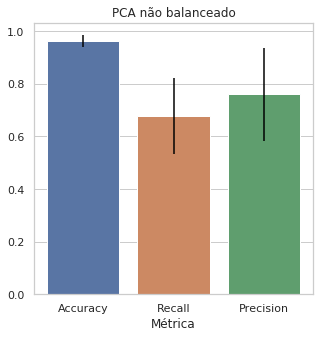

In [30]:
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 15})
fig_unbalanced = plt.figure(figsize=(5, 5))

# Medias dos melhores params
df_mean_unbalanced =  pd.DataFrame(mean_unbalanced).rename_axis('Métrica').reset_index().rename(columns = {0: 'Value'}) 

#plot
ax = sns.barplot(x="Métrica", y="Value", data=df_mean_unbalanced, ci = None)
plt.title('PCA não balanceado')


plt.errorbar(x=[0],y=mean_unbalanced[0],yerr= (acc_max_unbalanced - mean_unbalanced[0]) , fmt='none', color = 'black')
plt.errorbar(x=[1],y=mean_unbalanced[1],yerr= (rec_max_unbalanced - mean_unbalanced[1]) , fmt='none', color = 'black')
plt.errorbar(x=[2],y=mean_unbalanced[2],yerr= (pre_max_unbalanced - mean_unbalanced[2]) , fmt='none', color = 'black')

fig_unbalanced.savefig('PCA nao balanceado - MLPClassifier', bbox_inches='tight', dpi=600)

ax.set(ylabel='')

### Dataset Balanceado

[Text(157.00000000000003, 0.5, '')]

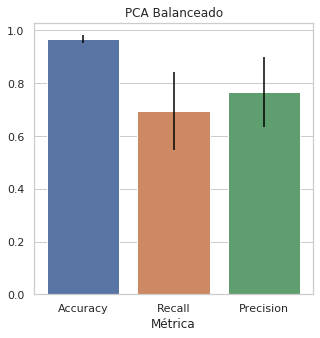

In [31]:
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 15})
fig_balanced = plt.figure(figsize=(5, 5))

# Medias dos melhores params
df_mean_balanced =  pd.DataFrame(mean_balanced).rename_axis('Métrica').reset_index().rename(columns = {0: 'Value'}) 

#plot
ax = sns.barplot(x="Métrica", y="Value", data=df_mean_balanced, ci = None)
plt.title('PCA Balanceado')


plt.errorbar(x=[0],y=mean_balanced[0],yerr= (acc_max_balanced - mean_balanced[0]) , fmt='none', color = 'black')
plt.errorbar(x=[1],y=mean_balanced[1],yerr= (rec_max_balanced - mean_balanced[1]) , fmt='none', color = 'black')
plt.errorbar(x=[2],y=mean_balanced[2],yerr= (pre_max_balanced - mean_balanced[2]) , fmt='none', color = 'black')

fig_balanced.savefig('PCA balanceado - MLPClassifier', bbox_inches='tight', dpi=600)

ax.set(ylabel='')

## Armazena os Resultados para Gráfico Comparativo

In [32]:
path_to_save = '../../model_results/'

# Leitura dos resultados anteriores
all_models_results = pd.read_excel(path_to_save+'all_models_results.xlsx')

for metrica in df_mean_unbalanced.index:
    result = [
    '8',
    'MLPClassifier',
    'PCA Desbalanceado',
    max_alpha_unbalanced,
    df_mean_unbalanced.loc[metrica]['Métrica'],
    df_mean_unbalanced.loc[metrica]['Value'],
    
    ]
    aux_df = (pd.DataFrame(result).T).rename(columns = {0: 'Atividade', 1: 'Algoritmo', 2: 'Condicao',
                                                        3: 'Melhores_Params', 4:'Metrica', 5: 'Valor'})
    all_models_results = all_models_results.append(aux_df, ignore_index=True)

# deleta da memoria
del result, aux_df

# Dataset Completo Balanceado
for metrica in df_mean_balanced.index:
    result = [
    '8',
    'MLPClassifier',
    'PCA Balanceado',
    max_alpha_balanced,
    df_mean_balanced.loc[metrica]['Métrica'],
    df_mean_balanced.loc[metrica]['Value']
    ]
    aux_df = (pd.DataFrame(result).T).rename(columns = {0: 'Atividade', 1: 'Algoritmo', 2: 'Condicao', 
                                                        3: 'Melhores_Params', 4:'Metrica', 5: 'Valor'})
    all_models_results = all_models_results.append(aux_df, ignore_index=True)

display(all_models_results)

# salva os resultados novos
try:
    all_models_results.to_excel(path_to_save+'all_models_results.xlsx', index=False)
    print('Resultados salvos com sucesso')
except Exception as e:
    print('Erro {}'.format(e))

,Atividade,Algoritmo,Condicao,Melhores_Params,Metrica,Valor
0,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Accuracy,0.960383
1,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Recall,0.86
2,7,SVC,Dataset Completo Desbalanceado - Nao Normalizado,"('linear', 1, 'scale')",Precision,0.677579
3,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.962709
4,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Recall,0.876667
5,7,SVC,Dataset Completo Balanceado - Nao Normalizado,"('rbf', 100, '0.0001')",Precision,0.690079
6,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.962709
7,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Recall,0.876667
8,7,SVC,Dataset Completo Desbalanceado - Normalizado,"('rbf', 100, '0.0001')",Precision,0.690079
9,7,SVC,Dataset Completo Balanceado - Normalizado,"('rbf', 100, '0.0001')",Accuracy,0.959193


Resultados salvos com sucesso
